# Searching for Kilonova
## This notebook is meant to cross match the LIGO skymaps with the ZTF alerts
### This involves:
- Get the skymap of GW event -> build probability contours for ras and decs involved in skymap
- Obtain the events located with specific contour (based on requirement)
- Select the events having t_gw > t_ztf
- Select the SN events from amongst all the alerts based on the image stamp, probablity etc
- Can check for fast rising events
- Make sure events are of galactic origin using stellar/sg score
- Based on the location of event get the galactic attenuation and discard ones with high attenuation (A>1)/     in the solar system plane unless we have few detections
- crossmatch with NED,SIMBAD,HECATE using custom queries and DELIGHT


### import libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import astropy.units as u
from astropy import coordinates
from astropy.time import Time
from datetime import datetime
from IPython.display import HTML
from ipywidgets import Layout, Box, widgets
from IPython.core.display import display, HTML
from matplotlib.cm import viridis
#!pip install pyephem
import ephem
#!pip install psycopg2-binary
import psycopg2
import requests
from ligo.skymap.io import read_sky_map
from ligo.skymap.postprocess import crossmatch
from astropy.utils.data import download_file
import healpy as hp
import numpy as np
from delight.delight import *
from alerce.core import Alerce
client = Alerce()

2024-01-04 09:15:28.036996: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-01-04 09:15:34.321167: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-01-04 09:15:34.322853: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-04 09:15:48.691569: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


## Download the specific skymap for  corresponding event, preferably bayestar

In [2]:

url = ('https://gracedb.ligo.org/apiweb/superevents/S230927be/files/bayestar.fits.gz,1')
gw_skymap = download_file(url, cache=True)

prob, header = hp.read_map(gw_skymap, h=True)

ipix_max = np.argmax(prob)
highest_probability = prob[ipix_max]

In [3]:
nside = hp.get_nside(prob) # calculate the healpix resolution - nside

theta, phi = hp.pix2ang(nside, ipix_max)
ra = np.rad2deg(phi)
dec = np.rad2deg(0.5 * np.pi - theta)

ra = round(ra,5); dec = round(dec,5);
print("The sky coordinates of the highest probability pixel are:", "ra =",ra,"dec =",dec, "(ICRS coordinates in degrees)")
nside

The sky coordinates of the highest probability pixel are: ra = 305.85938 dec = -7.85802 (ICRS coordinates in degrees)


512

## Build contours based on probability value of each pixel in skymap

In [4]:
from ligo.skymap.postprocess import contour
import astropy_healpix as ah

i = np.flipud(np.argsort(prob))
sorted_credible_levels = np.cumsum(prob[i])
credible_levels = np.empty_like(sorted_credible_levels)
credible_levels[i] = sorted_credible_levels
credible_levels

array([1., 1., 1., ..., 1., 1., 1.])

### Can get contour value for each pixel

In [5]:
idx=np.where(credible_levels < 0.9)
arr=np.asarray(idx)
cd=credible_levels
#selected=cd[cd<0.95]
selected_elements = [x for x in cd if x < 0.90]

In [6]:
#def pix2radec(ipix_array, nside):
    #theta, phi = hp.pix2ang(nside, ipix_array)
    #ra = np.rad2deg(phi)
    #dec = np.rad2deg(0.5 * np.pi - theta)
    #return ra, dec
%run functions.ipynb
pix2radec_vec = np.vectorize(pix2radec)

## Finally get the ra and dec of the LIGO skymap

In [7]:
ipix_array = arr
ra2, dec2 = pix2radec_vec(arr, nside=512)

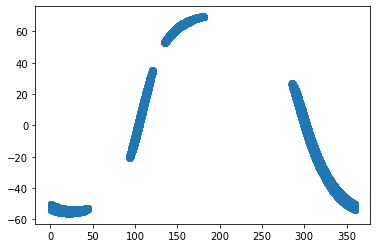

In [8]:
plt.scatter(ra2,dec2)

### Can check the area of skymap in degrees square for a given contour region

In [9]:
a=np.sum(credible_levels <= 0.9) * hp.nside2pixarea(nside, degrees=True)
b=y="%.2f" % a
print(f"Skymap area is {b} square degrees")

Skymap area is 527.14 square degrees


### Obtain a dataframe of ra,dec,contour value of the skymap

In [10]:
import pandas as pd
skymap = pd.DataFrame({'meanra': ra2.flatten(),'meandec': dec2.flatten(),'pixel_no':arr.flatten(),'prob_countour':selected_elements})

In [11]:
skymap

,meanra,meandec,pixel_no,prob_countour
0,178.167421,69.701077,97677,0.895628
1,179.796380,69.701077,97681,0.894525
2,180.203620,69.701077,97682,0.899578
3,177.770270,69.608247,98562,0.895679
4,178.175676,69.608247,98563,0.895689
...,...,...,...,...
40192,23.991713,-56.446381,2883012,0.890681
40193,24.240331,-56.446381,2883013,0.890655
40194,20.069252,-56.541802,2884444,0.892660
40195,22.063712,-56.541802,2884452,0.886896


## Divide the skymap into multiple regions, using KMeans

/home/mayhem/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


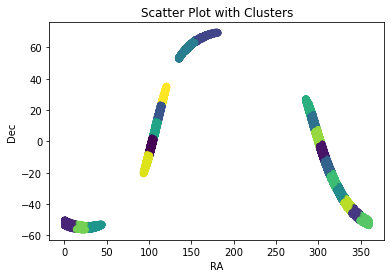

Processing Region 0 with 1963 points
Processing Region 1 with 2930 points
Processing Region 2 with 1944 points
Processing Region 3 with 2117 points
Processing Region 4 with 927 points
Processing Region 5 with 1618 points
Processing Region 6 with 2951 points
Processing Region 7 with 2574 points
Processing Region 8 with 1185 points
Processing Region 9 with 2552 points
Processing Region 10 with 1229 points
Processing Region 11 with 1942 points
Processing Region 12 with 2158 points
Processing Region 13 with 2769 points
Processing Region 14 with 1798 points
Processing Region 15 with 1632 points
Processing Region 16 with 2786 points
Processing Region 17 with 2341 points
Processing Region 18 with 1668 points
Processing Region 19 with 1113 points


In [12]:

import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans



# Number of regions (clusters) you want to select, based on the ligo skymap area
num_regions = 20

# Fit a K-Means model
kmeans = KMeans(n_clusters=num_regions)
kmeans.fit(skymap[['meanra', 'meandec']])

# Add cluster labels to the DataFrame
skymap['cluster_label'] = kmeans.labels_

# Plot the scatter plot with points colored by their cluster
plt.scatter(skymap['meanra'], skymap['meandec'], c=skymap['cluster_label'])
plt.xlabel('RA')
plt.ylabel('Dec')
plt.title('Scatter Plot with Clusters')
plt.savefig('skymap.jpg')

plt.show()

# Iterate over clusters and process each region
for cluster_label in range(num_regions):
    region_data = skymap[skymap['cluster_label'] == cluster_label]
    # Process region_data as needed
    print(f"Processing Region {cluster_label} with {len(region_data)} points")


# In this part we query the skymap regions spatially. This involves:
- Using alpha shape module to get boundaries of the earlier divided regions(concave hull)
- adjusting its parameters, so that the shape is retained
- perform spatial query using q3c_poly_query
- get the resulting data frame consisting of all ZTF events(timeframe of 5 days) within the skymap

In [13]:
import requests
url = "https://raw.githubusercontent.com/alercebroker/usecases/master/alercereaduser_v4.json"
params = requests.get(url).json()['params']

conn = psycopg2.connect(dbname=params['dbname'], user=params['user'], host=params['host'], password=params['password'])



/tmp/ipykernel_2540/54621068.py:44: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  results1= pd.read_sql_query(query, conn)


              oid      meanra   meandec      firstmjd  stellar  ndet
0    ZTF23abhgyfa  104.188592  1.954892  60214.501099    False     1
1    ZTF23abhgyfe  103.774115  1.826817  60214.501099    False     1
2    ZTF23abhgzgn  104.595345  1.361028  60214.501099    False     1
3    ZTF23abhgzgo  104.453718  1.171738  60214.501099    False     1
4    ZTF23abhhada  104.136036  0.843973  60214.501099    False     1
..            ...         ...       ...           ...      ...   ...
99   ZTF21aaernoy  100.697823 -4.851959  60215.505116    False     4
100  ZTF23abkpjta  103.061515  0.417587  60215.505116     True     2
101  ZTF23abluhwx  100.246996 -8.129879  60215.444954    False     2
102  ZTF19acbulnl  101.628860 -2.339124  60215.505116     True     7
103  ZTF23abnbgxv  101.440211 -3.862933  60215.505116    False    10

[104 rows x 6 columns]


/tmp/ipykernel_2540/54621068.py:44: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  results1= pd.read_sql_query(query, conn)


              oid      meanra    meandec      firstmjd  stellar  ndet
0    ZTF23abhdcyp  309.068548  -9.511295  60214.148357    False     1
1    ZTF23abhddch  306.020318 -10.590777  60214.148357    False     1
2    ZTF23abhddcg  306.777438 -10.414854  60214.148357    False     1
3    ZTF23abhddci  306.610441 -10.657726  60214.148357    False     1
4    ZTF23abhddcj  306.611007 -10.149887  60214.148357    False     1
..            ...         ...        ...           ...      ...   ...
388  ZTF23abhpvqe  305.027295  -9.327525  60217.149757    False     1
389  ZTF23abhpvuj  304.071307  -8.195196  60217.149757    False     1
390  ZTF23abhpvqj  304.801907  -8.360847  60217.149757    False     1
391  ZTF23ablzspc  306.594250  -5.637590  60214.191505    False     2
392  ZTF23abnpbrg  303.943661  -6.211289  60215.169803     True     2

[393 rows x 6 columns]


/tmp/ipykernel_2540/54621068.py:44: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  results1= pd.read_sql_query(query, conn)


Empty DataFrame
Columns: [oid, meanra, meandec, firstmjd, stellar, ndet]
Index: []


/tmp/ipykernel_2540/54621068.py:44: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  results1= pd.read_sql_query(query, conn)


Empty DataFrame
Columns: [oid, meanra, meandec, firstmjd, stellar, ndet]
Index: []


/tmp/ipykernel_2540/54621068.py:44: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  results1= pd.read_sql_query(query, conn)


Empty DataFrame
Columns: [oid, meanra, meandec, firstmjd, stellar, ndet]
Index: []


/tmp/ipykernel_2540/54621068.py:44: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  results1= pd.read_sql_query(query, conn)


             oid      meanra    meandec      firstmjd  stellar  ndet
0   ZTF23abhgolb  111.305296  13.835114  60214.479456    False     1
1   ZTF23abhgoyd  110.807036  13.785003  60214.479456    False     1
2   ZTF23abhgoyg  110.991553  13.965183  60214.479456    False     1
3   ZTF23abhgoyh  110.360148  14.488626  60214.479456    False     1
4   ZTF23abhgrtj  110.466440  14.948704  60214.479456    False     1
5   ZTF23abhgrtk  110.866721  14.623324  60214.479456     True     1
6   ZTF23abhgsdd  111.459287  14.636841  60214.479456    False     1
7   ZTF23abhgsdc  111.360914  14.698980  60214.479456    False     1
8   ZTF23abhhepj  114.748746  22.498279  60214.501643    False     1
9   ZTF23abhhfhw  114.299809  22.884467  60214.501643    False     1
10  ZTF23abhhfhy  113.902755  23.022426  60214.501643    False     1
11  ZTF23abhhfia  113.975732  23.165165  60214.501643    False     1
12  ZTF23abhhfic  114.541363  22.673206  60214.501643    False     1
13  ZTF23abhhfie  113.820067  22.5

/tmp/ipykernel_2540/54621068.py:44: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  results1= pd.read_sql_query(query, conn)


              oid      meanra    meandec      firstmjd  stellar  ndet
0    ZTF23abhdcif  308.667177 -14.392176  60214.147882    False     1
1    ZTF23abhdcys  309.267007 -12.656015  60214.148357    False     1
2    ZTF23abhdczi  308.962044 -13.349656  60214.148357    False     1
3    ZTF23abhdczk  309.330655 -13.104625  60214.148357    False     1
4    ZTF23abhddcf  310.018413 -13.130772  60214.148357    False     1
..            ...         ...        ...           ...      ...   ...
717  ZTF23abhpxhw  315.713463 -20.336931  60217.159699    False     2
718  ZTF23abiachy  312.509172 -18.431062  60214.190093    False     2
719  ZTF23abiackd  309.601838 -16.323113  60214.190093    False     2
720  ZTF21abyjign  309.393612 -11.867121  60216.183299    False     3
721  ZTF23abndamc  310.577024 -12.288090  60216.192431    False     2

[722 rows x 6 columns]


/tmp/ipykernel_2540/54621068.py:44: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  results1= pd.read_sql_query(query, conn)


              oid      meanra    meandec      firstmjd  stellar  ndet
0    ZTF23abhdamz  292.413165  16.165611  60214.132349    False     1
1    ZTF23abhdaoh  291.168104  15.563156  60214.132349    False     1
2    ZTF23abhdddd  296.625603  10.262404  60214.149317    False     1
3    ZTF23abhddde  296.680672  10.718919  60214.149317    False     1
4    ZTF23abhddgk  296.895617   8.586616  60214.149317    False     1
..            ...         ...        ...           ...      ...   ...
210  ZTF23abkjfni  294.480289  13.414606  60215.244479    False     6
211  ZTF23abkjgrm  294.394072  15.277293  60214.196782     True     2
212  ZTF23ablzsoc  294.918921   8.674625  60215.244479    False     2
213  ZTF23abmtodd  295.420986   8.368558  60217.154514    False     3
214  ZTF18adsekao  296.742165  10.081971  60216.192951    False    26

[215 rows x 6 columns]


/tmp/ipykernel_2540/54621068.py:44: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  results1= pd.read_sql_query(query, conn)


Empty DataFrame
Columns: [oid, meanra, meandec, firstmjd, stellar, ndet]
Index: []


/tmp/ipykernel_2540/54621068.py:44: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  results1= pd.read_sql_query(query, conn)


Empty DataFrame
Columns: [oid, meanra, meandec, firstmjd, stellar, ndet]
Index: []


/tmp/ipykernel_2540/54621068.py:44: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  results1= pd.read_sql_query(query, conn)


Empty DataFrame
Columns: [oid, meanra, meandec, firstmjd, stellar, ndet]
Index: []


/tmp/ipykernel_2540/54621068.py:44: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  results1= pd.read_sql_query(query, conn)


              oid      meanra   meandec      firstmjd  stellar  ndet
0    ZTF23abhgliv  105.545671  5.877903  60214.478982    False     1
1    ZTF23abhgljo  104.985692  4.797508  60214.478982    False     1
2    ZTF23abhgmba  106.809078  4.275512  60214.478982    False     1
3    ZTF23abhgmaz  104.981949  3.291361  60214.478982    False     1
4    ZTF23abhgnrn  106.485270  4.980466  60214.478982    False     1
..            ...         ...       ...           ...      ...   ...
152  ZTF21aacpyvt  106.051558  7.056543  60214.501099     True     2
153  ZTF18adsbmdk  105.782216  5.575296  60214.501099    False     7
154  ZTF23abmgpce  104.890005  2.915785  60214.478982    False     4
155  ZTF18adcgvfj  107.864653  8.707553  60216.467107     True     3
156  ZTF23abnbyln  108.543085  9.030531  60216.467107     True     4

[157 rows x 6 columns]


/tmp/ipykernel_2540/54621068.py:44: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  results1= pd.read_sql_query(query, conn)


              oid      meanra    meandec      firstmjd  stellar  ndet
0    ZTF23abhdalu  290.132807  17.876372  60214.132349    False     1
1    ZTF23abhdaov  289.068403  19.092985  60214.132349    False     1
2    ZTF23abhdamy  292.219151  16.622773  60214.132349    False     1
3    ZTF23abhdamp  290.625133  19.478080  60214.132349    False     1
4    ZTF23abhdand  290.013352  21.774411  60214.132349    False     1
..            ...         ...        ...           ...      ...   ...
102  ZTF23abhnpid  292.528274  17.881918  60216.193889    False     1
103  ZTF23abhnrwq  288.754075  22.580330  60216.205683    False     1
104  ZTF23abhzybt  292.903397  17.741006  60214.196782    False     2
105  ZTF23abiabqq  289.515602  19.960400  60214.186643    False     2
106  ZTF18adsczcw  291.197448  20.545632  60216.132349     True     2

[107 rows x 6 columns]


/tmp/ipykernel_2540/54621068.py:44: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  results1= pd.read_sql_query(query, conn)


              oid      meanra    meandec      firstmjd  stellar  ndet
0    ZTF23abhdpqy  315.460404 -24.092932  60214.216192    False     1
1    ZTF23abhdpqx  315.014792 -23.488097  60214.216192    False     1
2    ZTF23abhdpqw  315.668837 -23.316831  60214.216192    False     1
3    ZTF23abhdpqz  315.462465 -23.845775  60214.216192    False     1
4    ZTF23abhdpvc  317.635444 -26.924600  60214.216192    False     1
..            ...         ...        ...           ...      ...   ...
324  ZTF23abhqeaq  320.583867 -25.316145  60217.188901    False     1
325  ZTF23abhqcyh  321.491711 -26.768031  60217.188901    False     1
326  ZTF23abhqdgd  321.843445 -27.224813  60217.188901    False     1
327  ZTF23abhqean  320.719595 -25.662049  60217.188901    False     1
328  ZTF23abmirxt  319.680424 -26.700982  60216.189606    False     2

[329 rows x 6 columns]


/tmp/ipykernel_2540/54621068.py:44: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  results1= pd.read_sql_query(query, conn)


Empty DataFrame
Columns: [oid, meanra, meandec, firstmjd, stellar, ndet]
Index: []


/tmp/ipykernel_2540/54621068.py:44: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  results1= pd.read_sql_query(query, conn)


Empty DataFrame
Columns: [oid, meanra, meandec, firstmjd, stellar, ndet]
Index: []


/tmp/ipykernel_2540/54621068.py:44: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  results1= pd.read_sql_query(query, conn)


              oid      meanra   meandec      firstmjd  stellar  ndet
0    ZTF23abhddbl  303.154873 -1.632553  60214.148831    False     1
1    ZTF23abhddeg  301.885723  0.112644  60214.148831    False     1
2    ZTF22abqxuaa  302.926004  0.657769  60214.148831     True     1
3    ZTF23abhdmgo  302.820983 -2.019017  60214.191505    False     1
4    ZTF23abhdmgp  302.876469 -1.778855  60214.191505    False     1
..            ...         ...       ...           ...      ...   ...
190  ZTF23abizgze  296.643648  6.022849  60215.180081     True     2
191  ZTF22abkdqld  297.576479  3.340993  60217.154039    False     2
192  ZTF22absctun  299.548006  4.828563  60215.181030     True     4
193  ZTF23abnpbsk  299.722994  0.352039  60217.153565    False     6
194  ZTF23abnpldu  298.142320  4.911420  60215.180081     True    10

[195 rows x 6 columns]


/tmp/ipykernel_2540/54621068.py:44: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  results1= pd.read_sql_query(query, conn)


Empty DataFrame
Columns: [oid, meanra, meandec, firstmjd, stellar, ndet]
Index: []


/tmp/ipykernel_2540/54621068.py:44: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  results1= pd.read_sql_query(query, conn)


             oid      meanra    meandec      firstmjd  stellar  ndet
0   ZTF23abhlcru   96.491930 -12.958995  60215.444491    False     1
1   ZTF23abhldcb   98.514781 -11.904839  60215.444491    False     1
2   ZTF23abhldgw   97.318707 -12.681778  60215.444491    False     1
3   ZTF23abhlekg   99.004757 -12.062796  60215.444491    False     1
4   ZTF23abhlrsw  100.410360  -9.601773  60215.444954    False     1
5   ZTF23abhlsts   99.558451 -10.521505  60215.444491    False     1
6   ZTF23abhlstt   98.853389 -10.287485  60215.444491    False     1
7   ZTF23abhlsun   98.593814 -10.704685  60215.444491    False     1
8   ZTF23abhlsuq   97.680068 -10.959500  60215.444491    False     1
9   ZTF23abhlsup   97.530260 -11.112673  60215.444491    False     1
10  ZTF23abhltcm   98.077269  -9.436314  60215.444491    False     1
11  ZTF23abhltdd   99.585637 -10.996522  60215.444491    False     1
12  ZTF23abhltde   99.584434 -11.245426  60215.444491    False     1
13  ZTF23abhltdf   99.355796 -11.0

/tmp/ipykernel_2540/54621068.py:44: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  results1= pd.read_sql_query(query, conn)


             oid      meanra    meandec      firstmjd  stellar  ndet
0   ZTF23abhhdoc  117.125423  28.251422  60214.501643    False     1
1   ZTF18accdedk  116.928426  28.440862  60214.501643    False    18
2   ZTF23abhhdqk  116.777400  26.443918  60214.501643    False     1
3   ZTF23abhhdqn  116.754374  26.593139  60214.501643    False     1
4   ZTF23abhhdqm  116.342654  26.660271  60214.501643    False     1
..           ...         ...        ...           ...      ...   ...
83  ZTF23abhheua  116.917831  25.825652  60214.501643    False     1
84  ZTF23abhhgky  117.740775  27.594866  60214.501643    False     1
85  ZTF23abhhhit  116.715776  28.804900  60214.501643    False     1
86  ZTF23abhhfpe  116.497229  25.560896  60214.501643    False     1
87  ZTF23abhhfph  116.296966  25.224515  60214.501643    False     1

[88 rows x 6 columns]


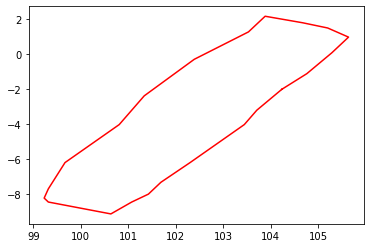

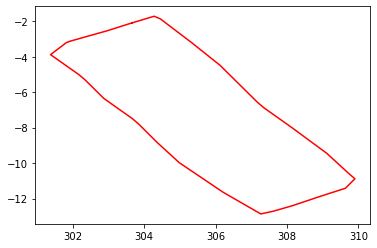

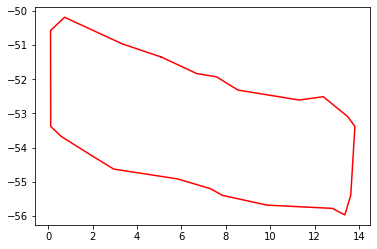

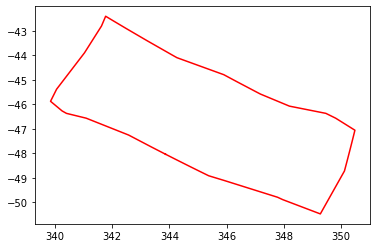

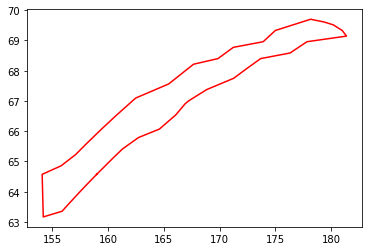

...

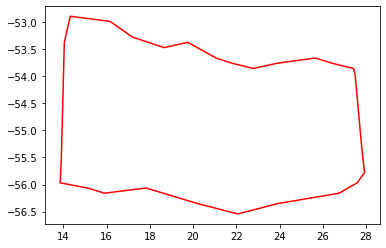

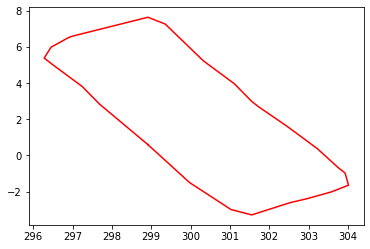

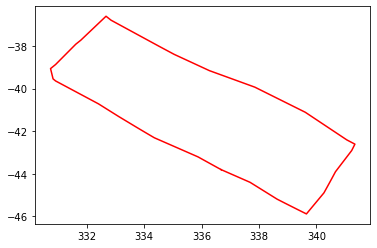

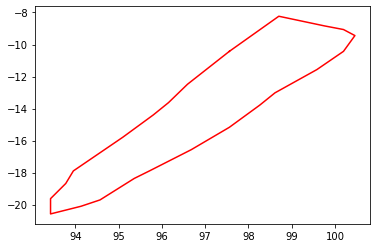

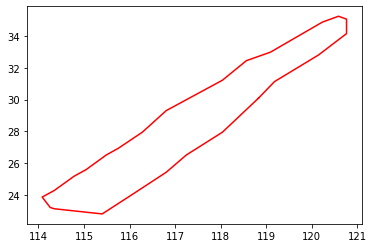

In [14]:
import alphashape
new_df=pd.DataFrame()
a=len(skymap['cluster_label'].unique())
for i in range(a):
    
    cluster_data = skymap[skymap['cluster_label'] == i]
    #plt.scatter(cluster_data['meanra'],cluster_data['meandec'])
    alt = cluster_data.iloc[::5]
    alt=alt.reset_index(drop=True)
    rag=alt['meanra'].to_numpy()
    decg=alt['meandec'].to_numpy()
    combined_array3= np.concatenate([rag[:, np.newaxis], decg[:, np.newaxis]], axis=1).ravel()

    dd = combined_array3.reshape(int(combined_array3.shape[0]/2),2)
    points_2d = [(x, y) for x, y in zip(dd[:, 0], dd[:, 1])]
    alpha_shape = alphashape.alphashape(points_2d,0.2)
    if alpha_shape.geom_type == 'Polygon':
    # Process the single Polygon
        x = np.array(alpha_shape.exterior.coords.xy[0])
        y = np.array(alpha_shape.exterior.coords.xy[1])
        fig, ax = plt.subplots()
        ax.plot(x, y,'r')
        result = []
        for l in range(len(x)):
            result.append(x[l])
            result.append(y[l])

        ndays = 5
        #mjd_last = Time(datetime.utcnow(), scale='utc').mjd - ndays
        mjd_last = int(header[30][1]) + ndays
        mjd_first= int(header[30][1])


        query = f"""
        SELECT
            object.oid, object.meanra, object.meandec, object.firstmjd, object.stellar,
            object.ndet
        FROM 
            object 
        WHERE q3c_poly_query(meanra, meandec,ARRAY[{','.join([str(coord) for coord in result])}])
            AND object.firstMJD >= %s
            AND object.firstMJD <= %s;;
        """%(mjd_first,mjd_last)
        results1= pd.read_sql_query(query, conn)
        print(results1)
        new_df=pd.concat([new_df,results1],ignore_index=True)


   

### Visualise the total area of skymap and the events returned

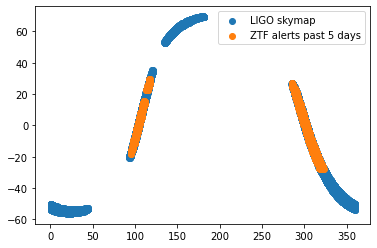

In [15]:
plt.scatter(skymap['meanra'],skymap['meandec'],label='LIGO skymap')
plt.scatter(new_df['meanra'],new_df['meandec'],label='ZTF alerts past 5 days')
plt.legend()

plt.savefig('skymap.jpg')
plt.show()

In [16]:
new_df

,oid,meanra,meandec,firstmjd,stellar,ndet
0,ZTF23abhgyfa,104.188592,1.954892,60214.501099,False,1
1,ZTF23abhgyfe,103.774115,1.826817,60214.501099,False,1
2,ZTF23abhgzgn,104.595345,1.361028,60214.501099,False,1
3,ZTF23abhgzgo,104.453718,1.171738,60214.501099,False,1
4,ZTF23abhhada,104.136036,0.843973,60214.501099,False,1
...,...,...,...,...,...,...
2404,ZTF23abhheua,116.917831,25.825652,60214.501643,False,1
2405,ZTF23abhhgky,117.740775,27.594866,60214.501643,False,1
2406,ZTF23abhhhit,116.715776,28.804900,60214.501643,False,1
2407,ZTF23abhhfpe,116.497229,25.560896,60214.501643,False,1


## Crossmatch the ZTF events with skymap to obtain the ligo probability values

In [17]:
import astropy.units as u
from astropy.coordinates import SkyCoord
ra1=np.array(new_df['meanra'])
dec1=np.array(new_df['meandec'])
ra2=np.array(skymap['meanra'])
dec2=np.array(skymap['meandec'])
c = SkyCoord(ra=ra1*u.degree, dec=dec1*u.degree)
catalog = SkyCoord(ra=ra2*u.degree, dec=dec2*u.degree)
idx, d2d, d3d = c.match_to_catalog_sky(catalog)

In [18]:
prob=[]
for index,no in enumerate(idx):
    prob.append(skymap.iloc[no][3])
    
    

In [19]:
new_df['p_ligo']=prob


### Step 1 - Here we query the alerce database, taking advatnage of its events calssification infrastructure, returning event's :
- class_name
- probability
- stellar
- ranking

In [21]:
n=new_df.set_index('oid')

In [30]:
query = """
SELECT forced_photometry.oid, forced_photometry.mjd, forced_photometry.fid, forced_photometry.mag  
FROM 
    object 
INNER JOIN
    forced_photometry
ON 
    object.oid = forced_photometry.oid
WHERE
     object.oid IN ({})
""" .format( ",".join(["'%s'" % oid for oid in n.index]))

table = pd.read_sql_query(query, conn)
table


/tmp/ipykernel_5651/1491684887.py:13: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  table = pd.read_sql_query(query, conn)


,oid,mjd,fid,mag
0,ZTF23abhgzan,60288.442025,1,21.337906
1,ZTF23abhgzan,60288.420613,2,19.904734
2,ZTF23abhgzan,60268.384653,2,19.955809
3,ZTF23abhgzan,60261.502396,2,19.822311
4,ZTF23abhgzan,60261.463009,1,20.751936
5,ZTF18accdedk,60293.479201,1,100.000000
6,ZTF18accdedk,60293.360914,1,100.000000
7,ZTF18accdedk,60293.442512,2,20.255507
8,ZTF18accdedk,60292.543310,1,100.000000
9,ZTF18accdedk,60289.363276,1,100.000000


In [31]:
query='''
SELECT
    object.oid, object.meanra, object.meandec, object.firstmjd, object.stellar,
    object.ndet, probability.probability, probability.class_name,probability.classifier_name,probability.ranking
FROM 
    object 
INNER JOIN
    probability
ON 
    object.oid = probability.oid
WHERE 
     object.oid IN ({})
    AND probability.classifier_name='stamp_classifier'
    AND (probability. class_name IN ('SN'))
''' .format( ",".join(["'%s'" % oid for oid in n.index]))

sn = pd.read_sql_query(query, conn)
sn.set_index('oid', inplace=True)
print(sn.shape)
sn

/tmp/ipykernel_5651/61653737.py:17: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  sn = pd.read_sql_query(query, conn)


(2396, 9)


,meanra,meandec,firstmjd,stellar,ndet,probability,class_name,classifier_name,ranking
oid,,,,,,,,,
ZTF23abhdalu,290.132807,17.876372,60214.132349,False,1,0.068823,SN,stamp_classifier,2
ZTF23abhdamz,292.413165,16.165611,60214.132349,False,1,0.099751,SN,stamp_classifier,3
ZTF23abhdaog,291.123866,15.715438,60214.132349,False,1,0.094551,SN,stamp_classifier,2
ZTF23abhdamy,292.219151,16.622773,60214.132349,False,1,0.082432,SN,stamp_classifier,2
ZTF23abhdamp,290.625133,19.478080,60214.132349,False,1,0.075248,SN,stamp_classifier,3
...,...,...,...,...,...,...,...,...,...
ZTF18adsekao,296.742165,10.081971,60216.192951,False,26,0.134124,SN,stamp_classifier,3
ZTF23abnbgxv,101.440211,-3.862933,60215.505116,False,10,0.041389,SN,stamp_classifier,4
ZTF19abryazq,302.074633,-1.452662,60217.153565,False,1,0.094540,SN,stamp_classifier,3


### Step 2 - Filter the events(with stamps) coming from the galaxy based on sgscore/distpnr

In [32]:
# for objects from SN table get origin of object event/ get oids for objects having sgscore <0.5
query='''
SELECT
    det.oid,det.drb,det.fid,
    det.mjd, det.magpsf, det.sigmapsf,
    det.has_stamp,
    ps1.sgscore1
FROM
    (SELECT *
    FROM detection
    WHERE oid in (%s)
    ) as det
    INNER JOIN
    (SELECT *
    FROM ps1_ztf
    WHERE oid in (%s)
    ) as ps1
    ON det.oid=ps1.oid
''' % (",".join(["'%s'" % x for x in n.index]), ",".join(["'%s'" % x for x in n.index]))

detections = pd.read_sql_query(query, conn)
detections.set_index('oid', inplace=True)
print(detections.shape)
detections

/tmp/ipykernel_5651/2000766860.py:21: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  detections = pd.read_sql_query(query, conn)


(2656, 7)


,drb,fid,mjd,magpsf,sigmapsf,has_stamp,sgscore1
oid,,,,,,,
ZTF18aafpacy,0.015723,1,60216.467107,18.234524,0.184513,True,0.998125
ZTF18abmgbmz,0.011380,2,60217.154514,16.130340,0.030681,True,1.000000
ZTF18abmgfvv,0.171117,2,60215.244479,18.199415,0.124814,True,0.952542
ZTF18abmglpq,0.105254,1,60215.178623,18.669867,0.190075,True,0.830875
ZTF18abmieep,0.002341,1,60215.178623,18.326788,0.179527,True,0.976625
...,...,...,...,...,...,...,...
ZTF23abnpldu,NaN,2,60223.185995,18.037400,0.120064,False,0.979417
ZTF23abnpldu,NaN,1,60233.198576,19.759500,0.195692,False,0.979417
ZTF23abnpldu,NaN,2,60235.130625,18.287700,0.153786,False,0.979417


<AxesSubplot:ylabel='Frequency'>

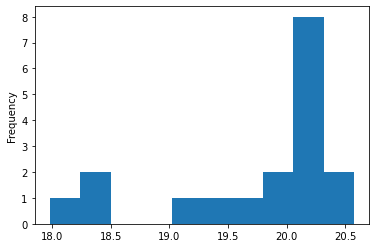

In [32]:
detections.magpsf.plot.hist()

### Step 3: get respective 'non-detection' parameters for events in skymap:
- mjd
- limiting magnitude
- filter id

In [33]:
#get non detections of earlier filtered table 'obt' to have a reference to calculate dmdt
query='''
SELECT
    oid, mjd, diffmaglim, fid
FROM
    non_detection
WHERE
    oid in (%s)
''' % (",".join(["'%s'" % oid for oid in n.index.unique()]))

non_detections = pd.read_sql_query(query, conn)
non_detections.set_index('oid', inplace=True)
non_detections.head(100)

/tmp/ipykernel_5651/380938593.py:11: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  non_detections = pd.read_sql_query(query, conn)


,mjd,diffmaglim,fid
oid,,,
ZTF18aafpacy,60213.449294,20.2289,1
ZTF18aafpacy,60186.493299,18.9426,2
ZTF18aafpacy,60186.495810,19.0142,2
ZTF18aafpacy,60186.498333,19.0016,2
ZTF18aafpacy,60186.500857,19.0469,2
ZTF18aafpacy,60186.503380,19.1253,2
ZTF18aafpacy,60194.520741,19.2445,2
ZTF18aafpacy,60209.501678,15.7421,2
ZTF18aafpacy,60213.501042,20.5362,2


#### Defined a function to calculate rate of change of magnitude
##### Since kilonovas exhibit rapid variation in magnitude w.r.t time compared to that of supernovas

In [30]:
#function defined to calculate dm/dt-> first get detections and non detections of oids from earlier table
#-> sort them based on filter ids(g/r)-> get mjds for detections and non detections-> get magnitude for detection event
#get time difference between detection and non detection for same oid-> this way calculate dm/dt
def do_dmdt(oid):
    dmdts = []
    dets = detections.loc[oid]
    try: # make sure this is a dataframe and not a series (when only one element)
        dets = dets.to_frame().transpose()
    except:
        True 
    non_dets = non_detections.loc[oid]
    try: # make sure this is a dataframe and not a series (when only one element)
        non_dets = non_dets.to_frame().transpose()
    except:
        True 
    for fid in sorted(dets.fid.unique()):
        if fid == 1:
            fid_str = "g"
        elif fid == 2:
            fid_str = "r"
        else:
            continue
        mask_det = (dets.fid == fid)
        idx_1st_det = dets.loc[mask_det].mjd.astype(float).idxmin()
        mask_non_det = (non_dets.mjd < float(n.loc[oid].firstmjd)) & (non_dets.fid == fid)
        if mask_non_det.sum() >= 1: # filter must be in both dets and non_dets
            dm = np.array(dets.loc[idx_1st_det].magpsf - non_dets.loc[mask_non_det].diffmaglim)
            dm_error = np.array(dets.loc[idx_1st_det].magpsf + dets.loc[idx_1st_det].sigmapsf - non_dets.loc[mask_non_det].diffmaglim)
            dt = np.array(dets.loc[idx_1st_det].mjd - non_dets.loc[mask_non_det].mjd)
            dmdt = dm/dt
            dmdt_error = dm_error/dt
            idx_dmdt = np.argmin(dmdt_error) #dmdt = (dm/dt).min()                                                                                                                                         
            dmdt_min = dmdt[idx_dmdt]
            dmdt_error_min = dmdt_error[idx_dmdt]
            newdf = pd.DataFrame(data = {"oid":[oid],"dmdt_min": [dmdt_min], "dmdt_error": [dmdt_error_min - dmdt_min], \
                                         "dmdt_comp": [dmdt_error_min], 'dt': [dt[idx_dmdt]], 'fid': int(fid), \
                                         'Flag': [dt[idx_dmdt] < 0.5]}, index = [oid])
            dmdts.append(newdf)
            

    if dmdts == []:
        return None
    else:
        
        return pd.concat(dmdts)

### Step-5: create data frame showing the dmdt values for all the events

In [34]:
#create data frame using above function based on oid
oids_nd = non_detections.index.unique()
dmdts = []
for oid in oids_nd:
    try:
        dmdt = do_dmdt(oid)
        if dmdt is None:
            continue
        else:
            dmdts.append(dmdt)
    except:
        continue
dmdts = pd.concat(dmdts)



In [35]:
dmdts

,oid,dmdt_min,dmdt_error,dmdt_comp,dt,fid,Flag
ZTF18aafpacy,ZTF18aafpacy,-0.660868,0.061141,-0.599727,3.017813,1,False
ZTF18abmgbmz,ZTF18abmgbmz,-1.942614,0.016063,-1.926551,1.910035,2,False
ZTF18abmgfvv,ZTF18abmgfvv,-0.767177,0.060589,-0.706588,2.060000,2,False
ZTF18abmglpq,ZTF18abmglpq,-0.382956,0.092936,-0.290020,2.045231,1,False
ZTF18abmieep,ZTF18abmieep,-0.591724,0.087779,-0.503945,2.045231,1,False
...,...,...,...,...,...,...,...
ZTF23abnbgxv,ZTF23abnbgxv,-33.072062,1.373054,-31.699008,0.058738,2,True
ZTF23abnbyln,ZTF23abnbyln,-0.496154,0.087349,-0.408805,3.017813,1,False
ZTF23abndamc,ZTF23abndamc,-1.197559,0.121896,-1.075664,2.044074,1,False
ZTF23abnpbsk,ZTF23abnpbsk,-0.069536,0.004320,-0.065216,29.931470,1,False


<AxesSubplot:ylabel='Frequency'>

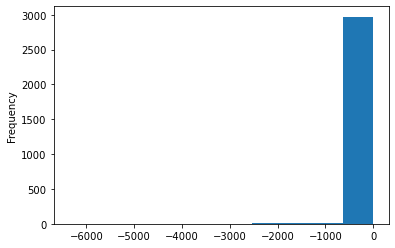

In [33]:
dmdts.dmdt_min.plot.hist()

In [36]:
from astroquery.irsa_dust import IrsaDust
import astropy.coordinates as coord
import astropy.units as u

/tmp/ipykernel_5651/232994635.py:1: DeprecationWarning: the ``irsa_dust`` module has been moved to astroquery.ipac.irsa.irsa_dust, please update your imports.
  from astroquery.irsa_dust import IrsaDust


### Step 6: Get the galactic coordinates of the events. Prioritize the events having ndet > 1/ events off the ecliptic and galactic extinction < 1

In [43]:
#get ecliptic latitude , galactic latitude and galactic extinction for above oids
ecl_lat = {}
gal_lat = {}
gal_A_g = {}

for oid in n.index:
    try:
   
        print(oid)
        ra = n.loc[oid].meanra
        dec = n.loc[oid].meandec
        coo = coord.SkyCoord(ra, dec, unit='deg', frame='fk5')    

        # ecliptic coordinates (input is hours, degrees)
        ecl_lat[oid] = np.rad2deg(ephem.Ecliptic(ephem.Equatorial('%s' % (ra / 15.), '%s' % dec, epoch=ephem.J2000)).lat)

        # galactic latitude
        gal_lat[oid] = np.rad2deg(ephem.Galactic(ephem.Equatorial('%s' % (ra / 15.), '%s' % dec, epoch=ephem.J2000)).lat)

        # Galactic extinction (use SFD = D.J. Schlegel, D.P. Finkbeiner, & M. Davis (1998, ApJ, 500, 525))
        table = IrsaDust.get_extinction_table(coo)
        gal_A_g[oid] = float(table[table["Filter_name"] == "SDSS g"]["A_SFD"])
        
    except (TypeError,TimeoutError) as e:
        print(f"Error: {e}")
        time.sleep(5.5)
        continue
    

ZTF23abhlcru
ZTF23abhldcb
ZTF23abhldgw
ZTF23abhlekg
ZTF23abhlrsv
ZTF23abhlrsw
ZTF23abhlsts
ZTF23abhlstt
ZTF23abhlsun
ZTF23abhlsuq
ZTF23abhlsup
ZTF23abhltcm
ZTF23abhltdd
ZTF23abhltde
ZTF23abhltdf
ZTF23abhltdg
ZTF23abhltcn
ZTF23abhltez
ZTF23abhltkw
ZTF23abhltzb
ZTF23abhltzc
ZTF23abhltzd
ZTF23abhluak
ZTF23abhluzn
ZTF23abhluzo
ZTF23abhlyyr
ZTF23abhlzhz
ZTF23abhmafn
ZTF23abhlzqw
ZTF23abhlzsc
ZTF23abhlzsd
ZTF23abhlzul
ZTF23abhlzvs
ZTF23abhmagz
ZTF23abhlzxf
ZTF23abhlzxh
ZTF23abhmagr
ZTF23abhmags
ZTF23abhmagu
ZTF23abhmafl
ZTF21acoehmh
ZTF21acoeqeq
ZTF23abhoyiy
ZTF23abhoyre
ZTF23abhoyvg
ZTF23abhoziv
ZTF20acwbnjx
ZTF23abhozcb
ZTF23abhozcc
ZTF23abhozuf
ZTF21acoisna
ZTF23abhrxau
ZTF23abhrxat
ZTF22aafwtiy
ZTF23abhzcpr
ZTF23abiiuah
ZTF23abjhvcy
ZTF23abjiaqt
ZTF23abjiaqw
ZTF23abhqdhh
ZTF23abhddbl
ZTF23abhddeg
ZTF22abqxuaa
ZTF23abhdmgo
ZTF23abhdmgp
ZTF23abhdmgn
ZTF23abhdmpl
ZTF23abhdmol
ZTF23abhdmtz
ZTF23abhdmua
ZTF23abhdmub
ZTF23abhdmtj
ZTF23abhdmwb
ZTF23abhdmxn
ZTF23abhdmuc
ZTF23abhdmxo
ZTF23abhdnbh

ZTF23abhdvft
ZTF23abhdvax
ZTF23abhdvay
ZTF23abhdvaw
ZTF23abhdvaz
ZTF23abhdvbl
ZTF23abhdvbr
ZTF23abhdvbu
ZTF23abhdvbv
ZTF23abhdvby
ZTF23abhdvbz
ZTF23abhdvcl
ZTF23abhdvdq
ZTF23abhdvdr
ZTF23abhditf
ZTF23abhdith
ZTF23abhditm
ZTF23abhditp
ZTF23abhdivl
ZTF23abhdiwf
ZTF23abhdizf
ZTF23abhdizk
ZTF23abhdjdp
ZTF23abhdjdv
ZTF23abhdjgh
ZTF23abhdjgl
ZTF23abhdjgr
ZTF23abhdjhn
ZTF23abhdjmd
ZTF23abhdjox
ZTF23abhdjpc
ZTF23abhdjtg
ZTF23abhdjti
ZTF23abhdkgc
ZTF23abhdkgp
ZTF23abhdkmd
ZTF23abhdkvx
ZTF23abhdkwb
ZTF23abhdivc
ZTF23abhdlcn
ZTF23abhdjki
ZTF23abhdjkh
ZTF23abhdkfw
ZTF23abhdkhd
ZTF23abhdkrr
ZTF23abhdldz
ZTF23abhdljd
ZTF23abhditr
ZTF23abhdits
ZTF23abhdiuu
ZTF23abhdixv
ZTF23abhdjqv
ZTF23abhdkgd
ZTF23abhdkhe
ZTF23abhdkln
ZTF23abhdklw
ZTF23abhdkly
ZTF23abhdlar
ZTF23abhdlkx
ZTF23abhdjkf
ZTF23abhdurd
ZTF23abhdusf
ZTF23abhdjhm
ZTF23abhduvk
ZTF23abhduvv
ZTF23abhduwb
ZTF23abhduxe
ZTF23abhduxk
ZTF23abhduxl
ZTF23abhduzg
ZTF23abhdvdw
ZTF23abhduvo
ZTF23abhduzh
ZTF23abhdvbm
ZTF23abhdvbx
ZTF23abhduts
ZTF23abhduvm

ZTF23abhgylx
ZTF23abhgzgn
ZTF23abhgzgo
ZTF23abhhada
ZTF23abhhajn
ZTF23abhgyfd
ZTF23abhgzgp
ZTF23abhgzgq
ZTF23abhhajm
ZTF23abhlpwv
ZTF18actiafa
ZTF23abhlpxj
ZTF23abhlqsa
ZTF23abhlqxl
ZTF23abhlrba
ZTF23abhlrbc
ZTF23abhlrbb
ZTF23abhlrgs
ZTF23abhlrje
ZTF23abhlrlk
ZTF23abhlsfm
ZTF23abhlroe
ZTF23abhlrql
ZTF18adslcsz
ZTF23abhlrpe
ZTF23abhlrpf
ZTF19adgjqje
ZTF23abhlrwb
ZTF23abhlrwa
ZTF23abhlrii
ZTF23abhlrlo
ZTF23abhlrlp
ZTF23abhlrsj
ZTF23abhlsbt
ZTF23abhlrwf
ZTF23abhlrvz
ZTF23abhlrwc
ZTF23abhlrwe
ZTF23abhlskp
ZTF23abhlsks
ZTF23abhlspk
ZTF23abhlspj
ZTF23abhlspl
ZTF23abhlspm
ZTF23abhlspn
ZTF23abhlspo
ZTF23abhlsgd
ZTF23abhlsvd
ZTF23abhltci
ZTF23abhlsvc
ZTF23abhlusl
ZTF20adbjusm
ZTF23abhlvdv
ZTF23abhlvdw
ZTF23abhlvkr
ZTF19acvdcqg
ZTF23abhlzkd
ZTF23abhlzpv
ZTF23abhlzsm
ZTF23abhmaha
ZTF23abhmall
ZTF23abhmaln
ZTF23abhmalm
ZTF23abhmaqy
ZTF23abhmbjz
ZTF23abhmawo
ZTF23abhmaxk
ZTF23abhmcbl
ZTF23abhmcbp
ZTF23abhmcip
ZTF23abhmclt
ZTF23abhmcls
ZTF23abhmclu
ZTF23abhmcwd
ZTF23abhmcwc
ZTF23abhmdtr
ZTF23abhmdyq

ZTF23abhdpzl
ZTF23abhdpzm
ZTF23abhdqcg
ZTF23abhdqid
ZTF23abhdqsh
ZTF23abhdqsi
ZTF23abhdqsk
ZTF23abhdqsn
ZTF23abhdpsg
ZTF23abhdptz
ZTF23abhdrrp
ZTF23abhdprn
ZTF23abhdprs
ZTF23abhdprw
ZTF23abhdpzs
ZTF23abhdrrt
ZTF23abhiqso
ZTF23abhirly
ZTF23abhirja
ZTF23abhirjb
ZTF23abhisbh
ZTF23abhisbj
ZTF23abhisbl
ZTF23abhiuxl
ZTF23abhiuul
ZTF23abhiuxk
ZTF23abhiuxj
ZTF23abhivgj
ZTF23abhiwkj
ZTF23abhiwkl
ZTF23abhiwkm
ZTF23abhiwou
ZTF23abhiwov
ZTF23abhiwfg
ZTF23abhjcdz
ZTF23abhjcdv
ZTF23abhjcdx
ZTF23abhjcdw
ZTF23abhjcea
ZTF23abhjceb
ZTF23abhneif
ZTF23abhndqq
ZTF23abhndop
ZTF23abhndor
ZTF23abhndox
ZTF23abhndxu
ZTF23abhndxv
ZTF23abhndxw
ZTF23abhndxx
ZTF23abhndyh
ZTF23abhndyj
ZTF23abhneal
ZTF23abhneau
ZTF23abhndps
ZTF23abhndpu
ZTF23abhndpw
ZTF23abhndpx
ZTF23abhnecj
ZTF23abhneci
ZTF23abhnecl
ZTF23abhnecn
ZTF23abhneck
ZTF23abhneco
ZTF23abhnecr
ZTF23abhnecp
ZTF23abhnect
ZTF23abhnecs
ZTF23abhnecu
ZTF23abhnecv
ZTF23abhnecw
ZTF23abhndrb
ZTF23abhndrc
ZTF23abhndrk
ZTF23abhndrm
ZTF23abhndro
ZTF23abhndrw
ZTF23abhndrx

In [44]:
dfp=pd.DataFrame.from_dict({'ecl_lat': ecl_lat, 'gal_lat': gal_lat, 'gal_A_g': gal_A_g})


In [45]:
dfp

,ecl_lat,gal_lat,gal_A_g
ZTF23abhlcru,-36.221550,-11.446170,1.370
ZTF23abhldcb,-35.043342,-9.208975,1.668
ZTF23abhldgw,-35.897129,-10.599365,1.227
ZTF23abhlekg,-35.165375,-8.847388,1.591
ZTF23abhlrsv,-32.108564,-6.439304,2.242
...,...,...,...
ZTF23abhpegf,-8.236537,12.375050,0.413
ZTF23abhpegh,-7.679091,12.614431,0.444
ZTF23abhpegg,-7.512420,13.123943,0.409
ZTF23abhpegi,-8.039075,12.461533,0.453


<AxesSubplot:ylabel='Frequency'>

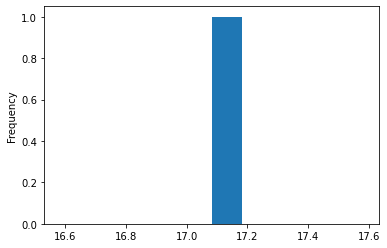

In [53]:
sn_final.ecl_lat.plot.hist()

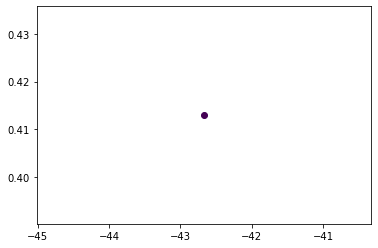

In [54]:
fig, ax = plt.subplots()
ax.scatter(sn_final.gal_lat, sn_final.gal_A_g, c=sn_final.ndet)

Exclude the data unless it has two detections or it is close to galactic plane:

In [44]:
#display the difference images of earlier oids
for oid in sn_final.loc[mask].index:
    display(HTML("<a href='http://alerce.online/object/%s'> %s <a>" % (oid, oid)))
    display(pd.DataFrame(sn_final.loc[oid]).transpose())
    client.plot_stamps(oid)
    sn.loc[oid]

,meanra,meandec,firstmjd,stellar,ndet,probability,class_name,ranking,ecl_lat,gal_lat,gal_A_g
ZTF23ablcmvs,150.218529,41.403922,60234.508125,False,1,0.783054,SN,1,27.296543,52.431894,0.055


### Step 7: Use 'DELIGHT' to obtain the proper coordinates of the ZTF events

In [50]:
import time
d_ra={}
d_dec={}
max_retries = 3 
for oid in n.index:
    retries = 0
    while retries < max_retries:
        try:
            d_ra[oid], d_dec[oid] = get_del(oid)
            break  # If successful, exit the retry loop
        except (TypeError, ConnectionError) as e:
            retries += 1
            print(f"Error for {oid}: {e}")
            time.sleep(5.5)
        except Exception as inner_exception:
            retries += 1
            print(f"Error for {oid}: {inner_exception}")
            time.sleep(5.5)
    else:
        print(f"Max retries reached for {oid}. Skipping.")

Error for ZTF23abhlcru: only dimensionless scalar quantities can be converted to Python scalars
Error for ZTF23abhlcru: only dimensionless scalar quantities can be converted to Python scalars
Error for ZTF23abhlcru: only dimensionless scalar quantities can be converted to Python scalars


KeyboardInterrupt: 

In [21]:
new_df

,oid,meanra,meandec,firstmjd,stellar,ndet,p_ligo
0,ZTF23abhgyfa,104.188592,1.954892,60214.501099,False,1,0.826164
1,ZTF23abhgyfe,103.774115,1.826817,60214.501099,False,1,0.868746
2,ZTF23abhgzgn,104.595345,1.361028,60214.501099,False,1,0.718168
3,ZTF23abhgzgo,104.453718,1.171738,60214.501099,False,1,0.716617
4,ZTF23abhhada,104.136036,0.843973,60214.501099,False,1,0.717425
...,...,...,...,...,...,...,...
2404,ZTF23abhheua,116.917831,25.825652,60214.501643,False,1,0.898346
2405,ZTF23abhhgky,117.740775,27.594866,60214.501643,False,1,0.878778
2406,ZTF23abhhhit,116.715776,28.804900,60214.501643,False,1,0.868197
2407,ZTF23abhhfpe,116.497229,25.560896,60214.501643,False,1,0.898351


#### get delight host of GW event, if it fails once try again then skip

In [ ]:
import time
d_ra={}
d_dec={}
max_retries = 3 
for index,row in new_df.iterrows():
    retries = 0
    while retries < max_retries:
        try:
            d_ra[row["oid"]],d_dec[row["oid"]] = gethost(row["oid"],row["meanra"],row["meandec"])
            break
        except (TypeError, ConnectionError) as e:
            retries += 1
            print(f"Error for {index}: {e}")
            time.sleep(5.5)
        except Exception as inner_exception:
            retries += 1
            print(f"Error for {index}: {inner_exception}")
            time.sleep(5.5)
    else:
        print(f"Max retries reached for {index}. Skipping.")
    continue


Loading WCS information


2024-01-04 09:26:38.077969: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhgyfa,104.188592,1.954892,0.001938,stack_r_ra104.188592_dec1.954892_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (104.1...",239.74591924283504,239.51385605810344,1,1,...,"[[-7.5865983963012695, 13.801189422607422], [-...",-8.131873,12.670428,3.476912,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",104.189164,1.955766,104.189088,1.955544


Loading WCS information


2024-01-04 09:26:48.096985: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhgyfe,103.774115,1.826817,0.001836,stack_r_ra103.774115_dec1.826817_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (103.7...",240.0288721421539,240.28277556269495,1,1,...,"[[-0.23767338693141937, -23.43120574951172], [...",6.743892,-16.014006,14.931172,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",103.773653,1.825699,103.773455,1.830303


Loading WCS information


2024-01-04 09:26:58.517288: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_483/rot90/Assert/AssertGuard/branch_executed/_84


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhgzgn,104.595345,1.361028,0.00108,stack_r_ra104.595345_dec1.361028_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (104.5...",239.5177730846808,240.39787064434313,1,1,...,"[[6.979351043701172, -0.4678652286529541], [9....",1.299542,-3.363857,6.998906,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",104.595261,1.360789,104.594905,1.359445


Loading WCS information


2024-01-04 09:27:08.486179: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhgzgo,104.453718,1.171738,0.000805,stack_r_ra104.453718_dec1.171738_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (104.4...",239.9191224540482,239.63801996484835,1,1,...,"[[0.2963176965713501, 16.697734832763672], [0....",0.66345,14.474735,3.953088,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",104.453678,1.172737,104.453119,1.174426


Loading WCS information


2024-01-04 09:27:18.504029: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhada,104.136036,0.843973,0.002305,stack_r_ra104.136036_dec0.843973_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (104.1...",239.80564163969757,239.89326958079255,1,1,...,"[[11.069148063659668, -6.142136573791504], [8....",8.480551,-6.074419,4.977143,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",104.135453,0.843545,104.135533,0.843646


Loading WCS information


2024-01-04 09:27:29.059824: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhgzgp,104.311387,1.370494,0.00072,stack_r_ra104.311387_dec1.370494_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (104.3...",239.90049115633155,239.9543032337151,1,1,...,"[[7.0793657302856445, -16.719982147216797], [-...",-1.539035,-14.205403,5.865575,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",104.3115,1.369502,104.312446,1.366242


Loading WCS information


2024-01-04 09:27:39.012714: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhgzgq,104.350896,1.614172,0.002305,stack_r_ra104.350896_dec1.614172_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (104.3...",239.83897677006917,240.33532637223288,1,1,...,"[[-3.6018829345703125, -5.0935845375061035], [...",-1.072805,-6.46594,4.435569,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",104.350976,1.613717,104.354266,1.612008


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 102.7511221 -2.5269149


Traceback (most recent call last):
  File "/home/mayhem/.local/bin/panstamps", line 8, in <module>
    sys.exit(main())
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/cl_utils.py", line 263, in main
    fitsPaths, jpegPaths, colorPath = images.get()
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/downloader.py", line 142, in get
    content, status_code, url = self.get_html_content()
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/downloader.py", line 318, in get_html_content
    return str(response.content), response.status_code, str(response.url)
UnboundLocalError: local variable 'response' referenced before assignment


Error for 7: Command 'panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 102.7511221 -2.5269149' returned non-zero exit status 1.
panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 102.7511221 -2.5269149


Traceback (most recent call last):
  File "/home/mayhem/.local/bin/panstamps", line 8, in <module>
    sys.exit(main())
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/cl_utils.py", line 263, in main
    fitsPaths, jpegPaths, colorPath = images.get()
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/downloader.py", line 142, in get
    content, status_code, url = self.get_html_content()
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/downloader.py", line 318, in get_html_content
    return str(response.content), response.status_code, str(response.url)
UnboundLocalError: local variable 'response' referenced before assignment


Error for 7: Command 'panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 102.7511221 -2.5269149' returned non-zero exit status 1.
panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 102.7511221 -2.5269149


Traceback (most recent call last):
  File "/home/mayhem/.local/bin/panstamps", line 8, in <module>
    sys.exit(main())
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/cl_utils.py", line 263, in main
    fitsPaths, jpegPaths, colorPath = images.get()
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/downloader.py", line 142, in get
    content, status_code, url = self.get_html_content()
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/downloader.py", line 318, in get_html_content
    return str(response.content), response.status_code, str(response.url)
UnboundLocalError: local variable 'response' referenced before assignment


Error for 7: Command 'panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 102.7511221 -2.5269149' returned non-zero exit status 1.
Max retries reached for 7. Skipping.
panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 104.7466593 -1.0890064


Traceback (most recent call last):
  File "/home/mayhem/.local/bin/panstamps", line 8, in <module>
    sys.exit(main())
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/cl_utils.py", line 263, in main
    fitsPaths, jpegPaths, colorPath = images.get()
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/downloader.py", line 142, in get
    content, status_code, url = self.get_html_content()
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/downloader.py", line 318, in get_html_content
    return str(response.content), response.status_code, str(response.url)
UnboundLocalError: local variable 'response' referenced before assignment


Error for 8: Command 'panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 104.7466593 -1.0890064' returned non-zero exit status 1.
panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 104.7466593 -1.0890064


Traceback (most recent call last):
  File "/home/mayhem/.local/bin/panstamps", line 8, in <module>
    sys.exit(main())
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/cl_utils.py", line 263, in main
    fitsPaths, jpegPaths, colorPath = images.get()
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/downloader.py", line 142, in get
    content, status_code, url = self.get_html_content()
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/downloader.py", line 318, in get_html_content
    return str(response.content), response.status_code, str(response.url)
UnboundLocalError: local variable 'response' referenced before assignment


Error for 8: Command 'panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 104.7466593 -1.0890064' returned non-zero exit status 1.
panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 104.7466593 -1.0890064


Traceback (most recent call last):
  File "/home/mayhem/.local/bin/panstamps", line 8, in <module>
    sys.exit(main())
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/cl_utils.py", line 263, in main
    fitsPaths, jpegPaths, colorPath = images.get()
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/downloader.py", line 142, in get
    content, status_code, url = self.get_html_content()
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/downloader.py", line 318, in get_html_content
    return str(response.content), response.status_code, str(response.url)
UnboundLocalError: local variable 'response' referenced before assignment


Error for 8: Command 'panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 104.7466593 -1.0890064' returned non-zero exit status 1.
Max retries reached for 8. Skipping.
panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 104.4427853 -1.2071648
Loading WCS information


2024-01-04 09:28:32.561476: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlpxj,104.442785,-1.207165,0.001298,stack_r_ra104.442785_dec-1.207165_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (104.4...",239.47858367021672,239.95010990260016,1,1,...,"[[-0.7754446268081665, 6.853475570678711], [8....",0.148413,-1.942853,9.547429,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",104.442781,-1.207306,104.442986,-1.209546


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 102.2713948 -4.0188081
Loading WCS information


2024-01-04 09:28:50.140062: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlqsa,102.271395,-4.018808,0.000803,stack_r_ra102.271395_dec-4.018808_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (102.2...",239.70720829045604,239.86278404634868,1,1,...,"[[4.537583351135254, 0.9580051898956299], [-2....",-0.471874,-1.692652,4.879348,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",102.271434,-4.018931,102.267183,-4.019254


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 102.674863 -0.410405
Loading WCS information


2024-01-04 09:29:08.558362: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlqxl,102.674863,-0.410405,0.0,stack_r_ra102.674863_dec-0.410405_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (102.6...",240.14018316821966,240.3743582483985,1,1,...,"[[-5.401430130004883, 13.630717277526855], [1....",-9.387797,16.404023,11.999262,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",102.675522,-0.409273,102.674006,-0.410276


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 102.8411809 -1.3404743
Loading WCS information


2024-01-04 09:29:24.388505: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlrba,102.841181,-1.340474,0.001138,stack_r_ra102.841181_dec-1.340474_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (102.8...",239.7144124894221,239.55589465424237,1,1,...,"[[28.18661880493164, 62.702178955078125], [18....",23.426884,36.906961,13.880322,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",102.839563,-1.337917,102.840945,-1.338632


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 102.531753 -1.2939985
Loading WCS information


2024-01-04 09:29:39.806926: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlrbc,102.531753,-1.293999,0.0018,stack_r_ra102.531753_dec-1.293999_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (102.5...",239.50084866667385,239.73166897533338,1,1,...,"[[8.466605186462402, 5.585597991943359], [-1.1...",-4.668947,-1.031843,7.985389,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",102.532083,-1.294076,102.53316,-1.294279


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 102.6125173 -1.4057195
Loading WCS information


2024-01-04 09:29:58.379786: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlrbb,102.612517,-1.40572,0.002099,stack_r_ra102.612517_dec-1.405720_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (102.6...",239.62105292093838,239.92529660476248,1,1,...,"[[21.30006980895996, 2.5819902420043945], [17....",19.216172,-3.383692,8.43122,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",102.611189,-1.40596,102.61134,-1.403249


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 101.2955743 -3.7158561
Loading WCS information


2024-01-04 09:30:16.632159: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlrgs,101.295574,-3.715856,0.001136,stack_r_ra101.295574_dec-3.715856_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (101.2...",240.34539336998205,239.54185770224285,1,1,...,"[[-5.727619171142578, -8.925580024719238], [-3...",-3.978183,-7.37445,3.703697,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",101.295858,-3.716373,101.295818,-3.716503


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 103.5909417 -1.296777
Loading WCS information


2024-01-04 09:30:33.417303: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlrje,103.590942,-1.296777,0.00108,stack_r_ra103.590942_dec-1.296777_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (103.5...",240.38303820768397,240.35771472540728,1,1,...,"[[-2.2200474739074707, 5.8938164710998535], [-...",-1.833145,0.587193,4.620879,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",103.591075,-1.296742,103.593894,-1.296967


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 100.7074651 -5.3210971
Loading WCS information


2024-01-04 09:30:52.215535: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlrlk,100.707465,-5.321097,0.000508,stack_r_ra100.707465_dec-5.321097_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.7...",240.397448372888,239.56450353706168,1,1,...,"[[11.209162712097168, 0.9467756748199463], [12...",7.645764,-1.401732,7.211806,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.706938,-5.3212,100.707411,-5.320279


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 100.394465 -6.1954916
Loading WCS information


2024-01-04 09:31:13.018006: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 8s 8s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlsfm,100.394465,-6.195492,0.00144,stack_r_ra100.394465_dec-6.195492_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.3...",240.19205779092044,239.6570319794937,1,1,...,"[[-10.52881908416748, -5.482089042663574], [-1...",-16.265304,-5.710459,5.875867,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.395607,-6.195896,100.396065,-6.195994


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 105.0596469 0.3093478
Loading WCS information


2024-01-04 09:31:32.584758: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlroe,105.059647,0.309348,0.000805,stack_r_ra105.059647_dec0.309348_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (105.0...",239.83020818122895,240.21686972457246,1,1,...,"[[26.206804275512695, 7.38767147064209], [15.6...",20.527113,8.287675,9.00784,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",105.058229,0.309917,105.060743,0.309442


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 104.7774182 0.0059739
Loading WCS information


2024-01-04 09:31:49.939306: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlrql,104.777418,0.005974,0.000805,stack_r_ra104.777418_dec0.005974_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (104.7...",239.61605287035854,240.34799750901584,1,1,...,"[[11.801384925842285, 9.274605751037598], [9.7...",14.001441,9.487351,4.893154,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",104.776453,0.006626,104.777069,0.006142


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 100.5178221 -6.4379833
Loading WCS information


2024-01-04 09:32:07.086558: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlrpe,100.517822,-6.437983,0.001138,stack_r_ra100.517822_dec-6.437983_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.5...",240.11868370315278,239.69440222113008,1,1,...,"[[0.12213707715272903, -0.7651296854019165], [...",-0.038987,0.133949,1.135268,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.517831,-6.43798,100.517861,-6.437986


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 100.2692 -6.7170827
Loading WCS information


2024-01-04 09:32:26.665978: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlrpf,100.2692,-6.717083,0.00108,stack_r_ra100.269200_dec-6.717083_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.2...",240.1104144343335,239.72672982784206,1,1,...,"[[52.73179244995117, -1.7061939239501953], [41...",46.135548,8.184358,8.082389,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.265982,-6.716515,100.265804,-6.715539


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 101.0203885 -8.3180547
Loading WCS information


2024-01-04 09:32:43.410059: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF19adgjqje,101.020388,-8.318055,0.002083,stack_r_ra101.020388_dec-8.318055_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (101.0...",240.10401428978662,239.694371281621,1,1,...,"[[0.12984086573123932, -0.725387454032898], [-...",0.060759,0.15751,1.085201,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",101.02039,-8.31805,101.02041,-8.318043


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 103.5736614 -2.0841515
Loading WCS information


2024-01-04 09:33:01.764886: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlrwb,103.573661,-2.084151,0.002305,stack_r_ra103.573661_dec-2.084151_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (103.5...",240.24318602917992,240.30151615569252,1,1,...,"[[-7.3402485847473145, 1.7463940382003784], [-...",-8.034432,1.621739,2.360609,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",103.574226,-2.084045,103.574411,-2.08407


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 104.2202713 -1.8726718
Loading WCS information


2024-01-04 09:33:24.329549: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlrwa,104.220271,-1.872672,0.001298,stack_r_ra104.220271_dec-1.872672_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (104.2...",239.67297364690603,240.24379807358832,1,1,...,"[[7.782140731811523, -3.968869686126709], [9.0...",10.414875,-5.344631,3.671136,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",104.219554,-1.873049,104.219726,-1.872942


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 101.7292727 -3.3829896
Loading WCS information


2024-01-04 09:33:41.688287: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlrii,101.729273,-3.38299,0.001799,stack_r_ra101.729273_dec-3.382990_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (101.7...",240.00417510068655,239.83846362572876,1,1,...,"[[1.567529320716858, -3.639333724975586], [16....",9.096538,0.884978,7.022483,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",101.728647,-3.382935,101.728087,-3.382363


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 100.8643853 -5.2455621
Loading WCS information


2024-01-04 09:33:58.854017: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlrlo,100.864385,-5.245562,0.001134,stack_r_ra100.864385_dec-5.245562_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.8...",239.7623882582111,239.67955434574287,1,1,...,"[[6.61778450012207, 1.0122044086456299], [9.12...",3.709438,2.114946,8.523093,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.864133,-5.245421,100.861585,-5.245908


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 100.9786363 -5.3891242
Loading WCS information


2024-01-04 09:34:19.230607: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlrlp,100.978636,-5.389124,0.001294,stack_r_ra100.978636_dec-5.389124_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.9...",239.7287844592156,239.61263544497342,1,1,...,"[[0.9363263845443726, -0.5096532702445984], [1...",-1.403632,-5.033993,4.727931,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.97874,-5.38948,100.98213,-5.387978


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 100.6532972 -7.3707928
Loading WCS information


2024-01-04 09:34:38.530678: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlrsj,100.653297,-7.370793,0.001014,stack_r_ra100.653297_dec-7.370793_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.6...",239.82591991166464,240.19370176549637,1,1,...,"[[-8.620492935180664, -0.8643153309822083], [-...",-9.236563,2.059637,9.617358,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.65395,-7.370656,100.654684,-7.371338


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 103.6366034 -0.0935697
Loading WCS information


2024-01-04 09:35:00.563753: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlsbt,103.636603,-0.09357,0.0018,stack_r_ra103.636603_dec-0.093570_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (103.6...",239.78056657843626,239.61812887539782,1,1,...,"[[-5.960108757019043, 3.8483240604400635], [6....",-0.051853,1.977053,4.615568,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",103.636613,-0.093439,103.635757,-0.096844


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 103.9002931 -2.223514
Loading WCS information


2024-01-04 09:35:19.795990: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlrwf,103.900293,-2.223514,0.00036,stack_r_ra103.900293_dec-2.223514_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (103.9...",239.6197493068537,240.24770817780018,1,1,...,"[[2.404296636581421, 26.632232666015625], [-4....",-12.630728,19.587171,11.346781,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",103.901177,-2.22216,103.898991,-2.221859


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 103.8737541 -2.0466626
Loading WCS information


2024-01-04 09:35:46.711531: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlrvz,103.873754,-2.046663,0.001484,stack_r_ra103.873754_dec-2.046663_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (103.8...",239.69377102785643,239.9009462090952,1,1,...,"[[-3.356856346130371, -1.4177216291427612], [-...",-4.737744,-0.575737,1.885148,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",103.87409,-2.046709,103.874179,-2.046771


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 103.6666935 -2.0788247
Loading WCS information


2024-01-04 09:36:06.105345: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlrwc,103.666693,-2.078825,0.002098,stack_r_ra103.666693_dec-2.078825_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (103.6...",239.42228886610064,240.33162325897388,1,1,...,"[[-3.8184924125671387, -5.248777389526367], [3...",1.90939,-7.03571,8.911936,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",103.666567,-2.079319,103.666181,-2.075743


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 103.9413477 -1.7983684
Loading WCS information


2024-01-04 09:36:26.383385: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlrwe,103.941348,-1.798368,0.0018,stack_r_ra103.941348_dec-1.798368_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (103.9...",240.0915688098612,240.40737259435036,1,1,...,"[[3.0031282901763916, -13.93315315246582], [8....",4.013025,-20.835595,17.867339,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",103.941075,-1.799821,103.941243,-1.797393


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 103.0478217 -3.9080038
Loading WCS information


2024-01-04 09:36:44.656296: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlskp,103.047822,-3.908004,0.001296,stack_r_ra103.047822_dec-3.908004_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (103.0...",240.23888657122916,239.7429731556149,1,1,...,"[[-7.164021015167236, -6.865056037902832], [-1...",-8.518165,-10.368971,11.220552,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",103.04842,-3.90873,103.049614,-3.906574


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 103.4494928 -3.6630023
Loading WCS information


2024-01-04 09:37:06.403891: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlsks,103.449493,-3.663002,0.001297,stack_r_ra103.449493_dec-3.663002_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (103.4...",239.59447598439965,239.52432527556448,1,1,...,"[[-7.2049336433410645, 15.581421852111816], [-...",-8.248071,16.266494,6.568446,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",103.450073,-3.66188,103.449948,-3.662768


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 101.5171107 -5.7099197
Loading WCS information


2024-01-04 09:37:24.394430: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlspk,101.517111,-5.70992,0.001524,stack_r_ra101.517111_dec-5.709920_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (101.5...",239.75822288215568,240.18003524296455,1,1,...,"[[0.13253749907016754, -2.052366018295288], [7...",4.2549,-2.068847,5.8685,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",101.51682,-5.710069,101.518519,-5.707157


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 101.7193658 -6.2321236
Loading WCS information


2024-01-04 09:37:42.929784: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlspj,101.719366,-6.232124,0.001608,stack_r_ra101.719366_dec-6.232124_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (101.7...",239.6570166050533,239.5028517572855,1,1,...,"[[8.497136116027832, 7.9332451820373535], [10....",9.966228,10.560071,7.415425,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",101.718675,-6.231397,101.719144,-6.230496


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 101.1911229 -6.0200649
Loading WCS information


2024-01-04 09:38:00.064934: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlspl,101.191123,-6.020065,0.000508,stack_r_ra101.191123_dec-6.020065_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (101.1...",240.3884387920881,239.92050920777092,1,1,...,"[[1.84052312374115, 16.8326473236084], [7.4413...",0.673621,6.729165,11.689766,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",101.191082,-6.019604,101.191022,-6.021575


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 101.8898433 -5.8985231
Loading WCS information


2024-01-04 09:38:18.438654: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlspm,101.889843,-5.898523,0.001133,stack_r_ra101.889843_dec-5.898523_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (101.8...",240.2114807437756,239.64059972173413,1,1,...,"[[1.9447985887527466, 0.11840284615755081], [4...",4.049226,2.201665,6.118753,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",101.889567,-5.898377,101.889932,-5.901218


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 101.2906963 -6.191063
Loading WCS information


2024-01-04 09:38:40.388130: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlspn,101.290696,-6.191063,0.001074,stack_r_ra101.290696_dec-6.191063_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (101.2...",240.18334095292767,240.22124627911126,1,1,...,"[[13.95102310180664, 5.99267578125], [24.89997...",20.905578,1.882215,7.30551,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",101.289242,-6.190939,101.289279,-6.190569


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 101.1531586 -5.9437813
Loading WCS information


2024-01-04 09:39:00.873812: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlspo,101.153159,-5.943781,0.001794,stack_r_ra101.153159_dec-5.943781_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (101.1...",240.00065084804595,239.45306653436614,1,1,...,"[[-4.7367963790893555, 7.5986714363098145], [-...",-6.842209,5.95731,4.136072,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",101.153643,-5.943373,101.15336,-5.941676


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 103.0813356 0.4526159
Loading WCS information


2024-01-04 09:39:19.952583: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlsgd,103.081336,0.452616,0.001484,stack_r_ra103.081336_dec0.452616_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (103.0...",240.22185866861219,240.0031150975483,1,1,...,"[[55.218292236328125, 151.9711456298828], [54....",47.850266,159.810497,10.547576,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",103.078015,0.463698,103.068646,0.467008


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 103.385596 -3.2281677
Loading WCS information


2024-01-04 09:39:39.268763: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlsvd,103.385596,-3.228168,0.00108,stack_r_ra103.385596_dec-3.228168_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (103.3...",239.65521295611688,239.92203803478333,1,1,...,"[[-0.48151540756225586, -1.7565432786941528], ...",-5.540775,-8.809119,4.847962,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",103.385987,-3.228785,103.386061,-3.228709


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 101.2033079 -7.0482018
Loading WCS information


2024-01-04 09:39:59.455649: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhltci,101.203308,-7.048202,0.000804,stack_r_ra101.203308_dec-7.048202_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (101.2...",240.04559064495493,240.02779833645582,1,1,...,"[[12.289144515991211, 2.1624958515167236], [11...",16.568969,-5.575945,7.735937,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",101.202155,-7.048595,101.201955,-7.04894


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 103.4682471 -3.2934582
Loading WCS information


2024-01-04 09:40:17.737437: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlsvc,103.468247,-3.293458,0.000805,stack_r_ra103.468247_dec-3.293458_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (103.4...",239.6714828081076,239.9126144332622,1,1,...,"[[3.7153782844543457, 6.817484378814697], [1.9...",4.151222,8.591338,5.469509,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",103.467965,-3.292868,103.467753,-3.292541


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 100.3207082 -8.3363534
Loading WCS information


2024-01-04 09:40:37.953611: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_483/rot90/Assert/AssertGuard/branch_executed/_84


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhltyy,100.320708,-8.336353,0.001607,stack_r_ra100.320708_dec-8.336353_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.3...",239.88407641789672,239.52926338481848,1,1,...,"[[1.072759747505188, 8.388944625854492], [1.99...",-0.948902,3.89234,3.270983,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.320782,-8.336089,100.314531,-8.343773


Loading WCS information


2024-01-04 09:40:48.929877: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_483/rot90/Assert/AssertGuard/branch_executed/_84


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhltzc,100.184673,-8.546483,0.000803,stack_r_ra100.184673_dec-8.546483_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.1...",239.72242305978762,239.76083732018378,1,1,...,"[[5.645428657531738, -5.867168426513672], [5.2...",5.604742,-3.621968,5.571265,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.184285,-8.546739,100.184236,-8.546672


Loading WCS information


2024-01-04 09:40:59.931823: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhltzd,100.03598,-8.673925,0.001606,stack_r_ra100.035980_dec-8.673925_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.0...",240.38879398874997,239.62299870204515,1,1,...,"[[6.639204978942871, 3.4566798210144043], [-5....",-4.411296,-9.722682,10.572794,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.036294,-8.674607,100.035447,-8.675133


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 100.111157 -7.6374558
Loading WCS information


2024-01-04 09:41:19.449272: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlusl,100.111157,-7.637456,0.00072,stack_r_ra100.111157_dec-7.637456_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.1...",239.57896558746324,240.14726397508275,1,1,...,"[[7.742032527923584, 13.140427589416504], [7.8...",3.975545,5.754331,6.34452,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.110886,-7.637062,100.110402,-7.636603


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 100.0559441 -7.4520975
Loading WCS information


2024-01-04 09:41:37.065878: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF20adbjusm,100.055944,-7.452097,0.001835,stack_r_ra100.055944_dec-7.452097_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.0...",240.37207082505302,239.79821273230846,1,1,...,"[[0.13074184954166412, -0.7235878705978394], [...",-0.092238,0.123279,1.231456,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.055957,-7.452095,100.056028,-7.452106


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 103.6525091 -0.3430512
Loading WCS information


2024-01-04 09:41:56.381167: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlvdv,103.652509,-0.343051,0.000805,stack_r_ra103.652509_dec-0.343051_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (103.6...",239.8420588070776,239.53898416193624,1,1,...,"[[-8.234356880187988, 19.91330337524414], [-3....",-0.418933,8.832137,14.820031,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",103.652545,-0.342444,103.653199,-0.341731


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 104.3119467 -0.5774077
Loading WCS information


2024-01-04 09:42:12.940817: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlvdw,104.311947,-0.577408,0.001527,stack_r_ra104.311947_dec-0.577408_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (104.3...",239.67500555315928,240.32973798705643,1,1,...,"[[5.856672286987305, -25.188783645629883], [4....",0.338746,-20.12897,11.866506,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",104.31193,-0.578811,104.311579,-0.580972


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 99.9409812 -6.341011
Loading WCS information


2024-01-04 09:42:28.901809: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlvkr,99.940981,-6.341011,0.000716,stack_r_ra99.940981_dec-6.341011_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (99.94...",239.54405348303771,240.0030237217561,1,1,...,"[[-31.235767364501953, 30.48898696899414], [-2...",-25.710075,23.245802,10.259562,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",99.942787,-6.339407,99.939782,-6.339085


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 101.1889506 -7.6513337
Loading WCS information


2024-01-04 09:42:46.635505: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF19acvdcqg,101.188951,-7.651334,0.00179,stack_r_ra101.188951_dec-7.651334_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (101.1...",240.2994808905363,240.0528252587428,1,1,...,"[[0.8858909606933594, -0.9343990087509155], [0...",0.654565,0.00721,1.220436,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",101.188911,-7.651339,101.188867,-7.651377


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 101.4137793 -7.6325874
Loading WCS information


2024-01-04 09:43:07.150657: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_483/rot90/Assert/AssertGuard/branch_executed/_84


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlzkd,101.413779,-7.632587,0.001794,stack_r_ra101.413779_dec-7.632587_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (101.4...",240.0806973954659,239.8979677628813,1,1,...,"[[-3.571337938308716, -4.306846618652344], [2....",-1.166754,-7.368906,10.974358,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",101.413867,-7.633105,101.412451,-7.637163


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 100.4114427 -7.0780437
Loading WCS information


2024-01-04 09:43:25.978619: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlzpv,100.411443,-7.078044,0.001522,stack_r_ra100.411443_dec-7.078044_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.4...",239.5862974046522,239.45762235386428,1,1,...,"[[4.758678436279297, 5.862367153167725], [9.87...",2.869236,-0.959317,7.358207,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.411248,-7.078116,100.409306,-7.079357


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 99.5471928 -7.2073772
Loading WCS information


2024-01-04 09:43:43.556458: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlzsm,99.547193,-7.207377,0.001014,stack_r_ra99.547193_dec-7.207377_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (99.54...",239.83047364563754,240.21172028349247,1,1,...,"[[1.4822535514831543, 2.3626503944396973], [-0...",-0.39635,4.151054,2.546976,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",99.547228,-7.207095,99.547259,-7.207683


Loading WCS information


2024-01-04 09:43:53.685496: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhlzxh,99.920978,-8.762224,0.001126,stack_r_ra99.920978_dec-8.762224_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (99.92...",239.90484227702837,240.2807317116749,1,1,...,"[[-12.404731750488281, -2.195016622543335], [-...",-8.092419,-3.660928,5.665961,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",99.921552,-8.762486,99.922832,-8.765116


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 101.0168608 -6.7027482
Loading WCS information


2024-01-04 09:44:12.891437: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhmaha,101.016861,-6.702748,0.001015,stack_r_ra101.016861_dec-6.702748_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (101.0...",240.0123132252977,239.66762046239091,1,1,...,"[[-1.516848087310791, 1.4952017068862915], [-3...",-2.016887,2.39039,1.107929,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",101.017008,-6.702588,101.017086,-6.702553


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 100.4075071 -6.5538353
Loading WCS information


2024-01-04 09:44:28.601197: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhmall,100.407507,-6.553835,0.001138,stack_r_ra100.407507_dec-6.553835_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.4...",239.7101812975161,240.1308542691604,1,1,...,"[[-17.26814079284668, 24.366281509399414], [-9...",-10.921017,18.922018,7.165578,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.408278,-6.552528,100.406719,-6.552081


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 100.0038853 -6.4375908
Loading WCS information


2024-01-04 09:44:48.238899: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhmaln,100.003885,-6.437591,0.001292,stack_r_ra100.003885_dec-6.437591_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.0...",240.05149933316534,239.92839695341263,1,1,...,"[[-13.167372703552246, 3.737590789794922], [-5...",-9.618277,3.069559,9.478714,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.004564,-6.437385,100.001356,-6.444887


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 100.4040422 -6.6187149
Loading WCS information


2024-01-04 09:45:08.158809: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhmalm,100.404042,-6.618715,0.000801,stack_r_ra100.404042_dec-6.618715_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.4...",240.06194810753368,239.6238944103352,1,1,...,"[[0.8564144372940063, -10.650547981262207], [-...",-1.44059,-16.635628,7.949875,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.404148,-6.619876,100.405073,-6.620102


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 101.2099587 -3.7064181
Loading WCS information


2024-01-04 09:45:24.276528: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhmaqy,101.209959,-3.706418,0.001136,stack_r_ra101.209959_dec-3.706418_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (101.2...",239.65662424702896,240.3461807654494,1,1,...,"[[2.9060709476470947, -1.3558621406555176], [8...",0.712922,-3.415013,5.292607,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",101.209916,-3.706661,101.214085,-3.70313


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 101.5667294 -3.0264259
Loading WCS information


2024-01-04 09:45:42.397912: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhmbjz,101.566729,-3.026426,0.001482,stack_r_ra101.566729_dec-3.026426_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (101.5...",240.25466639278966,239.5274050010412,1,1,...,"[[-13.232869148254395, -1.3209190368652344], [...",-14.083663,-7.883005,9.089836,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",101.567715,-3.026977,101.569042,-3.027994


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 102.9770092 0.1505936
Loading WCS information


2024-01-04 09:46:01.696081: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhmawo,102.977009,0.150594,0.00161,stack_r_ra102.977009_dec0.150594_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (102.9...",240.16809359731087,239.55587278765597,1,1,...,"[[-6.8510260581970215, -1.7983379364013672], [...",-8.060794,-2.604272,2.644885,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",102.977575,0.150407,102.978318,0.149957


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 102.5001987 -2.537654
Loading WCS information


2024-01-04 09:46:19.215360: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhmaxk,102.500199,-2.537654,0.001079,stack_r_ra102.500199_dec-2.537654_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (102.5...",239.7360262455186,239.96200380239316,1,1,...,"[[0.3234884738922119, -0.19865667819976807], [...",0.149396,0.155797,1.040102,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",102.500195,-2.537649,102.500209,-2.5376


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 102.1383763 -1.513242
Loading WCS information


2024-01-04 09:46:38.246484: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhmcbl,102.138376,-1.513242,0.00108,stack_r_ra102.138376_dec-1.513242_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (102.1...",240.32879650943505,239.89552215047206,1,1,...,"[[-7.979837417602539, 21.90575408935547], [-10...",-5.958242,19.365683,6.552964,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",102.138798,-1.511904,102.138505,-1.510929


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 102.18951143333334 -1.3292115666666666
Loading WCS information


2024-01-04 09:46:54.628547: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhmcbp,102.189511,-1.329212,0.002206,stack_r_ra102.189511_dec-1.329212_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (102.1...",240.382796258873,240.15128828387424,1,1,...,"[[0.4139840602874756, -1.338783621788025], [0....",0.763329,0.007277,1.191177,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",102.189465,-1.329217,102.189428,-1.329172


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 100.4444896 -5.9092905
Loading WCS information


2024-01-04 09:47:11.244625: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhmcip,100.44449,-5.909291,0.0023,stack_r_ra100.444490_dec-5.909291_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.4...",240.04102961050012,240.19781229762611,1,1,...,"[[-19.432832717895508, 7.317739486694336], [-0...",-11.445087,-1.637833,8.213355,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.445295,-5.909411,100.445804,-5.910064


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 101.7639192 -4.9913805
Loading WCS information


2024-01-04 09:47:27.454744: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhmclt,101.763919,-4.99138,0.001938,stack_r_ra101.763919_dec-4.991380_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (101.7...",239.92523029903714,240.06797653318608,1,1,...,"[[13.932296752929688, 10.164986610412598], [11...",9.301385,2.499269,10.555599,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",101.763277,-4.991214,101.763565,-4.992756


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 101.8430974 -5.4771607
Loading WCS information


2024-01-04 09:47:47.533495: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhmcls,101.843097,-5.477161,0.001795,stack_r_ra101.843097_dec-5.477161_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (101.8...",239.93422832974284,239.82733861419092,1,1,...,"[[4.005385398864746, 8.474589347839355], [6.51...",7.128146,8.016246,2.392855,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",101.842606,-5.476611,101.842624,-5.476632


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 101.1666755 -5.3292348
Loading WCS information


2024-01-04 09:48:06.839923: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_483/rot90/Assert/AssertGuard/branch_executed/_84


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhmclu,101.166675,-5.329235,0.001931,stack_r_ra101.166675_dec-5.329235_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (101.1...",239.70767609913753,240.35321361017668,1,1,...,"[[5.658514022827148, 5.0026936531066895], [3.0...",4.437697,4.614385,2.266992,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",101.166372,-5.32892,101.16642,-5.329027


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 102.21235775 -5.20710515
Loading WCS information


2024-01-04 09:48:27.617833: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 8s 8s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhmcwd,102.212358,-5.207105,0.001046,stack_r_ra102.212358_dec-5.207105_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (102.2...",239.59778175668362,239.86079809166768,1,1,...,"[[1.108976125717163, -1.5417321920394897], [-0...",0.246042,0.191101,1.561001,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",102.212347,-5.207098,102.212357,-5.2071


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 102.5348935 -5.2667709
Loading WCS information


2024-01-04 09:48:46.655832: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhmcwc,102.534893,-5.266771,0.001828,stack_r_ra102.534893_dec-5.266771_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (102.5...",239.83782530208555,240.1018249069475,1,1,...,"[[0.8335666060447693, -7.503967761993408], [1....",1.108922,-6.5152,3.098626,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",102.534824,-5.267229,102.534849,-5.2674


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 103.914074 -1.0500266
Loading WCS information


2024-01-04 09:49:06.963045: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhmdtr,103.914074,-1.050027,0.00144,stack_r_ra103.914074_dec-1.050027_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (103.9...",240.2062768351907,239.76724093648227,1,1,...,"[[13.155741691589355, 0.3754768371582031], [18...",11.030492,1.973246,6.674506,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",103.913314,-1.049896,103.911582,-1.049871


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 103.6427014 -0.2772132
Loading WCS information


2024-01-04 09:49:25.333613: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhmdyq,103.642701,-0.277213,0.00161,stack_r_ra103.642701_dec-0.277213_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (103.6...",240.34131914785485,239.44468548000805,1,1,...,"[[-4.287980079650879, 8.872235298156738], [-6....",-6.834864,7.580235,2.854346,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",103.643182,-0.276693,103.643153,-0.276783


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 103.92118500000001 0.38314780000000004
Loading WCS information


2024-01-04 09:49:46.022840: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_483/rot90/Assert/AssertGuard/branch_executed/_84


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhmejc,103.921185,0.383148,0.00072,stack_r_ra103.921185_dec0.383148_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (103.9...",240.2716074393834,240.06578716702643,1,1,...,"[[48.1022834777832, 6.6167707443237305], [38.3...",43.266335,5.485795,6.219509,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",103.918188,0.383522,103.917461,0.382382


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 103.6228976 -3.2209325
Loading WCS information


2024-01-04 09:50:04.105378: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhmenx,103.622898,-3.220932,0.002304,stack_r_ra103.622898_dec-3.220932_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (103.6...",239.9149448166654,239.82189634244423,1,1,...,"[[1.5105422735214233, -4.970353126525879], [1....",1.150076,-7.759636,2.849272,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",103.622824,-3.221477,103.622868,-3.22114


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 104.5367809 0.285233
Loading WCS information


2024-01-04 09:50:21.893357: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhmeny,104.536781,0.285233,0.00036,stack_r_ra104.536781_dec0.285233_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (104.5...",239.67007420377467,240.0748670551693,1,1,...,"[[2.28202223777771, -5.236181735992432], [0.91...",1.17912,-6.198828,2.803153,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",104.536705,0.284797,104.536843,0.28469


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 104.6952961 0.823798
Loading WCS information


2024-01-04 09:50:41.458623: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhmenz,104.695296,0.823798,0.00036,stack_r_ra104.695296_dec0.823798_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (104.6...",240.07836478330137,240.09946380023757,1,1,...,"[[-15.889203071594238, 9.959151268005371], [-1...",-16.775461,9.41735,6.399608,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",104.696467,0.824445,104.697113,0.822834


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 103.9151035 1.5833467
Loading WCS information


2024-01-04 09:51:01.242064: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhozoe,103.915104,1.583347,0.002099,stack_r_ra103.915104_dec1.583347_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (103.9...",239.98399699119432,240.0258548417096,1,1,...,"[[8.926560401916504, -5.383299350738525], [8.3...",7.022422,-8.867022,4.097653,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",103.914622,1.582725,103.91479,1.582772


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 104.0988024 1.1720144
Loading WCS information


2024-01-04 09:51:19.875249: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF20acofrdo,104.098802,1.172014,0.002036,stack_r_ra104.098802_dec1.172014_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (104.0...",240.3012528285533,240.11661319757877,1,1,...,"[[4.472584247589111, -2.864914894104004], [1.4...",3.291731,-0.444363,2.727822,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",104.09858,1.171978,104.09888,1.17192


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 104.082397 1.1945863
Loading WCS information


2024-01-04 09:51:39.612815: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhozof,104.082397,1.194586,0.00108,stack_r_ra104.082397_dec1.194586_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (104.0...",239.5311523185917,240.21071899144044,1,1,...,"[[0.7408003807067871, -0.16852736473083496], [...",-0.493969,2.332701,2.780917,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",104.082438,1.194742,104.082639,1.195055


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 103.8435971 1.9871978
Loading WCS information


2024-01-04 09:51:58.086665: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpdjt,103.843597,1.987198,0.000805,stack_r_ra103.843597_dec1.987198_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (103.8...",239.76076566170377,239.668844783676,1,1,...,"[[-1.7907781600952148, 9.98215389251709], [4.9...",0.169762,14.312568,9.614529,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",103.843592,1.988186,103.845561,1.987196


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 104.6114775 0.8915977
Loading WCS information


2024-01-04 09:52:15.466379: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhphks,104.611478,0.891598,0.002099,stack_r_ra104.611478_dec0.891598_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (104.6...",239.7166621510496,239.66101893738414,1,1,...,"[[1.8167405128479004, 30.79917335510254], [-2....",-9.547505,29.312156,20.759603,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",104.612148,0.893626,104.611699,0.890351


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 103.4177407 1.1061196
Loading WCS information


2024-01-04 09:52:33.361801: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpinh,103.417741,1.10612,0.0018,stack_r_ra103.417741_dec1.106120_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (103.4...",240.18803793880215,239.81471652117398,1,1,...,"[[-10.10207748413086, 8.061859130859375], [-5....",-8.745294,11.693357,3.468446,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",103.418354,1.106926,103.418356,1.106756


Loading WCS information


2024-01-04 09:52:44.097986: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhrxau,99.801169,-8.38461,0.001127,stack_r_ra99.801169_dec-8.384610_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (99.80...",240.03804084728836,239.96033283202996,1,1,...,"[[-11.087494850158691, -12.425357818603516], [...",-8.801122,-10.359166,7.706671,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",99.801789,-8.385337,99.800509,-8.381563


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 100.4874188 -7.4837615
Loading WCS information


2024-01-04 09:53:01.051311: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhrxoy,100.487419,-7.483761,0.001936,stack_r_ra100.487419_dec-7.483761_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.4...",239.7435933420129,240.400111459443,1,1,...,"[[0.7842350006103516, -3.406747341156006], [3....",4.004032,-0.028179,4.002745,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.487145,-7.483769,100.486777,-7.483818


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 100.4471692 -6.8198153
Loading WCS information


2024-01-04 09:53:20.454327: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhrxuu,100.447169,-6.819815,0.001295,stack_r_ra100.447169_dec-6.819815_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.4...",239.47182020920445,239.9882876169122,1,1,...,"[[5.753482818603516, 4.115748405456543], [3.58...",4.727676,1.496592,2.143559,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.446845,-6.819717,100.446842,-6.819713


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 99.8618545 -6.5436866
Loading WCS information


2024-01-04 09:53:39.509949: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhrxuv,99.861855,-6.543687,0.002296,stack_r_ra99.861855_dec-6.543687_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (99.86...",239.80336235880532,239.9371761295588,1,1,...,"[[7.8970160484313965, 4.017300128936768], [2.8...",4.409032,3.176569,2.082417,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",99.861553,-6.543471,99.861561,-6.543516


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 102.2981119 -4.9053164
Loading WCS information


2024-01-04 09:53:58.850558: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abidtaq,102.298112,-4.905316,0.001484,stack_r_ra102.298112_dec-4.905316_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (102.2...",239.92529218890195,239.49922903175866,1,1,...,"[[8.020462036132812, 5.7833170890808105], [2.4...",2.283997,6.017084,4.376325,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",102.297958,-4.904905,102.297907,-4.904808


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 101.67708379999999 -5.3820578
Loading WCS information


2024-01-04 09:54:19.855785: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF21aafgtlq,101.677084,-5.382058,0.001016,stack_r_ra101.677084_dec-5.382058_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (101.6...",239.6222216921551,240.03156932076308,1,1,...,"[[-12.7468900680542, -6.156959533691406], [-9....",-9.137605,1.302467,6.543487,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",101.677727,-5.381973,101.67781,-5.382085


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 100.6820864 -8.7371956
Loading WCS information


2024-01-04 09:54:37.924451: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abjjpeo,100.682086,-8.737196,0.002025,stack_r_ra100.682086_dec-8.737196_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.6...",239.52090471508563,239.56337383182108,1,1,...,"[[4.625932216644287, 1.1635221242904663], [3.4...",4.446695,0.260473,0.926752,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.68178,-8.737183,100.681815,-8.7372


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 100.94560245000518 -4.246322899999024
Loading WCS information


2024-01-04 09:54:55.836442: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF20adiifco,100.945602,-4.246323,0.001655,stack_r_ra100.945602_dec-4.246323_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.9...",239.68991269406024,239.45898829105863,1,1,...,"[[-12.297364234924316, 0.4347376823425293], [-...",-9.573654,2.455987,7.912179,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.946275,-4.246159,100.949325,-4.246151


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 102.50203844 -5.15902092
Loading WCS information


2024-01-04 09:55:12.352273: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF21aagiabo,102.502038,-5.159021,0.001604,stack_r_ra102.502038_dec-5.159021_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (102.5...",240.36258280281982,239.4890147804599,1,1,...,"[[-25.209997177124023, -6.311431884765625], [-...",-21.971823,-3.796311,5.404021,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",102.503576,-5.159287,102.505539,-5.159191


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 99.95760199999854 -5.9531427999999575
Loading WCS information


2024-01-04 09:55:31.577427: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abjygdy,99.957602,-5.953143,0.00072,stack_r_ra99.957602_dec-5.953143_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (99.95...",239.45135629627475,240.03261426053018,1,1,...,"[[-41.200843811035156, -30.10054588317871], [-...",-22.55845,-39.235652,17.410333,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",99.959177,-5.955876,99.961714,-5.952459


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 105.48549349999786 0.5747752000052778
Loading WCS information


2024-01-04 09:55:49.744801: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF18adskktl,105.485493,0.574775,0.001939,stack_r_ra105.485493_dec0.574775_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (105.4...",239.46619477916101,240.22698298220712,1,1,...,"[[-0.9158468246459961, -0.5205837488174438], [...",-0.014984,0.815086,1.287105,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",105.485501,0.574826,105.485571,0.574892


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 100.69782279999798 -4.8519592000014065
Loading WCS information


2024-01-04 09:56:07.395844: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF21aaernoy,100.697823,-4.851959,0.001016,stack_r_ra100.697823_dec-4.851959_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.6...",239.91413678724803,239.99420843058033,1,1,...,"[[3.3264949321746826, -0.524755597114563], [1....",2.771588,0.089376,1.198364,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.697636,-4.851959,100.697608,-4.851947


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 103.0615147 0.4175869
Loading WCS information


2024-01-04 09:56:27.948610: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abkpjta,103.061515,0.417587,0.001138,stack_r_ra103.061515_dec0.417587_arcsec120_sky...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (103.0...",240.1016360516296,240.17792896887113,1,1,...,"[[-0.07792853564023972, -0.8264049291610718], ...",0.078458,0.201021,1.28705,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",103.061516,0.417595,103.061487,0.417638


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 100.24699595 -8.1298785
Loading WCS information


2024-01-04 09:56:45.924056: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abluhwx,100.246996,-8.129879,0.001809,stack_r_ra100.246996_dec-8.129879_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (100.2...",239.69332504369777,239.6973355415248,1,1,...,"[[-10.097723007202148, 7.907987117767334], [-9...",-12.136413,9.073597,2.836001,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",100.247854,-8.129257,100.247943,-8.129246


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 101.62886042857144 -2.3391241999999997
Loading WCS information


2024-01-04 09:57:04.647820: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF19acbulnl,101.62886,-2.339124,0.001701,stack_r_ra101.628860_dec-2.339124_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (101.6...",240.15096155204083,239.86766518750392,1,1,...,"[[0.3737359046936035, -1.3684910535812378], [-...",0.054701,0.112116,1.477919,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",101.628863,-2.339122,101.628822,-2.33908


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 101.44021051000001 -3.8629325299999997
Loading WCS information


2024-01-04 09:57:24.665203: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abnbgxv,101.440211,-3.862933,0.002441,stack_r_ra101.440211_dec-3.862933_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (101.4...",239.70828928272022,239.68597029748344,1,1,...,"[[0.18203498423099518, -0.7282065153121948], [...",-0.123069,0.006527,1.262446,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",101.440225,-3.862938,101.440282,-3.862919


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.0685481 -9.5112953
Loading WCS information


2024-01-04 09:57:41.521424: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdcyp,309.068548,-9.511295,0.001137,stack_r_ra309.068548_dec-9.511295_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.0...",239.58706334669114,239.63449968439454,1,1,...,"[[-5.10498046875, 12.693070411682129], [-9.281...",-8.484002,6.556185,5.023119,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.069149,-9.510832,309.065035,-9.512083


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.0203177 -10.5907774
Loading WCS information


2024-01-04 09:58:02.862127: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_504/rot90/Assert/AssertGuard/branch_executed/_103


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhddch,306.020318,-10.590777,0.001789,stack_r_ra306.020318_dec-10.590777_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.0...",239.47340804384294,240.36834484254177,1,1,...,"[[1.2162718772888184, -6.424387454986572], [-1...",0.877922,-9.551426,7.143779,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.020259,-10.591434,306.02154,-10.588008


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.7774382 -10.4148543
Loading WCS information


2024-01-04 09:58:19.757933: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhddcg,306.777438,-10.414854,0.001291,stack_r_ra306.777438_dec-10.414854_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.7...",239.63212542624933,239.9756242115509,1,1,...,"[[-15.834315299987793, -3.9990720748901367], [...",-11.384215,-3.147283,6.008857,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.778248,-10.415068,306.778616,-10.4123


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.6104411 -10.6577256
Loading WCS information


2024-01-04 09:58:36.977430: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhddci,306.610441,-10.657726,0.001483,stack_r_ra306.610441_dec-10.657726_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.6...",239.65459794522758,239.60663846160605,1,1,...,"[[0.11726058274507523, 4.5848283767700195], [3...",-2.227857,-2.705527,6.056993,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.610604,-10.657908,306.609374,-10.659992


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.6110073 -10.1498869
Loading WCS information


2024-01-04 09:58:55.952683: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhddcj,306.611007,-10.149887,0.001122,stack_r_ra306.611007_dec-10.149887_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.6...",239.47906991395394,239.59183374728127,1,1,...,"[[7.415848255157471, -3.9162375926971436], [8....",5.779205,-5.816393,4.598782,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.610605,-10.150284,306.610479,-10.152349


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.3489897 -8.7286923
Loading WCS information


2024-01-04 09:59:13.753162: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhddcl,306.34899,-8.728692,0.001519,stack_r_ra306.348990_dec-8.728692_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.3...",239.6409047300458,240.4580384253677,1,1,...,"[[-8.733831405639648, -5.504942417144775], [-7...",-5.74097,-7.532632,7.340396,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.349397,-8.72921,306.349573,-8.729768


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.7657626 -11.555118
Loading WCS information


2024-01-04 09:59:33.314402: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdcyc,307.765763,-11.555118,0.001411,stack_r_ra307.765763_dec-11.555118_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.7...",239.8797066233983,239.86217929146005,1,1,...,"[[-0.4825390577316284, -16.813182830810547], [...",9.274381,-9.420859,9.561612,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.765112,-11.555767,307.770013,-11.553094


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.0746262 -5.6597952
Loading WCS information


2024-01-04 09:59:52.751678: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdcyu,306.074626,-5.659795,0.001016,stack_r_ra306.074626_dec-5.659795_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.0...",240.11202800202227,239.9052921331213,1,1,...,"[[-5.678288459777832, 18.056560516357422], [-3...",-5.516109,8.032243,8.220837,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.075019,-5.659233,306.074597,-5.662147


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.1650066 -10.2071339
Loading WCS information


2024-01-04 10:00:09.803192: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdcyx,307.165007,-10.207134,0.001462,stack_r_ra307.165007_dec-10.207134_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.1...",240.3903695286881,239.96656661963698,1,1,...,"[[7.990251541137695, 5.257742881774902], [8.68...",0.478915,4.315843,6.124124,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.164979,-10.206828,307.170479,-10.206238


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.0319006 -11.1179466
Loading WCS information


2024-01-04 10:00:29.724249: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdcyi,308.031901,-11.117947,0.002017,stack_r_ra308.031901_dec-11.117947_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.0...",239.75901807870105,240.58025526233178,1,1,...,"[[-14.161728858947754, -10.841328620910645], [...",-27.980563,-10.507155,16.332932,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.033888,-11.118666,308.043565,-11.121877


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.6364289 -11.9840148
Loading WCS information


2024-01-04 10:00:48.715481: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdcyk,307.636429,-11.984015,0.000802,stack_r_ra307.636429_dec-11.984015_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.6...",240.38966670964282,239.60372309265585,1,1,...,"[[-33.806732177734375, -39.673370361328125], [...",-32.960193,-36.354964,4.89476,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.638775,-11.986529,307.638967,-11.986898


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.5323236 -9.6405445
Loading WCS information


2024-01-04 10:01:10.944419: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhddco,305.532324,-9.640545,0.002292,stack_r_ra305.532324_dec-9.640545_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.5...",239.85141728888266,239.68261958569929,1,1,...,"[[-28.17721176147461, -43.94230651855469], [-2...",-19.352268,-53.411307,14.058513,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.53367,-9.644253,305.532136,-9.642343


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.813952 -8.9870077
Loading WCS information


2024-01-04 10:01:28.725804: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhddcp,305.813952,-8.987008,0.00108,stack_r_ra305.813952_dec-8.987008_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.8...",239.77056147121402,239.9169934242418,1,1,...,"[[-6.721551418304443, -7.517238616943359], [-1...",-5.912518,-5.081409,8.112541,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.814372,-8.987356,305.812961,-8.988965


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.2705044 -6.2428567
Loading WCS information


2024-01-04 10:01:46.022765: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdddj,305.270504,-6.242857,0.001793,stack_r_ra305.270504_dec-6.242857_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.2...",239.68251219132435,239.88176076998616,1,1,...,"[[-5.649657726287842, 7.902291774749756], [-3....",-4.791821,2.753868,5.52279,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.270844,-6.242658,305.271659,-6.242792


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.356053 -9.4241871
Loading WCS information


2024-01-04 10:02:04.821245: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdczr,308.356053,-9.424187,0.00036,stack_r_ra308.356053_dec-9.424187_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.3...",240.35128501468898,240.1178617742371,1,1,...,"[[-2.3981523513793945, -18.57792091369629], [-...",-5.061252,-22.016135,9.123051,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.35642,-9.425709,308.355821,-9.426621


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.4828525 -9.4043816
Loading WCS information


2024-01-04 10:02:21.675263: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdczs,308.482852,-9.404382,0.002286,stack_r_ra308.482852_dec-9.404382_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.4...",239.53889262391203,240.22479932458373,1,1,...,"[[-92.54743957519531, -9.034163475036621], [-4...",-92.102135,-13.840083,31.98158,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.489342,-9.405317,308.480085,-9.402755


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.3129571 -9.5528797
Loading WCS information


2024-01-04 10:02:42.106025: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdczt,308.312957,-9.55288,0.001137,stack_r_ra308.312957_dec-9.552880_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.3...",239.77868317396496,240.1897344629433,1,1,...,"[[8.287700653076172, 10.736302375793457], [7.5...",5.173582,5.721441,6.629225,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.312598,-9.552477,308.31257,-9.550593


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.2801629 -11.0487136
Loading WCS information


2024-01-04 10:03:02.611105: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdczx,309.280163,-11.048714,0.001483,stack_r_ra309.280163_dec-11.048714_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.2...",239.61532596973484,239.69846341425364,1,1,...,"[[-4.025210380554199, -6.422565937042236], [-3...",-6.021159,-3.293811,6.449759,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.280596,-11.048934,309.279463,-11.045248


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.9659466 -5.3726222
Loading WCS information


2024-01-04 10:03:21.183602: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdczy,304.965947,-5.372622,0.001604,stack_r_ra304.965947_dec-5.372622_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.9...",239.85232763588283,239.86603593400287,1,1,...,"[[-3.176934242248535, 2.20013165473938], [2.70...",-2.348976,-3.15473,5.432471,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.966117,-5.372835,304.968517,-5.373943


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.7675082 -4.2831635
Loading WCS information


2024-01-04 10:03:40.970147: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhddbt,303.767508,-4.283163,0.001938,stack_r_ra303.767508_dec-4.283163_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.7...",239.9536976206782,240.45891883642616,1,1,...,"[[5.777530670166016, -3.3563575744628906], [4....",4.207459,-8.094805,8.270781,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.767222,-4.283719,303.766713,-4.284223


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.1059265 -10.5437802
Loading WCS information


2024-01-04 10:03:58.870364: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhddbu,309.105927,-10.54378,0.00191,stack_r_ra309.105927_dec-10.543780_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.1...",239.50169802367236,239.80543638188465,1,1,...,"[[3.4978771209716797, 3.8266711235046387], [-1...",0.997691,-8.90911,15.768422,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.105865,-10.544393,309.107609,-10.546429


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.4409915 -3.0213345
Loading WCS information


2024-01-04 10:04:16.592999: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhddbv,303.440991,-3.021335,0.002544,stack_r_ra303.440991_dec-3.021335_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.4...",239.97387288756272,240.24453101614745,1,1,...,"[[5.7324018478393555, -10.890252113342285], [9...",3.992017,-7.189319,6.342592,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.44072,-3.021827,303.440802,-3.023717


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.1927708 -8.2869335
Loading WCS information


2024-01-04 10:04:34.368094: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhddbx,305.192771,-8.286933,0.001936,stack_r_ra305.192771_dec-8.286933_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.1...",240.2733849354845,240.0212561038643,1,1,...,"[[-16.879629135131836, 7.033913612365723], [-1...",-19.499731,-5.871152,8.223544,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.194146,-8.287328,305.194098,-8.288016


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.1938981 -7.5312242
Loading WCS information


2024-01-04 10:04:52.162464: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhddcu,305.193898,-7.531224,0.000804,stack_r_ra305.193898_dec-7.531224_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.1...",240.1952513976903,239.87499656667933,1,1,...,"[[1.3533132076263428, 6.217528820037842], [-3....",-1.966559,3.704342,4.634507,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.194041,-7.530961,305.191069,-7.532346


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.4287516 -7.0450818
Loading WCS information


2024-01-04 10:05:10.622136: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhddcv,305.428752,-7.045082,0.0016,stack_r_ra305.428752_dec-7.045082_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.4...",239.92726126056368,239.7979487576158,1,1,...,"[[32.4819450378418, -14.305729866027832], [13....",20.05055,-12.014934,9.98181,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.427354,-7.045904,305.426663,-7.046811


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.7507633 -3.4654274
Loading WCS information


2024-01-04 10:05:29.412530: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdded,303.750763,-3.465427,0.001799,stack_r_ra303.750763_dec-3.465427_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.7...",239.5497145479003,239.85854877243037,1,1,...,"[[-2.6632919311523438, 15.10912799835205], [1....",-4.536089,8.183533,9.007975,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.751085,-3.464854,303.754058,-3.467214


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.6280424 -10.6447437
Loading WCS information


2024-01-04 10:05:50.952020: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhddbg,308.628042,-10.644744,0.00178,stack_r_ra308.628042_dec-10.644744_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.6...",239.66233889137948,239.8456803621375,1,1,...,"[[-1.0364749431610107, -10.589576721191406], [...",5.376372,-4.944853,11.360198,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.62767,-10.645083,308.629325,-10.644544


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.924376 -10.6804065
Loading WCS information


2024-01-04 10:06:09.638339: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_483/rot90/Assert/AssertGuard/branch_executed/_84


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhddbh,307.924376,-10.680407,0.0018,stack_r_ra307.924376_dec-10.680407_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.9...",239.76703446499596,239.84925523230777,1,1,...,"[[4.538852691650391, 0.08291078358888626], [2....",3.95592,2.408597,5.469064,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.924102,-10.680234,307.924607,-10.683376


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.72958789999996 -10.5488131
Loading WCS information


2024-01-04 10:06:27.291683: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_483/rot90/Assert/AssertGuard/branch_executed/_84


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF21abeyuvx,308.729588,-10.548813,0.000505,stack_r_ra308.729588_dec-10.548813_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.7...",240.31055059254504,239.88152785007605,1,1,...,"[[-1.8304054737091064, 1.6503864526748657], [-...",-3.975947,3.736923,2.548581,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.729874,-10.548547,308.729801,-10.548644


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.4920597 -9.3966908
Loading WCS information


2024-01-04 10:06:47.651119: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdddb,306.49206,-9.396691,0.001286,stack_r_ra306.492060_dec-9.396691_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.4...",240.26051563313922,239.78559562402916,1,1,...,"[[18.255430221557617, 0.8684729337692261], [38...",20.406272,-12.687268,11.309311,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.490627,-9.397562,306.49476,-9.400587


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 302.5107281 -4.9023324
Loading WCS information


2024-01-04 10:07:04.210148: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdddq,302.510728,-4.902332,0.001484,stack_r_ra302.510728_dec-4.902332_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (302.5...",240.1537424987182,240.5157821718385,1,1,...,"[[21.269655227661133, 1.0662786960601807], [15...",13.261469,0.080208,7.008112,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",302.50981,-4.90232,302.510398,-4.903582


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 302.4651873 -4.8871526
Loading WCS information


2024-01-04 10:07:25.682336: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhddds,302.465187,-4.887153,0.001798,stack_r_ra302.465187_dec-4.887153_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (302.4...",240.1766559948428,240.35226937584594,1,1,...,"[[-4.988568305969238, -6.2974090576171875], [-...",-4.837628,-4.931571,2.978995,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",302.46553,-4.887489,302.465557,-4.887493


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.2475792 -11.3868822
Loading WCS information


2024-01-04 10:07:43.427097: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdcyd,307.247579,-11.386882,0.001008,stack_r_ra307.247579_dec-11.386882_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.2...",239.48106277149782,240.39274852488234,1,1,...,"[[4.088788986206055, 5.350459575653076], [1.55...",-1.026562,1.836953,8.258771,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.247658,-11.386749,307.248145,-11.385925


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.9738018 -11.5421562
Loading WCS information


2024-01-04 10:08:00.832833: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdcyj,307.973802,-11.542156,0.001008,stack_r_ra307.973802_dec-11.542156_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.9...",240.2568663967877,239.99396259720015,1,1,...,"[[-1.1825331449508667, 0.08536721020936966], [...",-0.998357,-4.986388,8.794467,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.973879,-11.542496,307.971393,-11.543592


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.7768964 -5.4542938
Loading WCS information


2024-01-04 10:08:21.148635: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdcyw,303.776896,-5.454294,0.001604,stack_r_ra303.776896_dec-5.454294_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.7...",239.57496875665856,240.53182704679966,1,1,...,"[[2.8715381622314453, 10.03751277923584], [3.8...",3.21492,9.771149,2.169307,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.776678,-5.453609,303.776693,-5.453551


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.2387515 -3.9919671
Loading WCS information


2024-01-04 10:08:41.413640: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdczq,305.238751,-3.991967,0.001831,stack_r_ra305.238751_dec-3.991967_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.2...",239.6422633806069,239.78742088278887,1,1,...,"[[3.77241849899292, -3.588549852371216], [4.88...",-2.927669,-6.937468,8.821144,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.238962,-3.992442,305.240465,-3.992234


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.3275428 -5.3908417
Loading WCS information


2024-01-04 10:09:00.978889: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhddat,303.327543,-5.390842,0.001296,stack_r_ra303.327543_dec-5.390842_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.3...",239.42997067659076,240.27437404890043,1,1,...,"[[-0.7600644826889038, 0.395236611366272], [3....",-4.018707,1.050593,6.974878,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.327829,-5.390763,303.330181,-5.392996


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.697355 -10.0159201
Loading WCS information


2024-01-04 10:09:22.277898: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhddbi,308.697355,-10.01592,0.00036,stack_r_ra308.697355_dec-10.015920_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.6...",240.0442283426346,240.47645940774345,1,1,...,"[[-5.771808624267578, 5.8438873291015625], [1....",1.588072,4.50265,5.343915,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.697248,-10.015602,308.69811,-10.015882


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.0847059 -11.1738699
Loading WCS information


2024-01-04 10:09:40.875673: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdczf,306.084706,-11.17387,0.000504,stack_r_ra306.084706_dec-11.173870_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.0...",239.6437695308341,239.64215851961126,1,1,...,"[[4.270928382873535, 13.695277214050293], [9.8...",5.451685,7.951197,6.452313,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.084329,-11.17331,306.084163,-11.172108


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.2600543 -5.8827324
Loading WCS information


2024-01-04 10:10:06.410648: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhddct,303.260054,-5.882732,0.001797,stack_r_ra303.260054_dec-5.882732_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.2...",239.59160847949556,239.58519916257387,1,1,...,"[[-5.100378036499023, 12.742266654968262], [-8...",-3.408777,2.494528,12.809442,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.260299,-5.882553,303.260099,-5.881248


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 302.4908487 -4.744964
Loading WCS information


2024-01-04 10:10:25.575720: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdddp,302.490849,-4.744964,0.001076,stack_r_ra302.490849_dec-4.744964_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (302.4...",240.12718091753595,240.47000392376867,1,1,...,"[[0.20739753544330597, -3.252157211303711], [-...",-10.318057,-4.250558,13.306902,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",302.491573,-4.745254,302.494915,-4.745447


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.1586646 -5.5402962
Loading WCS information


2024-01-04 10:10:46.630306: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdddx,304.158665,-5.540296,0.001604,stack_r_ra304.158665_dec-5.540296_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.1...",239.93065857100555,240.46581553862325,1,1,...,"[[3.3171586990356445, 13.629465103149414], [-1...",0.108543,7.603821,9.737952,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.158663,-5.539762,304.158635,-5.541117


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.3916325 -12.313842
Loading WCS information


2024-01-04 10:11:04.614674: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkco,307.391633,-12.313842,0.001759,stack_r_ra307.391633_dec-12.313842_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.3...",239.87892308582832,239.65361488295457,1,1,...,"[[3.2508528232574463, 3.686549186706543], [9.7...",7.789095,6.036461,4.226215,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.391084,-12.313418,307.390994,-12.313527


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.2953612 -12.4392249
Loading WCS information


2024-01-04 10:11:25.951161: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkcp,307.295361,-12.439225,0.00079,stack_r_ra307.295361_dec-12.439225_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.2...",239.62548005853114,240.28352276965234,1,1,...,"[[3.362881660461426, 13.23937702178955], [13.5...",5.362963,5.280605,6.897119,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.294985,-12.438853,307.295037,-12.43702


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.5976554 -12.0886685
Loading WCS information


2024-01-04 10:11:48.764149: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkcq,307.597655,-12.088669,0.002285,stack_r_ra307.597655_dec-12.088669_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.5...",240.08611790381656,240.3181675388587,1,1,...,"[[6.585803508758545, -0.7324930429458618], [6....",6.210938,0.914522,1.406872,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.59722,-12.0886,307.597225,-12.088707


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.4354841 -12.5249161
Loading WCS information


2024-01-04 10:12:08.581679: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkcr,307.435484,-12.524916,0.000503,stack_r_ra307.435484_dec-12.524916_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.4...",239.5437354129208,240.34212212437342,1,1,...,"[[12.971508026123047, -12.68276596069336], [10...",4.634716,-3.387175,9.105041,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.435161,-12.525146,307.436882,-12.524695


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.0618404 -6.9990989
Loading WCS information


2024-01-04 10:12:28.269844: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdjre,307.06184,-6.999099,0.001474,stack_r_ra307.061840_dec-6.999099_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.0...",239.43539319283263,239.69919585809657,1,1,...,"[[4.735148906707764, 1.9188117980957031], [1.7...",0.27001,1.38859,4.829737,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.061828,-6.998997,307.062017,-7.004129


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.4291735 -7.1503487
Loading WCS information


2024-01-04 10:12:46.565967: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdjtm,306.429173,-7.150349,0.002087,stack_r_ra306.429173_dec-7.150349_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.4...",239.7051816060175,239.72494272893164,1,1,...,"[[3.272922992706299, -4.018928527832031], [-0....",-1.41665,-3.072856,3.45984,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.429278,-7.150556,306.429345,-7.150541


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.0908739 -7.7645192
Loading WCS information


2024-01-04 10:13:07.406910: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdjtp,306.090874,-7.764519,0.000804,stack_r_ra306.090874_dec-7.764519_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.0...",239.85098679454313,240.41299802182402,1,1,...,"[[-26.359560012817383, 15.509488105773926], [-...",-17.731851,2.928695,12.423464,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.092122,-7.764314,306.091904,-7.765339


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.4221821 -12.2033071
Loading WCS information


2024-01-04 10:13:26.661891: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdjts,308.422182,-12.203307,0.000503,stack_r_ra308.422182_dec-12.203307_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.4...",240.0993543386394,240.56146751753113,1,1,...,"[[34.63525390625, -15.03923511505127], [55.232...",26.49689,-11.413454,17.207003,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.420313,-12.204104,308.421022,-12.20212


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.2996765 -11.8566832
Loading WCS information


2024-01-04 10:13:49.113250: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdjtt,308.299676,-11.856683,0.001903,stack_r_ra308.299676_dec-11.856683_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.2...",240.33483148053347,239.71892445395497,1,1,...,"[[1.9873089790344238, 3.3317084312438965], [-1...",1.251466,4.079744,5.901696,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.299593,-11.856395,308.298044,-11.859592


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.6553455 -11.9779738
Loading WCS information


2024-01-04 10:14:26.229914: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdjtu,308.655346,-11.977974,0.001902,stack_r_ra308.655346_dec-11.977974_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.6...",240.26659910953094,239.6860024603593,1,1,...,"[[3.597102165222168, -1.430640459060669], [10....",3.449376,-1.627285,5.81709,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.655107,-11.978082,308.652439,-11.978727


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.3567414 -9.4271691
Loading WCS information


2024-01-04 10:14:57.409994: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkek,308.356741,-9.427169,0.001465,stack_r_ra308.356741_dec-9.427169_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.3...",239.69160588138766,240.14098720941183,1,1,...,"[[6.795353889465332, 6.468447208404541], [15.0...",8.058294,6.63684,5.793024,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.356179,-9.426704,308.355867,-9.42662


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.4864642 -9.4064949
Loading WCS information


2024-01-04 10:15:52.381907: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkel,308.486464,-9.406495,0.000796,stack_r_ra308.486464_dec-9.406495_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.4...",240.30834166189015,239.62851276997208,1,1,...,"[[-75.10049438476562, -17.493362426757812], [-...",-70.443971,-21.381818,11.090149,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.491432,-9.407958,308.495395,-9.407736


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.6637488 -9.3103776
Loading WCS information


2024-01-04 10:16:12.764899: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkew,308.663749,-9.310378,0.001606,stack_r_ra308.663749_dec-9.310378_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.6...",240.37478583406482,239.86839346186935,1,1,...,"[[-5.446744918823242, 5.449611663818359], [-6....",-6.337408,-0.05806,3.784478,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.664201,-9.310374,308.664336,-9.310358


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.9454286 -9.383859
Loading WCS information


2024-01-04 10:16:35.338626: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkez,307.945429,-9.383859,0.001421,stack_r_ra307.945429_dec-9.383859_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.9...",239.84080153881314,240.1846831497951,1,1,...,"[[66.09771728515625, 22.921884536743164], [84....",65.201716,25.027808,21.518318,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.940843,-9.382122,307.934959,-9.380049


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.7475186 -10.5227303
Loading WCS information


2024-01-04 10:16:55.588462: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdjwx,307.747519,-10.52273,0.001781,stack_r_ra307.747519_dec-10.522730_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.7...",240.41727447131234,240.07620529010637,1,1,...,"[[3.0805740356445312, 5.408331394195557], [1.9...",-0.895073,4.46951,6.022141,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.747588,-10.522414,307.752146,-10.521031


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.1678191 -10.2095251
Loading WCS information


2024-01-04 10:17:11.644566: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdjwv,307.167819,-10.209525,0.000505,stack_r_ra307.167819_dec-10.209525_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.1...",239.50448934351562,240.5632655667614,1,1,...,"[[2.460145950317383, 0.5985304117202759], [-3....",-1.421962,0.137302,4.797702,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.167926,-10.20951,307.165316,-10.21272


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.8456355 -10.5360901
Loading WCS information


2024-01-04 10:17:29.960309: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdjwy,307.845636,-10.53609,0.001806,stack_r_ra307.845636_dec-10.536090_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.8...",239.4291645350404,239.98709722818694,1,1,...,"[[5.4318695068359375, -0.4294731616973877], [1...",0.737404,0.365031,4.936339,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.845589,-10.536059,307.842987,-10.535434


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.1748895 -10.333341
Loading WCS information


2024-01-04 10:17:47.840970: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdjxa,307.17489,-10.333341,0.001771,stack_r_ra307.174890_dec-10.333341_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.1...",239.99897816192924,239.63461712567187,1,1,...,"[[-4.50492525100708, 9.00722599029541], [-14.9...",-7.927138,9.633894,7.262523,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.175456,-10.332666,307.17524,-10.332897


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.7708885 -11.5545005
Loading WCS information


2024-01-04 10:18:05.241227: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkbh,307.770889,-11.5545,0.00252,stack_r_ra307.770889_dec-11.554500_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.7...",239.52393458393362,239.6716751679378,1,1,...,"[[13.292688369750977, 8.19665241241455], [6.92...",11.051176,15.536013,6.761471,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.77011,-11.553417,307.77004,-11.553109


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.6127115 -11.0709169
Loading WCS information


2024-01-04 10:18:25.810359: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkbi,307.612711,-11.070917,0.001803,stack_r_ra307.612711_dec-11.070917_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.6...",239.82571018302997,240.1670844069431,1,1,...,"[[-4.631640434265137, 11.296476364135742], [-1...",-14.205928,6.515742,10.217311,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.613722,-11.070458,307.614684,-11.07051


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.2493624 -11.3856313
Loading WCS information


2024-01-04 10:18:40.797109: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkbk,307.249362,-11.385631,0.001777,stack_r_ra307.249362_dec-11.385631_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.2...",240.30992821613654,240.43084411119708,1,1,...,"[[14.563322067260742, 1.8467323780059814], [-2...",0.560849,-3.290653,10.001154,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.249329,-11.385854,307.249182,-11.384513


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.3795007 -11.5415349
Loading WCS information


2024-01-04 10:19:02.168907: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkbl,307.379501,-11.541535,0.001118,stack_r_ra307.379501_dec-11.541535_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.3...",240.40707523231663,239.59328189518783,1,1,...,"[[-3.150899887084961, -15.820527076721191], [3...",0.972587,-5.633201,6.303376,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.379438,-11.54192,307.379521,-11.540782


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.1035012 -11.0854999
Loading WCS information


2024-01-04 10:19:46.523554: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkbq,307.103501,-11.0855,0.000793,stack_r_ra307.103501_dec-11.085500_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.1...",240.10586643932947,239.70439850608818,1,1,...,"[[15.7430419921875, 2.3375539779663086], [4.01...",1.329025,-2.682239,9.291411,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.103413,-11.08568,307.102805,-11.086579


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.4642794 -10.8778061
Loading WCS information


2024-01-04 10:20:03.706909: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkgf,309.464279,-10.877806,0.001459,stack_r_ra309.464279_dec-10.877806_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.4...",239.4728179536105,239.8041646837264,1,1,...,"[[-16.66054344177246, -3.331519603729248], [-1...",-9.120893,-6.071916,7.26406,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.464927,-10.878226,309.466123,-10.87855


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.0601093 -8.2011443
Loading WCS information


2024-01-04 10:20:21.839857: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkng,306.060109,-8.201144,0.00152,stack_r_ra306.060109_dec-8.201144_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.0...",240.3732451878568,240.47657651508052,1,1,...,"[[1.999859094619751, 0.6412129402160645], [-3....",-4.009659,3.009841,5.872262,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.060397,-8.200931,306.057749,-8.200225


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.0720857 -9.5132276
Loading WCS information


2024-01-04 10:20:38.495992: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkml,309.072086,-9.513228,0.001791,stack_r_ra309.072086_dec-9.513228_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.0...",239.4437549909926,240.55647736266474,1,1,...,"[[10.563321113586426, 4.235954284667969], [7.1...",4.693663,16.046387,8.403862,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.071756,-9.512109,309.070364,-9.514488


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.0759791 -8.9458836
Loading WCS information


2024-01-04 10:20:54.408917: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkrx,307.075979,-8.945884,0.001483,stack_r_ra307.075979_dec-8.945884_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.0...",239.84079495094193,239.84509990433617,1,1,...,"[[-2.3340625762939453, -9.421940803527832], [-...",-3.749178,-6.959275,5.494559,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.076248,-8.946361,307.073682,-8.947259


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.1057183 -10.5456029
Loading WCS information


2024-01-04 10:21:09.960461: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdksr,309.105718,-10.545603,0.001121,stack_r_ra309.105718_dec-10.545603_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.1...",239.58627329954834,240.5614105696095,1,1,...,"[[-27.28652000427246, -4.600159168243408], [-2...",-25.890912,-4.38741,4.581191,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.107553,-10.545892,309.107604,-10.546377


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.3504095 -10.3960583
Loading WCS information


2024-01-04 10:21:28.768357: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkss,309.35041,-10.396058,0.002074,stack_r_ra309.350410_dec-10.396058_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.3...",239.4433462862653,240.2293741864114,1,1,...,"[[-8.674091339111328, -8.295548439025879], [-1...",-11.775053,-9.919879,3.785603,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.35125,-10.396736,309.351269,-10.396643


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.2144396 -10.2109309
Loading WCS information


2024-01-04 10:21:47.405154: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdksv,309.21444,-10.210931,0.001462,stack_r_ra309.214440_dec-10.210931_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.2...",239.71948306891863,239.70586522515578,1,1,...,"[[-10.486451148986816, -5.112247943878174], [-...",-7.230606,-5.067656,9.676913,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.214957,-10.211274,309.214653,-10.211085


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.9712622 -10.6545011
Loading WCS information


2024-01-04 10:22:02.607970: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_483/rot90/Assert/AssertGuard/branch_executed/_84


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdksw,308.971262,-10.654501,0.000794,stack_r_ra308.971262_dec-10.654501_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.9...",239.9913794067761,239.58762709522307,1,1,...,"[[-40.837039947509766, -88.04478454589844], [-...",-35.140387,-86.203573,6.422223,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.973778,-10.660466,308.974837,-10.660474


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.4929233 -9.3890536
Loading WCS information


2024-01-04 10:22:19.017687: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkvs,306.492923,-9.389054,0.001791,stack_r_ra306.492923_dec-9.389054_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.4...",240.2954898042717,239.8193691895176,1,1,...,"[[-6.115135669708252, -2.3929929733276367], [2...",-2.874665,-1.74734,5.230842,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.493131,-9.389169,306.489287,-9.390683


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.1895899 -9.6855644
Loading WCS information


2024-01-04 10:22:36.365539: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkvu,306.18959,-9.685564,0.001483,stack_r_ra306.189590_dec-9.685564_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.1...",239.6122513454102,239.66486865749357,1,1,...,"[[-14.680932998657227, -13.135332107543945], [...",-16.948606,-11.593085,7.582426,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.190786,-9.686368,306.191797,-9.687018


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.9775535 -11.5439507
Loading WCS information


2024-01-04 10:22:54.277946: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkvt,307.977553,-11.543951,0.002068,stack_r_ra307.977553_dec-11.543951_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.9...",240.34494680051375,240.02966582368026,1,1,...,"[[-15.970008850097656, -2.0714404582977295], [...",-14.369753,-2.265686,6.623011,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.978578,-11.5441,307.978907,-11.543245


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.9211265 -10.9819127
Loading WCS information


2024-01-04 10:23:14.877362: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_483/rot90/Assert/AssertGuard/branch_executed/_84


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkvv,307.921127,-10.981913,0.002071,stack_r_ra307.921127_dec-10.981913_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.9...",240.4080079320729,240.1537924697859,1,1,...,"[[5.9905924797058105, -4.839678764343262], [4....",6.252745,-1.224455,5.040181,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.920691,-10.981993,307.922335,-10.983881


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.0849037 -11.1732291
Loading WCS information


2024-01-04 10:23:36.449612: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkwx,306.084904,-11.173229,0.001119,stack_r_ra306.084904_dec-11.173229_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.0...",239.8846740695335,239.88846288967397,1,1,...,"[[10.414041519165039, 13.499810218811035], [1....",-0.510354,8.803786,6.686985,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.084948,-11.172612,306.084146,-11.172091


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.4600488 -11.6045099
Loading WCS information


2024-01-04 10:24:00.257211: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkwz,306.460049,-11.60451,0.000792,stack_r_ra306.460049_dec-11.604510_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.4...",240.05127800284026,240.46648336401267,1,1,...,"[[-0.9887058734893799, 0.43345534801483154], [...",-1.549033,-9.392218,11.973588,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.460163,-11.605156,306.46073,-11.606754


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.5485861 -8.7288528
Loading WCS information


2024-01-04 10:24:19.506043: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdlht,305.548586,-8.728853,0.000803,stack_r_ra305.548586_dec-8.728853_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.5...",240.10841166188402,239.83396889781216,1,1,...,"[[1.1967228651046753, -1.49101722240448], [2.5...",-0.910172,-0.709699,3.733837,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.548656,-8.728896,305.545083,-8.727848


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.5381045 -8.7916111
Loading WCS information


2024-01-04 10:24:40.613486: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdlhv,305.538104,-8.791611,0.001815,stack_r_ra305.538104_dec-8.791611_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.5...",240.33559281363705,240.49024679846116,1,1,...,"[[-1.6768561601638794, -1.196940302848816], [8...",-0.329265,1.126998,10.778059,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.538134,-8.791527,305.539388,-8.791447


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.6364722 -10.6486237
Loading WCS information


2024-01-04 10:24:58.891016: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_504/rot90/Assert/AssertGuard/branch_executed/_103


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdlbq,308.636472,-10.648624,0.001291,stack_r_ra308.636472_dec-10.648624_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.6...",239.51020729465745,240.4865646820981,1,1,...,"[[7.267342567443848, 6.560751438140869], [-4.6...",-2.160247,4.349309,5.807343,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.63663,-10.648315,308.647032,-10.656008


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.6972734 -10.0189601
Loading WCS information


2024-01-04 10:25:18.128790: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdlbr,308.697273,-10.01896,0.001463,stack_r_ra308.697273_dec-10.018960_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.6...",240.37200850694717,239.69466905160652,1,1,...,"[[2.5222086906433105, -0.607823371887207], [-6...",-4.572144,1.74762,6.676209,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.697601,-10.018832,308.702985,-10.016603


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.259951 -10.4832882
Loading WCS information


2024-01-04 10:25:39.214754: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdlbs,308.259951,-10.483288,0.00072,stack_r_ra308.259951_dec-10.483288_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.2...",239.95800922154376,240.54411728200648,1,1,...,"[[-1.4532482624053955, -21.743366241455078], [...",0.866453,-17.681712,8.862134,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.259899,-10.48451,308.259245,-10.485138


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.3341947 -9.9648197
Loading WCS information


2024-01-04 10:25:58.883793: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdlbt,308.334195,-9.96482,0.001516,stack_r_ra308.334195_dec-9.964820_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.3...",239.63257873124894,239.61261982580845,1,1,...,"[[6.359511375427246, 8.019424438476562], [12.5...",3.606971,9.459111,9.120899,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.333945,-9.964158,308.333983,-9.966262


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.6575841 -10.2972448
Loading WCS information


2024-01-04 10:26:17.080818: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdlbu,308.657584,-10.297245,0.000802,stack_r_ra308.657584_dec-10.297245_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.6...",239.53122209273715,239.6299112432862,1,1,...,"[[-0.8753844499588013, 1.3448516130447388], [-...",-4.603489,0.709321,11.155898,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.657915,-10.297188,308.658301,-10.295648


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.8144108 -8.9837963
Loading WCS information


2024-01-04 10:26:36.445887: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdlej,305.814411,-8.983796,0.001293,stack_r_ra305.814411_dec-8.983796_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.8...",239.46367495278537,240.22126876796392,1,1,...,"[[-12.434961318969727, -5.015911102294922], [-...",-5.17665,-2.737919,6.589813,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.81478,-8.983982,305.811328,-8.982763


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.5372073 -9.6423079
Loading WCS information


2024-01-04 10:26:58.036636: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdlek,305.537207,-9.642308,0.001124,stack_r_ra305.537207_dec-9.642308_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.5...",240.30170922688558,239.65732178780672,1,1,...,"[[3.6123623847961426, -1.7443604469299316], [-...",-0.171038,4.237499,7.861646,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.537227,-9.642008,305.537794,-9.654454


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.8211191 -9.4032873
Loading WCS information


2024-01-04 10:27:18.288851: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdlel,305.821119,-9.403287,0.001137,stack_r_ra305.821119_dec-9.403287_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.8...",239.74524170857694,240.53223399385934,1,1,...,"[[-2.85638427734375, 9.464559555053711], [-3.4...",1.555116,4.490337,7.430936,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.821017,-9.402969,305.821121,-9.400467


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.4075643 -8.2384381
Loading WCS information


2024-01-04 10:27:40.420219: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdlhs,305.407564,-8.238438,0.001128,stack_r_ra305.407564_dec-8.238438_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.4...",240.05750904213346,239.60159567591108,1,1,...,"[[-4.441059589385986, 1.562853217124939], [-5....",-6.35461,1.626881,3.585263,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.408016,-8.238322,305.409959,-8.238554


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.0307455 -10.5917493
Loading WCS information


2024-01-04 10:27:59.032630: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdljs,306.030746,-10.591749,0.002073,stack_r_ra306.030746_dec-10.591749_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.0...",239.72168217771105,240.02627348053102,1,1,...,"[[21.020824432373047, -9.615236282348633], [18...",21.431695,-10.522125,4.286204,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.029235,-10.592467,306.028069,-10.592758


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.6161008 -10.6543264
Loading WCS information


2024-01-04 10:28:17.601425: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdljt,306.616101,-10.654326,0.001604,stack_r_ra306.616101_dec-10.654326_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.6...",239.6592524631542,239.7735154528018,1,1,...,"[[10.067060470581055, -2.797637939453125], [14...",7.318438,-11.981071,7.962611,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.615588,-10.655151,306.614121,-10.654919


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.7831912 -10.4143371
Loading WCS information


2024-01-04 10:28:35.949124: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdlju,306.783191,-10.414337,0.000794,stack_r_ra306.783191_dec-10.414337_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.7...",240.15639274691603,239.58749123584403,1,1,...,"[[3.801804542541504, -14.672017097473145], [4....",4.170585,-19.287006,10.113603,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.7829,-10.41567,306.782232,-10.420562


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.2370314 -10.5175694
Loading WCS information


2024-01-04 10:28:55.330915: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdljw,306.237031,-10.517569,0.002019,stack_r_ra306.237031_dec-10.517569_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.2...",240.083761172511,240.542287135263,1,1,...,"[[4.295325756072998, 18.257043838500977], [0.6...",1.877074,20.46096,18.812959,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.23691,-10.516142,306.237176,-10.519029


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.1973207 -7.5329189
Loading WCS information


2024-01-04 10:29:13.480701: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_504/rot90/Assert/AssertGuard/branch_executed/_103


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdlkk,305.197321,-7.532919,0.00113,stack_r_ra305.197321_dec-7.532919_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.1...",240.35036872288038,240.23750885417394,1,1,...,"[[0.8633641004562378, 6.5530924797058105], [11...",-2.157471,4.912133,8.955834,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.197477,-7.532572,305.196312,-7.531926


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.7410712 -7.0420777
Loading WCS information


2024-01-04 10:29:39.927055: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdlkl,305.741071,-7.042078,0.001295,stack_r_ra305.741071_dec-7.042078_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.7...",240.38605428726441,239.60278293444208,1,1,...,"[[4.63862943649292, 14.361547470092773], [-1.4...",-2.350462,8.46381,8.083617,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.741244,-7.041485,305.743047,-7.042076


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.8699643 -7.7018082
Loading WCS information


2024-01-04 10:30:10.513883: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdlkm,305.869964,-7.701808,0.00129,stack_r_ra305.869964_dec-7.701808_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.8...",239.77122484660867,239.91495139656035,1,1,...,"[[3.4052798748016357, 12.184928894042969], [-5...",-4.682172,15.290951,8.133851,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.870301,-7.700743,305.869088,-7.70033


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.5268798 -6.2533989
Loading WCS information


2024-01-04 10:30:37.287956: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdlnt,305.52688,-6.253399,0.000801,stack_r_ra305.526880_dec-6.253399_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.5...",240.0665229912338,240.55028956965452,1,1,...,"[[7.041020393371582, 10.444742202758789], [1.4...",3.502492,1.116066,6.304818,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.526642,-6.253315,305.527099,-6.253944


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.9701638 -6.8332215
Loading WCS information


2024-01-04 10:30:57.475271: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdlnu,305.970164,-6.833221,0.001937,stack_r_ra305.970164_dec-6.833221_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.9...",240.3481768894053,239.81427714015445,1,1,...,"[[8.110536575317383, 0.9057066440582275], [1.8...",1.514458,-2.234655,5.743013,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.970064,-6.83337,305.968438,-6.836724


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.80947435 -6.33815675
Loading WCS information


2024-01-04 10:31:28.245230: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdlnv,305.809474,-6.338157,0.001542,stack_r_ra305.809474_dec-6.338157_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.8...",239.59048386412906,239.98548567838588,1,1,...,"[[0.44953370094299316, -5.3387017250061035], [...",2.726235,-0.991087,6.098026,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.80929,-6.338219,305.809419,-6.33744


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.4324463 -3.9078728
Loading WCS information


2024-01-04 10:31:46.313568: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmcg,304.432446,-3.907873,0.001296,stack_r_ra304.432446_dec-3.907873_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.4...",239.59820231465073,239.9602703165947,1,1,...,"[[0.5817892551422119, 4.772922992706299], [-2....",-7.868906,1.264403,7.252412,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.433,-3.907779,304.433678,-3.908834


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.9791537 -4.3414302
Loading WCS information


2024-01-04 10:32:49.744667: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmci,303.979154,-4.34143,0.001295,stack_r_ra303.979154_dec-4.341430_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.9...",240.10304283694677,239.65049373756483,1,1,...,"[[7.901605606079102, -11.181882858276367], [3....",4.710491,-11.668509,2.840574,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.978833,-4.342234,303.978812,-4.342025


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.1076099 -4.4327806
Loading WCS information


2024-01-04 10:33:38.370706: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmcj,304.10761,-4.432781,0.001484,stack_r_ra304.107610_dec-4.432781_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.1...",240.38625955948737,240.41372300075454,1,1,...,"[[38.598388671875, -19.162466049194336], [3.57...",19.919594,-10.779212,11.233287,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.10623,-4.433524,304.104051,-4.4337


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.5940823 -5.6375124
Loading WCS information


2024-01-04 10:34:12.352008: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF18accgkyg,306.594082,-5.637512,0.001797,stack_r_ra306.594082_dec-5.637512_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.5...",240.09842102968105,239.68191921320795,1,1,...,"[[7.153311729431152, 11.058926582336426], [5.3...",8.184322,9.904656,3.00998,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.593519,-5.636818,306.593619,-5.636836


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 301.9485741 -3.1410973
Loading WCS information


2024-01-04 10:34:37.878421: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmfi,301.948574,-3.141097,0.001138,stack_r_ra301.948574_dec-3.141097_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (301.9...",240.26322733871348,239.9847158610537,1,1,...,"[[-6.912085056304932, 1.4380669593811035], [0....",-7.091208,-6.347129,6.187962,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",301.949073,-3.141531,301.949527,-3.141792


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.4090071 -2.8070717
Loading WCS information


2024-01-04 10:34:57.017276: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmcc,304.409007,-2.807072,0.001138,stack_r_ra304.409007_dec-2.807072_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.4...",239.59082532463162,240.4568168871865,1,1,...,"[[5.413617134094238, 20.60297393798828], [1.04...",-3.106915,12.845148,11.895774,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.409229,-2.806174,304.40886,-2.808231


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.069298 -3.2913529
Loading WCS information


2024-01-04 10:35:43.094721: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmcd,304.069298,-3.291353,0.00036,stack_r_ra304.069298_dec-3.291353_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.0...",239.41063281436345,240.4211128618481,1,1,...,"[[1.2592430114746094, 16.856189727783203], [10...",3.128278,14.061163,6.516727,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.069087,-3.290371,304.068874,-3.289363


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.5231433 -2.841122
Loading WCS information


2024-01-04 10:36:21.655011: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmdr,303.523143,-2.841122,0.001079,stack_r_ra303.523143_dec-2.841122_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.5...",240.10210880307022,239.64486340431722,1,1,...,"[[12.820185661315918, 12.973516464233398], [18...",14.280875,9.275977,5.708971,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.522157,-2.840472,303.52247,-2.84066


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.2882661 -3.0875733
Loading WCS information


2024-01-04 10:37:00.993752: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmds,303.288266,-3.087573,0.001138,stack_r_ra303.288266_dec-3.087573_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.2...",240.3685417250672,239.72510147874345,1,1,...,"[[-11.085531234741211, 0.384631872177124], [5....",-4.270052,-1.487593,9.32711,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.288569,-3.087671,303.289687,-3.088013


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.4423849 -3.0235642
Loading WCS information


2024-01-04 10:37:15.830104: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmdq,303.442385,-3.023564,0.000805,stack_r_ra303.442385_dec-3.023564_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.4...",239.92081355073515,240.13540440164797,1,1,...,"[[10.113587379455566, 6.865232467651367], [13....",6.152865,3.691855,5.365596,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.441964,-3.023302,303.440803,-3.023722


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.0780897 -5.6643035
Loading WCS information


2024-01-04 10:37:32.031430: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmff,306.07809,-5.664303,0.002096,stack_r_ra306.078090_dec-5.664303_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.0...",240.2946769068949,240.08065890376565,1,1,...,"[[1.1080650091171265, 4.307028293609619], [6.6...",2.671788,4.252461,3.393005,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.07791,-5.664002,306.07794,-5.664042


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.9661875 -5.3755816
Loading WCS information


2024-01-04 10:38:00.192481: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmnm,304.966187,-5.375582,0.002299,stack_r_ra304.966187_dec-5.375582_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.9...",239.51989205165955,240.22037583488418,1,1,...,"[[3.8053507804870605, -0.40316230058670044], [...",1.621647,-5.335744,6.634197,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.966082,-5.375946,304.968417,-5.376526


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 302.9360591 -6.0700999
Loading WCS information


2024-01-04 10:38:16.997029: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmxk,302.936059,-6.0701,0.000508,stack_r_ra302.936059_dec-6.070100_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (302.9...",239.53798099373307,240.15029298369734,1,1,...,"[[15.574355125427246, 0.06431890279054642], [1...",14.049877,-15.263203,8.576019,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",302.935083,-6.071153,302.935691,-6.072228


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 302.7780034 -5.7961892
Loading WCS information


2024-01-04 10:38:37.276909: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmxi,302.778003,-5.796189,0.001603,stack_r_ra302.778003_dec-5.796189_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (302.7...",240.2270164079673,240.53763529582784,1,1,...,"[[10.16439437866211, 8.916460990905762], [-5.8...",-4.082623,1.48671,8.664896,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",302.778295,-5.79608,302.779236,-5.7971


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.3366533 -6.0727977
Loading WCS information


2024-01-04 10:39:02.711592: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmxj,303.336653,-6.072798,0.001523,stack_r_ra303.336653_dec-6.072798_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.3...",240.20028990492534,239.783689537722,1,1,...,"[[18.950054168701172, 16.27207374572754], [28....",22.712555,15.430913,9.191145,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.335073,-6.07172,303.341104,-6.074502


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.2649344 -5.8856602
Loading WCS information


2024-01-04 10:39:24.103611: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmxh,303.264934,-5.88566,0.001603,stack_r_ra303.264934_dec-5.885660_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.2...",239.6797146777733,240.43817742001352,1,1,...,"[[9.69753646850586, 24.12818717956543], [17.70...",10.723637,19.894159,8.857886,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.264192,-5.884273,303.263208,-5.886758


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 302.4923579 -4.7487006
Loading WCS information


2024-01-04 10:39:46.277659: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmyl,302.492358,-4.748701,0.001484,stack_r_ra302.492358_dec-4.748701_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (302.4...",240.3726646295654,239.658507609558,1,1,...,"[[-3.8219499588012695, -29.486303329467773], [...",16.009668,-57.193699,29.798536,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",302.491243,-4.752663,302.495058,-4.748423


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 302.5106996 -4.9028719
Loading WCS information


2024-01-04 10:40:15.781440: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmym,302.5107,-4.902872,0.001479,stack_r_ra302.510700_dec-4.902872_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (302.5...",239.55061046289302,239.7427468058213,1,1,...,"[[11.274490356445312, -6.95491361618042], [-0....",1.784384,-3.763659,7.7456,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",302.510581,-4.903127,302.51044,-4.903636


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 302.4976967 -4.2635973
Loading WCS information


2024-01-04 10:40:35.421816: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmhg,302.497697,-4.263597,0.001525,stack_r_ra302.497697_dec-4.263597_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (302.4...",239.85823474283825,239.8338309904393,1,1,...,"[[-1.0920554399490356, -3.1957874298095703], [...",-2.150751,-0.373045,4.922122,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",302.497853,-4.263617,302.498275,-4.261043


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.1309067 -5.3011201
Loading WCS information


2024-01-04 10:40:53.373285: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmnn,305.130907,-5.30112,0.001134,stack_r_ra305.130907_dec-5.301120_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.1...",240.41083734582935,239.62169258704853,1,1,...,"[[12.461091995239258, -27.21782875061035], [9....",10.363144,-17.875543,7.829363,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.130195,-5.302357,305.130942,-5.30412


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.6517277 -5.3126143
Loading WCS information


2024-01-04 10:41:14.040479: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmno,304.651728,-5.312614,0.001524,stack_r_ra304.651728_dec-5.312614_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.6...",239.7845911124532,239.89908738805752,1,1,...,"[[2.193690776824951, -10.328193664550781], [8....",3.008713,-15.141397,9.977937,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.651527,-5.31366,304.654542,-5.314006


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.0157712 -1.9352303
Loading WCS information


2024-01-04 10:41:33.858832: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmpq,304.015771,-1.93523,0.001298,stack_r_ra304.015771_dec-1.935230_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.0...",239.9330425158474,239.76934111547473,1,1,...,"[[-7.774013519287109, 2.762251853942871], [7.0...",0.64461,2.972721,6.911718,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.015733,-1.935018,304.011371,-1.935255


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.3368489 -5.3964964
Loading WCS information


2024-01-04 10:41:51.686907: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmqc,303.336849,-5.396496,0.001484,stack_r_ra303.336849_dec-5.396496_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.3...",240.00221041066965,239.84600221201254,1,1,...,"[[-14.007421493530273, 5.302988052368164], [-1...",-10.472119,-4.656785,8.221535,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.337586,-5.396814,303.337719,-5.398577


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.45494 -5.088065
Loading WCS information


2024-01-04 10:42:10.316546: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmqd,303.45494,-5.088065,0.0,stack_r_ra303.454940_dec-5.088065_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.4...",240.25062340036675,239.9805410812096,1,1,...,"[[2.1335151195526123, 1.3992891311645508], [8....",2.379713,-2.235739,4.011245,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.45478,-5.088214,303.451848,-5.081295


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.9954905 -4.776481
Loading WCS information


2024-01-04 10:42:34.167905: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmlh,303.995491,-4.776481,0.001794,stack_r_ra303.995491_dec-4.776481_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.9...",239.5482243262486,240.3666563940933,1,1,...,"[[-13.766195297241211, 12.258889198303223], [1...",-9.520919,9.464929,8.457636,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.996159,-4.775817,303.996526,-4.775245


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.2251777 -5.3678491
Loading WCS information


2024-01-04 10:42:52.769581: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmlg,304.225178,-5.367849,0.001134,stack_r_ra304.225178_dec-5.367849_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.2...",239.52083975271853,239.88261415793568,1,1,...,"[[13.015369415283203, -17.38025665283203], [2....",2.46843,-10.434521,7.040746,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.225013,-5.368568,304.223929,-5.364078


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.0262636 -5.8298662
Loading WCS information


2024-01-04 10:43:11.805567: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmor,305.026264,-5.829866,0.001603,stack_r_ra305.026264_dec-5.829866_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.0...",240.26617181649272,240.20663488107903,1,1,...,"[[10.409078598022461, 1.5456897020339966], [9....",11.89004,-3.686534,5.642027,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.025441,-5.830119,305.026089,-5.829085


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.8335814 -5.878297
Loading WCS information


2024-01-04 10:43:30.287504: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmot,304.833581,-5.878297,0.001432,stack_r_ra304.833581_dec-5.878297_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.8...",239.42847066080503,240.21042844761632,1,1,...,"[[0.8598262071609497, 16.172176361083984], [12...",4.448856,10.886062,5.127607,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.833275,-5.877536,304.831958,-5.878283


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.7246422 -5.8466109
Loading WCS information


2024-01-04 10:43:49.061797: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmos,304.724642,-5.846611,0.000802,stack_r_ra304.724642_dec-5.846611_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.7...",239.70856338097656,240.54789412431592,1,1,...,"[[-1.0923116207122803, 0.9218779802322388], [-...",-1.903934,-0.104022,4.161847,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.724781,-5.846612,304.73079,-5.846991


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.9282901 -5.754129
Loading WCS information


2024-01-04 10:44:06.838572: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmou,304.92829,-5.754129,0.000358,stack_r_ra304.928290_dec-5.754129_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.9...",239.77966405996995,240.2313027759442,1,1,...,"[[-2.185317277908325, -12.104252815246582], [4...",3.485511,-8.409569,4.962783,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.928055,-5.754707,304.927616,-5.754181


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.9804927 -5.9974962
Loading WCS information


2024-01-04 10:44:26.790965: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmov,304.980493,-5.997496,0.001293,stack_r_ra304.980493_dec-5.997496_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.9...",239.57876612417022,240.29411780181218,1,1,...,"[[6.532076835632324, 3.046097755432129], [0.94...",4.069831,3.534205,2.054421,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.980214,-5.997246,304.980233,-5.997254


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.3524232 -6.2405232
Loading WCS information


2024-01-04 10:44:45.108447: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmow,305.352423,-6.240523,0.001015,stack_r_ra305.352423_dec-6.240523_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.3...",239.59141834650654,240.18110990738342,1,1,...,"[[-8.27122688293457, -1.6221909523010254], [0....",-4.95698,1.028871,4.607977,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.352775,-6.240445,305.352987,-6.240452


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.7661851 -4.1231172
Loading WCS information


2024-01-04 10:45:21.083699: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmje,304.766185,-4.123117,0.000805,stack_r_ra304.766185_dec-4.123117_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.7...",240.02670021343874,240.29892749123246,1,1,...,"[[1.1250600814819336, -1.6946921348571777], [-...",-2.506276,-5.560454,5.883082,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.766367,-4.123497,304.769084,-4.126532


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.7314778 -5.5733469
Loading WCS information


2024-01-04 10:45:39.307666: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmuz,303.731478,-5.573347,0.000802,stack_r_ra303.731478_dec-5.573347_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.7...",239.82813338305004,240.42404992895445,1,1,...,"[[22.220096588134766, 1.3679755926132202], [25...",9.81478,1.932859,13.436279,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.730799,-5.573207,303.730548,-5.572564


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.1406789 -6.2158526
Loading WCS information


2024-01-04 10:45:57.138457: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmva,304.140679,-6.215853,0.001484,stack_r_ra304.140679_dec-6.215853_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.1...",239.43620328507495,239.77602644813442,1,1,...,"[[27.20132064819336, -8.77737808227539], [17.7...",22.298498,-9.83384,5.335908,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.139129,-6.216532,304.138786,-6.216448


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.7451608 -5.5551169
Loading WCS information


2024-01-04 10:46:21.833205: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_483/rot90/Assert/AssertGuard/branch_executed/_84


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmvb,303.745161,-5.555117,0.000802,stack_r_ra303.745161_dec-5.555117_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.7...",239.53168243132222,239.83453618270596,1,1,...,"[[9.562295913696289, 7.58632230758667], [10.47...",5.886931,6.107102,4.890675,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.744756,-5.554687,303.741354,-5.551988


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.5437297 -7.3455063
Loading WCS information


2024-01-04 10:46:44.108182: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdjto,306.54373,-7.345506,0.001521,stack_r_ra306.543730_dec-7.345506_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.5...",239.69860224686454,240.10862703250677,1,1,...,"[[3.6177594661712646, -7.304442882537842], [-1...",1.079378,-12.77946,7.061348,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.543659,-7.346387,306.542931,-7.346736


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.6824673 -10.4591886
Loading WCS information


2024-01-04 10:47:01.981087: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdjwz,307.682467,-10.459189,0.001789,stack_r_ra307.682467_dec-10.459189_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.6...",239.72498441205926,240.03183772522152,1,1,...,"[[5.2358903884887695, 6.075413703918457], [2.6...",4.334005,5.95199,1.682844,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.682167,-10.45877,307.682244,-10.458805


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.279203 -11.0509301
Loading WCS information


2024-01-04 10:47:19.688406: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkge,309.279203,-11.05093,0.00036,stack_r_ra309.279203_dec-11.050930_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.2...",240.37807840996538,239.83905796334875,1,1,...,"[[-10.670522689819336, -12.28138256072998], [-...",-13.174362,-12.524894,7.926205,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.280145,-11.051788,309.281088,-11.051241


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.9311645 -9.6495138
Loading WCS information


2024-01-04 10:47:36.941692: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkmp,308.931165,-9.649514,0.001915,stack_r_ra308.931165_dec-9.649514_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.9...",240.36191784313633,240.44445493498824,1,1,...,"[[11.45279598236084, 2.424185037612915], [16.3...",20.266614,9.684557,10.33981,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.929741,-9.648842,308.932238,-9.649305


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.5559345 -8.9348988
Loading WCS information


2024-01-04 10:47:54.066590: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkrw,307.555934,-8.934899,0.001918,stack_r_ra307.555934_dec-8.934899_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.5...",240.2743038472404,239.93009291034832,1,1,...,"[[-7.359481334686279, -11.757131576538086], [-...",-10.054505,-9.150966,6.976509,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.556648,-8.935528,307.558014,-8.935522


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.4022998 -10.6579907
Loading WCS information


2024-01-04 10:48:13.906070: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkst,309.4023,-10.657991,0.001291,stack_r_ra309.402300_dec-10.657991_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.4...",240.38428543016562,240.40994868808775,1,1,...,"[[2.342224597930908, 4.7179646492004395], [5.2...",1.250251,1.832811,7.929338,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.402217,-10.657858,309.404249,-10.658902


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.5158456 -11.5018235
Loading WCS information


2024-01-04 10:48:38.103308: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkwy,306.515846,-11.501824,0.002287,stack_r_ra306.515846_dec-11.501824_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.5...",239.5329936828166,239.97413555162348,1,1,...,"[[10.084735870361328, 3.868082046508789], [18....",5.349906,-2.703444,10.06036,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.515472,-11.502004,306.514037,-11.50196


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.6103208 -8.4071077
Loading WCS information


2024-01-04 10:48:57.134235: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdlhu,305.610321,-8.407108,0.001294,stack_r_ra305.610321_dec-8.407108_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.6...",239.72864692407893,240.3335341647762,1,1,...,"[[0.15734197199344635, 1.5867499113082886], [-...",-1.690097,3.180469,2.638134,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.610447,-8.406882,305.610643,-8.407173


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.3814986 -10.0071725
Loading WCS information


2024-01-04 10:49:18.024615: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdljv,306.381499,-10.007172,0.002292,stack_r_ra306.381499_dec-10.007172_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.3...",239.9406747750818,239.79646530661887,1,1,...,"[[6.274723052978516, 0.11773348599672318], [3....",0.440239,0.676586,4.393894,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.381474,-10.007119,306.378051,-10.010856


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.6987487 -8.0658328
Loading WCS information


2024-01-04 10:49:38.508729: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkwk,307.698749,-8.065833,0.001289,stack_r_ra307.698749_dec-8.065833_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.6...",239.5838896264636,240.27707947763702,1,1,...,"[[-87.67062377929688, 131.81019592285156], [-8...",-75.195897,113.199762,23.380319,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.704019,-8.057971,307.705935,-8.058893


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.7259505 -8.3996868
Loading WCS information


2024-01-04 10:49:57.584734: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdlhr,305.725951,-8.399687,0.001921,stack_r_ra305.725951_dec-8.399687_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.7...",239.9887573489541,239.67838808377564,1,1,...,"[[9.345312118530273, 4.519989490509033], [24.9...",12.895699,2.585969,10.103387,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.725054,-8.399498,305.724827,-8.399173


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.7534125 -3.469931
Loading WCS information


2024-01-04 10:50:29.149946: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmcb,303.753413,-3.469931,0.001797,stack_r_ra303.753413_dec-3.469931_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.7...",239.44807691400501,239.97350471655227,1,1,...,"[[1.1365890502929688, -17.286144256591797], [-...",-7.049064,-15.549014,8.488307,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.753909,-3.471004,303.754066,-3.467206


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.7623852 -3.5630451
Loading WCS information


2024-01-04 10:51:03.436981: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmce,303.762385,-3.563045,0.000804,stack_r_ra303.762385_dec-3.563045_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.7...",240.2391480933852,240.21196997249353,1,1,...,"[[6.201560974121094, 4.416403293609619], [5.05...",5.38905,-1.321181,7.431659,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.762017,-3.563131,303.763709,-3.559098


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.3471163 -3.7551131
Loading WCS information


2024-01-04 10:51:37.060034: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmch,304.347116,-3.755113,0.001136,stack_r_ra304.347116_dec-3.755113_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.3...",239.76433585141604,240.55969222550266,1,1,...,"[[-9.003168106079102, 5.748110294342041], [-0....",-7.104008,2.922206,10.253232,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.347617,-3.754904,304.348282,-3.754511


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.2529599 -8.2988926
Loading WCS information


2024-01-04 10:52:28.648968: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkcn,308.25296,-8.298893,0.001483,stack_r_ra308.252960_dec-8.298893_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.2...",240.1252208887836,239.63853186010238,1,1,...,"[[-11.553421020507812, 3.4923338890075684], [-...",-13.225438,6.055951,8.531387,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.253893,-8.298465,308.250562,-8.298059


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.8518166 -8.5222533
Loading WCS information


2024-01-04 10:53:03.786819: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdknf,306.851817,-8.522253,0.001787,stack_r_ra306.851817_dec-8.522253_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.8...",239.68059026593437,240.49644274811726,1,1,...,"[[8.424758911132812, 4.8596062660217285], [5.0...",1.292082,0.45383,6.710455,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.851732,-8.522216,306.851226,-8.522723


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.1737836 -4.7902014
Loading WCS information


2024-01-04 10:53:21.628213: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_498/rot90/Assert/AssertGuard/branch_executed/_122


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmic,306.173784,-4.790201,0.002033,stack_r_ra306.173784_dec-4.790201_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.1...",239.85866358499698,239.63474849125123,1,1,...,"[[-0.43619704246520996, 6.653573513031006], [-...",-5.671654,2.305936,5.183157,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.174185,-4.790036,306.174516,-4.789658


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.2408017 -3.993004
Loading WCS information


2024-01-04 10:54:04.054181: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmjd,305.240802,-3.993004,0.001077,stack_r_ra305.240802_dec-3.993004_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.2...",240.1707556405854,239.79006425042462,1,1,...,"[[28.245275497436523, -2.5426714420318604], [1...",24.531972,4.786539,11.531855,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.239102,-3.992669,305.240428,-3.992234


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.6563589 -6.3459939
Loading WCS information


2024-01-04 10:54:56.687231: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmoy,304.656359,-6.345994,0.000508,stack_r_ra304.656359_dec-6.345994_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.6...",240.26071148873962,239.89279960721888,1,1,...,"[[-6.6396484375, 14.498115539550781], [-1.9389...",-7.039718,9.736823,7.993198,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.656855,-6.345311,304.657032,-6.35004


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.7678726 -4.285533
Loading WCS information


2024-01-04 10:55:28.254799: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmcf,303.767873,-4.285533,0.001436,stack_r_ra303.767873_dec-4.285533_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.7...",239.74313679832812,240.30399015550574,1,1,...,"[[8.94749641418457, 4.837939739227295], [2.533...",0.963265,7.444928,5.164363,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.767811,-4.285011,303.766728,-4.284234


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.4436045 -11.6394531
Loading WCS information


2024-01-04 10:55:52.457194: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdkbn,307.443604,-11.639453,0.001799,stack_r_ra307.443604_dec-11.639453_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.4...",239.7691133377259,240.49684537557187,1,1,...,"[[8.703713417053223, -13.333556175231934], [-1...",-8.358613,-9.463468,10.271827,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.444203,-11.640104,307.442444,-11.641355


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.008185 -6.297062
Loading WCS information


2024-01-04 10:56:09.685392: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmfg,306.008185,-6.297062,0.0,stack_r_ra306.008185_dec-6.297062_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.0...",240.18123308847498,240.2048306798688,1,1,...,"[[10.680322647094727, 4.374917507171631], [25....",16.491369,-4.693263,8.632666,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.007039,-6.297379,306.006169,-6.298308


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.8341523 -5.2910934
Loading WCS information


2024-01-04 10:56:32.960747: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmid,305.834152,-5.291093,0.001797,stack_r_ra305.834152_dec-5.291093_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.8...",239.65884951233602,239.9849482763093,1,1,...,"[[89.1398696899414, -214.32814025878906], [47....",72.917963,-191.411743,29.917001,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.829039,-5.30436,305.827906,-5.304366


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.4230062 -1.9967222
Loading WCS information


2024-01-04 10:56:56.146866: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmpr,304.423006,-1.996722,0.001018,stack_r_ra304.423006_dec-1.996722_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.4...",240.2078996211585,240.5035451505241,1,1,...,"[[-5.838420391082764, 6.901268005371094], [-5....",-3.208029,10.469814,7.860607,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.423235,-1.995989,304.422546,-1.99555


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.8468534 -5.7101702
Loading WCS information


2024-01-04 10:57:21.779097: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdmox,304.846853,-5.71017,0.001604,stack_r_ra304.846853_dec-5.710170_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.8...",239.66984661127935,240.55630889222175,1,1,...,"[[10.0139799118042, -7.406004428863525], [2.00...",2.635399,5.463661,8.743701,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.846675,-5.709785,304.844945,-5.708689


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.4781126 -8.1448381
Loading WCS information


2024-01-04 10:57:39.073413: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhiljp,304.478113,-8.144838,0.00147,stack_r_ra304.478113_dec-8.144838_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.4...",240.1142886978596,240.1204716702814,1,1,...,"[[6.754239559173584, -5.942344665527344], [-1....",-0.228594,-8.692614,10.501162,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.478137,-8.145435,304.473483,-8.142043


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.9430947 -8.7460372
Loading WCS information


2024-01-04 10:57:56.145908: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhilgd,304.943095,-8.746037,0.001288,stack_r_ra304.943095_dec-8.746037_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.9...",240.21692085016548,240.30870341773334,1,1,...,"[[0.2851172685623169, -6.320162296295166], [-4...",-1.807926,-10.544922,11.137989,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.943231,-8.746762,304.942084,-8.746415


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.156761 -6.5864765
Loading WCS information


2024-01-04 10:58:14.962091: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhilno,303.156761,-6.586476,0.0018,stack_r_ra303.156761_dec-6.586476_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.1...",240.24031702045158,239.87425155483652,1,1,...,"[[-6.217662334442139, 23.043405532836914], [6....",3.936552,15.538297,7.495904,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.156493,-6.585391,303.157542,-6.586531


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.5457456 -8.7576565
Loading WCS information


2024-01-04 10:58:31.894562: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhiljn,304.545746,-8.757656,0.002295,stack_r_ra304.545746_dec-8.757656_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.5...",239.6070696583265,240.51381029762706,1,1,...,"[[3.6948089599609375, 10.113556861877441], [9....",3.639734,0.519315,5.966299,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.545496,-8.757615,304.545019,-8.76017


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.070875 -6.2639133
Loading WCS information


2024-01-04 10:58:49.213442: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhilra,304.070875,-6.263913,0.00108,stack_r_ra304.070875_dec-6.263913_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.0...",239.7559022448222,240.02745600397247,1,1,...,"[[2.8854503631591797, 7.8398261070251465], [19...",10.406195,7.635735,7.527586,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.070154,-6.263378,304.069357,-6.263472


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.1384989 -8.9446646
Loading WCS information


2024-01-04 10:59:08.548791: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhilsa,305.138499,-8.944665,0.001483,stack_r_ra305.138499_dec-8.944665_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.1...",239.51754406403052,240.2795926574163,1,1,...,"[[-4.109034538269043, -3.496316909790039], [-9...",-4.985607,-6.323454,4.674361,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.138858,-8.945096,305.138953,-8.944888


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.4896065 -8.1534249
Loading WCS information


2024-01-04 10:59:27.063830: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhjaqo,304.489606,-8.153425,0.001818,stack_r_ra304.489606_dec-8.153425_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.4...",239.54596719163055,239.86743015532556,1,1,...,"[[10.207898139953613, 6.177069664001465], [1.8...",0.26257,2.266129,7.601102,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.489594,-8.153262,304.483714,-8.151784


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.4750832 -7.4623475
Loading WCS information


2024-01-04 10:59:47.157040: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhjbam,304.475083,-7.462347,0.001936,stack_r_ra304.475083_dec-7.462347_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.4...",240.20019744133424,239.95931424599985,1,1,...,"[[-8.016552925109863, 2.2576327323913574], [-8...",-7.858458,2.974737,1.44779,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.475639,-7.462134,304.475691,-7.462076


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.4373253 -10.1303472
Loading WCS information


2024-01-04 11:00:09.251147: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF19abdqvqb,305.437325,-10.130347,0.001284,stack_r_ra305.437325_dec-10.130347_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.4...",239.66911611611795,239.87814122623968,1,1,...,"[[-5.771202564239502, 3.950774669647217], [-14...",-7.677889,8.582702,8.150007,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.437876,-10.129749,305.436391,-10.130072


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.9491184 -9.3667259
Loading WCS information


2024-01-04 11:00:26.155587: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_486/rot90/Assert/AssertGuard/branch_executed/_160


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhjbli,304.949118,-9.366726,0.001466,stack_r_ra304.949118_dec-9.366726_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.9...",240.1944558631185,240.31287978034197,1,1,...,"[[-1.3903400897979736, 3.6276025772094727], [-...",-5.058649,-1.03205,5.240383,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.949481,-9.36679,304.948669,-9.369577


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.9444182 -6.2477671
Loading WCS information


2024-01-04 11:00:42.019694: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhjbmy,303.944418,-6.247767,0.000801,stack_r_ra303.944418_dec-6.247767_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.9...",239.85871709705862,239.744317047413,1,1,...,"[[4.975334167480469, -8.255101203918457], [10....",5.44572,-6.42221,5.912274,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.944045,-6.248207,303.944121,-6.249236


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.7936053 -6.5955214
Loading WCS information


2024-01-04 11:01:00.280433: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhjbmz,303.793605,-6.595521,0.001796,stack_r_ra303.793605_dec-6.595521_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.7...",239.71093513918458,239.70593806992656,1,1,...,"[[11.260560035705566, 14.264735221862793], [16...",7.25256,6.813073,8.885211,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.793104,-6.595043,303.792708,-6.594625


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.1913124 -6.2789698
Loading WCS information


2024-01-04 11:01:17.813058: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhjbna,304.191312,-6.27897,0.001602,stack_r_ra304.191312_dec-6.278970_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.1...",239.81866429202273,239.69079166944857,1,1,...,"[[0.0958184078335762, -3.3627843856811523], [6...",0.804061,-1.643024,3.591708,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.191263,-6.279078,304.190221,-6.275842


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.2210902 -6.1587882
Loading WCS information


2024-01-04 11:01:50.983349: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhjbnb,304.22109,-6.158788,0.001015,stack_r_ra304.221090_dec-6.158788_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.2...",239.81130645528174,239.83811673112768,1,1,...,"[[2.552900552749634, 3.0933213233947754], [3.5...",-1.017351,3.87309,3.896754,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.221167,-6.158513,304.220684,-6.161416


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.1621776 -6.584322
Loading WCS information


2024-01-04 11:02:16.724899: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhjbyr,303.162178,-6.584322,0.001431,stack_r_ra303.162178_dec-6.584322_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.1...",239.76279659054808,239.93527151162743,1,1,...,"[[1.6220729351043701, 15.00910472869873], [-11...",-0.523008,22.841681,8.069921,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.162221,-6.58273,303.162377,-6.58526


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.0088676 -6.1365932
Loading WCS information


2024-01-04 11:02:35.149037: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhjbys,303.008868,-6.136593,0.001603,stack_r_ra303.008868_dec-6.136593_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.0...",240.29126159371845,240.39133933654443,1,1,...,"[[2.361612319946289, 3.8308053016662598], [-1....",1.659997,2.172096,4.975725,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.008758,-6.136436,303.011516,-6.137664


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.9626166 -8.7600259
Loading WCS information


2024-01-04 11:03:01.017098: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhjbvp,304.962617,-8.760026,0.001468,stack_r_ra304.962617_dec-8.760026_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.9...",240.07309987566987,240.53444438581573,1,1,...,"[[11.633798599243164, 5.186403274536133], [6.4...",7.512557,4.188271,3.072484,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.962094,-8.759732,304.961004,-8.758238


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.0719585 -8.3026735
Loading WCS information


2024-01-04 11:03:19.941923: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhjbvs,305.071958,-8.302673,0.002532,stack_r_ra305.071958_dec-8.302673_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.0...",240.31444369157543,239.71078106518326,1,1,...,"[[2.292710781097412, 2.650153160095215], [1.31...",-2.317273,0.11374,5.551478,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.072127,-8.302659,305.07601,-8.304785


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.6834514 -6.8960838
Loading WCS information


2024-01-04 11:03:45.528553: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhjcrc,304.683451,-6.896084,0.001601,stack_r_ra304.683451_dec-6.896084_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.6...",240.2967333528104,239.60517476600035,1,1,...,"[[13.653509140014648, -4.838682651519775], [18...",11.212781,3.569178,7.371158,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.682673,-6.895832,304.682365,-6.895217


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.156355 -8.9697659
Loading WCS information


2024-01-04 11:04:59.382327: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhjblg,305.156355,-8.969766,0.00036,stack_r_ra305.156355_dec-8.969766_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.1...",240.1972945210946,240.30901252294643,1,1,...,"[[2.317318916320801, -13.178051948547363], [11...",10.67592,-14.182579,8.32693,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.155617,-8.970748,305.157135,-8.969989


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.9586911 -9.3264179
Loading WCS information


2024-01-04 11:05:39.633837: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhjblh,304.958691,-9.326418,0.000506,stack_r_ra304.958691_dec-9.326418_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.9...",240.28225218512307,240.42193414304893,1,1,...,"[[3.003693103790283, 10.809877395629883], [-8....",-0.699228,5.113755,7.657523,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.958745,-9.326057,304.959174,-9.325437


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.0374996 -8.3260609
Loading WCS information


2024-01-04 11:05:59.065311: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhjbvo,305.0375,-8.326061,0.00147,stack_r_ra305.037500_dec-8.326061_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.0...",239.64981982059908,239.59222030453384,1,1,...,"[[2.8566131591796875, -9.575241088867188], [3....",4.95273,-15.858644,7.330774,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.037164,-8.327156,305.036834,-8.327833


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.2937969 -7.5744066
Loading WCS information


2024-01-04 11:06:22.282450: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhjbyf,305.293797,-7.574407,0.001484,stack_r_ra305.293797_dec-7.574407_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.2...",240.24305116782853,240.13012851442545,1,1,...,"[[-5.977657318115234, 11.071769714355469], [-4...",-5.228462,1.035324,6.63628,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.294169,-7.574327,305.294901,-7.569415


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.8962606 -9.2501866
Loading WCS information


2024-01-04 11:07:15.219221: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhjblf,304.896261,-9.250187,0.002023,stack_r_ra304.896261_dec-9.250187_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.8...",240.00772719629822,239.59849064937953,1,1,...,"[[12.489434242248535, 6.1338582038879395], [13...",7.39146,1.330679,11.937084,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.895747,-9.25009,304.896833,-9.249137


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.3421806 -9.2628637
Loading WCS information


2024-01-04 11:07:37.324824: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhjblj,305.342181,-9.262864,0.001785,stack_r_ra305.342181_dec-9.262864_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.3...",240.12259269356946,239.7976249871008,1,1,...,"[[6.295492172241211, 24.998798370361328], [6.4...",5.224425,6.523841,11.246686,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.341817,-9.262407,305.340282,-9.26107


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.6051574 -4.1843501
Loading WCS information


2024-01-04 11:07:57.071109: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnaqy,305.605157,-4.18435,0.001481,stack_r_ra305.605157_dec-4.184350_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.6...",239.9409134733287,240.17858189219987,1,1,...,"[[8.887014389038086, 1.302236795425415], [7.28...",3.136542,3.71743,6.675829,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.604946,-4.184086,305.608948,-4.185999


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.900716 -3.6734422
Loading WCS information


2024-01-04 11:09:06.814071: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnajx,303.900716,-3.673442,0.00072,stack_r_ra303.900716_dec-3.673442_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.9...",240.27180959050906,239.58558124347473,1,1,...,"[[-8.964415550231934, 4.944246768951416], [-8....",-11.529441,5.367438,4.439771,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.901524,-3.673064,303.901379,-3.672953


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.7838476 -3.7051614
Loading WCS information


2024-01-04 11:09:57.449906: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnajy,303.783848,-3.705161,0.002034,stack_r_ra303.783848_dec-3.705161_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.7...",240.3887376528951,240.13216742666555,1,1,...,"[[2.73360013961792, 12.601341247558594], [10.3...",1.799832,1.642234,11.562855,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.783729,-3.705041,303.784782,-3.70598


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.7492109 -3.9674083
Loading WCS information


2024-01-04 11:10:26.292422: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnajz,303.749211,-3.967408,0.001138,stack_r_ra303.749211_dec-3.967408_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.7...",239.76603759890622,239.72154334841616,1,1,...,"[[11.744854927062988, -8.915258407592773], [10...",6.416972,-10.911881,9.526429,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.748771,-3.968159,303.750259,-3.964838


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.3028532 -4.8932604
Loading WCS information


2024-01-04 11:10:48.667120: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnahx,303.302853,-4.89326,0.001609,stack_r_ra303.302853_dec-4.893260_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.3...",240.29608148293516,240.06952728992655,1,1,...,"[[-1.950956106185913, 5.7342753410339355], [7....",1.784221,2.974627,9.781051,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.302735,-4.893048,303.303998,-4.892723


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.3658381 -4.0387339
Loading WCS information


2024-01-04 11:11:10.198140: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnajn,305.365838,-4.038734,0.000508,stack_r_ra305.365838_dec-4.038734_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.3...",239.7762248639956,240.15429005453552,1,1,...,"[[2.3281702995300293, 1.8086419105529785], [3....",2.939109,-1.187781,4.615615,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.36564,-4.038811,305.36956,-4.039918


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.3659408 -4.1085905
Loading WCS information


2024-01-04 11:11:29.706690: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnajo,305.365941,-4.108591,0.001938,stack_r_ra305.365941_dec-4.108591_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.3...",239.96771949225877,240.47577998047927,1,1,...,"[[9.53331470489502, 4.110056400299072], [-3.34...",1.179154,1.48053,7.402241,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.365865,-4.108482,305.364563,-4.106931


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.8188975 -4.8291225
Loading WCS information


2024-01-04 11:11:46.645853: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnaqe,304.818897,-4.829123,0.002541,stack_r_ra304.818897_dec-4.829123_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.8...",239.95735346948277,239.94857995720304,1,1,...,"[[37.40281677246094, 30.299238204956055], [35....",25.591869,20.989136,12.298809,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.817118,-4.827664,304.8176,-4.829982


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.0132027 -4.739701
Loading WCS information


2024-01-04 11:12:04.688400: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_483/rot90/Assert/AssertGuard/branch_executed/_84


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnaqm,304.013203,-4.739701,0.001076,stack_r_ra304.013203_dec-4.739701_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.0...",239.6685800586365,240.04614078921077,1,1,...,"[[-0.5355641841888428, 3.347902774810791], [2....",0.804438,0.566108,4.790039,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.013153,-4.739656,304.010339,-4.738695


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.7295264 -6.3280646
Loading WCS information


2024-01-04 11:12:32.766887: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF18aczfeuv,303.729526,-6.328065,0.00203,stack_r_ra303.729526_dec-6.328065_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.7...",239.91068829239612,240.13287796515215,1,1,...,"[[20.604684829711914, 1.484668254852295], [20....",14.794637,-1.211773,6.338813,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.728499,-6.328143,303.728032,-6.327162


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.9932971 -6.2853407
Loading WCS information


2024-01-04 11:12:52.724630: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnazg,303.993297,-6.285341,0.001138,stack_r_ra303.993297_dec-6.285341_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.9...",239.7161072795334,239.8466301538174,1,1,...,"[[-8.582338333129883, 18.415124893188477], [-8...",-8.288731,10.347775,7.990832,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.993882,-6.284615,303.993973,-6.283515


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.2408707 -6.3317609
Loading WCS information


2024-01-04 11:13:11.319067: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnazh,304.240871,-6.331761,0.001132,stack_r_ra304.240871_dec-6.331761_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.2...",239.50691213720347,240.24682439981734,1,1,...,"[[-5.601288795471191, -2.096975564956665], [0....",-6.666719,-1.454213,5.856213,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.241343,-6.331855,304.238434,-6.332916


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.0679649 -4.1647585
Loading WCS information


2024-01-04 11:13:26.675337: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnanq,303.067965,-4.164758,0.001835,stack_r_ra303.067965_dec-4.164758_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.0...",239.82743249778832,239.7698739888001,1,1,...,"[[-0.8567581176757812, -0.8658984899520874], [...",-1.28841,0.406252,1.437217,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.068061,-4.164724,303.06819,-4.164792


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.6646349 -4.3123688
Loading WCS information


2024-01-04 11:13:52.050967: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnaqx,305.664635,-4.312369,0.000805,stack_r_ra305.664635_dec-4.312369_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.6...",239.6028311397895,240.07645967384815,1,1,...,"[[-10.99852180480957, 10.077198028564453], [-0...",-7.94555,10.877205,10.612468,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.665196,-4.31161,305.66384,-4.312183


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.2648062 -5.8700602
Loading WCS information


2024-01-04 11:14:10.630680: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnatx,306.264806,-5.87006,0.001016,stack_r_ra306.264806_dec-5.870060_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.2...",240.19110320119216,240.28419142215012,1,1,...,"[[13.770312309265137, 6.9320783615112305], [-2...",2.950226,-3.957195,10.974077,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.264606,-5.870329,306.264401,-5.871486


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.2346266 -5.6905717
Loading WCS information


2024-01-04 11:14:33.203735: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnaty,306.234627,-5.690572,0.001794,stack_r_ra306.234627_dec-5.690572_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.2...",240.24715639408532,239.5962670775616,1,1,...,"[[8.434165954589844, 11.187056541442871], [-4....",-2.815687,0.104085,10.35532,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.234829,-5.690559,306.236002,-5.692055


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.0430995 -5.9517553
Loading WCS information


2024-01-04 11:14:57.307679: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnaws,305.043099,-5.951755,0.002091,stack_r_ra305.043099_dec-5.951755_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.0...",240.24057809774604,240.55280836221345,1,1,...,"[[39.330589294433594, -1.2445943355560303], [3...",28.748963,-4.428832,7.944197,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.041101,-5.952063,305.042494,-5.95251


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.2809121 -6.0416606
Loading WCS information


2024-01-04 11:15:18.035764: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnawy,305.280912,-6.041661,0.001484,stack_r_ra305.280912_dec-6.041661_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.2...",239.43151693928303,240.16196616089326,1,1,...,"[[-4.532131195068359, 7.200575828552246], [3.0...",-2.924135,-3.041127,9.491209,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.281123,-6.041865,305.281807,-6.042595


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.014789 -6.0194648
Loading WCS information


2024-01-04 11:15:37.675766: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnawv,305.014789,-6.019465,0.00072,stack_r_ra305.014789_dec-6.019465_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.0...",239.97499684644572,240.36072149075767,1,1,...,"[[2.9655590057373047, -2.316993236541748], [5....",5.937699,-10.920681,7.557146,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.014383,-6.020218,305.013223,-6.021962


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 302.5837257 -4.9172137
Loading WCS information


2024-01-04 11:15:54.436380: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnbkk,302.583726,-4.917214,0.001525,stack_r_ra302.583726_dec-4.917214_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (302.5...",240.11991258051785,240.41473903450242,1,1,...,"[[-11.799184799194336, 4.535193920135498], [-7...",-6.69776,1.077845,8.028661,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",302.584199,-4.917133,302.584702,-4.916665


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 302.5282924 -4.9275422
Loading WCS information


2024-01-04 11:17:30.326368: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnbkl,302.528292,-4.927542,0.001605,stack_r_ra302.528292_dec-4.927542_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (302.5...",239.49366086753798,239.64601056473475,1,1,...,"[[10.31356430053711, -8.865957260131836], [12....",5.087495,-9.661652,8.977947,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",302.527943,-4.928206,302.527581,-4.928496


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.1009011 -5.5439072
Loading WCS information


2024-01-04 11:17:52.040833: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnbdm,303.100901,-5.543907,0.000804,stack_r_ra303.100901_dec-5.543907_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.1...",239.7616851667558,240.08128795213452,1,1,...,"[[6.712457180023193, -1.7479054927825928], [4....",4.261919,-5.485141,5.814462,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.10061,-5.544282,303.10229,-5.540812


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.5214196 -6.0169123
Loading WCS information


2024-01-04 11:19:00.790799: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnbdl,303.52142,-6.016912,0.001794,stack_r_ra303.521420_dec-6.016912_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.5...",240.26810939998268,240.25208664799976,1,1,...,"[[0.7325472831726074, 7.142343997955322], [-2....",-2.754551,6.774149,2.81941,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.521618,-6.016436,303.521584,-6.016333


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.1841572 -3.4633323
Loading WCS information


2024-01-04 11:19:25.601632: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnbcj,304.184157,-3.463332,0.001297,stack_r_ra304.184157_dec-3.463332_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.1...",240.01635310721758,240.2617028146633,1,1,...,"[[2.3243472576141357, -2.959379196166992], [-2...",-5.739121,-1.0204,8.38616,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.184563,-3.463397,304.183676,-3.460004


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 302.7731714 -4.335399
Loading WCS information


2024-01-04 11:21:30.603230: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_504/rot90/Assert/AssertGuard/branch_executed/_103


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnanr,302.773171,-4.335399,0.001436,stack_r_ra302.773171_dec-4.335399_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (302.7...",240.40299823351415,239.70099655854574,1,1,...,"[[31.43476676940918, -20.040069580078125], [23...",15.345379,0.208893,13.953363,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",302.77211,-4.335378,302.774321,-4.335637


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.5970441 -5.2790001
Loading WCS information


2024-01-04 11:21:52.703144: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnaqf,304.597044,-5.279,0.000508,stack_r_ra304.597044_dec-5.279000_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.5...",240.18888054439958,239.7146886606315,1,1,...,"[[3.547365188598633, -3.8816006183624268], [0....",0.347785,-3.014953,4.36485,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.597027,-5.279203,304.599823,-5.279244


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.116765 -4.2296489
Loading WCS information


2024-01-04 11:22:10.937102: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnajq,305.116765,-4.229649,0.00036,stack_r_ra305.116765_dec-4.229649_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.1...",240.1736150210636,240.04277323996575,1,1,...,"[[2.4908089637756348, -2.4632368087768555], [4...",2.438439,1.375145,3.272247,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.116601,-4.229548,305.116427,-4.234015


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.8096469 -4.3918616
Loading WCS information


2024-01-04 11:22:28.493719: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnajw,303.809647,-4.391862,0.001484,stack_r_ra303.809647_dec-4.391862_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.8...",239.80191021391602,240.5121873621065,1,1,...,"[[-2.7886552810668945, 15.733682632446289], [1...",-2.286758,18.50739,6.191946,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.809811,-4.390571,303.80968,-4.389132


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.7738133 -3.8104891
Loading WCS information


2024-01-04 11:22:48.718603: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnajp,304.773813,-3.810489,0.001136,stack_r_ra304.773813_dec-3.810489_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.7...",240.40458517260777,240.36811321302957,1,1,...,"[[-2.526637554168701, 3.1254937648773193], [-1...",-3.29506,0.50076,3.727795,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.774049,-3.810448,304.777768,-3.806577


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.0560525 -4.8776494
Loading WCS information


2024-01-04 11:23:06.485973: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnaqd,305.056053,-4.877649,0.0023,stack_r_ra305.056053_dec-4.877649_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.0...",239.97099322984286,239.74265183523676,1,1,...,"[[4.846530914306641, 19.411529541015625], [2.6...",2.307655,4.302193,7.281215,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.055897,-4.877345,305.057971,-4.87387


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.0555458 -4.7846166
Loading WCS information


2024-01-04 11:23:24.794718: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnaqn,304.055546,-4.784617,0.001609,stack_r_ra304.055546_dec-4.784617_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.0...",239.5939834549954,240.33220427271954,1,1,...,"[[5.712820053100586, 10.9443359375], [16.96680...",10.736579,10.340449,6.921172,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.054803,-4.783894,304.058598,-4.785242


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.9322271 -5.8555652
Loading WCS information


2024-01-04 11:23:46.708249: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 8s 8s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnaxc,304.932227,-5.855565,0.000804,stack_r_ra304.932227_dec-5.855565_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.9...",239.4944389428747,239.8475897432504,1,1,...,"[[4.173050403594971, 0.8085246086120605], [0.1...",-2.40383,4.248222,5.050769,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.9324,-5.855264,304.929346,-5.853561


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.294118 -7.5489508
Loading WCS information


2024-01-04 11:24:09.114614: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnmwr,307.294118,-7.548951,0.00072,stack_r_ra307.294118_dec-7.548951_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.2...",240.24043255896322,240.51677097715947,1,1,...,"[[-2.315774917602539, 4.646337985992432], [-12...",-13.8278,7.495355,6.39029,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.295093,-7.548425,307.294545,-7.545055


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.2732891 -10.2944735
Loading WCS information


2024-01-04 11:24:31.541674: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnmzt,309.273289,-10.294474,0.001835,stack_r_ra309.273289_dec-10.294474_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.2...",239.6709415707046,240.3541517287931,1,1,...,"[[-4.4280290603637695, 36.34427261352539], [-5...",-11.07517,28.476179,10.021621,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.274065,-10.292487,309.271113,-10.295303


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.2877169 -9.9977514
Loading WCS information


2024-01-04 11:24:49.255780: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnmzw,309.287717,-9.997751,0.001483,stack_r_ra309.287717_dec-9.997751_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.2...",239.7830641116925,240.14156879080522,1,1,...,"[[9.296652793884277, -1.7949440479278564], [17...",5.331247,-5.16701,8.991758,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.28735,-9.998106,309.296091,-10.001803


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.1260113 -10.631057349999999
Loading WCS information


2024-01-04 11:25:07.873115: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnmzu,309.126011,-10.631057,0.001648,stack_r_ra309.126011_dec-10.631057_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.1...",239.43238531014867,239.81252532321378,1,1,...,"[[13.530097961425781, -4.516704559326172], [5....",10.675572,-6.176287,7.199139,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.125266,-10.631484,309.124661,-10.632293


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.0648486 -7.7797955
Loading WCS information


2024-01-04 11:25:24.876050: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnmxa,306.064849,-7.779795,0.002297,stack_r_ra306.064849_dec-7.779795_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.0...",240.01094303615173,239.99117414409557,1,1,...,"[[2.3563976287841797, -0.31661033630371094], [...",-1.230076,-6.054369,5.535152,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.06494,-7.78021,306.063452,-7.776665


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.1002065 -7.4631164
Loading WCS information


2024-01-04 11:25:40.998405: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnmwz,306.100207,-7.463116,0.002293,stack_r_ra306.100207_dec-7.463116_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.1...",239.9904544919773,239.59687123798358,1,1,...,"[[-9.210648536682129, 4.608345985412598], [-9....",-11.181669,-4.396414,9.367456,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.100994,-7.463418,306.101881,-7.461099


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.6735696 -7.5047382
Loading WCS information


2024-01-04 11:25:59.251350: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnmxb,306.67357,-7.504738,0.001599,stack_r_ra306.673570_dec-7.504738_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.6...",240.36846025868908,239.9033725044319,1,1,...,"[[6.071882247924805, 6.681877613067627], [10.9...",8.615413,15.336743,6.646371,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.672974,-7.503667,306.672986,-7.504922


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.3288279 -10.3189063
Loading WCS information


2024-01-04 11:26:16.632660: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnep,307.328828,-10.318906,0.001137,stack_r_ra307.328828_dec-10.318906_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.3...",240.2389091546229,239.62007113743857,1,1,...,"[[4.382191181182861, 8.70267105102539], [4.645...",-0.182689,3.304108,9.166631,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.328847,-10.318671,307.32585,-10.316451


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.1772525 -10.7556924
Loading WCS information


2024-01-04 11:26:34.000998: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnner,307.177253,-10.755692,0.002281,stack_r_ra307.177253_dec-10.755692_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.1...",240.1263887361779,240.17350578967307,1,1,...,"[[-11.37502670288086, -17.07230567932129], [-1...",-23.74556,-11.976534,11.86302,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.178936,-10.756519,307.177745,-10.75346


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.8101229 -10.0027262
Loading WCS information


2024-01-04 11:26:52.842068: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnes,307.810123,-10.002726,0.000803,stack_r_ra307.810123_dec-10.002726_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.8...",240.0543424602556,240.48442924467494,1,1,...,"[[0.9276447296142578, -1.8900156021118164], [8...",3.44433,-3.142837,9.263635,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.809886,-10.002939,307.806396,-10.004972


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.4122535 -10.2784842
Loading WCS information


2024-01-04 11:27:12.515293: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnneu,307.412254,-10.278484,0.001912,stack_r_ra307.412254_dec-10.278484_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.4...",240.32752723569968,239.88111219084703,1,1,...,"[[-8.252482414245605, -8.729596138000488], [-4...",-6.00853,-5.688298,4.835411,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.412684,-10.278873,307.408878,-10.277125


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.7258594 -10.1814147
Loading WCS information


2024-01-04 11:27:32.031151: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnnq,308.725859,-10.181415,0.001782,stack_r_ra308.725859_dec-10.181415_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.7...",240.1056536145843,240.16969416782695,1,1,...,"[[-13.982367515563965, 8.452679634094238], [-9...",-17.923217,5.116926,8.76506,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.727128,-10.181049,308.721953,-10.180387


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.7189643 -10.1578022
Loading WCS information


2024-01-04 11:27:50.464460: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnns,308.718964,-10.157802,0.001284,stack_r_ra308.718964_dec-10.157802_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.7...",239.53700498377293,239.66938237068143,1,1,...,"[[11.181862831115723, 4.203303337097168], [9.9...",8.195371,12.556538,8.137582,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.718389,-10.156927,308.717346,-10.159033


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.5306437 -10.0222927
Loading WCS information


2024-01-04 11:28:11.384985: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 8s 8s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnnu,308.530644,-10.022293,0.001516,stack_r_ra308.530644_dec-10.022293_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.5...",240.3990981868792,240.29665663345008,1,1,...,"[[0.39635181427001953, 3.8172764778137207], [4...",0.90857,-7.091026,7.226512,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.530587,-10.022779,308.530097,-10.026505


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.5651874 -11.20611
Loading WCS information


2024-01-04 11:28:27.363993: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnnm,308.565187,-11.20611,0.001413,stack_r_ra308.565187_dec-11.206110_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.5...",239.7926301371299,239.8650995960852,1,1,...,"[[-10.267915725708008, 12.578409194946289], [2...",0.226954,5.117324,8.129929,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.565176,-11.205749,308.5677,-11.205884


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.9928598 -10.4695516
Loading WCS information


2024-01-04 11:28:45.702255: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnnv,307.99286,-10.469552,0.001605,stack_r_ra307.992860_dec-10.469552_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.9...",240.22131147109758,239.9110757989538,1,1,...,"[[-11.353204727172852, -4.952284336090088], [6...",-1.80379,-7.141993,8.466676,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.992994,-10.470041,307.996315,-10.472385


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.1836248 -11.6270987
Loading WCS information


2024-01-04 11:29:07.143560: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnnn,308.183625,-11.627099,0.00129,stack_r_ra308.183625_dec-11.627099_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.1...",240.30389992470919,239.92363891602872,1,1,...,"[[0.9327592849731445, -0.9690700769424438], [-...",-1.528316,-2.528149,4.372004,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.18374,-11.627268,308.186648,-11.624426


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.1145976 -11.021285
Loading WCS information


2024-01-04 11:29:27.110165: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnno,308.114598,-11.021285,0.001413,stack_r_ra308.114598_dec-11.021285_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.1...",239.95304470984775,240.50247649875382,1,1,...,"[[-0.34510499238967896, -0.5133713483810425], ...",-0.308542,0.193828,9.313713,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.114625,-11.021266,308.114579,-11.022884


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.597336 -10.755973
Loading WCS information


2024-01-04 11:29:46.742723: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnnw,308.597336,-10.755973,0.0,stack_r_ra308.597336_dec-10.755973_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.5...",240.17217582673402,240.26297479712775,1,1,...,"[[7.1034135818481445, 0.2153308391571045], [3....",2.712763,-5.072792,6.611496,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.597152,-10.75632,308.593016,-10.755784


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.0706725 -10.9729807
Loading WCS information


2024-01-04 11:30:03.677296: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnnp,308.070673,-10.972981,0.002071,stack_r_ra308.070673_dec-10.972981_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.0...",239.60815216767696,239.74043272874587,1,1,...,"[[10.604655265808105, 13.09544849395752], [10....",2.777208,5.443236,9.368083,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.070481,-10.972597,308.069785,-10.972196


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.317321 -10.9661391
Loading WCS information


2024-01-04 11:30:24.280669: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnnr,308.317321,-10.966139,0.00036,stack_r_ra308.317321_dec-10.966139_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.3...",239.41721601457903,240.2798547441962,1,1,...,"[[11.636985778808594, -3.3689563274383545], [1...",8.261484,-8.156474,7.018913,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.316744,-10.966701,308.316598,-10.966969


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.6756784 -8.2412657
Loading WCS information


2024-01-04 11:30:41.571985: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnon,306.675678,-8.241266,0.001788,stack_r_ra306.675678_dec-8.241266_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.6...",240.29730131669203,240.04284824934803,1,1,...,"[[7.638430595397949, 17.132972717285156], [0.9...",1.937535,9.625903,6.527996,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.67555,-8.240592,306.674964,-8.239462


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.3963968 -11.9362534
Loading WCS information


2024-01-04 11:31:06.637858: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_483/rot90/Assert/AssertGuard/branch_executed/_84


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnpc,308.396397,-11.936253,0.001603,stack_r_ra308.396397_dec-11.936253_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.3...",239.62985508136808,239.93280283118293,1,1,...,"[[28.383174896240234, -73.67182922363281], [32...",29.138771,-87.206083,16.179977,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.394355,-11.942303,308.39712,-11.935082


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.96357885 -10.690029299999999
Loading WCS information


2024-01-04 11:31:23.292089: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnnt,307.963579,-10.690029,0.001203,stack_r_ra307.963579_dec-10.690029_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.9...",240.17174680710832,240.3071096268759,1,1,...,"[[-2.1492419242858887, 6.777559280395508], [-2...",-2.00093,0.547666,8.568414,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.963726,-10.689985,307.964761,-10.696062


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.4927681 -12.3811183
Loading WCS information


2024-01-04 11:31:38.839886: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnhx,307.492768,-12.381118,0.001136,stack_r_ra307.492768_dec-12.381118_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.4...",240.0206159528243,239.70007015935698,1,1,...,"[[-7.888944149017334, -6.396921634674072], [-4...",-7.032173,-5.397398,8.243877,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.493275,-12.381486,307.494552,-12.379792


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.6864922 -12.2367247
Loading WCS information


2024-01-04 11:31:58.086450: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnhy,307.686492,-12.236725,0.001289,stack_r_ra307.686492_dec-12.236725_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.6...",240.09448214972872,240.12192660986693,1,1,...,"[[22.008878707885742, -4.951535701751709], [13...",4.568822,-9.76504,14.572962,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.686176,-12.237397,307.687448,-12.236846


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.5541098 -12.5755118
Loading WCS information


2024-01-04 11:32:16.228951: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnhz,307.55411,-12.575512,0.001006,stack_r_ra307.554110_dec-12.575512_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.5...",239.48408151662625,239.96950393716907,1,1,...,"[[-5.233369827270508, -4.257730960845947], [-7...",-7.410449,-6.657178,4.638664,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.554644,-12.575966,307.550622,-12.574201


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.5166241 -8.8938647
Loading WCS information


2024-01-04 11:32:38.177740: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnjk,307.516624,-8.893865,0.001137,stack_r_ra307.516624_dec-8.893865_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.5...",240.39332546517767,240.21700314966802,1,1,...,"[[7.859165191650391, 13.408333778381348], [-9....",-3.341951,11.515732,13.15283,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.516865,-8.893059,307.516779,-8.895231


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.6750748 -9.239842
Loading WCS information


2024-01-04 11:32:58.516272: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnjl,307.675075,-9.239842,0.000711,stack_r_ra307.675075_dec-9.239842_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.6...",239.6115400236008,239.6627785663859,1,1,...,"[[0.7874733209609985, 1.6215391159057617], [4....",0.317689,-0.645992,3.63144,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.675059,-9.239881,307.679859,-9.239603


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.09457 -9.0303593
Loading WCS information


2024-01-04 11:33:17.332048: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnjm,307.09457,-9.030359,0.00108,stack_r_ra307.094570_dec-9.030359_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.0...",240.1507178783786,240.23451929665134,1,1,...,"[[9.978433609008789, 9.367916107177734], [6.38...",0.699669,4.774116,7.496769,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.094527,-9.030022,307.093028,-9.030259


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.0533015 -11.523981
Loading WCS information


2024-01-04 11:33:47.522890: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnnl,308.053301,-11.523981,0.001764,stack_r_ra308.053301_dec-11.523981_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.0...",239.5830385057161,240.57580523075376,1,1,...,"[[-1.5200834274291992, 0.4878702163696289], [-...",-2.966518,-2.464164,5.311986,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.053518,-11.524146,308.057293,-11.522495


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.6942898 -9.5010858
Loading WCS information


2024-01-04 11:34:04.360002: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnntr,308.69429,-9.501086,0.001011,stack_r_ra308.694290_dec-9.501086_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.6...",239.79128552897964,240.17832355249357,1,1,...,"[[5.8421311378479, 4.072839736938477], [-7.805...",-3.489537,-4.469091,8.675145,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.694543,-9.501389,308.691633,-9.501741


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.742059 -10.932928
Loading WCS information


2024-01-04 11:34:27.066380: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnwv,307.742059,-10.932928,0.0,stack_r_ra307.742059_dec-10.932928_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.7...",239.5621413152703,240.24242374328605,1,1,...,"[[-33.2918701171875, -10.137410163879395], [-1...",-22.753399,-10.242937,6.105408,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.743675,-10.933631,307.747466,-10.934376


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.7565311 -11.5327468
Loading WCS information


2024-01-04 11:34:46.483207: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnwx,307.756531,-11.532747,0.000802,stack_r_ra307.756531_dec-11.532747_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.7...",239.8385511852066,240.40419006672164,1,1,...,"[[-0.0706329271197319, -5.856141090393066], [-...",-2.752202,-5.108641,7.150099,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.756733,-11.533095,307.756836,-11.53316


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.542264 -11.4889019
Loading WCS information


2024-01-04 11:35:06.796036: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_483/rot90/Assert/AssertGuard/branch_executed/_84


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnww,307.542264,-11.488902,0.00036,stack_r_ra307.542264_dec-11.488902_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.5...",239.88218509632475,239.6781825635735,1,1,...,"[[-15.195499420166016, 4.230384349822998], [5....",-10.658754,1.467168,11.462208,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.543025,-11.488794,307.544051,-11.487084


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.3626419 -11.3258317
Loading WCS information


2024-01-04 11:35:25.916562: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnwy,307.362642,-11.325832,0.001136,stack_r_ra307.362642_dec-11.325832_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.3...",239.85132874235217,239.63270785735222,1,1,...,"[[5.796863079071045, -2.845590114593506], [-2....",3.54359,-3.104381,7.471131,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.362397,-11.326041,307.362881,-11.326428


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.683835 -11.2136281
Loading WCS information


2024-01-04 11:35:44.838097: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnwz,307.683835,-11.213628,0.00036,stack_r_ra307.683835_dec-11.213628_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.6...",240.1861258694562,240.50314988261016,1,1,...,"[[9.435330390930176, 2.6676454544067383], [14....",7.484193,-0.664357,5.005224,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.683311,-11.213669,307.683245,-11.215808


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.079574 -10.9935274
Loading WCS information


2024-01-04 11:36:04.382683: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnxa,307.079574,-10.993527,0.00144,stack_r_ra307.079574_dec-10.993527_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.0...",239.64942250862168,240.19798501448167,1,1,...,"[[13.533738136291504, 0.6291993856430054], [10...",7.490505,-0.832014,6.279037,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.07905,-10.993579,307.077369,-10.993818


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.1253136 -10.9850824
Loading WCS information


2024-01-04 11:36:21.181559: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnxb,307.125314,-10.985082,0.002018,stack_r_ra307.125314_dec-10.985082_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.1...",240.07770991744474,240.51809813703585,1,1,...,"[[0.36424684524536133, 22.264970779418945], [2...",-0.49912,8.390745,8.353518,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.125356,-10.984494,307.127427,-10.983557


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.051079 -11.2234709
Loading WCS information


2024-01-04 11:37:10.448692: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnxc,307.051079,-11.223471,0.00036,stack_r_ra307.051079_dec-11.223471_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.0...",239.8614120133243,240.23501101097645,1,1,...,"[[13.732671737670898, -6.241008281707764], [25...",13.207846,-0.497061,9.243895,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.05015,-11.223498,307.049144,-11.221948


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.5006737 -10.8375726
Loading WCS information


2024-01-04 11:37:28.540870: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnxd,307.500674,-10.837573,0.001789,stack_r_ra307.500674_dec-10.837573_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.5...",239.56694795257727,240.01350569250098,1,1,...,"[[-0.4267117977142334, 12.140783309936523], [-...",-2.156208,6.749985,6.841766,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.500832,-10.837098,307.502541,-10.84116


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.6235655 -10.1522713
Loading WCS information


2024-01-04 11:37:47.264866: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnrd,306.623565,-10.152271,0.002075,stack_r_ra306.623565_dec-10.152271_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.6...",240.35504619577478,239.69036957271283,1,1,...,"[[2.803964376449585, 14.429788589477539], [5.5...",-0.338614,4.51473,5.956652,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.623596,-10.151952,306.622047,-10.151943


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.5589037 -10.6324685
Loading WCS information


2024-01-04 11:38:05.624405: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnri,306.558904,-10.632468,0.00209,stack_r_ra306.558904_dec-10.632468_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.5...",240.12983049132708,240.43601012867657,1,1,...,"[[0.12247610837221146, 13.778135299682617], [-...",-8.67643,12.150554,9.546286,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.559525,-10.631621,306.557806,-10.630921


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.4388062 -10.5992179
Loading WCS information


2024-01-04 11:38:25.455219: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnrj,306.438806,-10.599218,0.000794,stack_r_ra306.438806_dec-10.599218_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.4...",239.77830149236433,240.3449460833781,1,1,...,"[[-5.982389450073242, -11.05839729309082], [4....",2.788932,-0.149222,8.616583,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.438615,-10.599222,306.441262,-10.597677


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.9381937 -9.0130802
Loading WCS information


2024-01-04 11:38:46.742756: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnub,307.938194,-9.01308,0.001287,stack_r_ra307.938194_dec-9.013080_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.9...",240.18677209396174,239.82657873823155,1,1,...,"[[6.123074531555176, 1.4827197790145874], [2.1...",3.838533,2.072895,3.182076,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.93793,-9.012931,307.934777,-9.017262


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.4116524 -9.5672781
Loading WCS information


2024-01-04 11:39:02.084098: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnntx,308.411652,-9.567278,0.001465,stack_r_ra308.411652_dec-9.567278_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.4...",239.49149820332786,239.9673473391349,1,1,...,"[[1.8296360969543457, -4.463667392730713], [6....",1.806056,-3.593576,4.802131,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.411532,-9.567522,308.415755,-9.567664


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.2465334 -9.3293353
Loading WCS information


2024-01-04 11:39:25.802697: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnuh,308.246533,-9.329335,0.001785,stack_r_ra308.246533_dec-9.329335_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.2...",240.1425338935387,240.2197659636895,1,1,...,"[[5.862415790557861, -0.7018353939056396], [1....",0.955833,-1.346283,6.105969,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.246473,-9.329423,308.238726,-9.336354


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.1899753 -8.8905595
Loading WCS information


2024-01-04 11:39:45.413901: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnud,308.189975,-8.89056,0.002092,stack_r_ra308.189975_dec-8.890560_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.1...",240.18048665395509,240.51771033532168,1,1,...,"[[-14.579792022705078, 2.0621275901794434], [-...",-12.723916,-11.123939,11.985915,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.190877,-8.891324,308.194479,-8.898798


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.7157123 -9.3775528
Loading WCS information


2024-01-04 11:40:06.461445: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnuk,308.715712,-9.377553,0.001286,stack_r_ra308.715712_dec-9.377553_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.7...",240.367720406226,240.52580511822453,1,1,...,"[[-3.4430341720581055, 13.27454948425293], [9....",0.957215,5.531172,8.631655,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.71565,-9.377163,308.71937,-9.384215


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.9842161 -9.676666
Loading WCS information


2024-01-04 11:40:26.442410: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnur,308.984216,-9.676666,0.000355,stack_r_ra308.984216_dec-9.676666_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.9...",239.5512878487607,239.9017009314357,1,1,...,"[[14.192996978759766, 6.748698711395264], [18....",11.459163,2.544851,6.226285,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.983415,-9.676487,308.967964,-9.691349


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.0185914 -11.3656036
Loading WCS information


2024-01-04 11:40:46.689719: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnva,306.018591,-11.365604,0.002017,stack_r_ra306.018591_dec-11.365604_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.0...",239.64208118113675,240.23941358146112,1,1,...,"[[-3.296365737915039, 7.3238911628723145], [4....",-1.131171,6.505524,6.087493,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.01868,-11.365147,306.019713,-11.36461


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.4640422 -11.1908964
Loading WCS information


2024-01-04 11:41:07.936876: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnuz,306.464042,-11.190896,0.001604,stack_r_ra306.464042_dec-11.190896_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.4...",239.87796508774773,240.02698922093623,1,1,...,"[[-6.578603267669678, 6.208137512207031], [5.6...",-1.585078,0.733438,6.509857,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.464161,-11.19084,306.465809,-11.184919


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.798092 -5.6497257
Loading WCS information


2024-01-04 11:41:28.083454: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnazf,303.798092,-5.649726,0.00108,stack_r_ra303.798092_dec-5.649726_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.7...",239.90479805978703,239.85098059308712,1,1,...,"[[-21.0711612701416, -18.1589298248291], [-12....",-16.318274,-26.292692,10.769175,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.799238,-5.651545,303.800904,-5.654809


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.5294041 -3.125266
Loading WCS information


2024-01-04 11:41:50.713153: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnazs,303.529404,-3.125266,0.000359,stack_r_ra303.529404_dec-3.125266_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.5...",239.86837548333096,239.65724858117392,1,1,...,"[[17.34758186340332, -7.699625015258789], [20....",14.497759,-11.193559,9.829273,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.528402,-3.126037,303.530626,-3.127096


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.0770193 -6.1921539
Loading WCS information


2024-01-04 11:42:07.039613: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnbdn,303.077019,-6.192154,0.001132,stack_r_ra303.077019_dec-6.192154_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.0...",240.0671803467785,239.89719161154926,1,1,...,"[[13.639654159545898, -4.754181861877441], [-6...",0.233555,-11.685722,9.8883,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.077009,-6.192959,303.074972,-6.192008


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.2103379 -8.9269988
Loading WCS information


2024-01-04 11:42:24.222508: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnocc,305.210338,-8.926999,0.000803,stack_r_ra305.210338_dec-8.926999_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.2...",240.0504799400769,239.87167562246213,1,1,...,"[[-8.039459228515625, 1.263391137123108], [-0....",-5.311746,0.502481,4.704515,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.210717,-8.926956,305.210902,-8.926946


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.2521048 -11.1529106
Loading WCS information


2024-01-04 11:42:44.315063: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnoce,309.252105,-11.152911,0.001604,stack_r_ra309.252105_dec-11.152911_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.2...",239.98343994174502,240.44483781623057,1,1,...,"[[-4.264008522033691, 9.67194652557373], [-15....",-9.420617,2.767094,7.052173,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.252776,-11.152709,309.256619,-11.152992


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.2888369 -11.1617565
Loading WCS information


2024-01-04 11:43:03.663918: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnocf,309.288837,-11.161756,0.001834,stack_r_ra309.288837_dec-11.161756_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.2...",240.1326655435514,239.69486586243147,1,1,...,"[[-3.4170303344726562, 5.022134780883789], [-1...",-4.254308,1.196498,5.372687,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.289143,-11.161666,309.288997,-11.162557


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.5905186 -10.8248205
Loading WCS information


2024-01-04 11:43:22.078718: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnoci,309.590519,-10.82482,0.002289,stack_r_ra309.590519_dec-10.824820_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.5...",239.47643266160594,239.72566439930233,1,1,...,"[[-4.140801906585693, 6.139049053192139], [0.1...",-2.940087,-0.441053,4.849152,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.590732,-10.824846,309.594728,-10.826226


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.5044583 -10.8790567
Loading WCS information


2024-01-04 11:43:40.555909: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnocj,309.504458,-10.879057,0.001514,stack_r_ra309.504458_dec-10.879057_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.5...",239.47566865271074,240.4843077158621,1,1,...,"[[13.754518508911133, 14.100041389465332], [3....",3.045407,4.746891,9.935582,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.504251,-10.87872,309.505531,-10.880128


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.0632268 -10.8348651
Loading WCS information


2024-01-04 11:43:57.482059: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnock,309.063227,-10.834865,0.000794,stack_r_ra309.063227_dec-10.834865_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.0...",239.4576248455378,240.16959553384913,1,1,...,"[[0.6211870908737183, -13.795117378234863], [1...",-0.230407,-23.527395,19.377087,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.063257,-10.836492,309.056766,-10.834472


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.0357043 -10.8125248
Loading WCS information


2024-01-04 11:44:18.023798: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnocl,309.035704,-10.812525,0.001282,stack_r_ra309.035704_dec-10.812525_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.0...",239.4780780623696,240.14491712546442,1,1,...,"[[4.913732051849365, -0.8217059373855591], [5....",0.169732,0.357798,6.821736,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.035698,-10.812494,309.032464,-10.810359


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.5714475 -9.038334
Loading WCS information


2024-01-04 11:44:36.268494: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnoax,306.571447,-9.038334,0.001778,stack_r_ra306.571447_dec-9.038334_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.5...",240.3051505257954,240.47390574762176,1,1,...,"[[-10.327012062072754, -9.499134063720703], [-...",-9.630075,-28.891755,12.673378,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.572125,-9.040335,306.569104,-9.036338


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.1846591 -9.5665404
Loading WCS information


2024-01-04 11:44:57.572458: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnoay,306.184659,-9.56654,0.001483,stack_r_ra306.184659_dec-9.566540_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.1...",240.03296234017762,239.80419146776057,1,1,...,"[[10.57354736328125, 14.559063911437988], [13....",4.972552,11.490464,7.938792,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.184318,-9.565735,306.184126,-9.567116


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.8122635 -9.2937129
Loading WCS information


2024-01-04 11:45:14.060036: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnoaz,306.812263,-9.293713,0.001812,stack_r_ra306.812263_dec-9.293713_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.8...",239.87274011941008,239.83965124782299,1,1,...,"[[-6.9944539070129395, 9.80660343170166], [5.6...",0.133461,-0.513088,8.975685,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.81226,-9.293743,306.810712,-9.297965


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.8716632 -6.4453602
Loading WCS information


2024-01-04 11:45:33.642442: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnodu,305.871663,-6.44536,0.001015,stack_r_ra305.871663_dec-6.445360_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.8...",239.5164278967859,240.33854618083478,1,1,...,"[[-3.2018473148345947, 0.30300891399383545], [...",-5.456014,-3.84438,8.473125,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.87205,-6.445622,305.872726,-6.446646


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.2425128 -8.4360067
Loading WCS information


2024-01-04 11:45:50.032072: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnojo,305.242513,-8.436007,0.001294,stack_r_ra305.242513_dec-8.436007_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.2...",239.63887615413114,240.2217789646711,1,1,...,"[[-3.5946860313415527, 4.737742900848389], [-3...",-3.67073,8.216456,4.267997,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.242773,-8.43543,305.242825,-8.435422


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.8728771 -8.8345653
Loading WCS information


2024-01-04 11:46:08.775912: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnojp,305.872877,-8.834565,0.001137,stack_r_ra305.872877_dec-8.834565_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.8...",240.20310521272404,240.23189294961776,1,1,...,"[[-5.920454502105713, -4.66450834274292], [-2....",-2.446643,-3.003368,3.731699,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.873054,-8.834768,305.870272,-8.835504


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.770837 -8.51067
Loading WCS information


2024-01-04 11:46:26.090919: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnojq,305.770837,-8.51067,0.0,stack_r_ra305.770837_dec-8.510670_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.7...",239.80745840269446,240.45402012895647,1,1,...,"[[4.208797454833984, -1.9161566495895386], [2....",-2.126953,-2.889997,4.461774,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.770991,-8.510865,305.773267,-8.515489


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.682327 -8.7338913
Loading WCS information


2024-01-04 11:46:46.602443: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnojr,305.682327,-8.733891,0.00108,stack_r_ra305.682327_dec-8.733891_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.6...",239.88805559643515,240.30107980256798,1,1,...,"[[2.933818817138672, 2.0016446113586426], [10....",4.593532,1.394214,6.130324,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.682011,-8.733787,305.682005,-8.731605


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.7888022 -8.7954889
Loading WCS information


2024-01-04 11:47:02.913659: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnojs,305.788802,-8.795489,0.000797,stack_r_ra305.788802_dec-8.795489_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.7...",239.4226810152977,240.30019506961617,1,1,...,"[[-3.929616928100586, -48.09614181518555], [-6...",-5.459207,-41.782497,9.252724,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.789177,-8.798384,305.793181,-8.795223


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.4856703 -8.3523055
Loading WCS information


2024-01-04 11:47:20.285463: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnojt,305.48567,-8.352305,0.002093,stack_r_ra305.485670_dec-8.352305_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.4...",239.53561030474884,240.06555482232943,1,1,...,"[[3.6145691871643066, -4.041277885437012], [3....",1.646547,-4.469305,2.514198,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.485559,-8.352609,305.485643,-8.352646


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.6919263 -8.4938723
Loading WCS information


2024-01-04 11:47:39.406465: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_486/rot90/Assert/AssertGuard/branch_executed/_160


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnoju,305.691926,-8.493872,0.001519,stack_r_ra305.691926_dec-8.493872_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.6...",240.18881440276527,239.71426249231445,1,1,...,"[[-1.6469433307647705, 4.017287731170654], [2....",-0.839408,1.511868,5.021768,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.691992,-8.493762,305.693475,-8.490489


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.1890084 -2.1226655
Loading WCS information


2024-01-04 11:48:01.881206: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_504/rot90/Assert/AssertGuard/branch_executed/_103


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnbgb,304.189008,-2.122666,0.002305,stack_r_ra304.189008_dec-2.122666_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.1...",240.03960978493888,240.53426779614688,1,1,...,"[[6.278395652770996, -6.88055944442749], [5.67...",1.219962,-7.548766,8.528746,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.18893,-2.123184,304.188092,-2.124594


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.3864226 -7.6099636
Loading WCS information


2024-01-04 11:48:22.660010: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnoky,305.386423,-7.609964,0.002028,stack_r_ra305.386423_dec-7.609964_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.3...",239.9262890852333,240.40466628280046,1,1,...,"[[7.346846580505371, 11.709574699401855], [10....",4.948903,8.785477,8.614939,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.38608,-7.60935,305.385915,-7.609091


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.9247725 -7.3976946
Loading WCS information


2024-01-04 11:48:42.077823: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnokz,305.924773,-7.397695,0.002293,stack_r_ra305.924773_dec-7.397695_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.9...",239.6965800716498,240.59159414256646,1,1,...,"[[-0.5017176866531372, 7.370336055755615], [2....",-3.010641,3.048549,5.649902,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.92499,-7.397478,305.92089,-7.397173


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.3257984 -7.1475408
Loading WCS information


2024-01-04 11:49:03.112856: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnola,305.325798,-7.147541,0.0016,stack_r_ra305.325798_dec-7.147541_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.3...",239.79952798375234,239.94038200321302,1,1,...,"[[-3.7539801597595215, 3.7111387252807617], [-...",-1.708093,3.143762,5.18268,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.325923,-7.147316,305.325036,-7.147535


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.4622482 -7.2241774
Loading WCS information


2024-01-04 11:49:21.395474: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnolb,305.462248,-7.224177,0.001607,stack_r_ra305.462248_dec-7.224177_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.4...",240.37916925139143,240.3679608927887,1,1,...,"[[5.400210380554199, 19.563125610351562], [-1....",-6.814568,7.794613,12.001859,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.462733,-7.223633,305.462727,-7.222906


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.4445852 -5.147887
Loading WCS information


2024-01-04 11:49:43.152028: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnaql,304.444585,-5.147887,0.000717,stack_r_ra304.444585_dec-5.147887_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.4...",239.62736523521744,240.46449191503234,1,1,...,"[[1.5949832201004028, 2.2832205295562744], [6....",0.513697,5.806488,5.845879,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.444555,-5.147478,304.444354,-5.145463


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.098621 -12.1881006
Loading WCS information


2024-01-04 11:50:00.474820: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpda,308.098621,-12.188101,0.00144,stack_r_ra308.098621_dec-12.188101_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.0...",239.82864071824952,240.06863771119242,1,1,...,"[[-0.6531624794006348, 0.7333352565765381], [1...",-1.534433,-4.222199,6.825706,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.098738,-12.188387,308.098024,-12.189208


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.2090385 -10.6030252
Loading WCS information


2024-01-04 11:50:26.920357: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpdg,309.209039,-10.603025,0.00191,stack_r_ra309.209039_dec-10.603025_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.2...",240.04874041668154,240.07366476996867,1,1,...,"[[61.31662368774414, -51.52200698852539], [62....",37.508486,-42.660273,28.393299,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.206414,-10.605995,309.214121,-10.61822


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.2519961 -11.1533771
Loading WCS information


2024-01-04 11:50:45.596196: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpdm,309.251996,-11.153377,0.000504,stack_r_ra309.251996_dec-11.153377_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.2...",239.5583999275077,239.73082769034227,1,1,...,"[[3.9863739013671875, 8.866850852966309], [1.4...",-0.511471,-1.047725,8.160234,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.252039,-11.153444,309.246983,-11.1609


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.0727469 -10.8277202
Loading WCS information


2024-01-04 11:51:16.018938: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpdo,309.072747,-10.82772,0.000802,stack_r_ra309.072747_dec-10.827720_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.0...",240.1740758843589,240.3875229221103,1,1,...,"[[-1.3215092420578003, -2.930781602859497], [1...",1.359733,-0.383605,6.523209,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.072657,-10.827741,309.075366,-10.828449


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.5693963 -9.2892367
Loading WCS information


2024-01-04 11:51:32.087613: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpdr,306.569396,-9.289237,0.001517,stack_r_ra306.569396_dec-9.289237_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.5...",240.21490708547026,240.25951220177376,1,1,...,"[[-5.4695634841918945, 5.443370342254639], [2....",-4.944486,3.977684,5.570963,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.569751,-9.288955,306.572136,-9.287699


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.5717933 -9.0367623
Loading WCS information


2024-01-04 11:51:51.323385: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpdt,306.571793,-9.036762,0.001518,stack_r_ra306.571793_dec-9.036762_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.5...",239.44365674609435,240.12648145419735,1,1,...,"[[-1.4257220029830933, -30.818185806274414], [...",-4.477526,-58.219875,27.190514,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.572104,-9.040799,306.569164,-9.036361


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.8186063 -11.3423929
Loading WCS information


2024-01-04 11:52:08.670146: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpdw,306.818606,-11.342393,0.001118,stack_r_ra306.818606_dec-11.342393_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.8...",240.31868132542513,240.4452495796868,1,1,...,"[[4.585963726043701, 13.818647384643555], [10....",2.159988,5.316315,10.417299,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.81846,-11.342018,306.818539,-11.34332


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.2148999 -11.0727695
Loading WCS information


2024-01-04 11:52:26.055083: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpdx,307.2149,-11.072769,0.001834,stack_r_ra307.214900_dec-11.072769_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.2...",239.69433306365454,240.44392767052523,1,1,...,"[[4.837089538574219, 5.529386043548584], [3.07...",3.285593,-0.707864,6.457353,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.214674,-11.072813,307.217641,-11.070442


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.0794871 -10.9930481
Loading WCS information


2024-01-04 11:52:47.164105: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpdy,307.079487,-10.993048,0.000504,stack_r_ra307.079487_dec-10.993048_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.0...",239.88507907474195,240.10071558309937,1,1,...,"[[9.239080429077148, 3.8472328186035156], [17....",7.608868,1.395974,6.762435,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.078955,-10.992945,307.077353,-10.993825


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.68416 -11.2142189
Loading WCS information


2024-01-04 11:53:07.471352: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpea,307.68416,-11.214219,0.00036,stack_r_ra307.684160_dec-11.214219_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.6...",239.60127112942064,239.98754107099376,1,1,...,"[[1.5908253192901611, -5.718818187713623], [11...",5.710645,-2.852412,8.965061,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.683762,-11.214411,307.683287,-11.215844


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.3632149 -11.3255597
Loading WCS information


2024-01-04 11:53:23.298267: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpdz,307.363215,-11.32556,0.001136,stack_r_ra307.363215_dec-11.325560_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.3...",239.7592616266171,240.55307188689403,1,1,...,"[[14.150896072387695, 6.624512195587158], [15....",6.014343,3.172725,10.294976,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.362795,-11.325333,307.362888,-11.326364


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.3295578 -10.3193921
Loading WCS information


2024-01-04 11:53:44.145789: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpef,307.329558,-10.319392,0.000795,stack_r_ra307.329558_dec-10.319392_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.3...",239.89633773078413,239.6271244342206,1,1,...,"[[-10.679250717163086, -4.303211688995361], [-...",-11.432237,-5.675335,7.198977,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.330371,-10.31978,307.330413,-10.319964


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.0873765 -10.3893658
Loading WCS information


2024-01-04 11:54:03.465582: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpeg,307.087377,-10.389366,0.001911,stack_r_ra307.087377_dec-10.389366_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.0...",239.9944304840219,239.72829965562414,1,1,...,"[[9.63591194152832, 5.180093288421631], [3.827...",1.557637,3.109857,7.742554,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.087273,-10.389144,307.088053,-10.386989


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.8111651 -10.0030475
Loading WCS information


2024-01-04 11:54:20.579709: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpeh,307.811165,-10.003047,0.001835,stack_r_ra307.811165_dec-10.003047_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.8...",240.27966201337313,239.83991088162497,1,1,...,"[[-13.4276704788208, 24.681703567504883], [-12...",-10.503081,12.155341,8.358901,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.811911,-10.002197,307.811457,-10.00129


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.7263135 -10.1826249
Loading WCS information


2024-01-04 11:54:39.893822: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpfj,308.726314,-10.182625,0.001808,stack_r_ra308.726314_dec-10.182625_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.7...",239.7355894327593,239.7123287919835,1,1,...,"[[-9.111347198486328, 5.9580559730529785], [-7...",-9.954061,5.011656,13.716614,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.72702,-10.182268,308.727652,-10.182296


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.7190666 -10.1583874
Loading WCS information


2024-01-04 11:54:54.854494: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpfk,308.719067,-10.158387,0.002021,stack_r_ra308.719067_dec-10.158387_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.7...",240.1195544240436,240.23457191206944,1,1,...,"[[7.2668328285217285, -0.38371312618255615], [...",8.099266,-9.290296,6.761501,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.718504,-10.159029,308.717305,-10.158994


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.9398101 -9.013391
Loading WCS information


2024-01-04 11:55:10.018126: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpfp,307.93981,-9.013391,0.000356,stack_r_ra307.939810_dec-9.013391_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.9...",240.19987358247454,240.3166506949383,1,1,...,"[[3.2572526931762695, 1.8880867958068848], [-5...",-0.696192,2.679831,4.823329,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.939865,-9.013199,307.938523,-9.01651


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.4119112 -9.5679085
Loading WCS information


2024-01-04 11:55:30.989619: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpfq,308.411911,-9.567908,0.001935,stack_r_ra308.411911_dec-9.567908_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.4...",239.84286075559248,239.87715603078414,1,1,...,"[[3.8927969932556152, 0.08702636510133743], [5...",-2.167074,-1.045137,9.325813,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.41207,-9.567975,308.415731,-9.56767


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.9451173 -9.3700441
Loading WCS information


2024-01-04 11:55:53.041757: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpgm,305.945117,-9.370044,0.001125,stack_r_ra305.945117_dec-9.370044_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.9...",239.99568064897176,240.14195236360683,1,1,...,"[[11.581643104553223, 19.34441375732422], [15....",11.265235,19.231032,5.944234,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.944337,-9.3687,305.944404,-9.368099


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.2850759 -6.6195239
Loading WCS information


2024-01-04 11:56:09.308926: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpgu,306.285076,-6.619524,0.000507,stack_r_ra306.285076_dec-6.619524_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.2...",239.45468467835417,240.19375704689446,1,1,...,"[[24.989511489868164, -27.332971572875977], [3...",24.701052,-24.804692,9.181731,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.283352,-6.621236,306.284256,-6.621312


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.7218975 -6.2087866
Loading WCS information


2024-01-04 11:56:28.205691: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpgw,306.721898,-6.208787,0.002297,stack_r_ra306.721898_dec-6.208787_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.7...",239.69465302982462,240.04047066601606,1,1,...,"[[-5.270168304443359, 4.311381816864014], [-14...",-8.550383,6.997647,5.946194,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.722502,-6.208296,306.726455,-6.204307


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.6871479 -8.5162484
Loading WCS information


2024-01-04 11:56:48.706705: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_483/rot90/Assert/AssertGuard/branch_executed/_84


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnphe,306.687148,-8.516248,0.001483,stack_r_ra306.687148_dec-8.516248_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.6...",239.98737443384016,240.10868689705967,1,1,...,"[[-5.245582580566406, -6.285043239593506], [6....",-5.148149,-4.288138,8.91214,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.687515,-8.516541,306.686151,-8.515468


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.6693834 -7.7731211
Loading WCS information


2024-01-04 11:57:08.287541: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpiy,305.669383,-7.773121,0.001471,stack_r_ra305.669383_dec-7.773121_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.6...",240.38387975440128,240.5623793742816,1,1,...,"[[13.59708309173584, 4.5352935791015625], [13....",12.810431,4.771415,1.965426,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.668494,-7.772781,305.668346,-7.772727


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.3872628 -7.6103296
Loading WCS information


2024-01-04 11:57:29.154178: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpiz,305.387263,-7.61033,0.001607,stack_r_ra305.387263_dec-7.610330_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.3...",239.93410093556668,240.07094184272864,1,1,...,"[[11.570953369140625, 11.545796394348145], [15...",7.205635,4.566785,9.580185,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.386764,-7.610009,305.385915,-7.609114


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.9256213 -7.3992859
Loading WCS information


2024-01-04 11:57:50.861305: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpjb,305.925621,-7.399286,0.00113,stack_r_ra305.925621_dec-7.399286_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.9...",239.5015821291272,239.69631649595613,1,1,...,"[[-0.25328731536865234, 6.663712978363037], [2...",-2.951795,0.680572,5.657934,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.925834,-7.399233,305.926892,-7.40173


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.2122831 -6.2381594
Loading WCS information


2024-01-04 11:58:09.081140: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpje,305.212283,-6.238159,0.001484,stack_r_ra305.212283_dec-6.238159_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.2...",239.75143229369496,240.51974254169454,1,1,...,"[[3.801645040512085, -27.931026458740234], [-1...",-0.814929,-27.007302,16.575751,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.212353,-6.240028,305.212262,-6.237025


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.8904755 -6.5868963
Loading WCS information


2024-01-04 11:58:27.099375: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpjf,305.890475,-6.586896,0.002089,stack_r_ra305.890475_dec-6.586896_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.8...",239.45854632756527,240.1569223119859,1,1,...,"[[-21.537019729614258, 18.192331314086914], [-...",-23.005825,12.971733,8.978388,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.892091,-6.585995,305.894591,-6.580995


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.0859795 -10.3894552
Loading WCS information


2024-01-04 11:58:46.390468: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnneq,307.08598,-10.389455,0.001911,stack_r_ra307.085980_dec-10.389455_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.0...",239.7812064919235,240.42036592640852,1,1,...,"[[7.868985176086426, -0.056073419749736786], [...",6.317194,-3.173426,7.208256,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.085539,-10.389669,307.088069,-10.386941


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.3990319 -8.9569526
Loading WCS information


2024-01-04 11:59:07.356762: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abafvuj,308.399032,-8.956953,0.001483,stack_r_ra308.399032_dec-8.956953_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.3...",239.5529404821209,239.93219481611595,1,1,...,"[[1.4466599225997925, 2.7197132110595703], [-3...",-2.115484,-1.809715,5.739888,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.399187,-8.957072,308.398152,-8.952878


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.2277884 -9.3931364
Loading WCS information


2024-01-04 11:59:23.575071: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnum,308.227788,-9.393136,0.002023,stack_r_ra308.227788_dec-9.393136_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.2...",239.83263132927095,239.90180543758834,1,1,...,"[[5.508698463439941, -2.041121244430542], [4.1...",1.542419,-1.279806,4.891234,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.227686,-9.39322,308.232767,-9.391839


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.3850722 -9.2683308
Loading WCS information


2024-01-04 11:59:43.122623: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnocd,305.385072,-9.268331,0.001012,stack_r_ra305.385072_dec-9.268331_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.3...",240.2609672698527,239.59576113744697,1,1,...,"[[8.325321197509766, 0.11945021897554398], [22...",11.29015,-1.576655,6.63974,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.384286,-9.268439,305.383165,-9.268417


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.0708014 -10.8268779
Loading WCS information


2024-01-04 11:59:58.609680: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnoch,309.070801,-10.826878,0.001459,stack_r_ra309.070801_dec-10.826878_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.0...",239.65435976130175,239.67344172971752,1,1,...,"[[11.886370658874512, -1.3823660612106323], [9...",7.933369,-10.92176,6.27756,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.070251,-10.827633,309.070337,-10.827675


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.8712119 -6.3773805
Loading WCS information


2024-01-04 12:00:18.170252: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnodt,305.871212,-6.377381,0.001835,stack_r_ra305.871212_dec-6.377381_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.8...",239.7389888268517,239.62472161120877,1,1,...,"[[35.55746841430664, 46.2353630065918], [18.24...",20.665446,29.23906,11.830217,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.869781,-6.375341,305.871394,-6.3768


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.7595368 -7.2051926
Loading WCS information


2024-01-04 12:00:36.373329: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnokx,305.759537,-7.205193,0.001607,stack_r_ra305.759537_dec-7.205193_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.7...",240.12016259776647,239.82793931075503,1,1,...,"[[-6.4199442863464355, 13.627161026000977], [5...",6.445132,7.600035,7.890308,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.759094,-7.204658,305.758989,-7.202445


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.2383583 -8.5351443
Loading WCS information


2024-01-04 12:00:53.150981: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnoo,306.238358,-8.535144,0.001519,stack_r_ra306.238358_dec-8.535144_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.2...",240.20457529522537,240.01619490965822,1,1,...,"[[2.17287015914917, -5.679707050323486], [0.48...",0.489658,-1.862793,5.303738,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.23833,-8.535267,306.23594,-8.539907


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.0545752 -11.523806
Loading WCS information


2024-01-04 12:01:10.986469: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpdv,308.054575,-11.523806,0.000705,stack_r_ra308.054575_dec-11.523806_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.0...",239.5981408254247,240.05771013688718,1,1,...,"[[-7.452500820159912, 1.3849661350250244], [-2...",-17.919075,3.474886,5.971725,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.05585,-11.523556,308.056196,-11.523834


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.3872471 -9.2711616
Loading WCS information


2024-01-04 12:01:29.622533: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 9s 9s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpgn,305.387247,-9.271162,0.001483,stack_r_ra305.387247_dec-9.271162_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.3...",239.56149405409815,239.6264574904526,1,1,...,"[[-4.908076286315918, 9.192896842956543], [1.7...",-3.967628,8.312867,5.007375,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.387529,-9.270577,305.387922,-9.269534


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.3447783 -7.1231438
Loading WCS information


2024-01-04 12:01:51.615491: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpja,305.344778,-7.123144,0.001291,stack_r_ra305.344778_dec-7.123144_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.3...",239.9786355730066,240.43991248362,1,1,...,"[[5.957046985626221, 5.86161470413208], [8.862...",5.498519,5.100475,7.326355,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.344399,-7.122786,305.34866,-7.121783


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.9036782 -5.0244561
Loading WCS information


2024-01-04 12:02:11.053393: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnupc,303.903678,-5.024456,0.000803,stack_r_ra303.903678_dec-5.024456_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.9...",239.9604607583069,240.16147078459107,1,1,...,"[[-2.3370511531829834, -11.774215698242188], [...",-4.837853,-6.633136,4.738999,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.904022,-5.02491,303.903897,-5.024918


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.508181 -4.7110501
Loading WCS information


2024-01-04 12:02:31.461947: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnupd,304.508181,-4.71105,0.00036,stack_r_ra304.508181_dec-4.711050_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.5...",240.04394602703542,239.78054525722837,1,1,...,"[[-7.9994964599609375, 18.7745361328125], [-1....",-3.773439,19.194606,5.277699,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.508447,-4.709712,304.509196,-4.709489


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.130228 -8.3210069
Loading WCS information


2024-01-04 12:02:51.354549: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnop,306.130228,-8.321007,0.00036,stack_r_ra306.130228_dec-8.321007_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.1...",240.25191094458205,239.74088618058158,1,1,...,"[[2.151052951812744, -25.675880432128906], [-2...",-6.949311,-12.755111,9.413982,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.130718,-8.321887,306.131116,-8.321469


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.66854 -4.3136376
Loading WCS information


2024-01-04 12:03:09.597598: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnuwo,305.66854,-4.313638,0.00144,stack_r_ra305.668540_dec-4.313638_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.6...",240.3942289756087,239.9104504661227,1,1,...,"[[0.9104522466659546, 5.640275478363037], [-2....",-5.191624,4.416343,6.347256,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.668908,-4.313326,305.670088,-4.31005


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.6923502 -5.115307
Loading WCS information


2024-01-04 12:03:29.166064: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnuyk,305.69235,-5.115307,0.000717,stack_r_ra305.692350_dec-5.115307_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.6...",239.6990577516517,240.51249395065133,1,1,...,"[[-0.9693983793258667, -0.9319708347320557], [...",0.468058,-1.664946,5.914133,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.692323,-5.115416,305.691567,-5.113164


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.0589038 -5.3630334
Loading WCS information


2024-01-04 12:03:52.936779: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnuyl,306.058904,-5.363033,0.001609,stack_r_ra306.058904_dec-5.363033_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.0...",240.12155018567864,240.24659583524954,1,1,...,"[[3.82193660736084, 7.514018535614014], [-3.94...",-0.079989,4.020659,9.766441,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.058916,-5.362748,306.059984,-5.362542


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.5330947 -3.1294113
Loading WCS information


2024-01-04 12:04:13.632648: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnuzp,303.533095,-3.129411,0.001526,stack_r_ra303.533095_dec-3.129411_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.5...",239.7720167447569,239.96351831302127,1,1,...,"[[5.451137065887451, -8.343790054321289], [10....",1.137301,-14.621406,10.932395,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.533022,-3.13042,303.530633,-3.127075


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.9068416 -3.6817954
Loading WCS information


2024-01-04 12:04:36.996290: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_483/rot90/Assert/AssertGuard/branch_executed/_84


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnuzv,303.906842,-3.681795,0.002034,stack_r_ra303.906842_dec-3.681795_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.9...",240.19976762257693,240.20564150550126,1,1,...,"[[-45.33982467651367, -23.318307876586914], [-...",-40.960358,-21.979357,4.834058,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.909697,-3.683315,303.910275,-3.683343


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.1412303 -2.9681088
Loading WCS information


2024-01-04 12:04:58.531286: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnuzr,303.14123,-2.968109,0.001297,stack_r_ra303.141230_dec-2.968109_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.1...",240.28896566987714,240.19932760091797,1,1,...,"[[4.004575252532959, 10.176112174987793], [0.6...",-1.392058,7.352433,5.516751,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.141334,-2.967592,303.141305,-2.968923


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.7593659 -3.9835066
Loading WCS information


2024-01-04 12:05:14.611391: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnuzx,303.759366,-3.983507,0.001484,stack_r_ra303.759366_dec-3.983507_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.7...",239.76174222189866,239.67153664928628,1,1,...,"[[-6.076006889343262, 2.9936225414276123], [-1...",-11.592159,-7.262825,8.668004,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.760179,-3.984005,303.759826,-3.983713


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.4847737 -4.0037822
Loading WCS information


2024-01-04 12:05:32.803465: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnuzy,304.484774,-4.003782,0.001296,stack_r_ra304.484774_dec-4.003782_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.4...",239.46089797251625,240.38187382683827,1,1,...,"[[2.4462966918945312, 3.765815496444702], [-1....",-1.555876,-0.877976,9.210531,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.484888,-4.003837,304.483701,-4.004823


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.3710513 -4.040563
Loading WCS information


2024-01-04 12:05:50.367083: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnvbe,305.371051,-4.040563,0.001077,stack_r_ra305.371051_dec-4.040563_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.3...",239.85485491234067,240.58426391053217,1,1,...,"[[13.204195022583008, 3.368195056915283], [15....",15.223934,2.218759,5.499092,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.369999,-4.040406,305.369555,-4.039888


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.1106793 -4.1800918
Loading WCS information


2024-01-04 12:06:11.523152: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnvbg,305.110679,-4.180092,0.001296,stack_r_ra305.110679_dec-4.180092_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.1...",239.42162540330537,239.88686242706171,1,1,...,"[[-6.441566467285156, 7.353947162628174], [1.1...",-4.811695,9.186564,7.734391,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.111018,-4.179448,305.121364,-4.168193


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.1312254 -4.2339991
Loading WCS information


2024-01-04 12:06:31.045064: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnvbi,305.131225,-4.233999,0.001481,stack_r_ra305.131225_dec-4.233999_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.1...",239.42095479636555,239.84157176060762,1,1,...,"[[-0.7759772539138794, -1.7363752126693726], [...",-0.748178,-2.993926,4.43526,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.131284,-4.234201,305.133477,-4.237639


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.8664799 -5.9639522
Loading WCS information


2024-01-04 12:06:48.753864: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnvcg,303.86648,-5.963952,0.000804,stack_r_ra303.866480_dec-5.963952_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.8...",239.91415963034797,239.98375711783547,1,1,...,"[[10.736661911010742, 16.73716163635254], [11....",12.539824,19.465781,3.131482,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.865609,-5.962595,303.865953,-5.962519


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.2450759 -6.3364328
Loading WCS information


2024-01-04 12:07:05.381279: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnvch,304.245076,-6.336433,0.000804,stack_r_ra304.245076_dec-6.336433_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.2...",239.41403492775135,239.86046103992703,1,1,...,"[[5.354609966278076, 20.964927673339844], [8.4...",7.738147,15.663812,6.607229,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.24454,-6.33534,304.244621,-6.334173


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.2725759 -5.8784537
Loading WCS information


2024-01-04 12:07:57.089466: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnvdh,306.272576,-5.878454,0.001138,stack_r_ra306.272576_dec-5.878454_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.2...",239.59775751944835,239.62161642374735,1,1,...,"[[10.49156379699707, 7.987639904022217], [1.99...",4.207987,1.449861,8.381378,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.272289,-5.878346,306.272495,-5.876692


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.7230002 -5.2343538
Loading WCS information


2024-01-04 12:08:15.762190: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnvdd,304.723,-5.234354,0.001016,stack_r_ra304.723000_dec-5.234354_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.7...",239.48183191840144,240.1640986722541,1,1,...,"[[-23.82476043701172, 9.546892166137695], [-10...",-18.290355,3.497411,8.141091,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.724281,-5.234102,304.725779,-5.232405


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.11906980000003 -11.142517600000001
Loading WCS information


2024-01-04 12:08:51.376325: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnuw,306.11907,-11.142518,0.001604,stack_r_ra306.119070_dec-11.142518_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.1...",239.61522319050346,240.56676453442196,1,1,...,"[[-18.822322845458984, -6.386875152587891], [-...",-10.904746,-4.301856,9.746468,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.119846,-11.142813,306.121184,-11.146187


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 302.0279312 -3.9776338
Loading WCS information


2024-01-04 12:09:17.298974: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnvei,302.027931,-3.977634,0.001017,stack_r_ra302.027931_dec-3.977634_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (302.0...",240.33697886669688,239.97056815684482,1,1,...,"[[-6.910237789154053, -15.062331199645996], [-...",-13.958698,-23.154836,7.109617,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",302.028906,-3.979235,302.027409,-3.978807


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.0429987 -6.0705851
Loading WCS information


2024-01-04 12:09:44.770023: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnvgd,303.042999,-6.070585,0.001133,stack_r_ra303.042999_dec-6.070585_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.0...",240.16932067060498,240.24079137214164,1,1,...,"[[-5.374082088470459, -4.346158981323242], [2....",-6.930338,3.010467,5.911601,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.043489,-6.07037,303.043015,-6.068066


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 302.5290831 -4.9284525
Loading WCS information


2024-01-04 12:10:06.746052: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnvjo,302.529083,-4.928452,0.001835,stack_r_ra302.529083_dec-4.928452_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (302.5...",240.12511782487127,240.54603986526854,1,1,...,"[[13.79464054107666, 2.938525676727295], [12.4...",12.345589,1.566984,7.371425,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",302.528229,-4.928337,302.528099,-4.929223


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.0729482 -10.7308368
Loading WCS information


2024-01-04 12:10:25.641042: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnnet,307.072948,-10.730837,0.001009,stack_r_ra307.072948_dec-10.730837_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.0...",240.25802015143745,239.76327272281742,1,1,...,"[[1.3431570529937744, -0.4247649908065796], [9...",5.693388,-1.257297,9.456281,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.072552,-10.730918,307.06773,-10.728095


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.2126866 -8.9286062
Loading WCS information


2024-01-04 12:10:45.734460: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpgo,305.212687,-8.928606,0.001594,stack_r_ra305.212687_dec-8.928606_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.2...",239.72926909891976,240.53891957533233,1,1,...,"[[21.386960983276367, 12.803404808044434], [20...",16.861393,10.701273,11.685227,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.211505,-8.927864,305.210925,-8.9269


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.6788202 -6.374131
Loading WCS information


2024-01-04 12:11:06.053410: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnpgv,306.67882,-6.374131,0.000716,stack_r_ra306.678820_dec-6.374131_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.6...",240.2664478473871,239.99264172091262,1,1,...,"[[0.33263111114501953, 14.694108963012695], [3...",1.698859,3.213996,6.173011,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.678708,-6.373902,306.678593,-6.376244


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.682964 -8.7339343
Loading WCS information


2024-01-04 12:11:22.902885: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnphf,305.682964,-8.733934,0.00108,stack_r_ra305.682964_dec-8.733934_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.6...",239.8081777672378,239.72300230851033,1,1,...,"[[2.972236156463623, 9.6814603805542], [4.2906...",2.688951,3.324123,4.986911,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.682783,-8.733697,305.68384,-8.738634


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.3735785 -4.6921354
Loading WCS information


2024-01-04 12:11:39.245501: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnupe,304.373579,-4.692135,0.0023,stack_r_ra304.373579_dec-4.692135_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.3...",239.4281451268089,240.29870124291483,1,1,...,"[[-11.988277435302734, 8.899272918701172], [-3...",-16.05562,-3.614803,10.564038,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.374703,-4.692379,304.374834,-4.693089


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.0479882 -3.0299469
Loading WCS information


2024-01-04 12:12:05.334939: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnuzs,303.047988,-3.029947,0.000804,stack_r_ra303.047988_dec-3.029947_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.0...",240.18309173728812,240.23965807992136,1,1,...,"[[6.508567810058594, 8.334261894226074], [-3.7...",-11.302391,11.327631,10.73156,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.048781,-3.029155,303.046839,-3.028438


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.8170972 -5.6600266
Loading WCS information


2024-01-04 12:12:39.644862: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnvcf,303.817097,-5.660027,0.001608,stack_r_ra303.817097_dec-5.660027_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.8...",239.65945931178794,240.30380599459568,1,1,...,"[[-23.622760772705078, -2.905117988586426], [-...",-26.448331,-2.699077,6.378487,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.818949,-5.660207,303.819722,-5.660337


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 302.278261 -3.3998109
Loading WCS information


2024-01-04 12:12:58.660368: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnvci,302.278261,-3.399811,0.00036,stack_r_ra302.278261_dec-3.399811_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (302.2...",240.13459177779077,239.7251137864223,1,1,...,"[[16.62751579284668, 13.978470802307129], [6.5...",7.152142,-0.360977,15.774344,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",302.27777,-3.399829,302.278417,-3.39847


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 302.5875692 -4.9241185
Loading WCS information


2024-01-04 12:13:20.678723: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnvjl,302.587569,-4.924118,0.001938,stack_r_ra302.587569_dec-4.924118_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (302.5...",239.8150026449457,240.00600357097937,1,1,...,"[[-16.935792922973633, -1.6919643878936768], [...",-20.450256,1.866441,8.778787,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",302.589001,-4.923985,302.589193,-4.923317


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.4730842 -5.4241032
Loading WCS information


2024-01-04 12:13:36.826877: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnuvv,306.473084,-5.424103,0.001016,stack_r_ra306.473084_dec-5.424103_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.4...",239.7701815896744,239.76847153901144,1,1,...,"[[8.245872497558594, -7.724109172821045], [20....",10.15943,-14.014872,7.855719,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.47238,-5.425069,306.472836,-5.425985


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 301.8624602 -4.2393822
Loading WCS information


2024-01-04 12:13:54.635797: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnveh,301.86246,-4.239382,0.001017,stack_r_ra301.862460_dec-4.239382_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (301.8...",240.08964262326117,239.86331743136543,1,1,...,"[[9.316492080688477, 4.476653575897217], [9.42...",10.054872,4.311111,3.344756,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",301.861768,-4.239076,301.861757,-4.238865


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.1944561 -4.7843711


Traceback (most recent call last):
  File "/home/mayhem/.local/bin/panstamps", line 8, in <module>
    sys.exit(main())
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/cl_utils.py", line 263, in main
    fitsPaths, jpegPaths, colorPath = images.get()
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/downloader.py", line 142, in get
    content, status_code, url = self.get_html_content()
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/downloader.py", line 318, in get_html_content
    return str(response.content), response.status_code, str(response.url)
UnboundLocalError: local variable 'response' referenced before assignment


Error for 472: Command 'panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.1944561 -4.7843711' returned non-zero exit status 1.
panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.1944561 -4.7843711


Traceback (most recent call last):
  File "/home/mayhem/.local/bin/panstamps", line 8, in <module>
    sys.exit(main())
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/cl_utils.py", line 263, in main
    fitsPaths, jpegPaths, colorPath = images.get()
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/downloader.py", line 142, in get
    content, status_code, url = self.get_html_content()
  File "/home/mayhem/.local/lib/python3.10/site-packages/panstamps/downloader.py", line 318, in get_html_content
    return str(response.content), response.status_code, str(response.url)
UnboundLocalError: local variable 'response' referenced before assignment


Error for 472: Command 'panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.1944561 -4.7843711' returned non-zero exit status 1.
panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.1944561 -4.7843711


* 12:20:14 - WARNING: /home/mayhem/.local/lib/python3.10/site-packages/fundamentals/download/multiobject_download.py:fetch_url:202 > timeout on attempt number 1/5. Increasing to 360.0s


Loading WCS information


2024-01-04 12:20:25.519595: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnuzf,303.194456,-4.784371,0.000508,stack_r_ra303.194456_dec-4.784371_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.1...",240.32747085872325,240.4445387641099,1,1,...,"[[-1.6024155616760254, 0.9396663904190063], [-...",-2.105831,0.979788,1.520881,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.194609,-4.784297,303.194672,-4.784282


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.3498998 -3.0743116
Loading WCS information


2024-01-04 12:20:44.079301: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnuzq,303.3499,-3.074312,0.00161,stack_r_ra303.349900_dec-3.074312_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.3...",239.92267518406152,240.34135657085244,1,1,...,"[[13.706169128417969, 3.488247871398926], [22....",9.321905,3.691528,9.200086,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.349258,-3.074049,303.348406,-3.073388


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.8114503 -4.39621
Loading WCS information


2024-01-04 12:21:00.629195: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnuzu,303.81145,-4.39621,0.001077,stack_r_ra303.811450_dec-4.396210_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.8...",239.9478784983212,239.82895234253374,1,1,...,"[[-1.5744367837905884, 6.610606670379639], [-2...",-1.025477,1.329751,3.56343,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.811528,-4.396112,303.813108,-4.399368


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.7906621 -3.7077785
Loading WCS information


2024-01-04 12:21:16.074205: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnuzw,303.790662,-3.707778,0.001835,stack_r_ra303.790662_dec-3.707778_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.7...",239.41551256536331,240.43574367022302,1,1,...,"[[-0.7657351493835449, -1.7048513889312744], [...",-1.409999,-2.976003,4.991861,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.790766,-3.707979,303.791459,-3.70377


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.0656418 -4.8880158
Loading WCS information


2024-01-04 12:21:34.826655: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhnvdc,305.065642,-4.888016,0.001016,stack_r_ra305.065642_dec-4.888016_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.0...",239.70262185511456,240.00007182156696,1,1,...,"[[8.753646850585938, -9.418859481811523], [-9....",3.857436,-3.134221,11.112,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.06538,-4.888228,305.063933,-4.886518


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.394136 -7.7888159
Loading WCS information


2024-01-04 12:21:51.423438: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpuqn,305.394136,-7.788816,0.00036,stack_r_ra305.394136_dec-7.788816_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.3...",239.74111200293555,239.7046251915708,1,1,...,"[[-5.918057441711426, 2.010305404663086], [-18...",-12.481302,2.298344,11.235393,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.395016,-7.788655,305.399163,-7.785927


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.3011784 -6.3889774
Loading WCS information


2024-01-04 12:22:09.686589: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpuqo,304.301178,-6.388977,0.00203,stack_r_ra304.301178_dec-6.388977_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.3...",239.54839681489466,239.69442829111267,1,1,...,"[[-6.854924201965332, 1.9886314868927002], [-6...",-5.468504,1.069287,3.581227,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.301567,-6.388896,304.301734,-6.388967


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.1936434 -6.3805471
Loading WCS information


2024-01-04 12:22:23.994784: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpuqp,304.193643,-6.380547,0.001476,stack_r_ra304.193643_dec-6.380547_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.1...",239.64277931194192,239.72914218887126,1,1,...,"[[5.705760955810547, 6.396442413330078], [9.28...",5.044243,2.114015,5.701793,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.193297,-6.380395,304.194308,-6.377224


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.9002612 -6.6965515
Loading WCS information


2024-01-04 12:22:44.475379: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpuqq,303.900261,-6.696551,0.001937,stack_r_ra303.900261_dec-6.696551_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.9...",240.24991553447398,240.1699835282161,1,1,...,"[[14.583305358886719, 4.506208896636963], [27....",20.190495,4.467832,7.122184,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.898856,-6.696237,303.898901,-6.695977


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.6342581 -6.5271497
Loading WCS information


2024-01-04 12:23:04.672663: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhputg,304.634258,-6.52715,0.001138,stack_r_ra304.634258_dec-6.527150_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.6...",239.73761658734293,240.25420831597694,1,1,...,"[[3.2923827171325684, -7.462985038757324], [1....",-0.917972,-11.00014,11.926729,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.63433,-6.527907,304.633535,-6.52827


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.7710963 -6.8794886
Loading WCS information


2024-01-04 12:23:24.337002: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhputf,304.771096,-6.879489,0.001795,stack_r_ra304.771096_dec-6.879489_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.7...",239.88685201427506,240.13878389043566,1,1,...,"[[12.791070938110352, 13.923287391662598], [5....",1.054981,1.745238,13.202075,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.771028,-6.879362,304.770863,-6.880824


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.7231634 -6.5681325
Loading WCS information


2024-01-04 12:23:40.228527: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhputh,304.723163,-6.568132,0.002299,stack_r_ra304.723163_dec-6.568132_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.7...",239.55121305873763,239.58515274302044,1,1,...,"[[9.103692054748535, -7.859818935394287], [7.8...",7.878289,-11.894981,6.460051,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.722621,-6.568954,304.722128,-6.569217


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.3180408 -6.5323895
Loading WCS information


2024-01-04 12:24:01.891751: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpvpz,303.318041,-6.532389,0.001937,stack_r_ra303.318041_dec-6.532389_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.3...",240.07989037311324,240.41774366045047,1,1,...,"[[3.7672970294952393, 3.8820271492004395], [12...",2.23437,6.833655,8.705947,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.317891,-6.531909,303.315501,-6.532511


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.1577654 -6.2525987
Loading WCS information


2024-01-04 12:24:21.441051: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpvqa,303.157765,-6.252599,0.001793,stack_r_ra303.157765_dec-6.252599_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.1...",239.7399455128948,240.02443866341537,1,1,...,"[[5.928763389587402, -9.503907203674316], [12....",4.94124,-11.475701,7.04251,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.157426,-6.253389,303.155989,-6.25309


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.3447016 -9.4270669
Loading WCS information


2024-01-04 12:24:55.758838: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpvqb,305.344702,-9.427067,0.001465,stack_r_ra305.344702_dec-9.427067_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.3...",240.41090282997175,240.43724537337766,1,1,...,"[[-3.1229777336120605, 13.006470680236816], [0...",-2.278623,6.659236,5.674113,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.344865,-9.426598,305.345962,-9.429387


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.2282052 -9.460555
Loading WCS information


2024-01-04 12:25:28.896418: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpvqc,305.228205,-9.460555,0.00071,stack_r_ra305.228205_dec-9.460555_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.2...",239.87645483871893,239.99595176363619,1,1,...,"[[-7.4457221031188965, -0.054692141711711884],...",-1.934888,-4.391132,10.122773,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.228349,-9.460853,305.231332,-9.459668


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.735804 -9.3077313
Loading WCS information


2024-01-04 12:25:55.671920: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpvqd,304.735804,-9.307731,0.00108,stack_r_ra304.735804_dec-9.307731_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.7...",239.55355891999716,239.85469242711588,1,1,...,"[[-9.929739952087402, 4.667754650115967], [-11...",-8.420736,-2.833496,10.864301,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.736403,-9.30792,304.737604,-9.306529


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 301.7183378 -3.6430644
Loading WCS information


2024-01-04 12:26:17.534811: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpwoc,301.718338,-3.643064,0.001609,stack_r_ra301.718338_dec-3.643064_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (301.7...",240.30497834811467,239.91514489529072,1,1,...,"[[20.301172256469727, -4.246912002563477], [1....",9.74993,-8.833977,7.088419,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",301.717667,-3.643672,301.717913,-3.644061


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.0985213 -7.7814881
Loading WCS information


2024-01-04 12:26:35.764978: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpunq,304.098521,-7.781488,0.001129,stack_r_ra304.098521_dec-7.781488_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.0...",239.9900141757298,240.4511649376036,1,1,...,"[[10.368657112121582, -3.9204840660095215], [1...",7.327941,-5.590098,5.784588,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.098015,-7.781871,304.095894,-7.783333


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.6365398 -7.4622042
Loading WCS information


2024-01-04 12:26:54.324456: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 8s 8s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpuqm,304.63654,-7.462204,0.001014,stack_r_ra304.636540_dec-7.462204_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.6...",240.1928216661836,239.8260687601105,1,1,...,"[[0.12987281382083893, 5.310612678527832], [6....",-1.480553,3.164092,5.471068,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.636649,-7.461978,304.636918,-7.458414


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 305.0272947 -9.327525
Loading WCS information


2024-01-04 12:27:15.168334: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_483/rot90/Assert/AssertGuard/branch_executed/_84


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpvqe,305.027295,-9.327525,0.001066,stack_r_ra305.027295_dec-9.327525_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (305.0...",239.71300489963687,239.9947970360936,1,1,...,"[[15.261625289916992, 11.57349681854248], [5.1...",9.463254,10.877429,4.186431,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",305.026632,-9.326767,305.026698,-9.326838


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.0713072 -8.1951963
Loading WCS information


2024-01-04 12:27:34.347054: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpvuj,304.071307,-8.195196,0.001294,stack_r_ra304.071307_dec-8.195196_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.0...",240.01973507394723,240.14841225193595,1,1,...,"[[4.944154739379883, -7.666189193725586], [7.3...",6.687135,-7.770571,4.484232,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.070846,-8.19573,304.071136,-8.195693


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 304.8019074 -8.3608473
Loading WCS information


2024-01-04 12:27:54.927475: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpvqj,304.801907,-8.360847,0.001788,stack_r_ra304.801907_dec-8.360847_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (304.8...",240.39632774763595,240.26025634185135,1,1,...,"[[2.1819753646850586, 12.26529312133789], [-9....",-0.728719,3.317577,6.982718,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",304.801964,-8.360611,304.80441,-8.360108


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 306.59424950000005 -5.6375905
Loading WCS information


2024-01-04 12:28:13.071356: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23ablzspc,306.59425,-5.63759,0.002539,stack_r_ra306.594250_dec-5.637590_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (306.5...",239.70016741687323,240.5604966830433,1,1,...,"[[10.564690589904785, 13.377079963684082], [7....",9.352359,11.473804,4.116416,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",306.593604,-5.636787,306.593647,-5.636775


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 303.9436609 -6.2112891999999995
Loading WCS information


2024-01-04 12:28:29.896959: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abnpbrg,303.943661,-6.211289,0.000804,stack_r_ra303.943661_dec-6.211289_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (303.9...",240.15117873386225,240.07197906375677,1,1,...,"[[-1.1220927238464355, -0.9342795610427856], [...",-0.89528,-0.086778,1.257197,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",303.94373,-6.211289,303.94389,-6.211365


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 111.3052959 13.8351143
Loading WCS information


2024-01-04 12:28:48.520829: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhgolb,111.305296,13.835114,0.001135,stack_r_ra111.305296_dec13.835114_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (111.3...",240.15782905015476,240.17272582995383,1,1,...,"[[27.0433349609375, -33.48335647583008], [22.5...",29.550779,-29.599059,6.92995,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",111.303182,13.83306,111.303257,13.834369


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.8070359 13.7850027
Loading WCS information


2024-01-04 12:29:07.872557: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhgoyd,110.807036,13.785003,0.001135,stack_r_ra110.807036_dec13.785003_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.8...",239.6379879889637,240.05059695803675,1,1,...,"[[7.792564392089844, 0.8754719495773315], [8.1...",5.487915,-1.694603,4.176102,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.80665,13.78488,110.803562,13.784538


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.991553 13.9651828
Loading WCS information


2024-01-04 12:29:27.407752: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhgoyg,110.991553,13.965183,0.00072,stack_r_ra110.991553_dec13.965183_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.9...",239.8448431830302,239.53248105325923,1,1,...,"[[1.80584716796875, -4.392139911651611], [7.00...",2.62768,-8.860871,4.694281,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.99137,13.964562,110.991018,13.964535


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.3601477 14.4886261
Loading WCS information


2024-01-04 12:29:45.425916: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhgoyh,110.360148,14.488626,0.001106,stack_r_ra110.360148_dec14.488626_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.3...",239.53671562809973,240.07017680641547,1,1,...,"[[-1.382126808166504, 12.893723487854004], [-3...",-2.560538,2.782239,9.964408,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.360338,14.488813,110.358858,14.488232


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.46644 14.9487037
Loading WCS information


2024-01-04 12:30:06.253883: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhgrtj,110.46644,14.948704,0.00108,stack_r_ra110.466440_dec14.948704_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.4...",239.88307523161905,239.99869491478785,1,1,...,"[[3.9425854682922363, 3.520791530609131], [-2....",-3.34733,2.486904,3.509172,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.466687,14.94887,110.46256,14.947642


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.8667212 14.6233238
Loading WCS information


2024-01-04 12:30:25.044881: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhgrtk,110.866721,14.623324,0.001002,stack_r_ra110.866721_dec14.623324_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.8...",239.89624067352815,239.84540039962485,1,1,...,"[[1.796452283859253, -1.7308160066604614], [-0...",0.976176,0.460553,1.87177,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.866658,14.62335,110.866525,14.623094


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 111.4592868 14.6368407
Loading WCS information


2024-01-04 12:30:47.691336: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhgsdd,111.459287,14.636841,0.001285,stack_r_ra111.459287_dec14.636841_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (111.4...",239.4875694793518,240.31977027727044,1,1,...,"[[-9.59783935546875, 7.148298740386963], [-0.6...",-4.546845,4.165861,4.314528,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",111.459621,14.637122,111.457542,14.633853


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 111.3609137 14.69898
Loading WCS information


2024-01-04 12:31:09.014284: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhgsdc,111.360914,14.69898,0.001045,stack_r_ra111.360914_dec14.698980_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (111.3...",239.94487606473376,239.5675350209367,1,1,...,"[[3.1481289863586426, 6.579800605773926], [18....",3.57203,1.035004,10.765262,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",111.360664,14.699047,111.361943,14.699812


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 114.7487463 22.4982795
Loading WCS information


2024-01-04 12:31:29.312368: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhepj,114.748746,22.498279,0.002058,stack_r_ra114.748746_dec22.498279_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (114.7...",239.83513022651823,239.74107810277656,1,1,...,"[[2.5738940238952637, 0.41592609882354736], [-...",-4.264378,2.298216,6.360869,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",114.749072,22.498435,114.740327,22.488358


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 114.2998093 22.8844669
Loading WCS information


2024-01-04 12:31:48.045731: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhfhw,114.299809,22.884467,0.001058,stack_r_ra114.299809_dec22.884467_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (114.2...",240.3215367913981,240.36156239430966,1,1,...,"[[-7.2554402351379395, 5.615931034088135], [-1...",-7.387241,7.071627,12.967696,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",114.300367,22.884957,114.300908,22.884835


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 113.9027548 23.0224257
Loading WCS information


2024-01-04 12:32:05.594860: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhfhy,113.902755,23.022426,0.001267,stack_r_ra113.902755_dec23.022426_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (113.9...",240.23649661345917,239.93527600301604,1,1,...,"[[-5.840600490570068, 8.70479679107666], [-0.7...",-2.769354,2.568649,6.073952,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",113.902968,23.0226,113.901682,23.025137


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 113.9757322 23.1651654
Loading WCS information


2024-01-04 12:32:24.976613: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhfia,113.975732,23.165165,0.001585,stack_r_ra113.975732_dec23.165165_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (113.9...",239.79615500182626,240.0759553041862,1,1,...,"[[88.9026870727539, -10.514301300048828], [65....",59.774814,-11.752789,22.660004,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",113.971238,23.164294,113.965467,23.162778


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 114.541363 22.6732061
Loading WCS information


2024-01-04 12:32:41.440852: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhfic,114.541363,22.673206,0.00036,stack_r_ra114.541363_dec22.673206_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (114.5...",240.4055147653362,240.0334902064733,1,1,...,"[[-70.07324981689453, -69.9594497680664], [-72...",-70.155849,-75.469491,4.374447,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",114.54669,22.667999,114.546064,22.668607


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 113.8200666 22.5551084
Loading WCS information


2024-01-04 12:32:59.364681: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhfie,113.820067,22.555108,0.00196,stack_r_ra113.820067_dec22.555108_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (113.8...",239.5973138009722,239.51628661478844,1,1,...,"[[7.126280784606934, 8.336435317993164], [6.41...",1.311665,-0.223721,7.185372,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",113.819975,22.555086,113.819746,22.55339


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 113.4295959 22.6121265
Loading WCS information


2024-01-04 12:33:20.047765: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhhcc,113.429596,22.612126,0.00183,stack_r_ra113.429596_dec22.612126_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (113.4...",240.11207805943923,239.55917125027008,1,1,...,"[[7.733465194702148, 1.6395721435546875], [-3....",5.502077,-1.898871,9.29482,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",113.429187,22.611994,113.432644,22.609503


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 111.3178729 13.830644
Loading WCS information


2024-01-04 12:33:39.500526: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhihm,111.317873,13.830644,0.00035,stack_r_ra111.317873_dec13.830644_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (111.3...",240.03201239607915,239.42253304616952,1,1,...,"[[12.60282039642334, -12.78659725189209], [20....",19.200613,-15.382642,11.810033,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",111.316502,13.829575,111.309799,13.826252


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 111.3817059 14.6915854
Loading WCS information


2024-01-04 12:33:58.834075: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhiky,111.381706,14.691585,0.001482,stack_r_ra111.381706_dec14.691585_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (111.3...",239.83024473260593,240.23360715682975,1,1,...,"[[11.282662391662598, 2.682857036590576], [21....",16.772128,5.546031,8.040428,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",111.38051,14.691969,111.377164,14.691838


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 111.2028109 14.7268706
Loading WCS information


2024-01-04 12:34:20.055636: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhila,111.202811,14.726871,0.001481,stack_r_ra111.202811_dec14.726871_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (111.2...",239.9659473823267,240.2133854886779,1,1,...,"[[-6.05451774597168, -15.752518653869629], [5....",-3.191717,-12.58816,9.710883,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",111.203044,14.72599,111.203641,14.72534


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 114.8844464 22.4392676
Loading WCS information


2024-01-04 12:34:41.929508: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhepl,114.884446,22.439268,0.001961,stack_r_ra114.884446_dec22.439268_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (114.8...",239.67142559629792,240.02298137274101,1,1,...,"[[4.486429214477539, 8.467976570129395], [5.44...",2.265555,1.701245,5.497001,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",114.884282,22.439379,114.884924,22.446803


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.4810665 14.9443958
Loading WCS information


2024-01-04 12:34:58.022902: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhivl,110.481066,14.944396,0.001882,stack_r_ra110.481066_dec14.944396_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.4...",240.35464359180332,239.96560501720342,1,1,...,"[[4.929349899291992, 15.555270195007324], [6.6...",5.800784,10.51003,4.53266,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.480656,14.945119,110.480522,14.944867


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.5761653 15.4601557
Loading WCS information


2024-01-04 12:35:17.084060: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhivm,110.576165,15.460156,0.0015,stack_r_ra110.576165_dec15.460156_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.5...",239.8843154738015,239.68521539184076,1,1,...,"[[-5.64060115814209, -4.122312068939209], [-0....",-3.203614,-4.285778,4.190969,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.576402,15.459852,110.579429,15.457762


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.3861268 15.0960657
Loading WCS information


2024-01-04 12:35:35.380084: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhivn,110.386127,15.096066,0.001284,stack_r_ra110.386127_dec15.096066_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.3...",239.7939768695361,239.83192098150903,1,1,...,"[[-24.321269989013672, 20.433761596679688], [-...",-22.255937,18.324859,8.304064,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.387733,15.097332,110.388746,15.096926


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.8228632 13.7808013
Loading WCS information


2024-01-04 12:35:52.373098: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhiwu,110.822863,13.780801,0.001287,stack_r_ra110.822863_dec13.780801_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.8...",240.18587256965293,239.8802484869143,1,1,...,"[[-7.578427314758301, 5.4037251472473145], [-7...",-10.497391,6.838725,3.187093,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.823621,13.781269,110.823538,13.781197


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.9975394 13.9631824
Loading WCS information


2024-01-04 12:36:10.259805: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhiwv,110.997539,13.963182,0.002007,stack_r_ra110.997539_dec13.963182_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.9...",240.1158151391719,239.915859626602,1,1,...,"[[13.057901382446289, 24.54102325439453], [8.5...",12.350876,10.573976,9.886049,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.996664,13.963913,110.997055,13.965493


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.7026252 13.7431302
Loading WCS information


2024-01-04 12:36:28.187604: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhiww,110.702625,13.74313,0.001004,stack_r_ra110.702625_dec13.743130_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.7...",240.26150838148533,240.2477298751628,1,1,...,"[[-3.7904536724090576, 0.9091476202011108], [-...",-10.786326,-0.674383,7.750165,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.703403,13.743077,110.703065,13.743105


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 114.4196559 22.9118651
Loading WCS information


2024-01-04 12:36:47.048908: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhfid,114.419656,22.911865,0.000489,stack_r_ra114.419656_dec22.911865_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (114.4...",240.1399476810875,239.43769940413586,1,1,...,"[[-2.3930253982543945, 9.682682037353516], [3....",-0.76894,2.227306,5.84234,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",114.419719,22.912014,114.417138,22.910711


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 111.4770712 14.6315015
Loading WCS information


2024-01-04 12:37:08.218944: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhikz,111.477071,14.631502,0.00193,stack_r_ra111.477071_dec14.631502_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (111.4...",240.28546990755785,239.52323571675697,1,1,...,"[[1.1451740264892578, -5.989770412445068], [-7...",-10.541203,-2.936561,6.742895,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",111.477833,14.631288,111.479395,14.630445


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.7661906 12.7203202
Loading WCS information


2024-01-04 12:37:26.698027: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhing,110.766191,12.72032,0.001578,stack_r_ra110.766191_dec12.720320_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.7...",239.71151721033948,239.5821697422034,1,1,...,"[[3.4843897819519043, 5.091313362121582], [14....",10.25114,-5.892451,7.973359,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.765467,12.719906,110.763485,12.716981


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 111.7645466 15.0127971
Loading WCS information


2024-01-04 12:37:45.397074: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhikx,111.764547,15.012797,0.001437,stack_r_ra111.764547_dec15.012797_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (111.7...",239.51688304706113,240.1926798456352,1,1,...,"[[2.0794663429260254, 10.995845794677734], [2....",5.56227,7.155391,8.443736,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",111.764156,15.01329,111.767547,15.014699


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 113.4996644 22.7535126
Loading WCS information


2024-01-04 12:38:02.445527: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 7s 7s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhhhbo,113.499664,22.753513,0.001959,stack_r_ra113.499664_dec22.753513_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (113.4...",240.30957498750286,239.49432286360025,1,1,...,"[[9.102527618408203, 16.526424407958984], [7.9...",2.134743,9.981221,10.001448,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",113.49952,22.754201,113.500522,22.754235


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 109.595672 14.1936181
Loading WCS information


2024-01-04 12:38:23.040133: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhozxt,109.595672,14.193618,0.00036,stack_r_ra109.595672_dec14.193618_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (109.5...",239.49916436113563,239.56125602466182,1,1,...,"[[-7.664525985717773, -5.504330158233643], [-5...",-6.513345,-4.743475,2.367055,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",109.596146,14.193284,109.596202,14.193272


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 109.5458734 14.37075055
Loading WCS information


2024-01-04 12:38:42.616574: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF22aafwlbw,109.545873,14.370751,0.002138,stack_r_ra109.545873_dec14.370751_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (109.5...",240.0741299469919,240.24475911811078,1,1,...,"[[9.276201248168945, 5.8367018699646], [8.2051...",7.943303,4.83399,1.303081,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",109.545309,14.371078,109.545466,14.371006


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.12178 12.9570248
Loading WCS information


2024-01-04 12:39:03.998030: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_492/rot90/Assert/AssertGuard/branch_executed/_141


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF18aafpacy,110.12178,12.957025,0.00072,stack_r_ra110.121780_dec12.957025_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.1...",240.02741672789944,239.95258755254326,1,1,...,"[[-0.4481773376464844, -0.6288987398147583], [...",0.015444,0.686203,1.31518,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.121785,12.957066,110.121877,12.957096


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.0152779 15.3661839
Loading WCS information


2024-01-04 12:39:22.323598: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpaob,110.015278,15.366184,0.0005,stack_r_ra110.015278_dec15.366184_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.0...",239.5632009314868,240.3886777943626,1,1,...,"[[-2.3423924446105957, -2.1932764053344727], [...",-2.166647,-2.266046,5.105888,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.015441,15.366021,110.017724,15.368716


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.2741511 12.7627167
Loading WCS information


2024-01-04 12:39:41.808297: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpdra,110.274151,12.762717,0.001136,stack_r_ra110.274151_dec12.762717_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.2...",239.48692090641862,239.64497414480866,1,1,...,"[[-10.386472702026367, -28.227943420410156], [...",-3.140851,-21.347648,10.991695,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.274382,12.761229,110.271258,12.765205


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 109.8202473 13.4480435
Loading WCS information


2024-01-04 12:39:58.260837: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_489/rot90/Assert/AssertGuard/branch_executed/_65


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpdrc,109.820247,13.448044,0.002084,stack_r_ra109.820247_dec13.448044_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (109.8...",239.58747122296336,239.43053122822766,1,1,...,"[[6.075987815856934, 20.93449592590332], [1.44...",4.295618,4.973469,7.606054,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",109.819946,13.448382,109.823564,13.450508


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.4568503 12.722511
Loading WCS information


2024-01-04 12:40:14.178726: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpdrd,110.45685,12.722511,0.001053,stack_r_ra110.456850_dec12.722511_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.4...",240.00680178860677,239.52266971935387,1,1,...,"[[11.33000659942627, -5.097548007965088], [6.2...",5.281692,-3.48024,4.845947,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.456481,12.722263,110.457028,12.721939


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.2448065 15.056528
Loading WCS information


2024-01-04 12:40:32.080617: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpdrs,110.244806,15.056528,0.001738,stack_r_ra110.244806_dec15.056528_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.2...",239.45434531510773,239.5272570564648,1,1,...,"[[-19.372329711914062, 35.65978240966797], [0....",-9.717255,12.71502,13.139984,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.245511,15.057405,110.246885,15.056718


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 109.441462 12.9834035
Loading WCS information


2024-01-04 12:40:52.743326: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpdem,109.441462,12.983403,0.0018,stack_r_ra109.441462_dec12.983403_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (109.4...",239.44034729973282,240.13459266358404,1,1,...,"[[-1.8428800106048584, 8.201025009155273], [-5...",-3.979171,7.802842,3.157358,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",109.44175,12.98394,109.441643,12.984151


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.3699559 12.5417268
Loading WCS information


2024-01-04 12:41:10.870363: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpdfg,110.369956,12.541727,0.000801,stack_r_ra110.369956_dec12.541727_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.3...",239.79935791738126,239.9342643725904,1,1,...,"[[41.43851089477539, 0.025400884449481964], [4...",27.036118,0.458357,20.99268,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.36804,12.541752,110.362893,12.539297


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.3783323 12.4614198
Loading WCS information


2024-01-04 12:41:27.590004: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpdfh,110.378332,12.46142,0.001277,stack_r_ra110.378332_dec12.461420_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.3...",240.39142328473258,239.68518342200696,1,1,...,"[[-0.6258423328399658, 12.961512565612793], [0...",-1.049351,8.066389,7.755701,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.378413,12.461974,110.383127,12.462878


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.4744929 15.4510687
Loading WCS information


2024-01-04 12:41:45.248256: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpdrr,110.474493,15.451069,0.001134,stack_r_ra110.474493_dec15.451069_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.4...",239.44016696418186,240.2828706398759,1,1,...,"[[14.285345077514648, 6.176804065704346], [17....",8.12214,2.434204,10.109623,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.473914,15.451232,110.476881,15.449992


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.0295112 15.3641726
Loading WCS information


2024-01-04 12:42:04.521096: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpdrq,110.029511,15.364173,0.001599,stack_r_ra110.029511_dec15.364173_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.0...",239.91623292521217,240.01357922286843,1,1,...,"[[0.5795380473136902, 15.347695350646973], [5....",0.810282,4.41433,9.085223,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.029459,15.364473,110.029267,15.362699


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 109.7053977 14.0964247
Loading WCS information


2024-01-04 12:42:19.871438: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpege,109.705398,14.096425,0.001505,stack_r_ra109.705398_dec14.096425_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (109.7...",239.8275173668335,239.59004690232973,1,1,...,"[[31.048492431640625, 2.9072418212890625], [-3...",8.759862,-1.763889,12.223041,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",109.704777,14.096294,109.691562,14.092442


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 109.837771 13.8736978
Loading WCS information


2024-01-04 12:42:36.392695: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpegf,109.837771,13.873698,0.00072,stack_r_ra109.837771_dec13.873698_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (109.8...",240.16258307950193,239.78656914077237,1,1,...,"[[9.330020904541016, 6.735174655914307], [5.09...",4.232897,-0.642016,6.22582,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",109.837475,13.873646,109.848449,13.866495


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 109.8375224 14.4364281
Loading WCS information


2024-01-04 12:42:54.752918: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpegh,109.837522,14.436428,0.00144,stack_r_ra109.837522_dec14.436428_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (109.8...",239.52495517394345,239.65045279267997,1,1,...,"[[-5.962869644165039, 1.0970227718353271], [-6...",-14.159273,-4.511854,7.540088,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",109.838545,14.436111,109.839296,14.437256


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.3720729 14.5326263
Loading WCS information


2024-01-04 12:43:12.458491: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpegg,110.372073,14.532626,0.001135,stack_r_ra110.372073_dec14.532626_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.3...",240.0480406222846,239.6597710106762,1,1,...,"[[12.468213081359863, -12.875662803649902], [2...",17.376834,-7.344005,8.674054,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.370833,14.53211,110.375296,14.533685


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 109.8396004 14.0727768
Loading WCS information


2024-01-04 12:43:32.092174: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhpegi,109.8396,14.072777,0.001571,stack_r_ra109.839600_dec14.072777_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (109.8...",240.14089030982177,239.60751429166248,1,1,...,"[[-11.338379859924316, -25.51288604736328], [-...",-14.72264,-26.507715,12.367352,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",109.840666,14.070933,109.841757,14.06616


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 110.31563460000142 14.145323299997383
Loading WCS information


2024-01-04 12:43:51.499085: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF18adceeos,110.315635,14.145323,0.001765,stack_r_ra110.315635_dec14.145323_arcsec120_sk...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (110.3...",240.06464524889816,239.64722836209103,1,1,...,"[[-1.2899856567382812, -0.44752657413482666], ...",-0.187104,-0.218589,1.416602,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",110.315654,14.145302,110.315819,14.14535


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.6671768 -14.3921764
Loading WCS information


2024-01-04 12:44:06.308459: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdcif,308.667177,-14.392176,0.0016,stack_r_ra308.667177_dec-14.392176_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.6...",239.64458692162225,239.67557786516682,1,1,...,"[[-0.04250477999448776, 7.272874355316162], [1...",2.164838,1.578768,9.381043,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.667027,-14.392062,308.667136,-14.395488


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.2670069 -12.6560148
Loading WCS information


2024-01-04 12:44:22.762215: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdcys,309.267007,-12.656015,0.000801,stack_r_ra309.267007_dec-12.656015_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.2...",240.02634625307473,240.02309320292989,1,1,...,"[[6.636624813079834, 7.212193965911865], [3.70...",2.414616,1.895661,3.951301,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.266842,-12.655876,309.265981,-12.651723


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 308.9620438 -13.3496561
Loading WCS information


2024-01-04 12:44:42.398384: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdczi,308.962044,-13.349656,0.000788,stack_r_ra308.962044_dec-13.349656_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (308.9...",239.6415084374603,239.8550623364481,1,1,...,"[[-9.122323036193848, 2.8668503761291504], [-6...",-9.18379,5.086424,1.731243,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",308.962707,-13.349302,308.962968,-13.349405


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 309.330655 -13.104625
Loading WCS information


2024-01-04 12:44:58.599311: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdczk,309.330655,-13.104625,0.0,stack_r_ra309.330655_dec-13.104625_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (309.3...",239.77037288932843,239.86015338200014,1,1,...,"[[11.018486976623535, 8.235757827758789], [8.4...",3.279435,5.342582,6.313952,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",309.33043,-13.104247,309.330907,-13.109827


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 310.0184133 -13.1307719
Loading WCS information


2024-01-04 12:45:17.459077: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhddcf,310.018413,-13.130772,0.001112,stack_r_ra310.018413_dec-13.130772_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (310.0...",240.15461195150056,240.3675295754456,1,1,...,"[[2.083409070968628, 0.5046834945678711], [-1....",-4.284869,-2.804897,7.619034,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",310.018724,-13.130962,310.015899,-13.130116


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 310.5414664 -12.44490255
Loading WCS information


2024-01-04 12:45:33.887363: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_501/rot90/Assert/AssertGuard/branch_executed/_27


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdczh,310.541466,-12.444903,0.002145,stack_r_ra310.541466_dec-12.444903_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (310.5...",239.75508085969796,239.91097196683404,1,1,...,"[[22.803625106811523, -7.598830699920654], [11...",7.258901,-0.587061,7.899019,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",310.540956,-12.444937,310.542669,-12.443171


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.9937608 -13.6671961
Loading WCS information


2024-01-04 12:45:54.447636: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_495/rot90/Assert/AssertGuard/branch_executed/_46


1/1 [==============================] - 6s 6s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhdcvf,307.993761,-13.667196,0.000787,stack_r_ra307.993761_dec-13.667196_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.9...",239.945906375091,240.13434761251756,1,1,...,"[[11.479334831237793, 11.548898696899414], [19...",13.35472,12.749847,7.778159,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.992808,-13.666309,307.994677,-13.665464


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.7845999 -12.9356848
Loading WCS information


2024-01-04 12:46:10.633841: W tensorflow/core/grappler/optimizers/loop_optimizer.cc:907] Skipping loop optimization for Merge node with control input: model_16/tf.image.rot90_507/rot90/Assert/AssertGuard/branch_executed/_8


1/1 [==============================] - 5s 5s/step


,ra,dec,dist,filename,wcs,sn_coords,xSN,ySN,dx,dy,...,dxdy_delight_rotflip,dx_delight,dy_delight,std_delight,host_coords_delight_pred,host_coords_sex_pred,ra_delight,dec_delight,ra_sex,dec_sex
oid,,,,,,,,,,,,,,,,,,,,,
ZTF23abhddao,307.7846,-12.935685,0.000801,stack_r_ra307.784600_dec-12.935685_arcsec120_s...,WCS Keywords\n\nNumber of WCS axes: 2\nCTYPE :...,"<SkyCoord (ICRS): (ra, dec) in deg\n (307.7...",239.56583202006368,239.86820831534533,1,1,...,"[[37.80088806152344, 35.16460037231445], [32.7...",35.788388,36.083588,6.717808,"<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...","<SkyCoord (FK5: equinox=2000.0): (ra, dec) in ...",307.782047,-12.933184,307.781395,-12.932663


panstamps -f --width=2 --filter=r --downloadFolder=./fits stack 307.6705927 -12.9274176
Loading WCS information


In [67]:
dfq=pd.DataFrame.from_dict({'d_ra': d_ra, 'd_dec': d_dec})


In [68]:
dfq=dfq.reset_index()

In [71]:
dfq.rename(columns={'index':'oid'},inplace=True)

In [75]:
x

,oid,meanra,meandec,firstmjd,stellar,ndet,p_ligo,d_ra,d_dec
0,ZTF23abhgyfa,104.188592,1.954892,60214.501099,False,1,0.826164,104.189164,1.955766
1,ZTF23abhgyfe,103.774115,1.826817,60214.501099,False,1,0.868746,103.773653,1.825699
2,ZTF23abhgzgn,104.595345,1.361028,60214.501099,False,1,0.718168,104.595261,1.360789
3,ZTF23abhgzgo,104.453718,1.171738,60214.501099,False,1,0.716617,104.453678,1.172737
4,ZTF23abhhada,104.136036,0.843973,60214.501099,False,1,0.717425,104.135453,0.843545
...,...,...,...,...,...,...,...,...,...
779,ZTF23abhduyn,309.803731,-17.189832,60214.234248,False,1,0.879594,309.803957,-17.190256
780,ZTF23abhduyu,313.451511,-16.517056,60214.234248,False,1,0.821139,313.451612,-16.517254
781,ZTF23abhduyv,313.745883,-16.783933,60214.234248,False,1,0.821228,313.746186,-16.783932
782,ZTF23abhduxd,312.766523,-20.588883,60214.233287,False,2,0.755094,312.766757,-20.589066


### Step 8 : Search for the hosts in NED and SIMBAD catalogs using delight coordinates, obtain the best guess host among the crossmatched catalogues

In [83]:
# requires a df containing ztf events ra,dec and corresponding delight ra, dec
import time
from tqdm import tqdm
from astroquery.ned import Ned
from astroquery.simbad import Simbad
from astroquery.vizier import Vizier
import astropy.coordinates as coordinates
import astropy.units as u
from astropy.table import Table, Column
import warnings
customSimbad = Simbad()
customNed = Ned()
host={}
max_retries = 3 
table_cand=x[['oid','meanra','meandec']]
table_cand=table_cand.rename(columns={'oid':'ZTF_oid','meanra':'RA','meandec':'DEC'})
table_cand['cat_name']='ZTF'
table_delight=x[['oid','d_ra','d_dec']]
table_delight=table_delight.rename(columns={'d_ra':'ra','d_dec':'dec'})
table_delight["cat_name"] = str("DELIGHT")
def query(table_delight, table_cand, ned=True, simbad=True):
    start_time = time.time()  # Record the start time

    # Initialize tqdm for the loop
    progress_bar = tqdm(total=len(table_delight))

    # Iterate over rows of both tables with iterrows
    for (index_delight, row_delight), (index_cand, row_cand) in zip(table_delight.iterrows(), table_cand.iterrows()):
        # Convert RA and Dec to degrees
        retries = 0  
        try:
            radelight = row_delight['ra'] * u.degree
            decdelight = row_delight['dec'] * u.degree

            # Create a SkyCoord object
            cobestguess = coordinates.SkyCoord(ra=radelight, dec=decdelight, unit=(u.deg, u.deg), frame='fk5')

            # Initialize dictionary to store cross-matched data
            xmatches = {}

            # Query NED database
            if ned:
                table_ned = customNed.query_region(cobestguess, radius=0.023 * u.deg)
                if table_ned:
                    table_ned["cat_name"] = "NED"
                    xmatches["NED"] = table_ned

            # Query Simbad database
            if simbad:
                table_simbad = customSimbad.query_region(cobestguess, radius=0.023 * u.deg)
                if table_simbad:
                    table_simbad["cat_name"] = "Simbad"
                    xmatches["Simbad"] = table_simbad

            
            a = find_bestguess_host(row_cand, row_delight, xmatches)[0]
            host[tuple(row_delight)[0]]=a
            # Update the progress bar
            progress_bar.update(1)
            continue
            
        except (KeyError,ConnectionError) as e:
            retries += 1
            print(f"Error for {index_delight}: {e}")
            time.sleep(5.5)
        except Exception as inner_exception:
            retries += 1
            print(f"Error for {index_delight}: {inner_exception}")
            time.sleep(5.5)
        else:
            print(f"Max retries reached for {index_delight}. Skipping.")
            continue
        
        # Close the progress bar
        progress_bar.close()
        

        end_time = time.time()  # Record the end time
        elapsed_time = end_time - start_time
        print(f"Total time elapsed: {elapsed_time} seconds")
        
    
# Assuming you have table_cand and table_delight DataFrames
query(table_delight=table_delight, table_cand=table_cand, ned=True, simbad=True)


  0%|                                           | 2/784 [00:01<11:05,  1.18it/s]/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:58:22.86265088 +1:21:38.83959493': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J065822.77+012133.7,104.59489,1.35937,6.190396,5.279279,0.913691,NED,False,NULL,NULL,NULL
Z,WISEA J065823.37+012144.6,104.59744,1.36236,8.934944,9.669138,0.913691,NED,False,NULL,NULL,NULL
Z,2MASS J06582229+0121543,104.59288,1.36510,17.133704,17.728974,0.913691,NED,False,NULL,NULL,NULL
Z,WISEA J065822.21+012155.4,104.59258,1.36541,18.650708,19.232103,0.913691,NED,False,NULL,NULL,NULL
Z,2MASS J06582219+0121569,104.59246,1.36583,20.164768,20.760282,0.913691,NED,False,NULL,NULL,NULL
Z,WISEA J065821.88+012121.3,104.59109,1.35593,23.903434,23.049996,0.913691,NED,False,NULL,NULL,NULL
Z,WISEA J065820.97+012125.5,104.58738,1.35711,31.948577,31.303307,0.913691,NED,False,NULL,NULL,NULL
Z,WISEA J065820.79+012203.6,104.58671,1.36770,39.276731,39.574455,0.913691,NED,False,NULL,NULL,NULL
Z,WISEA J065823.43+012217.9,104.59762,1.37167,39.175289,40.081846,0.913691,NED,False,NULL,NULL,NULL


Error for 2: 0


  0%|                                           | 2/784 [00:08<53:32,  4.11s/it]


Total time elapsed: 8.222118377685547 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J065633.11+005021.5,104.13799,0.83931,18.199686,17.771323,2.601284,NED,False,NULL,NULL,NULL
Z,WISEA J065631.15+005046.3,104.12981,0.84624,23.850162,22.511095,2.601284,NED,False,NULL,NULL,NULL
Z,WISEA J065632.34+005102.0,104.1347,0.85055,24.162127,25.363702,2.601284,NED,False,NULL,NULL,NULL
Z,WISEA J065631.95+005010.1,104.13314,0.83615,30.028015,27.893248,2.601284,NED,False,NULL,NULL,NULL
Z,WISEA J065630.83+005016.4,104.12846,0.8379,34.950162,32.351413,2.601284,NED,False,NULL,NULL,NULL
Z,WISEA J065630.77+005056.7,104.12824,0.84907,33.528859,32.707349,2.601284,NED,False,NULL,NULL,NULL
Z,WISEA J065633.01+005110.4,104.13753,0.85289,32.550560,34.463099,2.601284,NED,False,NULL,NULL,NULL
Z,WISEA J065631.91+005002.4,104.133,0.83402,37.458194,35.408273,2.601284,NED,False,NULL,NULL,NULL
Z,WISEA J065634.34+005011.7,104.14311,0.83669,36.548631,36.995197,2.601284,NED,False,NULL,NULL,NULL


Error for 4: 0
Total time elapsed: 15.599541902542114 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:57:14.76007158 +1:22:10.20594911': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J065715.03+012159.0,104.31264,1.36640,15.412646,11.895496,3.595565,NED,False,NULL,NULL,NULL
Z,2MASS J06571499+0121584,104.31246,1.36623,15.828517,12.273948,3.595565,NED,False,NULL,NULL,NULL
Z,WISEA J065714.95+012229.8,104.31231,1.37496,16.417037,19.864955,3.595565,NED,False,NULL,NULL,NULL
Z,2MASS J06571402+0122316,104.30844,1.37547,20.818329,24.144495,3.595565,NED,False,NULL,NULL,NULL
Z,WISEA J065714.79+012143.4,104.31166,1.36206,30.378270,26.796114,3.595565,NED,False,NULL,NULL,NULL
Z,WISEA J065713.09+012156.3,104.30463,1.36594,29.328985,27.852806,3.595565,NED,False,NULL,NULL,NULL
Z,WISEA J065713.73+012146.5,104.30722,1.36296,30.992808,28.140801,3.595565,NED,False,NULL,NULL,NULL
Z,2MASS J06571334+0122311,104.30561,1.37532,27.095150,29.801581,3.595565,NED,False,NULL,NULL,NULL
Z,WISEA J065713.29+012230.4,104.30541,1.37512,27.204733,29.824927,3.595565,NED,False,NULL,NULL,NULL


Error for 5: 0
Total time elapsed: 22.22353219985962 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:57:24.23434103 +1:36:49.37943774': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J065725.02+013642.8,104.35417,1.61187,14.404545,13.276373,1.663583,NED,False,NULL,NULL,NULL
Z,2MASS J06572281+0137036,104.34506,1.61769,24.524163,25.649799,1.663583,NED,False,NULL,NULL,NULL
Z,WISEA J065722.82+013704.3,104.34510,1.61788,24.762986,25.919878,1.663583,NED,False,NULL,NULL,NULL
Z,WISEA J065725.74+013629.2,104.35725,1.60812,31.583129,30.258770,1.663583,NED,False,NULL,NULL,NULL
Z,WISEA J065723.32+013717.1,104.34720,1.62144,29.352181,30.947917,1.663583,NED,False,NULL,NULL,NULL
Z,2MASS J06572467+0137204,104.35280,1.62235,30.229650,31.765779,1.663583,NED,False,NULL,NULL,NULL
Z,WISEA J065722.91+013623.2,104.34556,1.60658,33.399972,32.248493,1.663583,NED,False,NULL,NULL,NULL
Z,WISEA J065722.05+013651.5,104.34190,1.61432,32.375722,32.734327,1.663583,NED,False,NULL,NULL,NULL
Z,WISEA J065725.17+013617.5,104.35492,1.60487,36.482927,34.866199,1.663583,NED,False,NULL,NULL,NULL


Error for 6: 0
Total time elapsed: 28.463560104370117 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J065746.34-011234.3,104.44309,-1.20955,8.656469,8.155572,0.50735,NED,False,NULL,NULL,NULL
Z,WISEA J065745.40-011223.1,104.4391,-1.20635,13.584604,13.689363,0.50735,NED,False,NULL,NULL,NULL
Z,WISEA J065747.11-011218.0,104.4463,-1.20501,14.839166,15.122320,0.50735,NED,False,NULL,NULL,NULL
Z,WISEA J065746.74-011207.6,104.44474,-1.20212,19.476356,19.955101,0.50735,NED,False,NULL,NULL,NULL
Z,WISEA J065745.65-011204.3,104.44011,-1.20096,24.324285,24.785328,0.50735,NED,False,NULL,NULL,NULL
...,...,...,...,...,...,...,...,...,...,...,...
Z,WISEA J065746.01-011106.8,104.44178,-1.18537,78.544666,79.050637,0.50735,NED,False,NULL,NULL,NULL
Z,WISEA J065748.34-011113.4,104.45144,-1.18708,78.729813,79.201402,0.50735,NED,False,NULL,NULL,NULL
Z,WISEA J065741.49-011301.4,104.42286,-1.21707,80.091134,79.853917,0.50735,NED,False,NULL,NULL,NULL


Error for 7: 0
Total time elapsed: 35.1315655708313 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J064904.55-040055.6,102.26907,-4.01542,14.780792,15.227381,0.465724,NED,False,NULL,NULL,NULL
Z,UCAC4 430-021801,102.26717333333332,-4.019291666666667,15.259531,15.356035,0.465724,Simbad,False,NULL,NULL,NULL
Z,WISEA J064904.12-040109.4,102.26717,-4.01927,15.262729,15.361576,0.465724,NED,False,NULL,NULL,NULL
Z,2MASS J06490517-0401282,102.27157,-4.02452,20.572463,20.124969,0.465724,NED,False,NULL,NULL,NULL
Z,2MASS J06490359-0401179,102.26498,-4.02165,25.206118,25.159342,0.465724,NED,False,NULL,NULL,NULL
Z,WISEA J064905.93-040132.2,102.27473,-4.02559,27.194420,26.733870,0.465724,NED,False,NULL,NULL,NULL
Z,CoRoT 110655142,102.27473083333331,-4.025611388888889,27.264885,26.804255,0.465724,Simbad,False,NULL,NULL,NULL
Z,WISEA J064906.92-040119.2,102.27883,-4.02199,29.054239,28.751617,0.465724,NED,False,NULL,NULL,NULL
Z,WISEA J064903.69-040049.4,102.26537,-4.01371,28.371741,28.767596,0.465724,NED,False,NULL,NULL,NULL


Error for 8: 0
Total time elapsed: 41.66355657577515 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J065008.07-011726.4,102.53372,-1.29075,13.670463,13.344902,1.221448,NED,False,NULL,NULL,NULL
Z,WISEA J065008.15-011754.0,102.53431,-1.29846,18.511102,17.699660,1.221448,NED,False,NULL,NULL,NULL
Z,WISEA J065006.28-011747.2,102.52621,-1.29645,21.814634,22.800605,1.221448,NED,False,NULL,NULL,NULL
Z,WISEA J065009.03-011751.6,102.53768,-1.29764,25.037964,23.881545,1.221448,NED,False,NULL,NULL,NULL
Z,2MASS J06500589-0117370,102.52455,-1.29364,25.956294,27.158579,1.221448,NED,False,NULL,NULL,NULL
Z,WISEA J065008.80-011715.2,102.53669,-1.28756,29.205716,28.726116,1.221448,NED,False,NULL,NULL,NULL
Z,2MASS J06500544-0117345,102.5227,-1.29293,32.808769,34.022612,1.221448,NED,False,NULL,NULL,NULL
Z,WISEA J065005.71-011758.9,102.52386,-1.29971,35.067912,35.878815,1.221448,NED,False,NULL,NULL,NULL
Z,WISEA J065007.24-011702.9,102.53022,-1.28414,35.916910,36.393745,1.221448,NED,False,NULL,NULL,NULL


Error for 11: 0
Total time elapsed: 50.14378380775452 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J065422.56-011749.4,103.59389,-1.29703,10.650178,10.182936,0.497094,NED,False,NULL,NULL,NULL
Z,WISEA J065422.24-011757.0,103.59268,-1.29918,10.676016,10.505786,0.497094,NED,False,NULL,NULL,NULL
Z,WISEA J065422.30-011807.2,103.59293,-1.30201,20.152153,20.104458,0.497094,NED,False,NULL,NULL,NULL
Z,WISEA J065422.98-011759.7,103.59578,-1.29993,20.786232,20.454908,0.497094,NED,False,NULL,NULL,NULL
Z,WISEA J065420.07-011742.5,103.58363,-1.29515,26.959347,27.402654,0.497094,NED,False,NULL,NULL,NULL
Z,WISEA J065423.10-011726.3,103.59625,-1.29047,29.673683,29.269556,0.497094,NED,False,NULL,NULL,NULL
Z,WISEA J065420.48-011724.7,103.58536,-1.2902,31.051211,31.270169,0.497094,NED,False,NULL,NULL,NULL
Z,WISEA J065423.46-011807.9,103.59796,-1.30242,32.414926,32.121010,0.497094,NED,False,NULL,NULL,NULL
Z,WISEA J065423.68-011730.0,103.59874,-1.29178,33.336946,32.864724,0.497094,NED,False,NULL,NULL,NULL


Error for 14: 0
Total time elapsed: 58.771531105041504 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J064250.75-051918.4,100.71147,-5.3218,14.576815,16.387646,1.925113,NED,False,NULL,NULL,NULL
Z,WISEA J064248.67-051924.9,100.70298,-5.32357,18.377030,16.555502,1.925113,NED,False,NULL,NULL,NULL
Z,WISEA J064250.74-051858.2,100.71136,-5.31628,22.263126,23.768621,1.925113,NED,False,NULL,NULL,NULL
Z,WISEA J064247.76-051908.0,100.69904,-5.31891,31.209219,29.486415,1.925113,NED,False,NULL,NULL,NULL
Z,WISEA J064249.10-051847.1,100.70461,-5.31317,30.317154,30.088279,1.925113,NED,False,NULL,NULL,NULL
Z,WISEA J064248.20-051847.1,100.70087,-5.31313,37.168412,36.292141,1.925113,NED,False,NULL,NULL,NULL
Z,WISEA J064250.96-051947.6,100.71229,-5.32987,36.007720,36.636242,1.925113,NED,False,NULL,NULL,NULL
Z,WISEA J064249.10-051952.2,100.70459,-5.3312,37.802325,36.970878,1.925113,NED,False,NULL,NULL,NULL
Z,WISEA J064247.74-051942.7,100.69885,-5.32853,40.860992,39.202448,1.925113,NED,False,NULL,NULL,NULL


Error for 15: 0
Total time elapsed: 65.25555682182312 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:41:34.94559633 -6:11:45.22403776': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:00:13.97501513 +0:18:35.70077352': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:59:06.34879625 +0:00:23.8532317': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/ma

,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,2MASS J06432679-0514455,100.86166,-5.24598,9.885141,9.090802,1.037435,NED,False,NULL,NULL,NULL
Z,WISEA J064326.51-051438.7,100.86049,-5.24410,14.923426,13.898671,1.037435,NED,False,NULL,NULL,NULL
Z,WISEA J064327.23-051428.9,100.86352,-5.24142,15.230801,14.570440,1.037435,NED,False,NULL,NULL,NULL
Z,WISEA J064328.40-051448.0,100.86828,-5.24667,14.520687,15.531891,1.037435,NED,False,NULL,NULL,NULL
Z,WISEA J064325.55-051437.1,100.85653,-5.24364,28.998359,28.000024,1.037435,NED,False,NULL,NULL,NULL
...,...,...,...,...,...,...,...,...,...,...,...
Z,WISEA J064322.50-051508.3,100.84383,-5.25228,77.555934,76.858516,1.037435,NED,False,NULL,NULL,NULL
Z,WISEA J064332.07-051515.6,100.88365,-5.25438,76.008334,77.042448,1.037435,NED,False,NULL,NULL,NULL
Z,WISEA J064332.23-051411.4,100.88432,-5.23645,78.633989,79.248819,1.037435,NED,False,NULL,NULL,NULL


Error for 25: 0
Total time elapsed: 80.86034655570984 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:43:54.89768029 -5:23:22.1268234': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:42:36.94800952 -7:22:14.36315103': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:54:32.78721321 -0:05:36.37869827': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J065432.55-000548.8,103.63573,-0.09687,12.290089,12.756085,0.473589,NED,False,NULL,NULL,NULL
Z,2MASS J06543342-0005470,103.63928,-0.09640,14.023729,14.346404,0.473589,NED,False,NULL,NULL,NULL
Z,WISEA J065433.98-000535.9,103.64159,-0.09332,17.974228,17.920859,0.473589,NED,False,NULL,NULL,NULL
Z,WISEA J065431.65-000529.6,103.63190,-0.09167,18.261184,18.123296,0.473589,NED,False,NULL,NULL,NULL
Z,2MASS J06543148-0005494,103.63120,-0.09707,23.177054,23.466999,0.473589,NED,False,NULL,NULL,NULL
Z,WISEA J065431.48-000550.0,103.63117,-0.09723,23.584685,23.881234,0.473589,NED,False,NULL,NULL,NULL
Z,2MASS J06543436-0005392,103.64320,-0.09423,23.866401,23.882348,0.473589,NED,False,NULL,NULL,NULL
Z,WISEA J065432.37-000604.9,103.63489,-0.10137,28.750550,29.219565,0.473589,NED,False,NULL,NULL,NULL
Z,2MASS J06543226-0006046,103.63446,-0.10130,28.879021,29.343825,0.473589,NED,False,NULL,NULL,NULL


Error for 28: 0
Total time elapsed: 89.01556158065796 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:55:36.28254837 -2:13:19.77540397': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:54:39.9760898 -2:04:45.54920031': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J065440.57-020451.7,103.66905,-2.08103,11.614744,10.850118,1.837493,NED,False,NULL,NULL,NULL
Z,WISEA J065439.73-020458.7,103.66556,-2.08299,15.539684,13.702436,1.837493,NED,False,NULL,NULL,NULL
Z,WISEA J065439.06-020442.6,103.66276,-2.07851,14.196559,14.002717,1.837493,NED,False,NULL,NULL,NULL
Z,WISEA J065439.28-020428.6,103.66368,-2.07463,18.589657,19.820563,1.837493,NED,False,NULL,NULL,NULL
Z,WISEA J065438.40-020430.7,103.66001,-2.07520,27.357382,27.863695,1.837493,NED,False,NULL,NULL,NULL
Z,WISEA J065441.44-020502.9,103.67270,-2.08414,28.863574,28.071565,1.837493,NED,False,NULL,NULL,NULL
Z,2MASS J06543803-0204438,103.65846,-2.07885,29.621232,29.215010,1.837493,NED,False,NULL,NULL,NULL
Z,WISEA J065438.94-020510.4,103.66228,-2.08625,31.091235,29.332848,1.837493,NED,False,NULL,NULL,NULL
Z,WISEA J065442.12-020435.4,103.67553,-2.07651,32.864459,33.794156,1.837493,NED,False,NULL,NULL,NULL


Error for 31: 0
Total time elapsed: 97.15160894393921 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:55:45.85803752 -1:47:59.35654598': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:53:48.01755016 -3:39:42.76800138': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:46:04.03682221 -5:42:36.25014913': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J064604.44-054225.9,101.51854,-5.70721,11.016918,11.996955,1.172365,NED,False,NULL,NULL,NULL
Z,WISEA J064603.52-054256.2,101.51480,-5.71557,21.960685,21.082602,1.172365,NED,False,NULL,NULL,NULL
Z,WISEA J064605.31-054255.1,101.52216,-5.71532,26.553767,26.891778,1.172365,NED,False,NULL,NULL,NULL
Z,WISEA J064603.26-054212.4,101.51346,-5.70337,26.962632,26.954770,1.172365,NED,False,NULL,NULL,NULL
Z,WISEA J064602.73-054256.6,101.51136,-5.71567,29.204148,28.089912,1.172365,NED,False,NULL,NULL,NULL
Z,WISEA J064604.60-054208.1,101.51908,-5.70195,29.545436,30.330453,1.172365,NED,False,NULL,NULL,NULL
Z,WISEA J064602.54-054212.6,101.51062,-5.70350,32.782775,32.443809,1.172365,NED,False,NULL,NULL,NULL
Z,2MASS J06460520-0543061,101.52170,-5.71836,34.547163,34.588122,1.172365,NED,False,NULL,NULL,NULL
Z,WISEA J064601.80-054246.7,101.50754,-5.71298,36.010177,34.854667,1.172365,NED,False,NULL,NULL,NULL


Error for 35: 0
Total time elapsed: 106.45950746536255 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,2MASS J06444401-0601151,101.18339,-6.02087,27.836200,27.913415,1.667418,NED,False,NULL,NULL,NULL
Z,WISEA J064446.36-060137.5,101.19329,-6.02713,26.591366,28.224888,1.667418,NED,False,NULL,NULL,NULL
Z,WISEA J064444.52-060131.1,101.18559,-6.02532,27.391257,28.462413,1.667418,NED,False,NULL,NULL,NULL
Z,WISEA J064445.71-060139.6,101.19044,-6.02763,27.343879,28.986615,1.667418,NED,False,NULL,NULL,NULL
Z,2MASS J06444665-0600425,101.19438,-6.01181,31.923607,30.439938,1.667418,NED,False,NULL,NULL,NULL
Z,2MASS J06444793-0601090,101.19971,-6.01919,30.904023,30.925337,1.667418,NED,False,NULL,NULL,NULL
Z,WISEA J064446.66-060041.6,101.19445,-6.01156,32.853099,31.366907,1.667418,NED,False,NULL,NULL,NULL
Z,2MASS J06444794-0601027,101.19978,-6.01743,32.412818,32.108162,1.667418,NED,False,NULL,NULL,NULL
Z,WISEA J064447.69-060129.3,101.1986,-6.0246,31.354898,32.372556,1.667418,NED,False,NULL,NULL,NULL


Error for 37: 0
Total time elapsed: 114.18359780311584 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J064733.60-055405.0,101.88999,-5.90123,9.758989,10.383718,1.122362,NED,False,NULL,NULL,NULL
Z,WISEA J064732.86-055342.9,101.88693,-5.89526,15.710836,14.663730,1.122362,NED,False,NULL,NULL,NULL
Z,2MASS J06473276-0553432,101.8865,-5.89536,16.522734,15.444240,1.122362,NED,False,NULL,NULL,NULL
Z,[FKC2012] LRa02b2 4183,101.88648333333332,-5.895321666666666,16.661191,15.583813,1.122362,Simbad,False,NULL,NULL,NULL
Z,WISEA J064732.54-055403.3,101.88562,-5.90094,17.447645,16.878953,1.122362,NED,False,NULL,NULL,NULL
...,...,...,...,...,...,...,...,...,...,...,...
Z,WISEA J064728.23-055415.5,101.86763,-5.90432,82.236049,81.415341,1.122362,NED,False,NULL,NULL,NULL
Z,WISEA J064735.63-055238.9,101.89846,-5.87749,81.764985,81.657850,1.122362,NED,False,NULL,NULL,NULL
Z,2MASS J06472830-0553274,101.86794,-5.89096,83.026240,81.917572,1.122362,NED,False,NULL,NULL,NULL


Error for 38: 0
Total time elapsed: 120.86348080635071 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:45:09.41812734 -6:11:27.37918671': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:44:36.87420306 -5:56:36.14454635': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J065332.82-031352.1,103.38683,-3.23113,11.549855,8.967805,2.630968,NED,False,NULL,NULL,NULL
Z,WISEA J065331.79-031355.0,103.38246,-3.23195,17.676354,17.045025,2.630968,NED,False,NULL,NULL,NULL
Z,2MASS J06533164-0313329,103.38186,-3.22581,15.885840,18.297540,2.630968,NED,False,NULL,NULL,NULL
Z,WISEA J065333.95-031340.8,103.39143,-3.22796,20.982402,19.786896,2.630968,NED,False,NULL,NULL,NULL
Z,WISEA J065333.99-031329.0,103.39169,-3.22484,24.965625,24.937138,2.630968,NED,False,NULL,NULL,NULL
...,...,...,...,...,...,...,...,...,...,...,...
Z,2MASS J06533140-0314530,103.38085,-3.24807,73.650949,71.838413,2.630968,NED,False,NULL,NULL,NULL
Z,WISEA J065327.59-031335.8,103.36505,-3.22655,74.077565,75.683814,2.630968,NED,False,NULL,NULL,NULL
Z,2MASS J06533102-0314563,103.37929,-3.24899,78.311949,76.616584,2.630968,NED,False,NULL,NULL,NULL


Error for 42: 0
Total time elapsed: 130.1755428314209 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:44:48.51718931 -7:02:54.94198893': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:41:16.98757556 -8:20:09.92176078': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J064115.43-082016.2,100.31430,-8.33784,23.444722,23.931784,0.985749,NED,False,NULL,NULL,NULL
Z,WISEA J064118.27-082031.8,100.32613,-8.34218,28.512100,29.046386,0.985749,NED,False,NULL,NULL,NULL
Z,WISEA J064116.12-081940.0,100.31715,-8.32784,33.165537,32.392713,0.985749,NED,False,NULL,NULL,NULL
Z,WISEA J064115.50-081944.4,100.31457,-8.32908,34.112453,33.560150,0.985749,NED,False,NULL,NULL,NULL
Z,WISEA J064115.49-082037.6,100.31455,-8.34379,34.610321,35.513414,0.985749,NED,False,NULL,NULL,NULL
Z,2MASS J06411923-0819527,100.33014,-8.33132,38.171060,37.496634,0.985749,NED,False,NULL,NULL,NULL
Z,WISEA J064114.43-082010.3,100.31006,-8.33621,37.932008,38.192299,0.985749,NED,False,NULL,NULL,NULL
Z,WISEA J064117.29-081929.5,100.32198,-8.32489,41.516142,40.543124,0.985749,NED,False,NULL,NULL,NULL
Z,WISEA J064119.15-082036.7,100.32981,-8.34354,41.477735,41.876151,0.985749,NED,False,NULL,NULL,NULL


Error for 45: 0
Total time elapsed: 138.96445226669312 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,2MASS J06404361-0832446,100.18172,-8.54575,10.839055,9.801626,1.660898,NED,False,NULL,NULL,NULL
Z,WISEA J064043.96-083257.3,100.18317,-8.54927,11.371601,9.938672,1.660898,NED,False,NULL,NULL,NULL
Z,WISEA J064045.01-083251.9,100.18755,-8.54776,11.226561,12.190171,1.660898,NED,False,NULL,NULL,NULL
Z,2MASS J06404505-0832504,100.18775,-8.54734,11.380211,12.523194,1.660898,NED,False,NULL,NULL,NULL
Z,2MASS J06404377-0832362,100.18239,-8.54341,13.727081,13.753232,1.660898,NED,False,NULL,NULL,NULL
Z,WISEA J064043.38-083233.3,100.18075,-8.54263,19.683483,19.421947,1.660898,NED,False,NULL,NULL,NULL
Z,WISEA J064045.44-083238.2,100.18935,-8.54395,18.983141,20.638141,1.660898,NED,False,NULL,NULL,NULL
Z,WISEA J064042.96-083302.7,100.17901,-8.55077,25.390118,23.732911,1.660898,NED,False,NULL,NULL,NULL
Z,2MASS J06404249-0832423,100.17708,-8.54509,27.492765,26.328594,1.660898,NED,False,NULL,NULL,NULL


Error for 46: 0
Total time elapsed: 145.5799424648285 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:40:08.71050478 -8:40:28.5847085': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:40:26.61253236 -7:38:13.42255167': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:40:13.42961623 -7:27:07.54144428': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J065436.79-002055.8,103.65319,-0.34889,21.162120,23.320343,2.188406,NED,False,NULL,NULL,NULL
Z,WISEA J065435.42-002015.1,103.6476,-0.3375,26.677490,25.173100,2.188406,NED,False,NULL,NULL,NULL
Z,WISEA J065436.03-002006.5,103.65008,-0.33527,29.345497,27.309189,2.188406,NED,False,NULL,NULL,NULL
Z,WISEA J065438.24-002047.6,103.65927,-0.34663,27.538452,28.516947,2.188406,NED,False,NULL,NULL,NULL
Z,2MASS J06543841-0020455,103.66004,-0.34599,29.101931,29.849550,2.188406,NED,False,NULL,NULL,NULL
Z,WISEA J065434.69-002048.8,103.64454,-0.34691,31.874659,32.997363,2.188406,NED,False,NULL,NULL,NULL
Z,WISEA J065434.33-002032.2,103.64307,-0.3423,34.087594,34.112139,2.188406,NED,False,NULL,NULL,NULL
Z,WISEA J065434.38-002014.6,103.64327,-0.3372,39.369338,38.356404,2.188406,NED,False,NULL,NULL,NULL
Z,WISEA J065434.45-002004.4,103.6436,-0.33452,44.405772,43.019556,2.188406,NED,False,NULL,NULL,NULL


Error for 50: 0
Total time elapsed: 154.44750094413757 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:39:46.26876217 -6:20:21.86539749': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:45:39.32819101 -7:37:59.17645829': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,2MASS J06453914-0737467,101.41310,-7.62964,10.883960,12.769535,1.888206,NED,False,NULL,NULL,NULL
Z,WISEA J064538.43-073753.4,101.41016,-7.63149,13.504830,14.449261,1.888206,NED,False,NULL,NULL,NULL
Z,WISEA J064539.00-073815.2,101.41250,-7.63761,18.648635,16.937541,1.888206,NED,False,NULL,NULL,NULL
Z,NVSS J064539-073820,101.41587,-7.63900,24.260712,22.394032,1.888206,NED,False,NULL,NULL,NULL
Z,WISEA J064537.78-073808.6,101.40742,-7.63575,25.386770,24.898463,1.888206,NED,False,NULL,NULL,NULL
Z,WISEA J064541.09-073759.0,101.42118,-7.63309,26.468372,26.091920,1.888206,NED,False,NULL,NULL,NULL
Z,WISEA J064540.80-073823.0,101.42003,-7.63973,34.038201,32.440483,1.888206,NED,False,NULL,NULL,NULL
Z,2MASS J06453840-0737279,101.41003,-7.62443,32.270281,34.098440,1.888206,NED,False,NULL,NULL,NULL
Z,WISEA J064540.88-073732.7,101.42040,-7.62575,34.116742,35.274778,1.888206,NED,False,NULL,NULL,NULL


Error for 54: 0
Total time elapsed: 164.39156317710876 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:41:38.69953751 -7:04:41.21716415': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J064138.23-070445.6,100.40934,-7.07937,8.901014,8.176259,0.742284,NED,False,NULL,NULL,NULL
Z,WISEA J064138.78-070431.0,100.41166,-7.07547,9.297786,9.638178,0.742284,NED,False,NULL,NULL,NULL
Z,WISEA J064139.86-070436.7,100.41615,-7.07674,17.459786,18.199470,0.742284,NED,False,NULL,NULL,NULL
Z,WISEA J064140.30-070445.4,100.41794,-7.07929,23.641639,24.278091,0.742284,NED,False,NULL,NULL,NULL
Z,WISEA J064140.08-070457.2,100.41700,-7.08257,25.684368,26.064894,0.742284,NED,False,NULL,NULL,NULL
Z,2MASS J06413855-0704144,100.41066,-7.07068,26.656391,26.851483,0.742284,NED,False,NULL,NULL,NULL
Z,WISEA J064138.69-070508.0,100.41128,-7.08558,27.136906,26.871078,0.742284,NED,False,NULL,NULL,NULL
Z,WISEA J064138.89-070407.1,100.41208,-7.06864,33.929798,34.242395,0.742284,NED,False,NULL,NULL,NULL
Z,WISEA J064140.88-070455.1,100.42034,-7.08193,34.728837,35.264356,0.742284,NED,False,NULL,NULL,NULL


Error for 55: 0
Total time elapsed: 170.93556880950928 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:38:11.3346032 -7:12:25.54248528': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:44:04.08192974 -6:42:09.31739524': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J064404.12-064206.0,101.01718,-6.70167,4.045824,3.362089,0.780424,NED,False,NULL,NULL,NULL
Z,WISEA J064404.58-064150.1,101.01907,-6.69725,21.311372,20.583002,0.780424,NED,False,NULL,NULL,NULL
Z,WISEA J064403.41-064229.9,101.01434,-6.70832,21.990298,22.732886,0.780424,NED,False,NULL,NULL,NULL
Z,2MASS J06440263-0642018,101.01096,-6.70051,22.584022,22.881795,0.780424,NED,False,NULL,NULL,NULL
Z,WISEA J064405.47-064157.4,101.02278,-6.69932,24.499161,23.755308,0.780424,NED,False,NULL,NULL,NULL
Z,2MASS J06440394-0641431,101.01642,-6.69531,26.823861,26.285616,0.780424,NED,False,NULL,NULL,NULL
Z,2MASS J06440206-0642012,101.00861,-6.70036,30.727243,31.079358,0.780424,NED,False,NULL,NULL,NULL
Z,WISEA J064402.00-064201.1,101.00834,-6.70033,31.684700,32.040213,0.780424,NED,False,NULL,NULL,NULL
Z,2MASS J06440476-0641369,101.01987,-6.69361,34.612234,33.902527,0.780424,NED,False,NULL,NULL,NULL


Error for 58: 0
Total time elapsed: 178.78756761550903 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:41:37.98678112 -6:33:09.10249345': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,2MASS J06400100-0626283,100.00421,-6.44122,13.116652,13.863776,2.537807,NED,False,NULL,NULL,NULL
Z,2MASS J06400138-0626348,100.00577,-6.44302,20.675291,20.739682,2.537807,NED,False,NULL,NULL,NULL
Z,WISEA J063959.73-062608.3,99.99889,-6.43558,19.280260,21.311848,2.537807,NED,False,NULL,NULL,NULL
Z,WISEA J064001.26-062553.7,100.00528,-6.43143,22.733142,21.590669,2.537807,NED,False,NULL,NULL,NULL
Z,WISEA J064002.44-062557.4,100.01021,-6.43264,28.802198,26.453068,2.537807,NED,False,NULL,NULL,NULL
Z,2MASS J06400001-0626356,100.00006,-6.44324,24.512344,26.530279,2.537807,NED,False,NULL,NULL,NULL
Z,WISEA J064002.16-062551.0,100.00903,-6.43084,30.485189,28.468173,2.537807,NED,False,NULL,NULL,NULL
Z,2MASS J06395920-0626066,99.99671,-6.43517,27.107360,29.205267,2.537807,NED,False,NULL,NULL,NULL
Z,2MASS J06400033-0626418,100.00141,-6.44495,27.933732,29.478294,2.537807,NED,False,NULL,NULL,NULL


Error for 60: 0
Total time elapsed: 186.09151577949524 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:41:36.99541266 -6:37:11.55347089': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:44:50.37973847 -3:42:23.97949842': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J064450.41-034209.2,101.21004,-3.70258,13.820247,14.698297,0.887957,NED,False,NULL,NULL,NULL
Z,WISEA J064451.39-034211.7,101.21391,-3.70304,18.691992,19.386671,0.887957,NED,False,NULL,NULL,NULL
Z,WISEA J064449.12-034210.9,101.20470,-3.70305,22.448119,22.804737,0.887957,NED,False,NULL,NULL,NULL
Z,WISEA J064450.86-034248.3,101.21191,-3.71347,26.336879,25.538171,0.887957,NED,False,NULL,NULL,NULL
Z,WISEA J064451.39-034200.9,101.21413,-3.70026,26.758766,27.572263,0.887957,NED,False,NULL,NULL,NULL
Z,WISEA J064452.31-034222.0,101.21798,-3.70612,28.836262,29.036584,0.887957,NED,False,NULL,NULL,NULL
Z,WISEA J064451.90-034242.0,101.21627,-3.71168,29.544884,29.113374,0.887957,NED,False,NULL,NULL,NULL
Z,WISEA J064448.71-034157.0,101.20297,-3.69917,36.210556,36.740198,0.887957,NED,False,NULL,NULL,NULL
Z,WISEA J064449.93-034147.5,101.20812,-3.69652,36.240238,37.073003,0.887957,NED,False,NULL,NULL,NULL


Error for 62: 0
Total time elapsed: 193.44394302368164 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:46:16.25153307 -3:01:37.11886016': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J064702.90-045921.6,101.76209,-4.98935,9.821856,7.945516,2.38016,NED,False,NULL,NULL,NULL
Z,WISEA J064702.65-045937.3,101.76107,-4.99371,13.218928,11.975790,2.38016,NED,False,NULL,NULL,NULL
Z,WISEA J064704.33-045937.7,101.76809,-4.99377,17.255058,19.561159,2.38016,NED,False,NULL,NULL,NULL
Z,WISEA J064703.39-045907.7,101.76406,-4.98558,20.887905,20.474282,2.38016,NED,False,NULL,NULL,NULL
Z,WISEA J064701.72-045918.7,101.75722,-4.98857,26.069232,23.715910,2.38016,NED,False,NULL,NULL,NULL
Z,WISEA J064701.78-045945.1,101.75748,-4.99582,28.084223,26.593811,2.38016,NED,False,NULL,NULL,NULL
Z,WISEA J064702.96-045859.0,101.7624,-4.9831,30.303620,29.377679,2.38016,NED,False,NULL,NULL,NULL
Z,WISEA J064703.19-045957.8,101.76333,-4.99941,28.983330,29.507799,2.38016,NED,False,NULL,NULL,NULL
Z,WISEA J064705.64-045930.2,101.77354,-4.9917,34.522695,36.848204,2.38016,NED,False,NULL,NULL,NULL


Error for 69: 0
Total time elapsed: 205.90346360206604 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:47:22.22537214 -5:28:35.79826221': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:54:34.3637486 -0:16:36.09574773': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:54:29.47771226 -3:13:17.31736299': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J065428.92-031322.4,103.62060,-3.22293,10.950332,9.552384,1.978227,NED,False,NULL,NULL,NULL
Z,WISEA J065428.84-031307.2,103.62012,-3.21873,12.749149,13.865250,1.978227,NED,False,NULL,NULL,NULL
Z,WISEA J065430.66-031319.7,103.62779,-3.22218,18.149229,18.028552,1.978227,NED,False,NULL,NULL,NULL
Z,WISEA J065430.47-031300.4,103.62695,-3.21673,21.001049,22.627445,1.978227,NED,False,NULL,NULL,NULL
Z,2MASS J06542960-0313402,103.62337,-3.22784,24.924902,22.990611,1.978227,NED,False,NULL,NULL,NULL
Z,WISEA J065428.87-031339.4,103.62032,-3.22762,25.796119,23.875649,1.978227,NED,False,NULL,NULL,NULL
Z,2MASS J06542776-0313203,103.61570,-3.22233,26.355058,25.788609,1.978227,NED,False,NULL,NULL,NULL
Z,WISEA J065430.94-031331.7,103.62896,-3.22552,27.341440,26.424923,1.978227,NED,False,NULL,NULL,NULL
Z,2MASS J06542821-0313361,103.61755,-3.22669,28.267496,26.674008,1.978227,NED,False,NULL,NULL,NULL


Error for 77: 0
Total time elapsed: 219.23153424263 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:58:08.80926845 +0:17:05.26901555': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,2MASS J06580817+0016568,104.53408,0.28247,13.909634,12.629098,1.593211,NED,False,NULL,NULL,NULL
Z,WISEA J065808.85+001719.6,104.53684,0.28865,12.303040,13.879460,1.593211,NED,False,NULL,NULL,NULL
Z,WISEA J065809.75+001659.2,104.54061,0.28320,15.607042,15.186995,1.593211,NED,False,NULL,NULL,NULL
Z,WISEA J065808.71+001649.7,104.53633,0.28047,17.223461,15.635493,1.593211,NED,False,NULL,NULL,NULL
Z,WISEA J065807.40+001721.9,104.53090,0.28937,25.884697,26.604289,1.593211,NED,False,NULL,NULL,NULL
Z,WISEA J065810.66+001649.8,104.54445,0.28051,32.424069,31.867032,1.593211,NED,False,NULL,NULL,NULL
Z,WISEA J065810.00+001638.0,104.54170,0.27725,33.756647,32.580102,1.593211,NED,False,NULL,NULL,NULL
Z,2MASS J06581090+0017214,104.54542,0.28928,34.343770,35.280385,1.593211,NED,False,NULL,NULL,NULL
Z,WISEA J065806.41+001708.2,104.52672,0.28567,36.252941,36.083723,1.593211,NED,False,NULL,NULL,NULL


Error for 78: 0
Total time elapsed: 225.61349534988403 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:55:39.5093001 +1:34:57.80990779': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J065539.30+013449.2,103.91375,1.58042,11.607496,8.871541,2.830359,NED,False,NULL,NULL,NULL
Z,WISEA J065539.87+013443.4,103.91616,1.57872,17.084530,15.443625,2.830359,NED,False,NULL,NULL,NULL
Z,WISEA J065540.06+013513.4,103.91692,1.58710,15.010061,17.788965,2.830359,NED,False,NULL,NULL,NULL
Z,WISEA J065540.95+013450.8,103.92065,1.58082,21.934734,22.750466,2.830359,NED,False,NULL,NULL,NULL
Z,WISEA J065538.96+013520.0,103.91237,1.58889,22.248604,23.627504,2.830359,NED,False,NULL,NULL,NULL
Z,WISEA J065537.85+013441.5,103.90764,1.57823,32.567977,29.885899,2.830359,NED,False,NULL,NULL,NULL
Z,WISEA J065537.56+013507.5,103.90652,1.58546,31.811899,30.773991,2.830359,NED,False,NULL,NULL,NULL
Z,WISEA J065539.80+013531.1,103.91585,1.59199,31.231628,33.645524,2.830359,NED,False,NULL,NULL,NULL
Z,WISEA J065540.80+013428.5,103.91972,1.57471,35.252158,34.192200,2.830359,NED,False,NULL,NULL,NULL


Error for 80: 0
Total time elapsed: 232.89956665039062 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:56:23.65923987 +1:10:19.11928423': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:56:19.78504794 +1:11:41.07221952': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '6:55:22.4619863 +1:59:17.46870532': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/ma

,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J064347.83-041446.1,100.94933,-4.24616,13.395188,10.967423,2.486333,NED,False,NULL,NULL,NULL
Z,WISEA J064346.32-041445.7,100.94304,-4.24605,9.251809,11.620998,2.486333,NED,False,NULL,NULL,NULL
Z,2MASS J06434630-0414447,100.94294,-4.24577,9.763555,12.054873,2.486333,NED,False,NULL,NULL,NULL
Z,WISEA J064346.28-041449.6,100.94287,-4.24713,10.231065,12.715122,2.486333,NED,False,NULL,NULL,NULL
Z,2MASS J06434627-0414508,100.9428,-4.24744,10.835084,13.301612,2.486333,NED,False,NULL,NULL,NULL
Z,WISEA J064346.48-041434.3,100.94371,-4.24289,14.102882,14.942064,2.486333,NED,False,NULL,NULL,NULL
Z,WISEA J064347.42-041510.3,100.94761,-4.25285,24.578052,24.561248,2.486333,NED,False,NULL,NULL,NULL
Z,WISEA J064345.48-041453.8,100.93952,-4.24828,22.945167,25.425710,2.486333,NED,False,NULL,NULL,NULL
Z,WISEA J064348.12-041424.7,100.95051,-4.24021,28.190492,26.263118,2.486333,NED,False,NULL,NULL,NULL


Error for 93: 0
Total time elapsed: 251.4515073299408 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:01:56.52023076 +0:34:29.37268886': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:36:16.59570277 -9:30:38.99354365': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203616.79-093052.7,309.07000,-9.51466,13.164211,14.109944,2.708427,NED,False,NULL,NULL,NULL
Z,WISEA J203615.61-093043.7,309.06506,-9.51212,12.735418,15.240208,2.708427,NED,False,NULL,NULL,NULL
Z,WISEA J203617.85-093025.1,309.07441,-9.50699,25.949896,23.242347,2.708427,NED,False,NULL,NULL,NULL
Z,WISEA J203615.25-093056.0,309.06355,-9.51556,23.465335,26.170842,2.708427,NED,False,NULL,NULL,NULL
Z,WISEA J203614.78-093036.0,309.06164,-9.50998,24.980212,26.835679,2.708427,NED,False,NULL,NULL,NULL
Z,WISEA J203615.91-093004.5,309.06632,-9.50127,36.947938,35.856919,2.708427,NED,False,NULL,NULL,NULL
Z,WISEA J203618.67-093103.0,309.07781,-9.51752,39.793578,39.056762,2.708427,NED,False,NULL,NULL,NULL
Z,WISEA J203614.23-093100.2,309.05930,-9.51673,38.222215,40.910327,2.708427,NED,False,NULL,NULL,NULL
Z,WISEA J203616.99-092958.0,309.07083,-9.49946,43.370572,41.370470,2.708427,NED,False,NULL,NULL,NULL


Error for 102: 0
Total time elapsed: 265.3915672302246 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:24:04.86215976 -10:35:29.16310563': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202404.84-103539.0,306.02020,-10.59419,12.292418,9.923091,2.373573,NED,False,NULL,NULL,NULL
Z,WISEA J202404.93-103507.8,306.02055,-10.58552,18.944483,21.315994,2.373573,NED,False,NULL,NULL,NULL
Z,WISEA J202403.57-103539.1,306.01490,-10.59421,22.808893,21.435413,2.373573,NED,False,NULL,NULL,NULL
Z,WISEA J202404.50-103551.9,306.01877,-10.59777,25.762235,23.409575,2.373573,NED,False,NULL,NULL,NULL
Z,WISEA J202405.62-103550.0,306.02343,-10.59724,25.740430,23.722529,2.373573,NED,False,NULL,NULL,NULL
Z,WISEA J202406.74-103534.2,306.02810,-10.59284,28.522422,28.204391,2.373573,NED,False,NULL,NULL,NULL
Z,2MASS J20240513-1034559,306.02140,-10.58221,31.079528,33.451678,2.373573,NED,False,NULL,NULL,NULL
Z,WISEA J202402.32-103528.0,306.00971,-10.59114,37.559858,37.344426,2.373573,NED,False,NULL,NULL,NULL
Z,WISEA J202407.37-103548.8,306.03072,-10.59690,42.904500,41.922397,2.373573,NED,False,NULL,NULL,NULL


Error for 103: 0
Total time elapsed: 271.45549035072327 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:27:06.77942163 -10:24:54.24655081': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:26:26.54499437 -10:39:28.46843237': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202626.22-103935.6,306.60926,-10.65991,8.905091,8.634992,0.873743,NED,False,NULL,NULL,NULL
Z,WISEA J202627.39-103918.2,306.61413,-10.65506,16.199233,16.146745,0.873743,NED,False,NULL,NULL,NULL
Z,GALEXASC J202625.50-103944.7,306.60629,-10.66244,22.443787,22.341736,0.873743,NED,False,NULL,NULL,NULL
Z,WISEA J202626.68-103952.6,306.61120,-10.66462,24.964636,24.255348,0.873743,NED,False,NULL,NULL,NULL
Z,WISEA J202625.73-103954.4,306.60725,-10.66513,28.948057,28.579549,0.873743,NED,False,NULL,NULL,NULL
Z,WISEA J202624.83-103944.7,306.60346,-10.66243,29.947041,30.064139,0.873743,NED,False,NULL,NULL,NULL
Z,WISEA J202626.36-104003.3,306.60987,-10.66760,35.605213,34.988103,0.873743,NED,False,NULL,NULL,NULL
Z,WISEA J202628.95-103923.6,306.62048,-10.65676,35.686371,35.183350,0.873743,NED,False,NULL,NULL,NULL
Z,WISEA J202624.46-103908.0,306.60192,-10.65223,36.059091,36.902145,0.873743,NED,False,NULL,NULL,NULL


Error for 105: 0
Total time elapsed: 278.3995566368103 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:26:26.54515182 -10:09:01.02180756': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202626.50-100908.4,306.61045,-10.15233,9.014154,7.386589,2.018998,NED,False,NULL,NULL,NULL
Z,WISEA J202627.63-100851.3,306.61516,-10.14761,16.844681,18.794270,2.018998,NED,False,NULL,NULL,NULL
Z,WISEA J202626.50-100922.7,306.61044,-10.15631,23.210382,21.702051,2.018998,NED,False,NULL,NULL,NULL
Z,WISEA J202625.50-100843.3,306.60626,-10.14537,23.397140,23.451745,2.018998,NED,False,NULL,NULL,NULL
Z,WISEA J202625.39-100929.0,306.60598,-10.15776,33.476898,31.511219,2.018998,NED,False,NULL,NULL,NULL
Z,WISEA J202624.24-100851.0,306.60102,-10.14751,36.411456,35.402872,2.018998,NED,False,NULL,NULL,NULL
Z,WISEA J202624.01-100908.9,306.60017,-10.15231,39.381815,37.689789,2.018998,NED,False,NULL,NULL,NULL
Z,WISEA J202625.12-100829.2,306.60470,-10.14145,37.710564,38.068425,2.018998,NED,False,NULL,NULL,NULL
Z,WISEA J202629.22-100906.9,306.62179,-10.15192,38.904785,40.071671,2.018998,NED,False,NULL,NULL,NULL


Error for 106: 0
Total time elapsed: 284.6875410079956 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:25:23.85534577 -8:43:45.15681644': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202523.25-084354.4,306.34700,-8.73145,12.193649,11.737936,2.362157,NED,False,NULL,NULL,NULL
Z,2MASS J20252318-0844003,306.34659,-8.73342,19.041590,18.151062,2.362157,NED,False,NULL,NULL,NULL
Z,WISEA J202525.16-084347.1,306.35485,-8.72976,21.203996,19.503104,2.362157,NED,False,NULL,NULL,NULL
Z,WISEA J202522.40-084341.9,306.34348,-8.72828,19.661309,21.320109,2.362157,NED,False,NULL,NULL,NULL
Z,WISEA J202523.71-084414.8,306.34873,-8.73742,31.433306,29.650402,2.362157,NED,False,NULL,NULL,NULL
Z,WISEA J202526.17-084353.9,306.35909,-8.73186,37.705618,35.784380,2.362157,NED,False,NULL,NULL,NULL
Z,WISEA J202525.74-084318.6,306.35726,-8.72186,38.353809,38.509157,2.362157,NED,False,NULL,NULL,NULL
Z,WISEA J202526.56-084334.0,306.36067,-8.72611,42.589180,41.635668,2.362157,NED,False,NULL,NULL,NULL
Z,WISEA J202521.01-084332.4,306.33779,-8.72559,41.387454,43.309808,2.362157,NED,False,NULL,NULL,NULL


Error for 107: 0
Total time elapsed: 290.7809989452362 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:31:03.62694547 -11:33:20.75976471': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:24:18.00444834 -5:39:33.237019': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:28:39.59499888 -10:12:24.58165519': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202840.25-101210.6,307.16778,-10.20286,18.256128,17.394137,1.104671,NED,False,NULL,NULL,NULL
Z,WISEA J202840.92-101222.6,307.17052,-10.20623,19.803319,19.749144,1.104671,NED,False,NULL,NULL,NULL
Z,WISEA J202839.67-101246.1,307.16587,-10.21317,21.944219,23.047482,1.104671,NED,False,NULL,NULL,NULL
Z,WISEA J202838.29-101242.1,307.15955,-10.21169,25.353082,26.006491,1.104671,NED,False,NULL,NULL,NULL
Z,WISEA J202837.72-101220.7,307.15718,-10.20576,28.167544,27.899015,1.104671,NED,False,NULL,NULL,NULL
Z,WISEA J202841.37-101156.9,307.17233,-10.19929,38.349050,37.613430,1.104671,NED,False,NULL,NULL,NULL
Z,WISEA J202838.96-101308.2,307.16232,-10.21892,43.484522,44.538208,1.104671,NED,False,NULL,NULL,NULL
Z,WISEA J202836.55-101207.4,307.15228,-10.20191,48.855584,48.352203,1.104671,NED,False,NULL,NULL,NULL
Z,WISEA J202836.06-101220.1,307.15028,-10.20558,52.475857,52.273154,1.104671,NED,False,NULL,NULL,NULL


Error for 110: 0
Total time elapsed: 298.38354778289795 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:32:08.13305582 -11:07:07.197589': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:30:33.30604199 -11:59:11.50310807': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:22:08.08080045 -9:38:39.31042547': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/hom

,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202104.97-061418.8,305.27074,-6.23858,15.419189,14.686974,1.410566,NED,False,NULL,NULL,NULL
Z,WISEA J202103.81-061425.5,305.26592,-6.24044,18.570116,19.347749,1.410566,NED,False,NULL,NULL,NULL
Z,WISEA J202103.51-061434.0,305.26466,-6.24279,20.916451,22.136721,1.410566,NED,False,NULL,NULL,NULL
Z,WISEA J202105.22-061456.5,305.27177,-6.24894,22.363310,22.855104,1.410566,NED,False,NULL,NULL,NULL
Z,WISEA J202104.50-061505.2,305.26871,-6.25145,31.595317,32.558377,1.410566,NED,False,NULL,NULL,NULL
Z,WISEA J202103.39-061455.5,305.26371,-6.24881,32.411847,33.797614,1.410566,NED,False,NULL,NULL,NULL
Z,WISEA J202106.51-061408.5,305.27718,-6.23568,35.188466,33.840830,1.410566,NED,False,NULL,NULL,NULL
Z,WISEA J202103.23-061408.6,305.26348,-6.23572,35.944494,36.310862,1.410566,NED,False,NULL,NULL,NULL
Z,WISEA J202107.37-061443.1,305.28071,-6.24532,37.583381,36.582762,1.410566,NED,False,NULL,NULL,NULL


Error for 115: 0
Total time elapsed: 306.8674774169922 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:33:25.54073043 -9:25:32.55164573': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:33:57.44215785 -9:24:19.14129332': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:33:15.02349446 -9:33:08.91892631': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203315.01-093302.4,308.31259,-9.55066,8.096495,6.542986,1.929469,NED,False,NULL,NULL,NULL
Z,WISEA J203315.23-093323.5,308.31342,-9.55648,13.064842,14.701674,1.929469,NED,False,NULL,NULL,NULL
Z,2MASS J20331575-0933269,308.31564,-9.55747,19.073365,20.968162,1.929469,NED,False,NULL,NULL,NULL
Z,WISEA J203314.07-093329.5,308.30863,-9.55821,24.580360,24.986210,1.929469,NED,False,NULL,NULL,NULL
Z,WISEA J203313.28-093305.9,308.30535,-9.55165,27.366284,25.902518,1.929469,NED,False,NULL,NULL,NULL
Z,WISEA J203314.48-093340.7,308.31037,-9.56119,31.295095,32.346898,1.929469,NED,False,NULL,NULL,NULL
Z,WISEA J203313.04-093252.8,308.30434,-9.54801,35.258744,33.438175,1.929469,NED,False,NULL,NULL,NULL
Z,WISEA J203317.60-093307.1,308.32337,-9.55198,37.108280,38.283807,1.929469,NED,False,NULL,NULL,NULL
Z,WISEA J203311.94-093256.4,308.29977,-9.54902,48.834005,47.210655,1.929469,NED,False,NULL,NULL,NULL


Error for 118: 0
Total time elapsed: 314.6435890197754 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:37:07.3429905 -11:02:56.16115555': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203707.90-110304.7,309.28293,-11.05132,13.550968,11.908877,1.722509,NED,False,NULL,NULL,NULL
Z,WISEA J203707.65-110315.5,309.28192,-11.05433,21.150697,19.982313,1.722509,NED,False,NULL,NULL,NULL
Z,WISEA J203708.98-110246.2,309.28745,-11.04619,27.303227,26.154610,1.722509,NED,False,NULL,NULL,NULL
Z,WISEA J203705.49-110242.3,309.27291,-11.04509,28.755785,30.478254,1.722509,NED,False,NULL,NULL,NULL
Z,2MASS J20370541-1102436,309.27257,-11.04545,29.287815,31.006876,1.722509,NED,False,NULL,NULL,NULL
Z,WISEA J203707.13-110328.2,309.27974,-11.05784,32.888999,32.205105,1.722509,NED,False,NULL,NULL,NULL
Z,WISEA J203708.05-110224.8,309.28357,-11.04024,32.794441,33.014352,1.722509,NED,False,NULL,NULL,NULL
Z,WISEA J203705.31-110315.2,309.27216,-11.05423,34.553187,35.382515,1.722509,NED,False,NULL,NULL,NULL
Z,WISEA J203705.87-110325.9,309.27448,-11.05720,36.558584,36.776538,1.722509,NED,False,NULL,NULL,NULL


Error for 119: 0
Total time elapsed: 320.6235749721527 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:19:51.8681292 -5:22:22.20514924': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,2MASS J20195245-0522260,304.96857,-5.37391,10.483547,9.605713,0.979532,NED,False,NULL,NULL,NULL
Z,WISEA J201952.41-052235.6,304.96840,-5.37635,16.044396,15.069481,0.979532,NED,False,NULL,NULL,NULL
Z,WISEA J201952.51-052210.2,304.96887,-5.36942,15.578258,15.762941,0.979532,NED,False,NULL,NULL,NULL
Z,WISEA J201951.44-052236.9,304.96435,-5.37694,16.563976,16.078978,0.979532,NED,False,NULL,NULL,NULL
Z,WISEA J201953.69-052224.2,304.97371,-5.37341,27.969599,27.292633,0.979532,NED,False,NULL,NULL,NULL
Z,WISEA J201950.99-052248.6,304.96246,-5.38018,29.940660,29.513461,0.979532,NED,False,NULL,NULL,NULL
Z,WISEA J201949.72-052209.7,304.95718,-5.36938,33.519028,34.362403,0.979532,NED,False,NULL,NULL,NULL
Z,WISEA J201952.88-052257.0,304.97034,-5.38252,38.956404,38.010131,0.979532,NED,False,NULL,NULL,NULL
Z,2MASS J20195285-0522573,304.97021,-5.38260,39.035260,38.092640,0.979532,NED,False,NULL,NULL,NULL


Error for 120: 0
Total time elapsed: 327.0675482749939 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:15:04.13328922 -4:17:01.38937962': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203625.82-103247.2,309.1076,-10.54646,11.320343,9.646634,2.216848,NED,False,NULL,NULL,NULL
Z,Gaia DR3 6901647784768898304,309.10762958333333,-10.546488888888888,11.463806,9.793498,2.216848,Simbad,False,NULL,NULL,NULL
Z,WISEA J203624.51-103306.6,309.10215,-10.55184,31.945699,29.860157,2.216848,NED,False,NULL,NULL,NULL
Z,WISEA J203625.38-103209.5,309.10576,-10.536,28.014918,30.217294,2.216848,NED,False,NULL,NULL,NULL
Z,WISEA J203625.78-103311.5,309.10745,-10.55321,34.372817,32.232645,2.216848,NED,False,NULL,NULL,NULL
Z,WISEA J203626.80-103211.9,309.11169,-10.53666,32.758744,34.640703,2.216848,NED,False,NULL,NULL,NULL
Z,TYC 5759-780-1,309.09691,-10.538262777777778,37.588285,38.621658,2.216848,Simbad,False,NULL,NULL,NULL
Z,WISEA J203623.24-103217.6,309.09691,-10.53825,37.612614,38.647962,2.216848,NED,False,NULL,NULL,NULL
Z,WISEA J203627.74-103302.5,309.11562,-10.5507,42.397429,41.320360,2.216848,NED,False,NULL,NULL,NULL


Error for 122: 0
Total time elapsed: 333.783567905426 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:13:45.77282462 -3:01:18.57873909': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201345.74-030127.0,303.44059,-3.02418,10.344990,8.482166,2.025074,NED,False,NULL,NULL,NULL
Z,2MASS J20134573-0301274,303.44055,-3.02429,10.757533,8.886327,2.025074,NED,False,NULL,NULL,NULL
Z,WISEA J201346.41-030104.9,303.44349,-3.01802,14.935050,16.942023,2.025074,NED,False,NULL,NULL,NULL
Z,WISEA J201345.76-030142.9,303.44055,-3.02859,26.167979,24.352940,2.025074,NED,False,NULL,NULL,NULL
Z,WISEA J201344.37-030138.8,303.43491,-3.02746,31.052674,29.110887,2.025074,NED,False,NULL,NULL,NULL
Z,WISEA J201346.74-030151.8,303.44468,-3.03112,37.640772,36.356254,2.025074,NED,False,NULL,NULL,NULL
Z,2MASS J20134328-0301068,303.43037,-3.01857,39.459940,39.012786,2.025074,NED,False,NULL,NULL,NULL
Z,WISEA J201343.21-030108.2,303.43005,-3.01897,40.245192,39.714362,2.025074,NED,False,NULL,NULL,NULL
Z,WISEA J201346.17-030157.9,303.44242,-3.03277,41.486870,39.864451,2.025074,NED,False,NULL,NULL,NULL


Error for 123: 0
Total time elapsed: 340.038702249527 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:20:46.59497533 -8:17:14.38250001': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:20:46.56984434 -7:31:51.45860863': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,2MASS J20204585-0731565,305.19104,-7.53238,11.016389,11.866751,1.07696,NED,False,NULL,NULL,NULL
Z,WISEA J202045.81-073156.7,305.19090,-7.53244,11.560619,12.410734,1.07696,NED,False,NULL,NULL,NULL
Z,WISEA J202045.84-073208.0,305.19103,-7.53549,18.455630,19.528047,1.07696,NED,False,NULL,NULL,NULL
Z,WISEA J202045.47-073215.2,305.18915,-7.53763,28.617424,29.684181,1.07696,NED,False,NULL,NULL,NULL
Z,WISEA J202044.15-073156.6,305.18396,-7.53239,35.715923,36.344626,1.07696,NED,False,NULL,NULL,NULL
Z,WISEA J202047.22-073115.6,305.19678,-7.52101,38.182536,37.132433,1.07696,NED,False,NULL,NULL,NULL
Z,WISEA J202048.87-073210.6,305.20364,-7.53611,38.963958,38.951883,1.07696,NED,False,NULL,NULL,NULL
Z,WISEA J202046.31-073106.6,305.19283,-7.51859,45.642589,44.743850,1.07696,NED,False,NULL,NULL,NULL
Z,WISEA J202044.76-073229.0,305.18657,-7.54141,45.039990,46.108591,1.07696,NED,False,NULL,NULL,NULL


Error for 125: 0
Total time elapsed: 346.99356722831726 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:21:42.56488584 -7:02:45.25260726': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202141.47-070256.7,305.42282,-7.04902,25.497489,19.704042,5.804763,NED,False,NULL,NULL,NULL
Z,WISEA J202141.31-070228.2,305.42209,-7.04114,27.710065,25.450953,5.804763,NED,False,NULL,NULL,NULL
Z,WISEA J202142.87-070217.4,305.42864,-7.03819,24.813684,28.146345,5.804763,NED,False,NULL,NULL,NULL
Z,WISEA J202142.01-070326.4,305.42505,-7.05734,46.068585,41.986017,5.804763,NED,False,NULL,NULL,NULL
Z,WISEA J202144.86-070219.5,305.43695,-7.03875,37.115852,42.880445,5.804763,NED,False,NULL,NULL,NULL
Z,WISEA J202139.55-070229.6,305.41506,-7.04138,50.700569,46.844881,5.804763,NED,False,NULL,NULL,NULL
Z,WISEA J202139.41-070305.4,305.41425,-7.05139,56.569675,50.812668,5.804763,NED,False,NULL,NULL,NULL
Z,WISEA J202144.86-070323.1,305.43692,-7.05638,50.060296,50.897974,5.804763,NED,False,NULL,NULL,NULL
Z,WISEA J202139.11-070244.0,305.41299,-7.04557,56.340747,51.332850,5.804763,NED,False,NULL,NULL,NULL


Error for 126: 0
Total time elapsed: 353.4155111312866 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:15:00.26043907 -3:27:53.47280945': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:34:30.6408147 -10:38:42.29712373': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203429.63-103839.1,308.62347,-10.64421,16.291084,15.188386,1.795366,NED,False,NULL,NULL,NULL
Z,WISEA J203431.26-103820.5,308.63028,-10.63903,22.040255,23.665077,1.795366,NED,False,NULL,NULL,NULL
Z,WISEA J203431.92-103816.5,308.63301,-10.63794,30.146837,31.907937,1.795366,NED,False,NULL,NULL,NULL
Z,WISEA J203428.51-103813.1,308.61887,-10.63696,42.876329,42.713677,1.795366,NED,False,NULL,NULL,NULL
Z,WISEA J203428.68-103807.5,308.61947,-10.63538,45.345666,45.406799,1.795366,NED,False,NULL,NULL,NULL
Z,WISEA J203428.08-103909.2,308.61685,-10.65237,48.185284,46.408349,1.795366,NED,False,NULL,NULL,NULL
Z,WISEA J203430.19-103929.2,308.62582,-10.65817,48.970039,47.567369,1.795366,NED,False,NULL,NULL,NULL
Z,WISEA J203432.12-103800.0,308.63385,-10.63334,45.908536,47.593165,1.795366,NED,False,NULL,NULL,NULL
Z,WISEA J203433.93-103838.1,308.64140,-10.64394,47.348390,48.751055,1.795366,NED,False,NULL,NULL,NULL


Error for 128: 0
Total time elapsed: 360.1595461368561 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:31:41.78455581 -10:40:48.8416951': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203141.77-104059.7,307.92404,-10.68327,10.376902,10.932528,1.150616,NED,False,NULL,NULL,NULL
Z,GALEXASC J203140.92-104028.0,307.92050,-10.67445,25.452672,24.412037,1.150616,NED,False,NULL,NULL,NULL
Z,WISEA J203139.86-104044.5,307.91611,-10.67904,29.653060,28.598727,1.150616,NED,False,NULL,NULL,NULL
Z,2MASS J20314273-1041228,307.92806,-10.68969,35.871732,36.808914,1.150616,NED,False,NULL,NULL,NULL
Z,WISEA J203144.29-104100.2,307.93478,-10.68331,38.260846,39.363474,1.150616,NED,False,NULL,NULL,NULL
Z,WISEA J203143.90-104114.4,307.93298,-10.68734,39.363314,40.506410,1.150616,NED,False,NULL,NULL,NULL
Z,WISEA J203141.75-104007.2,307.92396,-10.66831,43.572261,42.928648,1.150616,NED,False,NULL,NULL,NULL
Z,WISEA J203143.03-104129.9,307.92928,-10.69163,43.971503,44.929377,1.150616,NED,False,NULL,NULL,NULL
Z,WISEA J203143.13-104007.8,307.92973,-10.66885,45.712131,45.561722,1.150616,NED,False,NULL,NULL,NULL


Error for 129: 0
Total time elapsed: 366.30754828453064 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:34:55.16967101 -10:32:54.7678715': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:10:02.35451001 -4:54:08.35067144': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:09:51.7272113 -4:53:14.96158691': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home

,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202858.99-112308.2,307.24580,-11.38562,7.750728,7.714469,0.554987,NED,False,NULL,NULL,NULL
Z,WISEA J202859.70-112305.6,307.24877,-11.38490,8.281454,7.726481,0.554987,NED,False,NULL,NULL,NULL
Z,WISEA J202858.62-112256.5,307.24394,-11.38178,22.412772,22.184447,0.554987,NED,False,NULL,NULL,NULL
Z,WISEA J202900.86-112321.5,307.25359,-11.38932,22.956588,22.889608,0.554987,NED,False,NULL,NULL,NULL
Z,WISEA J202857.30-112307.3,307.23879,-11.38537,31.492489,31.687886,0.554987,NED,False,NULL,NULL,NULL
Z,WISEA J202858.42-112342.1,307.24344,-11.39503,32.768170,33.322067,0.554987,NED,False,NULL,NULL,NULL
Z,WISEA J202859.49-112346.0,307.24791,-11.39612,33.276564,33.747962,0.554987,NED,False,NULL,NULL,NULL
Z,WISEA J202900.91-112240.3,307.25381,-11.37787,39.193816,38.640222,0.554987,NED,False,NULL,NULL,NULL
Z,WISEA J202856.77-112322.7,307.23655,-11.38965,40.178517,40.569143,0.554987,NED,False,NULL,NULL,NULL


Error for 134: 0
Total time elapsed: 384.60354948043823 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:31:53.73100802 -11:32:32.98618238': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203153.15-113237.2,307.97141,-11.54364,9.985253,9.633739,1.253942,NED,False,NULL,NULL,NULL
Z,WISEA J203152.90-113221.9,307.97054,-11.53942,15.145811,16.166651,1.253942,NED,False,NULL,NULL,NULL
Z,WISEA J203153.77-113211.2,307.97405,-11.53647,20.489032,21.702546,1.253942,NED,False,NULL,NULL,NULL
Z,WISEA J203152.17-113243.1,307.96742,-11.54532,25.227247,24.947894,1.253942,NED,False,NULL,NULL,NULL
Z,2MASS J20315216-1132438,307.96736,-11.54552,25.746951,25.440953,1.253942,NED,False,NULL,NULL,NULL
Z,WISEA J203151.61-113221.6,307.96488,-11.53964,32.746882,33.365914,1.253942,NED,False,NULL,NULL,NULL
Z,WISEA J203154.84-113203.6,307.97852,-11.53435,32.660456,33.585372,1.253942,NED,False,NULL,NULL,NULL
Z,WISEA J203151.97-113208.1,307.96658,-11.53580,34.241427,35.269892,1.253942,NED,False,NULL,NULL,NULL
Z,WISEA J203153.89-113154.7,307.97457,-11.53187,37.129325,38.331706,1.253942,NED,False,NULL,NULL,NULL


Error for 135: 0
Total time elapsed: 393.431578874588 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:15:06.40269868 -5:27:12.99411695': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,2MASS J20131925-0523349,303.33022,-5.39304,12.437796,11.858385,1.065712,NED,False,NULL,NULL,NULL
Z,WISEA J201318.29-052345.4,303.32622,-5.39595,18.991175,19.544603,1.065712,NED,False,NULL,NULL,NULL
Z,WISEA J201319.42-052341.6,303.33128,-5.39521,20.657016,20.230437,1.065712,NED,False,NULL,NULL,NULL
Z,2MASS J20131760-0523097,303.32336,-5.38603,22.908558,23.385665,1.065712,NED,False,NULL,NULL,NULL
Z,WISEA J201317.51-052302.9,303.32298,-5.38416,29.086736,29.446516,1.065712,NED,False,NULL,NULL,NULL
Z,LP 694-34,303.3227891666666,-5.383554722222223,31.280228,31.617691,1.065712,Simbad,False,NULL,NULL,NULL
Z,2MASS J20131745-0523005,303.32274,-5.38348,31.601807,31.939146,1.065712,NED,False,NULL,NULL,NULL
Z,2MASS J20131742-0523599,303.32259,-5.39998,37.381432,38.127020,1.065712,NED,False,NULL,NULL,NULL
Z,WISEA J201316.16-052315.2,303.31735,-5.38757,38.383621,39.278367,1.065712,NED,False,NULL,NULL,NULL


Error for 138: 0
Total time elapsed: 411.96754789352417 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:34:47.33950367 -10:00:56.16730249': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:24:20.2388814 -11:10:23.91763604': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:13:02.47165779 -5:52:57.19154941': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201303.10-055312.1,303.26292,-5.88670,17.587671,17.634681,1.086895,NED,False,NULL,NULL,NULL
Z,WISEA J201301.27-055259.8,303.25533,-5.88328,17.032375,17.984013,1.086895,NED,False,NULL,NULL,NULL
Z,WISEA J201303.90-055253.2,303.26625,-5.88146,22.654999,21.672656,1.086895,NED,False,NULL,NULL,NULL
Z,WISEA J201302.65-055326.8,303.26128,-5.89065,28.839332,29.359562,1.086895,NED,False,NULL,NULL,NULL
Z,WISEA J201301.74-055228.2,303.25729,-5.87450,31.246176,30.928742,1.086895,NED,False,NULL,NULL,NULL
Z,2MASS J20130176-0552264,303.25736,-5.87400,32.883969,32.540100,1.086895,NED,False,NULL,NULL,NULL
Z,WISEA J201302.55-055221.6,303.26064,-5.87267,36.285311,35.600551,1.086895,NED,False,NULL,NULL,NULL
Z,WISEA J201300.63-055321.5,303.25263,-5.88931,35.602777,36.685191,1.086895,NED,False,NULL,NULL,NULL
Z,WISEA J201304.87-055249.0,303.27032,-5.88028,37.807248,36.808471,1.086895,NED,False,NULL,NULL,NULL


Error for 141: 0
Total time elapsed: 428.63955569267273 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J200958.49-044434.6,302.49386,-4.74295,13.010950,11.666291,2.800846,NED,False,NULL,NULL,NULL
Z,2MASS J20095877-0444440,302.49492,-4.74523,14.637802,12.007593,2.800846,NED,False,NULL,NULL,NULL
Z,WISEA J200958.82-044454.3,302.49511,-4.74843,19.733612,17.080535,2.800846,NED,False,NULL,NULL,NULL
Z,WISEA J200958.21-044425.4,302.49256,-4.7404,17.540027,17.829062,2.800846,NED,False,NULL,NULL,NULL
Z,WISEA J200959.21-044430.3,302.49674,-4.74177,24.061286,22.381188,2.800846,NED,False,NULL,NULL,NULL
Z,2MASS J20095661-0444281,302.48589,-4.74115,22.472532,25.179294,2.800846,NED,False,NULL,NULL,NULL
Z,WISEA J200958.07-044508.0,302.49188,-4.75235,26.845788,25.569700,2.800846,NED,False,NULL,NULL,NULL
Z,2MASS J20095621-0444434,302.48424,-4.74469,23.730296,26.387142,2.800846,NED,False,NULL,NULL,NULL
Z,WISEA J200959.48-044504.8,302.49787,-4.75142,34.273966,31.671665,2.800846,NED,False,NULL,NULL,NULL


Error for 142: 0
Total time elapsed: 438.85151267051697 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:16:38.07900698 -5:32:23.14412641': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:29:33.86020236 -12:18:48.30628279': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:29:10.79647115 -12:26:19.87157242': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/h

,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202944.93-123128.9,307.43722,-12.5247,6.149926,7.411174,1.404387,NED,False,NULL,NULL,NULL
Z,WISEA J202943.61-123133.7,307.4317,-12.52604,13.900411,12.582463,1.404387,NED,False,NULL,NULL,NULL
Z,WISEA J202943.65-123146.4,307.43191,-12.52957,20.939497,19.601058,1.404387,NED,False,NULL,NULL,NULL
Z,WISEA J202943.27-123116.3,307.43031,-12.52121,22.553303,22.168474,1.404387,NED,False,NULL,NULL,NULL
Z,WISEA J202942.52-123129.5,307.42718,-12.5249,29.183377,28.062621,1.404387,NED,False,NULL,NULL,NULL
Z,WISEA J202947.01-123128.5,307.44589,-12.52461,36.586350,37.753735,1.404387,NED,False,NULL,NULL,NULL
Z,2MASS J20294707-1231273,307.4460833333333,-12.524307777777778,37.313531,38.502282,1.404387,Simbad,False,NULL,NULL,NULL
Z,2MASS J20294707-1231273,307.44616,-12.52426,37.592920,38.784660,1.404387,NED,False,NULL,NULL,NULL
Z,WISEA J202946.42-123102.6,307.44361,-12.51736,39.439530,40.832308,1.404387,NED,False,NULL,NULL,NULL


Error for 147: 0
Total time elapsed: 465.32347416877747 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:28:14.8386659 -6:59:56.38758966': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202814.87-070014.9,307.06188,-7.00401,17.680526,18.049375,0.371202,NED,False,NULL,NULL,NULL
Z,WISEA J202813.06-065959.3,307.05443,-6.99971,26.569858,26.558001,0.371202,NED,False,NULL,NULL,NULL
Z,WISEA J202813.35-065945.9,307.05509,-6.99561,27.194671,26.986223,0.371202,NED,False,NULL,NULL,NULL
Z,WISEA J202814.13-065927.5,307.05889,-6.99098,31.071211,30.709422,0.371202,NED,False,NULL,NULL,NULL
Z,WISEA J202816.30-065931.6,307.06793,-6.99212,33.236832,32.989002,0.371202,NED,False,NULL,NULL,NULL
Z,WISEA J202816.96-070017.5,307.07068,-7.00487,37.805647,38.046873,0.371202,NED,False,NULL,NULL,NULL
Z,WISEA J202812.29-070001.3,307.05125,-7.00038,38.121289,38.122894,0.371202,NED,False,NULL,NULL,NULL
Z,WISEA J202813.89-065917.1,307.05790,-6.98811,41.990954,41.628787,0.371202,NED,False,NULL,NULL,NULL
Z,WISEA J202816.92-065920.8,307.07048,-6.98906,47.530289,47.280230,0.371202,NED,False,NULL,NULL,NULL


Error for 148: 0
Total time elapsed: 474.7835371494293 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:25:43.02682031 -7:09:02.00245408': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:33:40.87521253 -12:12:14.7728979': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:33:11.90233171 -11:51:23.02050972': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,GALEXASC J203311.51-115134.4,308.29799,-11.85957,11.971174,12.750564,1.079809,NED,False,NULL,NULL,NULL
Z,WISEA J203312.01-115138.0,308.30005,-11.86058,14.090062,15.153254,1.079809,NED,False,NULL,NULL,NULL
Z,WISEA J203313.07-115123.4,308.30446,-11.85652,16.863434,17.153163,1.079809,NED,False,NULL,NULL,NULL
Z,WISEA J203312.59-115105.2,308.30249,-11.85147,21.224500,20.456665,1.079809,NED,False,NULL,NULL,NULL
Z,WISEA J203310.54-115108.6,308.29414,-11.85256,24.511751,23.657490,1.079809,NED,False,NULL,NULL,NULL
Z,WISEA J203313.50-115113.5,308.30628,-11.85377,25.520047,25.383596,1.079809,NED,False,NULL,NULL,NULL
Z,WISEA J203313.04-115142.1,308.30435,-11.86171,24.466199,25.437141,1.079809,NED,False,NULL,NULL,NULL
Z,WISEA J203310.62-115141.0,308.29428,-11.86138,25.443686,25.932677,1.079809,NED,False,NULL,NULL,NULL
Z,WISEA J203311.68-115047.1,308.29864,-11.84645,37.020080,35.957636,1.079809,NED,False,NULL,NULL,NULL


Error for 152: 0
Total time elapsed: 495.88604974746704 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:34:37.22576827 -11:58:41.09456523': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203436.60-115825.7,308.65254,-11.97379,18.013000,17.901568,0.924392,NED,False,NULL,NULL,NULL
Z,WISEA J203437.79-115812.1,308.65749,-11.97004,29.543284,30.142022,0.924392,NED,False,NULL,NULL,NULL
Z,WISEA J203439.69-115838.1,308.66541,-11.97726,35.536410,36.402411,0.924392,NED,False,NULL,NULL,NULL
Z,WISEA J203434.58-115840.1,308.64367,-11.97775,41.124571,40.295769,0.924392,NED,False,NULL,NULL,NULL
Z,WISEA J203437.34-115922.4,308.65560,-11.98941,41.180074,40.818317,0.924392,NED,False,NULL,NULL,NULL
Z,WISEA J203438.70-115803.6,308.66126,-11.96768,42.510227,43.263514,0.924392,NED,False,NULL,NULL,NULL
Z,WISEA J203440.16-115831.4,308.66733,-11.97541,43.202459,44.105242,0.924392,NED,False,NULL,NULL,NULL
Z,WISEA J203434.45-115819.8,308.64355,-11.97219,46.465998,45.896245,0.924392,NED,False,NULL,NULL,NULL
Z,WISEA J203436.82-115750.7,308.65342,-11.96410,50.403905,50.684128,0.924392,NED,False,NULL,NULL,NULL


Error for 153: 0
Total time elapsed: 504.5798501968384 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:33:25.48298485 -9:25:36.13410412': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:33:57.94364671 -9:24:28.65044242': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203438.99-091843.1,308.6625,-9.31198,7.277311,8.361921,1.605335,NED,False,NULL,NULL,NULL
Z,WISEA J203440.72-091834.9,308.66971,-9.30972,21.309539,19.713521,1.605335,NED,False,NULL,NULL,NULL
Z,WISEA J203438.34-091850.4,308.65978,-9.31402,19.254455,20.467059,1.605335,NED,False,NULL,NULL,NULL
Z,WISEA J203440.71-091851.2,308.66975,-9.31451,25.996908,24.704948,1.605335,NED,False,NULL,NULL,NULL
Z,WISEA J203440.37-091809.1,308.66821,-9.30254,32.361937,31.595783,1.605335,NED,False,NULL,NULL,NULL
Z,WISEA J203438.26-091905.2,308.65943,-9.31813,31.847926,32.662089,1.605335,NED,False,NULL,NULL,NULL
Z,WISEA J203437.09-091841.2,308.65477,-9.31103,31.984180,33.586202,1.605335,NED,False,NULL,NULL,NULL
Z,WISEA J203437.72-091812.5,308.65719,-9.30348,34.051821,35.161099,1.605335,NED,False,NULL,NULL,NULL
Z,2MASS J20343684-0918426,308.65351,-9.31184,36.753048,38.344157,1.605335,NED,False,NULL,NULL,NULL


Error for 156: 0
Total time elapsed: 519.6418452262878 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:30:59.42102464 -10:31:20.69027131': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203100.53-103115.8,307.75217,-10.52109,17.490454,16.905071,1.164704,NED,False,NULL,NULL,NULL
Z,WISEA J203058.02-103119.6,307.74175,-10.52214,20.528023,20.685501,1.164704,NED,False,NULL,NULL,NULL
Z,WISEA J203101.13-103133.1,307.75462,-10.52591,27.618812,27.891758,1.164704,NED,False,NULL,NULL,NULL
Z,WISEA J203100.99-103103.1,307.75420,-10.51757,30.072748,29.186712,1.164704,NED,False,NULL,NULL,NULL
Z,WISEA J203059.27-103051.2,307.74697,-10.51425,30.590770,29.471455,1.164704,NED,False,NULL,NULL,NULL
Z,WISEA J203059.54-103150.5,307.74809,-10.53070,28.762112,29.882682,1.164704,NED,False,NULL,NULL,NULL
Z,WISEA J203058.36-103054.3,307.74313,-10.51507,31.650964,30.788276,1.164704,NED,False,NULL,NULL,NULL
Z,WISEA J203101.56-103120.0,307.75657,-10.52226,32.081773,31.797682,1.164704,NED,False,NULL,NULL,NULL
Z,WISEA J203101.94-103112.7,307.75809,-10.52020,38.509999,38.017811,1.164704,NED,False,NULL,NULL,NULL


Error for 158: 0
Total time elapsed: 531.1235408782959 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:28:40.30213518 -10:12:34.23495237': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202840.92-101222.6,307.17052,-10.20623,15.240988,14.963269,0.381247,NED,False,NULL,NULL,NULL
Z,WISEA J202839.67-101246.1,307.16587,-10.21317,14.827845,15.055696,0.381247,NED,False,NULL,NULL,NULL
Z,WISEA J202840.25-101210.6,307.16778,-10.20286,23.994760,23.944507,0.381247,NED,False,NULL,NULL,NULL
Z,WISEA J202838.29-101242.1,307.15955,-10.21169,30.316217,30.695012,0.381247,NED,False,NULL,NULL,NULL
Z,WISEA J202838.96-101308.2,307.16232,-10.21892,39.031925,39.269354,0.381247,NED,False,NULL,NULL,NULL
Z,WISEA J202841.37-101156.9,307.17233,-10.19929,40.163296,39.963674,0.381247,NED,False,NULL,NULL,NULL
Z,WISEA J202837.72-101220.7,307.15718,-10.20576,40.057442,40.394045,0.381247,NED,False,NULL,NULL,NULL
Z,WISEA J202841.63-101315.9,307.17353,-10.22110,46.322208,46.208725,0.381247,NED,False,NULL,NULL,NULL
Z,WISEA J202843.72-101237.3,307.18213,-10.21034,50.788225,50.414917,0.381247,NED,False,NULL,NULL,NULL


Error for 159: 0
Total time elapsed: 539.3708729743958 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:31:22.94147672 -10:32:09.81206816': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203122.28-103207.4,307.84285,-10.53541,10.158211,9.973335,0.197817,NED,False,NULL,NULL,NULL
Z,WISEA J203124.07-103228.1,307.85031,-10.54116,24.634072,24.826686,0.197817,NED,False,NULL,NULL,NULL
Z,WISEA J203123.49-103234.9,307.84790,-10.54272,25.177353,25.335923,0.197817,NED,False,NULL,NULL,NULL
Z,WISEA J203124.62-103150.4,307.85262,-10.53067,31.493405,31.552233,0.197817,NED,False,NULL,NULL,NULL
Z,WISEA J203121.05-103152.3,307.83775,-10.53124,32.921099,32.723480,0.197817,NED,False,NULL,NULL,NULL
Z,WISEA J203121.55-103235.7,307.83982,-10.54326,33.013382,33.000235,0.197817,NED,False,NULL,NULL,NULL
Z,WISEA J203125.39-103208.7,307.85580,-10.53577,35.993723,36.153093,0.197817,NED,False,NULL,NULL,NULL
Z,WISEA J203120.60-103229.9,307.83587,-10.54164,39.922053,39.837661,0.197817,NED,False,NULL,NULL,NULL
Z,WISEA J203125.04-103141.9,307.85430,-10.52845,41.193870,41.240584,0.197817,NED,False,NULL,NULL,NULL


Error for 160: 0
Total time elapsed: 548.1355531215668 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:28:42.10936005 -10:19:57.59936663': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202842.78-101954.3,307.17828,-10.33176,13.288456,10.521600,3.149115,NED,False,NULL,NULL,NULL
Z,WISEA J202841.24-101957.1,307.17184,-10.33255,11.169252,12.812180,3.149115,NED,False,NULL,NULL,NULL
Z,WISEA J202842.74-102007.6,307.17810,-10.33546,13.692198,13.741995,3.149115,NED,False,NULL,NULL,NULL
Z,WISEA J202842.07-102014.6,307.17535,-10.33731,14.381176,16.720822,3.149115,NED,False,NULL,NULL,NULL
Z,WISEA J202841.03-101946.3,307.17096,-10.32955,19.491935,19.477802,3.149115,NED,False,NULL,NULL,NULL
Z,WISEA J202842.92-102018.6,307.17885,-10.33851,23.302648,24.229158,3.149115,NED,False,NULL,NULL,NULL
Z,WISEA J202843.82-101945.7,307.18248,-10.32971,29.892293,27.058779,3.149115,NED,False,NULL,NULL,NULL
Z,WISEA J202840.79-102023.2,307.16997,-10.33979,29.026787,32.172834,3.149115,NED,False,NULL,NULL,NULL
Z,WISEA J202840.58-101927.1,307.16922,-10.32407,38.950165,38.019357,3.149115,NED,False,NULL,NULL,NULL


Error for 161: 0
Total time elapsed: 557.2434728145599 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:31:04.82649503 -11:33:12.30284816': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:30:27.2933661 -11:04:13.64881507': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:28:59.83887773 -11:23:09.07342969': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/h

,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202824.51-110511.6,307.10213,-11.08658,6.211737,5.571680,0.71942,NED,False,NULL,NULL,NULL
Z,WISEA J202825.35-110506.2,307.10565,-11.08507,7.747500,8.202114,0.71942,NED,False,NULL,NULL,NULL
Z,WISEA J202826.32-110517.0,307.10970,-11.08808,23.787575,23.831698,0.71942,NED,False,NULL,NULL,NULL
Z,2MASS J20282530-1105346,307.10545,-11.09296,27.724773,27.177717,0.71942,NED,False,NULL,NULL,NULL
Z,WISEA J202826.32-110528.1,307.10967,-11.09115,29.810562,29.603513,0.71942,NED,False,NULL,NULL,NULL
Z,WISEA J202827.02-110512.0,307.11259,-11.08669,32.393683,32.623589,0.71942,NED,False,NULL,NULL,NULL
Z,WISEA J202825.81-110537.6,307.10762,-11.09383,33.332083,32.889244,0.71942,NED,False,NULL,NULL,NULL
Z,WISEA J202823.33-110541.5,307.09724,-11.09488,40.367929,39.654924,0.71942,NED,False,NULL,NULL,NULL
Z,WISEA J202822.72-110443.1,307.09470,-11.07864,39.707433,39.873246,0.71942,NED,False,NULL,NULL,NULL


Error for 166: 0
Total time elapsed: 579.9234416484833 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:37:51.58248132 -10:52:41.61249242': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203752.80-105233.0,309.47003,-10.87585,21.515301,19.965304,2.742893,NED,False,NULL,NULL,NULL
Z,WISEA J203749.99-105246.8,309.45830,-10.87968,22.189325,24.006318,2.742893,NED,False,NULL,NULL,NULL
Z,WISEA J203750.86-105304.7,309.46196,-10.88464,25.932522,25.362185,2.742893,NED,False,NULL,NULL,NULL
Z,WISEA J203753.22-105220.4,309.47179,-10.87234,33.049380,32.212542,2.742893,NED,False,NULL,NULL,NULL
Z,WISEA J203752.04-105314.2,309.46684,-10.88728,35.286933,33.289702,2.742893,NED,False,NULL,NULL,NULL
Z,WISEA J203749.44-105228.9,309.45614,-10.87455,31.071428,33.765837,2.742893,NED,False,NULL,NULL,NULL
Z,WISEA J203750.08-105215.8,309.45879,-10.87089,31.568012,34.178148,2.742893,NED,False,NULL,NULL,NULL
Z,WISEA J203749.56-105302.4,309.45661,-10.88401,35.127612,36.029840,2.742893,NED,False,NULL,NULL,NULL
Z,WISEA J203749.11-105217.3,309.45467,-10.87150,40.859729,43.602577,2.742893,NED,False,NULL,NULL,NULL


Error for 167: 0
Total time elapsed: 589.251615524292 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:24:14.49537237 -8:12:03.34990796': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202413.87-081201.1,306.05780,-8.20031,8.759487,9.520760,1.282943,NED,False,NULL,NULL,NULL
Z,WISEA J202416.17-081201.9,306.06741,-8.20055,26.101590,25.024789,1.282943,NED,False,NULL,NULL,NULL
Z,WISEA J202414.03-081137.6,306.05857,-8.19379,27.037654,26.517761,1.282943,NED,False,NULL,NULL,NULL
Z,WISEA J202412.61-081135.9,306.05259,-8.19333,38.848943,39.020440,1.282943,NED,False,NULL,NULL,NULL
Z,WISEA J202411.77-081145.6,306.04908,-8.19601,43.429298,44.045258,1.282943,NED,False,NULL,NULL,NULL
Z,WISEA J202415.11-081119.0,306.06298,-8.18850,46.654640,45.686321,1.282943,NED,False,NULL,NULL,NULL
Z,WISEA J202413.58-081114.3,306.05659,-8.18729,51.427798,50.945503,1.282943,NED,False,NULL,NULL,NULL
Z,WISEA J202411.16-081145.3,306.04654,-8.19594,51.853284,52.543671,1.282943,NED,False,NULL,NULL,NULL
Z,WISEA J202412.14-081245.6,306.05064,-8.21267,53.479359,54.724942,1.282943,NED,False,NULL,NULL,NULL


Error for 168: 0
Total time elapsed: 597.6235880851746 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:36:17.22142289 -9:30:43.59414623': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:28:18.29958303 -8:56:46.89966045': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202817.69-085650.4,307.07374,-8.94736,9.573614,9.617584,1.967272,NED,False,NULL,NULL,NULL
Z,WISEA J202819.63-085702.4,307.08177,-8.95061,26.713374,24.891015,1.967272,NED,False,NULL,NULL,NULL
Z,WISEA J202819.85-085630.3,307.08275,-8.94174,28.325035,28.484309,1.967272,NED,False,NULL,NULL,NULL
Z,WISEA J202818.35-085617.5,307.07649,-8.93822,27.648721,29.320266,1.967272,NED,False,NULL,NULL,NULL
Z,WISEA J202815.88-085706.0,307.06620,-8.95167,40.537873,40.523548,1.967272,NED,False,NULL,NULL,NULL
Z,WISEA J202821.64-085657.1,307.09025,-8.94931,52.227591,50.912007,1.967272,NED,False,NULL,NULL,NULL
Z,WISEA J202815.47-085618.3,307.06441,-8.93829,49.396554,51.152903,1.967272,NED,False,NULL,NULL,NULL
Z,WISEA J202817.94-085739.3,307.07460,-8.96096,54.496163,52.882183,1.967272,NED,False,NULL,NULL,NULL
Z,WISEA J202821.88-085637.3,307.09121,-8.94373,54.716470,54.043650,1.967272,NED,False,NULL,NULL,NULL


Error for 170: 0
Total time elapsed: 609.1785831451416 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:36:51.58976175 -10:12:40.58628596': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:35:53.70676153 -10:39:37.67874749': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:25:58.35153279 -9:23:21.01016608': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202557.47-092326.1,306.48949,-9.39065,13.480679,13.988513,0.848702,NED,False,NULL,NULL,NULL
Z,WISEA J202559.10-092301.4,306.49627,-9.38380,22.338223,22.314278,0.848702,NED,False,NULL,NULL,NULL
Z,WISEA J202557.17-092255.9,306.48822,-9.38221,29.766491,30.528915,0.848702,NED,False,NULL,NULL,NULL
Z,GALEXASC J202556.55-092254.8,306.48563,-9.38191,36.502059,37.321173,0.848702,NED,False,NULL,NULL,NULL
Z,WISEA J202600.97-092320.6,306.50406,-9.38906,39.555026,38.817938,0.848702,NED,False,NULL,NULL,NULL
Z,WISEA J202559.38-092357.4,306.49742,-9.39929,40.163074,39.489702,0.848702,NED,False,NULL,NULL,NULL
Z,WISEA J202558.76-092402.2,306.49485,-9.40063,42.233124,41.706929,0.848702,NED,False,NULL,NULL,NULL
Z,WISEA J202559.79-092244.8,306.49906,-9.37912,41.879977,41.860160,0.848702,NED,False,NULL,NULL,NULL
Z,WISEA J202557.66-092404.8,306.49030,-9.40132,45.131264,44.882919,0.848702,NED,False,NULL,NULL,NULL


Error for 175: 0
Total time elapsed: 630.495557308197 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:24:45.78875302 -9:41:10.92317126': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:31:54.85869199 -11:32:38.76016436': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203153.15-113237.2,307.97141,-11.54364,21.698075,25.336590,3.652963,NED,False,NULL,NULL,NULL
Z,WISEA J203153.77-113211.2,307.97405,-11.53647,29.630456,31.773704,3.652963,NED,False,NULL,NULL,NULL
Z,WISEA J203152.90-113221.9,307.97054,-11.53942,29.631142,32.979610,3.652963,NED,False,NULL,NULL,NULL
Z,WISEA J203154.84-113203.6,307.97852,-11.53435,34.730240,35.100758,3.652963,NED,False,NULL,NULL,NULL
Z,WISEA J203152.17-113243.1,307.96742,-11.54532,36.080891,39.600018,3.652963,NED,False,NULL,NULL,NULL
Z,2MASS J20315216-1132438,307.96736,-11.54552,36.395327,39.896184,3.652963,NED,False,NULL,NULL,NULL
Z,WISEA J203156.93-113306.8,307.98724,-11.55191,44.590409,41.520455,3.652963,NED,False,NULL,NULL,NULL
Z,WISEA J203156.99-113208.8,307.98746,-11.53580,45.628512,43.293717,3.652963,NED,False,NULL,NULL,NULL
Z,WISEA J203153.89-113154.7,307.97457,-11.53187,44.745622,46.242068,3.652963,NED,False,NULL,NULL,NULL


Error for 177: 0
Total time elapsed: 640.8995597362518 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:31:40.9657204 -10:58:55.1730662': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203139.75-105843.6,307.91564,-10.97879,22.412958,21.248625,1.567414,NED,False,NULL,NULL,NULL
Z,WISEA J203139.64-105929.6,307.91518,-10.99156,40.593397,39.567161,1.567414,NED,False,NULL,NULL,NULL
Z,WISEA J203138.18-105853.6,307.90911,-10.98157,42.485148,40.954630,1.567414,NED,False,NULL,NULL,NULL
Z,WISEA J203140.24-105815.7,307.91769,-10.97099,41.154592,41.003988,1.567414,NED,False,NULL,NULL,NULL
Z,WISEA J203138.77-105829.4,307.91154,-10.97486,42.337683,41.293081,1.567414,NED,False,NULL,NULL,NULL
Z,2MASS J20313815-1058534,307.90899,-10.98151,42.915818,41.386937,1.567414,NED,False,NULL,NULL,NULL
Z,WISEA J203140.90-105940.6,307.92035,-10.99446,45.253559,44.899062,1.567414,NED,False,NULL,NULL,NULL
Z,WISEA J203143.81-105829.9,307.93258,-10.97497,47.572622,49.037914,1.567414,NED,False,NULL,NULL,NULL
Z,WISEA J203137.94-105921.9,307.90809,-10.98921,53.034902,51.556602,1.567414,NED,False,NULL,NULL,NULL


Error for 178: 0
Total time elapsed: 649.3395023345947 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:24:20.38762389 -11:10:21.40446124': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:25:50.43905283 -11:36:18.56141239': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,2MASS J20255034-1136288,306.45979,-11.60801,12.633367,10.358315,2.360213,NED,False,NULL,NULL,NULL
Z,WISEA J202549.86-113628.6,306.45774,-11.60799,14.941474,13.307267,2.360213,NED,False,NULL,NULL,NULL
Z,WISEA J202551.49-113624.4,306.46456,-11.60680,17.917680,16.597671,2.360213,NED,False,NULL,NULL,NULL
Z,WISEA J202552.17-113626.5,306.46739,-11.60736,27.847125,26.692792,2.360213,NED,False,NULL,NULL,NULL
Z,WISEA J202548.24-113606.3,306.45101,-11.60170,33.441342,34.591257,2.360213,NED,False,NULL,NULL,NULL
Z,WISEA J202552.34-113640.8,306.46815,-11.61137,37.762829,35.969029,2.360213,NED,False,NULL,NULL,NULL
Z,WISEA J202552.01-113547.2,306.46673,-11.59647,37.320983,38.911787,2.360213,NED,False,NULL,NULL,NULL
Z,WISEA J202547.67-113611.7,306.44865,-11.60325,40.452059,41.174388,2.360213,NED,False,NULL,NULL,NULL
Z,GALEXASC J202547.74-113606.7,306.44894,-11.60187,40.310715,41.306204,2.360213,NED,False,NULL,NULL,NULL


Error for 180: 0
Total time elapsed: 659.6915442943573 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:22:11.67740782 -8:43:44.02696581': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202211.33-084401.5,305.54724,-8.73375,18.268998,18.184852,0.293667,NED,False,NULL,NULL,NULL
Z,WISEA J202210.13-084348.4,305.54222,-8.73012,23.107267,23.320537,0.293667,NED,False,NULL,NULL,NULL
Z,WISEA J202212.68-084325.3,305.55286,-8.72372,23.931586,23.896740,0.293667,NED,False,NULL,NULL,NULL
Z,WISEA J202212.42-084408.2,305.55172,-8.73564,26.858279,26.612971,0.293667,NED,False,NULL,NULL,NULL
Z,WISEA J202212.97-084315.4,305.55405,-8.72096,34.429168,34.419706,0.293667,NED,False,NULL,NULL,NULL
Z,WISEA J202209.46-084331.7,305.53945,-8.72549,34.690096,34.977538,0.293667,NED,False,NULL,NULL,NULL
Z,WISEA J202212.25-084418.5,305.55104,-8.73844,35.601287,35.388886,0.293667,NED,False,NULL,NULL,NULL
Z,WISEA J202209.64-084403.4,305.54003,-8.73409,35.810158,35.939581,0.293667,NED,False,NULL,NULL,NULL
Z,WISEA J202211.65-084306.7,305.54857,-8.71853,37.162124,37.320217,0.293667,NED,False,NULL,NULL,NULL


Error for 181: 0
Total time elapsed: 669.1715183258057 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:22:09.15221769 -8:47:29.4974165': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202210.04-084735.3,305.54182,-8.79314,14.318740,14.340929,0.320512,NED,False,NULL,NULL,NULL
Z,WISEA J202210.71-084715.6,305.54476,-8.78789,27.205125,26.964889,0.320512,NED,False,NULL,NULL,NULL
Z,WISEA J202207.48-084712.0,305.53119,-8.78668,30.336235,30.246558,0.320512,NED,False,NULL,NULL,NULL
Z,WISEA J202208.16-084758.7,305.53402,-8.79966,32.415567,32.733466,0.320512,NED,False,NULL,NULL,NULL
Z,WISEA J202208.73-084803.6,305.53640,-8.80101,34.375137,34.691638,0.320512,NED,False,NULL,NULL,NULL
Z,WISEA J202211.23-084751.5,305.54682,-8.79767,37.910332,37.999117,0.320512,NED,False,NULL,NULL,NULL
Z,WISEA J202208.34-084651.7,305.53478,-8.78105,39.817246,39.560250,0.320512,NED,False,NULL,NULL,NULL
Z,2MASS J20220666-0847498,305.52777,-8.79717,41.860239,42.098361,0.320512,NED,False,NULL,NULL,NULL
Z,WISEA J202206.28-084716.5,305.52620,-8.78792,44.388474,44.400022,0.320512,NED,False,NULL,NULL,NULL


Error for 182: 0
Total time elapsed: 678.6915788650513 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:34:32.79113151 -10:38:53.93502702': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203433.81-103901.5,308.64088,-10.65044,16.910089,16.871066,1.242304,NED,False,NULL,NULL,NULL
Z,WISEA J203433.93-103838.1,308.64140,-10.64394,24.254344,23.085545,1.242304,NED,False,NULL,NULL,NULL
Z,WISEA J203431.92-103816.5,308.63301,-10.63794,40.364876,39.485608,1.242304,NED,False,NULL,NULL,NULL
Z,WISEA J203431.26-103820.5,308.63028,-10.63903,40.899918,40.274967,1.242304,NED,False,NULL,NULL,NULL
Z,WISEA J203435.28-103922.0,308.64702,-10.65608,45.968906,46.181150,1.242304,NED,False,NULL,NULL,NULL
Z,WISEA J203429.63-103839.1,308.62347,-10.64421,48.668984,48.848799,1.242304,NED,False,NULL,NULL,NULL
Z,WISEA J203430.19-103929.2,308.62582,-10.65817,51.003665,52.165477,1.242304,NED,False,NULL,NULL,NULL
Z,WISEA J203432.12-103800.0,308.63385,-10.63334,55.798022,54.800766,1.242304,NED,False,NULL,NULL,NULL
Z,WISEA J203433.38-103758.0,308.63911,-10.63280,57.724766,56.540192,1.242304,NED,False,NULL,NULL,NULL


Error for 183: 0
Total time elapsed: 687.1207036972046 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:34:47.42430923 -10:01:07.79389685': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203447.58-100057.2,308.69826,-10.01591,11.523958,10.774013,1.251016,NED,False,NULL,NULL,NULL
Z,WISEA J203448.32-100119.0,308.70135,-10.02195,18.019798,17.396444,1.251016,NED,False,NULL,NULL,NULL
Z,WISEA J203448.75-100100.1,308.70306,-10.01662,22.176573,20.925637,1.251016,NED,False,NULL,NULL,NULL
Z,2MASS J20344906-1001031,308.70444,-10.01754,25.915635,24.685868,1.251016,NED,False,NULL,NULL,NULL
Z,WISEA J203449.21-100045.7,308.70505,-10.01271,35.585409,34.394510,1.251016,NED,False,NULL,NULL,NULL
Z,WISEA J203448.81-100137.0,308.70339,-10.02695,36.021239,35.711197,1.251016,NED,False,NULL,NULL,NULL
Z,WISEA J203447.30-100030.9,308.69711,-10.00860,37.300858,36.875052,1.251016,NED,False,NULL,NULL,NULL
Z,WISEA J203445.57-100038.8,308.68988,-10.01079,39.396530,39.841975,1.251016,NED,False,NULL,NULL,NULL
Z,WISEA J203445.97-100145.8,308.69155,-10.02956,43.218399,44.179844,1.251016,NED,False,NULL,NULL,NULL


Error for 184: 0
Total time elapsed: 695.0515513420105 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:33:02.37578705 -10:29:04.23647294': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203302.04-102918.9,308.25863,-10.48843,19.092002,14.809380,4.402786,NED,False,NULL,NULL,NULL
Z,WISEA J203301.80-102849.3,308.25751,-10.48037,13.602651,17.136763,4.402786,NED,False,NULL,NULL,NULL
Z,WISEA J203303.59-102900.6,308.26498,-10.48356,17.829064,18.308192,4.402786,NED,False,NULL,NULL,NULL
Z,WISEA J203302.75-102843.7,308.26148,-10.47882,16.971734,21.235145,4.402786,NED,False,NULL,NULL,NULL
Z,WISEA J203304.07-102904.2,308.26697,-10.48451,25.232890,25.030198,4.402786,NED,False,NULL,NULL,NULL
Z,WISEA J203300.45-102903.4,308.25189,-10.48432,28.775903,28.359687,4.402786,NED,False,NULL,NULL,NULL
Z,WISEA J203301.82-102833.5,308.25761,-10.47599,27.549458,31.724825,4.402786,NED,False,NULL,NULL,NULL
Z,WISEA J203300.38-102841.2,308.25153,-10.47813,35.120542,37.486740,4.402786,NED,False,NULL,NULL,NULL
Z,WISEA J203300.64-102831.1,308.25273,-10.47530,38.476115,41.754149,4.402786,NED,False,NULL,NULL,NULL


Error for 185: 0
Total time elapsed: 703.6155631542206 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:33:20.14672681 -9:57:50.96769337': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:34:37.89954465 -10:17:49.87831381': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,GALEXASC J203437.75-101744.5,308.65730,-10.29572,5.580754,5.717232,1.188693,NED,False,NULL,NULL,NULL
Z,WISEA J203438.54-101751.2,308.66060,-10.29757,10.746324,9.609817,1.188693,NED,False,NULL,NULL,NULL
Z,WISEA J203438.18-101740.9,308.65910,-10.29470,10.618810,9.893212,1.188693,NED,False,NULL,NULL,NULL
Z,WISEA J203438.26-101729.6,308.65944,-10.29157,21.460868,20.935380,1.188693,NED,False,NULL,NULL,NULL
Z,WISEA J203439.80-101802.4,308.66583,-10.30069,31.731277,30.739316,1.188693,NED,False,NULL,NULL,NULL
Z,WISEA J203439.57-101811.0,308.66490,-10.30306,33.312699,32.541475,1.188693,NED,False,NULL,NULL,NULL
Z,WISEA J203438.32-101822.6,308.65969,-10.30626,33.300840,33.257495,1.188693,NED,False,NULL,NULL,NULL
Z,WISEA J203440.54-101747.2,308.66894,-10.29646,40.321945,39.139552,1.188693,NED,False,NULL,NULL,NULL
Z,WISEA J203439.42-101715.5,308.66426,-10.28766,41.830274,41.009584,1.188693,NED,False,NULL,NULL,NULL


Error for 187: 0
Total time elapsed: 714.6679375171661 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:23:15.54711775 -8:59:02.33485891': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202315.03-085910.0,305.81264,-8.98611,10.441525,10.797152,1.471988,NED,False,NULL,NULL,NULL
Z,WISEA J202314.72-085858.5,305.81134,-8.98293,11.355914,12.803693,1.471988,NED,False,NULL,NULL,NULL
Z,WISEA J202316.46-085908.6,305.81862,-8.98574,16.522084,15.051022,1.471988,NED,False,NULL,NULL,NULL
Z,WISEA J202316.88-085916.0,305.82034,-8.98778,25.498487,24.038913,1.471988,NED,False,NULL,NULL,NULL
Z,WISEA J202313.72-085901.6,305.80719,-8.98380,25.675992,26.995522,1.471988,NED,False,NULL,NULL,NULL
Z,WISEA J202314.82-085836.4,305.81177,-8.97680,26.880242,27.982235,1.471988,NED,False,NULL,NULL,NULL
Z,2MASS J20231480-0858360,305.81171,-8.97668,27.359602,28.463008,1.471988,NED,False,NULL,NULL,NULL
Z,WISEA J202317.47-085854.6,305.82281,-8.98186,30.668947,29.558768,1.471988,NED,False,NULL,NULL,NULL
Z,2MASS J20231743-0858452,305.82271,-8.97915,33.921508,33.132686,1.471988,NED,False,NULL,NULL,NULL


Error for 188: 0
Total time elapsed: 723.639543056488 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:22:08.93452745 -9:38:31.2284278': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:23:17.04417985 -9:24:10.68902377': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202318.24-092357.5,305.82592,-9.39937,22.127229,21.704169,1.200848,NED,False,NULL,NULL,NULL
Z,WISEA J202315.32-092430.9,305.81385,-9.40859,32.108116,32.518486,1.200848,NED,False,NULL,NULL,NULL
Z,WISEA J202314.77-092416.4,305.81159,-9.40456,34.152463,33.968860,1.200848,NED,False,NULL,NULL,NULL
Z,WISEA J202318.08-092443.2,305.82534,-9.41201,34.796468,35.985970,1.200848,NED,False,NULL,NULL,NULL
Z,WISEA J202315.39-092441.2,305.81414,-9.41145,38.443582,39.099321,1.200848,NED,False,NULL,NULL,NULL
Z,WISEA J202319.66-092351.3,305.83192,-9.39759,43.499926,43.294524,1.200848,NED,False,NULL,NULL,NULL
Z,WISEA J202316.08-092329.2,305.81703,-9.39147,44.952964,43.752457,1.200848,NED,False,NULL,NULL,NULL
Z,WISEA J202313.93-092414.9,305.80807,-9.40410,46.437725,46.164196,1.200848,NED,False,NULL,NULL,NULL
Z,WISEA J202317.54-092458.6,305.82308,-9.41628,47.289340,48.475661,1.200848,NED,False,NULL,NULL,NULL


Error for 190: 0
Total time elapsed: 735.4915568828583 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:21:37.92391972 -8:14:17.95754909': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202138.39-081418.5,305.40999,-8.23850,8.645275,7.061168,1.664289,NED,False,NULL,NULL,NULL
Z,GALEXASC J202139.20-081416.5,305.41335,-8.23794,20.691435,19.052644,1.664289,NED,False,NULL,NULL,NULL
Z,WISEA J202138.19-081440.0,305.40903,-8.24444,22.228925,22.320565,1.664289,NED,False,NULL,NULL,NULL
Z,WISEA J202137.73-081448.9,305.40724,-8.24693,30.592667,31.113637,1.664289,NED,False,NULL,NULL,NULL
Z,WISEA J202139.63-081400.5,305.41533,-8.23337,33.142343,31.571382,1.664289,NED,False,NULL,NULL,NULL
Z,WISEA J202135.76-081402.0,305.39904,-8.23391,34.469168,35.707706,1.664289,NED,False,NULL,NULL,NULL
Z,WISEA J202139.28-081343.0,305.41370,-8.22863,41.528705,40.340494,1.664289,NED,False,NULL,NULL,NULL
Z,2MASS J20213929-0813420,305.41375,-8.22834,42.511994,41.334511,1.664289,NED,False,NULL,NULL,NULL
Z,WISEA J202139.22-081455.9,305.41343,-8.24887,42.977973,42.592010,1.664289,NED,False,NULL,NULL,NULL


Error for 191: 0
Total time elapsed: 744.7438654899597 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:24:07.01648525 -10:35:32.88170548': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:26:27.74108703 -10:39:18.54350284': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:27:07.8960675 -10:24:56.41129659': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202707.74-102514.0,306.78223,-10.42054,22.588291,17.692595,4.907065,NED,False,NULL,NULL,NULL
Z,WISEA J202706.86-102444.6,306.77859,-10.41239,17.735465,19.295666,4.907065,NED,False,NULL,NULL,NULL
Z,WISEA J202707.46-102518.6,306.78109,-10.42183,27.981571,23.084381,4.907065,NED,False,NULL,NULL,NULL
Z,WISEA J202706.00-102443.1,306.77503,-10.41198,30.116576,30.870327,4.907065,NED,False,NULL,NULL,NULL
Z,WISEA J202707.75-102424.7,306.78231,-10.40687,27.062026,31.748166,4.907065,NED,False,NULL,NULL,NULL
Z,WISEA J202705.93-102514.1,306.77482,-10.42057,37.175092,33.610945,4.907065,NED,False,NULL,NULL,NULL
Z,WISEA J202710.11-102511.0,306.79213,-10.41974,37.148310,35.813906,4.907065,NED,False,NULL,NULL,NULL
Z,WISEA J202705.50-102510.0,306.77297,-10.41945,40.601753,37.701504,4.907065,NED,False,NULL,NULL,NULL
Z,2MASS J20270493-1025006,306.77057,-10.41683,45.579879,43.856829,4.907065,NED,False,NULL,NULL,NULL


Error for 194: 0
Total time elapsed: 760.7791719436646 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:24:56.85844209 -10:30:58.1129067': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:20:47.3944055 -7:31:57.25775015': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,2MASS J20204585-0731565,305.19104,-7.53238,22.499197,22.982477,1.368633,NED,False,NULL,NULL,NULL
Z,WISEA J202045.81-073156.7,305.19090,-7.53244,22.979811,23.476554,1.368633,NED,False,NULL,NULL,NULL
Z,WISEA J202045.84-073208.0,305.19103,-7.53549,24.284162,25.293022,1.368633,NED,False,NULL,NULL,NULL
Z,WISEA J202048.87-073210.6,305.20364,-7.53611,25.310350,25.418551,1.368633,NED,False,NULL,NULL,NULL
Z,WISEA J202049.03-073220.1,305.20431,-7.53893,33.022701,33.447144,1.368633,NED,False,NULL,NULL,NULL
Z,WISEA J202045.47-073215.2,305.18915,-7.53763,33.733890,34.852934,1.368633,NED,False,NULL,NULL,NULL
Z,WISEA J202047.22-073115.6,305.19678,-7.52101,42.915449,41.695955,1.368633,NED,False,NULL,NULL,NULL
Z,WISEA J202049.44-073229.0,305.20590,-7.54129,42.961341,43.460518,1.368633,NED,False,NULL,NULL,NULL
Z,WISEA J202049.90-073134.6,305.20801,-7.52627,45.036996,43.907562,1.368633,NED,False,NULL,NULL,NULL


Error for 196: 0
Total time elapsed: 772.651576757431 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:22:57.89844578 -7:02:29.34600649': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:23:28.87229941 -7:42:02.67431068': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202205.82-061524.1,305.52427,-6.25672,15.171301,14.911048,0.903869,NED,False,NULL,NULL,NULL
Z,WISEA J202205.95-061451.3,305.52473,-6.24765,22.079686,21.509707,0.903869,NED,False,NULL,NULL,NULL
Z,WISEA J202207.98-061521.7,305.53295,-6.25632,24.134171,25.032922,0.903869,NED,False,NULL,NULL,NULL
Z,WISEA J202208.49-061511.0,305.53539,-6.25307,30.477446,31.318218,0.903869,NED,False,NULL,NULL,NULL
Z,WISEA J202207.60-061445.5,305.53171,-6.24599,31.783360,32.003805,0.903869,NED,False,NULL,NULL,NULL
Z,WISEA J202208.56-061458.0,305.5357,-6.24947,34.588062,35.246463,0.903869,NED,False,NULL,NULL,NULL
Z,WISEA J202203.88-061526.2,305.51617,-6.25721,40.707481,40.012289,0.903869,NED,False,NULL,NULL,NULL
Z,TYC 5174-1625-1,305.5161441666666,-6.257258611111111,40.853717,40.160419,0.903869,Simbad,False,NULL,NULL,NULL
Z,WISEA J202206.13-061427.4,305.52557,-6.24095,45.060493,44.677528,0.903869,NED,False,NULL,NULL,NULL


Error for 199: 0
Total time elapsed: 787.6729128360748 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:23:52.81530247 -6:50:00.1331813': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202352.41-065011.9,305.96838,-6.83664,13.860242,13.220212,0.644149,NED,False,NULL,NULL,NULL
Z,2MASS J20235341-0650137,305.97258,-6.83714,16.540413,16.280681,0.644149,NED,False,NULL,NULL,NULL
Z,WISEA J202353.96-065008.7,305.97487,-6.83574,19.109697,19.180992,0.644149,NED,False,NULL,NULL,NULL
Z,WISEA J202354.19-064947.5,305.97582,-6.82989,23.507426,24.089930,0.644149,NED,False,NULL,NULL,NULL
Z,WISEA J202351.47-064942.6,305.96446,-6.82850,26.543908,26.620044,0.644149,NED,False,NULL,NULL,NULL
Z,WISEA J202352.32-064932.0,305.96802,-6.82557,28.591422,29.015868,0.644149,NED,False,NULL,NULL,NULL
Z,WISEA J202350.89-065008.3,305.96206,-6.83567,30.277849,29.782572,0.644149,NED,False,NULL,NULL,NULL
Z,WISEA J202350.78-064944.8,305.96159,-6.82911,34.033708,33.950714,0.644149,NED,False,NULL,NULL,NULL
Z,WISEA J202354.99-064935.2,305.97905,-6.82652,39.886620,40.495991,0.644149,NED,False,NULL,NULL,NULL


Error for 200: 0
Total time elapsed: 796.4435112476349 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:17:43.91998976 -3:54:28.00376782': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:15:54.91992054 -4:20:32.04259862': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,2MASS J20155404-0420216,303.97517,-4.33935,16.142377,16.753927,3.114449,NED,False,NULL,NULL,NULL
Z,WISEA J201554.36-042048.8,303.97654,-4.34689,21.779746,18.673387,3.114449,NED,False,NULL,NULL,NULL
Z,WISEA J201555.40-042054.5,303.98087,-4.34849,26.151356,23.678693,3.114449,NED,False,NULL,NULL,NULL
Z,WISEA J201553.33-042034.1,303.97225,-4.34282,25.282001,23.724735,3.114449,NED,False,NULL,NULL,NULL
Z,2MASS J20155617-0420169,303.98404,-4.33805,21.348020,24.005243,3.114449,NED,False,NULL,NULL,NULL
Z,WISEA J201556.44-042016.2,303.98519,-4.33784,25.230280,27.766180,3.114449,NED,False,NULL,NULL,NULL
Z,WISEA J201555.99-042100.5,303.98330,-4.35015,34.741026,32.698952,3.114449,NED,False,NULL,NULL,NULL
Z,WISEA J201552.74-042044.5,303.96994,-4.34575,36.547711,34.340609,3.114449,NED,False,NULL,NULL,NULL
Z,WISEA J201553.26-042005.9,303.97195,-4.33498,34.754722,35.950629,3.114449,NED,False,NULL,NULL,NULL


Error for 203: 0
Total time elapsed: 813.6955482959747 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:07:47.77763048 -3:08:29.51051335': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:16:16.58081218 -3:17:25.3354079': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:13:09.25661516 -3:05:15.61470008': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201308.67-030503.7,303.28613,-3.08437,13.854543,14.767702,1.144764,NED,False,NULL,NULL,NULL
Z,WISEA J201309.96-030504.3,303.29153,-3.08453,16.052869,15.528091,1.144764,NED,False,NULL,NULL,NULL
Z,WISEA J201309.58-030457.0,303.28996,-3.08235,19.765229,19.796406,1.144764,NED,False,NULL,NULL,NULL
Z,WISEA J201307.93-030515.4,303.28303,-3.08774,18.832160,19.913838,1.144764,NED,False,NULL,NULL,NULL
Z,WISEA J201307.60-030525.4,303.28171,-3.09040,25.670769,26.542821,1.144764,NED,False,NULL,NULL,NULL
Z,WISEA J201311.23-030528.8,303.29683,-3.09134,33.639372,32.500942,1.144764,NED,False,NULL,NULL,NULL
Z,WISEA J201307.20-030501.1,303.28002,-3.08365,32.835755,33.970723,1.144764,NED,False,NULL,NULL,NULL
Z,WISEA J201310.05-030552.0,303.29196,-3.09772,38.866781,38.175497,1.144764,NED,False,NULL,NULL,NULL
Z,WISEA J201307.52-030545.2,303.28136,-3.09590,38.921546,39.360754,1.144764,NED,False,NULL,NULL,NULL


Error for 210: 0
Total time elapsed: 844.2472176551819 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:13:46.07124714 -3:01:23.88608423': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:24:18.69847631 -5:39:50.40682996': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:19:51.85963743 -5:22:33.40655457': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201951.44-052236.9,304.96435,-5.37694,8.202958,7.164260,1.366343,NED,False,NULL,NULL,NULL
Z,WISEA J201952.41-052235.6,304.96840,-5.37635,8.398597,8.434895,1.366343,NED,False,NULL,NULL,NULL
Z,2MASS J20195245-0522260,304.96857,-5.37391,10.446670,11.544206,1.366343,NED,False,NULL,NULL,NULL
Z,WISEA J201950.99-052248.6,304.96246,-5.38018,21.272768,20.020297,1.366343,NED,False,NULL,NULL,NULL
Z,WISEA J201952.51-052210.2,304.96887,-5.36942,24.175826,25.531568,1.366343,NED,False,NULL,NULL,NULL
Z,2MASS J20195285-0522573,304.97021,-5.38260,29.090194,28.154730,1.366343,NED,False,NULL,NULL,NULL
Z,WISEA J201952.88-052257.0,304.97034,-5.38252,29.076128,28.159896,1.366343,NED,False,NULL,NULL,NULL
Z,WISEA J201953.69-052224.2,304.97371,-5.37341,28.072475,28.825008,1.366343,NED,False,NULL,NULL,NULL
Z,2MASS J20195028-0523036,304.95954,-5.38434,39.519796,38.247182,1.366343,NED,False,NULL,NULL,NULL


Error for 213: 0
Total time elapsed: 859.7995586395264 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:11:06.79073412 -5:47:45.8888752': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201107.35-054748.5,302.78066,-5.79681,9.773804,8.869457,1.114702,NED,False,NULL,NULL,NULL
Z,WISEA J201105.68-054757.1,302.77369,-5.79920,18.871858,19.953231,1.114702,NED,False,NULL,NULL,NULL
Z,WISEA J201108.33-054738.2,302.78472,-5.79396,25.359469,24.245591,1.114702,NED,False,NULL,NULL,NULL
Z,WISEA J201104.95-054749.2,302.77066,-5.79701,26.466531,27.548568,1.114702,NED,False,NULL,NULL,NULL
Z,WISEA J201106.86-054814.3,302.77856,-5.80397,28.081728,28.419011,1.114702,NED,False,NULL,NULL,NULL
Z,WISEA J201105.88-054717.1,302.77451,-5.78811,31.662204,31.733757,1.114702,NED,False,NULL,NULL,NULL
Z,WISEA J201104.93-054811.7,302.77057,-5.80326,36.834072,37.861831,1.114702,NED,False,NULL,NULL,NULL
Z,WISEA J201108.62-054813.6,302.78582,-5.80362,38.721690,38.251486,1.114702,NED,False,NULL,NULL,NULL
Z,WISEA J201104.56-054724.8,302.76896,-5.79019,38.930008,39.590882,1.114702,NED,False,NULL,NULL,NULL


Error for 215: 0
Total time elapsed: 872.6115789413452 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:13:20.41763348 -6:04:18.19200578': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:13:03.4061513 -5:53:03.38106852': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:10:02.53947784 -4:54:11.25705925': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201002.25-045405.6,302.50938,-4.90156,6.686422,7.098128,1.011736,NED,False,NULL,NULL,NULL
Z,WISEA J201002.66-045422.4,302.51102,-4.90619,12.000314,11.138718,1.011736,NED,False,NULL,NULL,NULL
Z,WISEA J201001.62-045407.0,302.50675,-4.90197,14.533855,14.359049,1.011736,NED,False,NULL,NULL,NULL
Z,WISEA J201002.56-045350.0,302.51071,-4.89723,20.310874,21.234089,1.011736,NED,False,NULL,NULL,NULL
Z,WISEA J201004.08-045359.5,302.51699,-4.89995,24.894141,25.675467,1.011736,NED,False,NULL,NULL,NULL
Z,WISEA J201004.32-045403.6,302.51785,-4.90114,26.394251,27.035557,1.011736,NED,False,NULL,NULL,NULL
Z,WISEA J201000.67-045415.8,302.50281,-4.90440,28.828349,28.248012,1.011736,NED,False,NULL,NULL,NULL
Z,WISEA J201001.29-045343.9,302.50540,-4.89553,32.556503,33.065643,1.011736,NED,False,NULL,NULL,NULL
Z,WISEA J201004.12-045434.5,302.51720,-4.90960,33.619731,33.266191,1.011736,NED,False,NULL,NULL,NULL


Error for 219: 0
Total time elapsed: 889.3075516223907 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:09:59.48463026 -4:15:49.02238059': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J200959.59-041539.7,302.49833,-4.26110,9.273310,9.223005,0.564405,NED,False,NULL,NULL,NULL
Z,WISEA J200959.94-041557.4,302.49977,-4.26595,11.275530,10.858253,0.564405,NED,False,NULL,NULL,NULL
Z,WISEA J200958.22-041536.5,302.49259,-4.26016,22.118592,22.624330,0.564405,NED,False,NULL,NULL,NULL
Z,WISEA J201001.12-041547.3,302.50471,-4.26328,25.203912,24.648166,0.564405,NED,False,NULL,NULL,NULL
Z,WISEA J201000.14-041620.8,302.50061,-4.27246,33.576202,33.337215,0.564405,NED,False,NULL,NULL,NULL
Z,WISEA J201001.72-041550.8,302.50720,-4.26412,34.169043,33.606166,0.564405,NED,False,NULL,NULL,NULL
Z,WISEA J200956.97-041543.2,302.48740,-4.26205,37.382906,37.947183,0.564405,NED,False,NULL,NULL,NULL
Z,WISEA J201000.26-041512.0,302.50103,-4.25317,39.399564,39.302158,0.564405,NED,False,NULL,NULL,NULL
Z,WISEA J200958.53-041509.5,302.49376,-4.25241,42.682073,42.938426,0.564405,NED,False,NULL,NULL,NULL


Error for 220: 0
Total time elapsed: 898.4435746669769 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:20:31.24678429 -5:18:08.48431057': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:16:03.77585648 -1:56:06.06431666': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201602.49-015552.8,304.01024,-1.93127,24.480882,23.929118,0.777185,NED,False,NULL,NULL,NULL
Z,WISEA J201605.17-015550.7,304.02157,-1.93077,26.327324,25.979746,0.777185,NED,False,NULL,NULL,NULL
Z,WISEA J201603.05-015540.5,304.01274,-1.92794,28.420902,27.662076,0.777185,NED,False,NULL,NULL,NULL
Z,WISEA J201601.75-015559.5,304.00731,-1.93321,31.299709,30.995569,0.777185,NED,False,NULL,NULL,NULL
Z,WISEA J201601.47-015613.8,304.00615,-1.93719,35.328134,35.353790,0.777185,NED,False,NULL,NULL,NULL
Z,WISEA J201604.90-015637.1,304.02043,-1.94366,34.668467,35.405686,0.777185,NED,False,NULL,NULL,NULL
Z,WISEA J201605.99-015549.0,304.02497,-1.93030,37.555701,37.323558,0.777185,NED,False,NULL,NULL,NULL
Z,WISEA J201602.48-015643.3,304.01043,-1.94529,40.997864,41.611315,0.777185,NED,False,NULL,NULL,NULL
Z,WISEA J201605.70-015636.3,304.02376,-1.94343,41.201196,41.847920,0.777185,NED,False,NULL,NULL,NULL


Error for 223: 0
Total time elapsed: 914.4635353088379 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:13:49.14729869 -5:05:17.5712505': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201347.92-050524.5,303.44969,-5.09016,20.280065,19.551144,0.78493,NED,False,NULL,NULL,NULL
Z,WISEA J201350.58-050530.5,303.46079,-5.09182,24.955338,25.156869,0.78493,NED,False,NULL,NULL,NULL
Z,WISEA J201348.45-050452.8,303.45248,-5.08096,27.056364,27.387050,0.78493,NED,False,NULL,NULL,NULL
Z,WISEA J201349.81-050543.8,303.45758,-5.09552,28.458615,28.151481,0.78493,NED,False,NULL,NULL,NULL
Z,WISEA J201347.18-050521.0,303.44661,-5.08918,30.138309,29.503122,0.78493,NED,False,NULL,NULL,NULL
Z,WISEA J201347.48-050501.3,303.44785,-5.08372,29.850076,29.653882,0.78493,NED,False,NULL,NULL,NULL
Z,WISEA J201351.75-050540.0,303.46570,-5.09435,44.728036,44.956201,0.78493,NED,False,NULL,NULL,NULL
Z,WISEA J201351.89-050453.9,303.46623,-5.08165,46.607841,47.371466,0.78493,NED,False,NULL,NULL,NULL
Z,WISEA J201348.54-050608.9,303.45233,-5.10239,52.412340,51.783648,0.78493,NED,False,NULL,NULL,NULL


Error for 225: 0
Total time elapsed: 927.2635653018951 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:15:59.07822598 -4:46:32.94283973': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:16:54.0031138 -5:22:06.8440717': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201654.92-052158.9,304.22885,-5.36637,14.198582,15.866264,2.653821,NED,False,NULL,NULL,NULL
Z,WISEA J201653.74-052150.8,304.22392,-5.36422,13.820597,16.134864,2.653821,NED,False,NULL,NULL,NULL
Z,WISEA J201653.63-052222.1,304.22344,-5.37284,19.016123,16.380706,2.653821,NED,False,NULL,NULL,NULL
Z,WISEA J201656.05-052207.3,304.23357,-5.36870,30.235340,30.673853,2.653821,NED,False,NULL,NULL,NULL
Z,WISEA J201655.99-052217.1,304.23330,-5.37144,31.853100,31.450662,2.653821,NED,False,NULL,NULL,NULL
Z,WISEA J201655.69-052144.3,304.23205,-5.36231,31.691706,33.818312,2.653821,NED,False,NULL,NULL,NULL
Z,WISEA J201656.49-052159.9,304.23531,-5.36665,36.572010,37.546957,2.653821,NED,False,NULL,NULL,NULL
Z,WISEA J201654.37-052244.8,304.22657,-5.37916,41.023885,38.538133,2.653821,NED,False,NULL,NULL,NULL
Z,WISEA J201652.54-052134.0,304.21894,-5.35946,37.575778,39.355540,2.653821,NED,False,NULL,NULL,NULL


Error for 227: 0
Total time elapsed: 939.6115765571594 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:20:06.10591854 -5:49:48.42675907': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:19:19.98605839 -5:52:39.12995777': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:18:53.94751298 -5:50:47.80255323': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201852.79-055048.4,304.71996,-5.84679,16.780627,17.278316,0.498181,NED,False,NULL,NULL,NULL
Z,WISEA J201855.03-055102.1,304.72929,-5.85059,21.960287,21.582944,0.498181,NED,False,NULL,NULL,NULL
Z,WISEA J201855.37-055049.4,304.73080,-5.84704,22.106795,21.609634,0.498181,NED,False,NULL,NULL,NULL
Z,WISEA J201854.34-055124.6,304.72642,-5.85685,37.406562,37.321729,0.498181,NED,False,NULL,NULL,NULL
Z,WISEA J201852.12-055017.6,304.71720,-5.83824,40.230609,40.564827,0.498181,NED,False,NULL,NULL,NULL
Z,WISEA J201851.16-055036.8,304.71319,-5.84358,42.440171,42.922630,0.498181,NED,False,NULL,NULL,NULL
Z,WISEA J201856.46-055023.0,304.73529,-5.83975,45.433157,45.017664,0.498181,NED,False,NULL,NULL,NULL
Z,WISEA J201851.33-055024.6,304.71388,-5.84018,44.961229,45.390698,0.498181,NED,False,NULL,NULL,NULL
Z,WISEA J201854.23-055135.4,304.72598,-5.85986,47.936774,47.886251,0.498181,NED,False,NULL,NULL,NULL


Error for 230: 0
Total time elapsed: 955.7395658493042 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:19:42.73318165 -5:45:16.94682513': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:19:55.25142285 -5:59:50.08458011': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:21:24.66601177 -6:14:25.6003091': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home

,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201903.94-040715.9,304.76645,-4.12110,7.323948,8.632685,1.513227,NED,False,NULL,NULL,NULL
Z,WISEA J201904.58-040735.7,304.76912,-4.12659,16.351060,14.891635,1.513227,NED,False,NULL,NULL,NULL
Z,WISEA J201904.26-040659.3,304.76776,-4.11650,24.483929,25.679570,1.513227,NED,False,NULL,NULL,NULL
Z,WISEA J201902.29-040715.9,304.75955,-4.12109,24.917258,25.964523,1.513227,NED,False,NULL,NULL,NULL
Z,2MASS J20190229-0407335,304.75955,-4.12598,25.958079,26.058188,1.513227,NED,False,NULL,NULL,NULL
Z,WISEA J201902.25-040733.4,304.75938,-4.12597,26.505460,26.620311,1.513227,NED,False,NULL,NULL,NULL
Z,WISEA J201904.79-040658.8,304.76998,-4.11636,27.882387,28.781720,1.513227,NED,False,NULL,NULL,NULL
Z,WISEA J201903.03-040754.0,304.76264,-4.13167,33.317609,32.324267,1.513227,NED,False,NULL,NULL,NULL
Z,WISEA J201906.26-040719.3,304.77609,-4.12204,35.776169,35.304961,1.513227,NED,False,NULL,NULL,NULL


Error for 234: 0
Total time elapsed: 974.955575466156 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:14:55.39180914 -5:34:23.54555708': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:14:58.74145495 -5:33:16.87351728': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201457.91-053307.4,303.74135,-5.55199,17.696368,15.595481,2.12069,NED,False,NULL,NULL,NULL
Z,2MASS J20145751-0533085,303.73964,-5.55238,22.099537,20.125132,2.12069,NED,False,NULL,NULL,NULL
Z,WISEA J201500.45-053305.8,303.75189,-5.55155,27.317536,27.945328,2.12069,NED,False,NULL,NULL,NULL
Z,2MASS J20145697-0533303,303.73739,-5.55844,30.304672,29.650214,2.12069,NED,False,NULL,NULL,NULL
Z,WISEA J201456.93-053331.5,303.73725,-5.55877,31.247311,30.649274,2.12069,NED,False,NULL,NULL,NULL
Z,WISEA J201456.87-053300.1,303.73712,-5.54998,34.235394,32.183328,2.12069,NED,False,NULL,NULL,NULL
Z,WISEA J201459.02-053241.4,303.74586,-5.54489,36.901983,35.490635,2.12069,NED,False,NULL,NULL,NULL
Z,WISEA J201459.93-053349.3,303.74970,-5.56370,34.918249,36.967235,2.12069,NED,False,NULL,NULL,NULL
Z,WISEA J201458.31-053401.4,303.74297,-5.56706,43.705864,44.999858,2.12069,NED,False,NULL,NULL,NULL


Error for 237: 0
Total time elapsed: 992.331479549408 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:26:10.47814482 -7:20:46.99348156': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:30:43.72008618 -10:27:31.57067729': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:37:07.23482591 -11:03:06.43518689': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/h

,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203014.08-085619.8,307.55867,-8.93885,17.232820,13.955706,3.400008,NED,False,NULL,NULL,NULL
Z,WISEA J203014.72-085608.0,307.56136,-8.93556,19.441044,16.759147,3.400008,NED,False,NULL,NULL,NULL
Z,WISEA J203013.58-085544.0,307.55660,-8.92890,21.724983,23.860945,3.400008,NED,False,NULL,NULL,NULL
Z,WISEA J203012.41-085629.3,307.55172,-8.94147,28.004648,27.653049,3.400008,NED,False,NULL,NULL,NULL
Z,WISEA J203011.66-085605.2,307.54861,-8.93478,26.051749,28.710742,3.400008,NED,False,NULL,NULL,NULL
Z,WISEA J203011.66-085622.8,307.54861,-8.93974,31.340833,32.357122,3.400008,NED,False,NULL,NULL,NULL
Z,WISEA J203013.72-085640.8,307.55719,-8.94467,35.458550,32.968133,3.400008,NED,False,NULL,NULL,NULL
Z,WISEA J203015.21-085539.0,307.56332,-8.92757,37.228639,37.199608,3.400008,NED,False,NULL,NULL,NULL
Z,WISEA J203016.09-085551.4,307.56697,-8.93097,41.716746,40.210057,3.400008,NED,False,NULL,NULL,NULL


Error for 242: 0
Total time elapsed: 1013.6954989433289 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:37:36.53204459 -10:39:28.28950229': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203735.74-103929.5,309.39895,-10.65820,11.875166,11.623098,0.560058,NED,False,NULL,NULL,NULL
Z,WISEA J203737.79-103931.3,309.40744,-10.65865,18.339703,18.697494,0.560058,NED,False,NULL,NULL,NULL
Z,WISEA J203736.24-103859.2,309.40102,-10.64979,29.867720,29.352535,0.560058,NED,False,NULL,NULL,NULL
Z,WISEA J203734.83-103907.6,309.39513,-10.65213,32.993847,32.463688,0.560058,NED,False,NULL,NULL,NULL
Z,WISEA J203738.08-103951.4,309.40868,-10.66429,31.996474,32.541840,0.560058,NED,False,NULL,NULL,NULL
Z,WISEA J203738.87-103933.8,309.41199,-10.65936,34.635423,34.996440,0.560058,NED,False,NULL,NULL,NULL
Z,WISEA J203733.97-103927.8,309.39155,-10.65773,38.043260,37.741052,0.560058,NED,False,NULL,NULL,NULL
Z,WISEA J203739.10-103905.2,309.41293,-10.65146,44.352865,44.352393,0.560058,NED,False,NULL,NULL,NULL
Z,WISEA J203735.94-104011.8,309.39976,-10.66997,44.051605,44.460401,0.560058,NED,False,NULL,NULL,NULL


Error for 243: 0
Total time elapsed: 1023.1515600681305 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:26:03.71334478 -11:30:07.2143175': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202602.92-113010.5,306.51217,-11.50289,13.522900,12.078198,1.468543,NED,False,NULL,NULL,NULL
Z,WISEA J202602.71-113024.9,306.51135,-11.50680,23.926344,22.573751,1.468543,NED,False,NULL,NULL,NULL
Z,WISEA J202602.99-112942.7,306.51249,-11.49520,26.621351,26.658142,1.468543,NED,False,NULL,NULL,NULL
Z,WISEA J202601.35-113010.5,306.50584,-11.50307,35.580844,34.195759,1.468543,NED,False,NULL,NULL,NULL
Z,WISEA J202605.95-113021.2,306.52480,-11.50590,34.830815,35.769745,1.468543,NED,False,NULL,NULL,NULL
Z,WISEA J202605.47-113033.5,306.52288,-11.50933,36.688508,37.127474,1.468543,NED,False,NULL,NULL,NULL
Z,WISEA J202601.51-113031.4,306.50632,-11.50872,41.780001,40.335510,1.468543,NED,False,NULL,NULL,NULL
Z,WISEA J202600.93-112954.6,306.50393,-11.49848,43.724360,42.648509,1.468543,NED,False,NULL,NULL,NULL
Z,WISEA J202605.14-112929.1,306.52142,-11.49144,42.237775,43.434534,1.468543,NED,False,NULL,NULL,NULL


Error for 244: 0
Total time elapsed: 1031.9249997138977 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:22:26.50720563 -8:24:24.77407871': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:25:31.5537256 -10:00:25.63011696': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202532.29-100015.2,306.38455,-10.00425,15.090386,15.021494,0.210074,NED,False,NULL,NULL,NULL
Z,2MASS J20253073-1000391,306.37804,-10.01087,18.097684,18.179682,0.210074,NED,False,NULL,NULL,NULL
Z,WISEA J202530.73-100040.6,306.37807,-10.01130,19.197298,19.290427,0.210074,NED,False,NULL,NULL,NULL
Z,2MASS J20253075-1000443,306.37813,-10.01231,22.015566,22.129051,0.210074,NED,False,NULL,NULL,NULL
Z,WISEA J202531.44-095958.4,306.38102,-9.99957,27.421546,27.225706,0.210074,NED,False,NULL,NULL,NULL
Z,WISEA J202529.28-100038.0,306.37200,-10.01057,35.826975,35.810305,0.210074,NED,False,NULL,NULL,NULL
Z,WISEA J202529.80-100000.7,306.37410,-10.00006,36.655561,36.459531,0.210074,NED,False,NULL,NULL,NULL
Z,WISEA J202531.15-095947.0,306.37984,-9.99638,39.295452,39.093635,0.210074,NED,False,NULL,NULL,NULL
Z,WISEA J202529.81-100100.1,306.37425,-10.01648,42.226589,42.325082,0.210074,NED,False,NULL,NULL,NULL


Error for 246: 0
Total time elapsed: 1044.5555744171143 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:15:00.93813293 -3:28:15.61511464': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:15:02.88400055 -3:33:47.27045813': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201503.30-033333.0,303.76341,-3.55933,13.871978,14.569583,1.359518,NED,False,NULL,NULL,NULL
Z,WISEA J201502.22-033324.2,303.75927,-3.55674,25.308113,25.033834,1.359518,NED,False,NULL,NULL,NULL
Z,WISEA J201504.54-033335.2,303.76892,-3.55979,26.241631,27.565811,1.359518,NED,False,NULL,NULL,NULL
Z,WISEA J201501.82-033313.7,303.75743,-3.55389,37.459946,37.124834,1.359518,NED,False,NULL,NULL,NULL
Z,WISEA J201500.56-033332.0,303.75234,-3.55883,39.153016,38.060116,1.359518,NED,False,NULL,NULL,NULL
Z,WISEA J201459.88-033347.1,303.74951,-3.56310,46.261546,44.937110,1.359518,NED,False,NULL,NULL,NULL
Z,WISEA J201459.99-033401.1,303.75000,-3.56698,46.700690,45.345604,1.359518,NED,False,NULL,NULL,NULL
Z,WISEA J201500.51-033416.2,303.75212,-3.57122,47.185469,45.961998,1.359518,NED,False,NULL,NULL,NULL
Z,WISEA J201506.12-033351.0,303.77552,-3.56415,47.361177,48.656565,1.359518,NED,False,NULL,NULL,NULL


Error for 250: 0
Total time elapsed: 1062.0515494346619 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:17:23.42800694 -3:45:17.65503802': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201724.08-034507.8,304.35036,-3.75221,15.652544,13.827026,1.948563,NED,False,NULL,NULL,NULL
Z,WISEA J201723.83-034534.3,304.34933,-3.75953,17.778471,17.753893,1.948563,NED,False,NULL,NULL,NULL
Z,WISEA J201723.12-034456.6,304.34630,-3.74907,21.951898,21.529050,1.948563,NED,False,NULL,NULL,NULL
Z,WISEA J201724.40-034455.6,304.35170,-3.74874,28.240329,26.600825,1.948563,NED,False,NULL,NULL,NULL
Z,WISEA J201722.71-034545.0,304.34466,-3.76251,28.052666,29.368812,1.948563,NED,False,NULL,NULL,NULL
Z,WISEA J201723.54-034549.1,304.34812,-3.76366,30.979372,31.572771,1.948563,NED,False,NULL,NULL,NULL
Z,WISEA J201724.26-034547.3,304.35112,-3.76315,32.310371,32.242413,1.948563,NED,False,NULL,NULL,NULL
Z,WISEA J201722.12-034451.3,304.34214,-3.74759,32.450878,32.869202,1.948563,NED,False,NULL,NULL,NULL
Z,WISEA J201721.50-034537.7,304.33959,-3.76050,33.272370,35.174109,1.948563,NED,False,NULL,NULL,NULL


Error for 251: 0
Total time elapsed: 1071.9554212093353 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:33:00.93420477 -8:17:54.47263392': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203302.19-081803.9,308.25921,-8.30123,23.801728,21.399180,3.662152,NED,False,NULL,NULL,NULL
Z,WISEA J203301.23-081730.0,308.25514,-8.29167,27.136421,24.861039,3.662152,NED,False,NULL,NULL,NULL
Z,2MASS J20330211-0818126,308.25882,-8.30351,26.685043,25.259030,3.662152,NED,False,NULL,NULL,NULL
Z,WISEA J203301.24-081825.4,308.25517,-8.30706,30.438443,31.276205,3.662152,NED,False,NULL,NULL,NULL
Z,WISEA J203259.28-081815.5,308.24706,-8.30420,28.403903,31.917360,3.662152,NED,False,NULL,NULL,NULL
Z,WISEA J203258.71-081744.6,308.24470,-8.29576,31.511477,34.163543,3.662152,NED,False,NULL,NULL,NULL
Z,WISEA J203259.62-081724.9,308.24844,-8.29027,34.968873,35.320950,3.662152,NED,False,NULL,NULL,NULL
Z,WISEA J203303.69-081751.9,308.26538,-8.29776,44.431701,41.000509,3.662152,NED,False,NULL,NULL,NULL
Z,WISEA J203300.47-081713.2,308.25200,-8.28702,42.877930,41.748588,3.662152,NED,False,NULL,NULL,NULL


Error for 252: 0
Total time elapsed: 1081.0767543315887 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:27:24.41571145 -8:31:19.97665105': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202725.39-083110.5,306.85574,-8.51963,16.861234,17.036937,0.329736,NED,False,NULL,NULL,NULL
Z,WISEA J202722.92-083120.0,306.84551,-8.52223,22.453231,22.152404,0.329736,NED,False,NULL,NULL,NULL
Z,WISEA J202724.83-083055.6,306.85346,-8.51529,25.741648,25.680353,0.329736,NED,False,NULL,NULL,NULL
Z,WISEA J202726.41-083101.4,306.86004,-8.51706,34.737753,34.919525,0.329736,NED,False,NULL,NULL,NULL
Z,WISEA J202723.90-083044.7,306.84962,-8.51244,36.183146,35.987085,0.329736,NED,False,NULL,NULL,NULL
Z,WISEA J202727.03-083110.1,306.86264,-8.51948,39.806516,40.064251,0.329736,NED,False,NULL,NULL,NULL
Z,WISEA J202723.29-083042.7,306.84705,-8.51186,41.084627,40.837834,0.329736,NED,False,NULL,NULL,NULL
Z,WISEA J202727.26-083126.6,306.86375,-8.52406,42.980761,43.298584,0.329736,NED,False,NULL,NULL,NULL
Z,WISEA J202721.32-083120.6,306.83884,-8.52241,46.203377,45.904532,0.329736,NED,False,NULL,NULL,NULL


Error for 253: 0
Total time elapsed: 1089.95956325531 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:24:41.8044468 -4:47:24.13007794': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:18:37.64524205 -6:20:43.11862792': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201837.69-062100.4,304.65708,-6.35005,14.828144,17.080325,3.033417,NED,False,NULL,NULL,NULL
Z,WISEA J201838.59-062026.3,304.66076,-6.34065,24.860991,21.833919,3.033417,NED,False,NULL,NULL,NULL
Z,WISEA J201838.86-062055.7,304.66195,-6.34883,22.459434,22.199267,3.033417,NED,False,NULL,NULL,NULL
Z,WISEA J201837.52-062117.3,304.65633,-6.35483,31.810128,34.320848,3.033417,NED,False,NULL,NULL,NULL
Z,WISEA J201836.03-062018.1,304.64998,-6.33837,35.695898,35.063525,3.033417,NED,False,NULL,NULL,NULL
Z,WISEA J201838.96-062114.6,304.66235,-6.35407,36.121761,37.160058,3.033417,NED,False,NULL,NULL,NULL
Z,WISEA J201838.60-062008.8,304.66084,-6.33573,40.278670,37.321350,3.033417,NED,False,NULL,NULL,NULL
Z,WISEA J201839.85-062109.6,304.66617,-6.35242,42.040732,42.020910,3.033417,NED,False,NULL,NULL,NULL
Z,WISEA J201837.15-062124.7,304.65483,-6.35687,39.534242,42.239503,3.033417,NED,False,NULL,NULL,NULL


Error for 256: 0
Total time elapsed: 1104.7235748767853 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:15:04.27475166 -4:17:06.03780288': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:29:46.60873043 -11:38:24.37355003': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:24:01.6893378 -6:17:50.56357302': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/hom

,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201922.78-054231.9,304.84490,-5.70880,8.561232,7.280410,1.525834,NED,False,NULL,NULL,NULL
Z,WISEA J201922.05-054230.3,304.84188,-5.70842,18.896784,17.865270,1.525834,NED,False,NULL,NULL,NULL
Z,WISEA J201924.40-054221.4,304.85168,-5.70589,23.159428,22.762180,1.525834,NED,False,NULL,NULL,NULL
Z,WISEA J201924.67-054244.0,304.85279,-5.71226,22.557229,23.647563,1.525834,NED,False,NULL,NULL,NULL
Z,WISEA J201925.29-054241.3,304.85533,-5.71162,30.809602,31.699649,1.525834,NED,False,NULL,NULL,NULL
Z,WISEA J201923.95-054204.5,304.84980,-5.70127,33.734553,32.635599,1.525834,NED,False,NULL,NULL,NULL
Z,WISEA J201925.27-054254.2,304.85483,-5.71509,33.617171,34.900834,1.525834,NED,False,NULL,NULL,NULL
Z,WISEA J201920.66-054259.9,304.83661,-5.71647,43.136180,43.346849,1.525834,NED,False,NULL,NULL,NULL
Z,WISEA J201926.12-054235.0,304.85891,-5.70972,43.218804,43.828736,1.525834,NED,False,NULL,NULL,NULL


Error for 262: 0
Total time elapsed: 1129.4795417785645 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:17:54.75285084 -8:08:43.5659191': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201753.63-080831.7,304.47346,-8.14211,19.270887,20.519918,2.1505,NED,False,NULL,NULL,NULL
Z,WISEA J201753.37-080851.0,304.47241,-8.14755,22.545629,21.782792,2.1505,NED,False,NULL,NULL,NULL
Z,WISEA J201756.06-080905.7,304.48360,-8.15161,31.252746,29.550057,2.1505,NED,False,NULL,NULL,NULL
Z,WISEA J201754.13-080916.7,304.47556,-8.15465,36.475339,34.421627,2.1505,NED,False,NULL,NULL,NULL
Z,WISEA J201757.09-080841.2,304.48789,-8.14480,34.843866,34.832139,2.1505,NED,False,NULL,NULL,NULL
Z,WISEA J201752.80-080911.2,304.47015,-8.15320,41.368753,39.894108,2.1505,NED,False,NULL,NULL,NULL
Z,WISEA J201755.09-080928.2,304.47956,-8.15784,47.090182,44.945122,2.1505,NED,False,NULL,NULL,NULL
Z,WISEA J201756.92-080809.8,304.48720,-8.13600,45.399564,46.870826,2.1505,NED,False,NULL,NULL,NULL
Z,2MASS J20175227-0809127,304.46781,-8.15354,48.263347,46.964867,2.1505,NED,False,NULL,NULL,NULL


Error for 263: 0
Total time elapsed: 1139.007920742035 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201946.07-084435.4,304.94197,-8.7432,10.969913,13.587105,2.655444,NED,False,NULL,NULL,NULL
Z,WISEA J201944.73-084426.4,304.9365,-8.74073,30.259606,32.330523,2.655444,NED,False,NULL,NULL,NULL
Z,WISEA J201947.92-084424.1,304.94966,-8.7401,31.663141,33.143454,2.655444,NED,False,NULL,NULL,NULL
Z,WISEA J201945.25-084517.3,304.93856,-8.75482,35.497016,33.431927,2.655444,NED,False,NULL,NULL,NULL
Z,WISEA J201944.06-084454.0,304.9336,-8.74834,34.785642,34.736900,2.655444,NED,False,NULL,NULL,NULL
Z,WISEA J201946.97-084412.1,304.94574,-8.7367,34.906877,37.308078,2.655444,NED,False,NULL,NULL,NULL
Z,WISEA J201944.24-084509.5,304.93438,-8.75255,38.874222,37.762239,2.655444,NED,False,NULL,NULL,NULL
Z,WISEA J201948.89-084457.4,304.95375,-8.74929,39.680123,38.517011,2.655444,NED,False,NULL,NULL,NULL
Z,2MASS J20194430-0844227,304.9346,-8.73964,37.999516,40.008028,2.655444,NED,False,NULL,NULL,NULL


Error for 264: 0
Total time elapsed: 1147.731553554535 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:12:37.5582027 -6:35:07.40920026': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:18:10.91906265 -8:45:27.41494755': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201810.80-084536.9,304.54504,-8.76018,9.425113,9.374578,0.900075,NED,False,NULL,NULL,NULL
Z,WISEA J201811.74-084524.7,304.54895,-8.75688,11.739047,12.570938,0.900075,NED,False,NULL,NULL,NULL
Z,WISEA J201810.22-084513.0,304.54260,-8.75363,18.313433,17.663987,0.900075,NED,False,NULL,NULL,NULL
Z,WISEA J201811.96-084513.2,304.54985,-8.75361,20.627064,21.163404,0.900075,NED,False,NULL,NULL,NULL
Z,WISEA J201813.11-084538.7,304.55463,-8.76076,33.527161,34.413989,0.900075,NED,False,NULL,NULL,NULL
Z,WISEA J201811.11-084451.7,304.54630,-8.74771,35.861693,35.773484,0.900075,NED,False,NULL,NULL,NULL
Z,WISEA J201810.49-084605.4,304.54372,-8.76816,38.493300,38.483440,0.900075,NED,False,NULL,NULL,NULL
Z,WISEA J201811.48-084606.9,304.54786,-8.76860,40.108445,40.429585,0.900075,NED,False,NULL,NULL,NULL
Z,WISEA J201808.80-084557.0,304.53669,-8.76584,43.658191,43.109042,0.900075,NED,False,NULL,NULL,NULL


Error for 266: 0
Total time elapsed: 1160.3595197200775 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:16:16.8368864 -6:15:48.16101291': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:20:33.32581498 -8:56:42.34464921': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202033.45-085651.9,305.13941,-8.94777,11.639496,9.825755,2.008939,NED,False,NULL,NULL,NULL
Z,WISEA J202032.80-085659.2,305.13670,-8.94978,19.494951,18.526820,2.008939,NED,False,NULL,NULL,NULL
Z,WISEA J202031.92-085644.7,305.13302,-8.94577,19.886374,20.901043,2.008939,NED,False,NULL,NULL,NULL
Z,WISEA J202034.46-085629.3,305.14359,-8.94148,21.429715,21.276053,2.008939,NED,False,NULL,NULL,NULL
Z,WISEA J202033.84-085705.0,305.14101,-8.95140,25.839547,23.951405,2.008939,NED,False,NULL,NULL,NULL
Z,WISEA J202033.44-085613.4,305.13914,-8.93713,27.220209,28.694234,2.008939,NED,False,NULL,NULL,NULL
Z,WISEA J202035.23-085653.8,305.14683,-8.94829,32.374433,30.594893,2.008939,NED,False,NULL,NULL,NULL
Z,WISEA J202034.46-085612.5,305.14359,-8.93681,33.576250,34.248930,2.008939,NED,False,NULL,NULL,NULL
Z,WISEA J202031.45-085704.4,305.13106,-8.95123,35.474708,35.448613,2.008939,NED,False,NULL,NULL,NULL


Error for 268: 0
Total time elapsed: 1173.407574892044 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:17:57.5025045 -8:09:11.74243048': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201758.43-080914.1,304.49350,-8.15393,13.993554,14.126606,0.58896,NED,False,NULL,NULL,NULL
Z,WISEA J201758.10-080855.3,304.49207,-8.14874,19.013699,18.516396,0.58896,NED,False,NULL,NULL,NULL
Z,WISEA J201756.06-080905.7,304.48360,-8.15161,22.379838,22.171801,0.58896,NED,False,NULL,NULL,NULL
Z,WISEA J201756.34-080937.3,304.48477,-8.16034,30.278427,30.737642,0.58896,NED,False,NULL,NULL,NULL
Z,WISEA J201757.09-080841.2,304.48789,-8.14480,31.646451,31.061623,0.58896,NED,False,NULL,NULL,NULL
Z,WISEA J201755.09-080928.2,304.47956,-8.15784,39.171245,39.371969,0.58896,NED,False,NULL,NULL,NULL
Z,WISEA J201759.65-080937.0,304.49859,-8.16036,40.597760,40.996965,0.58896,NED,False,NULL,NULL,NULL
Z,WISEA J201800.39-080909.6,304.50163,-8.15268,42.930947,42.943595,0.58896,NED,False,NULL,NULL,NULL
Z,WISEA J201800.41-080924.7,304.50175,-8.15687,45.016692,45.225462,0.58896,NED,False,NULL,NULL,NULL


Error for 269: 0
Total time elapsed: 1181.231547832489 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:17:54.15336239 -7:27:43.68146589': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:21:45.09025842 -10:07:47.09569089': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:19:47.8753637 -9:22:00.44393149': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201947.66-092210.7,304.94860,-9.36965,10.686592,10.760784,1.307341,NED,False,NULL,NULL,NULL
Z,WISEA J201948.55-092208.6,304.95230,-9.36908,14.125662,12.971066,1.307341,NED,False,NULL,NULL,NULL
Z,WISEA J201946.79-092209.2,304.94492,-9.36927,17.500585,18.496857,1.307341,NED,False,NULL,NULL,NULL
Z,WISEA J201946.62-092155.1,304.94422,-9.36528,18.161089,19.460610,1.307341,NED,False,NULL,NULL,NULL
Z,WISEA J201949.37-092206.4,304.95573,-9.36845,24.290709,22.987898,1.307341,NED,False,NULL,NULL,NULL
Z,WISEA J201946.33-092210.9,304.94305,-9.36971,24.083588,25.144507,1.307341,NED,False,NULL,NULL,NULL
Z,WISEA J201948.35-092229.1,304.95148,-9.37477,30.149187,29.592789,1.307341,NED,False,NULL,NULL,NULL
Z,WISEA J201947.88-092128.0,304.94954,-9.35780,32.168117,32.364617,1.307341,NED,False,NULL,NULL,NULL
Z,WISEA J201946.78-092231.5,304.94495,-9.37542,34.624114,34.988606,1.307341,NED,False,NULL,NULL,NULL


Error for 272: 0
Total time elapsed: 1197.3195481300354 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:15:46.57068691 -6:14:53.54689492': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:15:10.34501542 -6:35:42.15393846': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:16:45.9030381 -6:16:44.68072456': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201645.53-061620.2,304.18971,-6.27229,24.721474,25.060397,0.428193,NED,False,NULL,NULL,NULL
Z,WISEA J201647.43-061630.3,304.19765,-6.27510,26.615756,26.972319,0.428193,NED,False,NULL,NULL,NULL
Z,WISEA J201646.93-061622.0,304.19556,-6.27279,26.943885,27.365953,0.428193,NED,False,NULL,NULL,NULL
Z,WISEA J201647.25-061704.1,304.19689,-6.28448,28.139816,27.994409,0.428193,NED,False,NULL,NULL,NULL
Z,WISEA J201648.17-061630.9,304.20073,-6.27533,36.157883,36.466128,0.428193,NED,False,NULL,NULL,NULL
Z,WISEA J201643.70-061628.5,304.18211,-6.27460,36.494671,36.504442,0.428193,NED,False,NULL,NULL,NULL
Z,WISEA J201646.11-061607.1,304.19224,-6.26872,37.048280,37.452376,0.428193,NED,False,NULL,NULL,NULL
Z,WISEA J201648.37-061656.1,304.20157,-6.28227,38.580585,38.632340,0.428193,NED,False,NULL,NULL,NULL
Z,WISEA J201645.60-061605.1,304.19001,-6.26810,39.407841,39.774126,0.428193,NED,False,NULL,NULL,NULL


Error for 275: 0
Total time elapsed: 1213.2475023269653 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:16:53.08009805 -6:09:30.64738401': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201653.87-060930.9,304.22446,-6.15861,12.078314,11.791269,1.027657,NED,False,NULL,NULL,NULL
Z,WISEA J201652.71-060945.3,304.21970,-6.16258,14.529087,15.553788,1.027657,NED,False,NULL,NULL,NULL
Z,WISEA J201652.38-060915.2,304.21826,-6.15423,19.284408,18.601716,1.027657,NED,False,NULL,NULL,NULL
Z,WISEA J201651.52-060929.0,304.21467,-6.15808,23.120338,23.306723,1.027657,NED,False,NULL,NULL,NULL
Z,WISEA J201653.35-060907.3,304.22266,-6.15194,25.285684,24.259209,1.027657,NED,False,NULL,NULL,NULL
Z,WISEA J201654.31-060948.8,304.22630,-6.16357,25.378081,25.863702,1.027657,NED,False,NULL,NULL,NULL
Z,WISEA J201652.21-060902.7,304.21763,-6.15073,31.542645,30.746763,1.027657,NED,False,NULL,NULL,NULL
Z,WISEA J201652.53-061001.1,304.21890,-6.16696,30.445020,31.472621,1.027657,NED,False,NULL,NULL,NULL
Z,WISEA J201653.58-061003.2,304.22336,-6.16753,32.502174,33.396061,1.027657,NED,False,NULL,NULL,NULL


Error for 276: 0
Total time elapsed: 1222.7315475940704 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:12:38.93304543 -6:34:57.82782776': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201202.97-060820.7,303.01239,-6.13903,15.359583,16.005973,0.687729,NED,False,NULL,NULL,NULL
Z,WISEA J201200.96-060824.5,303.00397,-6.14014,21.687427,21.713906,0.687729,NED,False,NULL,NULL,NULL
Z,WISEA J201200.63-060801.6,303.00264,-6.13378,24.483734,23.895578,0.687729,NED,False,NULL,NULL,NULL
Z,WISEA J201203.49-060754.3,303.01468,-6.13172,27.214265,27.158547,0.687729,NED,False,NULL,NULL,NULL
Z,WISEA J201201.41-060744.9,303.00591,-6.12915,28.810974,28.141886,0.687729,NED,False,NULL,NULL,NULL
Z,WISEA J201201.97-060839.5,303.00822,-6.14431,27.877018,28.410760,0.687729,NED,False,NULL,NULL,NULL
Z,WISEA J201203.34-060749.1,303.01394,-6.13034,28.920804,28.734865,0.687729,NED,False,NULL,NULL,NULL
Z,WISEA J201201.13-060837.7,303.00469,-6.14395,30.414179,30.719543,0.687729,NED,False,NULL,NULL,NULL
Z,WISEA J201204.16-060804.0,303.01734,-6.13439,31.345989,31.589084,0.687729,NED,False,NULL,NULL,NULL


Error for 278: 0
Total time elapsed: 1234.395583152771 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:20:17.31049722 -8:18:09.57220548': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202016.42-081803.2,305.06843,-8.30091,14.081792,14.597634,0.602779,NED,False,NULL,NULL,NULL
Z,WISEA J202018.26-081817.2,305.07608,-8.30481,16.574509,16.070186,0.602779,NED,False,NULL,NULL,NULL
Z,WISEA J202018.58-081814.1,305.07744,-8.30388,20.003777,19.429831,0.602779,NED,False,NULL,NULL,NULL
Z,WISEA J202018.08-081749.3,305.07534,-8.29704,23.588268,23.241716,0.602779,NED,False,NULL,NULL,NULL
Z,WISEA J202017.41-081744.4,305.07255,-8.29568,25.264621,25.169337,0.602779,NED,False,NULL,NULL,NULL
Z,WISEA J202016.27-081746.0,305.06790,-8.29612,27.670067,27.944362,0.602779,NED,False,NULL,NULL,NULL
Z,WISEA J202018.08-081837.9,305.07536,-8.31053,30.769641,30.586692,0.602779,NED,False,NULL,NULL,NULL
Z,WISEA J202015.67-081837.1,305.06518,-8.31037,36.752665,37.189042,0.602779,NED,False,NULL,NULL,NULL
Z,WISEA J202019.16-081835.1,305.07987,-8.30978,38.062726,37.655922,0.602779,NED,False,NULL,NULL,NULL


Error for 280: 0
Total time elapsed: 1246.1994843482971 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:18:43.84156797 -6:53:44.99600034': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201843.04-065352.8,304.67921,-6.89828,17.096528,15.193711,2.925001,NED,False,NULL,NULL,NULL
Z,WISEA J201842.66-065328.3,304.67787,-6.89128,26.400478,23.733012,2.925001,NED,False,NULL,NULL,NULL
Z,WISEA J201845.70-065328.4,304.69044,-6.89125,30.441301,32.289999,2.925001,NED,False,NULL,NULL,NULL
Z,WISEA J201841.81-065405.1,304.67424,-6.90144,38.152286,36.276138,2.925001,NED,False,NULL,NULL,NULL
Z,WISEA J201846.08-065401.2,304.69201,-6.90036,34.243336,37.137468,2.925001,NED,False,NULL,NULL,NULL
Z,WISEA J201846.33-065341.5,304.69306,-6.89488,34.613124,37.279965,2.925001,NED,False,NULL,NULL,NULL
Z,WISEA J201841.64-065325.4,304.67354,-6.89040,40.908163,38.051650,2.925001,NED,False,NULL,NULL,NULL
Z,WISEA J201844.87-065420.2,304.68697,-6.90557,36.392031,38.271960,2.925001,NED,False,NULL,NULL,NULL
Z,WISEA J201846.40-065330.5,304.69338,-6.89189,38.562835,40.812807,2.925001,NED,False,NULL,NULL,NULL


Error for 281: 0
Total time elapsed: 1255.4368696212769 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:19:50.0987322 -9:19:33.80436064': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201951.12-091944.3,304.96301,-9.32899,17.920111,18.468591,1.313958,NED,False,NULL,NULL,NULL
Z,WISEA J201950.38-091912.2,304.95989,-9.32011,23.104384,21.791536,1.313958,NED,False,NULL,NULL,NULL
Z,WISEA J201952.16-091934.3,304.96736,-9.32621,30.804607,30.610029,1.313958,NED,False,NULL,NULL,NULL
Z,WISEA J201951.21-092000.6,304.96340,-9.33351,30.523422,31.518564,1.313958,NED,False,NULL,NULL,NULL
Z,WISEA J201952.32-091937.8,304.96801,-9.32717,33.215075,33.157171,1.313958,NED,False,NULL,NULL,NULL
Z,WISEA J201952.42-091921.3,304.96836,-9.32252,37.103934,36.453508,1.313958,NED,False,NULL,NULL,NULL
Z,WISEA J201947.43-091949.6,304.94765,-9.33047,41.847178,42.494538,1.313958,NED,False,NULL,NULL,NULL
Z,WISEA J201951.69-091857.3,304.96539,-9.31593,44.630427,43.432288,1.313958,NED,False,NULL,NULL,NULL
Z,WISEA J201952.37-092002.2,304.96822,-9.33395,43.371540,44.050290,1.313958,NED,False,NULL,NULL,NULL


Error for 283: 0
Total time elapsed: 1267.0184030532837 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:20:08.9194201 -8:19:37.76253687': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202010.05-081954.4,305.04190,-8.33179,25.904945,23.724030,4.120255,NED,False,NULL,NULL,NULL
Z,WISEA J202007.37-081954.3,305.03071,-8.33175,31.691705,28.320260,4.120255,NED,False,NULL,NULL,NULL
Z,WISEA J202009.53-081905.6,305.03978,-8.31828,29.165263,33.285263,4.120255,NED,False,NULL,NULL,NULL
Z,WISEA J202008.22-081900.4,305.03427,-8.31679,35.302297,38.716416,4.120255,NED,False,NULL,NULL,NULL
Z,WISEA J202006.29-081927.6,305.02611,-8.32412,41.167785,40.864879,4.120255,NED,False,NULL,NULL,NULL
Z,WISEA J202011.63-081930.6,305.04849,-8.32519,39.273808,40.959233,4.120255,NED,False,NULL,NULL,NULL
Z,WISEA J202011.49-081953.2,305.04799,-8.33144,42.086777,41.530942,4.120255,NED,False,NULL,NULL,NULL
Z,WISEA J202010.85-082008.1,305.04521,-8.33561,44.000713,41.803531,4.120255,NED,False,NULL,NULL,NULL
Z,WISEA J202007.09-081905.0,305.02951,-8.31830,39.881761,41.950946,4.120255,NED,False,NULL,NULL,NULL


Error for 284: 0
Total time elapsed: 1276.5319538116455 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:21:10.60046218 -7:34:27.57799312': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202111.63-073425.4,305.29846,-7.57375,16.807741,15.454618,1.356851,NED,False,NULL,NULL,NULL
Z,WISEA J202110.78-073410.1,305.29503,-7.56943,18.448264,17.895986,1.356851,NED,False,NULL,NULL,NULL
Z,WISEA J202109.07-073429.7,305.28782,-7.57493,21.412149,22.759188,1.356851,NED,False,NULL,NULL,NULL
Z,WISEA J202109.85-073404.0,305.29106,-7.56778,25.777713,26.050096,1.356851,NED,False,NULL,NULL,NULL
Z,WISEA J202108.50-073425.4,305.28545,-7.57374,29.883184,31.184829,1.356851,NED,False,NULL,NULL,NULL
Z,2MASS J20211287-0734296,305.30365,-7.57491,35.208307,33.900206,1.356851,NED,False,NULL,NULL,NULL
Z,WISEA J202112.53-073404.9,305.30224,-7.56803,37.878676,36.654937,1.356851,NED,False,NULL,NULL,NULL
Z,WISEA J202113.02-073418.8,305.30432,-7.57198,38.555415,37.198752,1.356851,NED,False,NULL,NULL,NULL
Z,WISEA J202108.34-073448.1,305.28483,-7.57997,37.750024,39.028704,1.356851,NED,False,NULL,NULL,NULL


Error for 285: 0
Total time elapsed: 1285.6554999351501 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:19:34.97920808 -9:15:00.32564002': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202121.70-091539.7,305.34044,-9.26104,9.019482,6.939241,2.091094,NED,False,NULL,NULL,NULL
Z,WISEA J202121.72-091553.6,305.34052,-9.26489,9.382142,10.056487,2.091094,NED,False,NULL,NULL,NULL
Z,WISEA J202122.89-091556.0,305.34538,-9.26557,14.971382,17.027296,2.091094,NED,False,NULL,NULL,NULL
Z,WISEA J202121.50-091604.1,305.33959,-9.26782,20.076946,21.031737,2.091094,NED,False,NULL,NULL,NULL
Z,WISEA J202122.83-091606.7,305.34514,-9.26855,23.013266,25.069231,2.091094,NED,False,NULL,NULL,NULL
Z,WISEA J202120.40-091526.3,305.33501,-9.25731,32.385933,30.358453,2.091094,NED,False,NULL,NULL,NULL
Z,WISEA J202123.26-091510.2,305.34692,-9.25286,39.755896,38.858925,2.091094,NED,False,NULL,NULL,NULL
Z,WISEA J202124.33-091519.3,305.35138,-9.25538,42.358370,42.361571,2.091094,NED,False,NULL,NULL,NULL
Z,WISEA J202120.31-091619.4,305.33459,-9.27202,42.589802,43.092263,2.091094,NED,False,NULL,NULL,NULL


Error for 287: 0
Total time elapsed: 1298.3455216884613 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:22:25.18715024 -4:11:02.70911544': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202225.03-041058.6,305.60431,-4.18296,5.856662,4.652918,1.215921,NED,False,NULL,NULL,NULL
Z,WISEA J202224.40-041053.5,305.60167,-4.18154,16.097240,14.912651,1.215921,NED,False,NULL,NULL,NULL
Z,WISEA J202226.17-041110.4,305.60926,-4.18620,16.165486,17.256396,1.215921,NED,False,NULL,NULL,NULL
Z,WISEA J202226.12-041048.8,305.60885,-4.18025,19.840407,19.675392,1.215921,NED,False,NULL,NULL,NULL
Z,WISEA J202226.92-041054.6,305.61220,-4.18185,26.839880,27.258684,1.215921,NED,False,NULL,NULL,NULL
Z,WISEA J202225.14-041035.4,305.60479,-4.17651,28.255169,27.278900,1.215921,NED,False,NULL,NULL,NULL
Z,WISEA J202226.40-041126.6,305.61003,-4.19074,28.900278,30.115911,1.215921,NED,False,NULL,NULL,NULL
Z,WISEA J202224.22-041129.3,305.60093,-4.19150,29.881447,30.337409,1.215921,NED,False,NULL,NULL,NULL
Z,WISEA J202223.16-041046.7,305.59654,-4.17966,35.247237,34.130022,1.215921,NED,False,NULL,NULL,NULL


Error for 288: 0
Total time elapsed: 1307.823540687561 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:15:36.36582714 -3:40:23.02993231': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:15:08.09489286 -3:42:18.14913842': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201508.63-034224.5,303.78616,-3.70677,10.126467,10.724369,0.607396,NED,False,NULL,NULL,NULL
Z,WISEA J201507.52-034155.2,303.78135,-3.69867,25.032370,24.477302,0.607396,NED,False,NULL,NULL,NULL
Z,WISEA J201509.95-034213.4,303.79149,-3.70379,27.895517,28.243848,0.607396,NED,False,NULL,NULL,NULL
Z,WISEA J201506.79-034244.2,303.77830,-3.71228,32.464249,32.548586,0.607396,NED,False,NULL,NULL,NULL
Z,WISEA J201505.79-034208.9,303.77411,-3.70248,36.289548,35.764259,0.607396,NED,False,NULL,NULL,NULL
Z,WISEA J201506.42-034150.0,303.77677,-3.69722,38.259975,37.653442,0.607396,NED,False,NULL,NULL,NULL
Z,2MASS J20150568-0342336,303.77369,-3.70936,39.497385,39.272134,0.607396,NED,False,NULL,NULL,NULL
Z,WISEA J201508.90-034140.7,303.78722,-3.69464,39.767468,39.489878,0.607396,NED,False,NULL,NULL,NULL
Z,WISEA J201505.81-034155.8,303.77424,-3.69885,41.322438,40.728435,0.607396,NED,False,NULL,NULL,NULL


Error for 290: 0
Total time elapsed: 1320.3915512561798 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:14:59.70495745 -3:58:05.37251967': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:13:12.65644171 -4:53:34.97238749': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201311.38-045342.8,303.29746,-4.89524,20.615683,20.501132,0.874372,NED,False,NULL,NULL,NULL
Z,WISEA J201313.95-045343.1,303.30838,-4.89529,21.127569,21.796866,0.874372,NED,False,NULL,NULL,NULL
Z,WISEA J201313.34-045356.8,303.30561,-4.89913,23.329774,24.202214,0.874372,NED,False,NULL,NULL,NULL
Z,WISEA J201314.52-045353.1,303.31053,-4.89809,32.565392,33.334470,0.874372,NED,False,NULL,NULL,NULL
Z,WISEA J201310.49-045315.0,303.29383,-4.88692,39.604446,38.819430,0.874372,NED,False,NULL,NULL,NULL
Z,WISEA J201314.52-045404.3,303.31053,-4.90120,39.688430,40.533747,0.874372,NED,False,NULL,NULL,NULL
Z,WISEA J201314.81-045309.8,303.31179,-4.88620,40.909588,40.775103,0.874372,NED,False,NULL,NULL,NULL
Z,WISEA J201313.59-045255.5,303.30663,-4.88209,42.433984,41.849099,0.874372,NED,False,NULL,NULL,NULL
Z,WISEA J201312.53-045421.5,303.30233,-4.90592,45.613181,46.362396,0.874372,NED,False,NULL,NULL,NULL


Error for 292: 0
Total time elapsed: 1332.9795331954956 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:21:27.75370442 -4:02:19.71876218': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202128.70-040223.9,305.36955,-4.03995,14.030181,14.626240,0.761859,NED,False,NULL,NULL,NULL
Z,WISEA J202128.36-040238.6,305.36817,-4.04407,20.955807,20.999589,0.761859,NED,False,NULL,NULL,NULL
Z,WISEA J202126.24-040206.6,305.35937,-4.03518,26.517898,26.036228,0.761859,NED,False,NULL,NULL,NULL
Z,WISEA J202127.46-040251.3,305.36444,-4.04759,32.274853,31.897871,0.761859,NED,False,NULL,NULL,NULL
Z,WISEA J202125.43-040227.7,305.35599,-4.04104,36.326444,35.572323,0.761859,NED,False,NULL,NULL,NULL
Z,WISEA J202128.03-040255.2,305.36687,-4.04882,36.498556,36.302756,0.761859,NED,False,NULL,NULL,NULL
Z,WISEA J202126.72-040252.8,305.36133,-4.04801,37.111086,36.556109,0.761859,NED,False,NULL,NULL,NULL
Z,WISEA J202126.86-040144.1,305.36193,-4.02897,37.848211,37.849664,0.761859,NED,False,NULL,NULL,NULL
Z,WISEA J202127.68-040133.8,305.36536,-4.02607,45.622357,45.877817,0.761859,NED,False,NULL,NULL,NULL


Error for 293: 0
Total time elapsed: 1342.232722043991 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:21:27.80754043 -4:06:30.53553442': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202127.80-040614.2,305.36583,-4.10397,16.638557,16.244014,0.476313,NED,False,NULL,NULL,NULL
Z,WISEA J202128.30-040650.7,305.36793,-4.11410,21.081118,21.541182,0.476313,NED,False,NULL,NULL,NULL
Z,WISEA J202128.64-040605.4,305.36934,-4.10153,28.196530,27.966013,0.476313,NED,False,NULL,NULL,NULL
Z,WISEA J202125.67-040646.5,305.35699,-4.11292,35.719855,35.647548,0.476313,NED,False,NULL,NULL,NULL
Z,WISEA J202126.66-040552.6,305.36088,-4.09766,43.343223,42.874509,0.476313,NED,False,NULL,NULL,NULL
Z,WISEA J202128.23-040715.1,305.36771,-4.12064,43.840906,44.267137,0.476313,NED,False,NULL,NULL,NULL
Z,WISEA J202131.31-040622.0,305.38049,-4.10613,52.988199,53.193933,0.476313,NED,False,NULL,NULL,NULL
Z,WISEA J202124.45-040608.8,305.35204,-4.10232,54.781663,54.372584,0.476313,NED,False,NULL,NULL,NULL
Z,WISEA J202131.14-040608.9,305.37979,-4.10247,54.391909,54.485485,0.476313,NED,False,NULL,NULL,NULL


Error for 294: 0
Total time elapsed: 1350.9354166984558 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:16:03.15669537 -4:44:22.76075085': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201604.13-044433.5,304.01724,-4.74261,17.873816,18.114046,0.241754,NED,False,NULL,NULL,NULL
Z,WISEA J201603.76-044358.6,304.01569,-4.73295,25.890103,25.799790,0.241754,NED,False,NULL,NULL,NULL
Z,WISEA J201604.81-044404.5,304.02007,-4.73460,30.728561,30.775419,0.241754,NED,False,NULL,NULL,NULL
Z,WISEA J201602.49-044352.0,304.01039,-4.73114,32.429603,32.219460,0.241754,NED,False,NULL,NULL,NULL
Z,WISEA J201600.61-044429.9,304.00257,-4.74164,38.780177,38.634212,0.241754,NED,False,NULL,NULL,NULL
Z,WISEA J201604.51-044345.8,304.01882,-4.72939,42.237653,42.180444,0.241754,NED,False,NULL,NULL,NULL
Z,WISEA J201600.90-044450.4,304.00375,-4.74735,43.684734,43.649332,0.241754,NED,False,NULL,NULL,NULL
Z,WISEA J201601.91-044341.6,304.00815,-4.72825,45.033294,44.812404,0.241754,NED,False,NULL,NULL,NULL
Z,WISEA J201602.49-044508.6,304.01040,-4.75240,46.809131,46.930265,0.241754,NED,False,NULL,NULL,NULL


Error for 296: 0
Total time elapsed: 1363.89954662323 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:15:58.53157004 -6:17:04.61574047': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:16:57.92227262 -6:19:54.67837633': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201657.21-061958.7,304.23847,-6.33288,9.487646,10.921125,1.722909,NED,False,NULL,NULL,NULL
Z,WISEA J201658.66-062002.1,304.24443,-6.33394,14.957536,13.354794,1.722909,NED,False,NULL,NULL,NULL
Z,WISEA J201658.59-061945.9,304.24414,-6.32939,14.480566,13.376276,1.722909,NED,False,NULL,NULL,NULL
Z,WISEA J201657.91-062008.8,304.24105,-6.33570,14.195264,13.881215,1.722909,NED,False,NULL,NULL,NULL
Z,WISEA J201656.24-062002.1,304.23443,-6.33396,24.366957,25.868948,1.722909,NED,False,NULL,NULL,NULL
Z,WISEA J201656.89-061931.4,304.23706,-6.32540,26.651196,27.836148,1.722909,NED,False,NULL,NULL,NULL
Z,WISEA J201659.69-061932.4,304.24875,-6.32567,35.715927,34.615341,1.722909,NED,False,NULL,NULL,NULL
Z,WISEA J201655.63-061943.6,304.23181,-6.32878,34.149562,35.860374,1.722909,NED,False,NULL,NULL,NULL
Z,WISEA J201654.95-061959.2,304.22899,-6.33312,42.790209,44.432710,1.722909,NED,False,NULL,NULL,NULL


Error for 299: 0
Total time elapsed: 1379.5524282455444 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:12:16.33460944 -4:09:53.00762415': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:22:39.64708227 -4:18:41.79509246': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202241.07-041836.5,305.67113,-4.31014,24.658152,21.948630,3.395107,NED,False,NULL,NULL,NULL
Z,WISEA J202237.94-041840.3,305.65807,-4.31122,23.926879,25.620086,3.395107,NED,False,NULL,NULL,NULL
Z,WISEA J202239.09-041912.3,305.66288,-4.32008,28.466153,31.606167,3.395107,NED,False,NULL,NULL,NULL
Z,WISEA J202241.11-041812.9,305.67138,-4.30354,39.956329,36.561678,3.395107,NED,False,NULL,NULL,NULL
Z,WISEA J202242.00-041854.8,305.67501,-4.31524,38.652243,37.575628,3.395107,NED,False,NULL,NULL,NULL
Z,WISEA J202237.85-041910.4,305.65776,-4.31955,35.740984,39.111179,3.395107,NED,False,NULL,NULL,NULL
Z,WISEA J202239.01-041759.7,305.66255,-4.29992,45.436353,43.141908,3.395107,NED,False,NULL,NULL,NULL
Z,WISEA J202239.60-041757.4,305.66502,-4.29928,47.139955,44.391598,3.395107,NED,False,NULL,NULL,NULL
Z,WISEA J202238.68-041924.4,305.66107,-4.32351,42.100428,45.329252,3.395107,NED,False,NULL,NULL,NULL


Error for 301: 0
Total time elapsed: 1392.6275551319122 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:25:03.50543541 -5:52:13.18287107': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202504.43-055216.4,306.26847,-5.87125,13.801961,14.229547,1.203142,NED,False,NULL,NULL,NULL
Z,WISEA J202503.27-055158.3,306.26366,-5.86621,14.455729,15.208962,1.203142,NED,False,NULL,NULL,NULL
Z,WISEA J202502.25-055207.1,306.25926,-5.86868,20.473722,20.043446,1.203142,NED,False,NULL,NULL,NULL
Z,WISEA J202504.29-055232.2,306.26779,-5.87567,22.847866,22.355580,1.203142,NED,False,NULL,NULL,NULL
Z,WISEA J202502.52-055147.4,306.26055,-5.86339,28.441718,28.895001,1.203142,NED,False,NULL,NULL,NULL
Z,WISEA J202503.11-055143.1,306.26295,-5.86189,30.154520,30.952293,1.203142,NED,False,NULL,NULL,NULL
Z,WISEA J202501.43-055203.0,306.25590,-5.86756,33.139967,32.731628,1.203142,NED,False,NULL,NULL,NULL
Z,WISEA J202505.40-055236.2,306.27240,-5.87661,35.993131,35.921958,1.203142,NED,False,NULL,NULL,NULL
Z,WISEA J202500.66-055159.1,306.25268,-5.86642,45.359812,44.966746,1.203142,NED,False,NULL,NULL,NULL


Error for 302: 0
Total time elapsed: 1401.533534526825 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:24:56.35902495 -5:41:26.01211295': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202456.42-054107.1,306.23518,-5.68533,18.973968,18.865996,0.727475,NED,False,NULL,NULL,NULL
Z,WISEA J202457.71-054114.6,306.24036,-5.68726,23.748059,23.099343,0.727475,NED,False,NULL,NULL,NULL
Z,WISEA J202454.84-054114.7,306.22851,-5.68744,24.641652,25.268933,0.727475,NED,False,NULL,NULL,NULL
Z,WISEA J202454.74-054137.8,306.22811,-5.69386,26.174062,26.843926,0.727475,NED,False,NULL,NULL,NULL
Z,WISEA J202457.85-054140.3,306.24157,-5.69433,28.314705,27.701630,0.727475,NED,False,NULL,NULL,NULL
Z,WISEA J202455.88-054155.8,306.23270,-5.69851,29.399428,29.622734,0.727475,NED,False,NULL,NULL,NULL
Z,WISEA J202455.97-054052.0,306.23324,-5.68113,34.351148,34.418245,0.727475,NED,False,NULL,NULL,NULL
Z,WISEA J202457.46-054054.7,306.23942,-5.68188,35.692102,35.307827,0.727475,NED,False,NULL,NULL,NULL
Z,WISEA J202453.82-054121.9,306.22436,-5.68934,37.043995,37.759520,0.727475,NED,False,NULL,NULL,NULL


Error for 303: 0
Total time elapsed: 1411.099545955658 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:21:07.46953311 -6:02:30.71395453': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202107.63-060233.6,305.28173,-6.04270,4.751319,3.709131,1.054395,NED,False,NULL,NULL,NULL
Z,WISEA J202108.21-060222.8,305.28424,-6.03969,13.866093,13.631753,1.054395,NED,False,NULL,NULL,NULL
Z,2MASS J20210692-0602195,305.27886,-6.03877,12.738128,13.776130,1.054395,NED,False,NULL,NULL,NULL
Z,WISEA J202107.71-060210.4,305.28213,-6.03623,20.030459,20.603766,1.054395,NED,False,NULL,NULL,NULL
Z,WISEA J202106.68-060249.4,305.27783,-6.04708,22.413841,22.168613,1.054395,NED,False,NULL,NULL,NULL
Z,2MASS J20210682-0602081,305.27842,-6.03559,23.605136,24.575402,1.054395,NED,False,NULL,NULL,NULL
Z,WISEA J202106.47-060209.3,305.27697,-6.03587,25.174070,26.207615,1.054395,NED,False,NULL,NULL,NULL
Z,WISEA J202105.40-060253.0,305.27251,-6.04806,37.888137,38.054603,1.054395,NED,False,NULL,NULL,NULL
Z,WISEA J202106.12-060303.4,305.27556,-6.05092,38.448211,38.200302,1.054395,NED,False,NULL,NULL,NULL


Error for 305: 0
Total time elapsed: 1423.8395006656647 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:10:20.2077037 -4:55:01.68028228': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201020.21-045454.1,302.58423,-4.91506,7.961516,7.465123,1.72121,NED,False,NULL,NULL,NULL
Z,WISEA J201020.11-045510.7,302.58386,-4.91971,8.999581,9.354962,1.72121,NED,False,NULL,NULL,NULL
Z,WISEA J201021.00-045504.3,302.58742,-4.91777,13.401015,11.778852,1.72121,NED,False,NULL,NULL,NULL
Z,WISEA J201019.11-045449.1,302.57963,-4.91365,19.503748,20.634792,1.72121,NED,False,NULL,NULL,NULL
Z,WISEA J201022.08-045503.1,302.59200,-4.91746,29.691087,28.005769,1.72121,NED,False,NULL,NULL,NULL
Z,WISEA J201021.42-045524.0,302.58919,-4.92326,29.290081,28.406771,1.72121,NED,False,NULL,NULL,NULL
Z,WISEA J201019.78-045429.4,302.58238,-4.90813,33.055614,33.062246,1.72121,NED,False,NULL,NULL,NULL
Z,WISEA J201019.18-045531.5,302.57994,-4.92543,32.546397,33.547090,1.72121,NED,False,NULL,NULL,NULL
Z,GALEXASC J201022.64-045458.6,302.59436,-4.91630,38.284176,36.569126,1.72121,NED,False,NULL,NULL,NULL


Error for 307: 0
Total time elapsed: 1436.3799378871918 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:10:06.70636392 -4:55:41.5429486': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201006.02-045539.7,302.52516,-4.92766,11.242963,10.174362,2.699233,NED,False,NULL,NULL,NULL
Z,WISEA J201005.99-045557.6,302.52496,-4.93269,22.052084,19.365370,2.699233,NED,False,NULL,NULL,NULL
Z,WISEA J201006.86-045520.7,302.52859,-4.92243,18.434848,20.923958,2.699233,NED,False,NULL,NULL,NULL
Z,WISEA J201008.11-045539.9,302.53378,-4.92764,19.685494,21.033927,2.699233,NED,False,NULL,NULL,NULL
Z,WISEA J201006.01-045517.7,302.52505,-4.92160,24.348731,25.948235,2.699233,NED,False,NULL,NULL,NULL
Z,WISEA J201004.90-045540.6,302.52045,-4.92797,28.170416,26.889207,2.699233,NED,False,NULL,NULL,NULL
Z,2MASS J20100837-0455227,302.53489,-4.92300,28.763762,31.178749,2.699233,NED,False,NULL,NULL,NULL
Z,WISEA J201005.67-045609.4,302.52365,-4.93589,34.356594,31.658164,2.699233,NED,False,NULL,NULL,NULL
Z,WISEA J201005.08-045603.2,302.52106,-4.93437,35.736233,33.193951,2.699233,NED,False,NULL,NULL,NULL


Error for 308: 0
Total time elapsed: 1445.4234886169434 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:12:24.14636244 -5:32:39.41497808': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201224.56-053227.1,303.10234,-5.54084,12.186325,13.855303,1.705608,NED,False,NULL,NULL,NULL
Z,WISEA J201224.49-053255.6,303.10207,-5.54878,18.035153,17.017264,1.705608,NED,False,NULL,NULL,NULL
Z,WISEA J201223.24-053250.4,303.09687,-5.54733,18.985886,17.319885,1.705608,NED,False,NULL,NULL,NULL
Z,WISEA J201225.39-053247.4,303.10586,-5.54647,20.020991,20.394678,1.705608,NED,False,NULL,NULL,NULL
Z,WISEA J201222.36-053256.3,303.09320,-5.54898,33.089897,31.479857,1.705608,NED,False,NULL,NULL,NULL
Z,WISEA J201226.16-053216.1,303.10907,-5.53781,36.586459,38.233441,1.705608,NED,False,NULL,NULL,NULL
Z,2MASS J20122512-0533165,303.10471,-5.55460,40.841842,39.944829,1.705608,NED,False,NULL,NULL,NULL
Z,WISEA J201226.74-053225.1,303.11145,-5.54031,39.955332,41.390480,1.705608,NED,False,NULL,NULL,NULL
Z,WISEA J201225.22-053322.1,303.10513,-5.55626,46.980756,46.062369,1.705608,NED,False,NULL,NULL,NULL


Error for 309: 0
Total time elapsed: 1454.3997967243195 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:14:05.18833869 -6:00:59.16894305': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:16:44.29503663 -3:27:48.22935871': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201644.09-032736.1,304.18368,-3.46002,12.046947,12.564290,1.475489,NED,False,NULL,NULL,NULL
Z,WISEA J201645.05-032739.5,304.18779,-3.46095,15.619379,14.563684,1.475489,NED,False,NULL,NULL,NULL
Z,2MASS J20164442-0327305,304.18510,-3.45848,17.793780,17.806363,1.475489,NED,False,NULL,NULL,NULL
Z,GALEXASC J201644.23-032725.5,304.18433,-3.45709,22.480857,22.720745,1.475489,NED,False,NULL,NULL,NULL
Z,WISEA J201644.13-032813.0,304.18389,-3.47029,25.066116,24.932085,1.475489,NED,False,NULL,NULL,NULL
Z,WISEA J201644.96-032720.2,304.18734,-3.45564,29.961174,29.655196,1.475489,NED,False,NULL,NULL,NULL
Z,WISEA J201647.02-032753.7,304.19592,-3.46489,42.639068,41.164125,1.475489,NED,False,NULL,NULL,NULL
Z,WISEA J201643.37-032708.6,304.18075,-3.45242,41.148027,41.824957,1.475489,NED,False,NULL,NULL,NULL
Z,2MASS J20164717-0328019,304.19645,-3.46656,45.675900,44.207816,1.475489,NED,False,NULL,NULL,NULL


Error for 311: 0
Total time elapsed: 1466.29944729805 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:11:05.30629654 -4:20:07.35953937': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:18:23.28638206 -5:16:45.13242945': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201824.30-051655.3,304.60130,-5.28203,18.754434,18.390576,0.734755,NED,False,NULL,NULL,NULL
Z,WISEA J201823.59-051705.5,304.59833,-5.28488,21.663731,20.962904,0.734755,NED,False,NULL,NULL,NULL
Z,WISEA J201824.53-051632.1,304.60224,-5.27560,22.287946,22.749766,0.734755,NED,False,NULL,NULL,NULL
Z,WISEA J201823.81-051621.8,304.59927,-5.27278,23.771556,24.482930,0.734755,NED,False,NULL,NULL,NULL
Z,WISEA J201825.40-051648.2,304.60586,-5.28007,31.836447,31.818649,0.734755,NED,False,NULL,NULL,NULL
Z,WISEA J201821.48-051714.3,304.58952,-5.28731,40.279245,39.695982,0.734755,NED,False,NULL,NULL,NULL
Z,WISEA J201821.89-051611.0,304.59124,-5.26977,39.204918,39.794529,0.734755,NED,False,NULL,NULL,NULL
Z,WISEA J201820.41-051707.7,304.58507,-5.28547,48.835892,48.435457,0.734755,NED,False,NULL,NULL,NULL
Z,WISEA J201827.04-051653.4,304.61226,-5.28133,55.185937,55.141568,0.734755,NED,False,NULL,NULL,NULL


Error for 313: 0
Total time elapsed: 1478.1607246398926 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:20:27.98433928 -4:13:46.37259724': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202029.51-041348.2,305.12299,-4.23007,22.400315,23.013138,0.690666,NED,False,NULL,NULL,NULL
Z,WISEA J202027.71-041322.8,305.11548,-4.22307,24.129181,23.665583,0.690666,NED,False,NULL,NULL,NULL
Z,WISEA J202029.34-041358.6,305.12229,-4.23295,23.123298,23.813895,0.690666,NED,False,NULL,NULL,NULL
Z,WISEA J202028.82-041411.0,305.12010,-4.23640,27.093194,27.681190,0.690666,NED,False,NULL,NULL,NULL
Z,WISEA J202029.37-041327.9,305.12242,-4.22445,27.613160,27.806602,0.690666,NED,False,NULL,NULL,NULL
Z,WISEA J202025.60-041332.7,305.10669,-4.22577,38.773159,38.094585,0.690666,NED,False,NULL,NULL,NULL
Z,WISEA J202029.44-041314.0,305.12268,-4.22058,38.946986,38.968677,0.690666,NED,False,NULL,NULL,NULL
Z,WISEA J202026.08-041318.2,305.10868,-4.22168,40.811313,40.138409,0.690666,NED,False,NULL,NULL,NULL
Z,WISEA J202026.97-041308.1,305.11240,-4.21892,41.682208,41.126638,0.690666,NED,False,NULL,NULL,NULL


Error for 314: 0
Total time elapsed: 1486.7933750152588 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:15:14.35472459 -4:23:26.05676158': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:19:05.77169936 -3:48:37.61343131': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201905.64-034852.4,304.77352,-3.81457,14.728968,14.959625,0.858473,NED,False,NULL,NULL,NULL
Z,WISEA J201906.69-034823.5,304.77785,-3.80663,20.081323,19.374635,0.858473,NED,False,NULL,NULL,NULL
Z,2MASS J20190628-0348152,304.77620,-3.80425,24.041313,23.613602,0.858473,NED,False,NULL,NULL,NULL
Z,WISEA J201906.37-034815.5,304.77654,-3.80431,24.305569,23.840637,0.858473,NED,False,NULL,NULL,NULL
Z,2MASS J20190672-0348167,304.77802,-3.80465,25.888325,25.282188,0.858473,NED,False,NULL,NULL,NULL
Z,2MASS J20190737-0348496,304.78073,-3.81378,27.525124,26.829754,0.858473,NED,False,NULL,NULL,NULL
Z,WISEA J201907.56-034841.6,304.78159,-3.81141,28.130253,27.308883,0.858473,NED,False,NULL,NULL,NULL
Z,WISEA J201903.54-034837.2,304.76475,-3.81036,32.559070,33.402998,0.858473,NED,False,NULL,NULL,NULL
Z,WISEA J201906.94-034910.6,304.77892,-3.81963,37.674475,37.400164,0.858473,NED,False,NULL,NULL,NULL


Error for 316: 0
Total time elapsed: 1498.7687981128693 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:20:13.41532288 -4:52:38.44309443': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202013.90-045225.6,305.05795,-4.87379,15.471401,14.766067,1.228358,NED,False,NULL,NULL,NULL
Z,WISEA J202012.86-045253.2,305.05358,-4.88146,16.335313,16.985437,1.228358,NED,False,NULL,NULL,NULL
Z,WISEA J202014.96-045233.7,305.06235,-4.87605,23.311204,23.611113,1.228358,NED,False,NULL,NULL,NULL
Z,WISEA J202015.05-045247.1,305.06270,-4.87970,24.960907,25.831917,1.228358,NED,False,NULL,NULL,NULL
Z,WISEA J202013.63-045210.5,305.05682,-4.86960,29.108320,28.078889,1.228358,NED,False,NULL,NULL,NULL
Z,WISEA J202011.36-045241.6,305.04735,-4.87823,31.285429,30.823391,1.228358,NED,False,NULL,NULL,NULL
Z,WISEA J202011.99-045212.3,305.04998,-4.87011,34.801336,33.599766,1.228358,NED,False,NULL,NULL,NULL
Z,2MASS J20201125-0452523,305.04690,-4.88120,35.230180,35.129483,1.228358,NED,False,NULL,NULL,NULL
Z,2MASS J20201249-0453110,305.05208,-4.88640,34.574896,35.355748,1.228358,NED,False,NULL,NULL,NULL


Error for 317: 0
Total time elapsed: 1507.671716928482 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:16:13.15277998 -4:47:02.017086': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:19:43.77604519 -5:51:18.9498702': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201944.26-055103.7,304.93439,-5.85108,17.908508,16.662517,1.249453,NED,False,NULL,NULL,NULL
Z,WISEA J201945.64-055115.6,304.94017,-5.85434,28.785204,28.023472,1.249453,NED,False,NULL,NULL,NULL
Z,WISEA J201941.79-055120.0,304.92423,-5.85555,28.639396,29.277346,1.249453,NED,False,NULL,NULL,NULL
Z,WISEA J201942.07-055134.3,304.92533,-5.85953,28.527398,29.613576,1.249453,NED,False,NULL,NULL,NULL
Z,WISEA J201942.03-055101.2,304.92514,-5.85034,31.591387,31.467903,1.249453,NED,False,NULL,NULL,NULL
Z,WISEA J201944.15-055047.0,304.93397,-5.84640,33.579920,32.401318,1.249453,NED,False,NULL,NULL,NULL
Z,GALEXASC J201945.54-055137.9,304.93978,-5.86054,32.440110,32.546080,1.249453,NED,False,NULL,NULL,NULL
Z,WISEA J201942.53-055047.6,304.92724,-5.84657,36.981361,36.346437,1.249453,NED,False,NULL,NULL,NULL
Z,WISEA J201943.27-055040.0,304.93032,-5.84446,40.557913,39.600895,1.249453,NED,False,NULL,NULL,NULL


Error for 319: 0
Total time elapsed: 1522.8154683113098 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:29:10.82222408 -7:32:54.33002884': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:37:05.77553817 -10:17:32.95228619': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:37:08.96388362 -9:59:53.18249307': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203709.04-095934.7,309.28767,-9.99299,17.141846,18.453507,1.824389,NED,False,NULL,NULL,NULL
Z,WISEA J203710.32-095955.4,309.29301,-9.99874,19.100271,20.197532,1.824389,NED,False,NULL,NULL,NULL
Z,2MASS J20371110-1000072,309.29625,-10.00200,33.899089,34.528331,1.824389,NED,False,NULL,NULL,NULL
Z,WISEA J203706.66-095944.1,309.27786,-9.99558,35.809724,34.851116,1.824389,NED,False,NULL,NULL,NULL
Z,WISEA J203711.30-100003.2,309.29710,-10.00091,35.155777,36.011966,1.824389,NED,False,NULL,NULL,NULL
Z,2MASS J20371136-1000024,309.29735,-10.00069,35.753321,36.654678,1.824389,NED,False,NULL,NULL,NULL
Z,WISEA J203711.51-095945.5,309.29797,-9.99599,36.899669,38.416237,1.824389,NED,False,NULL,NULL,NULL
Z,WISEA J203710.89-095921.7,309.29540,-9.98938,40.623038,42.444269,1.824389,NED,False,NULL,NULL,NULL
Z,WISEA J203711.34-100021.7,309.29728,-10.00605,45.188384,45.357558,1.824389,NED,False,NULL,NULL,NULL


Error for 322: 0
Total time elapsed: 1537.617351770401 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203629.26-103745.3,309.12193,-10.62928,15.794593,14.222938,3.052002,NED,False,NULL,NULL,NULL
Z,WISEA J203631.65-103751.1,309.13178,-10.63096,20.413871,23.124884,3.052002,NED,False,NULL,NULL,NULL
Z,WISEA J203629.18-103813.6,309.12161,-10.63714,26.870185,24.122506,3.052002,NED,False,NULL,NULL,NULL
Z,WISEA J203630.19-103728.6,309.12583,-10.62462,23.183337,24.791598,3.052002,NED,False,NULL,NULL,NULL
Z,2MASS J20363022-1037273,309.12593,-10.62427,24.436153,26.077200,3.052002,NED,False,NULL,NULL,NULL
Z,WISEA J203628.17-103800.3,309.11741,-10.63342,31.599302,28.656428,3.052002,NED,False,NULL,NULL,NULL
Z,WISEA J203628.07-103738.9,309.11701,-10.62747,34.367430,32.590802,3.052002,NED,False,NULL,NULL,NULL
Z,WISEA J203629.25-103828.5,309.12186,-10.64123,39.457219,37.096814,3.052002,NED,False,NULL,NULL,NULL
Z,WISEA J203630.31-103830.5,309.1263,-10.64183,38.794990,37.424073,3.052002,NED,False,NULL,NULL,NULL


Error for 323: 0
Total time elapsed: 1546.9679341316223 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:24:15.58557052 -7:46:48.755049': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202415.68-074657.0,306.06512,-7.78256,9.999170,8.485309,1.526375,NED,False,NULL,NULL,NULL
Z,WISEA J202415.22-074636.2,306.06371,-7.77669,11.894606,13.408940,1.526375,NED,False,NULL,NULL,NULL
Z,WISEA J202416.40-074639.3,306.06845,-7.77751,15.254826,15.849742,1.526375,NED,False,NULL,NULL,NULL
Z,WISEA J202414.74-074705.7,306.06142,-7.78493,22.163502,21.127811,1.526375,NED,False,NULL,NULL,NULL
Z,WISEA J202413.96-074636.0,306.05812,-7.77647,26.820304,27.802724,1.526375,NED,False,NULL,NULL,NULL
Z,WISEA J202416.87-074715.1,306.06990,-7.78750,33.074565,31.651244,1.526375,NED,False,NULL,NULL,NULL
Z,WISEA J202417.37-074706.2,306.07238,-7.78506,32.875880,31.766899,1.526375,NED,False,NULL,NULL,NULL
Z,2MASS J20241382-0746266,306.05759,-7.77406,33.115793,34.313636,1.526375,NED,False,NULL,NULL,NULL
Z,WISEA J202415.46-074723.9,306.06443,-7.78999,36.730559,35.255889,1.526375,NED,False,NULL,NULL,NULL


Error for 324: 0
Total time elapsed: 1555.8105528354645 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202423.13-072751.4,306.09641,-7.4643,14.205691,16.669489,3.014567,NED,False,NULL,NULL,NULL
Z,WISEA J202424.40-072805.0,306.10168,-7.46808,18.626956,16.961430,3.014567,NED,False,NULL,NULL,NULL
Z,WISEA J202424.42-072728.7,306.1018,-7.45794,19.483800,19.928566,3.014567,NED,False,NULL,NULL,NULL
Z,WISEA J202425.91-072759.8,306.10796,-7.46663,30.429574,27.421133,3.014567,NED,False,NULL,NULL,NULL
Z,WISEA J202422.85-072810.2,306.0951,-7.46945,29.191212,30.236857,3.014567,NED,False,NULL,NULL,NULL
Z,WISEA J202425.00-072818.9,306.10418,-7.47192,34.721882,32.651833,3.014567,NED,False,NULL,NULL,NULL
Z,WISEA J202426.65-072743.4,306.11105,-7.46206,38.892340,36.224693,3.014567,NED,False,NULL,NULL,NULL
Z,WISEA J202423.00-072823.4,306.09584,-7.47318,39.439355,39.668705,3.014567,NED,False,NULL,NULL,NULL
Z,WISEA J202426.36-072814.3,306.10973,-7.47061,43.397463,40.529868,3.014567,NED,False,NULL,NULL,NULL


Error for 325: 0
Total time elapsed: 1564.9236822128296 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:29:18.92327358 -10:19:07.21534997': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202918.21-101859.3,307.32571,-10.31609,14.991313,14.483524,0.850019,NED,False,NULL,NULL,NULL
Z,WISEA J202918.11-101929.4,307.32550,-10.32485,24.428840,25.206040,0.850019,NED,False,NULL,NULL,NULL
Z,WISEA J202917.06-101912.1,307.32103,-10.31994,27.867930,28.060335,0.850019,NED,False,NULL,NULL,NULL
Z,WISEA J202918.72-101834.3,307.32803,-10.30954,33.836900,32.998461,0.850019,NED,False,NULL,NULL,NULL
Z,WISEA J202920.23-101935.5,307.33430,-10.32644,33.334334,33.988875,0.850019,NED,False,NULL,NULL,NULL
Z,WISEA J202919.19-101827.2,307.33000,-10.30756,41.057098,40.207284,0.850019,NED,False,NULL,NULL,NULL
Z,WISEA J202917.56-101826.6,307.32318,-10.30740,45.999961,45.268361,0.850019,NED,False,NULL,NULL,NULL
Z,WISEA J202921.08-101833.7,307.33778,-10.30935,46.785308,46.119450,0.850019,NED,False,NULL,NULL,NULL
Z,WISEA J202920.16-101949.8,307.33402,-10.33052,45.674621,46.424799,0.850019,NED,False,NULL,NULL,NULL


Error for 327: 0
Total time elapsed: 1576.6115291118622 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:31:14.37273845 -10:00:10.57973912': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203114.76-100004.9,307.81150,-10.00138,6.879158,8.013568,1.135261,NED,False,NULL,NULL,NULL
Z,2MASS J20311355-1000180,307.80646,-10.00502,15.389096,14.272227,1.135261,NED,False,NULL,NULL,NULL
Z,WISEA J203113.64-100027.9,307.80687,-10.00772,21.358652,20.263810,1.135261,NED,False,NULL,NULL,NULL
Z,WISEA J203114.43-100031.3,307.81017,-10.00867,21.398332,20.656742,1.135261,NED,False,NULL,NULL,NULL
Z,WISEA J203114.94-095951.1,307.81230,-9.99734,20.870064,21.896909,1.135261,NED,False,NULL,NULL,NULL
Z,2MASS J20311532-1000279,307.81387,-10.00776,22.469330,22.376189,1.135261,NED,False,NULL,NULL,NULL
Z,GALEXASC J203115.99-100012.3,307.81665,-10.00343,23.278655,24.043883,1.135261,NED,False,NULL,NULL,NULL
Z,WISEA J203113.47-095946.1,307.80615,-9.99614,27.578461,27.830523,1.135261,NED,False,NULL,NULL,NULL
Z,2MASS J20311250-1000259,307.80209,-10.00721,32.735125,31.629297,1.135261,NED,False,NULL,NULL,NULL


Error for 329: 0
Total time elapsed: 1588.8354930877686 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:29:39.04408124 -10:16:43.94384124': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,2MASS J20293727-1017008,307.40530,-10.28356,30.668691,31.124322,2.069754,NED,False,NULL,NULL,NULL
Z,WISEA J202937.24-101701.4,307.40517,-10.28374,31.425563,31.863910,2.069754,NED,False,NULL,NULL,NULL
Z,WISEA J202939.52-101716.9,307.41492,-10.28810,35.882312,34.147660,2.069754,NED,False,NULL,NULL,NULL
Z,WISEA J202940.53-101615.8,307.41893,-10.27098,35.904561,36.014264,2.069754,NED,False,NULL,NULL,NULL
Z,WISEA J202941.63-101635.3,307.42350,-10.27648,40.485891,39.270789,2.069754,NED,False,NULL,NULL,NULL
Z,WISEA J202936.00-101639.6,307.40002,-10.27769,43.428114,45.059448,2.069754,NED,False,NULL,NULL,NULL
Z,WISEA J202940.90-101731.6,307.42052,-10.29208,57.034986,55.053816,2.069754,NED,False,NULL,NULL,NULL
Z,WISEA J202942.78-101700.0,307.42788,-10.28340,58.112343,56.241102,2.069754,NED,False,NULL,NULL,NULL
Z,WISEA J202935.57-101711.1,307.39823,-10.28642,57.303297,57.959425,2.069754,NED,False,NULL,NULL,NULL


Error for 330: 0
Total time elapsed: 1596.9942381381989 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:34:54.51071596 -10:10:51.77470488': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:34:52.41336233 -10:09:24.93661595': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:34:07.34098614 -10:01:22.00567373': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203406.42-100124.0,308.52677,-10.02335,14.250233,13.688083,1.763269,NED,False,NULL,NULL,NULL
Z,WISEA J203407.19-100137.3,308.52997,-10.02705,17.292004,15.529359,1.763269,NED,False,NULL,NULL,NULL
Z,WISEA J203406.40-100106.5,308.52702,-10.01867,18.306131,19.462687,1.763269,NED,False,NULL,NULL,NULL
Z,WISEA J203409.10-100107.0,308.53792,-10.01863,28.969817,29.980811,1.763269,NED,False,NULL,NULL,NULL
Z,WISEA J203409.17-100140.3,308.53822,-10.02788,33.555168,32.700027,1.763269,NED,False,NULL,NULL,NULL
Z,WISEA J203404.82-100137.6,308.52036,-10.02745,40.911529,39.965792,1.763269,NED,False,NULL,NULL,NULL
Z,WISEA J203409.63-100059.5,308.54015,-10.01654,39.555438,40.666295,1.763269,NED,False,NULL,NULL,NULL
Z,WISEA J203410.11-100129.2,308.54215,-10.02480,41.777169,41.630294,1.763269,NED,False,NULL,NULL,NULL
Z,WISEA J203409.41-100157.3,308.53922,-10.03259,47.943209,46.732162,1.763269,NED,False,NULL,NULL,NULL


Error for 333: 0
Total time elapsed: 1611.119485616684 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:34:15.64227633 -11:12:20.69648114': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203416.28-111221.4,308.56784,-11.20597,9.380847,9.440604,1.300126,NED,False,NULL,NULL,NULL
Z,WISEA J203415.97-111232.1,308.56655,-11.20892,11.202098,12.403689,1.300126,NED,False,NULL,NULL,NULL
Z,GALEXASC J203415.06-111233.3,308.56277,-11.20927,14.222804,15.259981,1.300126,NED,False,NULL,NULL,NULL
Z,WISEA J203415.21-111240.3,308.56342,-11.21124,19.494116,20.717484,1.300126,NED,False,NULL,NULL,NULL
Z,WISEA J203414.98-111156.9,308.56243,-11.19916,26.848078,25.626319,1.300126,NED,False,NULL,NULL,NULL
Z,WISEA J203417.00-111239.3,308.57086,-11.21094,26.525789,27.424292,1.300126,NED,False,NULL,NULL,NULL
Z,WISEA J203417.65-111237.0,308.57357,-11.21030,33.223387,33.867986,1.300126,NED,False,NULL,NULL,NULL
Z,WISEA J203413.15-111219.5,308.55483,-11.20544,36.655235,36.553024,1.300126,NED,False,NULL,NULL,NULL
Z,WISEA J203417.48-111255.9,308.57284,-11.21554,43.390618,44.438902,1.300126,NED,False,NULL,NULL,NULL


Error for 334: 0
Total time elapsed: 1620.6515681743622 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:31:58.31859592 -10:28:12.14893767': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203159.15-102820.4,307.99634,-10.47240,16.029155,14.573590,1.826197,NED,False,NULL,NULL,NULL
Z,WISEA J203159.43-102803.6,307.99766,-10.46767,18.293399,18.593160,1.826197,NED,False,NULL,NULL,NULL
Z,WISEA J203156.62-102826.6,307.98594,-10.47407,29.405147,28.877971,1.826197,NED,False,NULL,NULL,NULL
Z,WISEA J203158.70-102842.5,307.99460,-10.47850,32.797972,30.977142,1.826197,NED,False,NULL,NULL,NULL
Z,WISEA J203159.57-102733.5,307.99821,-10.45932,41.418155,42.786334,1.826197,NED,False,NULL,NULL,NULL
Z,WISEA J203155.31-102806.8,307.98048,-10.46856,43.970522,44.620784,1.826197,NED,False,NULL,NULL,NULL
Z,WISEA J203201.05-102835.6,308.00451,-10.47666,48.536204,47.218912,1.826197,NED,False,NULL,NULL,NULL
Z,WISEA J203200.94-102741.1,308.00396,-10.46142,49.001275,49.702193,1.826197,NED,False,NULL,NULL,NULL
Z,WISEA J203157.53-102723.4,307.98975,-10.45633,48.854352,50.679398,1.826197,NED,False,NULL,NULL,NULL


Error for 335: 0
Total time elapsed: 1629.815574645996 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:32:44.0974986 -11:37:38.16449174': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203244.69-113736.4,308.18622,-11.62679,9.218246,8.913904,0.731361,NED,False,NULL,NULL,NULL
Z,WISEA J203242.72-113752.3,308.17808,-11.63113,24.349135,24.321991,0.731361,NED,False,NULL,NULL,NULL
Z,WISEA J203242.43-113741.6,308.17680,-11.62824,24.413292,24.718754,0.731361,NED,False,NULL,NULL,NULL
Z,WISEA J203243.75-113708.4,308.18231,-11.61900,29.521640,30.188344,0.731361,NED,False,NULL,NULL,NULL
Z,WISEA J203242.59-113713.2,308.17746,-11.62038,32.520348,33.244128,0.731361,NED,False,NULL,NULL,NULL
Z,2MASS J20324327-1137057,308.18031,-11.61826,33.898265,34.610048,0.731361,NED,False,NULL,NULL,NULL
Z,WISEA J203246.49-113735.8,308.19356,-11.62670,35.062204,34.688385,0.731361,NED,False,NULL,NULL,NULL
Z,WISEA J203241.56-113727.2,308.17318,-11.62425,38.231041,38.787276,0.731361,NED,False,NULL,NULL,NULL
Z,WISEA J203246.95-113745.4,308.19566,-11.62930,43.171068,42.664616,0.731361,NED,False,NULL,NULL,NULL


Error for 336: 0
Total time elapsed: 1638.5115571022034 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:32:27.51011457 -11:01:16.55610832': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203227.36-110103.4,308.11403,-11.01762,13.345576,13.291721,0.120783,NED,False,NULL,NULL,NULL
Z,2MASS J20322651-1101187,308.11048,-11.02187,14.701571,14.809177,0.120783,NED,False,NULL,NULL,NULL
Z,WISEA J203226.48-110117.2,308.11034,-11.02147,15.059395,15.161039,0.120783,NED,False,NULL,NULL,NULL
Z,WISEA J203228.22-110050.4,308.11761,-11.01401,28.270602,28.168837,0.120783,NED,False,NULL,NULL,NULL
Z,WISEA J203229.44-110112.4,308.12270,-11.02013,28.931071,28.823595,0.120783,NED,False,NULL,NULL,NULL
Z,WISEA J203229.85-110127.2,308.12449,-11.02366,35.986125,35.907161,0.120783,NED,False,NULL,NULL,NULL
Z,WISEA J203226.66-110153.5,308.11106,-11.03155,39.010953,39.108788,0.120783,NED,False,NULL,NULL,NULL
Z,WISEA J203230.11-110105.9,308.12548,-11.01832,39.908208,39.794618,0.120783,NED,False,NULL,NULL,NULL
Z,WISEA J203224.92-110130.7,308.10387,-11.02521,40.454715,40.571442,0.120783,NED,False,NULL,NULL,NULL


Error for 337: 0
Total time elapsed: 1647.7076206207275 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:34:23.31640953 -10:45:22.75188678': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203422.33-104521.1,308.59305,-10.75585,15.164986,14.605038,1.408922,NED,False,NULL,NULL,NULL
Z,WISEA J203424.35-104532.2,308.60147,-10.75897,18.170754,18.007429,1.408922,NED,False,NULL,NULL,NULL
Z,WISEA J203424.28-104508.4,308.60118,-10.75236,18.815167,20.154692,1.408922,NED,False,NULL,NULL,NULL
Z,WISEA J203422.73-104500.4,308.59471,-10.75006,23.224715,24.133857,1.408922,NED,False,NULL,NULL,NULL
Z,WISEA J203424.18-104550.5,308.60077,-10.76403,31.445249,30.564041,1.408922,NED,False,NULL,NULL,NULL
Z,WISEA J203424.16-104450.1,308.60069,-10.74726,33.534960,34.934256,1.408922,NED,False,NULL,NULL,NULL
Z,WISEA J203425.90-104525.2,308.60795,-10.75701,37.724189,38.271497,1.408922,NED,False,NULL,NULL,NULL
Z,WISEA J203426.64-104529.0,308.61102,-10.75806,48.976448,49.446894,1.408922,NED,False,NULL,NULL,NULL
Z,WISEA J203425.99-104451.0,308.60832,-10.74752,49.347927,50.634632,1.408922,NED,False,NULL,NULL,NULL


Error for 338: 0
Total time elapsed: 1656.9082581996918 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:33:16.01867913 -10:58:00.12396959': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:26:42.13205335 -8:14:26.13022045': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:33:34.64513476 -11:56:32.29011089': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/h

,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203150.53-104135.8,307.96073,-10.69335,15.635630,16.096089,0.545206,NED,False,NULL,NULL,NULL
Z,WISEA J203151.55-104146.1,307.96479,-10.69596,21.776157,21.836254,0.545206,NED,False,NULL,NULL,NULL
Z,WISEA J203152.93-104128.6,307.97057,-10.69130,25.150811,24.668237,0.545206,NED,False,NULL,NULL,NULL
Z,WISEA J203153.03-104114.9,307.97116,-10.68750,28.322200,27.777265,0.545206,NED,False,NULL,NULL,NULL
Z,WISEA J203149.25-104121.3,307.95522,-10.68925,29.702446,30.207293,0.545206,NED,False,NULL,NULL,NULL
Z,WISEA J203153.21-104139.1,307.97172,-10.69420,32.478233,32.091632,0.545206,NED,False,NULL,NULL,NULL
Z,WISEA J203150.23-104055.5,307.95927,-10.68182,33.252864,33.354857,0.545206,NED,False,NULL,NULL,NULL
Z,WISEA J203151.78-104047.5,307.96576,-10.67987,37.378550,37.118331,0.545206,NED,False,NULL,NULL,NULL
Z,WISEA J203149.23-104102.0,307.95516,-10.68390,37.065659,37.392554,0.545206,NED,False,NULL,NULL,NULL


Error for 343: 0
Total time elapsed: 1678.3799521923065 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:29:58.38599094 -12:22:53.3482934': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:30:44.68232987 -12:14:14.62994415': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203043.61-121408.7,307.68175,-12.23576,17.041705,16.650957,2.663829,NED,False,NULL,NULL,NULL
Z,WISEA J203045.55-121425.6,307.68980,-12.24057,18.084829,17.116927,2.663829,NED,False,NULL,NULL,NULL
Z,2MASS J20304369-1214270,307.68208,-12.24084,21.458044,19.008202,2.663829,NED,False,NULL,NULL,NULL
Z,WISEA J203043.89-121429.8,307.68291,-12.24161,21.636456,19.028075,2.663829,NED,False,NULL,NULL,NULL
Z,WISEA J203044.53-121435.8,307.68556,-12.24328,23.825880,21.288787,2.663829,NED,False,NULL,NULL,NULL
Z,WISEA J203042.65-121420.7,307.67775,-12.23910,31.923322,30.272721,2.663829,NED,False,NULL,NULL,NULL
Z,WISEA J203043.60-121343.2,307.68174,-12.22865,33.534212,35.145924,2.663829,NED,False,NULL,NULL,NULL
Z,WISEA J203044.40-121331.8,307.68501,-12.22552,40.672611,42.954413,2.663829,NED,False,NULL,NULL,NULL
Z,WISEA J203045.36-121458.9,307.68900,-12.24971,47.572370,45.425550,2.663829,NED,False,NULL,NULL,NULL


Error for 345: 0
Total time elapsed: 1690.5754714012146 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:30:13.11464274 -12:34:33.47910549': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203012.20-123427.7,307.55084,-12.57439,12.178029,14.521920,2.491216,NED,False,NULL,NULL,NULL
Z,WISEA J203013.62-123447.9,307.55678,-12.57999,18.652771,16.313179,2.491216,NED,False,NULL,NULL,NULL
Z,WISEA J203014.34-123432.2,307.55978,-12.57563,19.927556,18.085398,2.491216,NED,False,NULL,NULL,NULL
Z,WISEA J203014.25-123443.7,307.55939,-12.57882,22.046199,19.584876,2.491216,NED,False,NULL,NULL,NULL
Z,WISEA J203011.74-123440.8,307.54896,-12.57801,20.206234,21.284471,2.491216,NED,False,NULL,NULL,NULL
Z,WISEA J203012.96-123456.5,307.55402,-12.58239,24.763530,23.228711,2.491216,NED,False,NULL,NULL,NULL
Z,WISEA J203011.66-123413.1,307.54863,-12.57023,27.060587,29.547371,2.491216,NED,False,NULL,NULL,NULL
Z,WISEA J203010.96-123435.4,307.54570,-12.57650,29.762298,31.485730,2.491216,NED,False,NULL,NULL,NULL
Z,WISEA J203013.40-123505.7,307.55587,-12.58494,34.500375,32.590666,2.491216,NED,False,NULL,NULL,NULL


Error for 346: 0
Total time elapsed: 1699.7755510807037 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:30:42.01406961 -9:14:23.57141327': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203041.89-091414.2,307.67458,-9.23729,9.353920,9.481192,0.151538,NED,False,NULL,NULL,NULL
Z,WISEA J203042.34-091434.1,307.67644,-9.24283,11.800011,11.696341,0.151538,NED,False,NULL,NULL,NULL
Z,WISEA J203043.16-091422.6,307.67983,-9.23952,16.936327,17.003812,0.151538,NED,False,NULL,NULL,NULL
Z,WISEA J203041.38-091441.8,307.67244,-9.24495,20.634864,20.483837,0.151538,NED,False,NULL,NULL,NULL
Z,WISEA J203040.34-091413.8,307.66808,-9.23717,26.651122,26.648553,0.151538,NED,False,NULL,NULL,NULL
Z,WISEA J203041.79-091450.7,307.67414,-9.24744,27.553739,27.407649,0.151538,NED,False,NULL,NULL,NULL
Z,WISEA J203041.32-091357.3,307.67218,-9.23260,28.027000,28.136528,0.151538,NED,False,NULL,NULL,NULL
Z,WISEA J203044.12-091413.2,307.68385,-9.23700,32.816599,32.915129,0.151538,NED,False,NULL,NULL,NULL
Z,WISEA J203039.73-091419.6,307.66557,-9.23879,33.985033,33.943847,0.151538,NED,False,NULL,NULL,NULL


Error for 348: 0
Total time elapsed: 1711.5395669937134 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202822.11-090129.6,307.09213,-9.02489,21.515914,20.346140,1.224139,NED,False,NULL,NULL,NULL
Z,WISEA J202821.51-090159.7,307.08966,-9.03326,20.341768,20.865122,1.224139,NED,False,NULL,NULL,NULL
Z,WISEA J202824.21-090142.5,307.1009,-9.02849,23.490175,23.318963,1.224139,NED,False,NULL,NULL,NULL
Z,WISEA J202823.92-090124.1,307.09969,-9.02338,31.026844,30.143880,1.224139,NED,False,NULL,NULL,NULL
Z,WISEA J202823.45-090220.9,307.09774,-9.03915,33.593518,34.789754,1.224139,NED,False,NULL,NULL,NULL
Z,WISEA J202820.16-090152.6,307.08401,-9.0313,37.697176,37.674945,1.224139,NED,False,NULL,NULL,NULL
Z,WISEA J202821.50-090220.9,307.08945,-9.03924,36.789603,37.777155,1.224139,NED,False,NULL,NULL,NULL
Z,WISEA J202821.14-090116.8,307.08812,-9.02136,39.692511,38.617667,1.224139,NED,False,NULL,NULL,NULL
Z,WISEA J202822.98-090229.0,307.09569,-9.04126,39.444029,40.667847,1.224139,NED,False,NULL,NULL,NULL


Error for 349: 0
Total time elapsed: 1720.6594331264496 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:32:12.8443335 -11:31:26.92423967': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203213.51-113124.4,308.05628,-11.52362,10.586524,9.924620,0.966822,NED,False,NULL,NULL,NULL
Z,WISEA J203212.42-113100.1,308.05179,-11.51672,26.677828,27.418422,0.966822,NED,False,NULL,NULL,NULL
Z,2MASS J20321137-1131449,308.04738,-11.52916,27.998218,28.189482,0.966822,NED,False,NULL,NULL,NULL
Z,WISEA J203211.46-113149.6,308.04781,-11.53068,30.932547,30.963945,0.966822,NED,False,NULL,NULL,NULL
Z,GALEXASC J203213.92-113056.1,308.05801,-11.51559,34.472638,34.637067,0.966822,NED,False,NULL,NULL,NULL
Z,WISEA J203215.23-113134.8,308.06347,-11.52630,36.827239,35.951156,0.966822,NED,False,NULL,NULL,NULL
Z,WISEA J203214.65-113154.4,308.06106,-11.53179,39.233520,38.276261,0.966822,NED,False,NULL,NULL,NULL
Z,WISEA J203215.28-113113.3,308.06367,-11.52038,38.803863,38.290489,0.966822,NED,False,NULL,NULL,NULL
Z,WISEA J203210.33-113102.7,308.04305,-11.51742,43.192188,44.155890,0.966822,NED,False,NULL,NULL,NULL


Error for 350: 0
Total time elapsed: 1729.2595539093018 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:34:46.69024835 -9:30:05.00135662': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203445.79-093019.0,308.69081,-9.50530,19.565731,19.335416,1.414153,NED,False,NULL,NULL,NULL
Z,WISEA J203448.07-093021.3,308.70034,-9.50591,27.623979,26.240392,1.414153,NED,False,NULL,NULL,NULL
Z,WISEA J203444.70-093012.0,308.68627,-9.50327,29.540864,30.143322,1.414153,NED,False,NULL,NULL,NULL
Z,WISEA J203445.88-092935.1,308.69120,-9.49308,30.838322,32.181936,1.414153,NED,False,NULL,NULL,NULL
Z,WISEA J203448.66-093029.7,308.70279,-9.50827,39.746344,38.354399,1.414153,NED,False,NULL,NULL,NULL
Z,WISEA J203448.34-092927.6,308.70142,-9.49101,44.234278,44.636952,1.414153,NED,False,NULL,NULL,NULL
Z,WISEA J203444.62-093038.0,308.68592,-9.51057,45.264610,45.051661,1.414153,NED,False,NULL,NULL,NULL
Z,WISEA J203449.59-093023.3,308.70664,-9.50648,47.957972,46.698870,1.414153,NED,False,NULL,NULL,NULL
Z,WISEA J203445.20-093048.4,308.68836,-9.51347,49.304445,48.716796,1.414153,NED,False,NULL,NULL,NULL


Error for 351: 0
Total time elapsed: 1737.9035739898682 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:30:58.48196517 -10:56:01.0733476': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:31:01.61580938 -11:31:59.14258027': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203101.14-113219.5,307.75478,-11.53876,22.511459,21.524971,1.4414,NED,False,NULL,NULL,NULL
Z,WISEA J203103.09-113159.2,307.76288,-11.53313,22.437024,21.684385,1.4414,NED,False,NULL,NULL,NULL
Z,GALEXASC J203103.18-113217.6,307.76326,-11.53824,30.893511,29.549220,1.4414,NED,False,NULL,NULL,NULL
Z,WISEA J203102.10-113126.2,307.75875,-11.52395,32.621355,33.682911,1.4414,NED,False,NULL,NULL,NULL
Z,WISEA J203059.75-113219.0,307.74897,-11.53862,34.034454,33.842112,1.4414,NED,False,NULL,NULL,NULL
Z,WISEA J203059.74-113136.8,307.74880,-11.52704,34.143028,35.469796,1.4414,NED,False,NULL,NULL,NULL
Z,WISEA J203103.67-113138.2,307.76530,-11.52728,36.661262,36.763180,1.4414,NED,False,NULL,NULL,NULL
Z,WISEA J203058.97-113158.1,307.74572,-11.53283,38.135360,38.856426,1.4414,NED,False,NULL,NULL,NULL
Z,WISEA J203102.99-113124.7,307.76249,-11.52354,39.247506,39.946293,1.4414,NED,False,NULL,NULL,NULL


Error for 353: 0
Total time elapsed: 1749.0075628757477 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:29:26.97529284 -11:19:33.74829877': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202926.63-111934.9,307.36095,-11.32631,6.215490,5.198797,1.14707,NED,False,NULL,NULL,NULL
Z,WISEA J202927.45-111927.4,307.36441,-11.32429,8.352048,9.499073,1.14707,NED,False,NULL,NULL,NULL
Z,WISEA J202928.12-111932.3,307.36719,-11.32565,16.067638,16.977106,1.14707,NED,False,NULL,NULL,NULL
Z,WISEA J202927.22-111953.2,307.36340,-11.33140,20.223704,19.613852,1.14707,NED,False,NULL,NULL,NULL
Z,WISEA J202927.81-111951.1,307.36598,-11.33083,21.508596,21.381340,1.14707,NED,False,NULL,NULL,NULL
Z,WISEA J202927.13-111907.8,307.36308,-11.31884,25.217583,26.036148,1.14707,NED,False,NULL,NULL,NULL
Z,WISEA J202926.53-111857.7,307.36057,-11.31603,36.036102,36.612813,1.14707,NED,False,NULL,NULL,NULL
Z,WISEA J202929.35-111917.8,307.37230,-11.32163,37.297265,38.394631,1.14707,NED,False,NULL,NULL,NULL
Z,WISEA J202927.57-112013.9,307.36490,-11.33719,41.659504,41.096606,1.14707,NED,False,NULL,NULL,NULL


Error for 355: 0
Total time elapsed: 1761.5595619678497 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203043.98-111257.2,307.68326,-11.21579,8.043346,7.638595,1.854743,NED,False,NULL,NULL,NULL
Z,WISEA J203043.79-111237.3,307.68246,-11.21038,12.661206,12.215344,1.854743,NED,False,NULL,NULL,NULL
Z,WISEA J203044.38-111229.0,307.68492,-11.20807,20.372693,20.940728,1.854743,NED,False,NULL,NULL,NULL
Z,WISEA J203042.57-111246.5,307.67739,-11.21294,22.893490,21.074061,1.854743,NED,False,NULL,NULL,NULL
Z,WISEA J203044.98-111307.6,307.68743,-11.2188,22.534849,23.510670,1.854743,NED,False,NULL,NULL,NULL
Z,2MASS J20304419-1113146,307.68436,-11.22066,25.382633,25.439364,1.854743,NED,False,NULL,NULL,NULL
Z,WISEA J203043.72-111315.9,307.6822,-11.22111,27.546679,27.074399,1.854743,NED,False,NULL,NULL,NULL
Z,WISEA J203044.48-111222.6,307.68537,-11.2063,26.932289,27.505598,1.854743,NED,False,NULL,NULL,NULL
Z,WISEA J203045.86-111240.9,307.6911,-11.21137,26.911923,28.721793,1.854743,NED,False,NULL,NULL,NULL


Error for 356: 0
Total time elapsed: 1770.9156494140625 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:28:18.97205874 -10:59:36.88311805': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202818.56-105938.1,307.07735,-10.99393,7.991988,6.140245,1.860088,NED,False,NULL,NULL,NULL
Z,WISEA J202819.65-105928.9,307.08191,-10.99137,11.334493,12.859086,1.860088,NED,False,NULL,NULL,NULL
Z,WISEA J202819.03-105951.7,307.07930,-10.99771,15.088462,14.899048,1.860088,NED,False,NULL,NULL,NULL
Z,WISEA J202820.21-105940.3,307.08426,-10.99453,16.948772,18.726753,1.860088,NED,False,NULL,NULL,NULL
Z,WISEA J202819.11-105916.6,307.07964,-10.98796,20.043997,20.334210,1.860088,NED,False,NULL,NULL,NULL
Z,WISEA J202819.49-105958.4,307.08121,-10.99956,22.473740,22.845522,1.860088,NED,False,NULL,NULL,NULL
Z,WISEA J202817.53-105929.7,307.07298,-10.99130,24.643900,22.966857,1.860088,NED,False,NULL,NULL,NULL
Z,WISEA J202818.29-105915.1,307.07621,-10.98755,24.584203,23.911787,1.860088,NED,False,NULL,NULL,NULL
Z,WISEA J202817.08-105949.6,307.07119,-10.99713,32.342580,30.578400,1.860088,NED,False,NULL,NULL,NULL


Error for 357: 0
Total time elapsed: 1780.015733718872 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:28:30.08532695 -10:59:04.17836167': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:28:12.03605215 -11:13:24.59398648': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202811.68-111313.5,307.04870,-11.22043,13.799024,12.175307,3.281159,NED,False,NULL,NULL,NULL
Z,WISEA J202812.37-111337.4,307.05157,-11.22706,13.036566,13.767301,3.281159,NED,False,NULL,NULL,NULL
Z,WISEA J202811.30-111335.8,307.04710,-11.22662,18.053676,15.566033,3.281159,NED,False,NULL,NULL,NULL
Z,WISEA J202813.67-111314.2,307.05683,-11.22023,23.420716,26.359185,3.281159,NED,False,NULL,NULL,NULL
Z,WISEA J202810.61-111300.2,307.04424,-11.21675,34.185141,32.027481,3.281159,NED,False,NULL,NULL,NULL
Z,WISEA J202810.31-111344.6,307.04297,-11.22906,34.996305,32.306594,3.281159,NED,False,NULL,NULL,NULL
Z,WISEA J202813.86-111304.8,307.05778,-11.21802,30.740594,33.389182,3.281159,NED,False,NULL,NULL,NULL
Z,WISEA J202813.01-111251.9,307.05427,-11.21442,34.476618,35.773606,3.281159,NED,False,NULL,NULL,NULL
Z,WISEA J202809.01-111317.2,307.03755,-11.22135,48.379424,45.160612,3.281159,NED,False,NULL,NULL,NULL


Error for 359: 0
Total time elapsed: 1791.359122991562 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:30:00.19970807 -10:50:13.55274817': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,GALEXASC J203000.53-105027.8,307.50221,-10.84108,13.745498,15.140498,1.798082,NED,False,NULL,NULL,NULL
Z,WISEA J202958.54-104956.4,307.49397,-10.83254,29.834121,29.290810,1.798082,NED,False,NULL,NULL,NULL
Z,WISEA J203001.76-104952.6,307.50731,-10.83116,32.917042,31.330350,1.798082,NED,False,NULL,NULL,NULL
Z,WISEA J203001.24-105046.3,307.50523,-10.84616,34.860345,36.139623,1.798082,NED,False,NULL,NULL,NULL
Z,WISEA J202958.76-105043.0,307.49481,-10.84528,34.636898,36.345433,1.798082,NED,False,NULL,NULL,NULL
Z,WISEA J202959.48-104936.7,307.49772,-10.82677,40.267312,38.774942,1.798082,NED,False,NULL,NULL,NULL
Z,2MASS J20300079-1050524,307.50315,-10.84803,38.651374,40.199511,1.798082,NED,False,NULL,NULL,NULL
Z,WISEA J202957.59-104958.2,307.48996,-10.83284,41.536672,41.385356,1.798082,NED,False,NULL,NULL,NULL
Z,WISEA J203001.92-104935.8,307.50800,-10.82648,47.599675,45.863727,1.798082,NED,False,NULL,NULL,NULL


Error for 360: 0
Total time elapsed: 1800.0206122398376 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:26:29.66310787 -10:09:07.0269198': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202629.22-100906.9,306.62179,-10.15192,6.417572,6.401843,1.154923,NED,False,NULL,NULL,NULL
Z,WISEA J202630.76-100857.3,306.62820,-10.14927,19.658526,18.956878,1.154923,NED,False,NULL,NULL,NULL
Z,WISEA J202631.48-100915.3,306.63119,-10.15426,27.950801,28.162926,1.154923,NED,False,NULL,NULL,NULL
Z,WISEA J202629.11-100837.5,306.62131,-10.14377,31.631169,30.548854,1.154923,NED,False,NULL,NULL,NULL
Z,WISEA J202631.58-100852.2,306.63162,-10.14784,32.697958,32.055898,1.154923,NED,False,NULL,NULL,NULL
Z,WISEA J202627.63-100851.3,306.61516,-10.14761,34.187876,33.735093,1.154923,NED,False,NULL,NULL,NULL
Z,WISEA J202631.59-100931.8,306.63164,-10.15885,37.142842,37.804013,1.154923,NED,False,NULL,NULL,NULL
Z,WISEA J202629.50-100826.1,306.62292,-10.14061,42.042954,40.901191,1.154923,NED,False,NULL,NULL,NULL
Z,WISEA J202629.39-100948.0,306.62250,-10.16335,40.061639,41.216563,1.154923,NED,False,NULL,NULL,NULL


Error for 361: 0
Total time elapsed: 1808.6395840644836 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:26:14.28598437 -10:37:53.83424685': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202545.95-103552.4,306.44147,-10.59789,10.568992,11.181420,0.675563,NED,False,NULL,NULL,NULL
Z,WISEA J202545.94-103607.9,306.44142,-10.6022,14.170315,14.610072,0.675563,NED,False,NULL,NULL,NULL
Z,WISEA J202546.63-103558.1,306.44454,-10.59911,20.293210,20.968773,0.675563,NED,False,NULL,NULL,NULL
Z,WISEA J202546.50-103545.4,306.4438,-10.59597,21.189117,21.762958,0.675563,NED,False,NULL,NULL,NULL
Z,WISEA J202543.23-103545.7,306.43032,-10.59602,32.160387,31.535648,0.675563,NED,False,NULL,NULL,NULL
Z,WISEA J202545.62-103629.2,306.44011,-10.60813,32.413569,32.503064,0.675563,NED,False,NULL,NULL,NULL
Z,WISEA J202547.78-103604.3,306.44913,-10.60106,37.128480,37.790832,0.675563,NED,False,NULL,NULL,NULL
Z,Gaia DR3 6904446870793122816,306.4491591666667,-10.601196111111111,37.320420,37.981084,0.675563,Simbad,False,NULL,NULL,NULL
Z,WISEA J202547.26-103623.4,306.44694,-10.60651,38.955517,39.448054,0.675563,NED,False,NULL,NULL,NULL


Error for 363: 0
Total time elapsed: 1821.9278514385223 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:31:45.10314539 -9:00:46.5507523': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203144.35-090102.2,307.93434,-9.01680,19.159066,18.892648,1.081674,NED,False,NULL,NULL,NULL
Z,WISEA J203145.33-090026.7,307.93891,-9.00743,20.499546,20.107117,1.081674,NED,False,NULL,NULL,NULL
Z,WISEA J203143.69-090041.2,307.93207,-9.01145,22.550225,21.505911,1.081674,NED,False,NULL,NULL,NULL
Z,WISEA J203143.08-090046.9,307.92953,-9.01305,30.804406,29.868898,1.081674,NED,False,NULL,NULL,NULL
Z,WISEA J203143.76-090022.4,307.93236,-9.00623,32.224062,31.210533,1.081674,NED,False,NULL,NULL,NULL
Z,WISEA J203147.24-090044.4,307.94688,-9.01203,31.115160,31.987820,1.081674,NED,False,NULL,NULL,NULL
Z,WISEA J203143.54-090114.6,307.93143,-9.02075,36.615693,36.420506,1.081674,NED,False,NULL,NULL,NULL
Z,WISEA J203146.29-090013.1,307.94290,-9.00366,37.816521,37.764772,1.081674,NED,False,NULL,NULL,NULL
Z,WISEA J203142.37-090045.9,307.92649,-9.01291,41.617604,40.674762,1.081674,NED,False,NULL,NULL,NULL


Error for 364: 0
Total time elapsed: 1830.8634526729584 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203338.75-093406.3,308.41147,-9.56842,4.161522,3.240092,0.97654,NED,False,NULL,NULL,NULL
Z,WISEA J203339.75-093404.5,308.41563,-9.56792,14.308021,14.617488,0.97654,NED,False,NULL,NULL,NULL
Z,WISEA J203339.35-093415.7,308.414,-9.57104,15.901577,15.399396,0.97654,NED,False,NULL,NULL,NULL
Z,WISEA J203339.87-093409.4,308.41614,-9.56929,17.499802,17.552127,0.97654,NED,False,NULL,NULL,NULL
Z,WISEA J203340.14-093400.1,308.41724,-9.56648,20.042608,20.606884,0.97654,NED,False,NULL,NULL,NULL
Z,WISEA J203339.14-093423.6,308.41338,-9.57309,21.803131,21.090643,0.97654,NED,False,NULL,NULL,NULL
Z,WISEA J203339.23-093336.3,308.41319,-9.55986,27.257293,28.204307,0.97654,NED,False,NULL,NULL,NULL
Z,WISEA J203341.33-093353.3,308.42225,-9.56481,38.655850,39.280510,0.97654,NED,False,NULL,NULL,NULL
Z,WISEA J203337.53-093438.6,308.4064,-9.57741,40.964174,39.987836,0.97654,NED,False,NULL,NULL,NULL


Error for 365: 0
Total time elapsed: 1839.843586921692 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:32:59.15340362 -9:19:45.92286889': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203300.47-091938.5,308.25198,-9.32737,20.601448,20.914210,0.382756,NED,False,NULL,NULL,NULL
Z,WISEA J203257.46-091926.9,308.23944,-9.32416,31.338305,31.354463,0.382756,NED,False,NULL,NULL,NULL
Z,WISEA J203301.32-091929.7,308.25561,-9.32494,35.916983,36.250755,0.382756,NED,False,NULL,NULL,NULL
Z,WISEA J203256.84-091932.2,308.23684,-9.32564,36.915179,36.829104,0.382756,NED,False,NULL,NULL,NULL
Z,WISEA J203257.26-092011.4,308.23869,-9.33623,37.314821,36.943380,0.382756,NED,False,NULL,NULL,NULL
Z,WISEA J203300.96-091918.0,308.25402,-9.32167,38.325084,38.702603,0.382756,NED,False,NULL,NULL,NULL
Z,WISEA J203258.53-091904.6,308.24388,-9.31797,41.986832,42.246942,0.382756,NED,False,NULL,NULL,NULL
Z,WISEA J203257.54-091910.1,308.23978,-9.31949,42.799297,42.941044,0.382756,NED,False,NULL,NULL,NULL
Z,WISEA J203300.89-091908.4,308.25372,-9.31902,45.064303,45.447058,0.382756,NED,False,NULL,NULL,NULL


Error for 366: 0
Total time elapsed: 1848.6554725170135 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203246.63-085351.2,308.19445,-8.89719,28.689057,24.646314,4.226654,NED,False,NULL,NULL,NULL
Z,HD 195621,308.1941891666666,-8.897364999999999,28.720479,24.733177,4.226654,Simbad,False,NULL,NULL,NULL
Z,TYC 5754-252-2,308.1944208333333,-8.897263888888888,28.853772,24.821778,4.226654,Simbad,False,NULL,NULL,NULL
Z,WISEA J203246.12-085257.6,308.19221,-8.88269,29.424080,31.441345,4.226654,NED,False,NULL,NULL,NULL
Z,2MASS J20324680-0852571,308.19502,-8.88253,34.022298,34.919033,4.226654,NED,False,NULL,NULL,NULL
Z,WISEA J203246.78-085246.5,308.19504,-8.87933,44.258182,45.645945,4.226654,NED,False,NULL,NULL,NULL
Z,WISEA J203243.07-085349.1,308.17938,-8.89696,44.170626,45.649617,4.226654,NED,False,NULL,NULL,NULL
Z,GALEXASC J203242.84-085313.1,308.17853,-8.88699,42.688268,46.605469,4.226654,NED,False,NULL,NULL,NULL
Z,WISEA J203249.13-085336.5,308.20474,-8.89348,53.556235,49.913121,4.226654,NED,False,NULL,NULL,NULL


Error for 367: 0
Total time elapsed: 1856.6355781555176 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203452.65-092240.3,308.71939,-9.37787,13.112596,13.527152,1.420208,NED,False,NULL,NULL,NULL
Z,WISEA J203452.67-092227.7,308.71962,-9.37412,18.584151,17.858001,1.420208,NED,False,NULL,NULL,NULL
Z,WISEA J203450.58-092225.5,308.71076,-9.37378,22.223528,21.212272,1.420208,NED,False,NULL,NULL,NULL
Z,WISEA J203451.08-092216.5,308.71285,-9.37126,24.830796,23.462817,1.420208,NED,False,NULL,NULL,NULL
Z,2MASS J20345318-0922544,308.72159,-9.3818,25.877076,26.904248,1.420208,NED,False,NULL,NULL,NULL
Z,WISEA J203451.73-092209.3,308.71552,-9.36921,30.041846,28.635169,1.420208,NED,False,NULL,NULL,NULL
Z,WISEA J203452.67-092304.0,308.71975,-9.38452,28.892494,30.224935,1.420208,NED,False,NULL,NULL,NULL
Z,WISEA J203449.45-092247.7,308.70605,-9.37994,35.378953,35.531642,1.420208,NED,False,NULL,NULL,NULL
Z,WISEA J203454.36-092239.7,308.72653,-9.37767,38.425589,38.689230,1.420208,NED,False,NULL,NULL,NULL


Error for 368: 0
Total time elapsed: 1865.0075590610504 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,2MASS J20355450-0940332,308.97712,-9.67591,25.329162,22.434938,2.915992,NED,False,NULL,NULL,NULL
Z,WISEA J203554.44-094034.2,308.97687,-9.67619,26.125964,23.250333,2.915992,NED,False,NULL,NULL,NULL
Z,GALEXASC J203558.12-094021.8,308.99219,-9.67273,31.647144,33.952230,2.915992,NED,False,NULL,NULL,NULL
Z,WISEA J203555.08-094004.7,308.97921,-9.66801,35.870154,33.970338,2.915992,NED,False,NULL,NULL,NULL
Z,WISEA J203555.25-094107.7,308.98025,-9.6855,34.777691,34.335046,2.915992,NED,False,NULL,NULL,NULL
Z,WISEA J203553.79-094047.0,308.9742,-9.68003,37.551179,35.100072,2.915992,NED,False,NULL,NULL,NULL
Z,WISEA J203558.17-094009.5,308.99244,-9.66929,39.457132,41.196792,2.915992,NED,False,NULL,NULL,NULL
Z,WISEA J203559.07-094044.9,308.99614,-9.67914,43.242276,46.157952,2.915992,NED,False,NULL,NULL,NULL
Z,WISEA J203556.99-093951.3,308.98747,-9.66425,46.165162,46.344805,2.915992,NED,False,NULL,NULL,NULL


Error for 369: 0
Total time elapsed: 1873.4875314235687 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:24:04.4830857 -11:21:54.52789658': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:25:51.39854802 -11:11:27.02364928': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202552.87-111130.7,306.47032,-11.19186,22.440076,22.059952,0.465032,NED,False,NULL,NULL,NULL
Z,WISEA J202551.80-111105.9,306.46584,-11.18493,22.397769,22.086844,0.465032,NED,False,NULL,NULL,NULL
Z,WISEA J202552.44-111143.5,306.46851,-11.19544,22.726628,22.587012,0.465032,NED,False,NULL,NULL,NULL
Z,WISEA J202549.90-111111.0,306.45792,-11.18639,27.030642,27.246219,0.465032,NED,False,NULL,NULL,NULL
Z,WISEA J202549.56-111137.7,306.45656,-11.19385,28.482764,28.946672,0.465032,NED,False,NULL,NULL,NULL
Z,GALEXASC J202549.30-111123.9,306.45545,-11.19000,30.514942,30.910268,0.465032,NED,False,NULL,NULL,NULL
Z,2MASS J20254932-1111355,306.45551,-11.19320,31.252146,31.709435,0.465032,NED,False,NULL,NULL,NULL
Z,WISEA J202552.46-111157.1,306.46866,-11.19847,31.769822,31.733095,0.465032,NED,False,NULL,NULL,NULL
Z,WISEA J202551.27-111159.1,306.46364,-11.19977,31.976521,32.200881,0.465032,NED,False,NULL,NULL,NULL


Error for 371: 0
Total time elapsed: 1885.991572380066 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:12:18.48211497 -6:11:34.65372551': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201218.26-061149.0,303.07610,-6.19697,17.647379,14.800112,2.899928,NED,False,NULL,NULL,NULL
Z,WISEA J201219.16-061147.0,303.07987,-6.19662,19.041899,16.689134,2.899928,NED,False,NULL,NULL,NULL
Z,WISEA J201219.61-061128.5,303.08175,-6.19126,17.234281,18.037827,2.899928,NED,False,NULL,NULL,NULL
Z,WISEA J201218.11-061200.1,303.07549,-6.20004,28.912749,26.063419,2.899928,NED,False,NULL,NULL,NULL
Z,WISEA J201217.45-061111.1,303.07279,-6.18647,25.452225,27.816463,2.899928,NED,False,NULL,NULL,NULL
Z,WISEA J201218.14-061101.9,303.07567,-6.18388,30.174975,33.035079,2.899928,NED,False,NULL,NULL,NULL
Z,WISEA J201220.65-061117.2,303.08605,-6.18811,35.448294,36.767423,2.899928,NED,False,NULL,NULL,NULL
Z,WISEA J201220.59-061200.2,303.08580,-6.20007,42.423088,40.561255,2.899928,NED,False,NULL,NULL,NULL
Z,2MASS J20122061-0610591,303.08589,-6.18310,45.500959,47.646129,2.899928,NED,False,NULL,NULL,NULL


Error for 374: 0
Total time elapsed: 1901.6995477676392 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:20:50.57204093 -8:55:37.04205163': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203701.59-110911.1,309.25665,-11.15309,16.066682,13.752538,2.478821,NED,False,NULL,NULL,NULL
Z,WISEA J203702.19-110856.9,309.25916,-11.14913,28.393726,25.970216,2.478821,NED,False,NULL,NULL,NULL
Z,WISEA J203658.81-110919.7,309.24508,-11.15548,26.479680,28.954525,2.478821,NED,False,NULL,NULL,NULL
Z,UCAC4 395-124147,309.24704375,-11.161025277777778,34.247940,36.142197,2.478821,Simbad,False,NULL,NULL,NULL
Z,WISEA J203659.28-110939.6,309.24703,-11.16103,34.287804,36.183496,2.478821,NED,False,NULL,NULL,NULL
Z,WISEA J203703.09-110935.9,309.26288,-11.15998,45.782976,44.258847,2.478821,NED,False,NULL,NULL,NULL
Z,WISEA J203657.86-110842.9,309.24106,-11.14527,47.732982,49.289930,2.478821,NED,False,NULL,NULL,NULL
Z,WISEA J203657.79-110936.0,309.24082,-11.16002,47.367393,49.758758,2.478821,NED,False,NULL,NULL,NULL
Z,WISEA J203703.95-110851.3,309.26646,-11.14759,54.200523,51.726946,2.478821,NED,False,NULL,NULL,NULL


Error for 376: 0
Total time elapsed: 1913.3475666046143 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:38:21.77570776 -10:49:29.44734888': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203822.74-104934.8,309.59477,-10.82636,16.021765,15.282019,0.760753,NED,False,NULL,NULL,NULL
Z,WISEA J203821.03-104909.6,309.58763,-10.81936,22.152995,22.592802,0.760753,NED,False,NULL,NULL,NULL
Z,WISEA J203821.01-104949.4,309.58758,-10.83040,22.614607,22.889524,0.760753,NED,False,NULL,NULL,NULL
Z,2MASS J20382356-1049154,309.59818,-10.82095,30.463791,29.838274,0.760753,NED,False,NULL,NULL,NULL
Z,WISEA J203819.74-104918.8,309.58232,-10.82198,30.740555,31.484081,0.760753,NED,False,NULL,NULL,NULL
Z,WISEA J203823.27-104905.1,309.59701,-10.81808,33.401958,32.956796,0.760753,NED,False,NULL,NULL,NULL
Z,WISEA J203819.99-104957.3,309.58331,-10.83258,37.815360,38.260166,0.760753,NED,False,NULL,NULL,NULL
Z,WISEA J203819.88-104900.0,309.58283,-10.81667,40.000798,40.585513,0.760753,NED,False,NULL,NULL,NULL
Z,WISEA J203820.57-105010.3,309.58574,-10.83622,44.380475,44.587438,0.760753,NED,False,NULL,NULL,NULL


Error for 378: 0
Total time elapsed: 1923.9595801830292 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:38:01.02030332 -10:52:43.39232271': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203800.08-105218.2,309.50032,-10.87167,30.351061,28.936580,1.415691,NED,False,NULL,NULL,NULL
Z,WISEA J203801.17-105313.5,309.50476,-10.88716,29.191372,30.436861,1.415691,NED,False,NULL,NULL,NULL
Z,WISEA J203802.89-105225.2,309.51205,-10.87368,33.090798,33.005817,1.415691,NED,False,NULL,NULL,NULL
Z,WISEA J203801.15-105208.9,309.50481,-10.86916,35.649810,34.472964,1.415691,NED,False,NULL,NULL,NULL
Z,WISEA J203803.53-105245.8,309.51471,-10.87939,36.262671,37.053337,1.415691,NED,False,NULL,NULL,NULL
Z,WISEA J203803.65-105232.1,309.51525,-10.87560,40.130290,40.473901,1.415691,NED,False,NULL,NULL,NULL
Z,WISEA J203758.81-105216.2,309.49505,-10.87117,43.731530,42.390444,1.415691,NED,False,NULL,NULL,NULL
Z,WISEA J203802.13-105201.1,309.50889,-10.86698,46.213094,45.334556,1.415691,NED,False,NULL,NULL,NULL
Z,WISEA J203804.11-105251.3,309.51714,-10.88092,45.332505,46.248566,1.415691,NED,False,NULL,NULL,NULL


Error for 379: 0
Total time elapsed: 1931.8274936676025 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:36:15.18178722 -10:50:11.37102962': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:36:08.56758186 -10:48:44.97892042': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203607.79-104837.7,309.03246,-10.81050,13.592062,13.515091,0.112409,NED,False,NULL,NULL,NULL
Z,WISEA J203607.79-104821.7,309.03250,-10.80603,25.982136,25.873522,0.112409,NED,False,NULL,NULL,NULL
Z,WISEA J203610.40-104851.2,309.04337,-10.81423,27.792918,27.838324,0.112409,NED,False,NULL,NULL,NULL
Z,WISEA J203609.71-104911.0,309.04051,-10.81975,31.069684,31.173789,0.112409,NED,False,NULL,NULL,NULL
Z,WISEA J203606.13-104851.7,309.02555,-10.81436,36.509128,36.508261,0.112409,NED,False,NULL,NULL,NULL
Z,WISEA J203606.53-104819.8,309.02724,-10.80553,39.114606,39.027274,0.112409,NED,False,NULL,NULL,NULL
Z,WISEA J203606.13-104826.3,309.02554,-10.80731,40.549657,40.479723,0.112409,NED,False,NULL,NULL,NULL
Z,WISEA J203606.93-104919.4,309.02891,-10.82206,41.898892,41.977135,0.112409,NED,False,NULL,NULL,NULL
Z,WISEA J203605.53-104829.7,309.02307,-10.80827,47.229127,47.173227,0.112409,NED,False,NULL,NULL,NULL


Error for 381: 0
Total time elapsed: 1942.1183207035065 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:26:17.31009366 -9:02:25.20669118': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:24:44.23638175 -9:33:56.64777965': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:27:14.9424467 -9:17:37.47324393': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202715.52-091745.9,306.81469,-9.29611,12.197781,12.130809,0.107448,NED,False,NULL,NULL,NULL
Z,WISEA J202714.23-091728.3,306.80930,-9.29138,13.467927,13.525653,0.107448,NED,False,NULL,NULL,NULL
Z,WISEA J202714.52-091753.8,306.81051,-9.29831,17.683242,17.579169,0.107448,NED,False,NULL,NULL,NULL
Z,WISEA J202716.25-091720.4,306.81769,-9.28970,24.091129,24.164699,0.107448,NED,False,NULL,NULL,NULL
Z,WISEA J202715.87-091758.4,306.81614,-9.29956,25.154615,25.071763,0.107448,NED,False,NULL,NULL,NULL
Z,WISEA J202715.35-091706.4,306.81396,-9.28513,31.480820,31.587897,0.107448,NED,False,NULL,NULL,NULL
Z,WISEA J202714.01-091706.4,306.80839,-9.28514,33.791645,33.884451,0.107448,NED,False,NULL,NULL,NULL
Z,GALEXASC J202712.63-091739.4,306.80263,-9.29429,34.288333,34.270303,0.107448,NED,False,NULL,NULL,NULL
Z,WISEA J202717.53-091801.5,306.82304,-9.30042,45.263774,45.216835,0.107448,NED,False,NULL,NULL,NULL


Error for 384: 0
Total time elapsed: 1957.6955780982971 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:23:29.29192407 -6:26:44.24007384': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:23:29.5329785 -8:50:05.16640921': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202328.88-085007.4,305.87034,-8.83539,9.500974,9.910645,0.96498,NED,False,NULL,NULL,NULL
Z,WISEA J202328.24-085015.3,305.86767,-8.83766,21.615381,21.798692,0.96498,NED,False,NULL,NULL,NULL
Z,WISEA J202330.60-085021.9,305.87745,-8.83937,23.744461,22.780453,0.96498,NED,False,NULL,NULL,NULL
Z,WISEA J202330.80-084945.6,305.87834,-8.82934,27.046406,27.119814,0.96498,NED,False,NULL,NULL,NULL
Z,WISEA J202329.63-085035.6,305.87354,-8.84349,32.215340,31.445136,0.96498,NED,False,NULL,NULL,NULL
Z,WISEA J202331.69-085008.5,305.88220,-8.83550,33.334479,32.641060,0.96498,NED,False,NULL,NULL,NULL
Z,2MASS J20233215-0850119,305.88396,-8.83666,40.139677,39.388497,0.96498,NED,False,NULL,NULL,NULL
Z,WISEA J202327.32-085029.4,305.86384,-8.84149,40.680443,40.741175,0.96498,NED,False,NULL,NULL,NULL
Z,WISEA J202331.24-085037.1,305.88026,-8.84366,41.972632,41.008247,0.96498,NED,False,NULL,NULL,NULL


Error for 387: 0
Total time elapsed: 1972.9715600013733 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:23:05.03792439 -8:30:39.11450538': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202306.44-083036.6,305.77684,-8.51019,21.442583,20.964655,0.891917,NED,False,NULL,NULL,NULL
Z,WISEA J202305.35-083059.9,305.77235,-8.51672,22.436261,21.625439,0.891917,NED,False,NULL,NULL,NULL
Z,WISEA J202303.20-083033.9,305.76268,-8.50980,29.210269,29.838820,0.891917,NED,False,NULL,NULL,NULL
Z,WISEA J202306.79-083059.4,305.77817,-8.51644,33.363136,32.496374,0.891917,NED,False,NULL,NULL,NULL
Z,WISEA J202306.36-083106.5,305.77652,-8.51850,34.697984,33.806846,0.891917,NED,False,NULL,NULL,NULL
Z,WISEA J202302.50-083040.5,305.76047,-8.51128,36.975470,37.489499,0.891917,NED,False,NULL,NULL,NULL
Z,WISEA J202306.00-083003.8,305.77504,-8.50099,37.925131,38.361769,0.891917,NED,False,NULL,NULL,NULL
Z,WISEA J202302.73-083021.5,305.76143,-8.50593,37.588925,38.399335,0.891917,NED,False,NULL,NULL,NULL
Z,WISEA J202304.94-082957.7,305.77060,-8.49937,40.688751,41.405957,0.891917,NED,False,NULL,NULL,NULL


Error for 388: 0
Total time elapsed: 1981.6595602035522 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:22:43.68271872 -8:44:01.63371267': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202242.84-084403.6,305.67852,-8.73436,13.650951,12.593042,1.184176,NED,False,NULL,NULL,NULL
Z,2MASS J20224417-0844183,305.68405,-8.73844,17.485373,18.253594,1.184176,NED,False,NULL,NULL,NULL
Z,WISEA J202244.13-084419.0,305.68389,-8.73864,17.977220,18.705530,1.184176,NED,False,NULL,NULL,NULL
Z,WISEA J202242.66-084334.5,305.67777,-8.72628,31.839093,30.954064,1.184176,NED,False,NULL,NULL,NULL
Z,WISEA J202245.62-084415.5,305.69010,-8.73765,30.790769,31.964901,1.184176,NED,False,NULL,NULL,NULL
Z,WISEA J202245.84-084357.9,305.69101,-8.73278,31.154318,32.224248,1.184176,NED,False,NULL,NULL,NULL
Z,WISEA J202243.72-084328.6,305.68220,-8.72462,33.379739,33.008541,1.184176,NED,False,NULL,NULL,NULL
Z,WISEA J202245.66-084338.8,305.69026,-8.72745,36.531195,37.174653,1.184176,NED,False,NULL,NULL,NULL
Z,WISEA J202241.32-084348.5,305.67221,-8.73015,38.436140,37.252748,1.184176,NED,False,NULL,NULL,NULL


Error for 389: 0
Total time elapsed: 1990.2315819263458 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:23:09.40251555 -8:47:54.18130925': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:21:56.5342241 -8:21:09.39207097': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202155.29-082125.4,305.48045,-8.35715,25.492821,24.462780,1.161662,NED,False,NULL,NULL,NULL
Z,WISEA J202158.25-082111.8,305.49264,-8.35324,25.051683,25.322359,1.161662,NED,False,NULL,NULL,NULL
Z,WISEA J202154.71-082120.0,305.47797,-8.35557,29.838758,29.057421,1.161662,NED,False,NULL,NULL,NULL
Z,WISEA J202155.56-082140.9,305.48150,-8.36138,35.886528,34.728643,1.161662,NED,False,NULL,NULL,NULL
Z,WISEA J202159.29-082106.5,305.49693,-8.35169,40.166187,40.635362,1.161662,NED,False,NULL,NULL,NULL
Z,WISEA J202154.27-082134.1,305.47614,-8.35949,42.675650,41.703832,1.161662,NED,False,NULL,NULL,NULL
Z,WISEA J202158.85-082044.2,305.49499,-8.34563,40.981198,41.947134,1.161662,NED,False,NULL,NULL,NULL
Z,WISEA J202157.51-082149.3,305.48963,-8.36370,43.377023,42.478938,1.161662,NED,False,NULL,NULL,NULL
Z,GALEXASC J202157.19-082151.1,305.48830,-8.36420,43.832618,42.854562,1.161662,NED,False,NULL,NULL,NULL


Error for 391: 0
Total time elapsed: 2001.8915309906006 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:22:46.0780574 -8:29:37.5422053': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202246.46-082926.2,305.69361,-8.49063,13.121757,12.660962,0.46155,NED,False,NULL,NULL,NULL
Z,WISEA J202245.96-083005.5,305.69151,-8.50155,27.679435,28.090247,0.46155,NED,False,NULL,NULL,NULL
Z,WISEA J202244.54-082921.0,305.68560,-8.48918,28.155382,28.107174,0.46155,NED,False,NULL,NULL,NULL
Z,WISEA J202247.91-082956.2,305.69967,-8.49895,33.080638,33.109130,0.46155,NED,False,NULL,NULL,NULL
Z,WISEA J202248.28-082947.2,305.70117,-8.49646,34.205209,34.091795,0.46155,NED,False,NULL,NULL,NULL
Z,WISEA J202247.43-083005.3,305.69763,-8.50147,34.066516,34.249516,0.46155,NED,False,NULL,NULL,NULL
Z,WISEA J202244.58-082910.7,305.68579,-8.48631,34.907343,34.745770,0.46155,NED,False,NULL,NULL,NULL
Z,WISEA J202247.19-082900.6,305.69663,-8.48352,40.858463,40.399649,0.46155,NED,False,NULL,NULL,NULL
Z,WISEA J202243.59-082920.3,305.68171,-8.48877,40.750119,40.781807,0.46155,NED,False,NULL,NULL,NULL


Error for 392: 0
Total time elapsed: 2010.723520040512 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:16:45.34320173 -2:07:23.4614352': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201646.87-020728.1,304.19533,-2.12449,23.671623,23.499478,1.886831,NED,False,NULL,NULL,NULL
Z,WISEA J201645.23-020650.0,304.18846,-2.11391,31.581483,33.428226,1.886831,NED,False,NULL,NULL,NULL
Z,WISEA J201646.23-020754.4,304.19266,-2.13170,35.077008,33.466545,1.886831,NED,False,NULL,NULL,NULL
Z,2MASS J20164688-0207494,304.19537,-2.13040,36.042585,34.808652,1.886831,NED,False,NULL,NULL,NULL
Z,WISEA J201645.39-020759.4,304.18901,-2.13321,37.960200,36.095712,1.886831,NED,False,NULL,NULL,NULL
Z,WISEA J201647.52-020705.0,304.19801,-2.11807,36.364723,37.495972,1.886831,NED,False,NULL,NULL,NULL
Z,WISEA J201643.91-020754.2,304.18297,-2.13173,39.201537,37.500775,1.886831,NED,False,NULL,NULL,NULL
Z,WISEA J201648.08-020720.8,304.20013,-2.12244,40.018525,40.381164,1.886831,NED,False,NULL,NULL,NULL
Z,WISEA J201644.52-020640.7,304.18552,-2.11133,42.693919,44.401770,1.886831,NED,False,NULL,NULL,NULL


Error for 393: 0
Total time elapsed: 2019.8715631961823 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202133.67-073623.3,305.39029,-7.60649,18.622997,18.211080,2.524066,NED,False,NULL,NULL,NULL
Z,WISEA J202133.73-073646.5,305.39056,-7.61292,18.199792,20.510507,2.524066,NED,False,NULL,NULL,NULL
Z,WISEA J202132.10-073611.2,305.38378,-7.60313,26.346261,23.849085,2.524066,NED,False,NULL,NULL,NULL
Z,WISEA J202131.00-073625.7,305.37919,-7.60716,27.711495,25.820097,2.524066,NED,False,NULL,NULL,NULL
Z,WISEA J202134.16-073612.7,305.39238,-7.60342,31.730571,31.000695,2.524066,NED,False,NULL,NULL,NULL
Z,WISEA J202130.53-073642.1,305.37723,-7.61171,33.398900,32.703591,2.524066,NED,False,NULL,NULL,NULL
Z,WISEA J202134.87-073626.1,305.3953,-7.60725,33.149385,33.755872,2.524066,NED,False,NULL,NULL,NULL
Z,WISEA J202132.92-073559.0,305.3872,-7.59974,36.909352,34.825863,2.524066,NED,False,NULL,NULL,NULL
Z,WISEA J202130.94-073613.4,305.37779,-7.60338,38.866628,36.565608,2.524066,NED,False,NULL,NULL,NULL


Error for 394: 0
Total time elapsed: 2029.0434939861298 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:23:41.99757808 -7:23:50.92019978': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202342.66-072342.0,305.92782,-7.39502,14.528501,13.430284,1.100628,NED,False,NULL,NULL,NULL
Z,WISEA J202341.01-072350.2,305.92091,-7.39725,13.881847,14.588502,1.100628,NED,False,NULL,NULL,NULL
Z,2MASS J20234246-0724058,305.92693,-7.40163,16.125819,16.474480,1.100628,NED,False,NULL,NULL,NULL
Z,WISEA J202342.44-072406.2,305.92687,-7.40175,16.407788,16.780605,1.100628,NED,False,NULL,NULL,NULL
Z,WISEA J202343.08-072348.1,305.93000,-7.39677,18.956888,18.066829,1.100628,NED,False,NULL,NULL,NULL
Z,2MASS J20234203-0724157,305.92516,-7.40438,24.107165,24.855219,1.100628,NED,False,NULL,NULL,NULL
Z,WISEA J202341.28-072423.2,305.92203,-7.40644,32.970673,33.950135,1.100628,NED,False,NULL,NULL,NULL
Z,WISEA J202339.88-072413.9,305.91616,-7.40386,37.920941,39.007418,1.100628,NED,False,NULL,NULL,NULL
Z,WISEA J202339.42-072338.4,305.91429,-7.39401,39.704319,40.187502,1.100628,NED,False,NULL,NULL,NULL


Error for 395: 0
Total time elapsed: 2038.7755539417267 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:21:18.22157262 -7:08:50.33840299': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202118.07-070838.5,305.32519,-7.14386,13.427909,12.715070,0.923268,NED,False,NULL,NULL,NULL
Z,2MASS J20211834-0709039,305.32642,-7.15111,13.039551,13.772394,0.923268,NED,False,NULL,NULL,NULL
Z,WISEA J202118.68-070912.2,305.32779,-7.15326,21.783500,22.412526,0.923268,NED,False,NULL,NULL,NULL
Z,WISEA J202118.68-070826.9,305.32792,-7.14066,25.904239,25.001416,0.923268,NED,False,NULL,NULL,NULL
Z,WISEA J202120.26-070834.5,305.33445,-7.14293,35.079521,34.307849,0.923268,NED,False,NULL,NULL,NULL
Z,WISEA J202116.93-070924.0,305.32058,-7.15668,37.814492,38.737700,0.923268,NED,False,NULL,NULL,NULL
Z,WISEA J202116.03-070826.9,305.31680,-7.14094,39.972866,39.861283,0.923268,NED,False,NULL,NULL,NULL
Z,GALEXASC J202121.00-070837.9,305.33753,-7.14387,43.939997,43.276329,0.923268,NED,False,NULL,NULL,NULL
Z,WISEA J202118.08-070802.9,305.32534,-7.13416,48.198702,47.408199,0.923268,NED,False,NULL,NULL,NULL


Error for 396: 0
Total time elapsed: 2047.5715749263763 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:21:51.05585257 -7:13:25.07781523': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202150.62-071316.7,305.46093,-7.22132,11.312778,10.524773,2.615186,NED,False,NULL,NULL,NULL
Z,WISEA J202152.06-071317.0,305.46689,-7.22127,19.605527,17.111284,2.615186,NED,False,NULL,NULL,NULL
Z,WISEA J202150.12-071311.6,305.45887,-7.21989,19.590641,19.283641,2.615186,NED,False,NULL,NULL,NULL
Z,WISEA J202150.93-071348.4,305.46223,-7.23013,21.429459,23.458991,2.615186,NED,False,NULL,NULL,NULL
Z,WISEA J202150.44-071252.8,305.46020,-7.21468,34.964411,33.475099,2.615186,NED,False,NULL,NULL,NULL
Z,WISEA J202148.74-071345.9,305.45309,-7.22944,37.798337,40.287061,2.615186,NED,False,NULL,NULL,NULL
Z,WISEA J202153.78-071338.5,305.47412,-7.22738,43.938667,42.847703,2.615186,NED,False,NULL,NULL,NULL
Z,WISEA J202153.25-071257.1,305.47191,-7.21588,45.639526,43.049290,2.615186,NED,False,NULL,NULL,NULL
Z,WISEA J202150.77-071241.0,305.46158,-7.21142,45.988601,44.158146,2.615186,NED,False,NULL,NULL,NULL


Error for 397: 0
Total time elapsed: 2056.075570821762 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201747.28-050902.6,304.44701,-5.15073,13.428985,14.647435,1.476398,NED,False,NULL,NULL,NULL
Z,WISEA J201748.40-050853.4,304.45152,-5.1482,24.890093,25.108215,1.476398,NED,False,NULL,NULL,NULL
Z,WISEA J201747.34-050826.6,304.44727,-5.14073,27.504765,26.170836,1.476398,NED,False,NULL,NULL,NULL
Z,WISEA J201747.69-050915.8,304.44875,-5.1544,27.798179,29.106901,1.476398,NED,False,NULL,NULL,NULL
Z,WISEA J201745.81-050917.1,304.44091,-5.15476,28.032961,29.292031,1.476398,NED,False,NULL,NULL,NULL
Z,WISEA J201745.76-050819.0,304.44071,-5.13864,36.072557,34.675038,1.476398,NED,False,NULL,NULL,NULL
Z,WISEA J201747.12-050925.9,304.44636,-5.15721,34.160726,35.627992,1.476398,NED,False,NULL,NULL,NULL
Z,WISEA J201748.12-050924.5,304.45045,-5.15674,38.182764,39.478208,1.476398,NED,False,NULL,NULL,NULL
Z,WISEA J201748.17-050817.8,304.45073,-5.13828,41.006764,39.833159,1.476398,NED,False,NULL,NULL,NULL


Error for 398: 0
Total time elapsed: 2065.4515657424927 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:32:23.69701972 -12:11:18.19330753': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203224.25-121124.9,308.10104,-12.19027,11.552014,10.563638,1.109756,NED,False,NULL,NULL,NULL
Z,WISEA J203222.33-121118.4,308.09307,-12.18843,19.569115,19.943978,1.109756,NED,False,NULL,NULL,NULL
Z,WISEA J203222.47-121144.1,308.09365,-12.19561,32.199346,31.569429,1.109756,NED,False,NULL,NULL,NULL
Z,WISEA J203220.87-121116.9,308.08702,-12.18799,40.824189,41.257226,1.109756,NED,False,NULL,NULL,NULL
Z,WISEA J203223.23-121037.2,308.09683,-12.17702,40.384962,41.468216,1.109756,NED,False,NULL,NULL,NULL
Z,WISEA J203225.97-121045.6,308.10822,-12.17934,46.212683,46.627986,1.109756,NED,False,NULL,NULL,NULL
Z,WISEA J203226.34-121144.2,308.10976,-12.19561,47.614628,46.695527,1.109756,NED,False,NULL,NULL,NULL
Z,WISEA J203225.32-121037.7,308.10552,-12.17716,46.267119,46.938088,1.109756,NED,False,NULL,NULL,NULL
Z,WISEA J203221.82-121032.1,308.09093,-12.17561,52.482605,53.577925,1.109756,NED,False,NULL,NULL,NULL


Error for 399: 0
Total time elapsed: 2074.263484954834 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203701.59-110911.1,309.25665,-11.15309,16.470075,16.336742,0.283091,NED,False,NULL,NULL,NULL
Z,WISEA J203658.81-110919.7,309.24508,-11.15548,25.573819,25.648125,0.283091,NED,False,NULL,NULL,NULL
Z,WISEA J203702.19-110856.9,309.25916,-11.14913,29.563809,29.560278,0.283091,NED,False,NULL,NULL,NULL
Z,UCAC4 395-124147,309.24704375,-11.161025277777778,32.619671,32.499060,0.283091,Simbad,False,NULL,NULL,NULL
Z,WISEA J203659.28-110939.6,309.24703,-11.16103,32.660077,32.539715,0.283091,NED,False,NULL,NULL,NULL
Z,WISEA J203703.09-110935.9,309.26288,-11.15998,45.197211,44.943242,0.283091,NED,False,NULL,NULL,NULL
Z,WISEA J203657.79-110936.0,309.24082,-11.16002,46.152638,46.158056,0.283091,NED,False,NULL,NULL,NULL
Z,WISEA J203657.86-110842.9,309.24106,-11.14527,48.413174,48.677925,0.283091,NED,False,NULL,NULL,NULL
Z,WISEA J203700.58-111001.8,309.25244,-11.16719,49.751150,49.507000,0.283091,NED,False,NULL,NULL,NULL


Error for 401: 0
Total time elapsed: 2084.0354862213135 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:36:17.43769387 -10:49:39.86922161': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203618.08-104942.7,309.07531,-10.82846,9.446096,9.730676,0.326755,NED,False,NULL,NULL,NULL
Z,WISEA J203617.07-105003.7,309.07114,-10.83437,24.604305,24.458249,0.326755,NED,False,NULL,NULL,NULL
Z,WISEA J203615.53-104938.0,309.06473,-10.82723,28.401916,28.089773,0.326755,NED,False,NULL,NULL,NULL
Z,WISEA J203616.62-104903.1,309.06927,-10.81755,38.621739,38.594509,0.326755,NED,False,NULL,NULL,NULL
Z,WISEA J203615.91-104907.7,309.06633,-10.81881,39.290553,39.170728,0.326755,NED,False,NULL,NULL,NULL
Z,WISEA J203616.78-105021.8,309.06993,-10.83941,43.245880,43.099257,0.326755,NED,False,NULL,NULL,NULL
Z,WISEA J203614.50-104940.9,309.06043,-10.82805,43.567574,43.247985,0.326755,NED,False,NULL,NULL,NULL
Z,WISEA J203620.25-104953.9,309.08438,-10.83165,43.498200,43.774070,0.326755,NED,False,NULL,NULL,NULL
Z,WISEA J203616.59-105032.4,309.06915,-10.84236,54.216078,54.067975,0.326755,NED,False,NULL,NULL,NULL


Error for 402: 0
Total time elapsed: 2091.779546737671 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:26:16.74024005 -9:17:20.2395023': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202617.32-091716.0,306.57214,-9.28777,11.086003,9.500081,1.616613,NED,False,NULL,NULL,NULL
Z,WISEA J202615.91-091714.1,306.56631,-9.28727,13.052182,13.648071,1.616613,NED,False,NULL,NULL,NULL
Z,WISEA J202615.31-091716.3,306.56380,-9.28789,20.465061,21.487785,1.616613,NED,False,NULL,NULL,NULL
Z,WISEA J202617.97-091735.0,306.57492,-9.29288,23.603921,23.170267,1.616613,NED,False,NULL,NULL,NULL
Z,WISEA J202617.02-091745.9,306.57096,-9.29609,25.289615,26.041176,1.616613,NED,False,NULL,NULL,NULL
Z,WISEA J202618.13-091657.0,306.57558,-9.28253,32.643555,31.047486,1.616613,NED,False,NULL,NULL,NULL
Z,WISEA J202614.85-091704.7,306.56180,-9.28468,31.582588,32.169426,1.616613,NED,False,NULL,NULL,NULL
Z,WISEA J202616.07-091649.2,306.56697,-9.28034,33.167892,32.551259,1.616613,NED,False,NULL,NULL,NULL
Z,WISEA J202614.64-091739.8,306.56104,-9.29442,35.065167,36.671437,1.616613,NED,False,NULL,NULL,NULL


Error for 403: 0
Total time elapsed: 2101.0195620059967 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:26:17.30489549 -9:02:26.87476016': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:27:16.43043722 -11:20:31.26367176': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202716.93-112026.3,306.82058,-11.34066,9.351536,8.937337,1.445916,NED,False,NULL,NULL,NULL
Z,2MASS J20271769-1120392,306.82371,-11.34422,19.177686,20.155137,1.445916,NED,False,NULL,NULL,NULL
Z,WISEA J202718.04-112033.6,306.82520,-11.34267,23.295074,23.905190,1.445916,NED,False,NULL,NULL,NULL
Z,2MASS J20271806-1120332,306.82528,-11.34256,23.563764,24.150987,1.445916,NED,False,NULL,NULL,NULL
Z,WISEA J202717.50-112007.1,306.82301,-11.33535,29.739873,28.880648,1.445916,NED,False,NULL,NULL,NULL
Z,WISEA J202716.70-112059.9,306.81960,-11.34998,27.537837,28.945297,1.445916,NED,False,NULL,NULL,NULL
Z,WISEA J202716.66-112001.3,306.81943,-11.33370,31.429210,30.138721,1.445916,NED,False,NULL,NULL,NULL
Z,WISEA J202714.76-112051.8,306.81169,-11.34777,31.155560,31.620719,1.445916,NED,False,NULL,NULL,NULL
Z,WISEA J202717.85-112056.2,306.82439,-11.34897,31.263012,32.626586,1.445916,NED,False,NULL,NULL,NULL


Error for 405: 0
Total time elapsed: 2112.7914991378784 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:28:51.5216447 -11:04:22.12519824': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202851.12-110447.4,307.21302,-11.07984,26.306015,25.964511,0.814679,NED,False,NULL,NULL,NULL
Z,WISEA J202853.47-110414.4,307.22273,-11.07053,28.814581,29.625898,0.814679,NED,False,NULL,NULL,NULL
Z,WISEA J202850.30-110355.5,307.20959,-11.06545,32.346118,32.017099,0.814679,NED,False,NULL,NULL,NULL
Z,WISEA J202849.43-110432.0,307.20596,-11.07557,33.154404,32.345490,0.814679,NED,False,NULL,NULL,NULL
Z,WISEA J202853.44-110438.6,307.22267,-11.07739,32.097715,32.705982,0.814679,NED,False,NULL,NULL,NULL
Z,GALEXASC J202850.00-110342.3,307.20835,-11.06177,45.864243,45.600993,0.814679,NED,False,NULL,NULL,NULL
Z,WISEA J202852.58-110505.2,307.21911,-11.08479,45.758658,45.879140,0.814679,NED,False,NULL,NULL,NULL
Z,WISEA J202854.24-110357.8,307.22603,-11.06607,46.130012,46.893704,0.814679,NED,False,NULL,NULL,NULL
Z,WISEA J202848.69-110444.6,307.20296,-11.07905,47.860308,47.082783,0.814679,NED,False,NULL,NULL,NULL


Error for 406: 0
Total time elapsed: 2121.580578327179 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:28:18.94923232 -10:59:34.60078443': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202818.56-105938.1,307.07735,-10.99393,8.192556,6.690244,1.91646,NED,False,NULL,NULL,NULL
Z,WISEA J202819.65-105928.9,307.08191,-10.99137,10.479050,11.881828,1.91646,NED,False,NULL,NULL,NULL
Z,WISEA J202819.03-105951.7,307.07930,-10.99771,16.795860,17.198451,1.91646,NED,False,NULL,NULL,NULL
Z,WISEA J202819.11-105916.6,307.07964,-10.98796,18.325128,18.107267,1.91646,NED,False,NULL,NULL,NULL
Z,WISEA J202820.21-105940.3,307.08426,-10.99453,17.690669,19.596524,1.91646,NED,False,NULL,NULL,NULL
Z,WISEA J202818.29-105915.1,307.07621,-10.98755,22.932358,21.709004,1.91646,NED,False,NULL,NULL,NULL
Z,WISEA J202817.53-105929.7,307.07298,-10.99130,23.841343,21.930217,1.91646,NED,False,NULL,NULL,NULL
Z,WISEA J202819.49-105958.4,307.08121,-10.99956,24.220597,25.112966,1.91646,NED,False,NULL,NULL,NULL
Z,WISEA J202817.08-105949.6,307.07119,-10.99713,32.797479,31.305724,1.91646,NED,False,NULL,NULL,NULL


Error for 407: 0
Total time elapsed: 2129.4475481510162 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203043.98-111257.2,307.68326,-11.21579,6.487711,5.270341,1.566716,NED,False,NULL,NULL,NULL
Z,WISEA J203043.79-111237.3,307.68246,-11.21038,15.067574,15.223750,1.566716,NED,False,NULL,NULL,NULL
Z,WISEA J203044.98-111307.6,307.68743,-11.2188,20.132593,20.429839,1.566716,NED,False,NULL,NULL,NULL
Z,2MASS J20304419-1113146,307.68436,-11.22066,23.198713,22.594074,1.566716,NED,False,NULL,NULL,NULL
Z,WISEA J203042.57-111246.5,307.67739,-11.21294,24.346011,23.116496,1.566716,NED,False,NULL,NULL,NULL
Z,WISEA J203044.38-111229.0,307.68492,-11.20807,22.298139,23.192121,1.566716,NED,False,NULL,NULL,NULL
Z,WISEA J203043.72-111315.9,307.6822,-11.22111,25.755346,24.738002,1.566716,NED,False,NULL,NULL,NULL
Z,WISEA J203045.86-111240.9,307.6911,-11.21137,26.566601,28.130503,1.566716,NED,False,NULL,NULL,NULL
Z,WISEA J203044.48-111222.6,307.68537,-11.2063,28.826480,29.747742,1.566716,NED,False,NULL,NULL,NULL


Error for 408: 0
Total time elapsed: 2137.5094318389893 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:29:27.07084433 -11:19:31.20055279': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:29:19.28898172 -10:19:11.2097726': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202918.21-101859.3,307.32571,-10.31609,18.084215,21.189760,3.200842,NED,False,NULL,NULL,NULL
Z,WISEA J202918.11-101929.4,307.32550,-10.32485,24.343497,25.113053,3.200842,NED,False,NULL,NULL,NULL
Z,WISEA J202920.23-101935.5,307.33430,-10.32644,30.427822,27.720517,3.200842,NED,False,NULL,NULL,NULL
Z,WISEA J202917.06-101912.1,307.32103,-10.31994,30.267800,33.087729,3.200842,NED,False,NULL,NULL,NULL
Z,WISEA J202918.72-101834.3,307.32803,-10.30954,35.877972,37.786483,3.200842,NED,False,NULL,NULL,NULL
Z,WISEA J202920.16-101949.8,307.33402,-10.33052,43.065054,40.765322,3.200842,NED,False,NULL,NULL,NULL
Z,WISEA J202919.19-101827.2,307.33000,-10.30756,42.624344,44.013366,3.200842,NED,False,NULL,NULL,NULL
Z,WISEA J202921.08-101833.7,307.33778,-10.30935,46.422002,45.810912,3.200842,NED,False,NULL,NULL,NULL
Z,WISEA J202921.47-101951.5,307.33895,-10.33045,51.877093,48.975525,3.200842,NED,False,NULL,NULL,NULL


Error for 410: 0
Total time elapsed: 2147.426517724991 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:28:20.9454893 -10:23:20.91769974': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202821.14-102313.8,307.08812,-10.38717,8.331769,7.712912,0.879396,NED,False,NULL,NULL,NULL
Z,WISEA J202822.18-102320.8,307.09243,-10.38912,17.916204,18.261491,0.879396,NED,False,NULL,NULL,NULL
Z,WISEA J202822.59-102306.0,307.09415,-10.38501,28.656052,28.539127,0.879396,NED,False,NULL,NULL,NULL
Z,2MASS J20281882-1023147,307.07842,-10.38743,32.471496,31.949304,0.879396,NED,False,NULL,NULL,NULL
Z,WISEA J202820.11-102250.6,307.08380,-10.38073,33.569444,32.690906,0.879396,NED,False,NULL,NULL,NULL
Z,WISEA J202823.19-102324.6,307.09666,-10.39018,33.003044,33.448241,0.879396,NED,False,NULL,NULL,NULL
Z,WISEA J202818.36-102313.6,307.07648,-10.38713,39.414980,38.899014,0.879396,NED,False,NULL,NULL,NULL
Z,WISEA J202820.33-102239.3,307.08472,-10.37761,43.353714,42.494355,0.879396,NED,False,NULL,NULL,NULL
Z,WISEA J202823.25-102252.1,307.09690,-10.38117,44.808202,44.566118,0.879396,NED,False,NULL,NULL,NULL


Error for 411: 0
Total time elapsed: 2156.059559106827 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:34:54.48483362 -10:10:56.16578674': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:31:45.56757092 -9:00:47.51633023': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203145.33-090026.7,307.93891,-9.00743,21.696931,21.044015,0.718184,NED,False,NULL,NULL,NULL
Z,WISEA J203144.35-090102.2,307.93434,-9.01680,22.997378,23.535899,0.718184,NED,False,NULL,NULL,NULL
Z,WISEA J203147.24-090044.4,307.94688,-9.01203,25.610450,25.295166,0.718184,NED,False,NULL,NULL,NULL
Z,WISEA J203143.69-090041.2,307.93207,-9.01145,28.393602,28.421338,0.718184,NED,False,NULL,NULL,NULL
Z,WISEA J203146.29-090013.1,307.94290,-9.00366,36.713957,35.996087,0.718184,NED,False,NULL,NULL,NULL
Z,WISEA J203143.76-090022.4,307.93236,-9.00623,36.963199,36.626107,0.718184,NED,False,NULL,NULL,NULL
Z,WISEA J203143.08-090046.9,307.92953,-9.01305,36.571998,36.750081,0.718184,NED,False,NULL,NULL,NULL
Z,WISEA J203147.79-090104.8,307.94914,-9.01801,37.107012,37.249352,0.718184,NED,False,NULL,NULL,NULL
Z,WISEA J203143.54-090114.6,307.93143,-9.02075,39.870050,40.476787,0.718184,NED,False,NULL,NULL,NULL


Error for 415: 0
Total time elapsed: 2169.7635526657104 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:25:08.00458655 -6:37:16.44979488': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:26:53.400367 -6:12:29.86390567': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202654.40-061215.8,306.72667,-6.20440,23.261903,20.475176,2.792575,NED,False,NULL,NULL,NULL
Z,WISEA J202652.54-061251.2,306.71894,-6.21424,22.303730,24.908445,2.792575,NED,False,NULL,NULL,NULL
Z,WISEA J202655.11-061222.0,306.72966,-6.20612,29.392993,26.789793,2.792575,NED,False,NULL,NULL,NULL
Z,WISEA J202652.99-061201.4,306.72082,-6.20039,30.472748,29.089227,2.792575,NED,False,NULL,NULL,NULL
Z,WISEA J202651.31-061241.8,306.71380,-6.21162,30.722654,33.362259,2.792575,NED,False,NULL,NULL,NULL
Z,WISEA J202652.12-061258.6,306.71727,-6.21630,31.715604,34.364439,2.792575,NED,False,NULL,NULL,NULL
Z,WISEA J202653.28-061154.3,306.72203,-6.19844,37.250778,35.520017,2.792575,NED,False,NULL,NULL,NULL
Z,WISEA J202655.84-061228.9,306.73268,-6.20804,38.682830,36.439221,2.792575,NED,False,NULL,NULL,NULL
Z,WISEA J202652.69-061306.2,306.71955,-6.21841,35.648367,37.913315,2.792575,NED,False,NULL,NULL,NULL


Error for 419: 0
Total time elapsed: 2187.799485206604 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:26:45.00353358 -8:30:59.54649654': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202644.00-083103.1,306.68332,-8.51758,14.446985,15.396011,1.677166,NED,False,NULL,NULL,NULL
Z,WISEA J202644.45-083039.9,306.68528,-8.51115,19.521915,20.974165,1.677166,NED,False,NULL,NULL,NULL
Z,WISEA J202646.46-083053.8,306.69360,-8.51496,23.435072,22.400326,1.677166,NED,False,NULL,NULL,NULL
Z,WISEA J202644.12-083124.1,306.68385,-8.52337,28.198507,27.833108,1.677166,NED,False,NULL,NULL,NULL
Z,WISEA J202646.43-083039.2,306.69348,-8.51091,29.624136,29.359165,1.677166,NED,False,NULL,NULL,NULL
Z,WISEA J202644.60-083023.7,306.68584,-8.50659,35.080669,36.315339,1.677166,NED,False,NULL,NULL,NULL
Z,WISEA J202642.50-083113.8,306.67721,-8.52053,38.593438,39.398525,1.677166,NED,False,NULL,NULL,NULL
Z,WISEA J202647.62-083107.9,306.69846,-8.51885,41.349061,39.845321,1.677166,NED,False,NULL,NULL,NULL
Z,WISEA J202646.47-083135.1,306.69365,-8.52643,43.351835,41.768300,1.677166,NED,False,NULL,NULL,NULL


Error for 420: 0
Total time elapsed: 2196.487555027008 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:22:40.43857459 -7:46:22.01013791': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202133.73-073646.5,305.39056,-7.61292,15.012889,17.125769,2.121351,NED,False,NULL,NULL,NULL
Z,WISEA J202133.67-073623.3,305.39029,-7.60649,17.542687,17.855877,2.121351,NED,False,NULL,NULL,NULL
Z,WISEA J202132.10-073611.2,305.38378,-7.60313,28.744053,26.957120,2.121351,NED,False,NULL,NULL,NULL
Z,WISEA J202131.00-073625.7,305.37919,-7.60716,30.983834,28.906761,2.121351,NED,False,NULL,NULL,NULL
Z,WISEA J202134.16-073612.7,305.39238,-7.60342,30.857156,31.053478,2.121351,NED,False,NULL,NULL,NULL
Z,WISEA J202134.87-073626.1,305.3953,-7.60725,30.747459,32.038497,2.121351,NED,False,NULL,NULL,NULL
Z,WISEA J202130.53-073642.1,305.37723,-7.61171,36.143145,34.565945,2.121351,NED,False,NULL,NULL,NULL
Z,WISEA J202134.96-073654.9,305.39567,-7.61527,34.875080,36.994865,2.121351,NED,False,NULL,NULL,NULL
Z,WISEA J202132.92-073559.0,305.3872,-7.59974,38.123219,37.002113,2.121351,NED,False,NULL,NULL,NULL


Error for 422: 0
Total time elapsed: 2208.243490934372 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:23:42.20019404 -7:23:57.24027178': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,2MASS J20234246-0724058,305.92693,-7.40163,9.645774,9.473290,0.782995,NED,False,NULL,NULL,NULL
Z,WISEA J202342.44-072406.2,305.92687,-7.40175,9.927891,9.785401,0.782995,NED,False,NULL,NULL,NULL
Z,WISEA J202342.66-072342.0,305.92782,-7.39502,17.246988,16.743321,0.782995,NED,False,NULL,NULL,NULL
Z,WISEA J202343.08-072348.1,305.93000,-7.39677,18.066437,17.315600,0.782995,NED,False,NULL,NULL,NULL
Z,2MASS J20234203-0724157,305.92516,-7.40438,18.412556,18.683385,0.782995,NED,False,NULL,NULL,NULL
Z,WISEA J202341.01-072350.2,305.92091,-7.39725,18.347010,18.974102,0.782995,NED,False,NULL,NULL,NULL
Z,WISEA J202341.28-072423.2,305.92203,-7.40644,28.769490,29.283342,0.782995,NED,False,NULL,NULL,NULL
Z,WISEA J202339.88-072413.9,305.91616,-7.40386,37.577006,38.343167,0.782995,NED,False,NULL,NULL,NULL
Z,WISEA J202344.65-072340.2,305.93605,-7.39450,41.024211,40.255527,0.782995,NED,False,NULL,NULL,NULL


Error for 423: 0
Total time elapsed: 2216.9395751953125 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:28:20.52945934 -10:23:22.80902412': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202821.14-102313.8,307.08812,-10.38717,11.186044,12.823662,1.738325,NED,False,NULL,NULL,NULL
Z,WISEA J202822.18-102320.8,307.09243,-10.38912,22.872937,24.479376,1.738325,NED,False,NULL,NULL,NULL
Z,2MASS J20281882-1023147,307.07842,-10.38743,27.743212,26.467182,1.738325,NED,False,NULL,NULL,NULL
Z,WISEA J202820.11-102250.6,307.08380,-10.38073,32.344949,32.765155,1.738325,NED,False,NULL,NULL,NULL
Z,WISEA J202818.36-102313.6,307.07648,-10.38713,34.663517,33.356240,1.738325,NED,False,NULL,NULL,NULL
Z,WISEA J202822.59-102306.0,307.09415,-10.38501,33.062571,34.799139,1.738325,NED,False,NULL,NULL,NULL
Z,WISEA J202823.19-102324.6,307.09666,-10.39018,37.909264,39.420596,1.738325,NED,False,NULL,NULL,NULL
Z,WISEA J202820.33-102239.3,307.08472,-10.37761,42.875315,43.509882,1.738325,NED,False,NULL,NULL,NULL
Z,WISEA J202817.82-102257.0,307.07426,-10.38251,48.448921,47.534179,1.738325,NED,False,NULL,NULL,NULL


Error for 426: 0
Total time elapsed: 2233.2755331993103 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:33:35.80489573 -8:57:25.45891137': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203335.52-085710.1,308.39804,-8.95374,12.091298,12.669528,0.699271,NED,False,NULL,NULL,NULL
Z,WISEA J203334.87-085712.1,308.39531,-8.95337,18.480280,19.175406,0.699271,NED,False,NULL,NULL,NULL
Z,WISEA J203337.08-085732.9,308.40445,-8.95914,20.814341,20.141943,0.699271,NED,False,NULL,NULL,NULL
Z,WISEA J203334.34-085744.4,308.39288,-8.96231,29.164372,29.302259,0.699271,NED,False,NULL,NULL,NULL
Z,WISEA J203334.01-085708.2,308.39172,-8.95228,30.968742,31.665410,0.699271,NED,False,NULL,NULL,NULL
Z,WISEA J203335.34-085654.6,308.39650,-8.94842,32.009757,32.579737,0.699271,NED,False,NULL,NULL,NULL
Z,WISEA J203333.58-085732.0,308.39009,-8.95879,32.478912,32.935955,0.699271,NED,False,NULL,NULL,NULL
Z,WISEA J203333.62-085739.7,308.39011,-8.96104,34.973170,35.298478,0.699271,NED,False,NULL,NULL,NULL
Z,WISEA J203335.76-085804.3,308.39903,-8.96783,39.158641,38.733116,0.699271,NED,False,NULL,NULL,NULL


Error for 427: 0
Total time elapsed: 2242.4479129314423 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203255.25-092338.1,308.23024,-9.39394,9.175415,9.433863,0.470589,NED,False,NULL,NULL,NULL
Z,WISEA J203254.17-092326.7,308.22571,-9.39075,11.326916,11.327305,0.470589,NED,False,NULL,NULL,NULL
Z,2MASS J20325586-0923308,308.23278,-9.39191,18.270321,18.696010,0.470589,NED,False,NULL,NULL,NULL
Z,WISEA J203253.45-092328.9,308.22272,-9.39138,19.079824,18.840929,0.470589,NED,False,NULL,NULL,NULL
Z,WISEA J203253.65-092349.2,308.22356,-9.39701,20.493994,20.024228,0.470589,NED,False,NULL,NULL,NULL
Z,WISEA J203256.01-092332.6,308.23338,-9.39239,20.040830,20.442184,0.470589,NED,False,NULL,NULL,NULL
Z,WISEA J203254.54-092314.6,308.22726,-9.38739,20.771996,21.041076,0.470589,NED,False,NULL,NULL,NULL
Z,WISEA J203255.76-092349.6,308.23238,-9.3971,21.669220,21.750118,0.470589,NED,False,NULL,NULL,NULL
Z,WISEA J203255.40-092308.8,308.23079,-9.38551,29.452266,29.863739,0.470589,NED,False,NULL,NULL,NULL


Error for 428: 0
Total time elapsed: 2251.539493560791 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:36:16.86022682 -10:49:39.47874058': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203618.08-104942.7,309.07531,-10.82846,16.928869,18.134399,3.343273,NED,False,NULL,NULL,NULL
Z,WISEA J203615.53-104938.0,309.06473,-10.82723,21.505344,19.575401,3.343273,NED,False,NULL,NULL,NULL
Z,WISEA J203617.07-105003.7,309.07114,-10.83437,26.998119,24.456138,3.343273,NED,False,NULL,NULL,NULL
Z,WISEA J203615.91-104907.7,309.06633,-10.81881,33.068991,34.656755,3.343273,NED,False,NULL,NULL,NULL
Z,WISEA J203614.50-104940.9,309.06043,-10.82805,36.914296,34.758373,3.343273,NED,False,NULL,NULL,NULL
Z,WISEA J203616.62-104903.1,309.06927,-10.81755,34.014233,36.464088,3.343273,NED,False,NULL,NULL,NULL
Z,WISEA J203616.78-105021.8,309.06993,-10.83941,45.220649,42.412444,3.343273,NED,False,NULL,NULL,NULL
Z,WISEA J203613.96-105007.2,309.05821,-10.83535,53.966553,50.837388,3.343273,NED,False,NULL,NULL,NULL
Z,2MASS J20361397-1050082,309.05824,-10.83562,54.435181,51.287122,3.343273,NED,False,NULL,NULL,NULL


Error for 430: 0
Total time elapsed: 2262.86753988266 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202300.69-071202.0,305.75366,-7.20024,27.539906,25.091680,2.491968,NED,False,NULL,NULL,NULL
Z,WISEA J202300.42-071212.7,305.75175,-7.20355,28.432883,26.530908,2.491968,NED,False,NULL,NULL,NULL
Z,WISEA J202300.41-071228.1,305.75171,-7.20783,29.522341,28.738815,2.491968,NED,False,NULL,NULL,NULL
Z,WISEA J202302.13-071145.6,305.75889,-7.19602,33.102067,31.104212,2.491968,NED,False,NULL,NULL,NULL
Z,WISEA J202259.94-071202.6,305.74976,-7.20075,38.407087,36.183691,2.491968,NED,False,NULL,NULL,NULL
Z,WISEA J202301.76-071253.5,305.75734,-7.21486,35.676079,37.258702,2.491968,NED,False,NULL,NULL,NULL
Z,WISEA J202303.40-071252.9,305.76428,-7.2145,37.545648,39.981494,2.491968,NED,False,NULL,NULL,NULL
Z,WISEA J202259.47-071213.5,305.7478,-7.20376,42.234961,40.466498,2.491968,NED,False,NULL,NULL,NULL
Z,WISEA J202305.03-071202.2,305.77097,-7.20062,44.027825,44.837898,2.491968,NED,False,NULL,NULL,NULL


Error for 432: 0
Total time elapsed: 2275.2835059165955 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:24:57.19911622 -8:32:06.96297241': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202456.64-083223.8,306.23631,-8.53956,17.489286,17.043905,0.45507,NED,False,NULL,NULL,NULL
Z,WISEA J202458.64-083210.0,306.24437,-8.53607,21.660304,21.697595,0.45507,NED,False,NULL,NULL,NULL
Z,WISEA J202457.64-083235.4,306.24019,-8.54319,29.689512,29.279913,0.45507,NED,False,NULL,NULL,NULL
Z,WISEA J202459.12-083159.3,306.24641,-8.53318,29.524532,29.732549,0.45507,NED,False,NULL,NULL,NULL
Z,WISEA J202459.00-083223.6,306.24583,-8.53987,31.575132,31.425023,0.45507,NED,False,NULL,NULL,NULL
Z,WISEA J202456.94-083129.5,306.23729,-8.52488,37.146699,37.577705,0.45507,NED,False,NULL,NULL,NULL
Z,WISEA J202454.80-083152.9,306.22837,-8.53137,38.067317,38.132995,0.45507,NED,False,NULL,NULL,NULL
Z,WISEA J202459.49-083149.4,306.24790,-8.53039,38.038061,38.330294,0.45507,NED,False,NULL,NULL,NULL
Z,WISEA J202458.52-083132.6,306.24385,-8.52573,39.126589,39.561932,0.45507,NED,False,NULL,NULL,NULL


Error for 433: 0
Total time elapsed: 2284.3195748329163 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:32:13.40404102 -11:31:24.80228371': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:21:22.65574822 -7:07:22.02817697': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202122.35-070736.4,305.34317,-7.12680,14.361534,15.103901,1.870604,NED,False,NULL,NULL,NULL
Z,WISEA J202123.67-070718.7,305.34869,-7.12183,14.752195,15.709873,1.870604,NED,False,NULL,NULL,NULL
Z,WISEA J202121.85-070711.7,305.34113,-7.11973,17.913231,16.042649,1.870604,NED,False,NULL,NULL,NULL
Z,WISEA J202122.18-070651.3,305.34235,-7.11418,33.415252,31.833073,1.870604,NED,False,NULL,NULL,NULL
Z,WISEA J202123.27-070800.1,305.34699,-7.13339,37.722934,39.281817,1.870604,NED,False,NULL,NULL,NULL
Z,WISEA J202120.24-070740.0,305.33435,-7.12779,40.834750,40.164080,1.870604,NED,False,NULL,NULL,NULL
Z,2MASS J20212129-0708018,305.33871,-7.13384,44.188571,44.684317,1.870604,NED,False,NULL,NULL,NULL
Z,WISEA J202124.79-070649.0,305.35325,-7.11353,45.974799,45.934131,1.870604,NED,False,NULL,NULL,NULL
Z,WISEA J202125.28-070658.6,305.35564,-7.11605,46.450638,46.909060,1.870604,NED,False,NULL,NULL,NULL


Error for 436: 0
Total time elapsed: 2298.2675483226776 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:18:02.02734316 -4:42:34.96199328': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201800.65-044234.9,304.50256,-4.70935,21.075511,21.162680,4.912156,NED,False,NULL,NULL,NULL
Z,2MASS J20180381-0442267,304.51592,-4.70744,30.657388,28.030566,4.912156,NED,False,NULL,NULL,NULL
Z,WISEA J201800.76-044305.9,304.50318,-4.71832,31.731602,36.297591,4.912156,NED,False,NULL,NULL,NULL
Z,2MASS J20180127-0441591,304.50579,-4.69996,40.835606,36.377552,4.912156,NED,False,NULL,NULL,NULL
Z,WISEA J201759.91-044255.3,304.49947,-4.71516,34.578838,37.711038,4.912156,NED,False,NULL,NULL,NULL
Z,WISEA J201803.59-044310.2,304.51497,-4.71952,39.026103,42.361172,4.912156,NED,False,NULL,NULL,NULL
Z,WISEA J201802.78-044324.2,304.51153,-4.72355,46.576188,51.031004,4.912156,NED,False,NULL,NULL,NULL
Z,WISEA J201802.46-044143.8,304.51027,-4.69553,56.372837,51.471145,4.912156,NED,False,NULL,NULL,NULL
Z,2MASS J20180562-0442329,304.52343,-4.70915,55.136968,53.793767,4.912156,NED,False,NULL,NULL,NULL


Error for 438: 0
Total time elapsed: 2311.2875502109528 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:24:31.37231354 -8:19:18.79427774': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:22:40.53799548 -4:18:47.97424362': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202241.07-041836.5,305.67113,-4.31014,15.652089,13.970469,1.733509,NED,False,NULL,NULL,NULL
Z,WISEA J202242.00-041854.8,305.67501,-4.31524,23.931654,22.961844,1.733509,NED,False,NULL,NULL,NULL
Z,WISEA J202239.09-041912.3,305.66288,-4.32008,30.833870,32.549413,1.733509,NED,False,NULL,NULL,NULL
Z,WISEA J202242.10-041915.3,305.67546,-4.32089,36.038200,35.980688,1.733509,NED,False,NULL,NULL,NULL
Z,WISEA J202241.11-041812.9,305.67138,-4.30354,37.753961,36.330412,1.733509,NED,False,NULL,NULL,NULL
Z,WISEA J202242.67-041825.4,305.67783,-4.30706,40.901039,39.174199,1.733509,NED,False,NULL,NULL,NULL
Z,WISEA J202243.12-041856.2,305.67967,-4.31523,40.363619,39.235542,1.733509,NED,False,NULL,NULL,NULL
Z,WISEA J202237.94-041840.3,305.65807,-4.31122,38.579818,39.639399,1.733509,NED,False,NULL,NULL,NULL
Z,WISEA J202240.42-041930.2,305.66845,-4.32507,41.157908,42.309757,1.733509,NED,False,NULL,NULL,NULL


Error for 440: 0
Total time elapsed: 2322.7874546051025 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:22:46.15763777 -5:06:55.49936431': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202246.23-050645.6,305.69265,-5.11268,9.518100,9.920688,0.405632,NED,False,NULL,NULL,NULL
Z,WISEA J202245.43-050701.2,305.68932,-5.11702,12.493329,12.219050,0.405632,NED,False,NULL,NULL,NULL
Z,WISEA J202247.44-050643.3,305.69767,-5.11204,22.409452,22.699633,0.405632,NED,False,NULL,NULL,NULL
Z,WISEA J202244.59-050703.5,305.68590,-5.11774,24.731154,24.504277,0.405632,NED,False,NULL,NULL,NULL
Z,WISEA J202244.32-050654.5,305.68464,-5.11513,27.653519,27.569702,0.405632,NED,False,NULL,NULL,NULL
Z,WISEA J202245.75-050628.7,305.69072,-5.10785,27.474229,27.839558,0.405632,NED,False,NULL,NULL,NULL
Z,WISEA J202248.08-050646.1,305.70035,-5.11281,30.060174,30.271426,0.405632,NED,False,NULL,NULL,NULL
Z,WISEA J202246.48-050727.8,305.69352,-5.12424,32.431190,32.053055,0.405632,NED,False,NULL,NULL,NULL
Z,WISEA J202246.78-050623.1,305.69484,-5.10623,33.874803,34.280274,0.405632,NED,False,NULL,NULL,NULL


Error for 441: 0
Total time elapsed: 2332.4074704647064 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:24:14.13991612 -5:21:45.89408162': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202414.12-052202.3,306.05884,-5.36733,15.469450,16.496186,1.027139,NED,False,NULL,NULL,NULL
Z,WISEA J202413.55-052129.9,306.05700,-5.35853,17.589760,16.667163,1.027139,NED,False,NULL,NULL,NULL
Z,WISEA J202415.17-052138.2,306.06324,-5.36063,17.788072,17.271912,1.027139,NED,False,NULL,NULL,NULL
Z,WISEA J202413.51-052209.3,306.05630,-5.36928,24.347418,25.314842,1.027139,NED,False,NULL,NULL,NULL
Z,WISEA J202412.87-052204.3,306.05365,-5.36788,25.671458,26.411681,1.027139,NED,False,NULL,NULL,NULL
Z,GALEXASC J202413.40-052215.6,306.05587,-5.37101,30.705608,31.682787,1.027139,NED,False,NULL,NULL,NULL
Z,WISEA J202415.60-052118.7,306.06473,-5.35538,34.571815,33.731971,1.027139,NED,False,NULL,NULL,NULL
Z,WISEA J202415.94-052206.8,306.06644,-5.36858,33.590609,34.175149,1.027139,NED,False,NULL,NULL,NULL
Z,WISEA J202416.21-052131.0,306.06762,-5.35856,35.147565,34.648991,1.027139,NED,False,NULL,NULL,NULL


Error for 442: 0
Total time elapsed: 2341.7554745674133 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201407.45-030759.4,303.53105,-3.13318,15.430283,12.204069,3.641549,NED,False,NULL,NULL,NULL
Z,WISEA J201408.13-030803.0,303.53388,-3.13418,17.397856,13.882477,3.641549,NED,False,NULL,NULL,NULL
Z,WISEA J201407.36-030737.7,303.53054,-3.12724,12.059516,14.513818,3.641549,NED,False,NULL,NULL,NULL
Z,WISEA J201409.23-030814.8,303.5385,-3.13747,34.916774,32.123270,3.641549,NED,False,NULL,NULL,NULL
Z,WISEA J201405.95-030727.8,303.5248,-3.12436,34.924261,36.734177,3.641549,NED,False,NULL,NULL,NULL
Z,WISEA J201410.25-030804.3,303.54274,-3.13453,39.263970,37.937719,3.641549,NED,False,NULL,NULL,NULL
Z,WISEA J201405.22-030734.7,303.5217,-3.1264,42.370109,43.193988,3.641549,NED,False,NULL,NULL,NULL
Z,WISEA J201410.40-030725.2,303.54337,-3.12368,42.308120,44.413002,3.641549,NED,False,NULL,NULL,NULL
Z,WISEA J201405.36-030816.3,303.52235,-3.13786,49.161308,46.785330,3.641549,NED,False,NULL,NULL,NULL


Error for 443: 0
Total time elapsed: 2350.235459804535 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:15:38.32726338 -3:40:59.93299531': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:12:33.92007517 -2:58:03.3329346': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:15:02.44285985 -3:59:02.41651688': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home

,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201756.63-040018.4,304.48597,-4.00513,6.480719,6.062884,0.456372,NED,False,NULL,NULL,NULL
Z,WISEA J201755.69-035954.1,304.48207,-3.99836,21.801458,22.163031,0.456372,NED,False,NULL,NULL,NULL
Z,WISEA J201754.76-040028.0,304.47817,-4.00778,27.740668,27.992900,0.456372,NED,False,NULL,NULL,NULL
Z,WISEA J201758.01-040035.1,304.49203,-4.00982,33.934051,33.491899,0.456372,NED,False,NULL,NULL,NULL
Z,WISEA J201755.59-040050.5,304.48166,-4.01404,38.583906,38.517191,0.456372,NED,False,NULL,NULL,NULL
Z,WISEA J201757.52-040051.1,304.48968,-4.01420,41.436716,41.084311,0.456372,NED,False,NULL,NULL,NULL
Z,WISEA J201754.45-035944.2,304.47690,-3.99563,40.753510,41.181353,0.456372,NED,False,NULL,NULL,NULL
Z,WISEA J201753.88-040031.2,304.47439,-4.00879,41.419245,41.705555,0.456372,NED,False,NULL,NULL,NULL
Z,WISEA J201759.11-040029.6,304.49630,-4.00824,44.395337,43.940321,0.456372,NED,False,NULL,NULL,NULL


Error for 447: 0
Total time elapsed: 2368.6275486946106 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:21:28.79977699 -4:02:25.46094833': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:20:26.64434676 -4:10:46.01304137': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:20:31.50824948 -4:14:03.12224241': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202032.03-041415.5,305.13344,-4.23766,15.391794,14.662507,0.755745,NED,False,NULL,NULL,NULL
Z,WISEA J202030.42-041429.4,305.12690,-4.24144,30.962913,30.446368,0.755745,NED,False,NULL,NULL,NULL
Z,WISEA J202029.34-041358.6,305.12229,-4.23295,32.301227,32.603743,0.755745,NED,False,NULL,NULL,NULL
Z,WISEA J202031.50-041330.9,305.13096,-4.22506,32.194863,32.926843,0.755745,NED,False,NULL,NULL,NULL
Z,WISEA J202029.51-041348.2,305.12299,-4.23007,32.775879,33.284720,0.755745,NED,False,NULL,NULL,NULL
Z,WISEA J202033.75-041358.1,305.14065,-4.23282,34.101205,33.989621,0.755745,NED,False,NULL,NULL,NULL
Z,WISEA J202028.82-041411.0,305.12010,-4.23640,40.866547,40.926979,0.755745,NED,False,NULL,NULL,NULL
Z,WISEA J202032.85-041326.6,305.13693,-4.22401,41.383971,41.913117,0.755745,NED,False,NULL,NULL,NULL
Z,WISEA J202031.92-041444.9,305.13304,-4.24582,43.051011,42.301961,0.755745,NED,False,NULL,NULL,NULL


Error for 450: 0
Total time elapsed: 2383.767489671707 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:16:58.68956724 -6:20:07.2244023': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:25:05.34928709 -5:52:42.04735179': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202505.40-055236.2,306.27240,-5.87661,6.667144,6.264046,1.098534,NED,False,NULL,NULL,NULL
Z,2MASS J20250621-0552416,306.27591,-5.87824,11.964404,12.973808,1.098534,NED,False,NULL,NULL,NULL
Z,WISEA J202504.29-055232.2,306.26779,-5.87567,19.853495,18.771735,1.098534,NED,False,NULL,NULL,NULL
Z,WISEA J202506.75-055236.4,306.27815,-5.87678,20.850819,21.734135,1.098534,NED,False,NULL,NULL,NULL
Z,WISEA J202506.97-055256.0,306.27835,-5.88164,23.645952,24.733088,1.098534,NED,False,NULL,NULL,NULL
Z,WISEA J202506.59-055220.5,306.27757,-5.87243,28.108749,28.484330,1.098534,NED,False,NULL,NULL,NULL
Z,WISEA J202504.43-055216.4,306.26847,-5.87125,29.811627,28.977158,1.098534,NED,False,NULL,NULL,NULL
Z,WISEA J202505.90-055316.8,306.27459,-5.88778,34.340651,34.946254,1.098534,NED,False,NULL,NULL,NULL
Z,WISEA J202507.50-055217.0,306.28150,-5.87138,40.863158,41.437723,1.098534,NED,False,NULL,NULL,NULL


Error for 453: 0
Total time elapsed: 2398.383810043335 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:18:53.82732531 -5:14:02.76834244': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:24:28.76304188 -11:08:34.12859524': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202429.29-110844.3,306.12207,-11.14564,15.448293,12.854812,2.941342,NED,False,NULL,NULL,NULL
Z,GALEXASC J202428.98-110847.6,306.12078,-11.14657,15.789792,13.919973,2.941342,NED,False,NULL,NULL,NULL
Z,WISEA J202427.16-110850.2,306.11326,-11.14733,26.856067,28.381535,2.941342,NED,False,NULL,NULL,NULL
Z,WISEA J202426.79-110843.1,306.11164,-11.14532,28.115358,30.356694,2.941342,NED,False,NULL,NULL,NULL
Z,WISEA J202428.37-110800.0,306.11825,-11.13343,32.843261,34.247758,2.941342,NED,False,NULL,NULL,NULL
Z,WISEA J202429.50-110801.2,306.12295,-11.13367,34.674961,34.694512,2.941342,NED,False,NULL,NULL,NULL
Z,WISEA J202430.48-110807.3,306.12702,-11.13536,38.112076,36.906574,2.941342,NED,False,NULL,NULL,NULL
Z,WISEA J202430.89-110906.0,306.12874,-11.15167,47.457787,44.759465,2.941342,NED,False,NULL,NULL,NULL
Z,WISEA J202425.62-110836.0,306.10678,-11.14334,43.510057,46.189764,2.941342,NED,False,NULL,NULL,NULL


Error for 455: 0
Total time elapsed: 2410.255565881729 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:12:10.43737509 -6:04:13.33316077': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201209.83-060432.7,303.04106,-6.07550,19.006067,20.411682,1.918148,NED,False,NULL,NULL,NULL
Z,WISEA J201212.01-060423.7,303.05006,-6.07328,27.075865,25.749528,1.918148,NED,False,NULL,NULL,NULL
Z,WISEA J201208.56-060418.4,303.03570,-6.07178,26.479687,28.341414,1.918148,NED,False,NULL,NULL,NULL
Z,2MASS J20121063-0604454,303.04433,-6.07930,31.733544,32.287484,1.918148,NED,False,NULL,NULL,NULL
Z,WISEA J201208.48-060431.2,303.03540,-6.07544,32.332735,34.228830,1.918148,NED,False,NULL,NULL,NULL
Z,WISEA J201210.30-060338.6,303.04292,-6.06075,35.407481,34.693023,1.918148,NED,False,NULL,NULL,NULL
Z,WISEA J201210.15-060451.7,303.04233,-6.08105,37.749615,38.670082,1.918148,NED,False,NULL,NULL,NULL
Z,2MASS J20121014-0604530,303.04226,-6.08139,38.987423,39.914076,1.918148,NED,False,NULL,NULL,NULL
Z,WISEA J201209.24-060452.0,303.03852,-6.08114,41.241601,42.656723,1.918148,NED,False,NULL,NULL,NULL


Error for 457: 0
Total time elapsed: 2423.331932783127 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:10:06.77505067 -4:55:42.01186584': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201006.02-045539.7,302.52516,-4.92766,14.357273,11.275177,3.090319,NED,False,NULL,NULL,NULL
Z,WISEA J201005.99-045557.6,302.52496,-4.93269,21.246338,19.573445,3.090319,NED,False,NULL,NULL,NULL
Z,WISEA J201008.11-045539.9,302.53378,-4.92764,17.098380,20.065711,3.090319,NED,False,NULL,NULL,NULL
Z,WISEA J201006.86-045520.7,302.52859,-4.92243,21.753016,21.303169,3.090319,NED,False,NULL,NULL,NULL
Z,WISEA J201006.01-045517.7,302.52505,-4.92160,28.597409,26.799120,3.090319,NED,False,NULL,NULL,NULL
Z,WISEA J201004.90-045540.6,302.52045,-4.92797,31.012946,27.933428,3.090319,NED,False,NULL,NULL,NULL
Z,2MASS J20100837-0455227,302.53489,-4.92300,28.619714,30.656368,3.090319,NED,False,NULL,NULL,NULL
Z,WISEA J201005.67-045609.4,302.52365,-4.93589,33.115457,31.767649,3.090319,NED,False,NULL,NULL,NULL
Z,WISEA J201005.08-045603.2,302.52106,-4.93437,35.803492,33.659850,3.090319,NED,False,NULL,NULL,NULL


Error for 458: 0
Total time elapsed: 2431.408100128174 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:28:17.41244521 -10:43:51.30379778': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202818.57-104359.4,307.07743,-10.73321,18.007948,19.126019,1.431839,NED,False,NULL,NULL,NULL
Z,WISEA J202816.26-104341.3,307.06778,-10.72796,21.010096,19.956308,1.431839,NED,False,NULL,NULL,NULL
Z,GALEXASC J202818.95-104351.8,307.07900,-10.73108,21.423383,22.814853,1.431839,NED,False,NULL,NULL,NULL
Z,WISEA J202818.32-104331.9,307.07635,-10.72555,22.516985,23.534875,1.431839,NED,False,NULL,NULL,NULL
Z,WISEA J202819.50-104346.2,307.08138,-10.72954,30.186908,31.617063,1.431839,NED,False,NULL,NULL,NULL
Z,2MASS J20281810-1044246,307.07542,-10.74019,34.788025,34.887689,1.431839,NED,False,NULL,NULL,NULL
Z,WISEA J202818.06-104425.8,307.07525,-10.74051,35.762559,35.826634,1.431839,NED,False,NULL,NULL,NULL
Z,WISEA J202815.31-104409.9,307.06379,-10.73609,37.509093,36.154422,1.431839,NED,False,NULL,NULL,NULL
Z,WISEA J202816.26-104427.6,307.06779,-10.74102,40.948523,40.078919,1.431839,NED,False,NULL,NULL,NULL


Error for 459: 0
Total time elapsed: 2440.419470310211 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:20:50.76113115 -8:55:40.30881917': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202642.88-062234.6,306.67868,-6.37629,7.788569,8.598385,0.917787,NED,False,NULL,NULL,NULL
Z,WISEA J202643.94-062224.7,306.6831,-6.37355,15.454237,15.764287,0.917787,NED,False,NULL,NULL,NULL
Z,WISEA J202641.66-062243.4,306.67365,-6.37857,24.444501,24.696360,0.917787,NED,False,NULL,NULL,NULL
Z,WISEA J202644.59-062229.8,306.68581,-6.37496,25.185152,25.693047,0.917787,NED,False,NULL,NULL,NULL
Z,WISEA J202641.07-062222.8,306.67122,-6.37302,27.484185,26.977698,0.917787,NED,False,NULL,NULL,NULL
Z,WISEA J202643.45-062156.5,306.68106,-6.36572,31.322043,30.632645,0.917787,NED,False,NULL,NULL,NULL
Z,WISEA J202642.25-062259.8,306.67584,-6.3828,32.979524,33.637072,0.917787,NED,False,NULL,NULL,NULL
Z,2MASS J20264142-0622521,306.67262,-6.38115,33.623788,33.989863,0.917787,NED,False,NULL,NULL,NULL
Z,WISEA J202645.38-062202.8,306.68909,-6.36745,43.914977,43.808154,0.917787,NED,False,NULL,NULL,NULL


Error for 461: 0
Total time elapsed: 2451.48060297966 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:22:43.86784798 -8:44:01.30867829': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202242.84-084403.6,305.67852,-8.73436,15.886965,15.354495,1.070913,NED,False,NULL,NULL,NULL
Z,2MASS J20224417-0844183,305.68405,-8.73844,16.674460,17.660715,1.070913,NED,False,NULL,NULL,NULL
Z,WISEA J202244.13-084419.0,305.68389,-8.73864,17.257976,18.226281,1.070913,NED,False,NULL,NULL,NULL
Z,WISEA J202245.84-084357.9,305.69101,-8.73278,28.929766,29.460370,1.070913,NED,False,NULL,NULL,NULL
Z,WISEA J202245.62-084415.5,305.69010,-8.73765,28.699541,29.672211,1.070913,NED,False,NULL,NULL,NULL
Z,WISEA J202242.66-084334.5,305.67777,-8.72628,33.179514,32.110316,1.070913,NED,False,NULL,NULL,NULL
Z,WISEA J202243.72-084328.6,305.68220,-8.72462,33.641501,32.742394,1.070913,NED,False,NULL,NULL,NULL
Z,WISEA J202245.66-084338.8,305.69026,-8.72745,34.912816,34.837337,1.070913,NED,False,NULL,NULL,NULL
Z,WISEA J202245.36-084430.5,305.68908,-8.74179,35.684380,36.755248,1.070913,NED,False,NULL,NULL,NULL


Error for 462: 0
Total time elapsed: 2459.699582338333 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:17:29.92879854 -4:41:32.56322139': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:12:11.70734723 -3:01:44.9590734': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201212.70-030146.5,303.05293,-3.02959,17.812013,14.998780,4.029426,NED,False,NULL,NULL,NULL
Z,WISEA J201210.69-030159.7,303.04454,-3.03322,17.102846,21.131209,4.029426,NED,False,NULL,NULL,NULL
Z,WISEA J201212.36-030207.2,303.05153,-3.03535,23.247953,24.393103,4.029426,NED,False,NULL,NULL,NULL
Z,WISEA J201209.88-030133.9,303.04117,-3.02610,28.153006,29.488088,4.029426,NED,False,NULL,NULL,NULL
Z,WISEA J201213.83-030138.0,303.05764,-3.02725,36.030671,32.579473,4.029426,NED,False,NULL,NULL,NULL
Z,WISEA J201213.48-030208.2,303.05617,-3.03563,35.828971,35.340926,4.029426,NED,False,NULL,NULL,NULL
Z,WISEA J201209.98-030210.5,303.04168,-3.03626,32.106108,36.135532,4.029426,NED,False,NULL,NULL,NULL
Z,2MASS J20121111-0302234,303.04632,-3.03985,36.152045,39.504042,4.029426,NED,False,NULL,NULL,NULL
Z,WISEA J201211.09-030224.7,303.04621,-3.04020,37.460623,40.820726,4.029426,NED,False,NULL,NULL,NULL


Error for 464: 0
Total time elapsed: 2472.195561647415 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:09:06.66487952 -3:23:59.38452132': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J200907.10-032352.0,302.27959,-3.39778,8.732941,9.857754,1.764506,NED,False,NULL,NULL,NULL
Z,WISEA J200906.58-032410.7,302.27742,-3.40298,11.802284,11.413129,1.764506,NED,False,NULL,NULL,NULL
Z,WISEA J200906.61-032330.7,302.27755,-3.39189,28.629486,28.591487,1.764506,NED,False,NULL,NULL,NULL
Z,WISEA J200908.58-032353.4,302.28576,-3.39818,27.581066,29.319503,1.764506,NED,False,NULL,NULL,NULL
Z,WISEA J200904.90-032413.6,302.27043,-3.40380,31.594294,30.003214,1.764506,NED,False,NULL,NULL,NULL
Z,WISEA J200908.56-032411.7,302.28568,-3.40299,29.013964,30.617854,1.764506,NED,False,NULL,NULL,NULL
Z,WISEA J200908.21-032338.7,302.28423,-3.39411,29.687262,31.028609,1.764506,NED,False,NULL,NULL,NULL
Z,WISEA J200904.70-032348.2,302.26958,-3.39672,33.121689,31.489592,1.764506,NED,False,NULL,NULL,NULL
Z,WISEA J200908.17-032422.8,302.28405,-3.40632,31.335063,32.485474,1.764506,NED,False,NULL,NULL,NULL


Error for 466: 0
Total time elapsed: 2484.0715696811676 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:10:21.36013806 -4:55:26.34452109': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:25:53.37127139 -5:25:30.24904753': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:07:26.82431344 -4:14:20.67293966': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/hom

,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201247.36-044703.9,303.19734,-4.78443,10.348038,9.808578,0.610157,NED,False,NULL,NULL,NULL
Z,WISEA J201246.75-044650.7,303.19485,-4.78079,12.969175,12.655163,0.610157,NED,False,NULL,NULL,NULL
Z,WISEA J201247.80-044648.1,303.19925,-4.77995,23.432620,22.849508,0.610157,NED,False,NULL,NULL,NULL
Z,WISEA J201248.89-044701.6,303.20371,-4.78375,33.273191,32.708376,0.610157,NED,False,NULL,NULL,NULL
Z,WISEA J201247.39-044736.0,303.19747,-4.79339,34.220995,34.305579,0.610157,NED,False,NULL,NULL,NULL
Z,WISEA J201245.00-044728.7,303.18752,-4.79132,35.283955,35.860484,0.610157,NED,False,NULL,NULL,NULL
Z,WISEA J201244.27-044717.2,303.18461,-4.78814,37.838612,38.446603,0.610157,NED,False,NULL,NULL,NULL
Z,WISEA J201248.60-044633.8,303.20252,-4.77606,41.618443,41.045922,0.610157,NED,False,NULL,NULL,NULL
Z,WISEA J201245.55-044625.6,303.18980,-4.77378,41.626367,41.607169,0.610157,NED,False,NULL,NULL,NULL


Error for 470: 0
Total time elapsed: 2500.755936384201 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:13:23.8219495 -3:04:26.57621757': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201323.32-030416.2,303.34709,-3.07111,15.325405,13.141072,2.492985,NED,False,NULL,NULL,NULL
Z,2MASS J20132486-0304268,303.35359,-3.07412,13.283522,15.574418,2.492985,NED,False,NULL,NULL,NULL
Z,WISEA J201324.86-030426.0,303.35360,-3.07391,13.379891,15.616280,2.492985,NED,False,NULL,NULL,NULL
Z,WISEA J201324.69-030416.9,303.35288,-3.07138,15.038501,16.181426,2.492985,NED,False,NULL,NULL,NULL
Z,WISEA J201322.39-030431.5,303.34337,-3.07550,23.860124,21.801794,2.492985,NED,False,NULL,NULL,NULL
Z,WISEA J201323.06-030448.2,303.34603,-3.08004,24.875652,24.491496,2.492985,NED,False,NULL,NULL,NULL
Z,2MASS J20132496-0304480,303.35402,-3.08001,25.302364,27.450858,2.492985,NED,False,NULL,NULL,NULL
Z,WISEA J201323.91-030355.8,303.34977,-3.06558,31.437223,30.543697,2.492985,NED,False,NULL,NULL,NULL
Z,WISEA J201325.12-030450.2,303.35467,-3.08063,28.485852,30.655904,2.492985,NED,False,NULL,NULL,NULL


Error for 471: 0
Total time elapsed: 2509.3975505828857 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:15:14.76669679 -4:23:46.00208325': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201514.40-042343.4,303.81001,-4.39541,5.917898,6.005491,0.450385,NED,False,NULL,NULL,NULL
Z,WISEA J201515.70-042348.2,303.81553,-4.39689,14.846909,14.635859,0.450385,NED,False,NULL,NULL,NULL
Z,WISEA J201515.21-042359.1,303.81342,-4.39976,14.605269,14.785944,0.450385,NED,False,NULL,NULL,NULL
Z,WISEA J201513.39-042348.4,303.80580,-4.39680,20.392142,20.708560,0.450385,NED,False,NULL,NULL,NULL
Z,WISEA J201514.98-042323.5,303.81243,-4.38987,23.093314,22.702188,0.450385,NED,False,NULL,NULL,NULL
Z,WISEA J201514.31-042321.1,303.80966,-4.38921,26.006449,25.734818,0.450385,NED,False,NULL,NULL,NULL
Z,WISEA J201514.18-042411.1,303.80891,-4.40299,26.055533,26.484904,0.450385,NED,False,NULL,NULL,NULL
Z,2MASS J20151321-0423285,303.80508,-4.39126,28.989513,28.995166,0.450385,NED,False,NULL,NULL,NULL
Z,WISEA J201516.67-042337.9,303.81950,-4.39387,30.096676,29.731354,0.450385,NED,False,NULL,NULL,NULL


Error for 472: 0
Total time elapsed: 2517.0081186294556 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:15:09.78394769 -3:42:28.72441869': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201509.95-034213.4,303.79149,-3.70379,14.663400,15.302797,0.813357,NED,False,NULL,NULL,NULL
Z,WISEA J201508.63-034224.5,303.78616,-3.70677,16.576128,17.111306,0.813357,NED,False,NULL,NULL,NULL
Z,WISEA J201510.97-034244.2,303.79573,-3.71230,24.421705,23.662895,0.813357,NED,False,NULL,NULL,NULL
Z,WISEA J201510.45-034259.8,303.79357,-3.71662,33.499844,32.697384,0.813357,NED,False,NULL,NULL,NULL
Z,WISEA J201511.90-034204.8,303.79958,-3.70135,39.521794,39.648749,0.813357,NED,False,NULL,NULL,NULL
Z,WISEA J201510.48-034148.8,303.79367,-3.69690,40.626044,41.225865,0.813357,NED,False,NULL,NULL,NULL
Z,WISEA J201510.58-034311.7,303.79410,-3.71994,45.490049,44.693871,0.813357,NED,False,NULL,NULL,NULL
Z,WISEA J201511.64-034305.3,303.79852,-3.71815,46.807707,46.006052,0.813357,NED,False,NULL,NULL,NULL
Z,WISEA J201512.41-034253.5,303.80161,-3.71495,47.046467,46.338681,0.813357,NED,False,NULL,NULL,NULL


Error for 473: 0
Total time elapsed: 2525.2955741882324 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:20:15.69124096 -4:53:17.62071022': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202016.13-045322.4,305.06721,-4.88957,7.933838,8.149837,1.210003,NED,False,NULL,NULL,NULL
Z,WISEA J202014.70-045324.1,305.06127,-4.89005,17.306897,16.136101,1.210003,NED,False,NULL,NULL,NULL
Z,WISEA J202016.63-045339.9,305.06929,-4.89442,26.509883,26.335864,1.210003,NED,False,NULL,NULL,NULL
Z,WISEA J202016.16-045250.4,305.06735,-4.88067,27.145425,28.111156,1.210003,NED,False,NULL,NULL,NULL
Z,WISEA J202014.44-045343.4,305.06021,-4.89539,32.929422,31.759854,1.210003,NED,False,NULL,NULL,NULL
Z,WISEA J202015.05-045247.1,305.06270,-4.87970,31.742119,32.170710,1.210003,NED,False,NULL,NULL,NULL
Z,WISEA J202015.94-045354.0,305.06642,-4.89836,37.343587,36.665484,1.210003,NED,False,NULL,NULL,NULL
Z,WISEA J202017.90-045301.1,305.07460,-4.88366,35.754400,36.933788,1.210003,NED,False,NULL,NULL,NULL
Z,WISEA J202013.41-045336.9,305.05594,-4.89358,40.152683,38.958787,1.210003,NED,False,NULL,NULL,NULL


Error for 474: 0
Total time elapsed: 2533.6539430618286 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:21:34.80386876 -7:47:19.15697564': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:17:12.37596978 -6:23:20.02732798': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:16:46.3912867 -6:22:49.42157175': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,2MASS J20164713-0622483,304.19640,-6.38009,9.998635,11.155636,1.354971,NED,False,NULL,NULL,NULL
Z,WISEA J201646.63-062238.1,304.19430,-6.37723,12.170425,11.945280,1.354971,NED,False,NULL,NULL,NULL
Z,WISEA J201645.40-062250.9,304.18941,-6.38075,15.163438,13.965260,1.354971,NED,False,NULL,NULL,NULL
Z,WISEA J201645.07-062226.7,304.18782,-6.37411,31.162330,29.931454,1.354971,NED,False,NULL,NULL,NULL
Z,WISEA J201645.51-062220.2,304.18963,-6.37229,33.011903,31.991491,1.354971,NED,False,NULL,NULL,NULL
Z,WISEA J201644.29-062259.9,304.18462,-6.38325,33.717496,32.701059,1.354971,NED,False,NULL,NULL,NULL
Z,WISEA J201646.75-062216.5,304.19482,-6.37125,33.733245,33.369435,1.354971,NED,False,NULL,NULL,NULL
Z,WISEA J201648.16-062311.2,304.20069,-6.38638,32.810103,34.115024,1.354971,NED,False,NULL,NULL,NULL
Z,WISEA J201648.65-062259.4,304.20267,-6.38331,33.791403,35.137380,1.354971,NED,False,NULL,NULL,NULL


Error for 477: 0
Total time elapsed: 2549.181678533554 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:15:35.72534861 -6:41:46.45249315': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:18:32.23925799 -6:31:40.46593275': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201832.18-063152.3,304.63410,-6.53121,14.628014,11.918550,2.739193,NED,False,NULL,NULL,NULL
Z,WISEA J201831.27-063142.5,304.63031,-6.52849,14.922614,14.531288,2.739193,NED,False,NULL,NULL,NULL
Z,WISEA J201831.27-063122.2,304.63029,-6.52285,21.000657,23.243861,2.739193,NED,False,NULL,NULL,NULL
Z,WISEA J201834.08-063139.3,304.64203,-6.52759,27.842628,27.563090,2.739193,NED,False,NULL,NULL,NULL
Z,WISEA J201833.62-063159.2,304.64009,-6.53314,30.002251,27.915175,2.739193,NED,False,NULL,NULL,NULL
Z,WISEA J201832.70-063210.5,304.63629,-6.53626,33.592603,30.876199,2.739193,NED,False,NULL,NULL,NULL
Z,WISEA J201830.12-063133.6,304.62551,-6.52601,31.556921,32.277936,2.739193,NED,False,NULL,NULL,NULL
Z,WISEA J201832.66-063104.4,304.63612,-6.51790,33.958304,36.590245,2.739193,NED,False,NULL,NULL,NULL
Z,WISEA J201830.26-063118.5,304.62610,-6.52183,34.902273,36.676670,2.739193,NED,False,NULL,NULL,NULL


Error for 479: 0
Total time elapsed: 2561.151458501816 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:19:05.04683478 -6:52:45.70211895': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201906.00-065250.8,304.77504,-6.88078,14.842000,15.219512,0.517167,NED,False,NULL,NULL,NULL
Z,GALEXASC J201904.25-065255.6,304.76771,-6.88214,15.413871,15.514786,0.517167,NED,False,NULL,NULL,NULL
Z,WISEA J201904.96-065227.1,304.77067,-6.87421,19.063944,18.590323,0.517167,NED,False,NULL,NULL,NULL
Z,WISEA J201904.20-065301.4,304.76762,-6.88390,20.163733,20.379658,0.517167,NED,False,NULL,NULL,NULL
Z,WISEA J201905.05-065308.8,304.77108,-6.88580,22.721115,23.178613,0.517167,NED,False,NULL,NULL,NULL
Z,WISEA J201905.63-065216.9,304.77354,-6.87134,30.607575,30.241075,0.517167,NED,False,NULL,NULL,NULL
Z,WISEA J201906.12-065312.2,304.77551,-6.88674,30.501106,31.017483,0.517167,NED,False,NULL,NULL,NULL
Z,WISEA J201906.90-065301.3,304.77876,-6.88372,31.341481,31.776614,0.517167,NED,False,NULL,NULL,NULL
Z,WISEA J201906.83-065226.1,304.77847,-6.87393,33.090642,33.011381,0.517167,NED,False,NULL,NULL,NULL


Error for 480: 0
Total time elapsed: 2570.756525039673 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:18:53.42911235 -6:34:08.23339964': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:13:16.29382314 -6:31:54.87224817': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201315.68-063157.9,303.31534,-6.53276,9.751402,9.624395,1.811094,NED,False,NULL,NULL,NULL
Z,WISEA J201315.50-063154.8,303.31456,-6.53181,12.623118,11.918834,1.811094,NED,False,NULL,NULL,NULL
Z,WISEA J201315.64-063142.5,303.31527,-6.52856,16.978532,15.271786,1.811094,NED,False,NULL,NULL,NULL
Z,WISEA J201317.08-063143.9,303.32121,-6.52886,17.027382,16.167921,1.811094,NED,False,NULL,NULL,NULL
Z,WISEA J201317.08-063221.9,303.32119,-6.53944,27.768701,29.568134,1.811094,NED,False,NULL,NULL,NULL
Z,WISEA J201314.12-063205.2,303.30885,-6.53480,33.998118,33.969645,1.811094,NED,False,NULL,NULL,NULL
Z,WISEA J201317.72-063121.4,303.32386,-6.52262,40.867310,39.674241,1.811094,NED,False,NULL,NULL,NULL
Z,WISEA J201313.61-063151.8,303.30671,-6.53107,40.803551,40.103985,1.811094,NED,False,NULL,NULL,NULL
Z,WISEA J201318.71-063213.1,303.32796,-6.53698,39.137301,40.375992,1.811094,NED,False,NULL,NULL,NULL


Error for 482: 0
Total time elapsed: 2582.795599460602 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:12:37.78227904 -6:15:12.20203216': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:21:22.76764285 -9:25:35.75247713': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:20:54.80380461 -9:27:39.07102836': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J202054.17-092755.3,305.22573,-9.46538,19.467192,18.764203,1.18862,NED,False,NULL,NULL,NULL
Z,WISEA J202054.56-092719.0,305.22737,-9.45529,19.184639,20.326643,1.18862,NED,False,NULL,NULL,NULL
Z,WISEA J202053.59-092724.4,305.22329,-9.45679,22.098829,23.166940,1.18862,NED,False,NULL,NULL,NULL
Z,WISEA J202055.54-092712.5,305.23143,-9.45350,27.860281,28.642680,1.18862,NED,False,NULL,NULL,NULL
Z,WISEA J202056.11-092804.0,305.23383,-9.46779,32.822876,31.661217,1.18862,NED,False,NULL,NULL,NULL
Z,WISEA J202052.99-092757.9,305.22079,-9.46611,33.064548,32.843354,1.18862,NED,False,NULL,NULL,NULL
Z,WISEA J202057.06-092747.4,305.23778,-9.46318,35.289165,34.520838,1.18862,NED,False,NULL,NULL,NULL
Z,WISEA J202053.41-092711.2,305.22258,-9.45312,33.398197,34.564730,1.18862,NED,False,NULL,NULL,NULL
Z,WISEA J202054.28-092701.3,305.22618,-9.45033,37.505948,38.658241,1.18862,NED,False,NULL,NULL,NULL


Error for 485: 0
Total time elapsed: 2597.891568183899 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:06:52.24012653 -3:38:37.22045358': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:16:23.52354222 -7:46:54.7347884': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201623.57-074706.1,304.09827,-7.78503,12.782306,11.409591,2.272052,NED,False,NULL,NULL,NULL
Z,NVSS J201622-074703,304.09579,-7.78425,13.920082,11.676158,2.272052,NED,False,NULL,NULL,NULL
Z,GALEXASC J201623.83-074706.8,304.09930,-7.78523,13.754199,12.932943,2.272052,NED,False,NULL,NULL,NULL
Z,WISEA J201623.48-074639.9,304.09783,-7.77778,13.574981,14.741526,2.272052,NED,False,NULL,NULL,NULL
Z,WISEA J201621.98-074649.8,304.09160,-7.78047,24.957857,23.429619,2.272052,NED,False,NULL,NULL,NULL
Z,WISEA J201623.50-074720.5,304.09795,-7.78905,27.298999,25.846244,2.272052,NED,False,NULL,NULL,NULL
Z,WISEA J201625.52-074651.2,304.10635,-7.78090,28.003963,29.935259,2.272052,NED,False,NULL,NULL,NULL
Z,WISEA J201621.39-074658.2,304.08916,-7.78285,33.748331,31.779657,2.272052,NED,False,NULL,NULL,NULL
Z,WISEA J201625.07-074631.7,304.10425,-7.77539,29.991193,32.232864,2.272052,NED,False,NULL,NULL,NULL


Error for 488: 0
Total time elapsed: 2613.631534576416 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:18:32.79578903 -7:27:43.12219821': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201832.86-072730.4,304.63697,-7.45844,13.637850,12.789590,0.901729,NED,False,NULL,NULL,NULL
Z,WISEA J201831.96-072749.6,304.63320,-7.46379,13.217859,13.932363,0.901729,NED,False,NULL,NULL,NULL
Z,WISEA J201831.80-072735.4,304.63253,-7.45984,16.652415,16.596656,0.901729,NED,False,NULL,NULL,NULL
Z,WISEA J201831.92-072757.8,304.63302,-7.46607,18.749169,19.615723,0.901729,NED,False,NULL,NULL,NULL
Z,WISEA J201833.08-072804.9,304.63787,-7.46804,21.538751,22.252695,0.901729,NED,False,NULL,NULL,NULL
Z,WISEA J201834.50-072752.2,304.64378,-7.46451,27.144280,27.036117,0.901729,NED,False,NULL,NULL,NULL
Z,WISEA J201833.91-072717.3,304.64130,-7.45475,31.762282,30.866890,0.901729,NED,False,NULL,NULL,NULL
Z,2MASS J20183079-0727320,304.62829,-7.45891,31.746105,31.817137,0.901729,NED,False,NULL,NULL,NULL
Z,WISEA J201834.97-072742.9,304.64575,-7.46193,32.890734,32.486171,0.901729,NED,False,NULL,NULL,NULL


Error for 489: 0
Total time elapsed: 2622.799554824829 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:20:06.39159818 -9:19:36.36171131': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:16:17.0029678 -8:11:44.62858056': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:19:12.47128558 -8:21:38.19962752': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J201913.50-082157.2,304.80626,-8.36589,23.872411,24.399277,0.87396,NED,False,NULL,NULL,NULL
Z,WISEA J201910.74-082130.6,304.79476,-8.35852,26.800505,26.739207,0.87396,NED,False,NULL,NULL,NULL
Z,WISEA J201911.22-082205.2,304.79677,-8.36812,31.942070,32.755763,0.87396,NED,False,NULL,NULL,NULL
Z,WISEA J201912.20-082105.2,304.80082,-8.35145,34.051264,33.230255,0.87396,NED,False,NULL,NULL,NULL
Z,WISEA J201914.78-082139.6,304.81160,-8.36102,34.528101,34.353591,0.87396,NED,False,NULL,NULL,NULL
Z,WISEA J201914.62-082156.0,304.81093,-8.36558,36.373111,36.604210,0.87396,NED,False,NULL,NULL,NULL
Z,WISEA J201912.74-082215.3,304.80309,-8.37079,36.040697,36.863298,0.87396,NED,False,NULL,NULL,NULL
Z,WISEA J201911.93-082215.1,304.79973,-8.37086,36.870551,37.744348,0.87396,NED,False,NULL,NULL,NULL
Z,WISEA J201913.89-082212.3,304.80768,-8.37026,39.635410,40.263328,0.87396,NED,False,NULL,NULL,NULL


Error for 492: 0
Total time elapsed: 2637.5937066078186 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:15:46.49512619 -6:12:40.64098107': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:23:13.59594919 +13:47:05.56625866': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J072312.85+134704.1,110.80353,13.78454,12.370379,10.976021,1.420938,NED,False,NULL,NULL,NULL
Z,WISEA J072312.88+134725.5,110.80366,13.79044,22.857480,22.582677,1.420938,NED,False,NULL,NULL,NULL
Z,WISEA J072315.33+134722.8,110.81396,13.78975,29.633277,30.994660,1.420938,NED,False,NULL,NULL,NULL
Z,WISEA J072315.84+134739.7,110.81600,13.79435,45.984522,47.234065,1.420938,NED,False,NULL,NULL,NULL
Z,WISEA J072310.82+134631.3,110.79511,13.77536,54.256081,52.937428,1.420938,NED,False,NULL,NULL,NULL
Z,2MASS J07231072+1346285,110.79471,13.77461,57.070662,55.763235,1.420938,NED,False,NULL,NULL,NULL
Z,WISEA J072315.05+134800.3,110.81272,13.80004,57.666675,58.558781,1.420938,NED,False,NULL,NULL,NULL
Z,WISEA J072317.07+134633.2,110.82113,13.77590,59.179414,60.068376,1.420938,NED,False,NULL,NULL,NULL
Z,WISEA J072317.45+134643.9,110.82273,13.77887,59.147073,60.240922,1.420938,NED,False,NULL,NULL,NULL


Error for 496: 0
Total time elapsed: 2654.6194338798523 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:23:57.92879972 +13:57:52.42260653': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:21:26.48105901 +14:29:19.72790898': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J072125.34+142909.7,110.35559,14.48603,18.431280,19.345500,0.944981,NED,False,NULL,NULL,NULL
Z,WISEA J072125.69+142942.2,110.35709,14.49504,25.430927,25.112166,0.944981,NED,False,NULL,NULL,NULL
Z,WISEA J072125.09+142938.0,110.35457,14.49389,27.148713,27.169060,0.944981,NED,False,NULL,NULL,NULL
Z,WISEA J072128.20+142905.3,110.36753,14.48481,29.169017,28.916292,0.944981,NED,False,NULL,NULL,NULL
Z,WISEA J072128.58+142941.6,110.36910,14.49491,38.540591,37.609038,0.944981,NED,False,NULL,NULL,NULL
Z,WISEA J072129.02+142933.3,110.37094,14.49260,40.244895,39.388147,0.944981,NED,False,NULL,NULL,NULL
Z,WISEA J072125.04+142845.7,110.35436,14.47934,39.045266,39.965138,0.944981,NED,False,NULL,NULL,NULL
Z,WISEA J072124.09+142900.0,110.35003,14.48336,40.038464,40.941971,0.944981,NED,False,NULL,NULL,NULL
Z,WISEA J072127.70+142841.1,110.36545,14.47808,42.225418,42.550764,0.944981,NED,False,NULL,NULL,NULL


Error for 498: 0
Total time elapsed: 2667.023518562317 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:21:52.00489187 +14:56:55.93300459': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J072151.02+145651.3,110.46258,14.94759,14.011621,15.010164,1.047846,NED,False,NULL,NULL,NULL
Z,WISEA J072152.11+145639.1,110.46715,14.94422,16.329138,16.818267,1.047846,NED,False,NULL,NULL,NULL
Z,WISEA J072151.39+145712.7,110.46415,14.95354,19.146059,18.986196,1.047846,NED,False,NULL,NULL,NULL
Z,WISEA J072153.32+145702.2,110.47220,14.95063,21.200395,20.194245,1.047846,NED,False,NULL,NULL,NULL
Z,WISEA J072153.80+145659.3,110.47420,14.94981,27.282754,26.349284,1.047846,NED,False,NULL,NULL,NULL
Z,WISEA J072151.17+145625.4,110.46321,14.94041,31.901064,32.770315,1.047846,NED,False,NULL,NULL,NULL
Z,WISEA J072152.76+145730.3,110.46987,14.95842,36.957125,36.117488,1.047846,NED,False,NULL,NULL,NULL
Z,WISEA J072154.06+145719.9,110.47528,14.95555,39.405657,38.360185,1.047846,NED,False,NULL,NULL,NULL
Z,WISEA J072151.48+145735.5,110.46454,14.95986,40.702716,40.261590,1.047846,NED,False,NULL,NULL,NULL


Error for 499: 0
Total time elapsed: 2676.2045962810516 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:25:50.3089782 +14:38:13.64081007': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J072549.81+143801.5,111.45759,14.63382,12.376858,13.833932,1.543297,NED,False,NULL,NULL,NULL
Z,WISEA J072551.14+143806.4,111.46309,14.63512,14.624002,14.070934,1.543297,NED,False,NULL,NULL,NULL
Z,WISEA J072549.29+143816.4,111.45539,14.63787,14.069890,14.980067,1.543297,NED,False,NULL,NULL,NULL
Z,WISEA J072550.83+143753.9,111.46183,14.63166,20.647395,21.116876,1.543297,NED,False,NULL,NULL,NULL
Z,WISEA J072548.41+143827.2,111.45174,14.64089,30.058025,30.617729,1.543297,NED,False,NULL,NULL,NULL
Z,WISEA J072547.67+143811.1,111.44862,14.63653,37.171124,38.376758,1.543297,NED,False,NULL,NULL,NULL
Z,WISEA J072549.10+143738.7,111.45461,14.62744,37.559211,38.982383,1.543297,NED,False,NULL,NULL,NULL
Z,WISEA J072548.02+143753.0,111.45011,14.63141,37.469553,38.991920,1.543297,NED,False,NULL,NULL,NULL
Z,WISEA J072553.03+143813.4,111.47099,14.63706,40.771845,39.601636,1.543297,NED,False,NULL,NULL,NULL


Error for 501: 0
Total time elapsed: 2688.55450963974 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:25:26.55937567 +14:41:56.56841574': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J072526.17+144153.2,111.35905,14.69811,7.205991,6.554612,0.901906,NED,False,NULL,NULL,NULL
Z,WISEA J072526.99+144159.9,111.36247,14.70000,6.546178,7.163933,0.901906,NED,False,NULL,NULL,NULL
Z,WISEA J072526.10+144135.3,111.35882,14.69333,21.607184,21.558955,0.901906,NED,False,NULL,NULL,NULL
Z,WISEA J072526.81+144218.3,111.36172,14.70509,22.174464,22.064113,0.901906,NED,False,NULL,NULL,NULL
Z,WISEA J072525.71+144216.0,111.35714,14.70445,23.673796,22.998876,0.901906,NED,False,NULL,NULL,NULL
Z,WISEA J072527.35+144135.7,111.36398,14.69327,23.163747,23.786976,0.901906,NED,False,NULL,NULL,NULL
Z,WISEA J072528.63+144152.9,111.36934,14.69805,29.532348,30.423593,0.901906,NED,False,NULL,NULL,NULL
Z,WISEA J072525.15+144132.6,111.35482,14.69240,31.802456,31.411901,0.901906,NED,False,NULL,NULL,NULL
Z,WISEA J072527.15+144120.9,111.36314,14.68915,36.227236,36.656789,0.901906,NED,False,NULL,NULL,NULL


Error for 502: 0
Total time elapsed: 2697.975917339325 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:38:59.77727994 +22:29:54.36561923': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,SDSS J073900.36+223004.4,114.75154,22.50124,14.139507,13.013712,1.219198,NED,False,NULL,NULL,NULL
Z,SDSS J073900.73+223005.8,114.75308,22.50163,18.794762,17.606993,1.219198,NED,False,NULL,NULL,NULL
Z,WISEA J073900.47+223009.4,114.75199,22.50261,18.958678,17.891394,1.219198,NED,False,NULL,NULL,NULL
Z,WISEA J073859.02+223010.0,114.74594,22.50279,18.729193,18.823469,1.219198,NED,False,NULL,NULL,NULL
Z,WISEA J073859.44+223015.7,114.74767,22.50438,22.251628,21.904453,1.219198,NED,False,NULL,NULL,NULL
Z,SDSS J073900.83+222936.2,114.75349,22.49341,23.584927,23.305884,1.219198,NED,False,NULL,NULL,NULL
Z,SDSS J073858.18+223006.9,114.74244,22.50194,24.770650,25.411987,1.219198,NED,False,NULL,NULL,NULL
Z,SDSS J073859.74+223021.1,114.74893,22.50587,27.332629,26.770547,1.219198,NED,False,NULL,NULL,NULL
Z,SDSS J073901.94+222949.5,114.75811,22.49710,31.432005,30.442270,1.219198,NED,False,NULL,NULL,NULL


Error for 503: 0
Total time elapsed: 2706.8916885852814 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:37:12.0881275 +22:53:05.84362313': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:35:36.71223134 +23:01:21.36083052': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J073536.96+230110.9,113.90394,23.01987,10.003513,10.343383,0.944474,NED,False,NULL,NULL,NULL
Z,WISEA J073536.40+230130.3,113.90170,23.02534,11.058244,10.720154,0.944474,NED,False,NULL,NULL,NULL
Z,WISEA J073537.84+230131.7,113.90758,23.02547,19.382832,18.446336,0.944474,NED,False,NULL,NULL,NULL
Z,WISEA J073537.00+230059.0,113.90418,23.01641,22.165373,22.643981,0.944474,NED,False,NULL,NULL,NULL
Z,WISEA J073538.29+230106.5,113.90957,23.01849,26.657911,26.410095,0.944474,NED,False,NULL,NULL,NULL
Z,WISEA J073536.16+230051.7,113.90067,23.01441,29.671790,30.451785,0.944474,NED,False,NULL,NULL,NULL
Z,WISEA J073538.00+230055.1,113.90836,23.01532,31.611432,31.719488,0.944474,NED,False,NULL,NULL,NULL
Z,WISEA J073538.97+230134.1,113.91238,23.02614,34.580270,33.688389,0.944474,NED,False,NULL,NULL,NULL
Z,WISEA J073537.10+230158.6,113.90460,23.03296,38.413071,37.685262,0.944474,NED,False,NULL,NULL,NULL


Error for 505: 0
Total time elapsed: 2718.6244580745697 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:35:53.09722419 +23:09:51.4594624': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:35:16.79392202 +22:33:18.30831011': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J073517.90+223326.5,113.82462,22.55737,17.188836,17.496952,0.316409,NED,False,NULL,NULL,NULL
Z,GALEXMSC J073517.93+223333.0,113.82472,22.55919,21.336532,21.615076,0.316409,NED,False,NULL,NULL,NULL
Z,WISEA J073517.00+223256.8,113.82087,22.54913,21.687357,21.645961,0.316409,NED,False,NULL,NULL,NULL
Z,WISEA J073516.53+223349.7,113.81892,22.56376,31.378162,31.423921,0.316409,NED,False,NULL,NULL,NULL
Z,WISEA J073519.42+223319.6,113.83095,22.55546,36.205470,36.513837,0.316409,NED,False,NULL,NULL,NULL
Z,WISEA J073513.95+223322.7,113.80816,22.55631,39.820636,39.525899,0.316409,NED,False,NULL,NULL,NULL
Z,WISEA J073518.37+223242.4,113.82653,22.54507,42.044745,42.131635,0.316409,NED,False,NULL,NULL,NULL
Z,WISEA J073519.23+223343.7,113.83015,22.56216,42.050160,42.343426,0.316409,NED,False,NULL,NULL,NULL
Z,WISEA J073518.50+223355.2,113.82708,22.56535,43.623648,43.856760,0.316409,NED,False,NULL,NULL,NULL


Error for 508: 0
Total time elapsed: 2735.880058526993 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:33:43.00488729 +22:36:43.17760255': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J073343.86+223634.1,113.43279,22.60947,14.287602,15.030590,1.44034,NED,False,NULL,NULL,NULL
Z,WISEA J073344.13+223657.8,113.43389,22.61608,20.154557,21.463019,1.44034,NED,False,NULL,NULL,NULL
Z,WISEA J073344.59+223641.0,113.43583,22.61139,20.886586,22.183157,1.44034,NED,False,NULL,NULL,NULL
Z,WISEA J073341.64+223627.7,113.42336,22.60808,25.331540,23.948324,1.44034,NED,False,NULL,NULL,NULL
Z,WISEA J073344.51+223628.9,113.43546,22.60797,24.570207,25.385676,1.44034,NED,False,NULL,NULL,NULL
Z,WISEA J073345.39+223638.8,113.43915,22.61080,32.108055,33.387499,1.44034,NED,False,NULL,NULL,NULL
Z,WISEA J073345.60+223649.5,113.44000,22.61376,35.071888,36.492366,1.44034,NED,False,NULL,NULL,NULL
Z,WISEA J073341.54+223610.2,113.42310,22.60286,39.735438,38.606119,1.44034,NED,False,NULL,NULL,NULL
Z,WISEA J073342.91+223722.4,113.42882,22.62290,38.870213,39.281338,1.44034,NED,False,NULL,NULL,NULL


Error for 509: 0
Total time elapsed: 2745.424496412277 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:25:31.32244799 +14:41:31.08890979': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:24:48.73046841 +14:43:33.56340112': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J072449.13+144321.4,111.20472,14.72262,16.683504,13.462502,3.272651,NED,False,NULL,NULL,NULL
Z,WISEA J072449.83+144346.4,111.20765,14.72956,19.432068,20.552641,3.272651,NED,False,NULL,NULL,NULL
Z,WISEA J072450.26+144320.4,111.20945,14.72235,28.269944,25.869652,3.272651,NED,False,NULL,NULL,NULL
Z,WISEA J072450.65+144340.5,111.21107,14.72793,29.007737,28.805348,3.272651,NED,False,NULL,NULL,NULL
Z,WISEA J072448.31+144301.3,111.20129,14.71703,35.819758,32.828212,3.272651,NED,False,NULL,NULL,NULL
Z,WISEA J072446.30+144338.5,111.19293,14.72737,34.449581,35.561781,3.272651,NED,False,NULL,NULL,NULL
Z,WISEA J072446.84+144406.8,111.19520,14.73519,39.989629,42.927288,3.272651,NED,False,NULL,NULL,NULL
Z,WISEA J072448.69+144417.3,111.20290,14.73816,40.643024,43.815452,3.272651,NED,False,NULL,NULL,NULL
Z,WISEA J072449.69+144245.5,111.20705,14.71266,53.244832,49.973825,3.272651,NED,False,NULL,NULL,NULL


Error for 512: 0
Total time elapsed: 2759.970204591751 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:22:18.33656854 +15:27:35.46749128': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J072219.06+152728.0,110.57941,15.45777,14.160244,12.848636,1.367965,NED,False,NULL,NULL,NULL
Z,WISEA J072219.52+152734.8,110.58134,15.45969,18.032974,17.142251,1.367965,NED,False,NULL,NULL,NULL
Z,WISEA J072218.71+152714.5,110.57797,15.45404,22.889712,21.618951,1.367965,NED,False,NULL,NULL,NULL
Z,WISEA J072219.95+152741.2,110.58313,15.46147,24.624448,24.058747,1.367965,NED,False,NULL,NULL,NULL
Z,WISEA J072216.72+152742.3,110.56971,15.46176,23.130750,24.215222,1.367965,NED,False,NULL,NULL,NULL
Z,2MASS J07221667+1527426,110.56946,15.46185,24.051796,25.139007,1.367965,NED,False,NULL,NULL,NULL
Z,WISEA J072217.76+152800.6,110.57407,15.46680,24.999896,26.289076,1.367965,NED,False,NULL,NULL,NULL
Z,WISEA J072219.35+152801.6,110.58060,15.46716,29.539461,30.070927,1.367965,NED,False,NULL,NULL,NULL
Z,WISEA J072221.19+152733.1,110.58830,15.45922,42.238855,41.344450,1.367965,NED,False,NULL,NULL,NULL


Error for 515: 0
Total time elapsed: 2775.403542280197 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:21:33.05601787 +15:05:50.39593953': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:23:17.66903444 +13:46:52.56844308': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:23:59.19932371 +13:57:50.08523013': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/hom

,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J072247.47+134439.7,110.69781,13.74437,17.419883,20.104010,2.725779,NED,False,NULL,NULL,NULL
Z,WISEA J072247.67+134413.9,110.69865,13.73721,25.445531,26.874958,2.725779,NED,False,NULL,NULL,NULL
Z,WISEA J072250.21+134453.1,110.70925,13.74813,29.336817,27.368969,2.725779,NED,False,NULL,NULL,NULL
Z,WISEA J072248.32+134405.7,110.70133,13.73493,29.866160,30.209948,2.725779,NED,False,NULL,NULL,NULL
Z,WISEA J072251.04+134422.7,110.71276,13.73983,37.379330,34.746652,2.725779,NED,False,NULL,NULL,NULL
Z,WISEA J072251.07+134403.8,110.71278,13.73441,47.397860,45.263104,2.725779,NED,False,NULL,NULL,NULL
Z,WISEA J072248.50+134347.2,110.70211,13.72978,48.094478,48.080514,2.725779,NED,False,NULL,NULL,NULL
Z,WISEA J072249.97+134521.9,110.70823,13.75611,50.671119,49.864552,2.725779,NED,False,NULL,NULL,NULL
Z,WISEA J072249.13+134342.4,110.70473,13.72845,53.358835,52.859700,2.725779,NED,False,NULL,NULL,NULL


Error for 519: 0
Total time elapsed: 2792.012616634369 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:37:40.73250838 +22:54:43.25071177': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J073740.95+225446.4,114.42100,22.91263,5.239019,4.792268,0.575461,NED,False,NULL,NULL,NULL
Z,WISEA J073741.16+225424.1,114.42136,22.90682,19.021135,19.474619,0.575461,NED,False,NULL,NULL,NULL
Z,SDSS J073742.26+225437.5,114.42611,22.91042,22.024986,21.956448,0.575461,NED,False,NULL,NULL,NULL
Z,WISEA J073740.63+225419.4,114.41931,22.90534,23.518348,24.064921,0.575461,NED,False,NULL,NULL,NULL
Z,WISEA J073741.00+225507.6,114.42087,22.91880,25.288148,24.725734,0.575461,NED,False,NULL,NULL,NULL
Z,WISEA J073739.87+225513.7,114.41616,22.92052,33.244127,32.816373,0.575461,NED,False,NULL,NULL,NULL
Z,WISEA J073738.28+225443.3,114.40951,22.91205,33.650135,33.852304,0.575461,NED,False,NULL,NULL,NULL
Z,SDSS J073738.19+225446.7,114.40916,22.91299,35.038829,35.188353,0.575461,NED,False,NULL,NULL,NULL
Z,WISEA J073740.81+225409.2,114.41970,22.90196,35.658660,36.194765,0.575461,NED,False,0.000129,NULL,SLS


Error for 520: 0
Total time elapsed: 2800.5754725933075 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:25:54.67992474 +14:37:52.63773454': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:23:03.71205797 +12:43:11.66159532': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J072303.23+124301.2,110.76367,12.71699,14.902301,12.248162,2.946508,NED,False,NULL,NULL,NULL
Z,WISEA J072304.11+124325.9,110.76724,12.72400,13.750285,15.999655,2.946508,NED,False,NULL,NULL,NULL
Z,WISEA J072302.57+124315.4,110.76073,12.72096,19.313490,17.061603,2.946508,NED,False,NULL,NULL,NULL
Z,WISEA J072304.92+124256.4,110.77060,12.71608,21.743445,22.685672,2.946508,NED,False,NULL,NULL,NULL
Z,WISEA J072302.60+124255.4,110.76086,12.71541,25.746464,22.884510,2.946508,NED,False,NULL,NULL,NULL
Z,WISEA J072303.52+124334.3,110.76451,12.72621,22.009270,22.941829,2.946508,NED,False,NULL,NULL,NULL
Z,WISEA J072304.63+124246.3,110.76941,12.71277,29.438191,29.183785,2.946508,NED,False,NULL,NULL,NULL
Z,WISEA J072302.49+124341.4,110.76041,12.72817,34.794253,34.647164,2.946508,NED,False,NULL,NULL,NULL
Z,WISEA J072303.16+124234.7,110.76320,12.70964,39.857233,37.805256,2.946508,NED,False,NULL,NULL,NULL


Error for 522: 0
Total time elapsed: 2812.6519389152527 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:27:03.39749532 +15:00:47.84375625': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J072704.19+150053.2,111.76749,15.01479,12.498721,12.788040,2.233876,NED,False,NULL,NULL,NULL
Z,WISEA J072703.83+150032.6,111.76596,15.00906,14.323117,16.468828,2.233876,NED,False,NULL,NULL,NULL
Z,WISEA J072702.58+150035.6,111.76075,15.00991,16.801830,16.980387,2.233876,NED,False,NULL,NULL,NULL
Z,WISEA J072704.14+150114.7,111.76728,15.02078,30.269253,29.069625,2.233876,NED,False,NULL,NULL,NULL
Z,WISEA J072702.07+150021.5,111.75864,15.00600,31.946543,32.506028,2.233876,NED,False,NULL,NULL,NULL
Z,WISEA J072705.63+150051.1,111.77350,15.01421,31.544769,32.657711,2.233876,NED,False,NULL,NULL,NULL
Z,WISEA J072701.91+150112.4,111.75796,15.02013,34.948261,32.718898,2.233876,NED,False,NULL,NULL,NULL
Z,WISEA J072705.21+150027.2,111.77173,15.00757,31.272915,33.430001,2.233876,NED,False,NULL,NULL,NULL
Z,WISEA J072703.99+150127.4,111.76663,15.02428,41.968355,40.488429,2.233876,NED,False,NULL,NULL,NULL


Error for 523: 0
Total time elapsed: 2821.708513021469 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:33:59.88490306 +22:45:15.12418035': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J073359.49+224451.0,113.49805,22.74753,22.194231,24.507300,2.524479,NED,False,NULL,NULL,NULL
Z,WISEA J073358.45+224533.3,113.49355,22.75927,29.010658,26.941248,2.524479,NED,False,NULL,NULL,NULL
Z,WISEA J073401.92+224515.7,113.50800,22.75435,27.836479,28.155744,2.524479,NED,False,NULL,NULL,NULL
Z,WISEA J073401.30+224543.3,113.50542,22.76203,36.128623,34.320523,2.524479,NED,False,NULL,NULL,NULL
Z,WISEA J073359.89+224556.4,113.49953,22.76567,43.768914,41.287832,2.524479,NED,False,NULL,NULL,NULL
Z,WISEA J073402.91+224515.1,113.51214,22.75428,41.508893,41.895670,2.524479,NED,False,NULL,NULL,NULL
Z,WISEA J073358.13+224438.5,113.49224,22.74404,42.076825,43.844369,2.524479,NED,False,NULL,NULL,NULL
Z,WISEA J073402.60+224540.8,113.51091,22.76137,46.838546,45.778444,2.524479,NED,False,NULL,NULL,NULL
Z,WISEA J073403.11+224504.3,113.51300,22.75117,45.068483,46.061500,2.524479,NED,False,NULL,NULL,NULL


Error for 524: 0
Total time elapsed: 2829.850100040436 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:20:29.22847217 +12:57:25.43895012': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:20:03.70576387 +15:21:57.67515431': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J072004.25+152207.1,110.01768,15.36870,12.311586,12.387391,0.814701,NED,False,NULL,NULL,NULL
Z,WISEA J072003.82+152143.7,110.01594,15.36214,14.738353,14.078263,0.814701,NED,False,NULL,NULL,NULL
Z,WISEA J072002.77+152146.8,110.01158,15.36301,17.185279,17.236399,0.814701,NED,False,NULL,NULL,NULL
Z,WISEA J072003.06+152136.7,110.01278,15.36020,23.221703,22.900340,0.814701,NED,False,NULL,NULL,NULL
Z,2MASS J07200451+1522183,110.01881,15.37178,23.583636,23.804248,0.814701,NED,False,NULL,NULL,NULL
Z,WISEA J072005.08+152214.8,110.02124,15.37077,26.474617,26.411346,0.814701,NED,False,NULL,NULL,NULL
Z,WISEA J072002.98+152227.3,110.01226,15.37438,31.310464,32.054347,0.814701,NED,False,NULL,NULL,NULL
Z,2MASS J07200197+1522194,110.00825,15.37208,32.337120,33.148726,0.814701,NED,False,NULL,NULL,NULL
Z,WISEA J072006.42+152200.1,110.02677,15.36670,39.935802,39.403426,0.814701,NED,False,NULL,NULL,NULL


Error for 528: 0
Total time elapsed: 2849.8325142860413 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:19:16.78707944 +13:26:54.17520394': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J071917.57+132702.4,109.82324,13.45068,14.137914,14.192965,1.611421,NED,False,NULL,NULL,NULL
Z,WISEA J071915.77+132702.6,109.81568,13.45095,19.110369,17.566441,1.611421,NED,False,NULL,NULL,NULL
Z,2MASS J07191747+1326380,109.82283,13.44391,17.412802,19.003643,1.611421,NED,False,NULL,NULL,NULL
Z,WISEA J071917.43+132635.9,109.82265,13.44332,18.971792,20.535563,1.611421,NED,False,NULL,NULL,NULL
Z,WISEA J071916.78+132716.0,109.81972,13.45439,22.921871,21.643287,1.611421,NED,False,NULL,NULL,NULL
Z,WISEA J071915.33+132638.2,109.81389,13.44396,26.675246,26.515179,1.611421,NED,False,NULL,NULL,NULL
Z,WISEA J071918.77+132656.8,109.82822,13.44912,28.182418,29.090606,1.611421,NED,False,NULL,NULL,NULL
Z,WISEA J071915.83+132721.8,109.81596,13.45606,32.529837,30.964448,1.611421,NED,False,NULL,NULL,NULL
Z,WISEA J071914.48+132645.0,109.81043,13.44588,35.244750,34.515004,1.611421,NED,False,NULL,NULL,NULL


Error for 530: 0
Total time elapsed: 2863.671692609787 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:21:49.5554004 +12:43:20.14815794': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J072149.06+124307.1,110.45443,12.71865,16.292196,14.868694,1.574155,NED,False,NULL,NULL,NULL
Z,WISEA J072148.61+124312.7,110.45256,12.72021,17.193040,15.627421,1.574155,NED,False,NULL,NULL,NULL
Z,WISEA J072148.87+124339.3,110.45366,12.72761,21.504984,21.647172,1.574155,NED,False,NULL,NULL,NULL
Z,WISEA J072150.11+124257.4,110.45882,12.71597,24.542477,24.099317,1.574155,NED,False,NULL,NULL,NULL
Z,WISEA J072149.14+124347.9,110.45477,12.73000,27.932556,28.492413,1.574155,NED,False,NULL,NULL,NULL
Z,WISEA J072151.66+124343.8,110.46495,12.72904,36.897710,38.465939,1.574155,NED,False,NULL,NULL,NULL
Z,WISEA J072148.53+124356.8,110.45215,12.73253,39.665536,39.966372,1.574155,NED,False,NULL,NULL,NULL
Z,WISEA J072147.36+124343.9,110.44727,12.72883,40.611161,40.062563,1.574155,NED,False,NULL,NULL,NULL
Z,WISEA J072151.55+124252.3,110.46479,12.71454,40.010257,40.304936,1.574155,NED,False,NULL,NULL,NULL


Error for 531: 0
Total time elapsed: 2872.3639266490936 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:20:58.92260375 +15:03:26.65893861': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:17:46.01989429 +12:59:02.18454768': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:21:30.81916267 +12:27:43.10467424': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J072131.24+122751.4,110.38017,12.46428,12.155321,10.348058,2.013566,NED,False,NULL,NULL,NULL
Z,WISEA J072131.97+122746.4,110.38322,12.46290,17.988522,17.222865,2.013566,NED,False,NULL,NULL,NULL
Z,WISEA J072130.80+122721.6,110.37835,12.45601,19.475379,21.469823,2.013566,NED,False,NULL,NULL,NULL
Z,WISEA J072132.07+122731.3,110.38366,12.45871,21.116403,21.867776,2.013566,NED,False,NULL,NULL,NULL
Z,2MASS J07212952+1227298,110.37303,12.45829,21.779642,23.106813,2.013566,NED,False,NULL,NULL,NULL
Z,WISEA J072129.45+122728.4,110.37272,12.45792,23.408393,24.768020,2.013566,NED,False,NULL,NULL,NULL
Z,WISEA J072132.08+122802.4,110.38369,12.46734,28.441489,26.782350,2.013566,NED,False,NULL,NULL,NULL
Z,WISEA J072129.91+122711.4,110.37464,12.45318,32.378596,34.323009,2.013566,NED,False,NULL,NULL,NULL
Z,WISEA J072130.72+122824.7,110.37801,12.47355,43.683413,41.699416,2.013566,NED,False,NULL,NULL,NULL


Error for 535: 0
Total time elapsed: 2891.783579349518 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:21:53.73945507 +15:27:04.43384034': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J072154.41+152659.9,110.47671,15.45000,8.601503,10.665732,2.091276,NED,False,NULL,NULL,NULL
Z,WISEA J072152.92+152654.1,110.47052,15.44839,16.823698,15.600541,2.091276,NED,False,NULL,NULL,NULL
Z,WISEA J072153.80+152647.1,110.47418,15.44644,16.698655,17.274443,2.091276,NED,False,NULL,NULL,NULL
Z,WISEA J072153.12+152719.6,110.47136,15.45546,19.185582,17.614584,2.091276,NED,False,NULL,NULL,NULL
Z,WISEA J072152.29+152655.7,110.46788,15.44881,24.344294,22.681136,2.091276,NED,False,NULL,NULL,NULL
Z,WISEA J072152.57+152641.3,110.46905,15.44483,29.344893,28.566012,2.091276,NED,False,NULL,NULL,NULL
Z,WISEA J072151.79+152721.4,110.46581,15.45597,34.914929,32.890311,2.091276,NED,False,NULL,NULL,NULL
Z,WISEA J072154.13+152629.2,110.47553,15.44154,34.491571,35.337363,2.091276,NED,False,NULL,NULL,NULL
Z,WISEA J072155.16+152737.9,110.47987,15.46056,38.930729,39.430899,2.091276,NED,False,NULL,NULL,NULL


Error for 536: 0
Total time elapsed: 2901.0719273090363 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:20:07.07010901 +15:21:52.1020754': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J072006.42+152200.1,110.02677,15.36670,13.165543,12.304627,1.095924,NED,False,NULL,NULL,NULL
Z,WISEA J072007.64+152137.1,110.03186,15.36031,16.119540,17.148264,1.095924,NED,False,NULL,NULL,NULL
Z,WISEA J072007.33+152214.9,110.03055,15.37082,24.200797,23.161764,1.095924,NED,False,NULL,NULL,NULL
Z,WISEA J072009.11+152143.8,110.03812,15.36213,30.775618,31.226697,1.095924,NED,False,NULL,NULL,NULL
Z,WISEA J072008.53+152128.4,110.03558,15.35790,30.882750,31.802811,1.095924,NED,False,NULL,NULL,NULL
Z,WISEA J072005.08+152214.8,110.02124,15.37077,37.261971,36.439971,1.095924,NED,False,NULL,NULL,NULL
Z,2MASS J07200777+1522309,110.03240,15.37527,41.189917,40.188412,1.095924,NED,False,NULL,NULL,NULL
Z,WISEA J072009.61+152131.5,110.04011,15.35890,41.400251,42.066556,1.095924,NED,False,NULL,NULL,NULL
Z,WISEA J072007.75+152233.2,110.03232,15.37590,43.329858,42.319884,1.095924,NED,False,NULL,NULL,NULL


Error for 537: 0
Total time elapsed: 2908.683934211731 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,2MASS J07184786+1405275,109.69942,14.09099,28.608117,26.731180,2.215896,NED,False,NULL,NULL,NULL
Z,WISEA J071847.87+140526.2,109.69947,14.09062,29.411953,27.580777,2.215896,NED,False,NULL,NULL,NULL
Z,WISEA J071850.68+140617.3,109.71121,14.10481,36.374426,38.003424,2.215896,NED,False,NULL,NULL,NULL
Z,WISEA J071851.69+140529.9,109.71545,14.09169,39.018753,40.784550,2.215896,NED,False,NULL,NULL,NULL
Z,WISEA J071847.19+140512.2,109.69666,14.08674,46.328941,44.568916,2.215896,NED,False,NULL,NULL,NULL
Z,WISEA J071846.58+140613.4,109.69412,14.10372,47.331382,45.818147,2.215896,NED,False,NULL,NULL,NULL
Z,WISEA J071847.34+140506.9,109.69731,14.08526,49.121777,47.516211,2.215896,NED,False,NULL,NULL,NULL
Z,WISEA J071845.97+140532.5,109.6917,14.09244,49.932155,47.723268,2.215896,NED,False,NULL,NULL,NULL
Z,WISEA J071852.14+140607.1,109.71728,14.10197,46.040751,48.198547,2.215896,NED,False,NULL,NULL,NULL


Error for 538: 0
Total time elapsed: 2918.335911989212 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:19:20.99396523 +13:52:25.12704693': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J071921.92+135237.1,109.84134,13.87698,17.181493,18.069374,1.051429,NED,False,NULL,NULL,NULL
Z,WISEA J071919.54+135223.2,109.83137,13.87327,22.424310,21.379330,1.051429,NED,False,NULL,NULL,NULL
Z,2MASS J07192004+1352499,109.83352,13.88055,28.796431,28.437911,1.051429,NED,False,NULL,NULL,NULL
Z,WISEA J071923.05+135234.5,109.84607,13.87625,30.425111,31.467977,1.051429,NED,False,NULL,NULL,NULL
Z,WISEA J071922.55+135247.1,109.84398,13.87977,30.801738,31.667989,1.051429,NED,False,NULL,NULL,NULL
Z,WISEA J071918.61+135223.9,109.82754,13.87332,35.782985,34.741989,1.051429,NED,False,NULL,NULL,NULL
Z,WISEA J071919.05+135248.2,109.82940,13.88007,37.177358,36.485484,1.051429,NED,False,NULL,NULL,NULL
Z,WISEA J071918.64+135239.3,109.82767,13.87759,37.981539,37.091934,1.051429,NED,False,NULL,NULL,NULL
Z,WISEA J071921.59+135304.6,109.83999,13.88461,40.042091,40.435940,1.051429,NED,False,NULL,NULL,NULL


Error for 539: 0
Total time elapsed: 2927.5439867973328 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:19:21.25078337 +14:26:10.0010146': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J071922.03+142606.9,109.84180,14.43528,15.475316,11.736338,3.742768,NED,False,NULL,NULL,NULL
Z,WISEA J071921.33+142632.0,109.83888,14.44223,21.416376,22.057939,3.742768,NED,False,NULL,NULL,NULL
Z,WISEA J071920.48+142632.4,109.83535,14.44235,22.624155,25.069322,3.742768,NED,False,NULL,NULL,NULL
Z,WISEA J071922.72+142553.7,109.84469,14.43160,30.439270,26.884152,3.742768,NED,False,NULL,NULL,NULL
Z,WISEA J071923.04+142617.0,109.84600,14.43807,30.140859,26.930197,3.742768,NED,False,NULL,NULL,NULL
Z,WISEA J071922.04+142640.4,109.84187,14.44458,33.029809,32.616448,3.742768,NED,False,NULL,NULL,NULL
Z,WISEA J071919.94+142638.1,109.83311,14.44393,31.080550,33.930316,3.742768,NED,False,NULL,NULL,NULL
Z,WISEA J071918.77+142627.5,109.82823,14.44099,36.320969,40.020558,3.742768,NED,False,NULL,NULL,NULL
Z,WISEA J071923.47+142633.2,109.84812,14.44242,42.782296,40.374597,3.742768,NED,False,NULL,NULL,NULL


Error for 540: 0
Total time elapsed: 2936.7818615436554 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:21:28.9999222 +14:31:55.59543532': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:19:21.75977443 +14:04:15.35773113': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '7:21:15.75707604 +14:08:43.08743941': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home

,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203440.13-142344.0,308.66721,-14.39528,11.173560,11.601904,0.665287,NED,False,NULL,NULL,NULL
Z,WISEA J203439.40-142344.1,308.66409,-14.39543,15.907539,15.870502,0.665287,NED,False,NULL,NULL,NULL
Z,WISEA J203438.35-142348.0,308.65981,-14.39668,30.376470,30.160381,0.665287,NED,False,NULL,NULL,NULL
Z,WISEA J203440.93-142401.7,308.67043,-14.40047,31.939304,32.511349,0.665287,NED,False,NULL,NULL,NULL
Z,WISEA J203437.72-142332.7,308.65721,-14.39249,34.772754,34.266196,0.665287,NED,False,NULL,NULL,NULL
Z,WISEA J203440.99-142257.2,308.67082,-14.38256,36.876475,36.675897,0.665287,NED,False,NULL,NULL,NULL
Z,WISEA J203441.32-142258.9,308.67221,-14.38306,37.217405,37.107035,0.665287,NED,False,NULL,NULL,NULL
Z,WISEA J203440.37-142251.4,308.66810,-14.38093,40.614829,40.250026,0.665287,NED,False,NULL,NULL,NULL
Z,WISEA J203437.35-142315.6,308.65565,-14.38767,43.345050,42.706630,0.665287,NED,False,NULL,NULL,NULL


Error for 544: 0
Total time elapsed: 2955.209995985031 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:37:04.04212251 -12:39:21.15486609': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203703.83-123906.3,309.26598,-12.65177,15.701220,15.089885,0.763667,NED,False,NULL,NULL,NULL
Z,WISEA J203705.48-123926.6,309.27287,-12.65741,21.197911,21.880882,0.763667,NED,False,NULL,NULL,NULL
Z,2MASS J20370551-1239264,309.27299,-12.65736,21.566512,22.245098,0.763667,NED,False,NULL,NULL,NULL
Z,WISEA J203705.64-123859.8,309.27349,-12.65006,31.275184,31.364049,0.763667,NED,False,NULL,NULL,NULL
Z,WISEA J203706.35-123917.6,309.27648,-12.65489,33.520108,34.038950,0.763667,NED,False,NULL,NULL,NULL
Z,WISEA J203706.18-123941.7,309.27575,-12.66160,36.706794,37.464014,0.763667,NED,False,NULL,NULL,NULL
Z,WISEA J203705.05-123956.8,309.27016,-12.66709,41.380341,42.017566,0.763667,NED,False,NULL,NULL,NULL
Z,WISEA J203700.72-123936.3,309.25304,-12.66005,51.164338,50.755145,0.763667,NED,False,NULL,NULL,NULL
Z,WISEA J203707.58-123922.4,309.28156,-12.65620,51.122543,51.709931,0.763667,NED,False,NULL,NULL,NULL


Error for 545: 0
Total time elapsed: 2963.781890630722 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:35:51.04979545 -13:20:57.48805287': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203719.42-130635.4,309.3309,-13.10987,18.901530,20.310081,1.57335,NED,False,NULL,NULL,NULL
Z,WISEA J203719.87-130552.3,309.33283,-13.09787,25.485760,24.450748,1.57335,NED,False,NULL,NULL,NULL
Z,WISEA J203721.05-130600.2,309.33772,-13.10007,29.707573,29.656012,1.57335,NED,False,NULL,NULL,NULL
Z,WISEA J203717.72-130636.9,309.32387,-13.11027,31.287850,31.609747,1.57335,NED,False,NULL,NULL,NULL
Z,WISEA J203717.26-130602.5,309.32193,-13.1007,33.697818,32.423249,1.57335,NED,False,NULL,NULL,NULL
Z,2MASS J20371725-1306018,309.32188,-13.10052,34.132583,32.843823,1.57335,NED,False,NULL,NULL,NULL
Z,WISEA J203719.84-130649.8,309.33268,-13.11385,33.960482,35.459839,1.57335,NED,False,NULL,NULL,NULL
Z,WISEA J203716.98-130627.1,309.32078,-13.10754,36.179341,35.851599,1.57335,NED,False,NULL,NULL,NULL
Z,WISEA J203719.03-130652.1,309.32931,-13.11449,35.825732,37.083562,1.57335,NED,False,NULL,NULL,NULL


Error for 547: 0
Total time elapsed: 2976.335930585861 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:40:04.49375378 -13:07:51.46250774': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204003.82-130748.7,310.01597,-13.13014,8.862832,10.098201,1.285972,NED,False,NULL,NULL,NULL
Z,WISEA J204004.95-130730.7,310.02064,-13.12522,21.457332,21.734618,1.285972,NED,False,NULL,NULL,NULL
Z,WISEA J204006.05-130747.2,310.02522,-13.12979,24.123868,23.161694,1.285972,NED,False,NULL,NULL,NULL
Z,WISEA J204002.79-130757.6,310.01164,-13.13268,24.719824,25.594109,1.285972,NED,False,NULL,NULL,NULL
Z,WISEA J204005.67-130730.7,310.02365,-13.12521,27.165833,26.963307,1.285972,NED,False,NULL,NULL,NULL
Z,WISEA J204003.69-130724.2,310.01538,-13.12339,28.623685,29.672748,1.285972,NED,False,NULL,NULL,NULL
Z,WISEA J204004.82-130822.4,310.02011,-13.13956,32.191494,31.332570,1.285972,NED,False,NULL,NULL,NULL
Z,WISEA J204002.51-130735.5,310.01049,-13.12654,31.681798,32.965627,1.285972,NED,False,NULL,NULL,NULL
Z,WISEA J204002.71-130815.2,310.01130,-13.13758,34.965732,35.285503,1.285972,NED,False,NULL,NULL,NULL


Error for 548: 0
Total time elapsed: 2986.1708085536957 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:42:09.82951644 -12:26:41.77228641': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204211.08-122631.2,310.54620,-12.44202,19.611150,21.214649,1.797368,NED,False,NULL,NULL,NULL
Z,WISEA J204207.99-122652.8,310.53325,-12.44793,30.871709,29.155169,1.797368,NED,False,NULL,NULL,NULL
Z,WISEA J204210.16-122712.0,310.54236,-12.45335,30.572633,30.687038,1.797368,NED,False,NULL,NULL,NULL
Z,WISEA J204212.06-122659.2,310.55019,-12.44975,35.284304,36.795310,1.797368,NED,False,NULL,NULL,NULL
Z,WISEA J204211.74-122708.7,310.54945,-12.45222,38.491595,39.736584,1.797368,NED,False,NULL,NULL,NULL
Z,WISEA J204207.08-122642.4,310.52952,-12.44513,42.004497,40.209385,1.797368,NED,False,NULL,NULL,NULL
Z,WISEA J204212.71-122635.7,310.55294,-12.44320,40.797611,42.589161,1.797368,NED,False,NULL,NULL,NULL
Z,WISEA J204211.81-122607.9,310.54924,-12.43555,43.363905,44.608926,1.797368,NED,False,NULL,NULL,NULL
Z,WISEA J204208.05-122723.3,310.53356,-12.45647,50.066068,48.988922,1.797368,NED,False,NULL,NULL,NULL


Error for 549: 0
Total time elapsed: 2995.5754635334015 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:31:07.6911856 -12:55:59.46120234': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:30:41.04775038 -12:55:38.40433559': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203041.56-125544.2,307.67319,-12.92895,10.652928,9.546707,1.571143,NED,False,NULL,NULL,NULL
Z,WISEA J203040.49-125525.3,307.66872,-12.92371,14.877119,15.365065,1.571143,NED,False,NULL,NULL,NULL
Z,WISEA J203041.14-125556.2,307.67122,-12.93238,17.999718,18.175601,1.571143,NED,False,NULL,NULL,NULL
Z,WISEA J203039.23-125535.8,307.66346,-12.92662,25.191117,26.693602,1.571143,NED,False,NULL,NULL,NULL
Z,GALEXASC J203039.34-125555.1,307.66395,-12.93198,28.513216,29.953198,1.571143,NED,False,NULL,NULL,NULL
Z,WISEA J203041.56-125503.2,307.67319,-12.91756,36.638887,35.993600,1.571143,NED,False,NULL,NULL,NULL
Z,WISEA J203042.90-125513.5,307.67877,-12.92044,38.134557,36.785557,1.571143,NED,False,NULL,NULL,NULL
Z,WISEA J203043.51-125554.3,307.68130,-12.93177,40.705450,39.406592,1.571143,NED,False,NULL,NULL,NULL
Z,WISEA J203041.60-125618.5,307.67334,-12.93849,41.009614,40.967793,1.571143,NED,False,NULL,NULL,NULL


Error for 552: 0
Total time elapsed: 3011.547935962677 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:43:27.40137488 -13:31:41.63899868': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204326.09-133145.3,310.85910,-13.52872,19.130118,17.840294,1.402408,NED,False,NULL,NULL,NULL
Z,WISEA J204328.62-133144.7,310.86928,-13.52898,16.997976,18.078289,1.402408,NED,False,NULL,NULL,NULL
Z,WISEA J204326.11-133154.0,310.85904,-13.53154,22.949964,21.550623,1.402408,NED,False,NULL,NULL,NULL
Z,WISEA J204328.14-133212.0,310.86736,-13.53672,32.788460,32.526295,1.402408,NED,False,NULL,NULL,NULL
Z,2MASS J20432850-1332120,310.86877,-13.53668,34.475306,34.404297,1.402408,NED,False,NULL,NULL,NULL
Z,WISEA J204330.46-133137.2,310.87695,-13.52702,43.658980,44.935929,1.402408,NED,False,NULL,NULL,NULL
Z,WISEA J204329.47-133105.4,310.87282,-13.51817,45.896666,47.207664,1.402408,NED,False,NULL,NULL,NULL
Z,WISEA J204329.36-133222.1,310.87235,-13.53947,49.436069,49.554600,1.402408,NED,False,NULL,NULL,NULL
Z,WISEA J204327.27-133231.9,310.86367,-13.54221,51.097023,50.347717,1.402408,NED,False,NULL,NULL,NULL


Error for 553: 0
Total time elapsed: 3020.3885192871094 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:31:50.1360651 -13:14:08.63340954': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:46:00.4557424 -18:12:08.38987323': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:36:38.86529734 -12:24:10.66661935': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203637.42-122357.2,309.15600,-12.39922,24.591669,24.850884,0.42388,NED,False,NULL,NULL,NULL
Z,WISEA J203638.71-122436.2,309.16132,-12.41006,26.059220,25.641829,0.42388,NED,False,NULL,NULL,NULL
Z,WISEA J203641.04-122424.5,309.17103,-12.40683,35.070573,34.864471,0.42388,NED,False,NULL,NULL,NULL
Z,WISEA J203639.90-122446.7,309.16627,-12.41298,39.549086,39.144928,0.42388,NED,False,NULL,NULL,NULL
Z,WISEA J203638.15-122448.7,309.15898,-12.41355,39.904793,39.507531,0.42388,NED,False,NULL,NULL,NULL
Z,WISEA J203637.16-122339.5,309.15482,-12.39438,39.412762,39.764475,0.42388,NED,False,NULL,NULL,NULL
Z,WISEA J203641.60-122418.1,309.17337,-12.40509,41.034021,40.914865,0.42388,NED,False,NULL,NULL,NULL
Z,WISEA J203639.42-122501.7,309.16425,-12.41715,52.138764,51.715802,0.42388,NED,False,NULL,NULL,NULL
Z,WISEA J203642.39-122405.2,309.17666,-12.40146,52.038294,52.041838,0.42388,NED,False,NULL,NULL,NULL


Error for 556: 0
Total time elapsed: 3036.2955915927887 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:43:07.14159653 -17:34:11.57629244': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204514.80-152742.3,311.31199,-15.4617,12.507040,13.198010,0.693312,NED,False,NULL,NULL,NULL
Z,WISEA J204514.61-152805.1,311.31089,-15.46811,20.184561,20.160941,0.693312,NED,False,NULL,NULL,NULL
Z,WISEA J204513.56-152806.4,311.3065,-15.46847,21.210545,20.715781,0.693312,NED,False,NULL,NULL,NULL
Z,WISEA J204515.57-152753.4,311.31491,-15.46486,22.870039,23.378725,0.693312,NED,False,NULL,NULL,NULL
Z,WISEA J204515.42-152725.1,311.31428,-15.45699,29.063366,29.708712,0.693312,NED,False,NULL,NULL,NULL
Z,WISEA J204514.06-152716.4,311.30846,-15.45443,30.661505,30.958494,0.693312,NED,False,NULL,NULL,NULL
Z,2MASS J20451647-1527520,311.31865,-15.46445,35.202629,35.774802,0.693312,NED,False,NULL,NULL,NULL
Z,WISEA J204513.93-152826.0,311.30806,-15.47384,39.268801,38.940488,0.693312,NED,False,NULL,NULL,NULL
Z,WISEA J204516.18-152810.5,311.31746,-15.4696,38.904550,39.214962,0.693312,NED,False,NULL,NULL,NULL


Error for 558: 0
Total time elapsed: 3048.8563482761383 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:41:04.61551907 -17:21:17.70624702': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:41:04.71120395 -17:22:24.60956645': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204106.52-172227.1,310.27717,-17.37420,26.513276,26.026900,1.475937,NED,False,NULL,NULL,NULL
Z,WISEA J204103.90-172156.7,310.26628,-17.36572,28.838077,30.289711,1.475937,NED,False,NULL,NULL,NULL
Z,WISEA J204104.70-172257.1,310.26955,-17.38261,34.229179,32.787586,1.475937,NED,False,NULL,NULL,NULL
Z,2MASS J20410224-1722142,310.25934,-17.37063,36.155268,36.835808,1.475937,NED,False,NULL,NULL,NULL
Z,WISEA J204106.43-172156.4,310.27680,-17.36566,36.606898,37.470149,1.475937,NED,False,NULL,NULL,NULL
Z,WISEA J204101.94-172236.9,310.25812,-17.37693,41.584000,41.425462,1.475937,NED,False,NULL,NULL,NULL
Z,WISEA J204107.61-172230.7,310.28172,-17.37522,42.538497,41.995689,1.475937,NED,False,NULL,NULL,NULL
Z,WISEA J204103.04-172147.4,310.26267,-17.36317,42.842480,44.221274,1.475937,NED,False,NULL,NULL,NULL
Z,WISEA J204101.90-172157.0,310.25795,-17.36586,47.594806,48.656567,1.475937,NED,False,NULL,NULL,NULL


Error for 560: 0
Total time elapsed: 3061.2716221809387 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:44:48.77272272 -15:44:30.10155762': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:45:10.17263172 -15:41:36.7649665': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204510.21-154159.3,311.29254,-15.69971,21.351191,22.197454,1.166199,NED,False,NULL,NULL,NULL
Z,WISEA J204508.33-154134.9,311.28474,-15.69304,27.436210,26.561912,1.166199,NED,False,NULL,NULL,NULL
Z,WISEA J204508.98-154111.9,311.28744,-15.68665,31.320130,30.168323,1.166199,NED,False,NULL,NULL,NULL
Z,WISEA J204508.37-154208.7,311.28490,-15.70243,41.054056,41.182773,1.166199,NED,False,NULL,NULL,NULL
Z,WISEA J204507.53-154154.4,311.28140,-15.69845,42.361535,41.968835,1.166199,NED,False,NULL,NULL,NULL
Z,WISEA J204510.31-154053.6,311.29299,-15.68156,44.009359,43.199724,1.166199,NED,False,NULL,NULL,NULL
Z,WISEA J204513.26-154155.2,311.30529,-15.69867,47.312491,48.377390,1.166199,NED,False,NULL,NULL,NULL
Z,WISEA J204513.74-154123.9,311.30727,-15.68999,52.578937,53.150092,1.166199,NED,False,NULL,NULL,NULL
Z,WISEA J204506.09-154136.6,311.27545,-15.69349,59.513080,58.697021,1.166199,NED,False,NULL,NULL,NULL


Error for 562: 0
Total time elapsed: 3075.21147108078 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:51:32.54967594 -17:15:53.72892374': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205132.23-171545.5,312.88432,-17.26267,8.117730,9.272008,1.223186,NED,False,NULL,NULL,NULL
Z,WISEA J205131.28-171554.4,312.88035,-17.26514,17.311123,18.146269,1.223186,NED,False,NULL,NULL,NULL
Z,WISEA J205134.02-171557.4,312.89178,-17.26596,22.524740,21.489871,1.223186,NED,False,NULL,NULL,NULL
Z,WISEA J205130.84-171541.2,312.87853,-17.26145,26.233582,27.407772,1.223186,NED,False,NULL,NULL,NULL
Z,WISEA J205134.17-171533.7,312.89241,-17.25937,30.886547,30.727603,1.223186,NED,False,NULL,NULL,NULL
Z,WISEA J205134.78-171540.8,312.89496,-17.26134,35.129009,34.593914,1.223186,NED,False,NULL,NULL,NULL
Z,WISEA J205130.02-171547.1,312.87508,-17.26311,35.809626,36.831090,1.223186,NED,False,NULL,NULL,NULL
Z,WISEA J205134.59-171619.8,312.89414,-17.27219,40.481307,39.258420,1.223186,NED,False,NULL,NULL,NULL
Z,WISEA J205129.44-171610.3,312.87269,-17.26954,46.933720,47.465662,1.223186,NED,False,NULL,NULL,NULL


Error for 563: 0
Total time elapsed: 3085.6834359169006 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:50:54.06800341 -17:33:56.02060298': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205053.61-173349.3,312.72341,-17.56371,8.330663,9.260507,1.792451,NED,False,NULL,NULL,NULL
Z,WISEA J205055.38-173352.8,312.73075,-17.56468,18.507551,19.028706,1.792451,NED,False,NULL,NULL,NULL
Z,WISEA J205052.66-173351.5,312.71943,-17.56431,20.581049,20.588409,1.792451,NED,False,NULL,NULL,NULL
Z,2MASS J20505306-1734184,312.72111,-17.57178,28.239315,26.577275,1.792451,NED,False,NULL,NULL,NULL
Z,WISEA J205053.19-173420.3,312.72164,-17.57231,29.040417,27.324394,1.792451,NED,False,NULL,NULL,NULL
Z,WISEA J205056.65-173350.6,312.73605,-17.56407,36.821165,37.340758,1.792451,NED,False,NULL,NULL,NULL
Z,WISEA J205055.14-173430.6,312.72978,-17.57519,39.443979,37.943646,1.792451,NED,False,NULL,NULL,NULL
Z,WISEA J205056.46-173418.7,312.73531,-17.57197,42.189580,41.430586,1.792451,NED,False,NULL,NULL,NULL
Z,WISEA J205057.26-173402.3,312.73860,-17.56732,46.112543,46.140852,1.792451,NED,False,NULL,NULL,NULL


Error for 564: 0
Total time elapsed: 3094.9834730625153 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:50:22.15830678 -17:15:05.40599788': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205021.76-171455.9,312.59070,-17.24886,12.334736,11.031872,1.522834,NED,False,NULL,NULL,NULL
Z,WISEA J205023.28-171508.4,312.59703,-17.25235,14.996915,16.457412,1.522834,NED,False,NULL,NULL,NULL
Z,WISEA J205021.09-171517.4,312.58788,-17.25484,20.146259,19.444928,1.522834,NED,False,NULL,NULL,NULL
Z,WISEA J205021.41-171525.4,312.58923,-17.25707,22.790286,22.697088,1.522834,NED,False,NULL,NULL,NULL
Z,WISEA J205021.87-171433.6,312.59115,-17.24269,32.846898,31.978753,1.522834,NED,False,NULL,NULL,NULL
Z,WISEA J205024.32-171526.2,312.60127,-17.25723,35.514062,37.023410,1.522834,NED,False,NULL,NULL,NULL
Z,WISEA J205025.44-171513.5,312.60601,-17.25377,46.290524,47.748408,1.522834,NED,False,NULL,NULL,NULL
Z,WISEA J205021.21-171417.6,312.58839,-17.23824,50.658709,49.623142,1.522834,NED,False,NULL,NULL,NULL
Z,WISEA J205022.71-171556.4,312.59467,-17.26569,50.843928,51.709629,1.522834,NED,False,NULL,NULL,NULL


Error for 565: 0
Total time elapsed: 3104.5957729816437 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:40:00.05313688 -11:31:21.2658718': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203959.91-113124.7,309.99965,-11.52355,5.007697,4.051137,1.017465,NED,False,NULL,NULL,NULL
Z,WISEA J204000.92-113100.6,310.00385,-11.51684,23.364083,24.288309,1.017465,NED,False,NULL,NULL,NULL
Z,WISEA J204001.88-113110.3,310.00787,-11.51954,28.617654,29.106976,1.017465,NED,False,NULL,NULL,NULL
Z,2MASS J20395796-1131191,309.99153,-11.52198,30.813589,30.732937,1.017465,NED,False,NULL,NULL,NULL
Z,WISEA J203957.96-113119.6,309.99152,-11.52211,30.835247,30.739146,1.017465,NED,False,NULL,NULL,NULL
Z,WISEA J203959.75-113046.8,309.99899,-11.51303,33.648643,34.631370,1.017465,NED,False,NULL,NULL,NULL
Z,WISEA J204002.42-113140.8,310.01008,-11.52802,40.310810,39.921469,1.017465,NED,False,NULL,NULL,NULL
Z,WISEA J204002.81-113120.3,310.01174,-11.52227,40.496974,40.645969,1.017465,NED,False,NULL,NULL,NULL
Z,WISEA J203959.79-113037.2,309.99919,-11.51032,43.270103,44.263652,1.017465,NED,False,NULL,NULL,NULL


Error for 566: 0
Total time elapsed: 3113.8074576854706 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:38:24.00929544 -12:48:06.29531484': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203822.48-124806.6,309.59367,-12.80184,23.388250,22.359927,2.474412,NED,False,NULL,NULL,NULL
Z,WISEA J203822.63-124751.3,309.59433,-12.79761,27.126920,24.972402,2.474412,NED,False,NULL,NULL,NULL
Z,WISEA J203823.25-124829.5,309.59670,-12.80816,24.350748,25.886066,2.474412,NED,False,NULL,NULL,NULL
Z,WISEA J203823.49-124731.6,309.59789,-12.79212,37.911931,35.474592,2.474412,NED,False,NULL,NULL,NULL
Z,WISEA J203826.06-124744.3,309.60859,-12.79565,37.851321,37.191647,2.474412,NED,False,NULL,NULL,NULL
Z,WISEA J203821.41-124812.1,309.58923,-12.80337,39.054610,38.390357,2.474412,NED,False,NULL,NULL,NULL
Z,WISEA J203824.58-124845.1,309.60232,-12.81246,36.955933,39.383481,2.474412,NED,False,NULL,NULL,NULL
Z,WISEA J203822.59-124732.1,309.59414,-12.79226,42.393668,39.945945,2.474412,NED,False,NULL,NULL,NULL
Z,WISEA J203826.59-124821.1,309.61083,-12.80586,38.996642,40.671249,2.474412,NED,False,NULL,NULL,NULL


Error for 567: 0
Total time elapsed: 3123.1794486045837 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:52:44.78440217 -15:27:41.46412796': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:55:00.49595191 -16:47:34.78670725': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205500.50-164713.2,313.75204,-16.78700,20.825557,21.586900,0.899256,NED,False,NULL,NULL,NULL
Z,WISEA J205503.21-164734.4,313.76328,-16.79285,38.181223,38.650794,0.899256,NED,False,NULL,NULL,NULL
Z,WISEA J205502.27-164704.0,313.75941,-16.78447,38.894101,39.783861,0.899256,NED,False,NULL,NULL,NULL
Z,WISEA J205501.03-164655.6,313.75430,-16.78212,39.061264,39.904273,0.899256,NED,False,NULL,NULL,NULL
Z,WISEA J205457.69-164743.5,313.74038,-16.79544,41.851566,41.226443,0.899256,NED,False,NULL,NULL,NULL
Z,WISEA J205503.18-164751.6,313.76315,-16.79784,41.894549,41.990438,0.899256,NED,False,NULL,NULL,NULL
Z,WISEA J205458.72-164812.1,313.74470,-16.80337,46.055649,45.157551,0.899256,NED,False,NULL,NULL,NULL
Z,WISEA J205501.82-164816.8,313.75762,-16.80468,46.723391,46.211192,0.899256,NED,False,NULL,NULL,NULL
Z,WISEA J205502.89-164809.6,313.76207,-16.80268,49.255721,49.029678,0.899256,NED,False,NULL,NULL,NULL


Error for 569: 0
Total time elapsed: 3137.1414823532104 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:51:42.70839576 -15:23:02.26293523': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205142.76-152311.6,312.92817,-15.38619,8.327922,8.056791,0.282865,NED,False,NULL,NULL,NULL
Z,WISEA J205142.22-152254.8,312.92594,-15.38189,9.953384,10.217186,0.282865,NED,False,NULL,NULL,NULL
Z,WISEA J205140.61-152258.2,312.91925,-15.38284,30.332616,30.472454,0.282865,NED,False,NULL,NULL,NULL
Z,GALEXASC J205144.08-152327.4,312.93371,-15.39096,32.430255,32.158501,0.282865,NED,False,NULL,NULL,NULL
Z,WISEA J205144.48-152325.1,312.93533,-15.39032,34.602437,34.347905,0.282865,NED,False,NULL,NULL,NULL
Z,WISEA J205141.68-152231.0,312.92367,-15.37528,34.326084,34.608508,0.282865,NED,False,NULL,NULL,NULL
Z,WISEA J205140.48-152227.7,312.91870,-15.37437,46.891065,47.155598,0.282865,NED,False,NULL,NULL,NULL
Z,WISEA J205139.42-152249.4,312.91429,-15.38039,48.961352,49.132696,0.282865,NED,False,NULL,NULL,NULL
Z,WISEA J205142.26-152352.2,312.92609,-15.39785,50.659006,50.412881,0.282865,NED,False,NULL,NULL,NULL


Error for 570: 0
Total time elapsed: 3145.689039707184 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:51:13.69729987 -15:52:06.45511581': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205114.47-155230.2,312.81030,-15.87506,26.607756,26.258632,0.359617,NED,False,NULL,NULL,NULL
Z,GALEXASC J205114.41-155139.0,312.81004,-15.86084,29.113463,29.293237,0.359617,NED,False,NULL,NULL,NULL
Z,WISEA J205116.08-155214.7,312.81703,-15.87077,35.757818,35.471001,0.359617,NED,False,NULL,NULL,NULL
Z,GALEXASC J205113.65-155130.0,312.80691,-15.85834,36.153824,36.435439,0.359617,NED,False,NULL,NULL,NULL
Z,WISEA J205111.41-155140.6,312.79755,-15.86128,41.546129,41.896806,0.359617,NED,False,NULL,NULL,NULL
Z,WISEA J205115.58-155241.6,312.81493,-15.87823,44.828665,44.469161,0.359617,NED,False,NULL,NULL,NULL
Z,WISEA J205112.51-155122.6,312.80218,-15.85620,46.933180,47.274746,0.359617,NED,False,NULL,NULL,NULL
Z,WISEA J205116.37-155131.2,312.81824,-15.85869,52.256247,52.274596,0.359617,NED,False,NULL,NULL,NULL
Z,WISEA J205113.63-155259.1,312.80680,-15.88310,52.988545,52.713304,0.359617,NED,False,NULL,NULL,NULL


Error for 571: 0
Total time elapsed: 3154.69992351532 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:49:16.20772011 -15:38:21.91525753': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204916.76-153824.7,312.31986,-15.64022,10.123024,8.567341,1.59404,NED,False,NULL,NULL,NULL
Z,WISEA J204915.58-153827.5,312.31493,-15.64100,9.460174,10.662728,1.59404,NED,False,NULL,NULL,NULL
Z,WISEA J204915.37-153816.5,312.31407,-15.63759,12.240015,13.693158,1.59404,NED,False,NULL,NULL,NULL
Z,WISEA J204916.03-153840.3,312.31682,-15.64455,18.649850,18.629062,1.59404,NED,False,NULL,NULL,NULL
Z,WISEA J204916.71-153842.9,312.31966,-15.64526,23.002584,22.277438,1.59404,NED,False,NULL,NULL,NULL
Z,WISEA J204914.78-153831.1,312.31162,-15.64199,21.123362,22.485829,1.59404,NED,False,NULL,NULL,NULL
Z,WISEA J204916.26-153850.2,312.31776,-15.64729,28.591761,28.339751,1.59404,NED,False,NULL,NULL,NULL
Z,WISEA J204916.10-153749.9,312.31712,-15.63055,31.771466,31.967209,1.59404,NED,False,NULL,NULL,NULL
Z,WISEA J204918.39-153828.3,312.32666,-15.64122,33.886153,32.299511,1.59404,NED,False,NULL,NULL,NULL


Error for 572: 0
Total time elapsed: 3164.191967487335 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:58:35.51350936 -17:23:39.22118216': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205852.19-194608.0,314.71801,-19.769,8.394249,9.932795,2.033107,NED,False,NULL,NULL,NULL
Z,WISEA J205853.56-194551.2,314.72319,-19.76424,16.337612,14.604696,2.033107,NED,False,NULL,NULL,NULL
Z,2MASS J20585358-1945508,314.72328,-19.76411,16.891763,15.152875,2.033107,NED,False,NULL,NULL,NULL
Z,WISEA J205854.78-194610.7,314.72817,-19.76894,27.826770,27.846640,2.033107,NED,False,NULL,NULL,NULL
Z,UCAC2 24247412,314.7282962499999,-19.769629166666665,28.747058,28.932393,2.033107,Simbad,False,NULL,NULL,NULL
Z,WISEA J205852.51-194527.2,314.7188,-19.75756,36.736972,34.803261,2.033107,NED,False,NULL,NULL,NULL
Z,2MASS J20585460-1946297,314.72751,-19.77494,36.285538,37.492995,2.033107,NED,False,NULL,NULL,NULL
Z,WISEA J205853.74-194525.4,314.72394,-19.75706,40.476671,38.465085,2.033107,NED,False,NULL,NULL,NULL
Z,WISEA J205850.95-194632.6,314.7123,-19.77574,39.121564,40.869931,2.033107,NED,False,NULL,NULL,NULL


Error for 574: 0
Total time elapsed: 3177.2439439296722 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:58:13.70606624 -19:08:10.37309607': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205814.24-190758.0,314.55935,-19.13278,13.876917,14.526145,0.649875,NED,False,NULL,NULL,NULL
Z,WISEA J205812.33-190808.5,314.55138,-19.13572,19.837208,19.564676,0.649875,NED,False,NULL,NULL,NULL
Z,WISEA J205812.42-190826.0,314.55178,-19.14056,24.551743,23.940220,0.649875,NED,False,NULL,NULL,NULL
Z,WISEA J205815.47-190812.3,314.56446,-19.13680,24.830410,25.091171,0.649875,NED,False,NULL,NULL,NULL
Z,WISEA J205812.88-190746.1,314.55370,-19.12950,26.439842,26.809324,0.649875,NED,False,NULL,NULL,NULL
Z,WISEA J205813.54-190734.4,314.55642,-19.12623,35.477323,36.021317,0.649875,NED,False,NULL,NULL,NULL
Z,WISEA J205811.93-190839.7,314.54974,-19.14437,39.237633,38.600208,0.649875,NED,False,NULL,NULL,NULL
Z,WISEA J205811.43-190737.4,314.54764,-19.12707,45.873348,46.053400,0.649875,NED,False,NULL,NULL,NULL
Z,WISEA J205815.31-190853.3,314.56382,-19.14815,49.008981,48.653259,0.649875,NED,False,NULL,NULL,NULL


Error for 575: 0
Total time elapsed: 3185.9356083869934 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:58:01.00852309 -19:50:38.16541882': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205801.65-195032.2,314.50690,-19.84230,12.070692,10.867176,1.93052,NED,False,NULL,NULL,NULL
Z,WISEA J205801.31-195056.6,314.50548,-19.84906,17.094648,18.951155,1.93052,NED,False,NULL,NULL,NULL
Z,WISEA J205801.76-195020.7,314.50702,-19.83887,22.334154,20.579272,1.93052,NED,False,NULL,NULL,NULL
Z,WISEA J205800.88-195110.3,314.50371,-19.85287,30.279563,32.209726,1.93052,NED,False,NULL,NULL,NULL
Z,WISEA J205758.93-195054.5,314.49556,-19.84849,32.588316,33.545444,1.93052,NED,False,NULL,NULL,NULL
Z,WISEA J205802.89-195058.8,314.51208,-19.84967,32.639457,33.732366,1.93052,NED,False,NULL,NULL,NULL
Z,WISEA J205800.43-195005.1,314.50183,-19.83476,35.855668,33.992226,1.93052,NED,False,NULL,NULL,NULL
Z,WISEA J205758.71-195019.3,314.49466,-19.83872,38.322078,37.370372,1.93052,NED,False,NULL,NULL,NULL
Z,WISEA J205803.75-195037.6,314.51565,-19.84378,38.908448,38.769033,1.93052,NED,False,NULL,NULL,NULL


Error for 576: 0
Total time elapsed: 3194.455502986908 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:44:52.64112668 -16:31:25.76165988': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:45:37.8996296 -16:36:00.80842728': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:40:02.63272205 -14:36:46.92213536': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204004.24-143645.1,310.01770,-14.61247,21.522174,23.533160,2.425838,NED,False,NULL,NULL,NULL
Z,WISEA J204001.03-143639.0,310.00441,-14.61080,26.629387,24.224913,2.425838,NED,False,NULL,NULL,NULL
Z,WISEA J204004.42-143631.4,310.01830,-14.60866,28.826992,30.000282,2.425838,NED,False,NULL,NULL,NULL
Z,WISEA J204000.81-143702.2,310.00333,-14.61735,32.180179,30.816746,2.425838,NED,False,NULL,NULL,NULL
Z,WISEA J204001.77-143617.9,310.00738,-14.60499,33.455967,31.542818,2.425838,NED,False,NULL,NULL,NULL
Z,WISEA J204002.55-143719.4,310.01066,-14.62206,31.544792,32.511766,2.425838,NED,False,NULL,NULL,NULL
Z,WISEA J204003.82-143618.7,310.01594,-14.60522,32.941214,33.031835,2.425838,NED,False,NULL,NULL,NULL
Z,WISEA J204005.06-143633.3,310.02107,-14.60925,36.169448,37.730156,2.425838,NED,False,NULL,NULL,NULL
Z,WISEA J204001.55-143721.9,310.00683,-14.62276,37.733813,37.867130,2.425838,NED,False,NULL,NULL,NULL


Error for 579: 0
Total time elapsed: 3210.0794637203217 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:58:08.71914897 -18:29:26.36906139': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205809.28-182934.4,314.53920,-18.49303,13.658686,12.997662,1.659678,NED,False,NULL,NULL,NULL
Z,WISEA J205808.76-182940.8,314.53650,-18.49469,13.866264,14.526567,1.659678,NED,False,NULL,NULL,NULL
Z,WISEA J205808.22-182910.6,314.53429,-18.48629,17.418294,17.198200,1.659678,NED,False,NULL,NULL,NULL
Z,WISEA J205809.82-182911.7,314.54092,-18.48660,23.037510,21.425034,1.659678,NED,False,NULL,NULL,NULL
Z,WISEA J205808.72-182857.1,314.53638,-18.48253,30.103955,29.261564,1.659678,NED,False,NULL,NULL,NULL
Z,WISEA J205809.29-182848.3,314.53875,-18.48011,39.971332,38.861733,1.659678,NED,False,NULL,NULL,NULL
Z,WISEA J205806.66-182954.3,314.52778,-18.49844,38.857882,40.458248,1.659678,NED,False,NULL,NULL,NULL
Z,WISEA J205811.39-182914.3,314.54777,-18.48735,42.460027,40.834187,1.659678,NED,False,NULL,NULL,NULL
Z,WISEA J205811.23-182946.9,314.54705,-18.49642,42.964024,42.069179,1.659678,NED,False,NULL,NULL,NULL


Error for 580: 0
Total time elapsed: 3219.243557214737 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205853.84-183954.8,314.72436,-18.66524,9.720430,7.721108,2.280617,NED,False,NULL,NULL,NULL
Z,WISEA J205854.03-183958.2,314.72513,-18.66618,9.810214,8.548758,2.280617,NED,False,NULL,NULL,NULL
Z,WISEA J205853.93-184009.9,314.72472,-18.66944,10.830195,12.142603,2.280617,NED,False,NULL,NULL,NULL
Z,WISEA J205853.22-183939.0,314.72231,-18.66077,23.471398,21.300271,2.280617,NED,False,NULL,NULL,NULL
Z,WISEA J205851.85-183952.7,314.71608,-18.66466,23.857427,23.648138,2.280617,NED,False,NULL,NULL,NULL
Z,UCAC4 357-195702,314.7160829166666,-18.66465138888889,23.860607,23.648209,2.280617,Simbad,False,NULL,NULL,NULL
Z,WISEA J205854.76-183944.2,314.72822,-18.66228,26.557648,24.650902,2.280617,NED,False,NULL,NULL,NULL
Z,WISEA J205853.74-183928.2,314.72393,-18.65783,34.392987,32.131696,2.280617,NED,False,NULL,NULL,NULL
Z,WISEA J205853.05-183921.2,314.72105,-18.65592,41.220775,39.119593,2.280617,NED,False,NULL,NULL,NULL


Error for 581: 0
Total time elapsed: 3227.9794759750366 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:58:39.74874088 -18:17:12.62985695': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205840.62-181708.9,314.66945,-18.28597,12.996712,13.463318,0.882014,NED,False,NULL,NULL,NULL
Z,WISEA J205839.60-181655.5,314.66501,-18.28210,16.415865,17.196635,0.882014,NED,False,NULL,NULL,NULL
Z,WISEA J205838.44-181720.8,314.66019,-18.28913,20.928375,20.306001,0.882014,NED,False,NULL,NULL,NULL
Z,WISEA J205838.36-181644.5,314.65987,-18.27898,33.956814,34.456970,0.882014,NED,False,NULL,NULL,NULL
Z,WISEA J205841.84-181732.5,314.67437,-18.29238,36.163792,35.945931,0.882014,NED,False,NULL,NULL,NULL
Z,WISEA J205837.33-181701.8,314.65558,-18.28384,36.029814,35.979135,0.882014,NED,False,NULL,NULL,NULL
Z,WISEA J205842.21-181720.7,314.67591,-18.28911,36.012503,36.109307,0.882014,NED,False,NULL,NULL,NULL
Z,WISEA J205840.40-181750.7,314.66828,-18.29742,39.891154,39.152668,0.882014,NED,False,NULL,NULL,NULL
Z,WISEA J205842.64-181712.3,314.67711,-18.28671,38.974845,39.278733,0.882014,NED,False,NULL,NULL,NULL


Error for 582: 0
Total time elapsed: 3236.9394385814667 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:59:44.37516729 -18:07:43.17202555': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:47:00.84015707 -14:23:31.95730153': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204659.85-142318.0,311.74941,-14.38836,19.856114,19.889860,0.84772,NED,False,NULL,NULL,NULL
Z,WISEA J204701.98-142343.7,311.75818,-14.39546,20.271135,20.077335,0.84772,NED,False,NULL,NULL,NULL
Z,WISEA J204659.72-142349.6,311.74886,-14.39714,23.172699,24.016631,0.84772,NED,False,NULL,NULL,NULL
Z,WISEA J204702.15-142317.2,311.75817,-14.38713,25.330195,24.486967,0.84772,NED,False,NULL,NULL,NULL
Z,WISEA J204701.20-142300.4,311.75500,-14.38347,32.566714,31.896722,0.84772,NED,False,NULL,NULL,NULL
Z,WISEA J204700.85-142408.5,311.75357,-14.40237,36.014436,36.575498,0.84772,NED,False,NULL,NULL,NULL
Z,WISEA J204702.86-142307.9,311.76195,-14.38554,38.856154,38.009678,0.84772,NED,False,NULL,NULL,NULL
Z,WISEA J204658.06-142339.0,311.74194,-14.39417,40.211451,40.924707,0.84772,NED,False,NULL,NULL,NULL
Z,WISEA J204702.70-142254.2,311.76132,-14.38166,47.584841,46.755334,0.84772,NED,False,NULL,NULL,NULL


Error for 584: 0
Total time elapsed: 3248.6476669311523 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:45:46.17253269 -14:45:25.54983209': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204545.85-144515.3,311.44105,-14.75425,12.319184,11.255053,1.330947,NED,False,NULL,NULL,NULL
Z,WISEA J204546.28-144542.1,311.44286,-14.76172,15.481422,16.723926,1.330947,NED,False,NULL,NULL,NULL
Z,WISEA J204546.94-144546.7,311.44562,-14.76298,23.021679,23.985355,1.330947,NED,False,NULL,NULL,NULL
Z,WISEA J204544.35-144537.1,311.43480,-14.76031,28.026165,28.828930,1.330947,NED,False,NULL,NULL,NULL
Z,2MASS J20454435-1445377,311.43481,-14.76049,28.238112,29.063360,1.330947,NED,False,NULL,NULL,NULL
Z,WISEA J204547.92-144541.3,311.44971,-14.76147,29.600067,29.966035,1.330947,NED,False,NULL,NULL,NULL
Z,WISEA J204545.15-144444.3,311.43816,-14.74565,44.864414,43.756737,1.330947,NED,False,NULL,NULL,NULL
Z,WISEA J204549.03-144547.5,311.45431,-14.76320,46.676664,46.966864,1.330947,NED,False,NULL,NULL,NULL
Z,WISEA J204542.56-144528.7,311.42737,-14.75799,51.975116,52.371537,1.330947,NED,False,NULL,NULL,NULL


Error for 585: 0
Total time elapsed: 3257.7879223823547 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:46:25.05787932 -14:39:59.31508899': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204625.22-144007.9,311.60511,-14.66889,9.615241,9.026478,0.986596,NED,False,NULL,NULL,NULL
Z,WISEA J204624.34-143918.9,311.60142,-14.65526,41.170862,41.698384,0.986596,NED,False,NULL,NULL,NULL
Z,WISEA J204627.58-143932.0,311.61492,-14.65889,46.246508,45.675881,0.986596,NED,False,NULL,NULL,NULL
Z,WISEA J204626.61-144041.5,311.61089,-14.67821,48.616032,47.894860,0.986596,NED,False,NULL,NULL,NULL
Z,WISEA J204625.39-143910.0,311.60581,-14.65278,49.339314,49.548335,0.986596,NED,False,NULL,NULL,NULL
Z,WISEA J204628.39-143945.0,311.61829,-14.66251,51.224646,50.412359,0.986596,NED,False,NULL,NULL,NULL
Z,WISEA J204622.49-144034.9,311.59381,-14.67604,50.009529,50.473436,0.986596,NED,False,NULL,NULL,NULL
Z,WISEA J204623.28-143915.8,311.59704,-14.65440,49.742826,50.483181,0.986596,NED,False,NULL,NULL,NULL
Z,WISEA J204623.35-144044.4,311.59741,-14.67907,51.313021,51.471963,0.986596,NED,False,NULL,NULL,NULL


Error for 586: 0
Total time elapsed: 3266.383548974991 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,HD 198447,312.75140625,-18.593451944444443,31.688903,30.452125,1.252219,Simbad,False,NULL,NULL,NULL
Z,WISEA J205100.32-183536.7,312.75153,-18.5936,32.273386,31.038844,1.252219,NED,False,NULL,NULL,NULL
Z,WISEA J205059.64-183426.3,312.74851,-18.574,39.036244,40.269713,1.252219,NED,False,NULL,NULL,NULL
Z,WISEA J205057.28-183452.4,312.73865,-18.58133,41.324630,41.680809,1.252219,NED,False,NULL,NULL,NULL
Z,2MASS J20510117-1835463,312.7549,-18.5962,44.300733,43.147506,1.252219,NED,False,NULL,NULL,NULL
Z,WISEA J205058.79-183425.9,312.74497,-18.57388,42.944673,44.072231,1.252219,NED,False,NULL,NULL,NULL
Z,WISEA J205057.39-183443.4,312.7392,-18.57858,43.621610,44.241582,1.252219,NED,False,NULL,NULL,NULL
Z,WISEA J205057.09-183526.0,312.73786,-18.59057,47.137574,46.562437,1.252219,NED,False,NULL,NULL,NULL
Z,WISEA J205100.36-183418.5,312.75153,-18.57183,46.624618,47.873845,1.252219,NED,False,NULL,NULL,NULL


Error for 587: 0
Total time elapsed: 3274.613003730774 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:47:52.20796072 -14:32:26.64138036': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204752.77-143209.8,311.96989,-14.53606,18.089229,18.722855,1.179743,NED,False,NULL,NULL,NULL
Z,WISEA J204752.54-143244.9,311.96892,-14.54582,20.078587,18.937608,1.179743,NED,False,NULL,NULL,NULL
Z,WISEA J204753.97-143228.4,311.97491,-14.54123,26.444690,25.767949,1.179743,NED,False,NULL,NULL,NULL
Z,WISEA J204751.41-143200.0,311.96422,-14.53335,27.808624,28.980507,1.179743,NED,False,NULL,NULL,NULL
Z,WISEA J204752.82-143158.8,311.97011,-14.53302,28.407369,29.185132,1.179743,NED,False,NULL,NULL,NULL
Z,WISEA J204752.40-143259.0,311.96835,-14.54974,33.620706,32.547318,1.179743,NED,False,NULL,NULL,NULL
Z,WISEA J204752.06-143147.1,311.96694,-14.52975,38.547621,39.595372,1.179743,NED,False,NULL,NULL,NULL
Z,WISEA J204750.60-143259.9,311.96071,-14.54986,41.052035,40.555281,1.179743,NED,False,NULL,NULL,NULL
Z,WISEA J204754.96-143243.7,311.97904,-14.54547,44.519803,43.571980,1.179743,NED,False,NULL,NULL,NULL


Error for 588: 0
Total time elapsed: 3283.579476594925 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:50:25.90585034 -18:10:25.08941274': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204950.82-181453.0,312.46176,-18.24808,18.151172,16.153217,2.02189,NED,False,NULL,NULL,NULL
Z,WISEA J204949.65-181513.2,312.45689,-18.25367,24.445457,23.683981,2.02189,NED,False,NULL,NULL,NULL
Z,WISEA J204952.51-181446.4,312.46883,-18.24624,28.504247,27.828596,2.02189,NED,False,NULL,NULL,NULL
Z,WISEA J204953.48-181513.7,312.47317,-18.25328,31.558215,32.810163,2.02189,NED,False,NULL,NULL,NULL
Z,WISEA J204948.99-181531.6,312.45417,-18.25879,40.080221,40.150073,2.02189,NED,False,NULL,NULL,NULL
Z,WISEA J204948.72-181441.9,312.45301,-18.24499,46.540720,44.655633,2.02189,NED,False,NULL,NULL,NULL
Z,Gaia DR3 6858650317416910592,312.47655958333326,-18.254825277777776,43.764158,45.168516,2.02189,Simbad,False,NULL,NULL,NULL
Z,WISEA J204953.09-181546.3,312.47123,-18.26288,44.373172,46.394618,2.02189,NED,False,NULL,NULL,NULL
Z,WISEA J204949.33-181545.8,312.45556,-18.26273,46.230094,46.919527,2.02189,NED,False,NULL,NULL,NULL


Error for 591: 0
Total time elapsed: 3296.803464412689 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:48:43.12611803 -18:28:06.76612653': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204842.60-182809.6,312.17754,-18.46936,8.439157,7.911253,0.937849,NED,False,NULL,NULL,NULL
Z,WISEA J204842.79-182758.1,312.17831,-18.46616,9.086502,9.801241,0.937849,NED,False,NULL,NULL,NULL
Z,WISEA J204845.07-182753.5,312.18781,-18.46487,30.184663,30.716574,0.937849,NED,False,NULL,NULL,NULL
Z,WISEA J204843.52-182839.1,312.18135,-18.47754,33.753571,32.868986,0.937849,NED,False,NULL,NULL,NULL
Z,WISEA J204840.91-182816.9,312.17043,-18.47130,33.582187,33.143682,0.937849,NED,False,NULL,NULL,NULL
Z,WISEA J204844.90-182741.8,312.18712,-18.46163,34.785335,35.541901,0.937849,NED,False,NULL,NULL,NULL
Z,2MASS J20484056-1827565,312.16903,-18.46572,37.717955,37.802095,0.937849,NED,False,NULL,NULL,NULL
Z,WISEA J204845.72-182750.0,312.19052,-18.46391,40.048117,40.565684,0.937849,NED,False,NULL,NULL,NULL
Z,WISEA J204842.30-182724.6,312.17608,-18.45671,43.517749,44.359464,0.937849,NED,False,NULL,NULL,NULL


Error for 592: 0
Total time elapsed: 3305.4954698085785 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:51:34.84111008 -18:49:21.88230752': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205134.38-184916.5,312.89329,-18.82126,7.689578,8.347296,1.202587,NED,False,NULL,NULL,NULL
Z,WISEA J205133.85-184910.7,312.89137,-18.81941,17.023999,17.661544,1.202587,NED,False,NULL,NULL,NULL
Z,WISEA J205135.93-184912.7,312.89973,-18.82020,19.187611,18.034608,1.202587,NED,False,NULL,NULL,NULL
Z,WISEA J205135.53-184940.7,312.89808,-18.82798,21.620506,21.293004,1.202587,NED,False,NULL,NULL,NULL
Z,WISEA J205133.14-184920.0,312.88810,-18.82223,23.025052,24.166544,1.202587,NED,False,NULL,NULL,NULL
Z,WISEA J205133.78-184857.9,312.89075,-18.81611,27.877256,28.240616,1.202587,NED,False,NULL,NULL,NULL
Z,2MASS J20513419-1849534,312.89249,-18.83152,32.306905,32.884325,1.202587,NED,False,NULL,NULL,NULL
Z,WISEA J205134.17-184953.7,312.89239,-18.83159,32.636248,33.222067,1.202587,NED,False,NULL,NULL,NULL
Z,WISEA J205132.44-184916.4,312.88518,-18.82124,33.366082,34.473711,1.202587,NED,False,NULL,NULL,NULL


Error for 593: 0
Total time elapsed: 3315.2217297554016 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205155.17-181419.2,312.97979,-18.23867,13.365562,13.983942,0.659234,NED,False,NULL,NULL,NULL
Z,WISEA J205153.30-181354.6,312.97205,-18.23188,25.119694,24.512359,0.659234,NED,False,NULL,NULL,NULL
Z,WISEA J205152.38-181417.5,312.96825,-18.23822,26.546551,26.033409,0.659234,NED,False,NULL,NULL,NULL
Z,WISEA J205155.07-181445.9,312.9795,-18.24611,32.342700,32.895123,0.659234,NED,False,NULL,NULL,NULL
Z,WISEA J205150.82-181400.8,312.96178,-18.23356,50.919198,50.291223,0.659234,NED,False,NULL,NULL,NULL
Z,WISEA J205156.13-181459.3,312.98388,-18.24983,51.116610,51.722737,0.659234,NED,False,NULL,NULL,NULL
Z,WISEA J205154.14-181513.7,312.97562,-18.25383,57.852849,58.220305,0.659234,NED,False,NULL,NULL,NULL
Z,2MASS J20515787-1813466,312.99114,-18.22961,59.512779,59.800162,0.659234,NED,False,NULL,NULL,NULL
Z,SIPS J2051-1813,312.99121625,-18.229584999999997,59.783991,60.071859,0.659234,Simbad,False,NULL,NULL,NULL


Error for 594: 0
Total time elapsed: 3323.7594244480133 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:46:14.37832627 -19:04:38.78257644': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:47:06.91020252 -19:27:53.34789341': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204707.70-192753.0,311.78212,-19.46473,11.561807,11.298852,0.292873,NED,False,NULL,NULL,NULL
Z,WISEA J204708.63-192745.7,311.78599,-19.46272,25.790343,25.571993,0.292873,NED,False,NULL,NULL,NULL
Z,WISEA J204706.24-192819.7,311.77602,-19.47214,28.013656,27.985701,0.292873,NED,False,NULL,NULL,NULL
Z,WISEA J204706.68-192725.0,311.77787,-19.45695,28.350107,28.500432,0.292873,NED,False,NULL,NULL,NULL
Z,WISEA J204707.89-192727.9,311.78290,-19.45776,29.006814,28.985298,0.292873,NED,False,NULL,NULL,NULL
Z,WISEA J204708.95-192728.4,311.78733,-19.45790,38.334700,38.212347,0.292873,NED,False,NULL,NULL,NULL
Z,WISEA J204704.09-192757.3,311.76713,-19.46585,39.506098,39.758981,0.292873,NED,False,NULL,NULL,NULL
Z,WISEA J204706.23-192833.2,311.77599,-19.47590,41.069460,41.010486,0.292873,NED,False,NULL,NULL,NULL
Z,WISEA J204709.96-192818.3,311.79152,-19.47177,50.215455,49.923806,0.292873,NED,False,NULL,NULL,NULL


Error for 596: 0
Total time elapsed: 3335.9316806793213 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:47:15.77679919 -19:14:09.44743146': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:49:55.26029202 -14:42:56.18407062': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204955.11-144246.0,312.47963,-14.71279,8.817150,10.368209,1.57013,NED,False,NULL,NULL,NULL
Z,WISEA J204957.32-144237.5,312.48886,-14.71044,34.567605,35.277296,1.57013,NED,False,NULL,NULL,NULL
Z,WISEA J204955.35-144219.2,312.48063,-14.70535,35.386027,36.947619,1.57013,NED,False,NULL,NULL,NULL
Z,WISEA J204955.24-144335.1,312.48019,-14.72643,40.530747,38.964512,1.57013,NED,False,NULL,NULL,NULL
Z,WISEA J204952.91-144315.1,312.47046,-14.72087,39.698974,39.003500,1.57013,NED,False,NULL,NULL,NULL
Z,WISEA J204952.57-144248.2,312.46905,-14.71339,39.422923,39.809903,1.57013,NED,False,NULL,NULL,NULL
Z,WISEA J204958.23-144250.7,312.49224,-14.71440,41.940313,41.969462,1.57013,NED,False,NULL,NULL,NULL
Z,WISEA J204956.45-144340.9,312.48520,-14.72804,49.463661,47.961965,1.57013,NED,False,NULL,NULL,NULL
Z,2MASS J20495437-1442042,312.47657,-14.70119,51.914311,53.459529,1.57013,NED,False,NULL,NULL,NULL


Error for 598: 0
Total time elapsed: 3347.6034660339355 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:53:54.29986351 -19:48:17.07019436': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205354.88-194827.3,313.47869,-19.80759,14.788657,13.170888,1.669327,NED,False,NULL,NULL,NULL
Z,WISEA J205352.32-194801.4,313.46801,-19.80037,30.381902,32.039700,1.669327,NED,False,NULL,NULL,NULL
Z,WISEA J205356.02-194841.2,313.48343,-19.81147,35.974847,34.324716,1.669327,NED,False,NULL,NULL,NULL
Z,WISEA J205353.68-194743.0,313.47415,-19.79518,33.933948,35.149050,1.669327,NED,False,NULL,NULL,NULL
Z,WISEA J205353.64-194851.8,313.47352,-19.81441,36.646761,36.012564,1.669327,NED,False,NULL,NULL,NULL
Z,WISEA J205354.41-194853.5,313.47675,-19.81485,37.494471,36.429279,1.669327,NED,False,NULL,NULL,NULL
Z,WISEA J205356.91-194814.7,313.48716,-19.80411,38.327669,37.024842,1.669327,NED,False,NULL,NULL,NULL
Z,WISEA J205351.52-194810.1,313.46470,-19.80283,38.226409,39.719744,1.669327,NED,False,NULL,NULL,NULL
Z,WISEA J205352.24-194746.6,313.46771,-19.79630,40.313985,41.954569,1.669327,NED,False,NULL,NULL,NULL


Error for 599: 0
Total time elapsed: 3356.8722162246704 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:54:07.66427402 -19:04:47.24787753': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205407.18-190507.4,313.53003,-19.08541,20.750148,21.240503,1.684487,NED,False,NULL,NULL,NULL
Z,WISEA J205409.14-190436.5,313.53809,-19.07681,25.059848,23.532323,1.684487,NED,False,NULL,NULL,NULL
Z,WISEA J205406.11-190507.5,313.52540,-19.08552,29.084629,30.324744,1.684487,NED,False,NULL,NULL,NULL
Z,WISEA J205407.92-190518.9,313.53303,-19.08859,32.095863,31.894643,1.684487,NED,False,NULL,NULL,NULL
Z,WISEA J205406.15-190423.2,313.52565,-19.07314,31.035578,32.101168,1.684487,NED,False,NULL,NULL,NULL
Z,WISEA J205410.02-190512.4,313.54176,-19.08679,43.193727,41.860195,1.684487,NED,False,NULL,NULL,NULL
Z,WISEA J205407.96-190530.7,313.53320,-19.09188,43.891021,43.732573,1.684487,NED,False,NULL,NULL,NULL
Z,WISEA J205405.20-190418.7,313.52170,-19.07186,43.766727,45.030032,1.684487,NED,False,NULL,NULL,NULL
Z,WISEA J205405.26-190408.2,313.52192,-19.06897,50.691962,51.754299,1.684487,NED,False,NULL,NULL,NULL


Error for 600: 0
Total time elapsed: 3365.6754796504974 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:55:10.05634671 -19:17:02.03677065': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205509.17-191702.7,313.78824,-19.28411,12.437434,12.464789,0.439988,NED,False,NULL,NULL,NULL
Z,WISEA J205511.67-191650.9,313.79866,-19.28083,25.686647,25.485450,0.439988,NED,False,NULL,NULL,NULL
Z,WISEA J205511.27-191721.9,313.79699,-19.28942,26.018982,26.343754,0.439988,NED,False,NULL,NULL,NULL
Z,WISEA J205511.82-191642.0,313.79929,-19.27836,32.344143,32.062268,0.439988,NED,False,NULL,NULL,NULL
Z,WISEA J205509.14-191630.7,313.78812,-19.27521,34.221400,33.817198,0.439988,NED,False,NULL,NULL,NULL
Z,WISEA J205513.03-191658.5,313.80430,-19.28293,42.321668,42.274838,0.439988,NED,False,NULL,NULL,NULL
Z,WISEA J205507.74-191730.5,313.78225,-19.29181,43.141269,43.434752,0.439988,NED,False,NULL,NULL,NULL
Z,WISEA J205511.23-191746.7,313.79679,-19.29632,47.291621,47.700832,0.439988,NED,False,NULL,NULL,NULL
Z,WISEA J205513.32-191715.1,313.80549,-19.28738,47.738585,47.843898,0.439988,NED,False,NULL,NULL,NULL


Error for 601: 0
Total time elapsed: 3373.808035850525 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:53:34.95760123 -19:49:38.08138935': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:51:02.34250606 -14:47:02.57527418': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205101.36-144654.0,312.75544,-14.78146,17.266988,17.692187,1.983581,NED,False,NULL,NULL,NULL
Z,WISEA J205100.63-144705.6,312.75250,-14.78481,23.854855,25.420426,1.983581,NED,False,NULL,NULL,NULL
Z,WISEA J205101.79-144635.9,312.75746,-14.77665,28.736194,27.812926,1.983581,NED,False,NULL,NULL,NULL
Z,WISEA J205102.00-144619.8,312.75840,-14.77221,44.085903,42.881561,1.983581,NED,False,NULL,NULL,NULL
Z,WISEA J205059.31-144653.9,312.74716,-14.78166,43.552207,44.695156,1.983581,NED,False,NULL,NULL,NULL
Z,WISEA J205105.53-144709.9,312.77268,-14.78615,46.843455,45.602253,1.983581,NED,False,NULL,NULL,NULL
Z,WISEA J205102.90-144615.7,312.76210,-14.77105,49.088213,47.498627,1.983581,NED,False,NULL,NULL,NULL
Z,WISEA J205104.78-144626.6,312.76969,-14.77398,52.064787,50.085144,1.983581,NED,False,NULL,NULL,NULL
Z,WISEA J205104.11-144745.9,312.76715,-14.79609,50.030511,50.405181,1.983581,NED,False,NULL,NULL,NULL


Error for 603: 0
Total time elapsed: 3384.5834703445435 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:52:55.75946746 -19:22:52.1105728': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205255.34-192307.0,313.23055,-19.38526,16.293380,16.011827,1.275016,NED,False,NULL,NULL,NULL
Z,WISEA J205256.57-192312.0,313.23572,-19.38670,24.222412,23.082925,1.275016,NED,False,NULL,NULL,NULL
Z,WISEA J205257.89-192244.3,313.24121,-19.37899,32.012915,31.132037,1.275016,NED,False,NULL,NULL,NULL
Z,WISEA J205254.97-192221.6,313.22907,-19.37267,31.442504,32.447171,1.275016,NED,False,NULL,NULL,NULL
Z,WISEA J205257.93-192233.5,313.24139,-19.37599,36.502974,35.922481,1.275016,NED,False,NULL,NULL,NULL
Z,WISEA J205255.92-192332.1,313.23302,-19.39226,40.857623,40.093734,1.275016,NED,False,NULL,NULL,NULL
Z,WISEA J205254.36-192213.1,313.22650,-19.37033,42.574669,43.670690,1.275016,NED,False,NULL,NULL,NULL
Z,WISEA J205252.67-192303.0,313.21983,-19.38427,43.072018,43.921562,1.275016,NED,False,NULL,NULL,NULL
Z,WISEA J205252.90-192217.1,313.22044,-19.37143,52.153498,53.415334,1.275016,NED,False,NULL,NULL,NULL


Error for 604: 0
Total time elapsed: 3393.050018310547 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:49:00.25590816 -14:24:05.35044413': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204901.55-142358.9,312.25646,-14.39970,19.450436,19.876241,1.050121,NED,False,NULL,NULL,NULL
Z,WISEA J204901.65-142410.5,312.25690,-14.40292,20.098876,20.986029,1.050121,NED,False,NULL,NULL,NULL
Z,WISEA J204900.04-142340.9,312.25019,-14.39463,25.715886,24.870854,1.050121,NED,False,NULL,NULL,NULL
Z,WISEA J204859.43-142328.9,312.24766,-14.39137,39.251955,38.306390,1.050121,NED,False,NULL,NULL,NULL
Z,WISEA J204858.48-142332.4,312.24367,-14.39234,42.868903,41.824613,1.050121,NED,False,NULL,NULL,NULL
Z,WISEA J204902.54-142432.6,312.26062,-14.40906,42.004513,43.047692,1.050121,NED,False,NULL,NULL,NULL
Z,WISEA J204859.31-142446.3,312.24722,-14.41286,42.608323,43.085939,1.050121,NED,False,NULL,NULL,NULL
Z,WISEA J204857.18-142400.5,312.23869,-14.39997,44.324034,43.498553,1.050121,NED,False,NULL,NULL,NULL
Z,WISEA J204902.07-142329.3,312.25832,-14.39111,45.336963,45.112198,1.050121,NED,False,NULL,NULL,NULL


Error for 605: 0
Total time elapsed: 3401.3812239170074 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:42:20.31238264 -15:57:45.32190883': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204219.70-155739.5,310.58208,-15.96099,10.374637,10.552457,0.94044,NED,False,NULL,NULL,NULL
Z,WISEA J204220.94-155738.7,310.58725,-15.96077,10.410797,11.172617,0.94044,NED,False,NULL,NULL,NULL
Z,WISEA J204220.56-155804.9,310.58546,-15.96830,21.593601,20.755483,0.94044,NED,False,NULL,NULL,NULL
Z,WISEA J204221.74-155739.4,310.59060,-15.96097,20.922661,21.453640,0.94044,NED,False,NULL,NULL,NULL
Z,WISEA J204221.78-155722.2,310.59084,-15.95607,30.948943,31.813679,0.94044,NED,False,NULL,NULL,NULL
Z,WISEA J204220.67-155819.3,310.58603,-15.97169,33.948964,33.115994,0.94044,NED,False,NULL,NULL,NULL
Z,WISEA J204218.35-155727.4,310.57649,-15.95763,33.175499,33.369476,0.94044,NED,False,NULL,NULL,NULL
Z,WISEA J204218.77-155817.1,310.57822,-15.97144,39.743219,38.834993,0.94044,NED,False,NULL,NULL,NULL
Z,WISEA J204222.81-155804.3,310.59510,-15.96786,41.031343,40.889921,0.94044,NED,False,NULL,NULL,NULL


Error for 606: 0
Total time elapsed: 3411.007472753525 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:43:13.20683784 -16:02:26.09948001': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204312.18-160229.4,310.80077,-16.04150,15.833264,15.098810,1.036788,NED,False,NULL,NULL,NULL
Z,WISEA J204311.74-160224.2,310.79894,-16.04008,21.620593,21.142966,1.036788,NED,False,NULL,NULL,NULL
Z,WISEA J204313.15-160252.5,310.80483,-16.04792,27.327591,26.421446,1.036788,NED,False,NULL,NULL,NULL
Z,WISEA J204311.10-160230.6,310.79626,-16.04185,31.350142,30.678333,1.036788,NED,False,NULL,NULL,NULL
Z,WISEA J204313.64-160156.0,310.80683,-16.03211,30.158814,31.133798,1.036788,NED,False,NULL,NULL,NULL
Z,WISEA J204314.81-160204.5,310.81173,-16.03461,30.627958,31.622978,1.036788,NED,False,NULL,NULL,NULL
Z,WISEA J204313.64-160305.2,310.80687,-16.05147,40.502831,39.706991,1.036788,NED,False,NULL,NULL,NULL
Z,WISEA J204316.32-160230.9,310.81800,-16.04194,44.717698,45.144198,1.036788,NED,False,NULL,NULL,NULL
Z,2MASS J20431553-1602571,310.81500,-16.04995,48.489628,48.241625,1.036788,NED,False,NULL,NULL,NULL


Error for 607: 0
Total time elapsed: 3419.988081216812 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203857.92-155801.5,309.74135,-15.96709,7.767685,7.161829,1.268258,NED,False,NULL,NULL,NULL
Z,WISEA J203857.88-155749.2,309.74119,-15.96367,11.474343,10.289453,1.268258,NED,False,NULL,NULL,NULL
Z,WISEA J203859.16-155751.1,309.74652,-15.9642,12.945068,13.593971,1.268258,NED,False,NULL,NULL,NULL
Z,WISEA J203857.68-155745.0,309.74036,-15.96251,16.524185,15.351639,1.268258,NED,False,NULL,NULL,NULL
Z,WISEA J203858.05-155824.2,309.74197,-15.97334,26.510376,26.960102,1.268258,NED,False,NULL,NULL,NULL
Z,WISEA J203857.19-155735.2,309.73829,-15.95969,28.937096,27.774271,1.268258,NED,False,NULL,NULL,NULL
Z,WISEA J203856.05-155755.5,309.73354,-15.96544,34.005814,32.868931,1.268258,NED,False,NULL,NULL,NULL
Z,WISEA J203857.64-155724.3,309.74025,-15.95675,35.302603,34.378984,1.268258,NED,False,NULL,NULL,NULL
Z,WISEA J203900.53-155814.2,309.75224,-15.97063,34.858392,36.125992,1.268258,NED,False,NULL,NULL,NULL


Error for 608: 0
Total time elapsed: 3434.4501683712006 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '21:01:41.34174581 -20:27:54.26307094': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J210140.09-202801.1,315.41707,-20.46700,18.640332,18.820528,0.559886,NED,False,NULL,NULL,NULL
Z,WISEA J210140.75-202813.2,315.41982,-20.47034,20.162173,20.666147,0.559886,NED,False,NULL,NULL,NULL
Z,WISEA J210140.13-202738.6,315.41725,-20.46075,23.363262,22.966013,0.559886,NED,False,NULL,NULL,NULL
Z,WISEA J210142.33-202735.6,315.42639,-20.45991,23.671337,23.233082,0.559886,NED,False,NULL,NULL,NULL
Z,WISEA J210141.18-202722.4,315.42159,-20.45624,32.438168,31.878618,0.559886,NED,False,NULL,NULL,NULL
Z,WISEA J210139.88-202725.6,315.41618,-20.45713,35.650714,35.182971,0.559886,NED,False,NULL,NULL,NULL
Z,WISEA J210138.11-202758.3,315.40881,-20.46622,45.514773,45.542187,0.559886,NED,False,NULL,NULL,NULL
Z,WISEA J210142.65-202710.5,315.42775,-20.45293,47.986790,47.478835,0.559886,NED,False,NULL,NULL,NULL
Z,WISEA J210143.55-202712.8,315.43146,-20.45357,52.189766,51.752861,0.559886,NED,False,NULL,NULL,NULL


Error for 609: 0
Total time elapsed: 3443.952747821808 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '21:02:27.92030128 -20:30:59.29332002': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J210228.20-203056.7,315.61750,-20.51577,5.217767,4.668732,1.037408,NED,False,NULL,NULL,NULL
Z,WISEA J210227.61-203046.9,315.61507,-20.51306,12.223005,12.996639,1.037408,NED,False,NULL,NULL,NULL
Z,WISEA J210229.38-203111.2,315.62242,-20.51979,24.781746,23.744362,1.037408,NED,False,NULL,NULL,NULL
Z,WISEA J210226.02-203038.3,315.60844,-20.51066,32.825519,33.853670,1.037408,NED,False,NULL,NULL,NULL
Z,2MASS J21022603-2030378,315.60849,-20.51052,33.010239,34.036212,1.037408,NED,False,NULL,NULL,NULL
Z,WISEA J210230.48-203100.8,315.62701,-20.51691,36.946929,36.028556,1.037408,NED,False,NULL,NULL,NULL
Z,MRSS 598-121770,315.60957,-20.50727,39.275971,40.215075,1.037408,NED,False,NULL,NULL,NULL
Z,WISEA J210228.32-203019.1,315.61815,-20.50510,41.009228,41.388470,1.037408,NED,False,NULL,NULL,NULL
Z,WISEA J210230.50-203033.6,315.62712,-20.50933,44.967386,44.533329,1.037408,NED,False,NULL,NULL,NULL


Error for 611: 0
Total time elapsed: 3456.5363681316376 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '21:00:18.56536985 -20:08:31.61918031': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J210018.96-200842.2,315.07900,-20.14507,12.379561,11.997552,1.690145,NED,False,NULL,NULL,NULL
Z,WISEA J210018.87-200819.2,315.07866,-20.13868,14.237165,13.133145,1.690145,NED,False,NULL,NULL,NULL
Z,WISEA J210018.25-200845.1,315.07607,-20.14588,13.300084,14.228605,1.690145,NED,False,NULL,NULL,NULL
Z,WISEA J210020.31-200850.3,315.08466,-20.14732,31.974306,30.989659,1.690145,NED,False,NULL,NULL,NULL
Z,WISEA J210021.11-200758.1,315.08789,-20.13264,50.843682,49.311001,1.690145,NED,False,NULL,NULL,NULL
Z,WISEA J210020.30-200915.0,315.08461,-20.15418,50.221660,49.871449,1.690145,NED,False,NULL,NULL,NULL
Z,WISEA J210015.03-200844.0,315.06263,-20.14556,49.605624,51.290512,1.690145,NED,False,NULL,NULL,NULL
Z,WISEA J210020.06-200744.5,315.08351,-20.12903,52.650566,51.499112,1.690145,NED,False,NULL,NULL,NULL
Z,WISEA J210021.59-200803.8,315.09008,-20.13332,55.018631,53.408095,1.690145,NED,False,NULL,NULL,NULL


Error for 612: 0
Total time elapsed: 3467.0072650909424 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '21:01:34.06132016 -20:13:22.92114895': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:52:34.16563961 -18:20:12.23892461': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205234.41-182024.0,313.14337,-18.33995,13.911184,12.087512,2.110607,NED,False,NULL,NULL,NULL
Z,WISEA J205235.21-182021.7,313.14691,-18.33905,18.216448,17.653792,2.110607,NED,False,NULL,NULL,NULL
Z,WISEA J205232.99-182023.6,313.13748,-18.33967,21.360512,19.736061,2.110607,NED,False,NULL,NULL,NULL
Z,WISEA J205233.86-181950.5,313.14112,-18.33071,20.233932,22.091021,2.110607,NED,False,NULL,NULL,NULL
Z,WISEA J205235.85-182008.5,313.14940,-18.33571,23.544067,24.348183,2.110607,NED,False,NULL,NULL,NULL
Z,WISEA J205236.00-181955.2,313.15002,-18.33202,29.643842,31.203119,2.110607,NED,False,NULL,NULL,NULL
Z,WISEA J205233.85-182046.7,313.14107,-18.34632,36.879504,34.792070,2.110607,NED,False,NULL,NULL,NULL
Z,WISEA J205236.06-182047.7,313.15064,-18.34635,45.953656,44.718721,2.110607,NED,False,NULL,NULL,NULL
Z,WISEA J205237.35-182029.3,313.15566,-18.34148,48.779405,48.565022,2.110607,NED,False,NULL,NULL,NULL


Error for 615: 0
Total time elapsed: 3481.7646017074585 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:55:38.48963929 -18:29:33.81229814': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205537.99-182922.3,313.90831,-18.48955,11.551683,13.428718,2.419532,NED,False,NULL,NULL,NULL
Z,WISEA J205537.27-182929.1,313.90532,-18.49144,15.468286,17.863262,2.419532,NED,False,NULL,NULL,NULL
Z,WISEA J205536.94-182914.2,313.90393,-18.48730,27.142435,29.418932,2.419532,NED,False,NULL,NULL,NULL
Z,WISEA J205538.97-183004.4,313.91241,-18.50124,32.890921,31.430343,2.419532,NED,False,NULL,NULL,NULL
Z,WISEA J205540.65-182919.4,313.91939,-18.48873,35.653141,33.978579,2.419532,NED,False,NULL,NULL,NULL
Z,WISEA J205540.92-182949.9,313.92052,-18.49721,40.635453,38.217874,2.419532,NED,False,NULL,NULL,NULL
Z,WISEA J205537.38-182857.8,313.90577,-18.48273,37.557806,39.267077,2.419532,NED,False,NULL,NULL,NULL
Z,WISEA J205539.00-183014.6,313.91254,-18.50407,42.865767,41.504078,2.419532,NED,False,NULL,NULL,NULL
Z,WISEA J205536.26-183001.5,313.90112,-18.50043,41.032366,42.039359,2.419532,NED,False,NULL,NULL,NULL


Error for 616: 0
Total time elapsed: 3490.519459962845 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:55:39.18095084 -18:16:34.67922506': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205537.86-181630.0,313.90776,-18.27501,15.778086,19.346094,3.573712,NED,False,NULL,NULL,NULL
Z,WISEA J205537.87-181649.7,313.90782,-18.28050,22.149782,23.951551,3.573712,NED,False,NULL,NULL,NULL
Z,WISEA J205538.80-181701.0,313.91165,-18.28368,27.679188,27.128612,3.573712,NED,False,NULL,NULL,NULL
Z,WISEA J205537.28-181623.5,313.90537,-18.27322,25.587625,29.142244,3.573712,NED,False,NULL,NULL,NULL
Z,WISEA J205536.96-181646.8,313.90400,-18.27967,31.133502,33.880347,3.573712,NED,False,NULL,NULL,NULL
Z,WISEA J205538.62-181557.0,313.91093,-18.26586,36.828560,38.413713,3.573712,NED,False,NULL,NULL,NULL
Z,WISEA J205537.72-181600.9,313.90720,-18.26693,36.980313,39.573928,3.573712,NED,False,NULL,NULL,NULL
Z,WISEA J205541.19-181710.6,313.92197,-18.28628,49.693505,46.675064,3.573712,NED,False,NULL,NULL,NULL
Z,WISEA J205536.27-181602.5,313.90115,-18.26738,49.056048,52.375627,3.573712,NED,False,NULL,NULL,NULL


Error for 617: 0
Total time elapsed: 3498.383455514908 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:47:48.54330693 -17:49:07.86682733': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204747.97-174922.4,311.94991,-17.82291,16.388458,16.688463,0.369439,NED,False,NULL,NULL,NULL
Z,WISEA J204747.48-174857.5,311.94787,-17.81599,18.064995,18.246089,0.369439,NED,False,NULL,NULL,NULL
Z,WISEA J204746.90-174916.6,311.94564,-17.82113,23.770067,24.137520,0.369439,NED,False,NULL,NULL,NULL
Z,WISEA J204747.81-174845.0,311.94923,-17.81251,25.098038,25.087094,0.369439,NED,False,NULL,NULL,NULL
Z,WISEA J204747.27-174935.9,311.94698,-17.82665,33.092289,33.407016,0.369439,NED,False,NULL,NULL,NULL
Z,WISEA J204748.00-174943.8,311.95000,-17.82886,36.629195,36.855049,0.369439,NED,False,NULL,NULL,NULL
Z,2XMM J204748.1-174829,311.95050,-17.80810,39.284946,39.176049,0.369439,NED,False,NULL,NULL,NULL
Z,WISEA J204748.06-174829.0,311.95026,-17.80806,39.554975,39.453175,0.369439,NED,False,NULL,NULL,NULL
Z,WISEA J204745.79-174852.5,311.94085,-17.81455,41.823590,42.072967,0.369439,NED,False,NULL,NULL,NULL


Error for 619: 0
Total time elapsed: 3510.9274554252625 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:51:03.17641281 -20:35:26.51625515': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205102.08-203530.0,312.75867,-20.59167,15.348698,15.776440,2.397118,NED,False,NULL,NULL,NULL
Z,WISEA J205104.36-203558.2,312.76819,-20.59950,33.750557,35.814463,2.397118,NED,False,NULL,NULL,NULL
Z,WISEA J205100.69-203509.7,312.75289,-20.58603,39.737147,38.703823,2.397118,NED,False,NULL,NULL,NULL
Z,WISEA J205105.59-203507.9,312.77332,-20.58547,40.131222,38.851929,2.397118,NED,False,NULL,NULL,NULL
Z,WISEA J205100.30-203542.6,312.75126,-20.59517,42.546479,43.447043,2.397118,NED,False,NULL,NULL,NULL
Z,WISEA J205105.33-203454.2,312.77222,-20.58173,46.091606,44.265453,2.397118,NED,False,NULL,NULL,NULL
Z,WISEA J205104.45-203608.7,312.76857,-20.60245,43.801235,45.965443,2.397118,NED,False,NULL,NULL,NULL
Z,WISEA J205101.75-203608.3,312.75732,-20.60233,44.189151,46.374249,2.397118,NED,False,NULL,NULL,NULL
Z,WISEA J205103.51-203437.2,312.76465,-20.57700,51.938541,49.546268,2.397118,NED,False,NULL,NULL,NULL


Error for 620: 0
Total time elapsed: 3519.7112052440643 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:49:57.39278061 -20:38:42.01483514': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:49:00.20770081 -19:57:00.54084861': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204859.96-195655.5,312.24987,-19.94877,5.439137,6.003009,0.68134,NED,False,NULL,NULL,NULL
Z,WISEA J204900.98-195710.0,312.25411,-19.95280,15.196080,14.544541,0.68134,NED,False,NULL,NULL,NULL
Z,WISEA J204859.14-195713.2,312.24644,-19.95369,19.374188,19.663348,0.68134,NED,False,NULL,NULL,NULL
Z,WISEA J204901.22-195638.3,312.25512,-19.94399,26.560420,26.440578,0.68134,NED,False,NULL,NULL,NULL
Z,WISEA J204901.31-195729.9,312.25546,-19.95832,33.803222,33.267705,0.68134,NED,False,NULL,NULL,NULL
Z,WISEA J204857.89-195649.1,312.24121,-19.94698,33.930444,34.609795,0.68134,NED,False,NULL,NULL,NULL
Z,WISEA J204900.71-195737.1,312.25296,-19.96031,37.646215,37.255576,0.68134,NED,False,NULL,NULL,NULL
Z,WISEA J204859.93-195617.6,312.24967,-19.93827,42.633673,42.959746,0.68134,NED,False,NULL,NULL,NULL
Z,WISEA J204858.36-195624.9,312.24322,-19.94020,43.602143,44.187402,0.68134,NED,False,NULL,NULL,NULL


Error for 622: 0
Total time elapsed: 3532.211380958557 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:45:31.07184323 -17:14:47.3479897': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204530.05-171440.9,311.37524,-17.24471,16.752038,15.873540,0.92266,NED,False,NULL,NULL,NULL
Z,WISEA J204531.95-171457.0,311.38313,-17.24917,14.957534,15.877105,0.92266,NED,False,NULL,NULL,NULL
Z,WISEA J204529.97-171455.3,311.37489,-17.24871,18.004583,17.653650,0.92266,NED,False,NULL,NULL,NULL
Z,WISEA J204531.08-171505.7,311.37955,-17.25168,18.086425,18.702240,0.92266,NED,False,NULL,NULL,NULL
Z,WISEA J204529.19-171443.5,311.37163,-17.24544,27.971885,27.203030,0.92266,NED,False,NULL,NULL,NULL
Z,WISEA J204531.38-171514.9,311.38078,-17.25414,27.209328,27.923864,0.92266,NED,False,NULL,NULL,NULL
Z,WISEA J204529.72-171511.0,311.37386,-17.25307,30.517714,30.550995,0.92266,NED,False,NULL,NULL,NULL
Z,WISEA J204532.93-171431.0,311.38723,-17.24197,31.002999,31.254210,0.92266,NED,False,NULL,NULL,NULL
Z,WISEA J204533.14-171458.1,311.38811,-17.24949,30.772743,31.625991,0.92266,NED,False,NULL,NULL,NULL


Error for 623: 0
Total time elapsed: 3542.2439057826996 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:51:55.44580197 -19:58:35.98839278': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:51:44.18997392 -20:30:38.66790972': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205143.65-203046.0,312.93190,-20.51281,11.621273,10.571238,1.84996,NED,False,NULL,NULL,NULL
Z,WISEA J205145.09-203025.1,312.93789,-20.50699,17.724146,18.534451,1.84996,NED,False,NULL,NULL,NULL
Z,WISEA J205146.07-203028.1,312.94183,-20.50767,26.795111,28.234817,1.84996,NED,False,NULL,NULL,NULL
Z,WISEA J205142.58-203020.7,312.92750,-20.50574,30.386949,28.690240,1.84996,NED,False,NULL,NULL,NULL
Z,WISEA J205145.24-203005.4,312.93850,-20.50152,36.073390,36.326308,1.84996,NED,False,NULL,NULL,NULL
Z,WISEA J205143.27-203002.1,312.93033,-20.50059,39.782292,38.719431,1.84996,NED,False,NULL,NULL,NULL
Z,WISEA J205144.41-202957.8,312.93505,-20.49941,41.281376,40.911006,1.84996,NED,False,NULL,NULL,NULL
Z,WISEA J205146.44-203003.4,312.94354,-20.50097,46.560782,47.383530,1.84996,NED,False,NULL,NULL,NULL
Z,WISEA J205140.55-203036.0,312.91899,-20.51002,52.910240,51.097679,1.84996,NED,False,NULL,NULL,NULL


Error for 625: 0
Total time elapsed: 3553.7541098594666 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:49:38.8797387 -19:25:13.89836938': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204444.49-172939.1,311.18542,-17.49421,12.637937,12.016131,1.613887,NED,False,NULL,NULL,NULL
Z,WISEA J204444.83-172915.5,311.1868,-17.48764,15.676057,17.289916,1.613887,NED,False,NULL,NULL,NULL
Z,WISEA J204443.79-172935.1,311.1825,-17.49309,19.797642,19.963116,1.613887,NED,False,NULL,NULL,NULL
Z,WISEA J204446.31-172947.0,311.19347,-17.49616,24.165089,22.822364,1.613887,NED,False,NULL,NULL,NULL
Z,WISEA J204444.44-173004.0,311.18518,-17.50113,35.019283,33.688326,1.613887,NED,False,NULL,NULL,NULL
Z,WISEA J204447.64-172929.4,311.1985,-17.49152,35.696459,35.304369,1.613887,NED,False,NULL,NULL,NULL
Z,WISEA J204442.37-172950.9,311.17657,-17.4975,44.595183,44.334226,1.613887,NED,False,NULL,NULL,NULL
Z,WISEA J204446.49-172850.8,311.19374,-17.4808,44.107933,45.301441,1.613887,NED,False,NULL,NULL,NULL
Z,WISEA J204441.91-172941.4,311.17465,-17.49484,47.476932,47.609164,1.613887,NED,False,NULL,NULL,NULL


Error for 628: 0
Total time elapsed: 3569.183427333832 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205026.04-194545.0,312.60851,-19.76252,19.943794,21.707200,1.918479,NED,False,NULL,NULL,NULL
Z,WISEA J205026.83-194539.7,312.61179,-19.76103,22.696934,24.595596,1.918479,NED,False,NULL,NULL,NULL
Z,WISEA J205024.24-194546.3,312.60101,-19.76287,38.800853,39.794520,1.918479,NED,False,NULL,NULL,NULL
Z,2MASS J20502966-1945563,312.62359,-19.76565,41.609002,41.745526,1.918479,NED,False,NULL,NULL,NULL
Z,WISEA J205029.70-194556.5,312.62376,-19.76572,42.143619,42.264493,1.918479,NED,False,NULL,NULL,NULL
Z,WISEA J205024.05-194622.8,312.60024,-19.77302,43.120748,42.413756,1.918479,NED,False,NULL,NULL,NULL
Z,WISEA J205023.58-194613.7,312.59825,-19.77048,46.099258,45.848649,1.918479,NED,False,NULL,NULL,NULL
Z,WISEA J205030.09-194627.5,312.62538,-19.77432,53.524173,52.485842,1.918479,NED,False,NULL,NULL,NULL
Z,WISEA J205026.93-194657.1,312.61221,-19.78254,54.832789,52.916749,1.918479,NED,False,NULL,NULL,NULL


Error for 630: 0
Total time elapsed: 3581.643457889557 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:47:18.98100804 -17:12:16.5447274': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:49:02.26962725 -19:17:14.85830648': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204903.89-191720.0,312.26621,-19.28891,22.425474,23.532685,4.259616,NED,False,NULL,NULL,NULL
Z,WISEA J204902.80-191741.5,312.26170,-19.29487,23.538499,27.741364,4.259616,NED,False,NULL,NULL,NULL
Z,WISEA J204903.68-191653.6,312.26535,-19.28157,32.035589,29.167030,4.259616,NED,False,NULL,NULL,NULL
Z,WISEA J204904.48-191711.4,312.26871,-19.28653,31.813514,31.620002,4.259616,NED,False,NULL,NULL,NULL
Z,WISEA J204900.06-191708.4,312.25027,-19.28569,33.481558,31.860495,4.259616,NED,False,NULL,NULL,NULL
Z,WISEA J204901.76-191634.3,312.25733,-19.27624,45.290658,41.035698,4.259616,NED,False,NULL,NULL,NULL
Z,WISEA J204859.26-191705.9,312.24694,-19.28497,45.049434,43.466481,4.259616,NED,False,NULL,NULL,NULL
Z,WISEA J204905.20-191728.2,312.27169,-19.29117,42.027219,43.659631,4.259616,NED,False,NULL,NULL,NULL
Z,WISEA J204901.17-191757.6,312.25494,-19.29926,41.422118,45.165157,4.259616,NED,False,NULL,NULL,NULL


Error for 632: 0
Total time elapsed: 3593.427830219269 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:50:38.23327451 -19:19:52.60220422': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:48:58.97605418 -19:27:47.26090381': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204859.40-192734.0,312.24750,-19.45946,14.805879,14.502410,0.419129,NED,False,NULL,NULL,NULL
Z,WISEA J204900.00-192744.0,312.25002,-19.46224,14.848601,14.896512,0.419129,NED,False,NULL,NULL,NULL
Z,WISEA J204858.52-192730.4,312.24384,-19.45847,18.377521,17.958485,0.419129,NED,False,NULL,NULL,NULL
Z,WISEA J204857.53-192743.9,312.23966,-19.46213,21.136618,20.926183,0.419129,NED,False,NULL,NULL,NULL
Z,WISEA J204858.00-192814.7,312.24167,-19.47078,30.519308,30.807088,0.419129,NED,False,NULL,NULL,NULL
Z,2MASS J20485672-1927349,312.23632,-19.45989,34.282314,34.012522,0.419129,NED,False,NULL,NULL,NULL
Z,WISEA J204859.75-192820.3,312.24896,-19.47231,34.402933,34.821931,0.419129,NED,False,NULL,NULL,NULL
Z,WISEA J204856.25-192738.9,312.23428,-19.46076,40.025031,39.800588,0.419129,NED,False,NULL,NULL,NULL
Z,WISEA J204901.53-192807.5,312.25640,-19.46876,41.179488,41.494932,0.419129,NED,False,NULL,NULL,NULL


Error for 634: 0
Total time elapsed: 3604.4640774726868 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:46:01.38894192 -17:44:04.15194185': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204600.34-174401.3,311.50145,-17.73371,15.976923,15.132686,0.871979,NED,False,NULL,NULL,NULL
Z,WISEA J204601.29-174425.8,311.50531,-17.74058,21.695786,21.997014,0.871979,NED,False,NULL,NULL,NULL
Z,WISEA J204603.65-174403.2,311.51521,-17.73423,31.549914,32.323078,0.871979,NED,False,NULL,NULL,NULL
Z,WISEA J204603.23-174339.5,311.51347,-17.72764,35.768315,36.076706,0.871979,NED,False,NULL,NULL,NULL
Z,WISEA J204559.59-174430.2,311.49832,-17.74175,36.887322,36.596341,0.871979,NED,False,NULL,NULL,NULL
Z,WISEA J204602.48-174329.2,311.51041,-17.72480,38.332277,38.305623,0.871979,NED,False,NULL,NULL,NULL
Z,WISEA J204604.00-174352.5,311.51670,-17.73126,38.545411,39.180766,0.871979,NED,False,NULL,NULL,NULL
Z,WISEA J204603.26-174435.7,311.51362,-17.74328,40.719904,41.514037,0.871979,NED,False,NULL,NULL,NULL
Z,WISEA J204559.39-174439.9,311.49747,-17.74442,45.943681,45.739294,0.871979,NED,False,NULL,NULL,NULL


Error for 635: 0
Total time elapsed: 3612.947467327118 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:49:56.2542911 -19:20:00.45247142': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204955.89-191957.2,312.48294,-19.33262,6.715866,5.786336,1.426966,NED,False,NULL,NULL,NULL
Z,WISEA J204956.73-192003.0,312.48638,-19.33417,6.267948,7.219177,1.426966,NED,False,NULL,NULL,NULL
Z,WISEA J204956.39-192020.7,312.48497,-19.33910,20.876362,20.401937,1.426966,NED,False,NULL,NULL,NULL
Z,WISEA J204957.43-192018.0,312.48933,-19.33836,23.880485,24.342627,1.426966,NED,False,NULL,NULL,NULL
Z,WISEA J204956.03-191933.8,312.48348,-19.32607,26.413137,26.780627,1.426966,NED,False,NULL,NULL,NULL
Z,WISEA J204954.66-191935.7,312.47779,-19.32660,33.855345,33.359254,1.426966,NED,False,NULL,NULL,NULL
Z,WISEA J204955.33-191929.6,312.48031,-19.32473,34.397834,34.349243,1.426966,NED,False,NULL,NULL,NULL
Z,WISEA J204954.78-192030.7,312.47826,-19.34188,37.995506,36.783638,1.426966,NED,False,NULL,NULL,NULL
Z,WISEA J204959.12-191952.4,312.49636,-19.33125,40.028220,41.422972,1.426966,NED,False,NULL,NULL,NULL


Error for 636: 0
Total time elapsed: 3621.6581506729126 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:45:52.40703724 -14:05:57.23889618': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204551.51-140546.1,311.46464,-14.09616,16.162130,17.068503,0.931576,NED,False,NULL,NULL,NULL
Z,WISEA J204553.47-140610.7,311.47281,-14.10298,21.475461,20.568783,0.931576,NED,False,NULL,NULL,NULL
Z,WISEA J204552.22-140627.4,311.46761,-14.10764,30.746747,30.378978,0.931576,NED,False,NULL,NULL,NULL
Z,WISEA J204554.45-140614.8,311.47688,-14.10413,35.501191,34.571075,0.931576,NED,False,NULL,NULL,NULL
Z,WISEA J204553.08-140632.3,311.47118,-14.10896,37.015266,36.372491,0.931576,NED,False,NULL,NULL,NULL
Z,WISEA J204552.18-140637.8,311.46745,-14.11051,41.093756,40.721968,0.931576,NED,False,NULL,NULL,NULL
Z,WISEA J204554.23-140523.9,311.47596,-14.08999,42.744678,42.554710,0.931576,NED,False,NULL,NULL,NULL
Z,WISEA J204550.15-140627.0,311.45898,-14.10752,43.993953,44.307944,0.931576,NED,False,NULL,NULL,NULL
Z,WISEA J204555.77-140603.5,311.48238,-14.10098,50.220446,49.344510,0.931576,NED,False,NULL,NULL,NULL


Error for 637: 0
Total time elapsed: 3631.0296382904053 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:45:30.14359056 -13:50:33.31338175': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204529.75-135019.9,311.37398,-13.83886,14.063974,14.561058,1.617517,NED,False,NULL,NULL,NULL
Z,WISEA J204530.43-135047.7,311.37685,-13.84671,15.956526,15.474041,1.617517,NED,False,NULL,NULL,NULL
Z,WISEA J204531.19-135031.3,311.38035,-13.84182,18.442112,16.837332,1.617517,NED,False,NULL,NULL,NULL
Z,WISEA J204528.86-135031.2,311.37028,-13.84201,17.106475,18.705535,1.617517,NED,False,NULL,NULL,NULL
Z,WISEA J204529.87-135102.8,311.37474,-13.85044,28.250696,28.429356,1.617517,NED,False,NULL,NULL,NULL
Z,WISEA J204531.83-135054.2,311.38253,-13.84837,33.153833,31.944697,1.617517,NED,False,NULL,NULL,NULL
Z,WISEA J204528.07-135048.8,311.36719,-13.84636,30.893632,32.377277,1.617517,NED,False,NULL,NULL,NULL
Z,WISEA J204529.86-134959.7,311.37422,-13.83345,33.102351,33.244341,1.617517,NED,False,NULL,NULL,NULL
Z,WISEA J204531.60-134955.7,311.38163,-13.83214,43.975390,43.116113,1.617517,NED,False,NULL,NULL,NULL


Error for 638: 0
Total time elapsed: 3639.487466812134 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:46:05.32352908 -13:33:51.38095541': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204604.93-133338.3,311.52058,-13.56065,16.469242,14.194131,2.68195,NED,False,NULL,NULL,NULL
Z,WISEA J204604.98-133410.9,311.52076,-13.56968,19.446651,20.092487,2.68195,NED,False,NULL,NULL,NULL
Z,WISEA J204606.29-133408.8,311.52623,-13.56914,20.018174,22.534422,2.68195,NED,False,NULL,NULL,NULL
Z,WISEA J204606.90-133350.2,311.52866,-13.56409,20.504018,22.682048,2.68195,NED,False,NULL,NULL,NULL
Z,GALEXASC J204606.60-133331.3,311.52752,-13.55871,27.003981,27.387247,2.68195,NED,False,NULL,NULL,NULL
Z,WISEA J204607.17-133341.9,311.52989,-13.56166,26.971360,28.569574,2.68195,NED,False,NULL,NULL,NULL
Z,WISEA J204607.15-133404.5,311.52970,-13.56781,26.567012,29.231786,2.68195,NED,False,NULL,NULL,NULL
Z,WISEA J204603.48-133332.2,311.51453,-13.55896,35.582708,32.905444,2.68195,NED,False,NULL,NULL,NULL
Z,WISEA J204606.89-133327.7,311.52873,-13.55769,32.513160,32.966222,2.68195,NED,False,NULL,NULL,NULL


Error for 639: 0
Total time elapsed: 3648.675466775894 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205442.40-204225.1,313.67668,-20.70699,20.535747,22.543153,2.010243,NED,False,NULL,NULL,NULL
Z,WISEA J205443.00-204212.7,313.67918,-20.70353,21.206241,22.663628,2.010243,NED,False,NULL,NULL,NULL
Z,WISEA J205444.21-204208.0,313.68422,-20.70225,23.182230,23.206579,2.010243,NED,False,NULL,NULL,NULL
Z,WISEA J205445.24-204245.7,313.68853,-20.71272,25.196125,23.388539,2.010243,NED,False,NULL,NULL,NULL
Z,WISEA J205445.57-204222.9,313.68986,-20.70653,25.581618,23.829765,2.010243,NED,False,NULL,NULL,NULL
Z,WISEA J205441.98-204243.3,313.67492,-20.71204,28.713352,30.312251,2.010243,NED,False,NULL,NULL,NULL
Z,WISEA J205443.47-204157.7,313.68116,-20.69937,33.203760,33.954353,2.010243,NED,False,NULL,NULL,NULL
Z,WISEA J205446.83-204226.7,313.69442,-20.70746,40.109607,38.197279,2.010243,NED,False,NULL,NULL,NULL
Z,WISEA J205441.46-204210.5,313.67277,-20.70294,38.570143,40.475039,2.010243,NED,False,NULL,NULL,NULL


Error for 640: 0
Total time elapsed: 3658.099455356598 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205254.83-201204.6,313.22847,-20.20126,12.416986,13.019954,0.840165,NED,False,NULL,NULL,NULL
Z,WISEA J205256.11-201135.8,313.23381,-20.1933,24.193309,23.353605,0.840165,NED,False,NULL,NULL,NULL
Z,WISEA J205253.98-201155.5,313.22493,-20.19875,23.384150,23.539327,0.840165,NED,False,NULL,NULL,NULL
Z,WISEA J205254.81-201219.3,313.22839,-20.20536,23.226438,24.051609,0.840165,NED,False,NULL,NULL,NULL
Z,WISEA J205254.97-201134.6,313.22905,-20.19296,26.087269,25.440249,0.840165,NED,False,NULL,NULL,NULL
Z,WISEA J205258.02-201150.9,313.24178,-20.19749,34.777568,34.341073,0.840165,NED,False,NULL,NULL,NULL
Z,WISEA J205255.17-201233.1,313.22988,-20.2092,34.642776,35.475362,0.840165,NED,False,NULL,NULL,NULL
Z,WISEA J205258.14-201205.7,313.24225,-20.2016,36.033300,35.930146,0.840165,NED,False,NULL,NULL,NULL
Z,WISEA J205256.13-201118.8,313.23388,-20.18857,40.845731,40.014690,0.840165,NED,False,NULL,NULL,NULL


Error for 641: 0
Total time elapsed: 3666.891467809677 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:53:16.61807798 -20:44:27.21983633': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205316.29-204417.2,313.31786,-20.73814,10.830307,10.953180,0.846034,NED,False,NULL,NULL,NULL
Z,WISEA J205315.37-204419.8,313.31412,-20.73883,18.117475,18.777570,0.846034,NED,False,NULL,NULL,NULL
Z,WISEA J205317.48-204443.9,313.32284,-20.74553,20.944252,20.620965,0.846034,NED,False,NULL,NULL,NULL
Z,WISEA J205316.27-204454.9,313.31783,-20.74860,27.806856,28.144512,0.846034,NED,False,NULL,NULL,NULL
Z,2MASS J20531483-2044121,313.31189,-20.73657,28.667912,29.240900,0.846034,NED,False,NULL,NULL,NULL
Z,WISEA J205317.89-204453.8,313.32456,-20.74830,32.403289,32.113935,0.846034,NED,False,NULL,NULL,NULL
Z,WISEA J205314.87-204449.6,313.31202,-20.74723,32.596760,33.337187,0.846034,NED,False,NULL,NULL,NULL
Z,WISEA J205314.18-204433.4,313.30909,-20.74262,33.894765,34.738373,0.846034,NED,False,NULL,NULL,NULL
Z,WISEA J205314.28-204404.0,313.30953,-20.73447,39.510536,40.050630,0.846034,NED,False,NULL,NULL,NULL


Error for 642: 0
Total time elapsed: 3676.1114630699158 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:54:02.26595752 -20:30:05.1517447': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205402.88-203015.5,313.51185,-20.50434,11.677428,13.252363,2.030253,NED,False,NULL,NULL,NULL
Z,WISEA J205402.28-202951.0,313.50950,-20.49751,16.145916,14.117123,2.030253,NED,False,NULL,NULL,NULL
Z,WISEA J205401.08-202959.6,313.50451,-20.49990,18.308256,17.518655,2.030253,NED,False,NULL,NULL,NULL
Z,WISEA J205403.31-202955.4,313.51383,-20.49874,18.833050,17.687205,2.030253,NED,False,NULL,NULL,NULL
Z,WISEA J205400.80-203009.4,313.50334,-20.50262,20.750446,21.014591,2.030253,NED,False,NULL,NULL,NULL
Z,WISEA J205403.99-203012.7,313.51700,-20.50468,27.208054,28.042583,2.030253,NED,False,NULL,NULL,NULL
Z,WISEA J205401.34-202938.5,313.50553,-20.49400,31.682169,29.826618,2.030253,NED,False,NULL,NULL,NULL
Z,WISEA J205400.59-203025.3,313.50253,-20.50696,29.413395,30.648073,2.030253,NED,False,NULL,NULL,NULL
Z,WISEA J205404.29-202953.0,313.51790,-20.49806,31.797763,30.996751,2.030253,NED,False,NULL,NULL,NULL


Error for 643: 0
Total time elapsed: 3685.8634645938873 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:52:41.16172221 -20:32:53.43483443': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205242.46-203255.0,313.17693,-20.54863,20.357457,18.352898,2.169602,NED,False,NULL,NULL,NULL
Z,WISEA J205241.49-203318.1,313.17289,-20.55504,24.937087,25.144998,2.169602,NED,False,NULL,NULL,NULL
Z,WISEA J205242.80-203236.1,313.17836,-20.54337,30.931127,28.862466,2.169602,NED,False,NULL,NULL,NULL
Z,WISEA J205239.43-203231.3,313.16432,-20.54204,31.792336,32.787324,2.169602,NED,False,NULL,NULL,NULL
Z,WISEA J205242.01-203222.0,313.17506,-20.53946,35.008025,33.586815,2.169602,NED,False,NULL,NULL,NULL
Z,WISEA J205243.53-203243.7,313.18139,-20.54548,36.868006,34.700205,2.169602,NED,False,NULL,NULL,NULL
Z,WISEA J205240.03-203221.2,313.16682,-20.53923,35.656310,35.873995,2.169602,NED,False,NULL,NULL,NULL
Z,WISEA J205238.64-203237.2,313.16098,-20.54372,37.386822,38.945003,2.169602,NED,False,NULL,NULL,NULL
Z,WISEA J205244.00-203301.6,313.18340,-20.55052,42.851013,40.968118,2.169602,NED,False,NULL,NULL,NULL


Error for 644: 0
Total time elapsed: 3694.763418674469 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:42:11.23751082 -14:48:55.05142784': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204210.34-144852.9,310.54312,-14.81471,12.683487,13.056745,2.538412,NED,False,NULL,NULL,NULL
Z,WISEA J204210.76-144911.1,310.54484,-14.81977,19.813683,17.535688,2.538412,NED,False,NULL,NULL,NULL
Z,WISEA J204213.18-144910.1,310.55492,-14.81949,33.426395,31.976589,2.538412,NED,False,NULL,NULL,NULL
Z,NVSS J204210-144812,310.54342,-14.80356,41.374667,43.864620,2.538412,NED,False,NULL,NULL,NULL
Z,WISEA J204214.21-144906.6,310.55921,-14.81854,45.596824,44.668030,2.538412,NED,False,NULL,NULL,NULL
Z,WISEA J204209.03-144819.2,310.53765,-14.80533,46.010125,48.014863,2.538412,NED,False,NULL,NULL,NULL
Z,WISEA J204207.74-144902.0,310.53227,-14.81724,51.332027,51.131875,2.538412,NED,False,NULL,NULL,NULL
Z,WISEA J204209.64-144941.2,310.54017,-14.82812,53.842636,51.659858,2.538412,NED,False,NULL,NULL,NULL
Z,WISEA J204214.65-144919.9,310.56106,-14.82222,56.839121,55.471611,2.538412,NED,False,NULL,NULL,NULL


Error for 645: 0
Total time elapsed: 3703.3594782352448 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:54:10.33871078 -16:30:06.98613478': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205411.51-163005.0,313.54800,-16.50140,17.666369,17.100605,0.568145,NED,False,NULL,NULL,NULL
Z,WISEA J205409.70-163025.3,313.54042,-16.50703,20.231774,20.490498,0.568145,NED,False,NULL,NULL,NULL
Z,WISEA J205408.85-163019.0,313.53688,-16.50528,24.040313,24.539839,0.568145,NED,False,NULL,NULL,NULL
Z,WISEA J205412.10-163010.1,313.55044,-16.50283,26.174739,25.612534,0.568145,NED,False,NULL,NULL,NULL
Z,WISEA J205412.06-163025.9,313.55027,-16.50720,31.667369,31.220971,0.568145,NED,False,NULL,NULL,NULL
Z,WISEA J205408.21-162938.5,313.53423,-16.49405,41.303516,41.709449,0.568145,NED,False,NULL,NULL,NULL
Z,WISEA J205408.80-162930.4,313.53670,-16.49178,42.412551,42.692410,0.568145,NED,False,NULL,NULL,NULL
Z,WISEA J205411.10-162919.8,313.54629,-16.48884,48.592590,48.447888,0.568145,NED,False,NULL,NULL,NULL
Z,WISEA J205410.24-162914.6,313.54267,-16.48740,52.364781,52.365073,0.568145,NED,False,NULL,NULL,NULL


Error for 646: 0
Total time elapsed: 3712.3874695301056 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:52:56.69813778 -16:16:54.35234173': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205256.18-161700.7,313.23411,-16.28353,12.175646,9.730596,2.525429,NED,False,NULL,NULL,NULL
Z,WISEA J205257.31-161659.9,313.23880,-16.28331,9.300883,10.443913,2.525429,NED,False,NULL,NULL,NULL
Z,WISEA J205257.45-161646.5,313.23944,-16.27967,10.897519,13.377814,2.525429,NED,False,NULL,NULL,NULL
Z,WISEA J205257.99-161702.9,313.24163,-16.28415,18.952897,20.503060,2.525429,NED,False,NULL,NULL,NULL
Z,WISEA J205255.89-161636.8,313.23288,-16.27689,21.584944,21.046144,2.525429,NED,False,NULL,NULL,NULL
Z,WISEA J205255.66-161710.1,313.23194,-16.28616,24.068222,21.711938,2.525429,NED,False,NULL,NULL,NULL
Z,WISEA J205257.32-161631.4,313.23883,-16.27540,22.851352,24.595589,2.525429,NED,False,NULL,NULL,NULL
Z,WISEA J205258.47-161648.0,313.24365,-16.28002,23.881170,26.357671,2.525429,NED,False,NULL,NULL,NULL
Z,WISEA J205257.83-161716.3,313.24099,-16.28788,27.037202,27.456375,2.525429,NED,False,NULL,NULL,NULL


Error for 647: 0
Total time elapsed: 3723.0126659870148 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:55:25.07586911 -16:27:47.73972337': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205525.00-162732.9,313.85416,-16.45916,12.464775,14.805723,2.803602,NED,False,NULL,NULL,NULL
Z,WISEA J205525.95-162757.3,313.85795,-16.46598,18.172528,15.462684,2.803602,NED,False,NULL,NULL,NULL
Z,WISEA J205526.26-162746.1,313.85943,-16.46283,18.686667,17.150147,2.803602,NED,False,NULL,NULL,NULL
Z,WISEA J205526.08-162812.6,313.85867,-16.47018,31.594989,28.799122,2.803602,NED,False,NULL,NULL,NULL
Z,WISEA J205524.63-162716.3,313.85265,-16.45455,29.435160,31.991744,2.803602,NED,False,NULL,NULL,NULL
Z,WISEA J205523.49-162724.1,313.84790,-16.45670,30.014800,32.778051,2.803602,NED,False,NULL,NULL,NULL
Z,WISEA J205522.82-162754.3,313.84512,-16.46511,32.013251,33.002218,2.803602,NED,False,NULL,NULL,NULL
Z,2MASS J20552280-1627542,313.84502,-16.46507,32.305213,33.311988,2.803602,NED,False,NULL,NULL,NULL
Z,WISEA J205527.32-162732.8,313.86387,-16.45911,36.272399,35.688178,2.803602,NED,False,NULL,NULL,NULL


Error for 649: 0
Total time elapsed: 3735.1691315174103 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:49:01.77206045 -15:57:29.62295116': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204901.23-155717.6,312.25516,-15.95490,14.608521,14.241732,1.95692,NED,False,NULL,NULL,NULL
Z,WISEA J204901.92-155715.1,312.25802,-15.95420,13.659737,14.669288,1.95692,NED,False,NULL,NULL,NULL
Z,WISEA J204902.80-155727.7,312.26170,-15.95770,13.219727,15.060976,1.95692,NED,False,NULL,NULL,NULL
Z,WISEA J204900.59-155711.4,312.25248,-15.95319,25.493362,24.841460,1.95692,NED,False,NULL,NULL,NULL
Z,WISEA J204901.23-155753.8,312.25516,-15.96495,26.773849,25.391534,1.95692,NED,False,NULL,NULL,NULL
Z,WISEA J204900.65-155750.0,312.25272,-15.96389,27.772839,25.998862,1.95692,NED,False,NULL,NULL,NULL
Z,WISEA J204903.58-155740.2,312.26494,-15.96117,26.941260,28.216820,1.95692,NED,False,NULL,NULL,NULL
Z,WISEA J204903.28-155749.2,312.26370,-15.96367,28.666657,29.354712,1.95692,NED,False,NULL,NULL,NULL
Z,WISEA J204902.94-155704.7,312.26225,-15.95131,28.393298,30.068000,1.95692,NED,False,NULL,NULL,NULL


Error for 651: 0
Total time elapsed: 3749.3914697170258 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:55:36.37527983 -16:42:11.39060862': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205536.72-164224.6,313.90305,-16.70674,12.404163,13.856034,1.513517,NED,False,NULL,NULL,NULL
Z,WISEA J205537.68-164205.4,313.90700,-16.70152,19.200414,19.657305,1.513517,NED,False,NULL,NULL,NULL
Z,WISEA J205534.27-164229.0,313.89281,-16.70807,35.183903,34.970673,1.513517,NED,False,NULL,NULL,NULL
Z,WISEA J205538.13-164145.6,313.90891,-16.69601,36.372935,36.124501,1.513517,NED,False,NULL,NULL,NULL
Z,WISEA J205536.18-164133.6,313.90077,-16.69269,39.083038,37.805793,1.513517,NED,False,NULL,NULL,NULL
Z,WISEA J205537.11-164248.3,313.90463,-16.71343,37.033369,38.439978,1.513517,NED,False,NULL,NULL,NULL
Z,WISEA J205533.84-164227.0,313.89087,-16.70746,40.388779,39.984451,1.513517,NED,False,NULL,NULL,NULL
Z,WISEA J205536.78-164125.4,313.90325,-16.69041,47.374085,46.281354,1.513517,NED,False,NULL,NULL,NULL
Z,WISEA J205535.22-164255.7,313.89671,-16.71541,46.370625,47.155017,1.513517,NED,False,NULL,NULL,NULL


Error for 652: 0
Total time elapsed: 3759.9954550266266 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:37:30.3622384 -16:14:51.34002069': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:39:59.55173232 -16:11:31.76074823': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203958.38-161143.6,309.99326,-16.19545,19.359901,20.600107,1.241004,NED,False,NULL,NULL,NULL
Z,WISEA J203957.59-161125.2,309.98997,-16.19031,28.148905,28.990290,1.241004,NED,False,NULL,NULL,NULL
Z,WISEA J204000.46-161102.0,310.00196,-16.18390,33.583274,32.533871,1.241004,NED,False,NULL,NULL,NULL
Z,WISEA J203959.51-161206.3,309.99799,-16.20177,33.936933,34.614744,1.241004,NED,False,NULL,NULL,NULL
Z,WISEA J204000.41-161206.7,310.00173,-16.20188,36.879162,37.151173,1.241004,NED,False,NULL,NULL,NULL
Z,WISEA J204002.31-161143.9,310.00964,-16.19554,42.413318,41.607960,1.241004,NED,False,NULL,NULL,NULL
Z,WISEA J203956.51-161107.4,309.98546,-16.18542,49.505864,50.074064,1.241004,NED,False,NULL,NULL,NULL
Z,WISEA J203955.93-161139.6,309.98315,-16.19468,51.448918,52.587219,1.241004,NED,False,NULL,NULL,NULL
Z,WISEA J204001.17-161227.9,310.00490,-16.20777,60.670874,60.886011,1.241004,NED,False,NULL,NULL,NULL


Error for 656: 0
Total time elapsed: 3784.5159101486206 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204912.93-163142.3,312.30391,-16.52833,22.558188,22.743316,0.611951,NED,False,NULL,NULL,NULL
Z,WISEA J204915.45-163057.6,312.31439,-16.51602,35.125381,34.804626,0.611951,NED,False,NULL,NULL,NULL
Z,WISEA J204912.14-163106.3,312.30045,-16.51837,35.606817,35.074951,0.611951,NED,False,NULL,NULL,NULL
Z,WISEA J204912.57-163154.5,312.30239,-16.53189,35.513215,35.793164,0.611951,NED,False,NULL,NULL,NULL
Z,WISEA J204911.45-163123.5,312.29824,-16.52298,36.708747,36.393720,0.611951,NED,False,NULL,NULL,NULL
Z,WISEA J204913.14-163052.1,312.30476,-16.51445,37.688809,37.077674,0.611951,NED,False,NULL,NULL,NULL
Z,WISEA J204915.78-163157.3,312.31578,-16.53259,38.697935,39.292453,0.611951,NED,False,NULL,NULL,NULL
Z,WISEA J204915.51-163048.3,312.31464,-16.51344,43.582732,43.210351,0.611951,NED,False,NULL,NULL,NULL
Z,2MASS J20491094-1631274,312.2956,-16.52429,45.568939,45.322087,0.611951,NED,False,NULL,NULL,NULL


Error for 658: 0
Total time elapsed: 3796.6422815322876 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:48:54.44920115 -16:44:55.88288033': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204855.05-164504.3,312.22940,-16.75121,12.249281,12.155610,0.097382,NED,False,NULL,NULL,NULL
Z,WISEA J204853.78-164438.4,312.22408,-16.74402,19.796250,19.893619,0.097382,NED,False,NULL,NULL,NULL
Z,WISEA J204855.87-164457.7,312.23282,-16.74938,20.648171,20.591981,0.097382,NED,False,NULL,NULL,NULL
Z,WISEA J204855.19-164436.1,312.22999,-16.74338,22.404459,22.455218,0.097382,NED,False,NULL,NULL,NULL
Z,WISEA J204852.54-164430.2,312.21892,-16.74173,37.451507,37.544612,0.097382,NED,False,NULL,NULL,NULL
Z,WISEA J204856.90-164527.1,312.23710,-16.75755,47.237997,47.145653,0.097382,NED,False,NULL,NULL,NULL
Z,WISEA J204851.31-164511.3,312.21375,-16.75272,47.302338,47.323787,0.097382,NED,False,NULL,NULL,NULL
Z,WISEA J204855.35-164409.9,312.23079,-16.73591,48.457374,48.524922,0.097382,NED,False,NULL,NULL,NULL
Z,WISEA J204857.83-164437.6,312.24097,-16.74379,51.926941,51.911101,0.097382,NED,False,NULL,NULL,NULL


Error for 659: 0
Total time elapsed: 3806.159457206726 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:50:42.61117296 -16:24:19.30504205': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:49:04.16817605 -16:55:15.52037459': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:34:51.44000779 -12:21:56.19929063': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/

,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,2MASS J20542211-1714048,313.59213,-17.23469,9.849640,9.360751,0.639182,NED,False,NULL,NULL,NULL
Z,WISEA J205422.24-171411.1,313.59278,-17.23663,12.222145,11.583385,0.639182,NED,False,NULL,NULL,NULL
Z,WISEA J205424.21-171323.4,313.60080,-17.22311,43.816748,44.452282,0.639182,NED,False,NULL,NULL,NULL
Z,WISEA J205419.49-171417.4,313.58119,-17.23815,49.472080,48.969853,0.639182,NED,False,NULL,NULL,NULL
Z,WISEA J205425.44-171329.2,313.60601,-17.22479,50.391573,51.007564,0.639182,NED,False,NULL,NULL,NULL
Z,WISEA J205421.01-171316.4,313.58757,-17.22123,51.998778,52.294332,0.639182,NED,False,NULL,NULL,NULL
Z,WISEA J205423.88-171453.0,313.59952,-17.24806,53.491310,53.094208,0.639182,NED,False,NULL,NULL,NULL
Z,WISEA J205424.66-171317.2,313.60279,-17.22141,52.516868,53.155365,0.639182,NED,False,NULL,NULL,NULL
Z,WISEA J205426.40-171348.0,313.61003,-17.23001,53.968340,54.451509,0.639182,NED,False,NULL,NULL,NULL


Error for 666: 0
Total time elapsed: 3838.57147192955 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:53:14.31126314 -17:24:48.32814722': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205314.04-172441.1,313.30851,-17.41143,7.523810,8.146330,1.151539,NED,False,NULL,NULL,NULL
Z,WISEA J205315.87-172438.5,313.31617,-17.41072,25.472886,24.483361,1.151539,NED,False,NULL,NULL,NULL
Z,WISEA J205315.67-172420.3,313.31529,-17.40565,34.612087,34.078078,1.151539,NED,False,NULL,NULL,NULL
Z,WISEA J205311.85-172432.9,313.29940,-17.40916,37.240660,38.348574,1.151539,NED,False,NULL,NULL,NULL
Z,WISEA J205312.90-172521.4,313.30375,-17.42258,38.212117,38.656463,1.151539,NED,False,NULL,NULL,NULL
Z,WISEA J205316.01-172518.7,313.31673,-17.42188,39.850095,39.004056,1.151539,NED,False,NULL,NULL,NULL
Z,WISEA J205314.97-172408.1,313.31241,-17.40226,41.434142,41.310856,1.151539,NED,False,NULL,NULL,NULL
Z,WISEA J205311.29-172442.5,313.29708,-17.41182,42.344228,43.495741,1.151539,NED,False,NULL,NULL,NULL
Z,WISEA J205314.56-172533.9,313.31070,-17.42610,46.044777,45.779553,1.151539,NED,False,NULL,NULL,NULL


Error for 667: 0
Total time elapsed: 3847.8188009262085 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:37:58.38046748 -13:30:41.61105111': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,GALEXASC J203758.94-133051.0,309.49560,-13.51419,10.676538,12.541472,1.866897,NED,False,NULL,NULL,NULL
Z,WISEA J203758.61-133013.9,309.49422,-13.50388,29.076568,27.849969,1.866897,NED,False,NULL,NULL,NULL
Z,WISEA J203757.38-133114.4,309.48908,-13.52053,34.779418,35.444916,1.866897,NED,False,NULL,NULL,NULL
Z,WISEA J203758.19-133005.2,309.49248,-13.50145,37.957837,36.491235,1.866897,NED,False,NULL,NULL,NULL
Z,WISEA J203755.65-133034.6,309.48188,-13.50963,41.918055,40.407069,1.866897,NED,False,NULL,NULL,NULL
Z,WISEA J203800.24-133113.9,309.50103,-13.52053,40.377439,42.241212,1.866897,NED,False,NULL,NULL,NULL
Z,WISEA J203756.14-133111.8,309.48394,-13.51997,44.544486,44.489827,1.866897,NED,False,NULL,NULL,NULL
Z,WISEA J203755.52-133025.9,309.48135,-13.50719,46.217019,44.531129,1.866897,NED,False,NULL,NULL,NULL
Z,WISEA J203757.32-132950.3,309.48885,-13.49733,55.165748,53.490506,1.866897,NED,False,NULL,NULL,NULL


Error for 668: 0
Total time elapsed: 3857.083461046219 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:35:53.21321798 -12:58:17.00081148': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203553.30-125834.6,308.97212,-12.97630,17.244703,17.734308,2.548744,NED,False,NULL,NULL,NULL
Z,WISEA J203554.45-125832.8,308.97694,-12.97584,22.171519,24.328161,2.548744,NED,False,NULL,NULL,NULL
Z,WISEA J203551.74-125829.6,308.96562,-12.97490,26.829132,24.858567,2.548744,NED,False,NULL,NULL,NULL
Z,WISEA J203555.22-125802.0,308.98011,-12.96725,31.001265,32.984935,2.548744,NED,False,NULL,NULL,NULL
Z,WISEA J203552.00-125747.2,308.96667,-12.96311,36.410497,34.675835,2.548744,NED,False,NULL,NULL,NULL
Z,2MASS J20355202-1257469,308.96679,-12.96304,36.389459,34.680747,2.548744,NED,False,NULL,NULL,NULL
Z,WISEA J203553.24-125851.7,308.97187,-12.98103,34.294567,34.711085,2.548744,NED,False,NULL,NULL,NULL
Z,2MASS J20355161-1257498,308.96508,-12.96386,37.766410,35.743300,2.548744,NED,False,NULL,NULL,NULL
Z,WISEA J203551.65-125845.4,308.96521,-12.97929,37.749819,36.480820,2.548744,NED,False,NULL,NULL,NULL


Error for 669: 0
Total time elapsed: 3865.637923002243 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:38:28.43213804 -13:01:05.28830873': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203828.30-130109.5,309.61788,-13.01923,4.341232,4.445634,0.749953,NED,False,NULL,NULL,NULL
Z,2MASS J20382883-1301142,309.62018,-13.02053,11.088787,10.506583,0.749953,NED,False,NULL,NULL,NULL
Z,WISEA J203829.76-130056.7,309.62400,-13.01577,21.784698,21.192558,0.749953,NED,False,NULL,NULL,NULL
Z,WISEA J203827.57-130126.4,309.61488,-13.02401,24.411853,24.607558,0.749953,NED,False,NULL,NULL,NULL
Z,WISEA J203828.90-130041.3,309.62044,-13.01149,24.933831,24.904858,0.749953,NED,False,NULL,NULL,NULL
Z,WISEA J203830.32-130110.0,309.62643,-13.01951,29.111427,28.363964,0.749953,NED,False,NULL,NULL,NULL
Z,2MASS J20382633-1300582,309.60974,-13.01619,30.652310,31.401845,0.749953,NED,False,NULL,NULL,NULL
Z,WISEA J203829.12-130139.4,309.62135,-13.02762,36.004363,35.609327,0.749953,NED,False,NULL,NULL,NULL
Z,WISEA J203825.91-130054.1,309.60798,-13.01503,37.696122,38.445549,0.749953,NED,False,NULL,NULL,NULL


Error for 670: 0
Total time elapsed: 3874.0994708538055 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:38:15.00329278 -13:44:27.74858149': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203815.84-134418.4,309.56604,-13.73846,15.651921,15.440667,1.791741,NED,False,NULL,NULL,NULL
Z,WISEA J203815.35-134410.0,309.56398,-13.73613,17.488330,18.409103,1.791741,NED,False,NULL,NULL,NULL
Z,WISEA J203815.61-134448.7,309.56504,-13.74688,24.513539,22.800419,1.791741,NED,False,NULL,NULL,NULL
Z,WISEA J203813.31-134427.2,309.55549,-13.74091,23.415500,24.566257,1.791741,NED,False,NULL,NULL,NULL
Z,WISEA J203816.19-134447.7,309.56747,-13.74660,28.265190,26.473493,1.791741,NED,False,NULL,NULL,NULL
Z,WISEA J203816.05-134459.8,309.56688,-13.74995,37.253835,35.520432,1.791741,NED,False,NULL,NULL,NULL
Z,WISEA J203815.60-134353.0,309.56502,-13.73140,34.792200,35.798087,1.791741,NED,False,NULL,NULL,NULL
Z,WISEA J203812.43-134417.7,309.55182,-13.73813,37.362260,38.836688,1.791741,NED,False,NULL,NULL,NULL
Z,WISEA J203815.36-134508.5,309.56401,-13.75238,42.664347,41.153396,1.791741,NED,False,NULL,NULL,NULL


Error for 671: 0
Total time elapsed: 3883.679461479187 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '21:00:37.91284847 -18:43:40.78332324': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:43:28.8197409 -13:22:59.95201074': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204329.56-132253.3,310.87317,-13.38149,15.006408,12.662769,2.398575,NED,False,NULL,NULL,NULL
Z,WISEA J204327.79-132307.0,310.86581,-13.38530,14.331165,16.573503,2.398575,NED,False,NULL,NULL,NULL
Z,WISEA J204327.05-132304.1,310.86274,-13.38448,24.139067,26.051126,2.398575,NED,False,NULL,NULL,NULL
Z,WISEA J204331.00-132250.6,310.87920,-13.38072,35.404369,33.276196,2.398575,NED,False,NULL,NULL,NULL
Z,WISEA J204326.44-132245.9,310.86017,-13.37943,36.551577,37.433495,2.398575,NED,False,NULL,NULL,NULL
Z,WISEA J204330.52-132332.9,310.87720,-13.39248,41.086897,41.337619,2.398575,NED,False,NULL,NULL,NULL
Z,WISEA J204328.84-132214.2,310.87018,-13.37063,47.416565,45.685293,2.398575,NED,False,NULL,NULL,NULL
Z,WISEA J204331.81-132243.4,310.88258,-13.37861,49.147841,46.939978,2.398575,NED,False,NULL,NULL,NULL
Z,WISEA J204329.55-132213.8,310.87320,-13.37051,49.442925,47.391129,2.398575,NED,False,NULL,NULL,NULL


Error for 673: 0
Total time elapsed: 3894.7914628982544 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:43:26.52339692 -16:44:25.35154458': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204326.09-164431.6,310.85873,-16.74212,8.704932,8.790647,0.104379,NED,False,NULL,NULL,NULL
Z,WISEA J204325.63-164441.7,310.85681,-16.74494,20.718751,20.810811,0.104379,NED,False,NULL,NULL,NULL
Z,WISEA J204325.90-164405.4,310.85794,-16.73485,21.868128,21.781358,0.104379,NED,False,NULL,NULL,NULL
Z,WISEA J204327.81-164355.8,310.86582,-16.73229,34.474518,34.377955,0.104379,NED,False,NULL,NULL,NULL
Z,WISEA J204328.81-164435.0,310.87009,-16.74309,34.415921,34.427927,0.104379,NED,False,NULL,NULL,NULL
Z,WISEA J204325.56-164457.7,310.85656,-16.74923,34.567202,34.668751,0.104379,NED,False,NULL,NULL,NULL
Z,WISEA J204328.88-164447.6,310.87045,-16.74662,40.929375,40.970848,0.104379,NED,False,NULL,NULL,NULL
Z,WISEA J204326.85-164338.7,310.86188,-16.72743,46.944951,46.840830,0.104379,NED,False,NULL,NULL,NULL
Z,WISEA J204329.86-164443.1,310.87445,-16.74533,51.227385,51.246429,0.104379,NED,False,NULL,NULL,NULL


Error for 674: 0
Total time elapsed: 3903.7394602298737 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:44:03.20114673 -16:22:00.62906982': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204404.03-162132.0,311.01680,-16.35891,30.395915,30.955967,0.573749,NED,False,NULL,NULL,NULL
Z,WISEA J204401.88-162132.6,311.00784,-16.35887,34.000360,34.412198,0.573749,NED,False,NULL,NULL,NULL
Z,WISEA J204405.68-162205.1,311.02369,-16.36810,36.016259,36.042457,0.573749,NED,False,NULL,NULL,NULL
Z,WISEA J204401.35-162227.8,311.00564,-16.37439,38.496123,38.019566,0.573749,NED,False,NULL,NULL,NULL
Z,2MASS J20440536-1622277,311.02236,-16.37439,41.643379,41.346718,0.573749,NED,False,NULL,NULL,NULL
Z,WISEA J204405.38-162228.3,311.02242,-16.37455,42.182633,41.882535,0.573749,NED,False,NULL,NULL,NULL
Z,WISEA J204403.44-162116.7,311.01436,-16.35466,43.424022,43.994903,0.573749,NED,False,NULL,NULL,NULL
Z,WISEA J204359.96-162224.1,310.99984,-16.37339,52.592944,52.244695,0.573749,NED,False,NULL,NULL,NULL
Z,WISEA J204406.97-162211.4,311.02906,-16.36985,55.387245,55.374404,0.573749,NED,False,NULL,NULL,NULL


Error for 675: 0
Total time elapsed: 3912.9314634799957 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:43:50.1061442 -16:08:11.49393285': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204350.64-160812.8,310.96089,-16.13687,7.812287,7.416016,1.326164,NED,False,NULL,NULL,NULL
Z,WISEA J204349.19-160758.6,310.95496,-16.13295,17.484544,18.434994,1.326164,NED,False,NULL,NULL,NULL
Z,WISEA J204348.20-160820.7,310.95084,-16.13909,29.338585,28.953115,1.326164,NED,False,NULL,NULL,NULL
Z,WISEA J204347.57-160819.2,310.94824,-16.13867,37.472952,37.242200,1.326164,NED,False,NULL,NULL,NULL
Z,WISEA J204348.79-160847.0,310.95333,-16.14631,41.081673,39.940121,1.326164,NED,False,NULL,NULL,NULL
Z,WISEA J204348.43-160739.6,310.95177,-16.12770,38.869388,39.956656,1.326164,NED,False,NULL,NULL,NULL
Z,2MASS J20435221-1608431,310.96757,-16.14532,44.909617,43.898893,1.326164,NED,False,NULL,NULL,NULL
Z,WISEA J204352.62-160744.4,310.96926,-16.12901,44.517052,45.240889,1.326164,NED,False,NULL,NULL,NULL
Z,WISEA J204352.25-160844.5,310.96773,-16.14571,46.319464,45.298317,1.326164,NED,False,NULL,NULL,NULL


Error for 676: 0
Total time elapsed: 3922.6914632320404 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:42:37.03723386 -16:15:37.00298482': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204236.18-161546.8,310.65078,-16.26301,15.523152,15.700813,1.437247,NED,False,NULL,NULL,NULL
Z,GALEXASC J204238.55-161552.7,310.66066,-16.26464,28.380595,26.950525,1.437247,NED,False,NULL,NULL,NULL
Z,WISEA J204238.43-161504.2,310.66016,-16.25118,38.250550,38.470905,1.437247,NED,False,NULL,NULL,NULL
Z,WISEA J204234.18-161530.7,310.64246,-16.25853,40.274280,41.475077,1.437247,NED,False,NULL,NULL,NULL
Z,WISEA J204237.81-161618.9,310.65792,-16.27181,44.563206,43.335427,1.437247,NED,False,NULL,NULL,NULL
Z,WISEA J204234.26-161500.7,310.64276,-16.25019,52.560657,53.997776,1.437247,NED,False,NULL,NULL,NULL
Z,WISEA J204240.46-161512.0,310.66860,-16.25334,55.854299,55.308277,1.437247,NED,False,NULL,NULL,NULL
Z,WISEA J204233.19-161526.0,310.63833,-16.25709,55.204792,56.447601,1.437247,NED,False,NULL,NULL,NULL
Z,WISEA J204239.40-161445.0,310.66418,-16.24583,61.989606,62.180399,1.437247,NED,False,NULL,NULL,NULL


Error for 677: 0
Total time elapsed: 3931.781672477722 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:43:27.15199147 -13:31:36.9114871': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204326.09-133145.3,310.85910,-13.52872,18.913955,15.533443,4.606664,NED,False,NULL,NULL,NULL
Z,WISEA J204326.11-133154.0,310.85904,-13.53154,26.236230,21.952274,4.606664,NED,False,NULL,NULL,NULL
Z,WISEA J204328.62-133144.7,310.86928,-13.52898,23.372660,22.756661,4.606664,NED,False,NULL,NULL,NULL
Z,WISEA J204328.14-133212.0,310.86736,-13.53672,41.899577,38.256621,4.606664,NED,False,NULL,NULL,NULL
Z,2MASS J20432850-1332120,310.86877,-13.53668,43.602797,40.296414,4.606664,NED,False,NULL,NULL,NULL
Z,WISEA J204329.47-133105.4,310.87282,-13.51817,42.355043,46.279520,4.606664,NED,False,NULL,NULL,NULL
Z,WISEA J204330.46-133137.2,310.87695,-13.52702,47.250233,48.361677,4.606664,NED,False,NULL,NULL,NULL
Z,WISEA J204323.74-133119.7,310.84893,-13.52216,52.628333,52.584261,4.606664,NED,False,NULL,NULL,NULL
Z,WISEA J204324.39-133101.8,310.85165,-13.51717,51.654672,53.362217,4.606664,NED,False,NULL,NULL,NULL


Error for 678: 0
Total time elapsed: 3939.8434619903564 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:40:12.76035484 -13:48:45.87467306': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:39:02.83549676 -13:24:28.47462508': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203902.00-132429.8,309.75834,-13.40829,11.126871,12.244325,1.137893,NED,False,NULL,NULL,NULL
Z,WISEA J203903.02-132414.0,309.76261,-13.40389,14.916920,14.736286,1.137893,NED,False,NULL,NULL,NULL
Z,WISEA J203903.81-132413.0,309.76590,-13.40361,21.808932,21.077773,1.137893,NED,False,NULL,NULL,NULL
Z,WISEA J203901.26-132428.3,309.75527,-13.40787,21.783180,22.918731,1.137893,NED,False,NULL,NULL,NULL
Z,WISEA J203900.97-132446.9,309.75404,-13.41303,31.990185,32.878664,1.137893,NED,False,NULL,NULL,NULL
Z,WISEA J203905.23-132425.1,309.77180,-13.40698,36.250678,35.127606,1.137893,NED,False,NULL,NULL,NULL
Z,WISEA J203901.70-132357.1,309.75709,-13.39922,34.802061,35.388489,1.137893,NED,False,NULL,NULL,NULL
Z,WISEA J203904.79-132450.0,309.76997,-13.41389,36.723692,35.764906,1.137893,NED,False,NULL,NULL,NULL
Z,WISEA J203900.43-132406.9,309.75182,-13.40194,40.066565,41.071412,1.137893,NED,False,NULL,NULL,NULL


Error for 681: 0
Total time elapsed: 3954.0394608974457 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:38:26.54493973 -13:46:36.16790496': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203826.54-134627.0,309.61060,-13.77418,8.375839,9.119915,0.74449,NED,False,NULL,NULL,NULL
Z,WISEA J203825.88-134643.0,309.60792,-13.77854,11.919447,11.458892,0.74449,NED,False,NULL,NULL,NULL
Z,WISEA J203825.40-134630.4,309.60584,-13.77514,17.389878,17.593396,0.74449,NED,False,NULL,NULL,NULL
Z,WISEA J203827.89-134625.8,309.61623,-13.77385,21.852599,22.208436,0.74449,NED,False,NULL,NULL,NULL
Z,WISEA J203826.29-134610.5,309.60931,-13.76943,25.878331,26.607357,0.74449,NED,False,NULL,NULL,NULL
Z,GALEXASC J203828.06-134655.7,309.61692,-13.78214,29.966129,29.484575,0.74449,NED,False,NULL,NULL,NULL
Z,WISEA J203828.31-134653.7,309.61820,-13.78161,32.275564,31.876727,0.74449,NED,False,NULL,NULL,NULL
Z,WISEA J203828.35-134700.7,309.61815,-13.78353,36.526871,36.032361,0.74449,NED,False,NULL,NULL,NULL
Z,WISEA J203824.76-134608.4,309.60318,-13.76900,37.486813,38.011260,0.74449,NED,False,NULL,NULL,NULL


Error for 682: 0
Total time elapsed: 3963.211085319519 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:36:39.41958223 -12:24:03.07641231': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203637.42-122357.2,309.15600,-12.39922,28.938416,29.592005,0.811441,NED,False,NULL,NULL,NULL
Z,WISEA J203641.04-122424.5,309.17103,-12.40683,32.446467,32.113909,0.811441,NED,False,NULL,NULL,NULL
Z,WISEA J203638.71-122436.2,309.16132,-12.41006,34.167984,34.702042,0.811441,NED,False,NULL,NULL,NULL
Z,WISEA J203641.60-122418.1,309.17337,-12.40509,36.040569,35.511872,0.811441,NED,False,NULL,NULL,NULL
Z,WISEA J203637.16-122339.5,309.15482,-12.39438,40.118810,40.524331,0.811441,NED,False,NULL,NULL,NULL
Z,WISEA J203642.39-122405.2,309.17666,-12.40146,44.416956,43.694133,0.811441,NED,False,NULL,NULL,NULL
Z,WISEA J203639.90-122446.7,309.16627,-12.41298,44.021342,44.226564,0.811441,NED,False,NULL,NULL,NULL
Z,WISEA J203638.15-122448.7,309.15898,-12.41355,48.729329,49.314418,0.811441,NED,False,NULL,NULL,NULL
Z,WISEA J203639.02-122313.0,309.16261,-12.38696,50.605459,50.350994,0.811441,NED,False,NULL,NULL,NULL


Error for 683: 0
Total time elapsed: 3971.2900998592377 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:37:05.31672016 -12:39:29.67272386': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:37:00.05593924 -12:05:38.20451596': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:34:42.78993236 -13:36:03.22949649': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203443.66-133621.5,308.68192,-13.60600,21.198136,22.331098,1.744823,NED,False,NULL,NULL,NULL
Z,WISEA J203444.16-133544.9,308.68402,-13.59582,26.037788,27.126833,1.744823,NED,False,NULL,NULL,NULL
Z,WISEA J203444.93-133616.5,308.68718,-13.60463,32.205194,33.880561,1.744823,NED,False,NULL,NULL,NULL
Z,2MASS J20344163-1335329,308.67349,-13.59250,35.652974,34.584411,1.744823,NED,False,NULL,NULL,NULL
Z,WISEA J203440.40-133600.6,308.66839,-13.60031,36.450473,34.709853,1.744823,NED,False,NULL,NULL,NULL
Z,WISEA J203445.20-133559.3,308.68834,-13.59982,33.682367,35.373808,1.744823,NED,False,NULL,NULL,NULL
Z,WISEA J203441.64-133530.7,308.67353,-13.59186,37.571698,36.551399,1.744823,NED,False,NULL,NULL,NULL
Z,2MASS J20344163-1335267,308.67348,-13.59077,41.117191,40.157030,1.744823,NED,False,NULL,NULL,NULL
Z,WISEA J203440.08-133549.8,308.66702,-13.59707,43.486711,41.776632,1.744823,NED,False,NULL,NULL,NULL


Error for 687: 0
Total time elapsed: 3990.355466365814 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:34:21.56595742 -12:57:44.82653466': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203419.95-125741.4,308.58316,-12.96151,24.605830,23.742273,1.038401,NED,False,NULL,NULL,NULL
Z,WISEA J203421.95-125721.7,308.59147,-12.95603,23.146864,23.800082,1.038401,NED,False,NULL,NULL,NULL
Z,WISEA J203423.08-125753.4,308.59619,-12.96486,23.157071,23.845469,1.038401,NED,False,NULL,NULL,NULL
Z,WISEA J203423.46-125742.5,308.59781,-12.96183,27.024271,27.986857,1.038401,NED,False,NULL,NULL,NULL
Z,WISEA J203420.27-125722.5,308.58448,-12.95626,29.473081,29.204067,1.038401,NED,False,NULL,NULL,NULL
Z,WISEA J203423.01-125720.7,308.59588,-12.95577,31.057963,32.014829,1.038401,NED,False,NULL,NULL,NULL
Z,WISEA J203423.69-125731.3,308.59873,-12.95858,33.065805,34.103492,1.038401,NED,False,NULL,NULL,NULL
Z,WISEA J203419.46-125726.0,308.58112,-12.95723,36.525761,35.960800,1.038401,NED,False,NULL,NULL,NULL
Z,WISEA J203422.28-125706.9,308.59285,-12.95193,38.622913,39.305950,1.038401,NED,False,NULL,NULL,NULL


Error for 688: 0
Total time elapsed: 3999.6594610214233 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:33:23.7230946 -12:58:26.2169562': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203325.14-125831.2,308.35477,-12.97534,23.479579,21.375823,3.892973,NED,False,NULL,NULL,NULL
Z,WISEA J203325.09-125809.0,308.35431,-12.96937,23.844559,25.281458,3.892973,NED,False,NULL,NULL,NULL
Z,WISEA J203322.92-125801.8,308.34499,-12.96731,23.717748,27.463944,3.892973,NED,False,NULL,NULL,NULL
Z,WISEA J203322.07-125809.1,308.34213,-12.96922,26.171486,29.068707,3.892973,NED,False,NULL,NULL,NULL
Z,WISEA J203325.97-125828.5,308.35824,-12.97460,34.498118,33.037441,3.892973,NED,False,NULL,NULL,NULL
Z,WISEA J203325.20-125854.1,308.35503,-12.98171,38.986240,35.371944,3.892973,NED,False,NULL,NULL,NULL
Z,WISEA J203326.09-125839.7,308.35873,-12.97770,39.630947,37.209531,3.892973,NED,False,NULL,NULL,NULL
Z,WISEA J203321.97-125753.3,308.34155,-12.96483,38.077259,41.628287,3.892973,NED,False,NULL,NULL,NULL
Z,WISEA J203326.72-125830.4,308.36137,-12.97512,45.636521,44.136275,3.892973,NED,False,NULL,NULL,NULL


Error for 689: 0
Total time elapsed: 4008.408511161804 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:31:50.16207865 -13:14:05.34877146': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:32:53.11322481 -13:18:54.81826565': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203253.75-131909.5,308.22399,-13.31931,18.255713,17.449666,1.098047,NED,False,NULL,NULL,NULL
Z,WISEA J203252.42-131838.8,308.21843,-13.31078,18.147100,18.915028,1.098047,NED,False,NULL,NULL,NULL
Z,WISEA J203251.97-131845.0,308.21657,-13.31250,18.230143,19.276083,1.098047,NED,False,NULL,NULL,NULL
Z,WISEA J203255.06-131849.7,308.22943,-13.31383,29.915234,28.904488,1.098047,NED,False,NULL,NULL,NULL
Z,WISEA J203253.13-131824.5,308.22139,-13.30681,30.078775,30.303725,1.098047,NED,False,NULL,NULL,NULL
Z,WISEA J203251.68-131916.2,308.21503,-13.32126,30.334857,30.901525,1.098047,NED,False,NULL,NULL,NULL
Z,WISEA J203254.94-131837.0,308.22896,-13.31028,32.951355,32.192574,1.098047,NED,False,NULL,NULL,NULL
Z,WISEA J203250.88-131840.7,308.21214,-13.31144,33.800431,34.882588,1.098047,NED,False,NULL,NULL,NULL
Z,GALEXASC J203254.88-131829.5,308.22867,-13.30822,36.681800,36.084196,1.098047,NED,False,NULL,NULL,NULL


Error for 691: 0
Total time elapsed: 4021.8111193180084 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:33:50.67235871 -13:15:22.88558913': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203351.13-131518.2,308.46306,-13.25506,9.474808,8.204455,1.615181,NED,False,NULL,NULL,NULL
Z,2MASS J20335124-1315414,308.46353,-13.26151,19.116596,20.360657,1.615181,NED,False,NULL,NULL,NULL
Z,WISEA J203351.39-131500.7,308.46427,-13.25019,26.350122,24.771012,1.615181,NED,False,NULL,NULL,NULL
Z,WISEA J203348.47-131519.9,308.45197,-13.25553,32.052739,32.252031,1.615181,NED,False,NULL,NULL,NULL
Z,WISEA J203351.60-131554.7,308.46507,-13.26516,33.290298,34.560316,1.615181,NED,False,NULL,NULL,NULL
Z,WISEA J203353.05-131521.6,308.47105,-13.25602,35.239026,34.764707,1.615181,NED,False,NULL,NULL,NULL
Z,WISEA J203350.15-131558.9,308.45897,-13.26639,35.292169,36.906372,1.615181,NED,False,NULL,NULL,NULL
Z,WISEA J203353.22-131510.5,308.47179,-13.25294,40.191417,39.311112,1.615181,NED,False,NULL,NULL,NULL
Z,WISEA J203349.90-131441.3,308.45795,-13.24482,44.428377,43.006833,1.615181,NED,False,NULL,NULL,NULL


Error for 692: 0
Total time elapsed: 4031.271362543106 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:56:50.10939775 -19:59:55.25352478': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205651.38-195948.6,314.21409,-19.99687,19.048557,19.081474,0.342896,NED,False,NULL,NULL,NULL
Z,WISEA J205650.31-200022.3,314.21007,-20.00635,28.286019,27.944434,0.342896,NED,False,NULL,NULL,NULL
Z,WISEA J205652.05-195945.4,314.21689,-19.99597,29.059665,29.091371,0.342896,NED,False,NULL,NULL,NULL
Z,WISEA J205649.35-195924.1,314.20567,-19.99005,32.474652,32.816336,0.342896,NED,False,NULL,NULL,NULL
Z,WISEA J205648.03-200012.0,314.20013,-20.00336,33.885368,33.789615,0.342896,NED,False,NULL,NULL,NULL
Z,WISEA J205652.87-200001.2,314.22030,-20.00034,39.528617,39.395127,0.342896,NED,False,NULL,NULL,NULL
Z,WISEA J205652.25-195929.0,314.21774,-19.99141,39.873432,40.027285,0.342896,NED,False,NULL,NULL,NULL
Z,WISEA J205647.14-200016.3,314.19644,-20.00455,46.891180,46.813636,0.342896,NED,False,NULL,NULL,NULL
Z,WISEA J205648.06-195917.3,314.20029,-19.98816,47.239709,47.554587,0.342896,NED,False,NULL,NULL,NULL


Error for 693: 0
Total time elapsed: 4041.879469871521 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:56:59.87399316 -20:05:58.89328986': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205659.30-200605.0,314.24730,-20.10141,11.698488,9.606888,2.092912,NED,False,NULL,NULL,NULL
Z,WISEA J205700.67-200553.1,314.25281,-20.09810,10.600874,12.648910,2.092912,NED,False,NULL,NULL,NULL
Z,WISEA J205700.73-200620.8,314.25249,-20.10543,23.541509,23.032833,2.092912,NED,False,NULL,NULL,NULL
Z,WISEA J205700.58-200537.7,314.25244,-20.09382,21.550184,23.397407,2.092912,NED,False,NULL,NULL,NULL
Z,WISEA J205658.09-200603.5,314.24206,-20.10098,27.368833,25.492876,2.092912,NED,False,NULL,NULL,NULL
Z,WISEA J205659.51-200533.6,314.24797,-20.09268,24.892198,25.752919,2.092912,NED,False,NULL,NULL,NULL
Z,WISEA J205657.78-200547.1,314.24076,-20.09644,32.816953,31.704890,2.092912,NED,False,NULL,NULL,NULL
Z,WISEA J205700.60-200636.0,314.25254,-20.11000,39.365385,38.526272,2.092912,NED,False,NULL,NULL,NULL
Z,WISEA J205659.90-200639.2,314.24962,-20.11090,41.646280,40.349689,2.092912,NED,False,NULL,NULL,NULL


Error for 694: 0
Total time elapsed: 4052.5275797843933 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:57:13.70424189 -20:17:12.71101079': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205715.23-201711.5,314.31346,-20.28654,20.170989,21.504035,1.333413,NED,False,NULL,NULL,NULL
Z,WISEA J205713.75-201735.8,314.30730,-20.29329,23.184419,23.142745,1.333413,NED,False,NULL,NULL,NULL
Z,WISEA J205711.96-201715.6,314.29985,-20.28767,25.984266,24.655577,1.333413,NED,False,NULL,NULL,NULL
Z,WISEA J205712.10-201733.9,314.30044,-20.29276,31.935700,30.925346,1.333413,NED,False,NULL,NULL,NULL
Z,WISEA J205711.00-201701.3,314.29587,-20.28370,40.864310,39.597769,1.333413,NED,False,NULL,NULL,NULL
Z,WISEA J205710.65-201718.0,314.29441,-20.28836,44.518122,43.190363,1.333413,NED,False,NULL,NULL,NULL
Z,WISEA J205711.86-201632.9,314.29945,-20.27582,48.120499,47.415994,1.333413,NED,False,NULL,NULL,NULL
Z,WISEA J205713.63-201624.3,314.30679,-20.27343,48.379726,48.374412,1.333413,NED,False,NULL,NULL,NULL
Z,WISEA J205717.07-201721.8,314.32117,-20.28941,47.082438,48.382172,1.333413,NED,False,NULL,NULL,NULL


Error for 695: 0
Total time elapsed: 4062.269280910492 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:58:36.02787607 -20:24:42.43863202': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,2MASS J20583675-2024587,314.65314,-20.41632,19.294519,19.240858,1.721988,NED,False,NULL,NULL,NULL
Z,WISEA J205834.71-202450.2,314.64465,-20.41397,21.750766,20.044910,1.721988,NED,False,NULL,NULL,NULL
Z,WISEA J205837.50-202435.8,314.65626,-20.40997,20.069703,21.738408,1.721988,NED,False,NULL,NULL,NULL
Z,WISEA J205836.71-202506.4,314.65275,-20.41874,26.958130,26.556266,1.721988,NED,False,NULL,NULL,NULL
Z,WISEA J205836.14-202519.4,314.65062,-20.42207,37.907244,37.052383,1.721988,NED,False,NULL,NULL,NULL
Z,WISEA J205835.32-202404.5,314.64719,-20.40125,38.743788,39.202255,1.721988,NED,False,NULL,NULL,NULL
Z,WISEA J205833.00-202501.0,314.63741,-20.41673,48.116643,46.413789,1.721988,NED,False,NULL,NULL,NULL
Z,WISEA J205839.34-202447.0,314.66392,-20.41308,45.440507,46.804894,1.721988,NED,False,NULL,NULL,NULL
Z,WISEA J205833.59-202515.4,314.63997,-20.42096,49.241162,47.559991,1.721988,NED,False,NULL,NULL,NULL


Error for 696: 0
Total time elapsed: 4071.6515362262726 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:56:58.4203116 -20:32:51.44387976': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205659.33-203258.4,314.24746,-20.55006,16.443831,16.205049,0.29196,NED,False,NULL,NULL,NULL
Z,WISEA J205658.43-203312.5,314.24346,-20.55348,21.356665,21.084596,0.29196,NED,False,NULL,NULL,NULL
Z,WISEA J205656.79-203253.1,314.23666,-20.54809,22.756252,22.842740,0.29196,NED,False,NULL,NULL,NULL
Z,WISEA J205700.56-203247.7,314.25237,-20.54661,30.473256,30.396831,0.29196,NED,False,NULL,NULL,NULL
Z,WISEA J205656.78-203325.7,314.23660,-20.55715,41.450119,41.284581,0.29196,NED,False,NULL,NULL,NULL
Z,WISEA J205657.88-203206.5,314.24118,-20.53515,45.247992,45.533249,0.29196,NED,False,NULL,NULL,NULL
Z,WISEA J205701.36-203312.0,314.25567,-20.55335,46.378586,46.160090,0.29196,NED,False,NULL,NULL,NULL
Z,WISEA J205655.45-203326.2,314.23107,-20.55730,54.369130,54.277577,0.29196,NED,False,NULL,NULL,NULL
Z,WISEA J205656.41-203338.8,314.23497,-20.56094,55.938125,55.759950,0.29196,NED,False,NULL,NULL,NULL


Error for 697: 0
Total time elapsed: 4080.627927303314 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:57:38.01437449 -19:58:42.44939936': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:57:15.28213427 -19:56:59.68957872': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205714.70-195649.4,314.31132,-19.94725,14.347355,12.469970,1.906617,NED,False,NULL,NULL,NULL
Z,WISEA J205714.28-195711.0,314.30950,-19.95307,17.904189,18.131642,1.906617,NED,False,NULL,NULL,NULL
Z,WISEA J205715.31-195639.8,314.31380,-19.94439,21.559762,19.890037,1.906617,NED,False,NULL,NULL,NULL
Z,WISEA J205715.34-195727.5,314.31401,-19.95767,26.254910,27.945346,1.906617,NED,False,NULL,NULL,NULL
Z,WISEA J205713.37-195708.8,314.30574,-19.95246,28.770603,28.374847,1.906617,NED,False,NULL,NULL,NULL
Z,WISEA J205717.41-195701.4,314.32283,-19.95018,30.063707,30.993135,1.906617,NED,False,NULL,NULL,NULL
Z,WISEA J205713.42-195640.1,314.30596,-19.94448,34.372517,32.624679,1.906617,NED,False,NULL,NULL,NULL
Z,WISEA J205712.66-195704.1,314.30278,-19.95115,37.895233,37.137709,1.906617,NED,False,NULL,NULL,NULL
Z,WISEA J205716.14-195735.8,314.31735,-19.96006,36.709476,38.584694,1.906617,NED,False,NULL,NULL,NULL


Error for 699: 0
Total time elapsed: 4094.144109725952 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:30:11.15992042 -13:33:37.42754046': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:31:16.85488918 -13:54:21.83277425': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203116.44-135415.5,307.81852,-13.90433,10.987227,8.640075,2.461881,NED,False,NULL,NULL,NULL
Z,WISEA J203118.36-135425.0,307.82653,-13.90697,19.932594,22.259654,2.461881,NED,False,NULL,NULL,NULL
Z,WISEA J203115.68-135406.9,307.81537,-13.90192,24.990439,22.603327,2.461881,NED,False,NULL,NULL,NULL
Z,WISEA J203118.42-135449.3,307.82676,-13.91372,33.548014,35.782779,2.461881,NED,False,NULL,NULL,NULL
Z,WISEA J203117.10-135500.3,307.82126,-13.91676,37.434464,38.671508,2.461881,NED,False,NULL,NULL,NULL
Z,WISEA J203114.88-135351.4,307.81223,-13.89739,44.207019,41.911157,2.461881,NED,False,NULL,NULL,NULL
Z,WISEA J203119.49-135441.1,307.83121,-13.91143,40.498696,42.960538,2.461881,NED,False,NULL,NULL,NULL
Z,WISEA J203117.95-135508.1,307.82480,-13.91893,47.270086,48.992503,2.461881,NED,False,NULL,NULL,NULL
Z,WISEA J203117.15-135511.5,307.82147,-13.91989,48.723015,49.959877,2.461881,NED,False,NULL,NULL,NULL


Error for 701: 0
Total time elapsed: 4107.979289770126 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:34:40.56895866 -14:23:31.90834319': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203440.13-142344.0,308.66721,-14.39528,11.078686,12.798567,2.052406,NED,False,NULL,NULL,NULL
Z,WISEA J203439.40-142344.1,308.66409,-14.39543,18.764924,20.810800,2.052406,NED,False,NULL,NULL,NULL
Z,WISEA J203440.93-142401.7,308.67043,-14.40047,29.524029,30.176958,2.052406,NED,False,NULL,NULL,NULL
Z,WISEA J203441.32-142258.9,308.67221,-14.38306,36.260273,34.703099,2.052406,NED,False,NULL,NULL,NULL
Z,WISEA J203440.99-142257.2,308.67082,-14.38256,36.593345,35.244882,2.052406,NED,False,NULL,NULL,NULL
Z,WISEA J203438.35-142348.0,308.65981,-14.39668,33.947236,35.996604,2.052406,NED,False,NULL,NULL,NULL
Z,WISEA J203442.87-142310.7,308.67857,-14.38630,41.491157,39.441238,2.052406,NED,False,NULL,NULL,NULL
Z,WISEA J203440.37-142251.4,308.66810,-14.38093,41.602737,40.691829,2.052406,NED,False,NULL,NULL,NULL
Z,WISEA J203437.72-142332.7,308.65721,-14.39249,39.458753,41.255625,2.052406,NED,False,NULL,NULL,NULL


Error for 702: 0
Total time elapsed: 4117.67290520668 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:43:30.27328601 -14:00:10.4389555': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:42:06.86061431 -14:04:47.46510261': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '21:01:25.90126552 -19:45:08.34768376': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J210126.51-194453.6,315.36049,-19.74819,17.574512,17.223227,0.427354,NED,False,NULL,NULL,NULL
Z,2MASS J21012776-1945340,315.36569,-19.75946,36.947655,36.791425,0.427354,NED,False,NULL,NULL,NULL
Z,WISEA J210127.75-194534.7,315.36564,-19.75964,37.277555,37.127585,0.427354,NED,False,NULL,NULL,NULL
Z,WISEA J210128.90-194506.8,315.37047,-19.75196,42.929090,42.534808,0.427354,NED,False,NULL,NULL,NULL
Z,WISEA J210127.23-194553.9,315.36347,-19.76498,49.290106,49.304122,0.427354,NED,False,NULL,NULL,NULL
Z,WISEA J210127.67-194420.8,315.36531,-19.73913,54.013690,53.674749,0.427354,NED,False,NULL,NULL,NULL
Z,WISEA J210121.85-194443.3,315.34107,-19.74538,62.039507,62.323740,0.427354,NED,False,NULL,NULL,NULL
Z,WISEA J210123.59-194603.0,315.34830,-19.76752,63.347304,63.698262,0.427354,NED,False,NULL,NULL,NULL
Z,WISEA J210123.92-194404.4,315.34967,-19.73457,69.753691,69.745654,0.427354,NED,False,NULL,NULL,NULL


Error for 706: 0
Total time elapsed: 4138.385044574738 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '21:02:36.34688652 -19:49:47.45174117': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J210236.28-194940.8,315.65118,-19.82802,6.762121,6.640827,0.534252,NED,False,NULL,NULL,NULL
Z,WISEA J210236.74-194928.7,315.65319,-19.82466,19.908420,19.588064,0.534252,NED,False,NULL,NULL,NULL
Z,WISEA J210236.24-195007.5,315.65101,-19.83543,19.948789,20.150268,0.534252,NED,False,NULL,NULL,NULL
Z,WISEA J210237.63-195011.8,315.65681,-19.83662,30.574190,30.404645,0.534252,NED,False,NULL,NULL,NULL
Z,WISEA J210234.46-195006.9,315.64357,-19.83526,32.519775,33.028939,0.534252,NED,False,NULL,NULL,NULL
Z,WISEA J210237.11-195023.4,315.65492,-19.83922,35.742379,35.733163,0.534252,NED,False,NULL,NULL,NULL
Z,WISEA J210238.07-195016.1,315.65863,-19.83782,37.825580,37.625448,0.534252,NED,False,NULL,NULL,NULL
Z,WISEA J210239.13-194939.1,315.66305,-19.82755,40.691442,40.160879,0.534252,NED,False,NULL,NULL,NULL
Z,WISEA J210236.90-195030.9,315.65375,-19.84209,44.680958,44.757941,0.534252,NED,False,NULL,NULL,NULL


Error for 707: 0
Total time elapsed: 4149.259999036789 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:52:42.2903887 -21:33:42.15472129': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205241.56-213336.4,313.17317,-21.56012,11.965304,11.676579,0.657654,NED,False,NULL,NULL,NULL
Z,WISEA J205241.69-213352.4,313.17372,-21.56457,12.710561,13.248806,0.657654,NED,False,NULL,NULL,NULL
Z,WISEA J205240.69-213344.6,313.16957,-21.56240,22.251980,22.369530,0.657654,NED,False,NULL,NULL,NULL
Z,WISEA J205241.97-213317.0,313.17508,-21.55475,25.979118,25.338748,0.657654,NED,False,NULL,NULL,NULL
Z,WISEA J205243.31-213321.0,313.18046,-21.55586,25.991175,25.415675,0.657654,NED,False,NULL,NULL,NULL
Z,WISEA J205241.27-213405.5,313.17197,-21.56822,26.813818,27.401003,0.657654,NED,False,NULL,NULL,NULL
Z,WISEA J205241.33-213317.6,313.17224,-21.55491,28.407010,27.854729,0.657654,NED,False,NULL,NULL,NULL
Z,WISEA J205243.41-213407.2,313.18095,-21.56855,28.777278,29.295925,0.657654,NED,False,NULL,NULL,NULL
Z,WISEA J205239.91-213350.5,313.16630,-21.56405,34.023684,34.232071,0.657654,NED,False,NULL,NULL,NULL


Error for 708: 0
Total time elapsed: 4159.283460855484 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:41:35.99964875 -13:40:57.63927916': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204135.31-134110.2,310.39715,-13.68622,15.981814,16.183507,0.34446,NED,False,NULL,NULL,NULL
Z,2MASS J20413453-1341068,310.39391,-13.68524,22.897105,23.208612,0.34446,NED,False,NULL,NULL,NULL
Z,WISEA J204134.49-134112.5,310.39371,-13.68688,26.419296,26.696535,0.34446,NED,False,NULL,NULL,NULL
Z,WISEA J204135.71-134026.7,310.39881,-13.67409,31.139617,31.193562,0.34446,NED,False,NULL,NULL,NULL
Z,WISEA J204134.36-134119.7,310.39319,-13.68881,32.228686,32.473488,0.34446,NED,False,NULL,NULL,NULL
Z,2MASS J20413463-1341244,310.39433,-13.69013,33.164791,33.360180,0.34446,NED,False,NULL,NULL,NULL
Z,WISEA J204137.90-134120.3,310.40791,-13.68902,36.148832,35.876272,0.34446,NED,False,NULL,NULL,NULL
Z,WISEA J204138.58-134055.6,310.41063,-13.68202,37.605422,37.262424,0.34446,NED,False,NULL,NULL,NULL
Z,WISEA J204132.97-134048.8,310.38738,-13.68023,44.669118,45.008692,0.34446,NED,False,NULL,NULL,NULL


Error for 709: 0
Total time elapsed: 4169.35502910614 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:44:19.60811703 -13:49:01.96642958': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204418.55-134856.1,311.07730,-13.81559,16.851892,16.455475,1.068217,NED,False,NULL,NULL,NULL
Z,WISEA J204419.05-134924.2,311.07940,-13.82340,22.674345,23.680913,1.068217,NED,False,NULL,NULL,NULL
Z,WISEA J204417.76-134904.9,311.07408,-13.81802,26.689564,26.797832,1.068217,NED,False,NULL,NULL,NULL
Z,WISEA J204418.99-134834.6,311.07900,-13.80945,30.507588,29.497926,1.068217,NED,False,NULL,NULL,NULL
Z,WISEA J204420.44-134934.9,311.08510,-13.82626,33.673285,34.669919,1.068217,NED,False,NULL,NULL,NULL
Z,NVSS J204417-134921,311.07317,-13.82269,35.160587,35.749956,1.068217,NED,False,NULL,NULL,NULL
Z,WISEA J204416.94-134900.8,311.07094,-13.81620,37.897647,37.793188,1.068217,NED,False,NULL,NULL,NULL
Z,WISEA J204417.43-134924.4,311.07265,-13.82345,38.176834,38.796359,1.068217,NED,False,NULL,NULL,NULL
Z,WISEA J204422.50-134903.8,311.09379,-13.81774,42.284474,42.305354,1.068217,NED,False,NULL,NULL,NULL


Error for 710: 0
Total time elapsed: 4178.98570561409 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:43:43.49461044 -13:51:01.69406709': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204341.96-135103.0,310.92450,-13.85100,23.403199,23.592042,0.191903,NED,False,NULL,NULL,NULL
Z,WISEA J204342.61-135034.7,310.92789,-13.84326,28.364234,28.459030,0.191903,NED,False,NULL,NULL,NULL
Z,WISEA J204344.23-135033.5,310.93430,-13.84264,30.217612,30.166454,0.191903,NED,False,NULL,NULL,NULL
Z,WISEA J204341.31-135102.6,310.92214,-13.85073,31.587276,31.777633,0.191903,NED,False,NULL,NULL,NULL
Z,WISEA J204345.85-135050.5,310.94104,-13.84723,36.402634,36.227722,0.191903,NED,False,NULL,NULL,NULL
Z,WISEA J204346.23-135109.5,310.94265,-13.85265,40.879651,40.688643,0.191903,NED,False,NULL,NULL,NULL
Z,WISEA J204341.34-135034.8,310.92238,-13.84277,41.377453,41.531953,0.191903,NED,False,NULL,NULL,NULL
Z,WISEA J204346.36-135100.6,310.94319,-13.85017,42.017165,41.826707,0.191903,NED,False,NULL,NULL,NULL
Z,WISEA J204343.24-135017.1,310.93019,-13.83811,44.611929,44.645611,0.191903,NED,False,NULL,NULL,NULL


Error for 711: 0
Total time elapsed: 4188.287461280823 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:42:15.98421806 -13:41:41.63058337': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204215.24-134137.2,310.56353,-13.69367,12.254206,11.614343,1.048473,NED,False,NULL,NULL,NULL
Z,WISEA J204216.27-134200.1,310.56780,-13.70003,17.898966,18.947407,1.048473,NED,False,NULL,NULL,NULL
Z,WISEA J204214.89-134153.7,310.56205,-13.69828,19.634944,20.041272,1.048473,NED,False,NULL,NULL,NULL
Z,WISEA J204215.96-134117.9,310.56651,-13.68832,24.705540,23.680718,1.048473,NED,False,NULL,NULL,NULL
Z,WISEA J204216.19-134209.2,310.56748,-13.70256,26.715587,27.756243,1.048473,NED,False,NULL,NULL,NULL
Z,WISEA J204217.34-134204.6,310.57238,-13.70121,29.496101,30.413965,1.048473,NED,False,NULL,NULL,NULL
Z,WISEA J204217.02-134112.6,310.57096,-13.68685,33.536284,32.737763,1.048473,NED,False,NULL,NULL,NULL
Z,WISEA J204218.42-134141.2,310.57676,-13.69481,35.318299,35.534373,1.048473,NED,False,NULL,NULL,NULL
Z,2MASS J20421386-1341110,310.55775,-13.68641,44.388085,43.496874,1.048473,NED,False,NULL,NULL,NULL


Error for 712: 0
Total time elapsed: 4196.882256269455 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:41:31.00226469 -13:26:36.10790637': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:35:58.91950803 -14:54:19.77179112': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203558.18-145411.7,308.99245,-14.90327,14.050902,13.282698,2.335849,NED,False,NULL,NULL,NULL
Z,WISEA J203558.72-145433.0,308.99468,-14.90917,11.252946,13.542529,2.335849,NED,False,NULL,NULL,NULL
Z,WISEA J203600.78-145425.2,309.00327,-14.90703,28.136300,27.598789,2.335849,NED,False,NULL,NULL,NULL
Z,WISEA J203600.20-145359.5,309.00087,-14.89976,30.051034,27.840803,2.335849,NED,False,NULL,NULL,NULL
Z,WISEA J203559.97-145444.3,308.99990,-14.91233,27.696819,28.990914,2.335849,NED,False,NULL,NULL,NULL
Z,WISEA J203557.15-145443.4,308.98816,-14.91207,32.710502,34.819504,2.335849,NED,False,NULL,NULL,NULL
Z,WISEA J203556.54-145412.9,308.98559,-14.90360,34.751053,35.135211,2.335849,NED,False,NULL,NULL,NULL
Z,WISEA J203557.39-145350.0,308.98916,-14.89725,38.218001,36.967373,2.335849,NED,False,NULL,NULL,NULL
Z,2MASS J20360062-1454528,309.00261,-14.91467,40.136650,41.276980,2.335849,NED,False,NULL,NULL,NULL


Error for 714: 0
Total time elapsed: 4210.35148525238 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:36:30.99301849 -14:31:46.61368517': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:34:23.06495773 -14:35:50.99175988': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203548.35-142140.1,308.95147,-14.36115,17.568030,17.952835,1.001431,NED,False,NULL,NULL,NULL
Z,WISEA J203548.20-142201.2,308.95083,-14.36696,19.552772,18.824176,1.001431,NED,False,NULL,NULL,NULL
Z,WISEA J203546.18-142129.1,308.94242,-14.35811,23.783460,24.581306,1.001431,NED,False,NULL,NULL,NULL
Z,WISEA J203548.10-142217.8,308.95049,-14.37159,33.003927,32.063470,1.001431,NED,False,NULL,NULL,NULL
Z,WISEA J203548.31-142116.6,308.9513,-14.35461,34.331214,35.205952,1.001431,NED,False,NULL,NULL,NULL
Z,WISEA J203549.72-142149.7,308.95719,-14.36383,36.107134,36.002488,1.001431,NED,False,NULL,NULL,NULL
Z,WISEA J203549.20-142211.3,308.95485,-14.36989,37.007025,36.319587,1.001431,NED,False,NULL,NULL,NULL
Z,WISEA J203545.93-142221.7,308.94139,-14.3727,39.408345,38.559971,1.001431,NED,False,NULL,NULL,NULL
Z,WISEA J203546.98-142227.3,308.94576,-14.37426,40.278892,39.288009,1.001431,NED,False,NULL,NULL,NULL


Error for 718: 0
Total time elapsed: 4229.434232473373 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:31:50.109041 -14:00:03.00604039': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203150.86-140020.6,307.96194,-14.00573,21.457356,20.779280,0.729191,NED,False,NULL,NULL,NULL
Z,GALEXASC J203151.81-140001.0,307.96589,-14.00029,25.444582,24.886298,0.729191,NED,False,NULL,NULL,NULL
Z,WISEA J203151.63-140018.1,307.96495,-14.00519,27.358680,26.629490,0.729191,NED,False,NULL,NULL,NULL
Z,WISEA J203148.46-135949.9,307.95188,-13.99728,26.591314,27.313008,0.729191,NED,False,NULL,NULL,NULL
Z,WISEA J203149.31-135937.4,307.95546,-13.99374,27.430169,28.062627,0.729191,NED,False,NULL,NULL,NULL
Z,WISEA J203148.02-140019.3,307.95003,-14.00531,34.258048,34.573426,0.729191,NED,False,NULL,NULL,NULL
Z,WISEA J203151.19-140035.5,307.96331,-14.00988,36.836299,36.191271,0.729191,NED,False,NULL,NULL,NULL
Z,WISEA J203150.29-140039.2,307.95957,-14.01090,36.813329,36.336858,0.729191,NED,False,NULL,NULL,NULL
Z,WISEA J203148.74-135924.6,307.95309,-13.99018,42.562885,43.214090,0.729191,NED,False,NULL,NULL,NULL


Error for 721: 0
Total time elapsed: 4244.607570409775 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:31:57.97862963 -14:03:03.23338615': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203158.61-140232.0,307.99421,-14.04224,31.616082,32.496853,1.188025,NED,False,NULL,NULL,NULL
Z,WISEA J203156.05-140242.8,307.98355,-14.04524,33.619482,34.653723,1.188025,NED,False,NULL,NULL,NULL
Z,WISEA J203159.80-140334.2,307.99918,-14.05951,41.962606,40.816934,1.188025,NED,False,NULL,NULL,NULL
Z,WISEA J203157.09-140346.2,307.98780,-14.06272,45.443034,44.556370,1.188025,NED,False,NULL,NULL,NULL
Z,WISEA J203155.84-140225.8,307.98267,-14.04052,47.469338,48.617124,1.188025,NED,False,NULL,NULL,NULL
Z,WISEA J203157.73-140359.6,307.99034,-14.06614,56.077483,55.040566,1.188025,NED,False,NULL,NULL,NULL
Z,WISEA J203155.89-140351.9,307.98291,-14.06442,57.979664,57.322048,1.188025,NED,False,NULL,NULL,NULL
Z,WISEA J203154.52-140234.6,307.97718,-14.04296,56.870640,57.835114,1.188025,NED,False,NULL,NULL,NULL
Z,WISEA J203202.07-140316.2,308.00868,-14.05450,61.843831,61.117313,1.188025,NED,False,NULL,NULL,NULL


Error for 722: 0
Total time elapsed: 4253.291449069977 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:33:44.99925174 -14:05:42.22457568': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203345.49-140545.1,308.43949,-14.09600,9.234472,7.734581,2.044362,NED,False,NULL,NULL,NULL
Z,WISEA J203343.35-140539.7,308.43063,-14.09437,23.405502,24.105759,2.044362,NED,False,NULL,NULL,NULL
Z,WISEA J203345.62-140503.5,308.44010,-14.08433,37.927850,39.691313,2.044362,NED,False,NULL,NULL,NULL
Z,WISEA J203346.88-140513.3,308.44536,-14.08703,38.889825,39.874437,2.044362,NED,False,NULL,NULL,NULL
Z,WISEA J203343.91-140504.5,308.43299,-14.08460,38.788429,40.819881,2.044362,NED,False,NULL,NULL,NULL
Z,WISEA J203342.31-140558.1,308.42633,-14.09948,42.363968,42.108726,2.044362,NED,False,NULL,NULL,NULL
Z,WISEA J203342.10-140546.2,308.42544,-14.09619,41.955068,42.293153,2.044362,NED,False,NULL,NULL,NULL
Z,WISEA J203343.48-140617.8,308.43106,-14.10503,43.723219,42.340628,2.044362,NED,False,NULL,NULL,NULL
Z,WISEA J203347.67-140524.6,308.44863,-14.09018,42.428201,42.661976,2.044362,NED,False,NULL,NULL,NULL


Error for 723: 0
Total time elapsed: 4262.375555038452 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:57:21.56807563 -21:33:41.95704548': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205721.94-213355.5,314.34145,-21.56542,15.115185,14.554272,0.584481,NED,False,NULL,NULL,NULL
Z,WISEA J205719.55-213353.1,314.33076,-21.56441,31.868460,32.063438,0.584481,NED,False,NULL,NULL,NULL
Z,WISEA J205724.06-213352.3,314.35057,-21.56417,37.424066,36.960612,0.584481,NED,False,NULL,NULL,NULL
Z,WISEA J205719.83-213412.8,314.33263,-21.57023,39.388004,39.243780,0.584481,NED,False,NULL,NULL,NULL
Z,WISEA J205720.45-213305.7,314.33524,-21.55160,38.808234,39.372956,0.584481,NED,False,NULL,NULL,NULL
Z,2MASS J20572128-2132587,314.33871,-21.54964,42.936514,43.426173,0.584481,NED,False,NULL,NULL,NULL
Z,WISEA J205721.22-213258.2,314.33842,-21.54952,43.456535,43.952877,0.584481,NED,False,NULL,NULL,NULL
Z,WISEA J205723.57-213308.0,314.34822,-21.55223,43.847228,43.970000,0.584481,NED,False,NULL,NULL,NULL
Z,WISEA J205723.44-213417.8,314.34767,-21.57163,44.992166,44.408025,0.584481,NED,False,NULL,NULL,NULL


Error for 724: 0
Total time elapsed: 4272.015504360199 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:57:32.99932281 -21:49:50.97116405': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205732.77-214936.6,314.38654,-21.82686,14.699266,14.629164,0.092677,NED,False,NULL,NULL,NULL
Z,WISEA J205733.11-215012.7,314.38798,-21.83688,21.796233,21.856472,0.092677,NED,False,NULL,NULL,NULL
Z,WISEA J205731.71-214936.5,314.38213,-21.82683,23.083717,22.991116,0.092677,NED,False,NULL,NULL,NULL
Z,WISEA J205732.27-214925.2,314.38448,-21.82368,27.707278,27.628808,0.092677,NED,False,NULL,NULL,NULL
Z,WISEA J205733.66-214920.5,314.39028,-21.82236,31.893550,31.862602,0.092677,NED,False,NULL,NULL,NULL
Z,WISEA J205730.77-214959.9,314.37823,-21.83333,32.311340,32.255012,0.092677,NED,False,NULL,NULL,NULL
Z,GALEXASC J205731.26-215016.8,314.38025,-21.83801,35.444164,35.433206,0.092677,NED,False,NULL,NULL,NULL
Z,WISEA J205730.28-214946.4,314.37620,-21.82957,38.103550,38.022921,0.092677,NED,False,NULL,NULL,NULL
Z,WISEA J205731.77-215028.4,314.38239,-21.84123,41.142696,41.161714,0.092677,NED,False,NULL,NULL,NULL


Error for 725: 0
Total time elapsed: 4281.799560308456 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:58:31.78452512 -21:27:42.57883885': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205832.36-212735.3,314.63485,-21.45982,11.225568,10.847437,0.634405,NED,False,NULL,NULL,NULL
Z,WISEA J205831.66-212720.6,314.63173,-21.45606,20.694193,20.896964,0.634405,NED,False,NULL,NULL,NULL
Z,WISEA J205830.71-212724.6,314.62799,-21.45684,22.827473,23.328540,0.634405,NED,False,NULL,NULL,NULL
Z,WISEA J205829.57-212735.7,314.62321,-21.45993,31.020638,31.655017,0.634405,NED,False,NULL,NULL,NULL
Z,WISEA J205832.11-212816.0,314.63382,-21.47104,33.719805,33.487946,0.634405,NED,False,NULL,NULL,NULL
Z,WISEA J205833.14-212714.0,314.63811,-21.45392,34.461969,34.231916,0.634405,NED,False,NULL,NULL,NULL
Z,WISEA J205829.77-212806.7,314.62398,-21.46852,36.813410,37.188552,0.634405,NED,False,NULL,NULL,NULL
Z,WISEA J205831.32-212705.7,314.63052,-21.45159,37.167727,37.409481,0.634405,NED,False,NULL,NULL,NULL
Z,WISEA J205829.40-212718.3,314.62254,-21.45510,40.475751,41.058196,0.634405,NED,False,NULL,NULL,NULL


Error for 726: 0
Total time elapsed: 4291.547841787338 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:58:10.78547583 -21:50:02.6301494': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205812.18-214952.9,314.55075,-21.83137,22.904179,21.704686,2.390747,NED,False,NULL,NULL,NULL
Z,WISEA J205811.78-214932.3,314.54906,-21.82556,33.161357,33.568490,2.390747,NED,False,NULL,NULL,NULL
Z,WISEA J205813.30-215013.8,314.55550,-21.83711,39.225799,36.954744,2.390747,NED,False,NULL,NULL,NULL
Z,WISEA J205808.66-214930.1,314.53612,-21.82504,41.525950,43.863825,2.390747,NED,False,NULL,NULL,NULL
Z,WISEA J205810.66-214917.6,314.54444,-21.82156,43.608319,45.045088,2.390747,NED,False,NULL,NULL,NULL
Z,WISEA J205814.20-215006.1,314.55919,-21.83511,49.823968,47.770210,2.390747,NED,False,NULL,NULL,NULL
Z,WISEA J205807.77-214934.8,314.53249,-21.82627,47.792248,50.181393,2.390747,NED,False,NULL,NULL,NULL
Z,WISEA J205813.40-214924.3,314.55575,-21.82346,52.919438,52.559076,2.390747,NED,False,NULL,NULL,NULL
Z,WISEA J205807.76-215037.2,314.53234,-21.84367,53.933232,54.484520,2.390747,NED,False,NULL,NULL,NULL


Error for 727: 0
Total time elapsed: 4299.7315793037415 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '21:00:19.72712439 -21:23:35.77234839': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J210019.14-212338.3,315.08008,-21.39397,8.839887,7.528084,1.612972,NED,False,NULL,NULL,NULL
Z,WISEA J210020.29-212333.4,315.08458,-21.39263,7.208732,8.315559,1.612972,NED,False,NULL,NULL,NULL
Z,WISEA J210019.95-212317.3,315.08315,-21.38816,17.182297,18.672015,1.612972,NED,False,NULL,NULL,NULL
Z,WISEA J210019.36-212311.2,315.08067,-21.38647,23.859825,25.009295,1.612972,NED,False,NULL,NULL,NULL
Z,WISEA J210017.69-212334.5,315.07384,-21.39289,28.851360,28.043556,1.612972,NED,False,NULL,NULL,NULL
Z,WISEA J210018.62-212402.1,315.07794,-21.40027,30.570066,28.957950,1.612972,NED,False,NULL,NULL,NULL
Z,WISEA J210018.93-212410.0,315.07888,-21.40280,37.633939,36.063530,1.612972,NED,False,NULL,NULL,NULL
Z,WISEA J210021.18-212410.9,315.08848,-21.40305,41.800234,41.026556,1.612972,NED,False,NULL,NULL,NULL
Z,WISEA J210019.50-212416.8,315.08129,-21.40467,42.592927,41.151938,1.612972,NED,False,NULL,NULL,NULL


Error for 728: 0
Total time elapsed: 4308.619555711746 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205455.52-205123.1,313.73137,-20.85644,8.831607,8.840110,0.154625,NED,False,NULL,NULL,NULL
Z,WISEA J205454.72-205141.2,313.72792,-20.86145,17.745442,17.894834,0.154625,NED,False,NULL,NULL,NULL
Z,GALEXASC J205457.02-205153.5,313.73762,-20.86486,28.381350,28.327754,0.154625,NED,False,NULL,NULL,NULL
Z,WISEA J205455.04-205159.9,313.72936,-20.86666,30.239634,30.334479,0.154625,NED,False,NULL,NULL,NULL
Z,WISEA J205456.92-205102.0,313.73722,-20.85059,33.619176,33.504630,0.154625,NED,False,NULL,NULL,NULL
Z,WISEA J205453.35-205131.6,313.72232,-20.85879,33.633604,33.780590,0.154625,NED,False,NULL,NULL,NULL
Z,WISEA J205458.22-205140.8,313.74258,-20.8613,35.743013,35.614215,0.154625,NED,False,NULL,NULL,NULL
Z,MRSS 598-209338,313.73489,-20.84895,36.248191,36.165753,0.154625,NED,False,NULL,NULL,NULL
Z,WISEA J205453.86-205059.9,313.72445,-20.84998,41.137769,41.194785,0.154625,NED,False,NULL,NULL,NULL


Error for 729: 0
Total time elapsed: 4318.01153755188 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:52:40.95318332 -20:32:55.28293241': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205242.46-203255.0,313.17693,-20.54863,21.607851,21.210204,1.244449,NED,False,NULL,NULL,NULL
Z,WISEA J205241.49-203318.1,313.17289,-20.55504,23.077730,24.088202,1.244449,NED,False,NULL,NULL,NULL
Z,WISEA J205239.43-203231.3,313.16432,-20.54204,32.716582,32.042468,1.244449,NED,False,NULL,NULL,NULL
Z,WISEA J205242.80-203236.1,313.17836,-20.54337,33.315824,32.315941,1.244449,NED,False,NULL,NULL,NULL
Z,WISEA J205240.03-203221.2,313.16682,-20.53923,37.405381,36.406258,1.244449,NED,False,NULL,NULL,NULL
Z,WISEA J205242.01-203222.0,313.17506,-20.53946,37.650848,36.417229,1.244449,NED,False,NULL,NULL,NULL
Z,WISEA J205238.64-203237.2,313.16098,-20.54372,37.435068,37.149840,1.244449,NED,False,NULL,NULL,NULL
Z,WISEA J205243.53-203243.7,313.18139,-20.54548,38.753553,38.041266,1.244449,NED,False,NULL,NULL,NULL
Z,WISEA J205244.00-203301.6,313.18340,-20.55052,43.705987,43.520570,1.244449,NED,False,NULL,NULL,NULL


Error for 730: 0
Total time elapsed: 4326.228854417801 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:54:02.14691621 -20:30:00.31856355': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205402.28-202951.0,313.50950,-20.49751,9.812760,9.469020,0.568076,NED,False,NULL,NULL,NULL
Z,WISEA J205401.08-202959.6,313.50451,-20.49990,15.381098,14.971926,0.568076,NED,False,NULL,NULL,NULL
Z,WISEA J205403.31-202955.4,313.51383,-20.49874,16.927139,17.171264,0.568076,NED,False,NULL,NULL,NULL
Z,WISEA J205402.88-203015.5,313.51185,-20.50434,17.611832,18.170793,0.568076,NED,False,NULL,NULL,NULL
Z,WISEA J205400.80-203009.4,313.50334,-20.50262,21.156925,20.983961,0.568076,NED,False,NULL,NULL,NULL
Z,WISEA J205401.34-202938.5,313.50553,-20.49400,25.309404,24.760285,0.568076,NED,False,NULL,NULL,NULL
Z,WISEA J205404.29-202953.0,313.51790,-20.49806,30.792891,31.065491,0.568076,NED,False,NULL,NULL,NULL
Z,WISEA J205403.99-203012.7,313.51700,-20.50468,31.248254,31.794091,0.568076,NED,False,NULL,NULL,NULL
Z,WISEA J205400.59-203025.3,313.50253,-20.50696,32.806508,32.862014,0.568076,NED,False,NULL,NULL,NULL


Error for 731: 0
Total time elapsed: 4334.691566944122 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:58:12.60113838 -20:53:02.62530882': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205813.36-205309.2,314.55569,-20.88591,12.616044,12.609968,0.150819,NED,False,NULL,NULL,NULL
Z,WISEA J205811.58-205303.5,314.54827,-20.88431,14.180290,14.271340,0.150819,NED,False,NULL,NULL,NULL
Z,WISEA J205813.35-205244.5,314.55566,-20.87905,21.085369,20.934804,0.150819,NED,False,NULL,NULL,NULL
Z,WISEA J205811.68-205319.2,314.54869,-20.88868,20.848094,20.998568,0.150819,NED,False,NULL,NULL,NULL
Z,WISEA J205811.19-205234.1,314.54662,-20.87603,35.099230,35.042919,0.150819,NED,False,NULL,NULL,NULL
Z,WISEA J205813.08-205221.8,314.55453,-20.87274,41.464122,41.326629,0.150819,NED,False,NULL,NULL,NULL
Z,WISEA J205815.01-205330.1,314.56256,-20.89170,43.572362,43.586071,0.150819,NED,False,NULL,NULL,NULL
Z,WISEA J205810.04-205239.4,314.54158,-20.87734,43.998906,43.999782,0.150819,NED,False,NULL,NULL,NULL
Z,2MASS J20581529-2052334,314.56374,-20.87597,47.859743,47.716756,0.150819,NED,False,NULL,NULL,NULL


Error for 732: 0
Total time elapsed: 4343.889527797699 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:58:39.58951287 -20:48:23.12060567': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,GALEXASC J205839.14-204810.3,314.66311,-20.80287,12.404801,14.218074,1.928215,NED,False,NULL,NULL,NULL
Z,WISEA J205839.09-204801.6,314.66307,-20.80039,20.944746,22.625377,1.928215,NED,False,NULL,NULL,NULL
Z,WISEA J205837.73-204819.6,314.65722,-20.80545,24.775920,26.268810,1.928215,NED,False,NULL,NULL,NULL
Z,2MASS J20583770-2048189,314.65709,-20.80528,25.270743,26.789570,1.928215,NED,False,NULL,NULL,NULL
Z,WISEA J205840.77-204847.8,314.66988,-20.81329,31.659307,29.762016,1.928215,NED,False,NULL,NULL,NULL
Z,WISEA J205841.79-204807.2,314.67414,-20.80201,35.367963,34.748851,1.928215,NED,False,NULL,NULL,NULL
Z,2MASS J20583871-2047401,314.66131,-20.79447,43.059652,44.744180,1.928215,NED,False,NULL,NULL,NULL
Z,WISEA J205839.90-204915.2,314.66636,-20.82096,54.054624,52.548123,1.928215,NED,False,NULL,NULL,NULL
Z,WISEA J205838.78-204730.0,314.66192,-20.79186,51.812273,53.411178,1.928215,NED,False,NULL,NULL,NULL


Error for 733: 0
Total time elapsed: 4352.171863794327 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:58:30.8396942 -20:45:58.76269065': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205831.10-204546.5,314.62948,-20.76303,11.890483,12.306272,0.782203,NED,False,NULL,NULL,NULL
Z,WISEA J205829.90-204606.8,314.62458,-20.76846,15.147239,15.270388,0.782203,NED,False,NULL,NULL,NULL
Z,WISEA J205832.01-204548.3,314.63339,-20.76343,19.612370,19.482173,0.782203,NED,False,NULL,NULL,NULL
Z,WISEA J205831.33-204623.9,314.63058,-20.77332,26.855077,26.145375,0.782203,NED,False,NULL,NULL,NULL
Z,WISEA J205832.69-204603.2,314.63625,-20.76758,27.090180,26.481161,0.782203,NED,False,NULL,NULL,NULL
Z,WISEA J205831.24-204635.2,314.63020,-20.77645,37.571101,36.904313,0.782203,NED,False,NULL,NULL,NULL
Z,WISEA J205833.37-204622.0,314.63907,-20.77280,43.295114,42.542670,0.782203,NED,False,NULL,NULL,NULL
Z,WISEA J205827.61-204611.8,314.61531,-20.76985,45.851863,46.174460,0.782203,NED,False,NULL,NULL,NULL
Z,WISEA J205829.29-204640.9,314.62206,-20.77805,47.754645,47.455319,0.782203,NED,False,NULL,NULL,NULL


Error for 734: 0
Total time elapsed: 4361.151702404022 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:58:24.56826658 -21:18:30.99986148': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205823.92-211818.8,314.59925,-21.30522,15.914637,16.074101,1.369859,NED,False,NULL,NULL,NULL
Z,WISEA J205824.41-211850.3,314.60174,-21.31398,18.636653,19.442477,1.369859,NED,False,NULL,NULL,NULL
Z,WISEA J205826.48-211826.2,314.61037,-21.30730,28.529579,27.250567,1.369859,NED,False,NULL,NULL,NULL
Z,GALEXASC J205822.33-211832.5,314.59308,-21.30903,29.992205,31.186643,1.369859,NED,False,NULL,NULL,NULL
Z,WISEA J205825.67-211802.6,314.60697,-21.30075,33.430007,32.235774,1.369859,NED,False,NULL,NULL,NULL
Z,WISEA J205826.35-211755.3,314.60981,-21.29870,44.803472,43.544421,1.369859,NED,False,NULL,NULL,NULL
Z,WISEA J205823.98-211914.6,314.59994,-21.32074,43.511576,44.416797,1.369859,NED,False,NULL,NULL,NULL
Z,WISEA J205824.49-211742.4,314.60182,-21.29526,48.783505,48.098964,1.369859,NED,False,NULL,NULL,NULL
Z,WISEA J205828.30-211841.4,314.61767,-21.31143,53.330766,52.315216,1.369859,NED,False,NULL,NULL,NULL


Error for 735: 0
Total time elapsed: 4369.527575492859 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:55:31.0185451 -21:12:23.83190004': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:57:59.20502515 -21:02:02.68197363': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205758.68-210218.4,314.49445,-21.03843,17.224575,17.376779,0.19127,NED,False,NULL,NULL,NULL
Z,WISEA J205800.71-210151.3,314.50296,-21.03093,23.986509,23.930453,0.19127,NED,False,NULL,NULL,NULL
Z,WISEA J205759.98-210236.9,314.50002,-21.04344,35.323474,35.513338,0.19127,NED,False,NULL,NULL,NULL
Z,WISEA J205802.28-210158.8,314.50956,-21.03297,43.416453,43.436617,0.19127,NED,False,NULL,NULL,NULL
Z,WISEA J205800.27-210119.9,314.50090,-21.02241,44.492350,44.326716,0.19127,NED,False,NULL,NULL,NULL
Z,WISEA J205756.64-210131.7,314.48596,-21.02552,47.570699,47.419904,0.19127,NED,False,NULL,NULL,NULL
Z,WISEA J205801.20-210123.0,314.50504,-21.02306,48.722412,48.591105,0.19127,NED,False,NULL,NULL,NULL
Z,WISEA J205755.67-210202.3,314.48205,-21.03402,49.223691,49.184590,0.19127,NED,False,NULL,NULL,NULL
Z,WISEA J205755.67-210213.8,314.48200,-21.03714,50.563997,50.567465,0.19127,NED,False,NULL,NULL,NULL


Error for 737: 0
Total time elapsed: 4381.495447397232 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '21:00:48.23319547 -20:50:50.56096393': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,GALEXASC J210048.31-205104.4,315.20132,-20.85123,15.453435,13.916471,2.883902,NED,False,NULL,NULL,NULL
Z,GALEXASC J210047.16-205053.9,315.19651,-20.84833,18.143804,15.396584,2.883902,NED,False,NULL,NULL,NULL
Z,WISEA J210046.42-205047.3,315.19345,-20.84648,27.799261,25.510945,2.883902,NED,False,NULL,NULL,NULL
Z,WISEA J210050.24-205031.6,315.20936,-20.84220,30.939110,33.822193,2.883902,NED,False,NULL,NULL,NULL
Z,WISEA J210049.99-205022.0,315.20851,-20.83920,36.112605,38.858785,2.883902,NED,False,NULL,NULL,NULL
Z,WISEA J210048.74-205131.7,315.20353,-20.85832,41.386889,40.320349,2.883902,NED,False,NULL,NULL,NULL
Z,WISEA J210046.60-205015.1,315.19477,-20.83754,41.125015,41.106064,2.883902,NED,False,NULL,NULL,NULL
Z,WISEA J210047.74-205007.5,315.19893,-20.83545,42.440822,43.486892,2.883902,NED,False,NULL,NULL,NULL
Z,WISEA J210044.64-205043.1,315.18603,-20.84531,53.041206,50.817064,2.883902,NED,False,NULL,NULL,NULL


Error for 738: 0
Total time elapsed: 4389.931481838226 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '21:01:30.45177746 -20:43:12.06417084': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J210130.43-204322.0,315.37681,-20.72280,9.313475,10.018796,0.707558,NED,False,NULL,NULL,NULL
Z,WISEA J210130.61-204302.0,315.37756,-20.71724,10.939505,10.257146,0.707558,NED,False,NULL,NULL,NULL
Z,WISEA J210129.26-204317.8,315.37221,-20.72147,16.404975,16.578479,0.707558,NED,False,NULL,NULL,NULL
Z,WISEA J210129.61-204259.9,315.37337,-20.71673,17.264824,16.732347,0.707558,NED,False,NULL,NULL,NULL
Z,WISEA J210129.85-204243.0,315.37440,-20.71196,30.878111,30.188485,0.707558,NED,False,NULL,NULL,NULL
Z,MRSS 598-132915,315.36892,-20.72650,35.111932,35.543507,0.707558,NED,False,NULL,NULL,NULL
Z,WISEA J210131.73-204239.9,315.38221,-20.71110,37.376988,36.776328,0.707558,NED,False,NULL,NULL,NULL
Z,WISEA J210128.07-204251.3,315.36696,-20.71427,39.707289,39.299545,0.707558,NED,False,NULL,NULL,NULL
Z,WISEA J210127.09-204256.9,315.36290,-20.71582,49.703028,49.447460,0.707558,NED,False,NULL,NULL,NULL


Error for 739: 0
Total time elapsed: 4399.16744685173 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '21:01:09.98819194 -21:03:44.9491525': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J210109.95-210350.4,315.29147,-21.06402,5.856782,5.545022,0.378426,NED,False,NULL,NULL,NULL
Z,WISEA J210109.95-210406.8,315.29147,-21.06856,22.194993,21.872459,0.378426,NED,False,NULL,NULL,NULL
Z,WISEA J210109.16-210403.7,315.28821,-21.06772,22.228904,22.047434,0.378426,NED,False,NULL,NULL,NULL
Z,WISEA J210110.74-210417.2,315.29478,-21.07145,34.344567,33.974699,0.378426,NED,False,NULL,NULL,NULL
Z,WISEA J210110.57-210311.7,315.29405,-21.05327,33.899203,34.168845,0.378426,NED,False,NULL,NULL,NULL
Z,WISEA J210109.15-210309.0,315.28813,-21.05253,37.338091,37.707610,0.378426,NED,False,NULL,NULL,NULL
Z,WISEA J210108.46-210309.6,315.28526,-21.05269,40.850428,41.228825,0.378426,NED,False,NULL,NULL,NULL
Z,WISEA J210107.32-210402.6,315.28054,-21.06742,41.204717,41.235837,0.378426,NED,False,NULL,NULL,NULL
Z,WISEA J210107.17-210330.4,315.27990,-21.05845,41.668439,41.960816,0.378426,NED,False,NULL,NULL,NULL


Error for 740: 0
Total time elapsed: 4407.767562389374 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:52:42.43031863 -21:33:33.7176716': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205241.56-213336.4,313.17317,-21.56012,12.185942,12.430217,0.331736,NED,False,NULL,NULL,NULL
Z,WISEA J205241.97-213317.0,313.17508,-21.55475,17.774892,17.579594,0.331736,NED,False,NULL,NULL,NULL
Z,WISEA J205243.31-213321.0,313.18046,-21.55586,17.936079,17.608248,0.331736,NED,False,NULL,NULL,NULL
Z,WISEA J205241.69-213352.4,313.17372,-21.56457,21.044062,21.373596,0.331736,NED,False,NULL,NULL,NULL
Z,WISEA J205241.33-213317.6,313.17224,-21.55491,22.196116,22.129686,0.331736,NED,False,NULL,NULL,NULL
Z,WISEA J205240.69-213344.6,313.16957,-21.56240,26.249741,26.535436,0.331736,NED,False,NULL,NULL,NULL
Z,WISEA J205243.28-213308.3,313.18035,-21.55231,28.381564,28.055018,0.331736,NED,False,NULL,NULL,NULL
Z,WISEA J205241.27-213405.5,313.17197,-21.56822,35.403070,35.731161,0.331736,NED,False,NULL,NULL,NULL
Z,WISEA J205243.41-213407.2,313.18095,-21.56855,35.698387,35.872301,0.331736,NED,False,NULL,NULL,NULL


Error for 741: 0
Total time elapsed: 4416.087584495544 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:55:09.26591169 -21:49:21.37869041': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:55:39.36103523 -20:16:11.06784824': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205538.55-201558.5,313.91064,-20.26626,16.842355,16.915481,0.136416,NED,False,NULL,NULL,NULL
Z,WISEA J205539.84-201628.6,313.91603,-20.27461,18.925555,18.815739,0.136416,NED,False,NULL,NULL,NULL
Z,WISEA J205540.30-201553.9,313.91793,-20.26499,21.514406,21.640295,0.136416,NED,False,NULL,NULL,NULL
Z,WISEA J205539.67-201546.8,313.91530,-20.26302,24.452422,24.588328,0.136416,NED,False,NULL,NULL,NULL
Z,WISEA J205541.25-201603.6,313.92190,-20.26767,27.617529,27.687160,0.136416,NED,False,NULL,NULL,NULL
Z,WISEA J205539.45-201540.1,313.91440,-20.26114,30.859617,30.992670,0.136416,NED,False,NULL,NULL,NULL
Z,WISEA J205538.61-201530.4,313.91089,-20.25845,41.868076,41.986516,0.136416,NED,False,NULL,NULL,NULL
Z,WISEA J205541.00-201534.6,313.92084,-20.25962,43.003202,43.133523,0.136416,NED,False,NULL,NULL,NULL
Z,WISEA J205536.43-201551.0,313.90180,-20.26419,45.779581,45.804647,0.136416,NED,False,NULL,NULL,NULL


Error for 743: 0
Total time elapsed: 4428.319559335709 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:57:16.28529949 -19:08:02.58318723': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205715.96-190805.6,314.31653,-19.13490,4.595250,5.446563,1.119249,NED,False,NULL,NULL,NULL
Z,WISEA J205716.39-190745.3,314.31856,-19.12927,18.475575,17.377219,1.119249,NED,False,NULL,NULL,NULL
Z,WISEA J205717.95-190802.7,314.32483,-19.13410,24.108490,23.722026,1.119249,NED,False,NULL,NULL,NULL
Z,WISEA J205714.73-190750.1,314.31141,-19.13059,25.437981,25.215033,1.119249,NED,False,NULL,NULL,NULL
Z,WISEA J205718.50-190749.8,314.32711,-19.13051,34.709927,33.959463,1.119249,NED,False,NULL,NULL,NULL
Z,WISEA J205715.06-190829.8,314.31255,-19.14236,33.838526,34.933619,1.119249,NED,False,NULL,NULL,NULL
Z,WISEA J205717.51-190836.5,314.32290,-19.14324,36.507774,37.265183,1.119249,NED,False,NULL,NULL,NULL
Z,WISEA J205713.97-190729.1,314.30822,-19.12475,47.357903,46.852247,1.119249,NED,False,NULL,NULL,NULL
Z,WISEA J205719.53-190819.4,314.33138,-19.13873,48.983478,48.985365,1.119249,NED,False,NULL,NULL,NULL


Error for 745: 0
Total time elapsed: 4440.002768278122 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205026.04-194545.0,312.60851,-19.76252,18.199708,21.519781,4.144405,NED,False,NULL,NULL,NULL
Z,WISEA J205026.83-194539.7,312.61179,-19.76103,22.816460,24.344937,4.144405,NED,False,NULL,NULL,NULL
Z,WISEA J205024.24-194546.3,312.60101,-19.76287,35.602204,39.743752,4.144405,NED,False,NULL,NULL,NULL
Z,2MASS J20502966-1945563,312.62359,-19.76565,44.924407,41.632544,4.144405,NED,False,NULL,NULL,NULL
Z,WISEA J205029.70-194556.5,312.62376,-19.76572,45.464715,42.153462,4.144405,NED,False,NULL,NULL,NULL
Z,WISEA J205024.05-194622.8,312.60024,-19.77302,40.332144,42.583771,4.144405,NED,False,NULL,NULL,NULL
Z,WISEA J205023.58-194613.7,312.59825,-19.77048,42.906607,45.966546,4.144405,NED,False,NULL,NULL,NULL
Z,WISEA J205030.09-194627.5,312.62538,-19.77432,56.678211,52.535847,4.144405,NED,False,NULL,NULL,NULL
Z,WISEA J205026.93-194657.1,312.61221,-19.78254,55.410601,53.161609,4.144405,NED,False,NULL,NULL,NULL


Error for 746: 0
Total time elapsed: 4448.563575744629 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '21:01:30.55700478 -20:43:04.58411941': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '21:01:42.13820791 -20:27:49.37352037': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J210142.33-202735.6,315.42639,-20.45991,13.152538,13.970052,0.889776,NED,False,NULL,NULL,NULL
Z,WISEA J210140.13-202738.6,315.41725,-20.46075,29.580130,30.041923,0.889776,NED,False,NULL,NULL,NULL
Z,WISEA J210141.18-202722.4,315.42159,-20.45624,29.223887,30.080915,0.889776,NED,False,NULL,NULL,NULL
Z,WISEA J210140.75-202813.2,315.41982,-20.47034,31.327973,30.752441,0.889776,NED,False,NULL,NULL,NULL
Z,WISEA J210140.09-202801.1,315.41707,-20.46700,31.215847,31.030494,0.889776,NED,False,NULL,NULL,NULL
Z,WISEA J210142.65-202710.5,315.42775,-20.45293,38.687723,39.511986,0.889776,NED,False,NULL,NULL,NULL
Z,WISEA J210139.88-202725.6,315.41618,-20.45713,38.919866,39.576323,0.889776,NED,False,NULL,NULL,NULL
Z,WISEA J210143.55-202712.8,315.43146,-20.45357,40.885210,41.565798,0.889776,NED,False,NULL,NULL,NULL
Z,WISEA J210145.50-202816.9,315.43962,-20.47137,55.392852,54.800675,0.889776,NED,False,NULL,NULL,NULL


Error for 748: 0
Total time elapsed: 4458.659902095795 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:54:22.84440028 -19:43:53.81740584': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205422.53-194407.0,313.59404,-19.73531,12.773617,13.853032,1.723657,NED,False,NULL,NULL,NULL
Z,WISEA J205423.04-194416.5,313.59601,-19.73792,22.384153,22.866126,1.723657,NED,False,NULL,NULL,NULL
Z,WISEA J205422.26-194426.1,313.59276,-19.74061,32.333980,33.405022,1.723657,NED,False,NULL,NULL,NULL
Z,WISEA J205424.12-194428.6,313.60052,-19.74129,39.339478,39.238972,1.723657,NED,False,NULL,NULL,NULL
Z,WISEA J205422.22-194438.7,313.59259,-19.74408,44.721942,45.724058,1.723657,NED,False,NULL,NULL,NULL
Z,WISEA J205422.28-194308.5,313.59287,-19.71905,46.403136,45.912597,1.723657,NED,False,NULL,NULL,NULL
Z,WISEA J205423.93-194445.8,313.59942,-19.74571,52.470335,52.728861,1.723657,NED,False,NULL,NULL,NULL
Z,WISEA J205426.48-194407.0,313.61036,-19.73528,54.423304,53.086632,1.723657,NED,False,NULL,NULL,NULL
Z,WISEA J205425.40-194437.2,313.60586,-19.74368,56.975557,56.521180,1.723657,NED,False,NULL,NULL,NULL


Error for 749: 0
Total time elapsed: 4467.907480478287 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:53:36.81866542 -19:31:47.89144134': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205336.91-193134.0,313.40380,-19.52614,15.040380,13.850436,1.751693,NED,False,NULL,NULL,NULL
Z,WISEA J205337.51-193202.9,313.40632,-19.53416,16.311252,18.026342,1.751693,NED,False,NULL,NULL,NULL
Z,WISEA J205338.25-193146.4,313.40943,-19.52952,19.410582,20.485527,1.751693,NED,False,NULL,NULL,NULL
Z,WISEA J205336.97-193120.9,313.40407,-19.52250,28.162236,26.984209,1.751693,NED,False,NULL,NULL,NULL
Z,WISEA J205336.02-193121.1,313.40009,-19.52255,30.627786,28.990987,1.751693,NED,False,NULL,NULL,NULL
Z,WISEA J205338.47-193119.0,313.41032,-19.52197,37.372815,37.133784,1.751693,NED,False,NULL,NULL,NULL
Z,WISEA J205337.81-193112.4,313.40754,-19.52013,38.840503,38.093042,1.751693,NED,False,NULL,NULL,NULL
Z,WISEA J205338.96-193120.4,313.41237,-19.52233,40.962852,40.993018,1.751693,NED,False,NULL,NULL,NULL
Z,WISEA J205339.33-193208.7,313.41390,-19.53578,39.590994,41.278705,1.751693,NED,False,NULL,NULL,NULL


Error for 750: 0
Total time elapsed: 4477.087471008301 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:53:34.790346 -19:49:25.95967381': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:47:49.78431728 -17:48:58.14830498': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,GALEXASC J204750.42-174830.6,311.96011,-17.80852,31.391313,28.965981,3.084321,NED,False,NULL,NULL,NULL
Z,WISEA J204747.81-174845.0,311.94923,-17.81251,29.439508,31.027380,3.084321,NED,False,NULL,NULL,NULL
Z,WISEA J204751.44-174838.0,311.96439,-17.81048,34.438561,31.389139,3.084321,NED,False,NULL,NULL,NULL
Z,WISEA J204747.48-174857.5,311.94787,-17.81599,30.232812,32.786695,3.084321,NED,False,NULL,NULL,NULL
Z,WISEA J204747.97-174922.4,311.94991,-17.82291,32.439898,35.453047,3.084321,NED,False,NULL,NULL,NULL
Z,WISEA J204750.41-174823.3,311.96005,-17.80648,38.233639,35.955614,3.084321,NED,False,NULL,NULL,NULL
Z,2XMM J204748.1-174829,311.95050,-17.80810,37.193310,37.486568,3.084321,NED,False,NULL,NULL,NULL
Z,WISEA J204748.06-174829.0,311.95026,-17.80806,37.784003,38.123370,3.084321,NED,False,NULL,NULL,NULL
Z,WISEA J204751.63-174827.7,311.96512,-17.80768,43.249728,40.300356,3.084321,NED,False,NULL,NULL,NULL


Error for 752: 0
Total time elapsed: 4488.8195061683655 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:45:30.83791875 -17:14:47.95949918': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204530.05-171440.9,311.37524,-17.24471,15.837868,13.191256,2.648099,NED,False,NULL,NULL,NULL
Z,WISEA J204529.97-171455.3,311.37489,-17.24871,15.883174,14.422784,2.648099,NED,False,NULL,NULL,NULL
Z,WISEA J204531.95-171457.0,311.38313,-17.24917,15.690318,18.338348,2.648099,NED,False,NULL,NULL,NULL
Z,WISEA J204531.08-171505.7,311.37955,-17.25168,16.819836,18.451072,2.648099,NED,False,NULL,NULL,NULL
Z,WISEA J204529.19-171443.5,311.37163,-17.24544,26.504152,23.992595,2.648099,NED,False,NULL,NULL,NULL
Z,WISEA J204529.72-171511.0,311.37386,-17.25307,28.386390,28.049969,2.648099,NED,False,NULL,NULL,NULL
Z,WISEA J204531.38-171514.9,311.38078,-17.25414,26.221318,28.069931,2.648099,NED,False,NULL,NULL,NULL
Z,WISEA J204530.54-171523.1,311.37703,-17.25585,32.609701,33.479619,2.648099,NED,False,NULL,NULL,NULL
Z,WISEA J204531.52-171415.9,311.38134,-17.23776,34.179129,33.487816,2.648099,NED,False,NULL,NULL,NULL


Error for 753: 0
Total time elapsed: 4498.231554746628 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:44:46.20308887 -17:29:28.07631636': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204446.31-172947.0,311.19347,-17.49616,16.370464,18.395607,2.026343,NED,False,NULL,NULL,NULL
Z,WISEA J204447.64-172929.4,311.19850,-17.49152,20.269088,20.604403,2.026343,NED,False,NULL,NULL,NULL
Z,WISEA J204444.83-172915.5,311.18680,-17.48764,24.677861,23.298822,2.026343,NED,False,NULL,NULL,NULL
Z,WISEA J204444.49-172939.1,311.18542,-17.49421,26.268054,26.755425,2.026343,NED,False,NULL,NULL,NULL
Z,WISEA J204443.79-172935.1,311.18250,-17.49309,35.041357,35.094433,2.026343,NED,False,NULL,NULL,NULL
Z,WISEA J204448.42-172943.6,311.20177,-17.49547,34.303271,35.413264,2.026343,NED,False,NULL,NULL,NULL
Z,WISEA J204446.49-172850.8,311.19374,-17.48080,39.395912,37.434206,2.026343,NED,False,NULL,NULL,NULL
Z,WISEA J204448.09-172955.3,311.20040,-17.49871,36.826272,38.438556,2.026343,NED,False,NULL,NULL,NULL
Z,WISEA J204444.44-173004.0,311.18518,-17.50113,42.474272,43.923642,2.026343,NED,False,NULL,NULL,NULL


Error for 754: 0
Total time elapsed: 4506.735570430756 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:57:50.25637221 -20:27:20.79801285': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:43:07.87878769 -17:33:55.24326572': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204307.56-173347.7,310.78155,-17.56325,9.254493,8.726341,0.52902,NED,False,NULL,NULL,NULL
Z,GALEXASC J204308.18-173343.5,310.78409,-17.56209,12.812986,12.493753,0.52902,NED,False,NULL,NULL,NULL
Z,WISEA J204307.65-173411.3,310.78189,-17.56981,16.021747,16.392162,0.52902,NED,False,NULL,NULL,NULL
Z,WISEA J204309.93-173357.4,310.79083,-17.56618,27.291200,27.626872,0.52902,NED,False,NULL,NULL,NULL
Z,WISEA J204306.34-173413.3,310.77631,-17.57033,28.636289,28.679120,0.52902,NED,False,NULL,NULL,NULL
Z,WISEA J204305.89-173404.6,310.77447,-17.56789,30.262601,30.113811,0.52902,NED,False,NULL,NULL,NULL
Z,WISEA J204308.64-173317.0,310.78602,-17.55473,40.099581,39.754412,0.52902,NED,False,NULL,NULL,NULL
Z,GALEXASC J204305.69-173420.7,310.77372,-17.57244,40.318537,40.367524,0.52902,NED,False,NULL,NULL,NULL
Z,WISEA J204310.43-173412.4,310.79348,-17.57013,39.960844,40.412380,0.52902,NED,False,NULL,NULL,NULL


Error for 756: 0
Total time elapsed: 4519.1314952373505 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:57:13.43960708 -20:17:12.36143969': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205711.96-201715.6,314.29985,-20.28767,20.544890,21.013976,0.566798,NED,False,NULL,NULL,NULL
Z,WISEA J205713.75-201735.8,314.30730,-20.29329,24.223162,23.890329,0.566798,NED,False,NULL,NULL,NULL
Z,WISEA J205715.23-201711.5,314.31346,-20.28654,25.716663,25.208900,0.566798,NED,False,NULL,NULL,NULL
Z,WISEA J205712.10-201733.9,314.30044,-20.29276,28.442756,28.595771,0.566798,NED,False,NULL,NULL,NULL
Z,WISEA J205711.00-201701.3,314.29587,-20.28370,35.376219,35.938821,0.566798,NED,False,NULL,NULL,NULL
Z,WISEA J205710.65-201718.0,314.29441,-20.28836,39.074745,39.548062,0.566798,NED,False,NULL,NULL,NULL
Z,WISEA J205711.86-201632.9,314.29945,-20.27582,44.731317,45.189261,0.566798,NED,False,NULL,NULL,NULL
Z,WISEA J205713.63-201624.3,314.30679,-20.27343,47.881829,48.087800,0.566798,NED,False,NULL,NULL,NULL
Z,WISEA J205717.07-201721.8,314.32117,-20.28941,52.654963,52.105509,0.566798,NED,False,NULL,NULL,NULL


Error for 757: 0
Total time elapsed: 4527.471465110779 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:58:08.12307564 -18:29:28.23031423': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205808.76-182940.8,314.53650,-18.49469,16.282746,15.563064,0.747211,NED,False,NULL,NULL,NULL
Z,WISEA J205808.22-182910.6,314.53429,-18.48629,16.974727,17.651483,0.747211,NED,False,NULL,NULL,NULL
Z,WISEA J205809.28-182934.4,314.53920,-18.49303,19.945924,19.460281,0.747211,NED,False,NULL,NULL,NULL
Z,WISEA J205809.82-182911.7,314.54092,-18.48660,29.052881,29.232922,0.747211,NED,False,NULL,NULL,NULL
Z,WISEA J205808.72-182857.1,314.53638,-18.48253,31.694464,32.302333,0.747211,NED,False,NULL,NULL,NULL
Z,WISEA J205806.66-182954.3,314.52778,-18.49844,33.762395,33.360600,0.747211,NED,False,NULL,NULL,NULL
Z,WISEA J205809.29-182848.3,314.53875,-18.48011,42.661462,43.209953,0.747211,NED,False,NULL,NULL,NULL
Z,WISEA J205808.58-182840.7,314.53600,-18.47790,47.696745,48.352798,0.747211,NED,False,NULL,NULL,NULL
Z,WISEA J205811.23-182946.9,314.54705,-18.49642,49.380369,48.873768,0.747211,NED,False,NULL,NULL,NULL


Error for 758: 0
Total time elapsed: 4535.816509723663 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204953.33-180429.4,312.47221,-18.07484,18.014430,17.485433,0.630918,NED,False,NULL,NULL,NULL
Z,WISEA J204953.58-180451.9,312.47326,-18.08111,17.732605,17.978066,0.630918,NED,False,NULL,NULL,NULL
Z,WISEA J204954.34-180459.6,312.47646,-18.08324,20.914497,21.470368,0.630918,NED,False,NULL,NULL,NULL
Z,WISEA J204956.05-180446.1,312.48357,-18.07948,24.602111,25.042141,0.630918,NED,False,NULL,NULL,NULL
Z,WISEA J204956.05-180426.9,312.48353,-18.0742,26.083390,26.088457,0.630918,NED,False,NULL,NULL,NULL
Z,WISEA J204951.99-180438.9,312.46664,-18.07747,34.464463,34.191808,0.630918,NED,False,NULL,NULL,NULL
Z,WISEA J204952.18-180421.1,312.46742,-18.07253,36.370094,35.852972,0.630918,NED,False,NULL,NULL,NULL
Z,WISEA J204952.80-180508.2,312.46999,-18.08551,37.066924,37.341529,0.630918,NED,False,NULL,NULL,NULL
Z,WISEA J204951.70-180450.8,312.46542,-18.0808,40.493218,40.400633,0.630918,NED,False,NULL,NULL,NULL


Error for 759: 0
Total time elapsed: 4544.991464138031 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204953.48-181513.7,312.47317,-18.25328,17.239800,15.826287,2.857395,NED,False,NULL,NULL,NULL
Z,WISEA J204952.51-181446.4,312.46883,-18.24624,19.308859,22.056380,2.857395,NED,False,NULL,NULL,NULL
Z,WISEA J204950.82-181453.0,312.46176,-18.24808,26.137388,28.134584,2.857395,NED,False,NULL,NULL,NULL
Z,Gaia DR3 6858650317416910592,312.47655958333326,-18.254825277777776,30.066304,28.480626,2.857395,Simbad,False,NULL,NULL,NULL
Z,WISEA J204954.53-181520.4,312.4772,-18.25557,33.162819,31.450893,2.857395,NED,False,NULL,NULL,NULL
Z,WISEA J204953.09-181546.3,312.47123,-18.26288,41.734171,38.876778,2.857395,NED,False,NULL,NULL,NULL
Z,WISEA J204954.67-181444.5,312.4778,-18.24571,38.339608,39.422114,2.857395,NED,False,NULL,NULL,NULL
Z,WISEA J204949.65-181513.2,312.45689,-18.25367,40.228541,40.454014,2.857395,NED,False,NULL,NULL,NULL
Z,WISEA J204955.82-181511.8,312.48261,-18.25328,48.786902,47.866795,2.857395,NED,False,NULL,NULL,NULL


Error for 760: 0
Total time elapsed: 4552.703457593918 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:58:34.89421778 -17:23:39.82723627': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205834.63-172345.5,314.64431,-17.39599,7.347795,6.836784,0.552491,NED,False,NULL,NULL,NULL
Z,WISEA J205834.08-172332.1,314.64204,-17.39227,13.615293,13.829431,0.552491,NED,False,NULL,NULL,NULL
Z,WISEA J205835.96-172339.7,314.64984,-17.39436,15.190655,15.279121,0.552491,NED,False,NULL,NULL,NULL
Z,WISEA J205832.56-172351.3,314.63570,-17.39760,35.507866,35.237966,0.552491,NED,False,NULL,NULL,NULL
Z,WISEA J205833.90-172413.1,314.64126,-17.40365,36.749453,36.211637,0.552491,NED,False,NULL,NULL,NULL
Z,WISEA J205832.17-172357.3,314.63390,-17.39918,43.378898,43.072996,0.552491,NED,False,NULL,NULL,NULL
Z,WISEA J205836.74-172415.3,314.65310,-17.40427,44.704945,44.322338,0.552491,NED,False,NULL,NULL,NULL
Z,WISEA J205836.19-172256.4,314.65080,-17.38235,46.641491,47.178668,0.552491,NED,False,NULL,NULL,NULL
Z,WISEA J205832.94-172419.7,314.63725,-17.40549,49.258537,48.758310,0.552491,NED,False,NULL,NULL,NULL


Error for 761: 0
Total time elapsed: 4561.143439292908 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:55:14.42605968 -19:11:29.00701581': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205514.35-191141.8,313.80973,-19.19498,12.187592,12.984936,1.221279,NED,False,NULL,NULL,NULL
Z,WISEA J205514.01-191114.9,313.80863,-19.18748,16.089733,14.949609,1.221279,NED,False,NULL,NULL,NULL
Z,WISEA J205513.51-191138.1,313.80629,-19.19393,16.058591,15.878012,1.221279,NED,False,NULL,NULL,NULL
Z,WISEA J205514.84-191101.9,313.81187,-19.18387,28.465270,27.729455,1.221279,NED,False,NULL,NULL,NULL
Z,WISEA J205515.63-191153.4,313.81513,-19.19819,28.629713,29.842594,1.221279,NED,False,NULL,NULL,NULL
Z,WISEA J205516.37-191116.4,313.81815,-19.18789,29.776905,30.105529,1.221279,NED,False,NULL,NULL,NULL
Z,WISEA J205516.48-191138.1,313.81868,-19.19394,29.513135,30.552812,1.221279,NED,False,NULL,NULL,NULL
Z,WISEA J205513.11-191200.6,313.80467,-19.20021,36.375736,36.740847,1.221279,NED,False,NULL,NULL,NULL
Z,WISEA J205511.84-191141.7,313.79932,-19.19489,39.266896,38.782871,1.221279,NED,False,NULL,NULL,NULL


Error for 763: 0
Total time elapsed: 4573.367483854294 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:51:39.28367298 -17:24:37.56756713': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:50:53.85212014 -17:33:55.93350287': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205053.61-173349.3,312.72341,-17.56371,7.351751,7.377998,1.550468,NED,False,NULL,NULL,NULL
Z,WISEA J205052.66-173351.5,312.71943,-17.56431,18.630273,17.566813,1.550468,NED,False,NULL,NULL,NULL
Z,WISEA J205055.38-173352.8,312.73075,-17.56468,20.682851,22.066413,1.550468,NED,False,NULL,NULL,NULL
Z,2MASS J20505306-1734184,312.72111,-17.57178,26.487257,25.126722,1.550468,NED,False,NULL,NULL,NULL
Z,WISEA J205053.19-173420.3,312.72164,-17.57231,27.423235,26.137845,1.550468,NED,False,NULL,NULL,NULL
Z,WISEA J205055.14-173430.6,312.72978,-17.57519,39.566615,39.377455,1.550468,NED,False,NULL,NULL,NULL
Z,WISEA J205056.65-173350.6,312.73605,-17.56407,39.004617,40.386911,1.550468,NED,False,NULL,NULL,NULL
Z,WISEA J205056.46-173418.7,312.73531,-17.57197,43.457622,44.074100,1.550468,NED,False,NULL,NULL,NULL
Z,WISEA J205051.12-173331.3,312.71298,-17.55868,46.922182,46.274586,1.550468,NED,False,NULL,NULL,NULL


Error for 765: 0
Total time elapsed: 4586.107461690903 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:51:33.7201735 -17:15:52.79069638': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205134.02-171557.4,312.89178,-17.26596,6.506325,6.411429,0.79261,NED,False,NULL,NULL,NULL
Z,WISEA J205134.78-171540.8,312.89496,-17.26134,18.664733,19.447825,0.79261,NED,False,NULL,NULL,NULL
Z,WISEA J205134.17-171533.7,312.89241,-17.25937,19.437758,20.157317,0.79261,NED,False,NULL,NULL,NULL
Z,WISEA J205132.23-171545.5,312.88432,-17.26267,22.770105,22.428095,0.79261,NED,False,NULL,NULL,NULL
Z,WISEA J205134.59-171619.8,312.89414,-17.27219,30.146935,29.842392,0.79261,NED,False,NULL,NULL,NULL
Z,WISEA J205136.11-171549.1,312.90047,-17.26365,33.868487,34.466347,0.79261,NED,False,NULL,NULL,NULL
Z,WISEA J205131.28-171554.4,312.88035,-17.26514,35.513796,34.938129,0.79261,NED,False,NULL,NULL,NULL
Z,WISEA J205135.26-171625.8,312.89696,-17.27384,39.985558,39.802857,0.79261,NED,False,NULL,NULL,NULL
Z,WISEA J205130.84-171541.2,312.87853,-17.26145,43.122114,42.748970,0.79261,NED,False,NULL,NULL,NULL


Error for 766: 0
Total time elapsed: 4594.935465335846 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:50:23.73832271 -16:44:57.36800957': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205024.53-164510.4,312.60224,-16.75290,17.190212,17.397608,0.256224,NED,False,NULL,NULL,NULL
Z,WISEA J205023.02-164438.4,312.59596,-16.74401,21.659733,21.489972,0.256224,NED,False,NULL,NULL,NULL
Z,WISEA J205022.55-164516.7,312.59398,-16.75466,25.918514,25.796427,0.256224,NED,False,NULL,NULL,NULL
Z,WISEA J205025.25-164513.7,312.60524,-16.75383,27.075742,27.309683,0.256224,NED,False,NULL,NULL,NULL
Z,WISEA J205025.10-164435.4,312.60462,-16.74318,29.338747,29.461828,0.256224,NED,False,NULL,NULL,NULL
Z,WISEA J205025.76-164445.3,312.60737,-16.74593,31.336590,31.545105,0.256224,NED,False,NULL,NULL,NULL
Z,WISEA J205026.30-164520.4,312.60961,-16.75568,43.269750,43.511879,0.256224,NED,False,NULL,NULL,NULL
Z,WISEA J205023.47-164545.1,312.59781,-16.76255,47.924981,47.962029,0.256224,NED,False,NULL,NULL,NULL
Z,WISEA J205027.13-164443.3,312.61307,-16.74538,50.558923,50.782871,0.256224,NED,False,NULL,NULL,NULL


Error for 767: 0
Total time elapsed: 4604.464068651199 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204912.93-163142.3,312.30391,-16.52833,24.319883,25.921226,1.613301,NED,False,NULL,NULL,NULL
Z,WISEA J204912.14-163106.3,312.30045,-16.51837,30.212757,30.539001,1.613301,NED,False,NULL,NULL,NULL
Z,WISEA J204913.14-163052.1,312.30476,-16.51445,31.847373,31.114979,1.613301,NED,False,NULL,NULL,NULL
Z,WISEA J204915.45-163057.6,312.31439,-16.51602,33.023215,31.410122,1.613301,NED,False,NULL,NULL,NULL
Z,WISEA J204911.45-163123.5,312.29824,-16.52298,33.371970,34.494096,1.613301,NED,False,NULL,NULL,NULL
Z,WISEA J204915.51-163048.3,312.31464,-16.51344,40.832699,39.232166,1.613301,NED,False,NULL,NULL,NULL
Z,WISEA J204912.57-163154.5,312.30239,-16.53189,37.965042,39.546382,1.613301,NED,False,NULL,NULL,NULL
Z,WISEA J204911.99-163052.1,312.29999,-16.51447,40.479496,40.348866,1.613301,NED,False,NULL,NULL,NULL
Z,WISEA J204916.38-163054.4,312.31828,-16.51514,45.117197,43.533296,1.613301,NED,False,NULL,NULL,NULL


Error for 768: 0
Total time elapsed: 4612.6914739608765 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:48:54.18601063 -16:44:52.6280429': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204853.78-164438.4,312.22408,-16.74402,14.465462,15.314653,1.201843,NED,False,NULL,NULL,NULL
Z,WISEA J204855.05-164504.3,312.22940,-16.75121,18.277937,17.137664,1.201843,NED,False,NULL,NULL,NULL
Z,WISEA J204855.19-164436.1,312.22999,-16.74338,22.342797,21.955968,1.201843,NED,False,NULL,NULL,NULL
Z,WISEA J204855.87-164457.7,312.23282,-16.74938,25.999889,24.823903,1.201843,NED,False,NULL,NULL,NULL
Z,WISEA J204852.54-164430.2,312.21892,-16.74173,31.429431,32.561035,1.201843,NED,False,NULL,NULL,NULL
Z,WISEA J204851.31-164511.3,312.21375,-16.75272,44.049676,44.866258,1.201843,NED,False,NULL,NULL,NULL
Z,WISEA J204855.35-164409.9,312.23079,-16.73591,46.637381,46.672201,1.201843,NED,False,NULL,NULL,NULL
Z,WISEA J204856.90-164527.1,312.23710,-16.75755,53.281886,52.133653,1.201843,NED,False,NULL,NULL,NULL
Z,WISEA J204854.79-164358.9,312.22832,-16.73304,54.100534,54.396247,1.201843,NED,False,NULL,NULL,NULL


Error for 769: 0
Total time elapsed: 4620.7034730911255 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:44:52.55380219 -16:31:26.50660759': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204452.18-163116.9,311.21743,-16.52136,9.047145,10.989412,2.08956,NED,False,NULL,NULL,NULL
Z,WISEA J204453.00-163116.8,311.22087,-16.52135,10.245674,11.656320,2.08956,NED,False,NULL,NULL,NULL
Z,WISEA J204451.66-163138.5,311.21527,-16.52737,18.793254,17.551229,2.08956,NED,False,NULL,NULL,NULL
Z,WISEA J204452.01-163104.4,311.21674,-16.51790,21.318882,23.375081,2.08956,NED,False,NULL,NULL,NULL
Z,WISEA J204454.74-163120.1,311.22806,-16.52213,32.060290,32.095279,2.08956,NED,False,NULL,NULL,NULL
Z,WISEA J204450.51-163142.5,311.21050,-16.52848,34.093207,33.347544,2.08956,NED,False,NULL,NULL,NULL
Z,WISEA J204454.72-163141.0,311.22802,-16.52807,35.665756,34.441830,2.08956,NED,False,NULL,NULL,NULL
Z,WISEA J204453.38-163202.8,311.22242,-16.53412,40.289543,38.222530,2.08956,NED,False,NULL,NULL,NULL
Z,WISEA J204451.92-163048.7,311.21636,-16.51354,36.741250,38.825532,2.08956,NED,False,NULL,NULL,NULL


Error for 770: 0
Total time elapsed: 4629.267560482025 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:49:54.70737546 -14:42:55.75551184': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204955.11-144246.0,312.47963,-14.71279,12.276789,11.341871,1.547456,NED,False,NULL,NULL,NULL
Z,WISEA J204952.57-144248.2,312.46905,-14.71339,32.872474,31.887222,1.547456,NED,False,NULL,NULL,NULL
Z,WISEA J204952.91-144315.1,312.47046,-14.72087,32.200511,32.482338,1.547456,NED,False,NULL,NULL,NULL
Z,WISEA J204955.35-144219.2,312.48063,-14.70535,38.884393,37.671915,1.547456,NED,False,NULL,NULL,NULL
Z,WISEA J204955.24-144335.1,312.48019,-14.72643,38.656380,40.158917,1.547456,NED,False,NULL,NULL,NULL
Z,WISEA J204957.32-144237.5,312.48886,-14.71044,42.168071,42.118785,1.547456,NED,False,NULL,NULL,NULL
Z,WISEA J204958.23-144250.7,312.49224,-14.71440,49.404361,49.919573,1.547456,NED,False,NULL,NULL,NULL
Z,2MASS J20495437-1442042,312.47657,-14.70119,53.156037,51.694482,1.547456,NED,False,NULL,NULL,NULL
Z,WISEA J204956.45-144340.9,312.48520,-14.72804,50.222846,51.765574,1.547456,NED,False,NULL,NULL,NULL


Error for 771: 0
Total time elapsed: 4637.487867593765 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:46:54.44583044 -16:36:33.62433147': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204653.46-163623.0,311.72278,-16.60640,17.820272,17.604283,0.444088,NED,False,NULL,NULL,NULL
Z,WISEA J204655.67-163646.2,311.73198,-16.61283,21.463278,21.681995,0.444088,NED,False,NULL,NULL,NULL
Z,WISEA J204653.01-163645.6,311.72092,-16.61270,24.229836,23.788131,0.444088,NED,False,NULL,NULL,NULL
Z,WISEA J204653.85-163603.2,311.72441,-16.60090,31.469123,31.535831,0.444088,NED,False,NULL,NULL,NULL
Z,WISEA J204654.00-163707.5,311.72509,-16.61857,34.039019,33.782557,0.444088,NED,False,NULL,NULL,NULL
Z,WISEA J204652.18-163618.1,311.71743,-16.60505,36.291676,36.004449,0.444088,NED,False,NULL,NULL,NULL
Z,WISEA J204655.74-163559.6,311.73227,-16.59990,38.420612,38.776016,0.444088,NED,False,NULL,NULL,NULL
Z,WISEA J204653.88-163718.0,311.72454,-16.62169,45.427498,45.172817,0.444088,NED,False,NULL,NULL,NULL
Z,WISEA J204657.58-163644.6,311.74002,-16.61214,46.158971,46.512450,0.444088,NED,False,NULL,NULL,NULL


Error for 772: 0
Total time elapsed: 4647.163568496704 seconds


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204952.44-200904.8,312.46848,-20.15128,8.987247,8.797185,0.965844,NED,False,NULL,NULL,NULL
Z,WISEA J204952.91-200922.5,312.47049,-20.15625,16.557931,17.503142,0.965844,NED,False,NULL,NULL,NULL
Z,WISEA J204952.07-200849.7,312.46697,-20.14715,21.492465,20.714123,0.965844,NED,False,NULL,NULL,NULL
Z,WISEA J204951.93-200921.0,312.4664,-20.15583,21.798440,22.408197,0.965844,NED,False,NULL,NULL,NULL
Z,WISEA J204951.22-200914.6,312.46344,-20.15406,27.272929,27.510367,0.965844,NED,False,NULL,NULL,NULL
Z,NVSS J204950-200850,312.46179,-20.14742,35.025125,34.537346,0.965844,NED,False,NULL,NULL,NULL
Z,WISEA J204954.45-200934.6,312.47695,-20.15949,34.343904,35.182743,0.965844,NED,False,NULL,NULL,NULL
Z,WISEA J204950.79-200844.1,312.46135,-20.14533,40.129253,39.518308,0.965844,NED,False,NULL,NULL,NULL
Z,WISEA J204955.76-200852.1,312.48237,-20.14783,40.528801,40.289214,0.965844,NED,False,NULL,NULL,NULL


Error for 773: 0
Total time elapsed: 4655.563472270966 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:43:26.63284588 -16:44:27.24422528': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204326.09-164431.6,310.85873,-16.74212,9.609875,8.882292,0.769189,NED,False,NULL,NULL,NULL
Z,WISEA J204325.63-164441.7,310.85681,-16.74494,21.053695,20.422824,0.769189,NED,False,NULL,NULL,NULL
Z,WISEA J204325.90-164405.4,310.85794,-16.73485,24.379378,24.159514,0.769189,NED,False,NULL,NULL,NULL
Z,WISEA J204328.81-164435.0,310.87009,-16.74309,31.710671,32.412068,0.769189,NED,False,NULL,NULL,NULL
Z,WISEA J204325.56-164457.7,310.85656,-16.74923,34.084040,33.618028,0.769189,NED,False,NULL,NULL,NULL
Z,WISEA J204327.81-164355.8,310.86582,-16.73229,34.750954,35.221624,0.769189,NED,False,NULL,NULL,NULL
Z,WISEA J204328.88-164447.6,310.87045,-16.74662,38.057398,38.624675,0.769189,NED,False,NULL,NULL,NULL
Z,WISEA J204326.85-164338.7,310.86188,-16.72743,48.422666,48.597553,0.769189,NED,False,NULL,NULL,NULL
Z,WISEA J204329.86-164443.1,310.87445,-16.74533,48.456622,49.129105,0.769189,NED,False,NULL,NULL,NULL


Error for 774: 0
Total time elapsed: 4663.439523935318 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:39:04.47664878 -15:58:47.18033493': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203905.08-155838.0,309.77119,-15.97724,11.386182,12.657802,1.271913,NED,False,NULL,NULL,NULL
Z,WISEA J203905.84-155845.6,309.77437,-15.97926,18.909824,19.872742,1.271913,NED,False,NULL,NULL,NULL
Z,WISEA J203903.27-155836.5,309.76365,-15.97681,20.667924,20.334717,1.271913,NED,False,NULL,NULL,NULL
Z,WISEA J203902.94-155830.7,309.76228,-15.97522,27.693841,27.477667,1.271913,NED,False,NULL,NULL,NULL
Z,WISEA J203904.68-155916.3,309.76951,-15.98788,30.156421,29.338074,1.271913,NED,False,NULL,NULL,NULL
Z,WISEA J203904.98-155815.2,309.77076,-15.97091,31.658526,32.727338,1.271913,NED,False,NULL,NULL,NULL
Z,WISEA J203906.91-155848.3,309.77882,-15.98009,34.347780,35.206471,1.271913,NED,False,NULL,NULL,NULL
Z,WISEA J203905.95-155919.0,309.77480,-15.98862,38.569766,38.303261,1.271913,NED,False,NULL,NULL,NULL
Z,WISEA J203901.58-155849.3,309.75671,-15.98025,42.314282,41.368118,1.271913,NED,False,NULL,NULL,NULL


Error for 776: 0
Total time elapsed: 4675.251448631287 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:46:13.9298703 -19:04:27.7773584': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J204614.41-190444.1,311.56006,-19.07893,16.816808,17.753264,0.93719,NED,False,NULL,NULL,NULL
Z,WISEA J204612.84-190437.9,311.55355,-19.07718,18.186769,18.300354,0.93719,NED,False,NULL,NULL,NULL
Z,WISEA J204613.89-190407.5,311.55788,-19.06875,21.148032,20.284768,0.93719,NED,False,NULL,NULL,NULL
Z,WISEA J204614.77-190450.2,311.56158,-19.08063,24.575028,25.510707,0.93719,NED,False,NULL,NULL,NULL
Z,WISEA J204613.30-190400.6,311.55544,-19.06686,29.421455,28.490782,0.93719,NED,False,NULL,NULL,NULL
Z,GALEXASC J204612.61-190451.5,311.55255,-19.08100,29.861796,30.274532,0.93719,NED,False,NULL,NULL,NULL
Z,WISEA J204614.05-190355.4,311.55863,-19.06536,33.369725,32.543096,0.93719,NED,False,NULL,NULL,NULL
Z,WISEA J204616.17-190416.1,311.56740,-19.07116,33.821975,33.889971,0.93719,NED,False,NULL,NULL,NULL
Z,WISEA J204612.17-190453.3,311.55075,-19.08149,35.313731,35.637516,0.93719,NED,False,NULL,NULL,NULL


Error for 777: 0
Total time elapsed: 4683.96485042572 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:52:42.56729314 -21:33:28.29396167': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205243.31-213321.0,313.18046,-21.55586,13.356275,12.620777,0.891091,NED,False,NULL,NULL,NULL
Z,WISEA J205241.97-213317.0,313.17508,-21.55475,13.064721,13.556243,0.891091,NED,False,NULL,NULL,NULL
Z,WISEA J205241.56-213336.4,313.17317,-21.56012,15.470562,16.229060,0.891091,NED,False,NULL,NULL,NULL
Z,WISEA J205241.33-213317.6,313.17224,-21.55491,19.417181,20.175333,0.891091,NED,False,NULL,NULL,NULL
Z,WISEA J205243.28-213308.3,313.18035,-21.55231,22.743261,22.340414,0.891091,NED,False,NULL,NULL,NULL
Z,WISEA J205241.69-213352.4,313.17372,-21.56457,26.684050,27.063609,0.891091,NED,False,NULL,NULL,NULL
Z,WISEA J205240.69-213344.6,313.16957,-21.56240,30.046088,30.791312,0.891091,NED,False,NULL,NULL,NULL
Z,WISEA J205243.21-213254.5,313.18005,-21.54848,35.172441,34.943376,0.891091,NED,False,NULL,NULL,NULL
Z,WISEA J205240.56-213301.5,313.16902,-21.55043,38.029224,38.675796,0.891091,NED,False,NULL,NULL,NULL


Error for 778: 0
Total time elapsed: 4691.539557933807 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:39:12.94975544 -17:11:24.92290225': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J203913.44-171128.3,309.80607,-17.19124,9.507155,8.082857,1.713432,NED,False,NULL,NULL,NULL
Z,WISEA J203911.75-171136.4,309.79899,-17.19346,20.890715,20.611972,1.713432,NED,False,NULL,NULL,NULL
Z,WISEA J203913.25-171147.2,309.80524,-17.19647,24.452695,22.799918,1.713432,NED,False,NULL,NULL,NULL
Z,WISEA J203910.66-171123.3,309.79444,-17.18983,31.953868,32.767793,1.713432,NED,False,NULL,NULL,NULL
Z,WISEA J203911.31-171054.5,309.79709,-17.18183,36.764190,38.445277,1.713432,NED,False,NULL,NULL,NULL
Z,WISEA J203915.60-171117.7,309.81502,-17.18826,39.235285,38.719647,1.713432,NED,False,NULL,NULL,NULL
Z,WISEA J203911.98-171202.6,309.79987,-17.20074,41.452104,40.273802,1.713432,NED,False,NULL,NULL,NULL
Z,WISEA J203912.53-171041.6,309.80225,-17.17823,42.077755,43.691286,1.713432,NED,False,NULL,NULL,NULL
Z,WISEA J203914.23-171205.5,309.80930,-17.20154,46.294986,44.583341,1.713432,NED,False,NULL,NULL,NULL


Error for 779: 0
Total time elapsed: 4701.1235501766205 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:53:48.38692217 -16:31:02.11262829': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205346.94-163100.7,313.44563,-16.51654,20.383364,20.806339,0.79314,NED,False,NULL,NULL,NULL
Z,WISEA J205349.66-163120.7,313.45693,-16.52242,26.883608,26.130501,0.79314,NED,False,NULL,NULL,NULL
Z,WISEA J205350.19-163057.4,313.45916,-16.51596,26.692507,26.463888,0.79314,NED,False,NULL,NULL,NULL
Z,WISEA J205349.22-163126.9,313.45511,-16.52415,28.400011,27.606873,0.79314,NED,False,NULL,NULL,NULL
Z,WISEA J205349.50-163032.0,313.45627,-16.50889,33.673696,34.131882,0.79314,NED,False,NULL,NULL,NULL
Z,WISEA J205347.58-163029.6,313.44829,-16.50824,33.627295,34.415050,0.79314,NED,False,NULL,NULL,NULL
Z,WISEA J205350.64-163039.0,313.46104,-16.51085,39.758615,39.878368,0.79314,NED,False,NULL,NULL,NULL
Z,WISEA J205345.34-163121.1,313.43894,-16.52254,47.669234,47.697919,0.79314,NED,False,NULL,NULL,NULL
Z,WISEA J205348.97-163009.7,313.45405,-16.50271,52.382315,53.028459,0.79314,NED,False,NULL,NULL,NULL


Error for 780: 0
Total time elapsed: 4710.69544005394 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:54:59.08459245 -16:47:02.15651485': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205500.50-164713.2,313.75204,-16.78700,23.920537,23.001661,1.04331,NED,False,NULL,NULL,NULL
Z,WISEA J205501.03-164655.6,313.75430,-16.78212,29.735562,28.717852,1.04331,NED,False,NULL,NULL,NULL
Z,WISEA J205458.55-164633.0,313.74398,-16.77584,29.865127,30.108231,1.04331,NED,False,NULL,NULL,NULL
Z,WISEA J205457.12-164632.5,313.73804,-16.77572,40.062943,40.771772,1.04331,NED,False,NULL,NULL,NULL
Z,WISEA J205458.74-164619.1,313.74477,-16.77199,43.166712,43.268579,1.04331,NED,False,NULL,NULL,NULL
Z,WISEA J205502.27-164704.0,313.75941,-16.78447,46.662332,45.620086,1.04331,NED,False,NULL,NULL,NULL
Z,WISEA J205500.96-164625.2,313.75403,-16.77367,46.407367,45.780887,1.04331,NED,False,NULL,NULL,NULL
Z,WISEA J205457.69-164743.5,313.74038,-16.79544,45.559754,46.006882,1.04331,NED,False,NULL,NULL,NULL
Z,WISEA J205456.19-164635.6,313.73417,-16.77652,48.395381,49.267265,1.04331,NED,False,NULL,NULL,NULL


Error for 781: 0
Total time elapsed: 4719.1714651584625 seconds


/home/mayhem/.local/lib/python3.10/site-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:51:04.02157689 -20:35:20.63607238': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "


,host_name,host_ra,host_dec,host_offset,host_offset_bestguess,bestguess_offset,host_source,host_redshift_spec,host_redshift,host_redshift_error,host_redshift_type
oid,,,,,,,,,,,
Z,WISEA J205105.59-203507.9,312.77332,-20.58547,25.993824,25.628427,1.027048,NED,False,NULL,NULL,NULL
Z,WISEA J205102.08-203530.0,312.75867,-20.59167,28.302600,28.819741,1.027048,NED,False,NULL,NULL,NULL
Z,WISEA J205105.33-203454.2,312.77222,-20.58173,32.119927,32.193271,1.027048,NED,False,NULL,NULL,NULL
Z,WISEA J205104.36-203558.2,312.76819,-20.59950,38.633382,37.873250,1.027048,NED,False,NULL,NULL,NULL
Z,WISEA J205104.40-203436.9,312.76836,-20.57694,43.436948,43.985283,1.027048,NED,False,NULL,NULL,NULL
Z,WISEA J205103.51-203437.2,312.76465,-20.57700,43.240466,44.012451,1.027048,NED,False,NULL,NULL,NULL
Z,WISEA J205100.69-203509.7,312.75289,-20.58603,47.077336,47.992329,1.027048,NED,False,NULL,NULL,NULL
Z,WISEA J205104.45-203608.7,312.76857,-20.60245,49.327481,48.569912,1.027048,NED,False,NULL,NULL,NULL
Z,WISEA J205102.17-203436.4,312.75908,-20.57679,50.242769,51.208148,1.027048,NED,False,NULL,NULL,NULL


Error for 782: 0
Total time elapsed: 4727.0491898059845 seconds


In [84]:
dfr = pd.DataFrame(list(host.items()), columns=['oid', 'Host_Name'])#convert list to df

In [85]:
dfr

,oid,Host_Name
0,ZTF23abhgyfa,WISEA J065645.28+015721.0
1,ZTF23abhgyfe,WISEA J065505.96+014933.3
2,ZTF23abhgzgo,WISEA J065748.75+011027.8
3,ZTF23abhlqxl,2MASS J06504220-0024272
4,ZTF23abhlrba,2MASS J06512265-0120114
...,...,...
343,ZTF23abhduvl,WISEA J205750.49-202716.0
344,ZTF23abhdutd,WISEA J204627.94-184831.5
345,ZTF23abhduvu,WISEA J205139.47-172440.8
346,ZTF23abhduxh,WISEA J204405.68-162205.1


### Crossmatch with Hecate catalogue (local gaalxies) :

In [86]:
import pandas as pd
df1 = pd.read_csv("Downloads/HECATE_v1.1.csv",sep=",")

#### Modify the units of semi-major axis and semi-minor axis:

In [87]:
df1['r1(d)']=df1['R1']*(1.67E-2)
df1['r2(d)']=df1['R2']*(1.67E-2)

#### Get closest neighbouring galaxy (hecate) for each ZTF event in skymap :
##### As delight can map to galaxies of angular size < 60 arcmin

In [88]:
import numpy as np
from astropy.coordinates import SkyCoord
import astropy.units as u
ra_event=new_df['meanra'].to_numpy() # ra of the event
dec_event=new_df['meandec'].to_numpy()#dec of the event
ra2=df1['RA'].to_numpy()# ra in hecate catalog
dec2=df1['DEC'].to_numpy()#dec in hecate catalog

c = SkyCoord(ra=ra_event*u.degree, dec=dec_event*u.degree)
catalog = SkyCoord(ra=ra2*u.degree, dec=dec2*u.degree)
idx, d2d, d3d = c.match_to_catalog_sky(catalog)# crossmatching ras and decs
print(f"index is: {idx}, separation is: {d2d}")
ra_hec=df1.iloc[idx]['RA'].to_numpy()
dec_hec=df1.iloc[idx]['DEC'].to_numpy()

df2=df1.iloc[idx][['OBJNAME','R1','R2','r1(d)','r2(d)','PA','RA','DEC']]# df with crossmatched hecate galaxies
df2['dist']=np.array([d2d])[0]


index is: [ 13823  13823  13823 ... 199802 120604 172560], separation is: [1.07547063 1.49127777 0.86558921 ... 0.18516709 0.34885419 0.13359977] deg


#### Map galaxies smaller than 60 arcmin from hecate catalog

In [91]:
import numpy as np
from astropy.coordinates import SkyCoord
import astropy.units as u
ra_event=x['d_ra'].to_numpy()# delight ra of the event
dec_event=x['d_dec'].to_numpy()# delight dec of the event
ra2=df1['RA'].to_numpy()# ra in hecate catalog
dec2=df1['DEC'].to_numpy()#dec in hecate catalog

c = SkyCoord(ra=ra_event*u.degree, dec=dec_event*u.degree)
catalog = SkyCoord(ra=ra2*u.degree, dec=dec2*u.degree)
idx, d2d, d3d = c.match_to_catalog_sky(catalog)#cross matching ras and decs
print(f"index is: {idx}, separation is: {d2d}")
ra_hec=df1.iloc[idx]['RA'].to_numpy()
dec_hec=df1.iloc[idx]['DEC'].to_numpy()

df3=df1.iloc[idx][['OBJNAME','R1','R2','r1(d)','r2(d)','PA','RA','DEC']]
df3['dist']=np.array([d2d])[0]


index is: [ 13823  13823  13823  13823  55124  13823  13823  53428  53406 199047
 199046 199046 199046 199045  53428  58676  58676  55124  55124  58676
  58676  53390 199221  53428 199045  58676  58676  93811 199047 199221
  53428 199221  53428 189364 189398  58676  58676  58676  58676  58676
  58676 199047 199221  58676 199221  93811  93811  93811  93811  93811
 199047  55124  58676  53390  53390  93811  93811  93811  58676  58676
  58676  58676 199045 199045 199047  53406 199046 199046  58676  58676
  58676  58676 199220 199220  53428 199047  55124 199221  55124  13823
  13823  13823  13823  13823  13823 199047  93811  93811  58676  58676
 199220  58676  53390 199045 199220  58676  53436  58676 199047  93811
 199045 199045  46599  46292  46420  46292  46420  93518 171563 171500
  46420  46540  46497  92960  93227  73019  46511  46595  46595  70033
  73010  96249  46549  70026  73014  94275  94564 189642  46549  46549
  46549  93295  96098  69350 171563 171563 171459  73015  95922  46

### Check if the ZTF event crossmatched is really within the ellipse of respective galaxy using ellipitcal distance parameter:




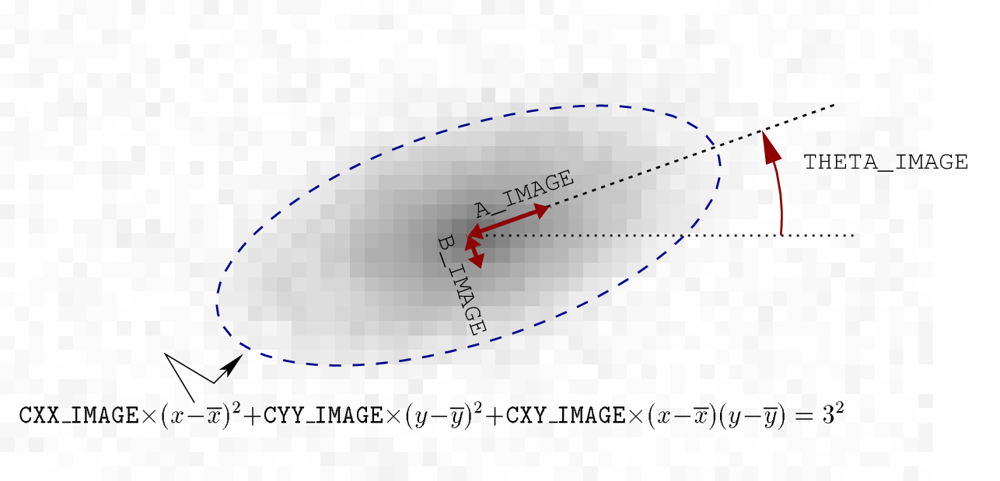

### LIkely site of the ztf event w.r.t hecate:

In [89]:
for (index,row),(index1,row1) in zip(df2.iterrows(),new_df.iterrows()):
    if row['dist'] > 3*max(row['r1(d)'],row['r2(d)']):
        df2.at[index, 'est'] = 'far' # event happened faraway from galaxy
    else: 
        d=ell_dist(row['r1(d)'],row['r2(d)'],row['PA'],row['RA'],row['DEC'],row1['meanra'],row1['meandec'])
        if d < 9:
            df2.at[index, 'est'] = 'in' # event happened inside galaxy
        else:
            df2.at[index, 'est'] = 'nearby' # event happened nearby galaxy

### Likely site of the ztf event with delight ras,decs w.r.t hecate:

In [93]:
for (index,row),(index1,row1) in zip(df3.iterrows(),new_df.iterrows()):
    if row['dist'] > 3*max(row['r1(d)'],row['r2(d)']):
        df3.at[index, 'est'] = 'far' # event happened faraway from galaxy
    else: 
        d=ell_dist(row['r1(d)'],row['r2(d)'],row['PA'],row['RA'],row['DEC'],row1['meanra'],row1['meandec'])
        if d < 9:
            df3.at[index, 'est'] = 'in' # event happened inside galaxy
        else:
            df3.at[index, 'est'] = 'nearby' # event happen

In [94]:
df3

,OBJNAME,R1,R2,r1(d),r2(d),PA,RA,DEC,dist,est
13823,UGC03630,0.743,0.397,0.012408,0.006630,3.7,105.263791,1.911294,1.074935,far
13823,UGC03630,0.743,0.397,0.012408,0.006630,3.7,105.263791,1.911294,1.491803,far
13823,UGC03630,0.743,0.397,0.012408,0.006630,3.7,105.263791,1.911294,0.865806,far
13823,UGC03630,0.743,0.397,0.012408,0.006630,3.7,105.263791,1.911294,1.096022,far
55124,PGC085935,0.262,0.131,0.004375,0.002188,81.5,104.973765,-0.424302,1.519923,far
...,...,...,...,...,...,...,...,...,...,...
46650,PGC065089,0.387,0.115,0.006463,0.001921,122.5,309.378666,-16.541636,0.765737,far
143633,PGC3083018,0.419,0.286,0.006997,0.004776,121.5,313.397808,-16.665882,0.157319,far
90108,PGC894748,0.292,0.136,0.004876,0.002271,108.3,313.586532,-16.704585,0.172249,far
88900,PGC839783,0.305,0.239,0.005093,0.003991,111.3,312.524375,-20.573958,0.227413,far


### Combine all dataframes

In [116]:
dfs=[n,sn,detections,dmdts,dfp,dfq,dfr]

{'ZTF18aaoqrau': 'WISEA J183247.32+322833.1',
 'ZTF18aapahyk': 'WISEA J183109.17+352236.2',
 'ZTF18aawbnla': 'WISEA J193815.88+181523.8',
 'ZTF18aawcdll': '2MASS J19303090+2121495',
 'ZTF18aaxijzf': 'WISEA J195350.14+201445.8',
 'ZTF18abdlssf': 'WISEA J181723.41+324640.6',
 'ZTF18abfepek': 'WISEA J180237.48+343734.7',
 'ZTF18abfwkbu': 'WISEA J183248.03+323239.0',
 'ZTF18abmkjji': 'WISEA J194718.42+202414.2',
 'ZTF18abmkovc': 'WISEA J193914.75+181639.7',
 'ZTF18abmkrcu': 'WISEA J195019.30+164108.1',
 'ZTF18abmkziw': 'WISEA J195058.56+174300.3',
 'ZTF18abmlhkf': 'WISEA J195045.25+163510.8',
 'ZTF18abmlkld': 'WISEA J194924.90+174907.7',
 'ZTF18abmlkzy': 'WISEA J195420.25+201600.4',
 'ZTF18abmlzzp': '2MASS J19465558+2229526',
 'ZTF18abmqkww': 'WISEA J195000.98+183619.0',
 'ZTF18abmyhyx': 'WISEA J191945.19+303136.9',
 'ZTF18abrtwth': 'WISEA J194906.70+185052.5',
 'ZTF18abrwbon': '2MASS J19512857+1828140',
 'ZTF18absemdc': 'WISEA J182017.04+354930.2',
 'ZTF18acaqunj': 'WISEA J200820.46-02102

In [ ]:
from functools import reduce
merged_df = reduce(lambda left, right: pd.merge(left, right, left_index=True, right_index=True, how='inner'), dfs)

## Finally create multiple filters in the combined dataframe:
- filter 1: Based on stamp classifier
- filter 2: Based on location/ detections of the event
- filter 3: Based on rise time

In [ ]:
condition1=((n['probability']>=0.5)|(n['ndet_x']>1)& (n['ranking']==1))
condition2=((n['ndet_x']>1)|(n['ecl_lat']>20))&(n.gal_lat.abs() > 20) & (n.gal_A_g < 1)
n['filter1']=condition1
n['filter2']=condition2

In [ ]:
GET IMAGES USING SDSS, PANSTARRS,
IPYALADIN BEST CHOICE

In [233]:
!pip install basemap

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 860.7/860.7 KB 3.2 MB/s eta 0:00:00m eta 0:00:010:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 KB 641.5 kB/s eta 0:00:00 MB/s eta 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.5/30.5 MB 5.3 MB/s eta 0:00:00m eta 0:00:010:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 6.5 MB/s eta 0:00:00m eta 0:00:010:00:01
